# Homework 2
*This notebook includes both coding and written questions. Please hand in this notebook file with all the outputs and your answers to the written questions.*

This assignment covers Canny edge detector and Hough transform.

In [87]:
# Setup
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from time import time
from skimage import io

from __future__ import print_function

%matplotlib inline
plt.rcParams['figure.figsize'] = (15.0, 12.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# for auto-reloading extenrnal modules
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Part 1: Canny Edge Detector (85 points)
In this part, you are going to implement a Canny edge detector. The Canny edge detection algorithm can be broken down in to five steps:
1. Smoothing
2. Finding gradients
3. Non-maximum suppression
4. Double thresholding
5. Edge tracking by hysterisis

### 1.1 Smoothing (10 points)
#### Implementation (5 points)
We first smooth the input image by convolving it with a Gaussian kernel. The equation for a Gaussian kernel of size $(2k+1)\times(2k+1)$ is given by:

$$h_{ij}=\frac{1}{2\pi\sigma^2}\exp{\Bigl(-\frac{(i-k)^2+(j-k)^2}{2\sigma^2}\Bigr)}, 0\leq i,j < 2k+1$$

Implement **`gaussian_kernel`** in `edge.py` and run the code below.

In [1]:
from edge import conv, gaussian_kernel

# Define 3x3 Gaussian kernel with std = 1
kernel = gaussian_kernel(3, 1)
kernel_test = np.array(
    [[ 0.05854983, 0.09653235, 0.05854983],
     [ 0.09653235, 0.15915494, 0.09653235],
     [ 0.05854983, 0.09653235, 0.05854983]]
)

# Test Gaussian kernel
if not np.allclose(kernel, kernel_test):
    print('Incorrect values! Please check your implementation.')

NameError: name 'np' is not defined

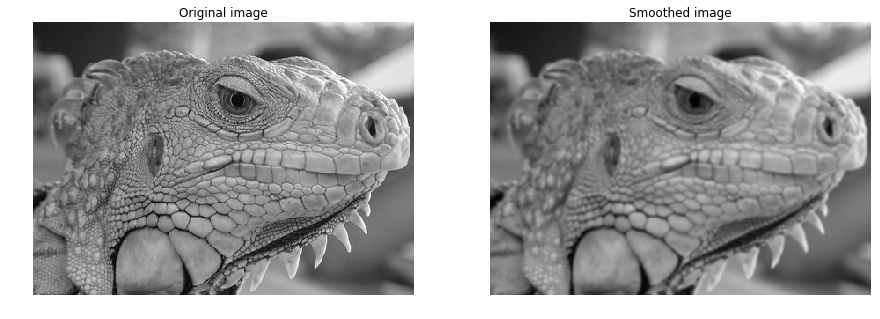

In [83]:
# Test with different kernel_size and sigma
kernel_size = 5
sigma = 1.4

# Load image
img = io.imread('iguana.png', as_grey=True)

# Define 5x5 Gaussian kernel with std = sigma
kernel = gaussian_kernel(kernel_size, sigma)

# Convolve image with kernel to achieve smoothed effect
smoothed = conv(img, kernel)

plt.subplot(1,2,1)
plt.imshow(img)
plt.title('Original image')
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(smoothed)
plt.title('Smoothed image')
plt.axis('off')

plt.show()

#### Question (5 points)
What is the effect of changing kernel_size and sigma?

**Your Answer:** Write your solution in this markdown cell.

The kernel size decides the scale in which we do the smoothing and the edge detection. The sigma decides the extent to which we want to smooth the image.

### 1.2 Finding gradients (15 points)
The gradient of a 2D scalar function $I:\mathbb{R}^2\rightarrow{\mathbb{R}}$ in Cartesian coordinate is defined by:

$$\nabla{I(x,y)}=\bigl[\frac{\partial{I}}{\partial{x}},\frac{\partial{I}}{\partial{y}}\bigr],$$

where

$$
\frac{\partial{I(x,y)}}{\partial{x}}=\lim_{\Delta{x}\to{0}}\frac{I(x+\Delta{x},y)-I(x,y)}{\Delta{x}} \\
\frac{\partial{I(x,y)}}{\partial{y}}=\lim_{\Delta{y}\to{0}}\frac{I(x,y+\Delta{y})-I(x,y)}{\Delta{y}}.
$$

In case of images, we can approximate the partial derivatives by taking differences at one pixel intervals:

$$
\frac{\partial{I(x,y)}}{\partial{x}}\approx{\frac{I(x+1,y)-I(x-1,y)}{2}} \\
\frac{\partial{I(x,y)}}{\partial{y}}\approx{\frac{I(x,y+1)-I(x,y-1)}{2}}
$$

Note that the partial derivatives can be computed by convolving the image $I$ with some appropriate kernels $D_x$ and $D_y$:

$$
\frac{\partial{I}}{\partial{x}}\approx{I*D_x}=G_x \\
\frac{\partial{I}}{\partial{y}}\approx{I*D_y}=G_y
$$

#### Implementation (5 points)
Find the kernels $D_x$ and $D_y$ and implement **`partial_x`** and **`partial_y`** using `conv` defined in `edge.py`.

*-Hint: Remeber that convolution flips the kernel.*

In [89]:
from edge import partial_x, partial_y

# Test input
I = np.array(
    [[0, 0, 0],
     [0, 1, 0],
     [0, 0, 0]]
)

# Expected outputs
I_x_test = np.array(
    [[ 0, 0, 0],
     [ 0.5, 0, -0.5],
     [ 0, 0, 0]]
)

I_y_test = np.array(
    [[ 0, 0.5, 0],
     [ 0, 0, 0],
     [ 0, -0.5, 0]]
)

# Compute partial derivatives
I_x = partial_x(I)
I_y = partial_y(I)

# Test correctness of partial_x and partial_y
if not np.all(I_x == I_x_test):
    print('partial_x incorrect')
    
if not np.all(I_y == I_y_test):
    print('partial_y incorrect')

In [8]:
kernel = np.array([1,0,-1],ndmin = 2)
print(kernel.shape)

(1, 3)


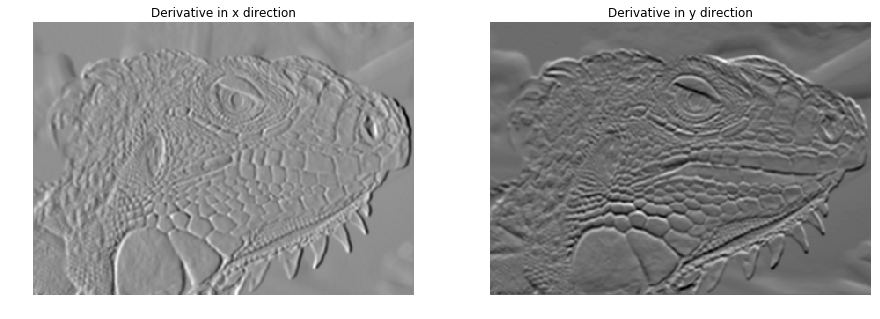

In [90]:
# Compute partial derivatives of smoothed image
Gx = partial_x(smoothed)
Gy = partial_y(smoothed)

plt.subplot(1,2,1)
plt.imshow(Gx)
plt.title('Derivative in x direction')
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(Gy)
plt.title('Derivative in y direction')
plt.axis('off')

plt.show()

#### Question (5 points)
What is the reason for performing smoothing prior to computing the gradients?


**Your Answer:** Write your solution in this markdown cell.

Image noise results in pixels that look very different from from their neighbors, and they tend to be misinterpreted as edges by the difference filters. Smoothing can help with this.

#### Implementation (5 points)
Now, we can compute the magnitude and direction of gradient with the two partial derivatives:

$$
G = \sqrt{G_{x}^{2}+G_{y}^{2}} \\
\Theta = arctan\bigl(\frac{G_{y}}{G_{x}}\bigr)
$$

Implement **`gradient`** in `edge.py` which takes in an image and outputs $G$ and $\Theta$.

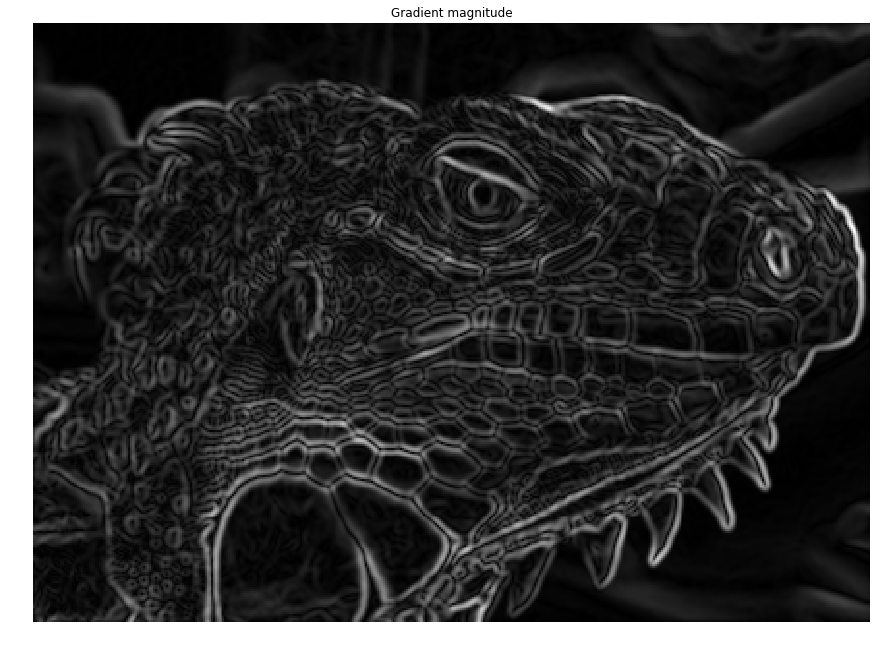

In [86]:
from edge import gradient

G, theta = gradient(smoothed)

if not np.all(G >= 0):
    print('Magnitude of gradients should be non-negative.')
    
if not np.all((theta >= 0) * (theta < 360)):
    print('Direction of gradients should be in range 0 <= theta < 360')

plt.imshow(G)
plt.title('Gradient magnitude')
plt.axis('off')
plt.show()

### 1.3 Non-maximum suppression (15 points)
You should be able to see that the edges extracted from the gradient of the smoothed image are quite thick and blurry. The purpose of this step is to convert the "blurred" edges into "sharp" edges. Basically, this is done by preserving all local maxima in the gradient image and discarding everything else. The algorithm is for each pixel (x,y) in the gradient image:
1. Round the gradient direction $\Theta[y,x]$ to the nearest 45 degrees, corresponding to the use of an 8-connected neighbourhood.

2. Compare the edge strength of the current pixel with the edge strength of the pixel in the positive and negative gradient directions. For example, if the gradient direction is south (theta=90), compare with the pixels to the north and south.

3. If the edge strength of the current pixel is the largest; preserve the value of the edge strength. If not, suppress (i.e. remove) the value.

Implement **`non_maximum_suppression`** in `edge.py`.

We provide the correct output and the difference between it and your result for debugging purposes.  If you see white spots in the Difference image, you should check your implementation.

In [82]:
from edge import non_maximum_suppression

# Test input
g = np.array(
    [[0.4, 0.5, 0.6],
     [0.3, 0.5, 0.7],
     [0.4, 0.5, 0.6]]
)

# Print out non-maximum suppressed output
# varying theta
for angle in range(0, 180, 45):
    print('Thetas:', angle)
    t = np.ones((3, 3)) * angle # Initialize theta
    print(non_maximum_suppression(g, t))

Thetas: 0
[[ 0.   0.   0. ]
 [ 0.   0.   0.7]
 [ 0.   0.   0. ]]
Thetas: 45
[[ 0.   0.   0. ]
 [ 0.   0.   0.7]
 [ 0.   0.   0. ]]
Thetas: 90
[[ 0.   0.   0. ]
 [ 0.   0.   0.7]
 [ 0.   0.   0. ]]
Thetas: 135
[[ 0.   0.   0. ]
 [ 0.   0.   0.7]
 [ 0.   0.   0. ]]


In [65]:
c = np.array(
    [[0.4, 0.5, 0.7],
     [0.3, 0.5, 0.7],
     [0.4, 0.5, 0.6]]
)
indice = ((c == 0.5 )|(c == 0.7))
print(c[indice])

[ 0.5  0.7  0.5  0.7  0.5]


In [ ]:
nms = non_maximum_suppression(G, theta)

plt.imshow(nms)
plt.title('Non-maximum suppressed')
plt.axis('off')
plt.show()

plt.subplot(1, 3, 1)
plt.imshow(nms)
plt.axis('off')
plt.title('Your result')

plt.subplot(1, 3, 2)
reference = np.load('references/iguana_non_max_suppressed.npy')
plt.imshow(reference)
plt.axis('off')
plt.title('Reference')

plt.subplot(1, 3, 3)
plt.imshow(nms - reference)
plt.title('Difference')
plt.axis('off')
plt.show()


G_patch [[ 0.          0.          0.        ]
 [ 0.          0.00161343  0.00188738]
 [ 0.          0.00271228  0.00244498]]
theta_patch [[  0.   0.   0.]
 [  0.  90.  45.]
 [  0.  90.  90.]]
0.00271228294774
G_patch [[ 0.          0.          0.        ]
 [ 0.00161343  0.00188738  0.0017663 ]
 [ 0.00271228  0.00244498  0.00180209]]
theta_patch [[  0.   0.   0.]
 [ 90.  45.  45.]
 [ 90.  90.  45.]]
0.0018873848369
G_patch [[ 0.          0.          0.        ]
 [ 0.00188738  0.0017663   0.00130333]
 [ 0.00244498  0.00180209  0.00102451]]
theta_patch [[  0.   0.   0.]
 [ 45.  45.  45.]
 [ 90.  45.  45.]]
0.0018873848369
G_patch [[ 0.          0.          0.        ]
 [ 0.0017663   0.00130333  0.00078215]
 [ 0.00180209  0.00102451  0.00036761]]
theta_patch [[  0.   0.   0.]
 [ 45.  45.   0.]
 [ 45.  45.  45.]]
0.00180209069251
G_patch [[  0.00000000e+00   0.00000000e+00   0.00000000e+00]
 [  1.30333269e-03   7.82150271e-04   2.66250107e-04]
 [  1.02450620e-03   3.67608283e-04   6.037320

G_patch [[ 0.          0.          0.        ]
 [ 0.00088569  0.00046597  0.00114823]
 [ 0.00101505  0.00040054  0.0003883 ]]
theta_patch [[   0.    0.    0.]
 [ 360.  225.  180.]
 [ 315.  270.  135.]]
0.000465972730761
G_patch [[ 0.          0.          0.        ]
 [ 0.00046597  0.00114823  0.00096285]
 [ 0.00040054  0.0003883   0.00104167]]
theta_patch [[   0.    0.    0.]
 [ 225.  180.  135.]
 [ 270.  135.   90.]]
0.00114823023702
G_patch [[ 0.          0.          0.        ]
 [ 0.00114823  0.00096285  0.00092393]
 [ 0.0003883   0.00104167  0.00172647]]
theta_patch [[   0.    0.    0.]
 [ 180.  135.   90.]
 [ 135.   90.   90.]]
0.000962852841891
G_patch [[ 0.          0.          0.        ]
 [ 0.00096285  0.00092393  0.00134647]
 [ 0.00104167  0.00172647  0.00207128]]
theta_patch [[   0.    0.    0.]
 [ 135.   90.   45.]
 [  90.   90.   45.]]
0.0017264678575
G_patch [[ 0.          0.          0.        ]
 [ 0.00092393  0.00134647  0.00135876]
 [ 0.00172647  0.00207128  0.00201817

G_patch [[ 0.          0.          0.        ]
 [ 0.00057525  0.00061078  0.00127801]
 [ 0.00060963  0.00161112  0.0022913 ]]
theta_patch [[   0.    0.    0.]
 [ 180.   90.   45.]
 [  45.   45.   45.]]
0.000610783122324
G_patch [[ 0.          0.          0.        ]
 [ 0.00061078  0.00127801  0.00182468]
 [ 0.00161112  0.0022913   0.00250506]]
theta_patch [[  0.   0.   0.]
 [ 90.  45.  45.]
 [ 45.  45.  45.]]
0.00250505624906
G_patch [[ 0.          0.          0.        ]
 [ 0.00127801  0.00182468  0.00234144]
 [ 0.0022913   0.00250506  0.00257662]]
theta_patch [[  0.   0.   0.]
 [ 45.  45.   0.]
 [ 45.  45.  45.]]
0.00257661908376
G_patch [[ 0.          0.          0.        ]
 [ 0.00182468  0.00234144  0.00309822]
 [ 0.00250506  0.00257662  0.00314656]]
theta_patch [[  0.   0.   0.]
 [ 45.   0.   0.]
 [ 45.  45.  45.]]
0.00309821555561
G_patch [[ 0.          0.          0.        ]
 [ 0.00234144  0.00309822  0.0038375 ]
 [ 0.00257662  0.00314656  0.00404032]]
theta_patch [[  0.   0. 

 [  90.    0.    0.]]
0.00974024820816
G_patch [[ 0.          0.          0.        ]
 [ 0.00546415  0.0106521   0.01292351]
 [ 0.0045771   0.00974025  0.01254873]]
theta_patch [[   0.    0.    0.]
 [   0.  360.  360.]
 [   0.    0.  360.]]
0.012923507313
G_patch [[ 0.          0.          0.        ]
 [ 0.0106521   0.01292351  0.010756  ]
 [ 0.00974025  0.01254873  0.01120329]]
theta_patch [[   0.    0.    0.]
 [ 360.  360.  360.]
 [   0.  360.  360.]]
0.012923507313
G_patch [[ 0.          0.          0.        ]
 [ 0.01292351  0.010756    0.00610279]
 [ 0.01254873  0.01120329  0.00707439]]
theta_patch [[   0.    0.    0.]
 [ 360.  360.  360.]
 [ 360.  360.    0.]]
0.012923507313
G_patch [[ 0.          0.          0.        ]
 [ 0.010756    0.00610279  0.00297249]
 [ 0.01120329  0.00707439  0.00402198]]
theta_patch [[   0.    0.    0.]
 [ 360.  360.    0.]
 [ 360.    0.    0.]]
0.0112032947296
G_patch [[ 0.          0.          0.        ]
 [ 0.00610279  0.00297249  0.00261195]
 [ 0.0

 [ 135.  135.  135.]]
0.00389777684733
G_patch [[ 0.          0.          0.        ]
 [ 0.00299731  0.00187704  0.00159248]
 [ 0.00389778  0.00330548  0.00340897]]
theta_patch [[   0.    0.    0.]
 [ 135.  135.   45.]
 [ 135.  135.   90.]]
0.00389777684733
G_patch [[ 0.          0.          0.        ]
 [ 0.00187704  0.00159248  0.00283995]
 [ 0.00330548  0.00340897  0.00440919]]
theta_patch [[   0.    0.    0.]
 [ 135.   45.   45.]
 [ 135.   90.   45.]]
0.00440918671033
G_patch [[ 0.          0.          0.        ]
 [ 0.00159248  0.00283995  0.00272082]
 [ 0.00340897  0.00440919  0.00457126]]
theta_patch [[  0.   0.   0.]
 [ 45.  45.  45.]
 [ 90.  45.  45.]]
0.00457126443014
G_patch [[ 0.          0.          0.        ]
 [ 0.00283995  0.00272082  0.00185486]
 [ 0.00440919  0.00457126  0.00422237]]
theta_patch [[  0.   0.   0.]
 [ 45.  45.  90.]
 [ 45.  45.  90.]]
0.00457126443014
G_patch [[ 0.          0.          0.        ]
 [ 0.00272082  0.00185486  0.003949  ]
 [ 0.00457126  0.

G_patch [[ 0.          0.          0.        ]
 [ 0.00175554  0.00119249  0.0012174 ]
 [ 0.00323123  0.002522    0.00192115]]
theta_patch [[   0.    0.    0.]
 [ 315.  360.    0.]
 [ 315.  360.    0.]]
0.00252200108854
G_patch [[ 0.          0.          0.        ]
 [ 0.00119249  0.0012174   0.00129961]
 [ 0.002522    0.00192115  0.00149351]]
theta_patch [[   0.    0.    0.]
 [ 360.    0.   45.]
 [ 360.    0.   45.]]
0.00192115313066
G_patch [[ 0.          0.          0.        ]
 [ 0.0012174   0.00129961  0.0012616 ]
 [ 0.00192115  0.00149351  0.00123417]]
theta_patch [[  0.   0.   0.]
 [  0.  45.   0.]
 [  0.  45.  45.]]
0.00149351150426
G_patch [[ 0.          0.          0.        ]
 [ 0.00129961  0.0012616   0.0011697 ]
 [ 0.00149351  0.00123417  0.0010564 ]]
theta_patch [[  0.   0.   0.]
 [ 45.   0.   0.]
 [ 45.  45.  45.]]
0.00126160309537
G_patch [[ 0.          0.          0.        ]
 [ 0.0012616   0.0011697   0.00085065]
 [ 0.00123417  0.0010564   0.00083268]]
theta_patch [[  

 [ 315.  315.  315.]]
0.00311250550949
G_patch [[ 0.          0.          0.        ]
 [ 0.00311251  0.00268094  0.00196804]
 [ 0.00299252  0.00325941  0.00321233]]
theta_patch [[   0.    0.    0.]
 [ 360.  315.  315.]
 [ 315.  315.  315.]]
0.00325940926869
G_patch [[ 0.          0.          0.        ]
 [ 0.00268094  0.00196804  0.00153087]
 [ 0.00325941  0.00321233  0.00292516]]
theta_patch [[   0.    0.    0.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.00325940926869
G_patch [[ 0.          0.          0.        ]
 [ 0.00196804  0.00153087  0.00144275]
 [ 0.00321233  0.00292516  0.00264736]]
theta_patch [[   0.    0.    0.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.00321232882793
G_patch [[ 0.          0.          0.        ]
 [ 0.00153087  0.00144275  0.00132177]
 [ 0.00292516  0.00264736  0.00244176]]
theta_patch [[   0.    0.    0.]
 [ 315.  315.  315.]
 [ 315.  315.  270.]]
0.00292516199558
G_patch [[ 0.          0.          0.        ]
 [ 0.00144275  0.00132177  0.00112931]

G_patch [[ 0.          0.          0.        ]
 [ 0.01086897  0.01056061  0.01054234]
 [ 0.02176283  0.02225019  0.02218705]]
theta_patch [[   0.    0.    0.]
 [ 225.  225.  225.]
 [ 270.  270.  270.]]
0.0108689672255
G_patch [[ 0.          0.          0.        ]
 [ 0.01056061  0.01054234  0.00971785]
 [ 0.02225019  0.02218705  0.02059693]]
theta_patch [[   0.    0.    0.]
 [ 225.  225.  225.]
 [ 270.  270.  270.]]
0.0105606099421
G_patch [[ 0.          0.          0.        ]
 [ 0.01054234  0.00971785  0.0077951 ]
 [ 0.02218705  0.02059693  0.01798521]]
theta_patch [[   0.    0.    0.]
 [ 225.  225.  270.]
 [ 270.  270.  270.]]
0.0105423354871
G_patch [[ 0.          0.          0.        ]
 [ 0.00971785  0.0077951   0.00693902]
 [ 0.02059693  0.01798521  0.01622284]]
theta_patch [[   0.    0.    0.]
 [ 225.  270.  270.]
 [ 270.  270.  270.]]
0.0205969335214
G_patch [[ 0.          0.          0.        ]
 [ 0.0077951   0.00693902  0.01071749]
 [ 0.01798521  0.01622284  0.01761221]]
th

 [ 0.00936128  0.0097537   0.00916855]]
theta_patch [[   0.    0.    0.]
 [ 180.  180.  180.]
 [ 180.  180.  225.]]
0.00975370373679
G_patch [[ 0.          0.          0.        ]
 [ 0.00804051  0.00596407  0.00497541]
 [ 0.0097537   0.00916855  0.00926019]]
theta_patch [[   0.    0.    0.]
 [ 180.  180.  225.]
 [ 180.  225.  225.]]
0.00975370373679
G_patch [[ 0.          0.          0.        ]
 [ 0.00596407  0.00497541  0.00493137]
 [ 0.00916855  0.00926019  0.00948285]]
theta_patch [[   0.    0.    0.]
 [ 180.  225.  225.]
 [ 225.  225.  225.]]
0.00948285327892
G_patch [[ 0.          0.          0.        ]
 [ 0.00497541  0.00493137  0.00441895]
 [ 0.00926019  0.00948285  0.00861362]]
theta_patch [[   0.    0.    0.]
 [ 225.  225.  225.]
 [ 225.  225.  270.]]
0.00948285327892
G_patch [[ 0.          0.          0.        ]
 [ 0.00493137  0.00441895  0.00314878]
 [ 0.00948285  0.00861362  0.00696368]]
theta_patch [[   0.    0.    0.]
 [ 225.  225.  225.]
 [ 225.  270.  270.]]
0.009482

0.000790834301523
G_patch [[ 0.00040605  0.00104809  0.00126293]
 [ 0.00020503  0.00079083  0.00132276]
 [ 0.00014599  0.0003852   0.00095588]]
theta_patch [[ 180.  180.  135.]
 [ 135.  135.  135.]
 [ 360.   90.  135.]]
0.00132275704016
G_patch [[ 0.00104809  0.00126293  0.00085868]
 [ 0.00079083  0.00132276  0.00137964]
 [ 0.0003852   0.00095588  0.00127204]]
theta_patch [[ 180.  135.  135.]
 [ 135.  135.  135.]
 [  90.  135.  135.]]
0.00137964499846
G_patch [[ 0.00126293  0.00085868  0.00057539]
 [ 0.00132276  0.00137964  0.00096801]
 [ 0.00095588  0.00127204  0.00109371]]
theta_patch [[ 135.  135.   45.]
 [ 135.  135.   90.]
 [ 135.  135.   90.]]
0.00137964499846
G_patch [[ 0.00085868  0.00057539  0.00114726]
 [ 0.00137964  0.00096801  0.00091561]
 [ 0.00127204  0.00109371  0.00086897]]
theta_patch [[ 135.   45.    0.]
 [ 135.   90.   45.]
 [ 135.   90.   45.]]
0.00109370589896
G_patch [[ 0.00057539  0.00114726  0.00137654]
 [ 0.00096801  0.00091561  0.00125545]
 [ 0.00109371  0.000

 [ 0.00084512  0.00119732  0.00122188]]
theta_patch [[  90.   90.  135.]
 [  90.  135.  135.]
 [ 135.  135.  135.]]
0.00170229013265
G_patch [[ 0.00099186  0.00064786  0.00044406]
 [ 0.00170229  0.00137728  0.00102373]
 [ 0.00119732  0.00122188  0.00106715]]
theta_patch [[  90.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.00170229013265
G_patch [[ 0.00064786  0.00044406  0.0002819 ]
 [ 0.00137728  0.00102373  0.00090426]
 [ 0.00122188  0.00106715  0.00136268]]
theta_patch [[ 135.  135.   90.]
 [ 135.  135.   90.]
 [ 135.  135.   90.]]
0.00137727849324
G_patch [[ 0.00044406  0.0002819   0.00085953]
 [ 0.00102373  0.00090426  0.00117746]
 [ 0.00106715  0.00136268  0.00166102]]
theta_patch [[ 135.   90.    0.]
 [ 135.   90.   45.]
 [ 135.   90.   45.]]
0.00136268165307
G_patch [[ 0.0002819   0.00085953  0.00118606]
 [ 0.00090426  0.00117746  0.00127895]
 [ 0.00136268  0.00166102  0.00155324]]
theta_patch [[ 90.   0.   0.]
 [ 90.  45.  45.]
 [ 90.  45.  45.]]
0.00166102116166


 [ 0.00077906  0.00044045  0.00032059]]
theta_patch [[   0.  360.  315.]
 [  45.  360.  315.]
 [  45.    0.    0.]]
0.00159603125712
G_patch [[ 0.00159603  0.00050644  0.00057833]
 [ 0.0008752   0.00052638  0.00019875]
 [ 0.00044045  0.00032059  0.00062054]]
theta_patch [[ 360.  315.  180.]
 [ 360.  315.  270.]
 [   0.    0.   45.]]
0.000526377004702
G_patch [[ 0.00050644  0.00057833  0.00057525]
 [ 0.00052638  0.00019875  0.00060963]
 [ 0.00032059  0.00062054  0.00143219]]
theta_patch [[ 315.  180.  180.]
 [ 315.  270.   45.]
 [   0.   45.   45.]]
0.00019875313597
G_patch [[ 0.00057833  0.00057525  0.00061078]
 [ 0.00019875  0.00060963  0.00161112]
 [ 0.00062054  0.00143219  0.00221533]]
theta_patch [[ 180.  180.   90.]
 [ 270.   45.   45.]
 [  45.   45.   45.]]
0.00221532659162
G_patch [[ 0.00057525  0.00061078  0.00127801]
 [ 0.00060963  0.00161112  0.0022913 ]
 [ 0.00143219  0.00221533  0.0025497 ]]
theta_patch [[ 180.   90.   45.]
 [  45.   45.   45.]
 [  45.   45.   45.]]
0.00254

 [ 0.00146871  0.00186009  0.00213702]]
theta_patch [[ 315.   90.   90.]
 [ 360.   45.   90.]
 [   0.   45.   45.]]
0.00213701738493
G_patch [[ 0.00024599  0.00074781  0.00127384]
 [ 0.00106244  0.00160692  0.00230461]
 [ 0.00186009  0.00213702  0.00250746]]
theta_patch [[  90.   90.  135.]
 [  45.   90.   90.]
 [  45.   45.   90.]]
0.00250746172211
G_patch [[ 0.00074781  0.00127384  0.00188078]
 [ 0.00160692  0.00230461  0.00308426]
 [ 0.00213702  0.00250746  0.00300622]]
theta_patch [[  90.  135.  135.]
 [  90.   90.   90.]
 [  45.   90.   90.]]
0.00308425960113
G_patch [[ 0.00127384  0.00188078  0.00270222]
 [ 0.00230461  0.00308426  0.00396651]
 [ 0.00250746  0.00300622  0.0036055 ]]
theta_patch [[ 135.  135.  135.]
 [  90.   90.   90.]
 [  90.   90.   90.]]
0.00396650826572
G_patch [[ 0.00188078  0.00270222  0.00347906]
 [ 0.00308426  0.00396651  0.00494849]
 [ 0.00300622  0.0036055   0.00459908]]
theta_patch [[ 135.  135.  135.]
 [  90.   90.  135.]
 [  90.   90.  135.]]
0.003966

 [  45.   90.  135.]]
0.0037089954343
G_patch [[ 0.00228049  0.00084825  0.00138637]
 [ 0.00306214  0.00223894  0.00220805]
 [ 0.003709    0.00335788  0.00302486]]
theta_patch [[  45.  135.  135.]
 [  90.   90.  135.]
 [  90.  135.   90.]]
0.0037089954343
G_patch [[ 0.00084825  0.00138637  0.00196697]
 [ 0.00223894  0.00220805  0.00267737]
 [ 0.00335788  0.00302486  0.00312552]]
theta_patch [[ 135.  135.  135.]
 [  90.  135.  135.]
 [ 135.   90.   90.]]
0.00335788341423
G_patch [[ 0.00138637  0.00196697  0.00278978]
 [ 0.00220805  0.00267737  0.00351888]
 [ 0.00302486  0.00312552  0.00373801]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [  90.   90.  135.]]
0.00373800862522
G_patch [[ 0.00196697  0.00278978  0.00299731]
 [ 0.00267737  0.00351888  0.00389778]
 [ 0.00312552  0.00373801  0.00423731]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [  90.  135.  135.]]
0.00423730951176
G_patch [[ 0.00278978  0.00299731  0.00187704]
 [ 0.00351888  0.00389778  0.00330548]
 

 [ 0.00083549  0.00199732  0.00298236]]
theta_patch [[ 360.  360.  360.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.00300682667137
G_patch [[ 0.00223446  0.00252487  0.00322934]
 [ 0.00248132  0.00300683  0.00364262]
 [ 0.00199732  0.00298236  0.00391747]]
theta_patch [[ 360.  360.  360.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.00391747463998
G_patch [[ 0.00252487  0.00322934  0.00422904]
 [ 0.00300683  0.00364262  0.00444598]
 [ 0.00298236  0.00391747  0.00468169]]
theta_patch [[ 360.  360.  360.]
 [ 315.  315.  360.]
 [ 315.  315.  360.]]
0.00391747463998
G_patch [[ 0.00322934  0.00422904  0.00498551]
 [ 0.00364262  0.00444598  0.0049207 ]
 [ 0.00391747  0.00468169  0.00475417]]
theta_patch [[ 360.  360.  360.]
 [ 315.  360.  360.]
 [ 315.  360.  360.]]
0.00498551094887
G_patch [[ 0.00422904  0.00498551  0.00494434]
 [ 0.00444598  0.0049207   0.00473541]
 [ 0.00468169  0.00475417  0.00412759]]
theta_patch [[ 360.  360.  360.]
 [ 360.  360.  360.]
 [ 360.  360.  360.]]
0.004985

theta_patch [[ 360.  360.  315.]
 [ 315.  315.  270.]
 [ 315.  270.  270.]]
0.00222970791001
G_patch [[ 0.00165078  0.00156391  0.00152498]
 [ 0.00157145  0.00212378  0.00315274]
 [ 0.00195066  0.00230668  0.00288501]]
theta_patch [[ 360.  315.  270.]
 [ 315.  270.  270.]
 [ 270.  270.  225.]]
0.00315274312151
G_patch [[ 0.00156391  0.00152498  0.00206223]
 [ 0.00212378  0.00315274  0.00352469]
 [ 0.00230668  0.00288501  0.00283057]]
theta_patch [[ 315.  270.  225.]
 [ 270.  270.  270.]
 [ 270.  225.  270.]]
0.0035246912909
G_patch [[ 0.00152498  0.00206223  0.0019439 ]
 [ 0.00315274  0.00352469  0.00295378]
 [ 0.00288501  0.00283057  0.00244009]]
theta_patch [[ 270.  225.  225.]
 [ 270.  270.  270.]
 [ 225.  270.  270.]]
0.0035246912909
G_patch [[ 0.00206223  0.0019439   0.00100917]
 [ 0.00352469  0.00295378  0.00212558]
 [ 0.00283057  0.00244009  0.00240425]]
theta_patch [[ 225.  225.  225.]
 [ 270.  270.  270.]
 [ 270.  270.  315.]]
0.0035246912909
G_patch [[ 0.0019439   0.00100917 

 [ 0.03370707  0.03332461  0.03325549]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0337070664569
G_patch [[ 0.01783215  0.01787266  0.01739201]
 [ 0.02694809  0.02694313  0.02694727]
 [ 0.03332461  0.03325549  0.03331594]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0333246076953
G_patch [[ 0.01787266  0.01739201  0.0161312 ]
 [ 0.02694313  0.02694727  0.02633617]
 [ 0.03325549  0.03331594  0.03296604]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.033315939805
G_patch [[ 0.01739201  0.0161312   0.01388316]
 [ 0.02694727  0.02633617  0.0248505 ]
 [ 0.03331594  0.03296604  0.03191119]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.033315939805
G_patch [[ 0.0161312   0.01388316  0.01080491]
 [ 0.02633617  0.0248505   0.02257798]
 [ 0.03296604  0.03191119  0.03019281]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  270.]
 [ 315.  315.  270.]]
0.032966039231

theta_patch [[ 180.  180.  180.]
 [ 225.  225.  180.]
 [ 225.  225.  225.]]
0.0161781943759
G_patch [[ 0.01479246  0.01599559  0.01532468]
 [ 0.01421731  0.0162499   0.01684361]
 [ 0.01356511  0.01617819  0.01765485]]
theta_patch [[ 180.  180.  180.]
 [ 225.  180.  180.]
 [ 225.  225.  180.]]
0.0176548543633
G_patch [[ 0.01599559  0.01532468  0.01358815]
 [ 0.0162499   0.01684361  0.01553529]
 [ 0.01617819  0.01765485  0.0162813 ]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  225.]
 [ 225.  180.  225.]]
0.0176548543633
G_patch [[ 0.01532468  0.01358815  0.01177458]
 [ 0.01684361  0.01553529  0.01318731]
 [ 0.01765485  0.0162813   0.01302216]]
theta_patch [[ 180.  180.  180.]
 [ 180.  225.  225.]
 [ 180.  225.  225.]]
0.016281300181
G_patch [[ 0.01358815  0.01177458  0.00969254]
 [ 0.01553529  0.01318731  0.01042982]
 [ 0.0162813   0.01302216  0.00957925]]
theta_patch [[ 180.  180.  180.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.016281300181
G_patch [[ 0.01177458  0.00969254  0.0

0.0221057026318
G_patch [[ 0.00967932  0.01045957  0.01044525]
 [ 0.01722887  0.0190124   0.02061157]
 [ 0.02045842  0.0221057   0.02426618]]
theta_patch [[ 315.  315.  315.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0242661774752
G_patch [[ 0.01045957  0.01044525  0.00982331]
 [ 0.0190124   0.02061157  0.0218411 ]
 [ 0.0221057   0.02426618  0.02669517]]
theta_patch [[ 315.  315.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0266951718108
G_patch [[ 0.01044525  0.00982331  0.00979228]
 [ 0.02061157  0.0218411   0.0233456 ]
 [ 0.02426618  0.02669517  0.02946312]]
theta_patch [[ 315.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0294631171458
G_patch [[ 0.00982331  0.00979228  0.01130923]
 [ 0.0218411   0.0233456   0.02576393]
 [ 0.02669517  0.02946312  0.03247648]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0324764764988
G_patch [[ 0.00979228  0.01130923  0.01337254]
 [ 0.0233456   0.02576393  0.02846348]
 [ 0.02946312  0.03247648 

theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  90.  90.]]
0.00112117002011
G_patch [[ 0.00079704  0.00048366  0.00068121]
 [ 0.00068756  0.0004032   0.00053859]
 [ 0.00073387  0.00057763  0.00059096]]
theta_patch [[ 45.  45.   0.]
 [ 45.  45.  45.]
 [ 90.  90.  45.]]
0.000797036535087
G_patch [[ 0.00048366  0.00068121  0.00121183]
 [ 0.0004032   0.00053859  0.00101169]
 [ 0.00057763  0.00059096  0.0009147 ]]
theta_patch [[  45.    0.  360.]
 [  45.   45.    0.]
 [  90.   45.    0.]]
0.000590956728605
G_patch [[ 0.00068121  0.00121183  0.00141811]
 [ 0.00053859  0.00101169  0.00119283]
 [ 0.00059096  0.0009147   0.0010274 ]]
theta_patch [[   0.  360.  360.]
 [  45.    0.  360.]
 [  45.    0.    0.]]
0.00102740052481
G_patch [[ 0.00121183  0.00141811  0.00101505]
 [ 0.00101169  0.00119283  0.00087365]
 [ 0.0009147   0.0010274   0.00073153]]
theta_patch [[ 360.  360.  315.]
 [   0.  360.  360.]
 [   0.    0.  360.]]
0.00141811267132
G_patch [[ 0.00141811  0.00101505  0.00040054]


G_patch [[ 0.00152271  0.00131357  0.0008752 ]
 [ 0.00107608  0.00077906  0.00044045]
 [ 0.00075946  0.00056338  0.0006284 ]]
theta_patch [[  45.   45.  360.]
 [  45.   45.    0.]
 [  45.   45.   45.]]
0.00152270749352
G_patch [[ 0.00131357  0.0008752   0.00052638]
 [ 0.00077906  0.00044045  0.00032059]
 [ 0.00056338  0.0006284   0.00090006]]
theta_patch [[  45.  360.  315.]
 [  45.    0.    0.]
 [  45.   45.   45.]]
0.000440449652108
G_patch [[ 0.0008752   0.00052638  0.00019875]
 [ 0.00044045  0.00032059  0.00062054]
 [ 0.0006284   0.00090006  0.00138408]]
theta_patch [[ 360.  315.  270.]
 [   0.    0.   45.]
 [  45.   45.   45.]]
0.000440449652108
G_patch [[ 0.00052638  0.00019875  0.00060963]
 [ 0.00032059  0.00062054  0.00143219]
 [ 0.00090006  0.00138408  0.00200812]]
theta_patch [[ 315.  270.   45.]
 [   0.   45.   45.]
 [  45.   45.   45.]]
0.00200811804649
G_patch [[ 0.00019875  0.00060963  0.00161112]
 [ 0.00062054  0.00143219  0.00221533]
 [ 0.00138408  0.00200812  0.0023758

0.00308425960113
G_patch [[ 0.00230461  0.00308426  0.00396651]
 [ 0.00250746  0.00300622  0.0036055 ]
 [ 0.00265288  0.00269187  0.00289679]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 45.  90.  90.]]
0.00396650826572
G_patch [[ 0.00308426  0.00396651  0.00494849]
 [ 0.00300622  0.0036055   0.00459908]
 [ 0.00269187  0.00289679  0.00383522]]
theta_patch [[  90.   90.  135.]
 [  90.   90.  135.]
 [  90.   90.  135.]]
0.00396650826572
G_patch [[ 0.00396651  0.00494849  0.00534424]
 [ 0.0036055   0.00459908  0.00548565]
 [ 0.00289679  0.00383522  0.00495308]]
theta_patch [[  90.  135.  135.]
 [  90.  135.  135.]
 [  90.  135.  135.]]
0.00548565110443
G_patch [[ 0.00494849  0.00534424  0.00464349]
 [ 0.00459908  0.00548565  0.00539582]
 [ 0.00383522  0.00495308  0.00523952]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.00548565110443
G_patch [[ 0.00534424  0.00464349  0.00242879]
 [ 0.00548565  0.00539582  0.00393213]
 [ 0.00495308  0.00523952  0.0

 [ 135.  135.   90.]]
0.00423730951176
G_patch [[ 0.00389778  0.00330548  0.00340897]
 [ 0.00423731  0.00411037  0.00447498]
 [ 0.00422423  0.00443772  0.00499026]]
theta_patch [[ 135.  135.   90.]
 [ 135.   90.   90.]
 [ 135.   90.   90.]]
0.00499025668555
G_patch [[ 0.00330548  0.00340897  0.00440919]
 [ 0.00411037  0.00447498  0.00532137]
 [ 0.00443772  0.00499026  0.00569339]]
theta_patch [[ 135.   90.   45.]
 [  90.   90.   45.]
 [  90.   90.   45.]]
0.00499025668555
G_patch [[ 0.00340897  0.00440919  0.00457126]
 [ 0.00447498  0.00532137  0.00544405]
 [ 0.00499026  0.00569339  0.00574846]]
theta_patch [[ 90.  45.  45.]
 [ 90.  45.  45.]
 [ 90.  45.  45.]]
0.00574845991686
G_patch [[ 0.00440919  0.00457126  0.00422237]
 [ 0.00532137  0.00544405  0.00501688]
 [ 0.00569339  0.00574846  0.00522714]]
theta_patch [[ 45.  45.  90.]
 [ 45.  45.  90.]
 [ 45.  45.  90.]]
0.00574845991686
G_patch [[ 0.00457126  0.00422237  0.00554007]
 [ 0.00544405  0.00501688  0.00589984]
 [ 0.00574846  0.

 [  90.   90.  135.]]
0.00273431030669
G_patch [[ 0.00178052  0.00112685  0.00111101]
 [ 0.00231897  0.00152135  0.00042541]
 [ 0.00223152  0.00195717  0.0013624 ]]
theta_patch [[  90.   45.  360.]
 [  90.   90.   90.]
 [  90.  135.  135.]]
0.00231896884192
G_patch [[ 0.00112685  0.00111101  0.00182215]
 [ 0.00152135  0.00042541  0.00083549]
 [ 0.00195717  0.0013624   0.00047667]]
theta_patch [[  45.  360.  315.]
 [  90.   90.  315.]
 [ 135.  135.  180.]]
0.00152135360561
G_patch [[ 0.00111101  0.00182215  0.00248132]
 [ 0.00042541  0.00083549  0.00199732]
 [ 0.0013624   0.00047667  0.00093517]]
theta_patch [[ 360.  315.  315.]
 [  90.  315.  315.]
 [ 135.  180.  315.]]
0.00248131724312
G_patch [[ 0.00182215  0.00248132  0.00300683]
 [ 0.00083549  0.00199732  0.00298236]
 [ 0.00047667  0.00093517  0.00248806]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 180.  315.  315.]]
0.00300682667137
G_patch [[ 0.00248132  0.00300683  0.00364262]
 [ 0.00199732  0.00298236  0.00391747]

theta_patch [[ 315.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.00889912121323
G_patch [[ 0.00828653  0.00802349  0.00767845]
 [ 0.00872912  0.0082193   0.00750477]
 [ 0.00790266  0.00727713  0.00642575]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.00872912314103
G_patch [[ 0.00802349  0.00767845  0.00697744]
 [ 0.0082193   0.00750477  0.00658256]
 [ 0.00727713  0.00642575  0.00556933]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.00821930059787
G_patch [[ 0.00767845  0.00697744  0.0058966 ]
 [ 0.00750477  0.00658256  0.00559198]
 [ 0.00642575  0.00556933  0.00490941]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.00767845485945
G_patch [[ 0.00697744  0.0058966   0.00451887]
 [ 0.00658256  0.00559198  0.00460574]
 [ 0.00556933  0.00490941  0.00444722]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  315.]]
0.00697743582147
G_patch [[ 0.0058966   0.004518

G_patch [[ 0.0266971   0.02846557  0.02942882]
 [ 0.0283187   0.03125779  0.03323078]
 [ 0.0251528   0.02920049  0.0323343 ]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0332307764672
G_patch [[ 0.02846557  0.02942882  0.02944878]
 [ 0.03125779  0.03323078  0.03415846]
 [ 0.02920049  0.0323343   0.03433112]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0343311244723
G_patch [[ 0.02942882  0.02944878  0.02856589]
 [ 0.03323078  0.03415846  0.03420547]
 [ 0.0323343   0.03433112  0.03552952]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0355295183536
G_patch [[ 0.02944878  0.02856589  0.02747916]
 [ 0.03415846  0.03420547  0.03370707]
 [ 0.03433112  0.03552952  0.03598408]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0359840815692
G_patch [[ 0.02856589  0.02747916  0.02694809]
 [ 0.03420547  0.03370707  0.03332461]
 [ 0.03552952  0.03598408  0.03608916]]
th

G_patch [[ 0.0162499   0.01684361  0.01553529]
 [ 0.01617819  0.01765485  0.0162813 ]
 [ 0.01623304  0.01788993  0.01618591]]
theta_patch [[ 180.  180.  225.]
 [ 225.  180.  225.]
 [ 225.  225.  225.]]
0.0176548543633
G_patch [[ 0.01684361  0.01553529  0.01318731]
 [ 0.01765485  0.0162813   0.01302216]
 [ 0.01788993  0.01618591  0.01211843]]
theta_patch [[ 180.  225.  225.]
 [ 180.  225.  225.]
 [ 225.  225.  225.]]
0.0178899309579
G_patch [[ 0.01553529  0.01318731  0.01042982]
 [ 0.0162813   0.01302216  0.00957925]
 [ 0.01618591  0.01211843  0.00815847]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.016281300181
G_patch [[ 0.01318731  0.01042982  0.00754268]
 [ 0.01302216  0.00957925  0.00676244]
 [ 0.01211843  0.00815847  0.00552184]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.0131873061402
G_patch [[ 0.01042982  0.00754268  0.00519813]
 [ 0.00957925  0.00676244  0.00477673]
 [ 0.00815847  0.00552184  0.00391487]]
the

 [ 0.0198759   0.02025501  0.02077282]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0207728200905
G_patch [[ 0.01326798  0.01436033  0.01562717]
 [ 0.01775945  0.01855537  0.01935626]
 [ 0.02025501  0.02077282  0.02133066]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.021330660679
G_patch [[ 0.01436033  0.01562717  0.01722887]
 [ 0.01855537  0.01935626  0.02045842]
 [ 0.02077282  0.02133066  0.02214854]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0221485444421
G_patch [[ 0.01562717  0.01722887  0.0190124 ]
 [ 0.01935626  0.02045842  0.0221057 ]
 [ 0.02133066  0.02214854  0.02366335]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0236633545235
G_patch [[ 0.01722887  0.0190124   0.02061157]
 [ 0.02045842  0.0221057   0.02426618]
 [ 0.02214854  0.02366335  0.02614433]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.02614433133

G_patch [[  7.43918155e-04   5.97383101e-04   5.83373787e-04]
 [  6.14321604e-04   2.24159754e-04   2.84976434e-04]
 [  5.91183594e-04   1.67011948e-04   8.90735744e-05]]
theta_patch [[  45.   90.   90.]
 [   0.   45.  135.]
 [   0.    0.   90.]]
0.000743918154944
G_patch [[  5.97383101e-04   5.83373787e-04   4.65074047e-04]
 [  2.24159754e-04   2.84976434e-04   3.17797106e-04]
 [  1.67011948e-04   8.90735744e-05   3.04773623e-04]]
theta_patch [[  90.   90.   90.]
 [  45.  135.   90.]
 [   0.   90.   45.]]
0.000284976434374
G_patch [[  5.83373787e-04   4.65074047e-04   5.78291330e-04]
 [  2.84976434e-04   3.17797106e-04   6.42878414e-04]
 [  8.90735744e-05   3.04773623e-04   7.97488242e-04]]
theta_patch [[  90.   90.   45.]
 [ 135.   90.   45.]
 [  90.   45.   45.]]
0.000583373786622
G_patch [[ 0.00046507  0.00057829  0.00099456]
 [ 0.0003178   0.00064288  0.00113557]
 [ 0.00030477  0.00079749  0.00130395]]
theta_patch [[ 90.  45.  45.]
 [ 90.  45.  45.]
 [ 45.  45.  45.]]
0.0013039530

 [ 45.  45.   0.]]
0.00127221004283
G_patch [[ 0.00085183  0.00063458  0.00069169]
 [ 0.00095744  0.00060965  0.00036084]
 [ 0.00075853  0.0001392   0.00048289]]
theta_patch [[   0.   45.   45.]
 [  45.   45.   45.]
 [  45.    0.  270.]]
0.000957442057847
G_patch [[ 0.00063458  0.00069169  0.00069829]
 [ 0.00060965  0.00036084  0.00034841]
 [ 0.0001392   0.00048289  0.00078812]]
theta_patch [[  45.   45.   45.]
 [  45.   45.    0.]
 [   0.  270.  270.]]
0.000698290531958
G_patch [[ 0.00069169  0.00069829  0.00079021]
 [ 0.00036084  0.00034841  0.00051494]
 [ 0.00048289  0.00078812  0.00089218]]
theta_patch [[  45.   45.   45.]
 [  45.    0.  360.]
 [ 270.  270.  315.]]
0.000348408404177
G_patch [[ 0.00069829  0.00079021  0.00089003]
 [ 0.00034841  0.00051494  0.00063462]
 [ 0.00078812  0.00089218  0.00088392]]
theta_patch [[  45.   45.  360.]
 [   0.  360.  360.]
 [ 270.  315.  360.]]
0.000890029690583
G_patch [[ 0.00079021  0.00089003  0.00090433]
 [ 0.00051494  0.00063462  0.00063465

 [ 315.  270.  225.]]
0.00138162130705
G_patch [[ 0.00068924  0.0006176   0.00097439]
 [ 0.00046966  0.00138162  0.00174295]
 [ 0.00128671  0.00198411  0.00212265]]
theta_patch [[ 135.  180.  270.]
 [ 180.  180.  225.]
 [ 270.  225.  225.]]
0.00138162130705
G_patch [[ 0.0006176   0.00097439  0.00192253]
 [ 0.00138162  0.00174295  0.00179334]
 [ 0.00198411  0.00212265  0.00121381]]
theta_patch [[ 180.  270.  270.]
 [ 180.  225.  270.]
 [ 225.  225.  270.]]
0.00212264859142
G_patch [[ 0.00097439  0.00192253  0.00262559]
 [ 0.00174295  0.00179334  0.00233943]
 [ 0.00212265  0.00121381  0.0020511 ]]
theta_patch [[ 270.  270.  315.]
 [ 225.  270.  315.]
 [ 225.  270.  315.]]
0.00192253499064
G_patch [[ 0.00192253  0.00262559  0.00275686]
 [ 0.00179334  0.00233943  0.00279987]
 [ 0.00121381  0.0020511   0.00315338]]
theta_patch [[ 270.  315.  315.]
 [ 270.  315.  315.]
 [ 270.  315.  360.]]
0.00279986874247
G_patch [[ 0.00262559  0.00275686  0.00243497]
 [ 0.00233943  0.00279987  0.00250314]

theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.   0.]]
0.0106614086738
G_patch [[ 0.00968589  0.01066141  0.01122259]
 [ 0.00943092  0.01043723  0.01105799]
 [ 0.00889364  0.00987973  0.01042191]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.   0.   0.]]
0.0112225922637
G_patch [[ 0.01066141  0.01122259  0.01112935]
 [ 0.01043723  0.01105799  0.01075489]
 [ 0.00987973  0.01042191  0.00968219]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [  0.   0.   0.]]
0.0112225922637
G_patch [[ 0.01122259  0.01112935  0.01049307]
 [ 0.01105799  0.01075489  0.00951136]
 [ 0.01042191  0.00968219  0.00765448]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [  0.   0.   0.]]
0.0112225922637
G_patch [[ 0.01112935  0.01049307  0.00928577]
 [ 0.01075489  0.00951136  0.00760479]
 [ 0.00968219  0.00765448  0.00528219]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [  0.   0.   0.]]
0.0111293466747
G_patch [[ 0.01049307  0.00928577  0.0073657 ]
 [ 0.00951136  0.00760479  0.00548

theta_patch [[   0.    0.  360.]
 [  45.    0.  360.]
 [  45.   45.  360.]]
0.00307952045955
G_patch [[ 0.00279624  0.00205292  0.00122885]
 [ 0.0020761   0.00144619  0.00102717]
 [ 0.00138506  0.00083931  0.00050088]]
theta_patch [[   0.  360.  315.]
 [   0.  360.  270.]
 [  45.  360.  270.]]
0.0020529196489
G_patch [[ 0.00205292  0.00122885  0.00175203]
 [ 0.00144619  0.00102717  0.00153604]
 [ 0.00083931  0.00050088  0.00090404]]
theta_patch [[ 360.  315.  225.]
 [ 360.  270.  225.]
 [ 360.  270.  225.]]
0.0010271747111
G_patch [[ 0.00122885  0.00175203  0.00255918]
 [ 0.00102717  0.00153604  0.00191647]
 [ 0.00050088  0.00090404  0.0011245 ]]
theta_patch [[ 315.  225.  225.]
 [ 270.  225.  225.]
 [ 270.  225.  180.]]
0.00255918456512
G_patch [[ 0.00175203  0.00255918  0.00197405]
 [ 0.00153604  0.00191647  0.00101609]
 [ 0.00090404  0.0011245   0.00086545]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  180.]
 [ 225.  180.  135.]]
0.00255918456512
G_patch [[ 0.00255918  0.00197405

 [ 0.00278683  0.00248339  0.00241041]]
theta_patch [[   0.    0.   45.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.00278683214455
G_patch [[ 0.00092441  0.00085326  0.00083031]
 [ 0.00150101  0.00127126  0.00095862]
 [ 0.00248339  0.00241041  0.00227076]]
theta_patch [[   0.   45.   45.]
 [ 315.  315.  360.]
 [ 315.  315.  315.]]
0.00248338618403
G_patch [[ 0.00085326  0.00083031  0.00117001]
 [ 0.00127126  0.00095862  0.00040784]
 [ 0.00241041  0.00227076  0.00184097]]
theta_patch [[  45.   45.   90.]
 [ 315.  360.   45.]
 [ 315.  315.  315.]]
0.000958616575472
G_patch [[ 0.00083031  0.00117001  0.00191687]
 [ 0.00095862  0.00040784  0.00095439]
 [ 0.00227076  0.00184097  0.00130761]]
theta_patch [[  45.   90.  135.]
 [ 360.   45.  135.]
 [ 315.  315.  270.]]
0.00083031479148
G_patch [[ 0.00117001  0.00191687  0.00265249]
 [ 0.00040784  0.00095439  0.00197235]
 [ 0.00184097  0.00130761  0.00158881]]
theta_patch [[  90.  135.  135.]
 [  45.  135.  135.]
 [ 315.  270.  225.]]
0.00265

G_patch [[ 0.00339816  0.00343668  0.00338251]
 [ 0.00315263  0.00345226  0.00368937]
 [ 0.0030253   0.00324364  0.00352071]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  270.]
 [ 270.  270.  270.]]
0.00345226348821
G_patch [[ 0.00343668  0.00338251  0.00328546]
 [ 0.00345226  0.00368937  0.00374569]
 [ 0.00324364  0.00352071  0.00360233]]
theta_patch [[ 315.  315.  270.]
 [ 315.  270.  270.]
 [ 270.  270.  270.]]
0.00374569151291
G_patch [[ 0.00338251  0.00328546  0.00352132]
 [ 0.00368937  0.00374569  0.00394188]
 [ 0.00352071  0.00360233  0.00371816]]
theta_patch [[ 315.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.00394187945644
G_patch [[ 0.00328546  0.00352132  0.00424173]
 [ 0.00374569  0.00394188  0.00452504]
 [ 0.00360233  0.00371816  0.00417377]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  225.]
 [ 270.  270.  225.]]
0.00424172644634
G_patch [[ 0.00352132  0.00424173  0.00512816]
 [ 0.00394188  0.00452504  0.00505387]
 [ 0.00371816  0.00417377  0.00447679]

 [ 270.  270.  270.]]
0.0273049473515
G_patch [[ 0.02605051  0.02477496  0.02304208]
 [ 0.0265776   0.02605387  0.02570035]
 [ 0.02486024  0.02517473  0.02605462]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0265775967578
G_patch [[ 0.02477496  0.02304208  0.02144946]
 [ 0.02605387  0.02570035  0.02480587]
 [ 0.02517473  0.02605462  0.02615501]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0261550071762
G_patch [[ 0.02304208  0.02144946  0.02157868]
 [ 0.02570035  0.02480587  0.02401921]
 [ 0.02605462  0.02615501  0.02507619]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0261550071762
G_patch [[ 0.02144946  0.02157868  0.02395061]
 [ 0.02480587  0.02401921  0.02439471]
 [ 0.02615501  0.02507619  0.02401579]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0261550071762
G_patch [[ 0.02157868  0.02395061  0.02789031]
 [ 0.02401921  0.02439471  0.02663786]
 [ 0

0.0207912443175
G_patch [[ 0.01295642  0.01290584  0.01244564]
 [ 0.0170816   0.01625386  0.01461721]
 [ 0.02079124  0.01908755  0.01681602]]
theta_patch [[ 225.  225.  270.]
 [ 225.  225.  270.]
 [ 225.  225.  270.]]
0.0207912443175
G_patch [[ 0.01290584  0.01244564  0.011352  ]
 [ 0.01625386  0.01461721  0.01348304]
 [ 0.01908755  0.01681602  0.01612955]]
theta_patch [[ 225.  270.  270.]
 [ 225.  270.  270.]
 [ 225.  270.  270.]]
0.0168160215511
G_patch [[ 0.01244564  0.011352    0.00982158]
 [ 0.01461721  0.01348304  0.01286873]
 [ 0.01681602  0.01612955  0.01685086]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0168508555373
G_patch [[ 0.011352    0.00982158  0.00849645]
 [ 0.01348304  0.01286873  0.01245697]
 [ 0.01612955  0.01685086  0.0180385 ]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0180384994574
G_patch [[ 0.00982158  0.00849645  0.00737706]
 [ 0.01286873  0.01245697  0.01205152]
 [ 0.01685086  0.0180385  

G_patch [[ 0.03670057  0.03649244  0.        ]
 [ 0.03875605  0.03869037  0.        ]
 [ 0.03613792  0.03561872  0.        ]]
theta_patch [[ 270.  270.    0.]
 [ 270.  270.    0.]
 [ 270.  270.    0.]]
0.0387560467217
G_patch [[ 0.          0.00057259  0.00055464]
 [ 0.          0.00015925  0.00028158]
 [ 0.          0.00029123  0.00053761]]
theta_patch [[  0.  90.  90.]
 [  0.   0.  45.]
 [  0.   0.  45.]]
0.000291228324701
G_patch [[ 0.00057259  0.00055464  0.00053946]
 [ 0.00015925  0.00028158  0.00047907]
 [ 0.00029123  0.00053761  0.00047752]]
theta_patch [[  90.   90.  135.]
 [   0.   45.   90.]
 [   0.   45.   90.]]
0.000537605526795
G_patch [[ 0.00055464  0.00053946  0.00059932]
 [ 0.00028158  0.00047907  0.00077615]
 [ 0.00053761  0.00047752  0.00069904]]
theta_patch [[  90.  135.  135.]
 [  45.   90.  135.]
 [  45.   90.  135.]]
0.000554638605809
G_patch [[ 0.00053946  0.00059932  0.00042687]
 [ 0.00047907  0.00077615  0.00077304]
 [ 0.00047752  0.00069904  0.00080646]]
theta

G_patch [[ 0.00110089  0.00103553  0.00075033]
 [ 0.00107522  0.0010269   0.00079669]
 [ 0.00114862  0.00124438  0.00111045]]
theta_patch [[  0.   0.  45.]
 [  0.   0.   0.]
 [  0.   0.   0.]]
0.00124438291128
G_patch [[ 0.00103553  0.00075033  0.00035566]
 [ 0.0010269   0.00079669  0.00056956]
 [ 0.00124438  0.00111045  0.00080859]]
theta_patch [[  0.  45.  45.]
 [  0.   0.  45.]
 [  0.   0.  45.]]
0.00124438291128
G_patch [[ 0.00075033  0.00035566  0.00045326]
 [ 0.00079669  0.00056956  0.00067093]
 [ 0.00111045  0.00080859  0.00074226]]
theta_patch [[  45.   45.  135.]
 [   0.   45.   90.]
 [   0.   45.   90.]]
0.00080859226328
G_patch [[ 0.00035566  0.00045326  0.00089134]
 [ 0.00056956  0.00067093  0.00094529]
 [ 0.00080859  0.00074226  0.001038  ]]
theta_patch [[  45.  135.  135.]
 [  45.   90.  135.]
 [  45.   90.  135.]]
0.000742257856436
G_patch [[ 0.00045326  0.00089134  0.00090895]
 [ 0.00067093  0.00094529  0.00087787]
 [ 0.00074226  0.001038    0.00097172]]
theta_patch [[ 

 [ 0.00142862  0.00170653  0.0019756 ]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00197560301278
G_patch [[ 0.00090006  0.00138408  0.00200812]
 [ 0.00141964  0.00184333  0.0021273 ]
 [ 0.00170653  0.0019756   0.00198553]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00212730045758
G_patch [[ 0.00138408  0.00200812  0.00237582]
 [ 0.00184333  0.0021273   0.00205631]
 [ 0.0019756   0.00198553  0.00163294]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00237581738009
G_patch [[ 0.00200812  0.00237582  0.00220165]
 [ 0.0021273   0.00205631  0.00155556]
 [ 0.00198553  0.00163294  0.00103419]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00237581738009
G_patch [[ 0.00237582  0.00220165  0.0017799 ]
 [ 0.00205631  0.00155556  0.001119  ]
 [ 0.00163294  0.00103419  0.00078094]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.   0.]
 [ 45.  45.   0.]]
0.00237581738009
G_patch [[ 0.00220165  0.0017799   0

G_patch [[ 0.0020346   0.00251554  0.0026399 ]
 [ 0.00253216  0.00297343  0.00298432]
 [ 0.00296521  0.00329527  0.00314546]]
theta_patch [[  0.  45.  45.]
 [ 45.  45.  45.]
 [  0.  45.  45.]]
0.00329527259171
G_patch [[ 0.00251554  0.0026399   0.00265288]
 [ 0.00297343  0.00298432  0.00273077]
 [ 0.00329527  0.00314546  0.00264034]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00329527259171
G_patch [[ 0.0026399   0.00265288  0.00269187]
 [ 0.00298432  0.00273077  0.0023658 ]
 [ 0.00314546  0.00264034  0.00196345]]
theta_patch [[ 45.  45.  90.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00314545802153
G_patch [[ 0.00265288  0.00269187  0.00289679]
 [ 0.00273077  0.0023658   0.00227928]
 [ 0.00264034  0.00196345  0.00169534]]
theta_patch [[ 45.  90.  90.]
 [ 45.  45.  90.]
 [ 45.  45.  90.]]
0.00273076677688
G_patch [[ 0.00269187  0.00289679  0.00383522]
 [ 0.0023658   0.00227928  0.00314772]
 [ 0.00196345  0.00169534  0.00252538]]
theta_patch [[  90.   90.  135.]
 

theta_patch [[  90.  135.   90.]
 [  90.   90.   90.]
 [  90.   90.   90.]]
0.00405999006316
G_patch [[ 0.0040707   0.00371776  0.00352197]
 [ 0.00405999  0.0040566   0.00384776]
 [ 0.00334779  0.00382923  0.00384728]]
theta_patch [[ 135.   90.   90.]
 [  90.   90.   90.]
 [  90.   90.   90.]]
0.00405999006316
G_patch [[ 0.00371776  0.00352197  0.00379933]
 [ 0.0040566   0.00384776  0.00383292]
 [ 0.00382923  0.00384728  0.0036957 ]]
theta_patch [[  90.   90.  135.]
 [  90.   90.  135.]
 [  90.   90.  135.]]
0.00405660145689
G_patch [[ 0.00352197  0.00379933  0.00422423]
 [ 0.00384776  0.00383292  0.00397229]
 [ 0.00384728  0.0036957   0.00346711]]
theta_patch [[  90.  135.  135.]
 [  90.  135.   90.]
 [  90.  135.   90.]]
0.00422422927781
G_patch [[ 0.00379933  0.00422423  0.00443772]
 [ 0.00383292  0.00397229  0.00420935]
 [ 0.0036957   0.00346711  0.00345975]]
theta_patch [[ 135.  135.   90.]
 [ 135.   90.   90.]
 [ 135.   90.   90.]]
0.00443771661123
G_patch [[ 0.00422423  0.004437

 [ 135.  360.  360.]]
0.00401646620926
G_patch [[ 0.00248806  0.00401647  0.00491834]
 [ 0.00200311  0.00387129  0.00490966]
 [ 0.00146558  0.00336432  0.00462032]]
theta_patch [[ 315.  360.  360.]
 [ 360.  360.  360.]
 [ 360.  360.  360.]]
0.00491834055297
G_patch [[ 0.00401647  0.00491834  0.00464618]
 [ 0.00387129  0.00490966  0.00457724]
 [ 0.00336432  0.00462032  0.0045908 ]]
theta_patch [[ 360.  360.  360.]
 [ 360.  360.  360.]
 [ 360.  360.  315.]]
0.00491834055297
G_patch [[ 0.00491834  0.00464618  0.00358064]
 [ 0.00490966  0.00457724  0.00338366]
 [ 0.00462032  0.0045908   0.00357888]]
theta_patch [[ 360.  360.  360.]
 [ 360.  360.  360.]
 [ 360.  315.  315.]]
0.00491834055297
G_patch [[ 0.00464618  0.00358064  0.00289797]
 [ 0.00457724  0.00338366  0.00255075]
 [ 0.0045908   0.00357888  0.00266084]]
theta_patch [[ 360.  360.  315.]
 [ 360.  360.  315.]
 [ 315.  315.  315.]]
0.00464618109557
G_patch [[ 0.00358064  0.00289797  0.00315012]
 [ 0.00338366  0.00255075  0.00266084]

 [ 0.00275578  0.00229166  0.00212465]]
theta_patch [[ 270.  225.  225.]
 [ 270.  225.  225.]
 [ 270.  270.  270.]]
0.00203847896811
G_patch [[ 0.00203848  0.00169292  0.00151319]
 [ 0.00156855  0.00134415  0.00130926]
 [ 0.00229166  0.00212465  0.00232477]]
theta_patch [[ 225.  225.  270.]
 [ 225.  225.  270.]
 [ 270.  270.  270.]]
0.00203847896811
G_patch [[ 0.00169292  0.00151319  0.00211853]
 [ 0.00134415  0.00130926  0.00195767]
 [ 0.00212465  0.00232477  0.00285099]]
theta_patch [[ 225.  270.  315.]
 [ 225.  270.  270.]
 [ 270.  270.  270.]]
0.00285099197879
G_patch [[ 0.00151319  0.00211853  0.0027279 ]
 [ 0.00130926  0.00195767  0.00286031]
 [ 0.00232477  0.00285099  0.00363837]]
theta_patch [[ 270.  315.  315.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.00363837163123
G_patch [[ 0.00211853  0.0027279   0.00294173]
 [ 0.00195767  0.00286031  0.00335381]
 [ 0.00285099  0.00363837  0.0041691 ]]
theta_patch [[ 315.  315.  315.]
 [ 270.  270.  315.]
 [ 270.  270.  270.]]
0.004169

 [ 0.03504452  0.03383434  0.03226413]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0350445238028
G_patch [[ 0.02878782  0.02726346  0.02650638]
 [ 0.03311026  0.0312337   0.02983677]
 [ 0.03383434  0.03226413  0.03077187]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0338343392281
G_patch [[ 0.02726346  0.02650638  0.02661498]
 [ 0.0312337   0.02983677  0.02915885]
 [ 0.03226413  0.03077187  0.02959324]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0322641306133
G_patch [[ 0.02650638  0.02661498  0.02742775]
 [ 0.02983677  0.02915885  0.02902673]
 [ 0.03077187  0.02959324  0.02861842]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0307718706246
G_patch [[ 0.02661498  0.02742775  0.02808704]
 [ 0.02915885  0.02902673  0.02867718]
 [ 0.02959324  0.02861842  0.02746952]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0295932414

 [ 0.00678643  0.00522627  0.00473481]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.00815846642355
G_patch [[ 0.00552184  0.00391487  0.00361393]
 [ 0.0046376   0.00356415  0.00343118]
 [ 0.00522627  0.00473481  0.00499948]]
theta_patch [[ 225.  225.  270.]
 [ 225.  225.  270.]
 [ 225.  225.  270.]]
0.00552183958923
G_patch [[ 0.00391487  0.00361393  0.00458018]
 [ 0.00356415  0.00343118  0.00449892]
 [ 0.00473481  0.00499948  0.00622076]]
theta_patch [[ 225.  270.  270.]
 [ 225.  270.  270.]
 [ 225.  270.  270.]]
0.00622075624317
G_patch [[ 0.00361393  0.00458018  0.00544075]
 [ 0.00343118  0.00449892  0.00624102]
 [ 0.00499948  0.00622076  0.00843616]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.00843615866527
G_patch [[ 0.00458018  0.00544075  0.00656342]
 [ 0.00449892  0.00624102  0.0088781 ]
 [ 0.00622076  0.00843616  0.01184295]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  225.]
 [ 270.  270.  225.]]
0.008436

 [ 0.03119434  0.03391716  0.03571731]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0357173080083
G_patch [[ 0.0294209   0.03299183  0.03605303]
 [ 0.03180757  0.03506697  0.03716834]
 [ 0.03391716  0.03571731  0.03590332]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0371683406449
G_patch [[ 0.03299183  0.03605303  0.03790905]
 [ 0.03506697  0.03716834  0.03767304]
 [ 0.03571731  0.03590332  0.03453133]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0379090533333
G_patch [[ 0.03605303  0.03790905  0.03854016]
 [ 0.03716834  0.03767304  0.03719914]
 [ 0.03590332  0.03453133  0.03258152]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.038540158618
G_patch [[ 0.03790905  0.03854016  0.03866435]
 [ 0.03767304  0.03719914  0.03655973]
 [ 0.03453133  0.03258152  0.03092007]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.03866435451

G_patch [[ 0.0007248   0.00083427  0.00088716]
 [ 0.00078831  0.00070077  0.00068741]
 [ 0.0005925   0.00054044  0.00052042]]
theta_patch [[ 90.  45.   0.]
 [ 90.  45.  45.]
 [ 90.  90.  45.]]
0.0008342675372
G_patch [[ 0.00083427  0.00088716  0.00062093]
 [ 0.00070077  0.00068741  0.00048915]
 [ 0.00054044  0.00052042  0.00037612]]
theta_patch [[ 45.   0.   0.]
 [ 45.  45.   0.]
 [ 90.  45.  45.]]
0.0008342675372
G_patch [[ 0.00088716  0.00062093  0.00039608]
 [ 0.00068741  0.00048915  0.00035471]
 [ 0.00052042  0.00037612  0.00031701]]
theta_patch [[  0.   0.   0.]
 [ 45.   0.   0.]
 [ 45.  45.   0.]]
0.000887162638545
G_patch [[ 0.00062093  0.00039608  0.00059118]
 [ 0.00048915  0.00035471  0.00059118]
 [ 0.00037612  0.00031701  0.00059155]]
theta_patch [[  0.   0.   0.]
 [  0.   0.   0.]
 [ 45.   0.   0.]]
0.000620927524675
G_patch [[ 0.00039608  0.00059118  0.00092422]
 [ 0.00035471  0.00059118  0.00092422]
 [ 0.00031701  0.00059155  0.00092445]]
theta_patch [[ 0.  0.  0.]
 [ 0.  

G_patch [[ 0.0009881   0.00098742  0.00099675]
 [ 0.00096387  0.00089622  0.00076394]
 [ 0.00091684  0.00083942  0.00068052]]
theta_patch [[ 45.  45.   0.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.000988095993442
G_patch [[ 0.00098742  0.00099675  0.00092921]
 [ 0.00089622  0.00076394  0.00077136]
 [ 0.00083942  0.00068052  0.00066755]]
theta_patch [[ 45.   0.   0.]
 [ 45.  45.   0.]
 [ 45.  45.  45.]]
0.000987418283103
G_patch [[ 0.00099675  0.00092921  0.00082578]
 [ 0.00076394  0.00077136  0.00095282]
 [ 0.00068052  0.00066755  0.00107878]]
theta_patch [[   0.    0.    0.]
 [  45.    0.  360.]
 [  45.   45.    0.]]
0.00107878241898
G_patch [[ 0.00092921  0.00082578  0.00078406]
 [ 0.00077136  0.00095282  0.00114279]
 [ 0.00066755  0.00107878  0.00153338]]
theta_patch [[   0.    0.    0.]
 [   0.  360.    0.]
 [  45.    0.    0.]]
0.000952822648497
G_patch [[ 0.00082578  0.00078406  0.00105545]
 [ 0.00095282  0.00114279  0.00142862]
 [ 0.00107878  0.00153338  0.00178177]]
theta_patch [

G_patch [[ 0.00140103  0.00093388  0.00035664]
 [ 0.00128166  0.0009      0.00027809]
 [ 0.00111981  0.00129543  0.00073416]]
theta_patch [[  90.   90.   45.]
 [  90.  135.  180.]
 [ 135.  135.  180.]]
0.001295425851
G_patch [[ 0.00093388  0.00035664  0.00054206]
 [ 0.0009      0.00027809  0.00051586]
 [ 0.00129543  0.00073416  0.00048681]]
theta_patch [[  90.   45.  360.]
 [ 135.  180.  315.]
 [ 135.  180.  360.]]
0.000734162347938
G_patch [[ 0.00035664  0.00054206  0.00101343]
 [ 0.00027809  0.00051586  0.00141373]
 [ 0.00073416  0.00048681  0.00183724]]
theta_patch [[  45.  360.    0.]
 [ 180.  315.    0.]
 [ 180.  360.    0.]]
0.000515856669992
G_patch [[ 0.00054206  0.00101343  0.00176479]
 [ 0.00051586  0.00141373  0.00230391]
 [ 0.00048681  0.00183724  0.00280752]]
theta_patch [[ 360.    0.    0.]
 [ 315.    0.    0.]
 [ 360.    0.    0.]]
0.00280751849511
G_patch [[ 0.00101343  0.00176479  0.00253216]
 [ 0.00141373  0.00230391  0.00296521]
 [ 0.00183724  0.00280752  0.00331809]

 [ 0.0028998   0.00524419  0.00846708]]
theta_patch [[  45.   45.   45.]
 [ 360.    0.    0.]
 [ 360.  360.  360.]]
0.00782089450762
G_patch [[ 0.00411055  0.00738656  0.01032167]
 [ 0.00447464  0.00782089  0.01038688]
 [ 0.00524419  0.00846708  0.01057387]]
theta_patch [[  45.   45.    0.]
 [   0.    0.    0.]
 [ 360.  360.    0.]]
0.0105738656909
G_patch [[ 0.00738656  0.01032167  0.01073425]
 [ 0.00782089  0.01038688  0.01020754]
 [ 0.00846708  0.01057387  0.00988208]]
theta_patch [[  45.    0.    0.]
 [   0.    0.    0.]
 [ 360.    0.    0.]]
0.0107342547522
G_patch [[ 0.01032167  0.01073425  0.00784061]
 [ 0.01038688  0.01020754  0.00697022]
 [ 0.01057387  0.00988208  0.00653455]]
theta_patch [[  0.   0.  45.]
 [  0.   0.   0.]
 [  0.   0.   0.]]
0.0107342547522
G_patch [[ 0.01073425  0.00784061  0.00401812]
 [ 0.01020754  0.00697022  0.00304329]
 [ 0.00988208  0.00653455  0.00279662]]
theta_patch [[  0.  45.  45.]
 [  0.   0.  45.]
 [  0.   0.   0.]]
0.0107342547522
G_patch [[ 0.

 [ 0.00152211  0.00087028  0.00096066]]
theta_patch [[  45.   90.   90.]
 [  45.   90.   90.]
 [  45.   90.  135.]]
0.00199135517728
G_patch [[ 0.00199136  0.0019314   0.00180349]
 [ 0.00139317  0.00121335  0.00109564]
 [ 0.00087028  0.00096066  0.00095898]]
theta_patch [[  90.   90.   90.]
 [  90.   90.   90.]
 [  90.  135.  135.]]
0.00199135517728
G_patch [[ 0.0019314   0.00180349  0.00180349]
 [ 0.00121335  0.00109564  0.00109564]
 [ 0.00096066  0.00095898  0.00095898]]
theta_patch [[  90.   90.   90.]
 [  90.   90.   90.]
 [ 135.  135.   45.]]
0.00193140048615
G_patch [[ 0.00180349  0.00180349  0.00205872]
 [ 0.00109564  0.00109564  0.00146358]
 [ 0.00095898  0.00095898  0.0013351 ]]
theta_patch [[  90.   90.   90.]
 [  90.   90.   45.]
 [ 135.   45.   45.]]
0.0020587215253
G_patch [[ 0.00180349  0.00205872  0.00225447]
 [ 0.00109564  0.00146358  0.00170149]
 [ 0.00095898  0.0013351   0.00168101]]
theta_patch [[ 90.  90.  45.]
 [ 90.  45.  45.]
 [ 45.  45.  45.]]
0.00225446964321
G

 [ 270.  270.  270.]]
0.00387534552959
G_patch [[ 0.00283714  0.00387535  0.00502454]
 [ 0.00208287  0.00247657  0.00325845]
 [ 0.00154648  0.00171679  0.00226059]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.00502453727036
G_patch [[ 0.00387535  0.00502454  0.00612816]
 [ 0.00247657  0.00325845  0.00438381]
 [ 0.00171679  0.00226059  0.00320831]]
theta_patch [[ 270.  270.  315.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.00502453727036
G_patch [[ 0.00502454  0.00612816  0.00679409]
 [ 0.00325845  0.00438381  0.00547119]
 [ 0.00226059  0.00320831  0.0043473 ]]
theta_patch [[ 270.  315.  315.]
 [ 270.  270.  315.]
 [ 270.  270.  270.]]
0.00502453727036
G_patch [[ 0.00612816  0.00679409  0.00691037]
 [ 0.00438381  0.00547119  0.00610855]
 [ 0.00320831  0.0043473   0.00521275]]
theta_patch [[ 315.  315.  270.]
 [ 270.  315.  270.]
 [ 270.  270.  270.]]
0.00679408849456
G_patch [[ 0.00679409  0.00691037  0.00653862]
 [ 0.00547119  0.00610855  0.00623786]

G_patch [[ 0.00864643  0.00971192  0.01198563]
 [ 0.00786098  0.00834109  0.00968341]
 [ 0.00826336  0.00863642  0.00939107]]
theta_patch [[ 225.  270.  270.]
 [ 225.  225.  270.]
 [ 225.  225.  225.]]
0.00939106685978
G_patch [[ 0.00971192  0.01198563  0.01537789]
 [ 0.00834109  0.00968341  0.01182635]
 [ 0.00863642  0.00939107  0.01036278]]
theta_patch [[ 270.  270.  270.]
 [ 225.  270.  270.]
 [ 225.  225.  270.]]
0.0153778918353
G_patch [[ 0.01198563  0.01537789  0.01980286]
 [ 0.00968341  0.01182635  0.01508213]
 [ 0.00939107  0.01036278  0.01211556]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 225.  270.  270.]]
0.019802856264
G_patch [[ 0.01537789  0.01980286  0.02430584]
 [ 0.01182635  0.01508213  0.01909489]
 [ 0.01036278  0.01211556  0.01507644]]
theta_patch [[ 270.  270.  315.]
 [ 270.  270.  315.]
 [ 270.  270.  270.]]
0.019802856264
G_patch [[ 0.01980286  0.02430584  0.02823547]
 [ 0.01508213  0.01909489  0.02311515]
 [ 0.01211556  0.01507644  0.01858298]]
the

G_patch [[ 0.02185578  0.02156691  0.02103126]
 [ 0.02240155  0.02172356  0.02077055]
 [ 0.02294314  0.02193925  0.02074398]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0229431385402
G_patch [[ 0.02156691  0.02103126  0.02022754]
 [ 0.02172356  0.02077055  0.01962434]
 [ 0.02193925  0.02074398  0.0195195 ]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0219392462166
G_patch [[ 0.02103126  0.02022754  0.01949437]
 [ 0.02077055  0.01962434  0.01882221]
 [ 0.02074398  0.0195195   0.01882007]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0210312564051
G_patch [[ 0.02022754  0.01949437  0.01900913]
 [ 0.01962434  0.01882221  0.0185708 ]
 [ 0.0195195   0.01882007  0.01871678]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0202275405496
G_patch [[ 0.01949437  0.01900913  0.01851653]
 [ 0.01882221  0.0185708   0.01854897]
 [ 0.01882007  0.01871678  0.018829  ]]
th

theta_patch [[ 270.  315.  315.]
 [ 270.  315.  315.]
 [ 270.  270.  270.]]
0.0344193983808
G_patch [[ 0.03105029  0.03106602  0.03009999]
 [ 0.03342573  0.0344194   0.03447458]
 [ 0.0324767   0.03441314  0.03561234]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  270.]
 [ 270.  270.  270.]]
0.0344193983808
G_patch [[ 0.03106602  0.03009999  0.02863617]
 [ 0.0344194   0.03447458  0.03363902]
 [ 0.03441314  0.03561234  0.035714  ]]
theta_patch [[ 315.  315.  270.]
 [ 315.  270.  270.]
 [ 270.  270.  270.]]
0.035714003848
G_patch [[ 0.03009999  0.02863617  0.02727071]
 [ 0.03447458  0.03363902  0.03225177]
 [ 0.03561234  0.035714    0.03475156]]
theta_patch [[ 315.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.035714003848
G_patch [[ 0.02863617  0.02727071  0.02598097]
 [ 0.03363902  0.03225177  0.03050843]
 [ 0.035714    0.03475156  0.03306163]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.035714003848
G_patch [[ 0.02727071  0.02598097  0.02

0.00109026485705
G_patch [[ 0.00095384  0.0007914   0.00064003]
 [ 0.00109026  0.00074389  0.00030764]
 [ 0.00087782  0.00048781  0.00045262]]
theta_patch [[ 270.  225.  225.]
 [ 270.  270.  225.]
 [ 315.  315.   45.]]
0.00109026485705
G_patch [[ 0.0007914   0.00064003  0.00017493]
 [ 0.00074389  0.00030764  0.00035727]
 [ 0.00048781  0.00045262  0.00087503]]
theta_patch [[ 225.  225.  270.]
 [ 270.  225.    0.]
 [ 315.   45.   45.]]
0.000791402129231
G_patch [[ 0.00064003  0.00017493  0.00073652]
 [ 0.00030764  0.00035727  0.00087347]
 [ 0.00045262  0.00087503  0.00101463]]
theta_patch [[ 225.  270.    0.]
 [ 225.    0.    0.]
 [  45.   45.   45.]]
0.000873470743114
G_patch [[ 0.00017493  0.00073652  0.00092422]
 [ 0.00035727  0.00087347  0.00093336]
 [ 0.00087503  0.00101463  0.0008292 ]]
theta_patch [[ 270.    0.    0.]
 [   0.    0.    0.]
 [  45.   45.   45.]]
0.000933362300141
G_patch [[ 0.00073652  0.00092422  0.00059118]
 [ 0.00087347  0.00093336  0.00059263]
 [ 0.00101463  0.0

 [ 45.  45.  90.]]
0.0015507780767
G_patch [[ 0.00117213  0.0006477   0.00053859]
 [ 0.00116931  0.00087774  0.00117374]
 [ 0.00120768  0.00098615  0.00146046]]
theta_patch [[  45.   90.  180.]
 [  45.   90.  135.]
 [  45.   90.  135.]]
0.000986149758448
G_patch [[ 0.0006477   0.00053859  0.0005722 ]
 [ 0.00087774  0.00117374  0.00100393]
 [ 0.00098615  0.00146046  0.00166508]]
theta_patch [[  90.  180.  225.]
 [  90.  135.  135.]
 [  90.  135.  135.]]
0.00166507795672
G_patch [[ 0.00053859  0.0005722   0.00068518]
 [ 0.00117374  0.00100393  0.00049305]
 [ 0.00146046  0.00166508  0.00153085]]
theta_patch [[ 180.  225.  270.]
 [ 135.  135.   90.]
 [ 135.  135.   90.]]
0.00166507795672
G_patch [[ 0.0005722   0.00068518  0.00117027]
 [ 0.00100393  0.00049305  0.00124524]
 [ 0.00166508  0.00153085  0.00163104]]
theta_patch [[ 225.  270.  315.]
 [ 135.   90.    0.]
 [ 135.   90.   45.]]
0.00153085413747
G_patch [[ 0.00068518  0.00117027  0.0014533 ]
 [ 0.00049305  0.00124524  0.00175684]
 [

theta_patch [[ 360.  360.  360.]
 [ 360.  360.  360.]
 [ 360.  360.  315.]]
0.0100900645512
G_patch [[ 0.00952104  0.0091572   0.00855781]
 [ 0.01009006  0.00991715  0.00930797]
 [ 0.01004778  0.01039013  0.01015746]]
theta_patch [[ 360.  360.  360.]
 [ 360.  360.  360.]
 [ 360.  315.  315.]]
0.0100900645512
G_patch [[ 0.0091572   0.00855781  0.00760603]
 [ 0.00991715  0.00930797  0.00803284]
 [ 0.01039013  0.01015746  0.00924547]]
theta_patch [[ 360.  360.    0.]
 [ 360.  360.  360.]
 [ 315.  315.  315.]]
0.00991714565726
G_patch [[ 0.00855781  0.00760603  0.00589359]
 [ 0.00930797  0.00803284  0.00580776]
 [ 0.01015746  0.00924547  0.00731885]]
theta_patch [[ 360.    0.    0.]
 [ 360.  360.  360.]
 [ 315.  315.  315.]]
0.00930797184645
G_patch [[ 0.00760603  0.00589359  0.003846  ]
 [ 0.00803284  0.00580776  0.00353608]
 [ 0.00924547  0.00731885  0.00516708]]
theta_patch [[   0.    0.  360.]
 [ 360.  360.  315.]
 [ 315.  315.  315.]]
0.00803284467699
G_patch [[ 0.00589359  0.003846  

 [   0.  360.  360.]]
0.00708770851029
G_patch [[ 0.00624418  0.00708771  0.00797069]
 [ 0.00474392  0.00562677  0.00666291]
 [ 0.00321023  0.00456119  0.00605582]]
theta_patch [[  45.   45.    0.]
 [  45.    0.    0.]
 [ 360.  360.  360.]]
0.00797069097599
G_patch [[ 0.00708771  0.00797069  0.00900261]
 [ 0.00562677  0.00666291  0.00798912]
 [ 0.00456119  0.00605582  0.00772041]]
theta_patch [[  45.    0.    0.]
 [   0.    0.  360.]
 [ 360.  360.  315.]]
0.00900260703945
G_patch [[ 0.00797069  0.00900261  0.00950448]
 [ 0.00666291  0.00798912  0.00870801]
 [ 0.00605582  0.00772041  0.00878075]]
theta_patch [[   0.    0.    0.]
 [   0.  360.  360.]
 [ 360.  315.  315.]]
0.00870800666395
G_patch [[ 0.00900261  0.00950448  0.00839171]
 [ 0.00798912  0.00870801  0.0076349 ]
 [ 0.00772041  0.00878075  0.00826376]]
theta_patch [[   0.    0.    0.]
 [ 360.  360.  360.]
 [ 315.  315.  315.]]
0.00870800666395
G_patch [[ 0.00950448  0.00839171  0.00585734]
 [ 0.00870801  0.0076349   0.00530856]

 [ 135.   90.   90.]]
0.00245062036367
G_patch [[ 0.00193198  0.00138625  0.00080421]
 [ 0.00183471  0.00154008  0.00125055]
 [ 0.00123928  0.00120801  0.00123102]]
theta_patch [[ 90.  45.  45.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.00193197612872
G_patch [[ 0.00138625  0.00080421  0.00036981]
 [ 0.00154008  0.00125055  0.001073  ]
 [ 0.00120801  0.00123102  0.00139051]]
theta_patch [[ 45.  45.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.00154008288633
G_patch [[ 0.00080421  0.00036981  0.00065168]
 [ 0.00125055  0.001073    0.00120277]
 [ 0.00123102  0.00139051  0.00182567]]
theta_patch [[  45.   90.  135.]
 [  90.   90.   90.]
 [  90.   90.   90.]]
0.00182567180616
G_patch [[ 0.00036981  0.00065168  0.00093573]
 [ 0.001073    0.00120277  0.00160807]
 [ 0.00139051  0.00182567  0.00245443]]
theta_patch [[  90.  135.  135.]
 [  90.   90.   90.]
 [  90.   90.   90.]]
0.00245443163612
G_patch [[ 0.00065168  0.00093573  0.0017213 ]
 [ 0.00120277  0.00160807  0.0025971 ]
 [ 0.00182567  0.

theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 315.  315.  270.]]
0.0031738868735
G_patch [[ 0.0028564   0.00235975  0.00205931]
 [ 0.00269568  0.00236751  0.00195001]
 [ 0.00104727  0.00110079  0.00119482]]
theta_patch [[ 270.  270.  225.]
 [ 270.  270.  270.]
 [ 315.  270.  270.]]
0.00285640485481
G_patch [[ 0.00235975  0.00205931  0.0024316 ]
 [ 0.00236751  0.00195001  0.00213999]
 [ 0.00110079  0.00119482  0.00186259]]
theta_patch [[ 270.  225.  180.]
 [ 270.  270.  225.]
 [ 270.  270.  225.]]
0.00236751263782
G_patch [[ 0.00205931  0.0024316   0.00341022]
 [ 0.00195001  0.00213999  0.00306944]
 [ 0.00119482  0.00186259  0.00289906]]
theta_patch [[ 225.  180.  180.]
 [ 270.  225.  180.]
 [ 270.  225.  225.]]
0.0028990626112
G_patch [[ 0.0024316   0.00341022  0.00456832]
 [ 0.00213999  0.00306944  0.00416331]
 [ 0.00186259  0.00289906  0.00382938]]
theta_patch [[ 180.  180.  180.]
 [ 225.  180.  180.]
 [ 225.  225.  180.]]
0.00456831527794
G_patch [[ 0.00341022  0.00456832

 [ 0.00197751  0.00203008  0.00144789]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  180.  180.]]
0.00375100460692
G_patch [[ 0.003751    0.00329449  0.00259693]
 [ 0.0029091   0.00223729  0.00150464]
 [ 0.00203008  0.00144789  0.00087173]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 180.  180.  180.]]
0.00375100460692
G_patch [[ 0.00329449  0.00259693  0.00212276]
 [ 0.00223729  0.00150464  0.00126241]
 [ 0.00144789  0.00087173  0.0008693 ]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 180.  180.  180.]]
0.00329448783664
G_patch [[ 0.00259693  0.00212276  0.00224462]
 [ 0.00150464  0.00126241  0.00171931]
 [ 0.00087173  0.0008693   0.00159573]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 180.  180.  180.]]
0.00259692784092
G_patch [[ 0.00212276  0.00224462  0.00285732]
 [ 0.00126241  0.00171931  0.00257909]
 [ 0.0008693   0.00159573  0.00249995]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  180.]
 [ 180.  180.  180.]]
0.002857

 [ 0.01499689  0.01555499  0.01714663]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 225.  270.  270.]]
0.0247961537445
G_patch [[ 0.02312011  0.02479615  0.02587341]
 [ 0.01964904  0.02164943  0.02380089]
 [ 0.01555499  0.01714663  0.02006835]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0258734081171
G_patch [[ 0.02479615  0.02587341  0.02522228]
 [ 0.02164943  0.02380089  0.02447148]
 [ 0.01714663  0.02006835  0.02256446]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0258734081171
G_patch [[ 0.02587341  0.02522228  0.02381201]
 [ 0.02380089  0.02447148  0.02389789]
 [ 0.02006835  0.02256446  0.02376722]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0258734081171
G_patch [[ 0.02522228  0.02381201  0.02355333]
 [ 0.02447148  0.02389789  0.02365126]
 [ 0.02256446  0.02376722  0.02438984]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0252222793

G_patch [[ 0.03525125  0.03406798  0.03258034]
 [ 0.03155596  0.03108378  0.0301853 ]
 [ 0.0249147   0.02537606  0.02517729]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0352512539165
G_patch [[ 0.03406798  0.03258034  0.03173154]
 [ 0.03108378  0.0301853   0.02978385]
 [ 0.02537606  0.02517729  0.02513142]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0340679758527
G_patch [[ 0.03258034  0.03173154  0.03213963]
 [ 0.0301853   0.02978385  0.03062443]
 [ 0.02517729  0.02513142  0.02606621]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0325803379092
G_patch [[ 0.03173154  0.03213963  0.03342573]
 [ 0.02978385  0.03062443  0.0324767 ]
 [ 0.02513142  0.02606621  0.02800234]]
theta_patch [[ 270.  270.  315.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0324767005157
G_patch [[ 0.03213963  0.03342573  0.0344194 ]
 [ 0.03062443  0.0324767   0.03441314]
 [ 0.02606621  0.02800234  0.03035098]]
th

 [   0.   45.  135.]]
0.00126649607375
G_patch [[ 0.00080597  0.00029433  0.00042   ]
 [ 0.00066155  0.00061198  0.00072815]
 [ 0.00068887  0.00074446  0.00109348]]
theta_patch [[  45.  135.  225.]
 [  45.  135.  135.]
 [  45.  135.  135.]]
0.00109348478984
G_patch [[ 0.00029433  0.00042     0.00060807]
 [ 0.00061198  0.00072815  0.00027066]
 [ 0.00074446  0.00109348  0.00103675]]
theta_patch [[ 135.  225.  270.]
 [ 135.  135.  135.]
 [ 135.  135.   90.]]
0.00109348478984
G_patch [[ 0.00042     0.00060807  0.00117405]
 [ 0.00072815  0.00027066  0.00067648]
 [ 0.00109348  0.00103675  0.00101432]]
theta_patch [[ 225.  270.  315.]
 [ 135.  135.    0.]
 [ 135.   90.   45.]]
0.00117404927528
G_patch [[ 0.00060807  0.00117405  0.00152674]
 [ 0.00027066  0.00067648  0.0011146 ]
 [ 0.00103675  0.00101432  0.00096845]]
theta_patch [[ 270.  315.  315.]
 [ 135.    0.  360.]
 [  90.   45.   45.]]
0.000676480914874
G_patch [[ 0.00117405  0.00152674  0.00154374]
 [ 0.00067648  0.0011146   0.00111759

 [ 45.  45.  45.]]
0.000879112852444
G_patch [[ 0.0008248   0.00087911  0.00091684]
 [ 0.00074991  0.00081695  0.0008211 ]
 [ 0.00066748  0.00063796  0.00078303]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.   0.]]
0.000916840365731
G_patch [[ 0.00087911  0.00091684  0.00083942]
 [ 0.00081695  0.0008211   0.00083413]
 [ 0.00063796  0.00078303  0.00096155]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.   0.  45.]]
0.000961550502718
G_patch [[ 0.00091684  0.00083942  0.00068052]
 [ 0.0008211   0.00083413  0.00099762]
 [ 0.00078303  0.00096155  0.00131271]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  90.]
 [  0.  45.  45.]]
0.00131270517651
G_patch [[ 0.00083942  0.00068052  0.00066755]
 [ 0.00083413  0.00099762  0.00119712]
 [ 0.00096155  0.00131271  0.00167036]]
theta_patch [[ 45.  45.  45.]
 [ 45.  90.  45.]
 [ 45.  45.  90.]]
0.001670358293
G_patch [[ 0.00068052  0.00066755  0.00107878]
 [ 0.00099762  0.00119712  0.0014159 ]
 [ 0.00131271  0.00167036  0.00167557

 [ 0.00238776  0.00174473  0.00151213]]
theta_patch [[ 270.  225.   45.]
 [ 315.  360.   45.]
 [ 315.  360.  360.]]
0.00174472631362
G_patch [[ 0.00054683  0.00081818  0.00220659]
 [ 0.00095181  0.00137993  0.00202323]
 [ 0.00174473  0.00151213  0.00158519]]
theta_patch [[ 225.   45.    0.]
 [ 360.   45.    0.]
 [ 360.  360.  360.]]
0.00137993444838
G_patch [[ 0.00081818  0.00220659  0.00313987]
 [ 0.00137993  0.00202323  0.00252813]
 [ 0.00151213  0.00158519  0.00190195]]
theta_patch [[  45.    0.    0.]
 [  45.    0.    0.]
 [ 360.  360.  360.]]
0.00313987344791
G_patch [[ 0.00220659  0.00313987  0.00329574]
 [ 0.00202323  0.00252813  0.00292627]
 [ 0.00158519  0.00190195  0.00263136]]
theta_patch [[   0.    0.  360.]
 [   0.    0.  360.]
 [ 360.  360.  315.]]
0.00313987344791
G_patch [[ 0.00313987  0.00329574  0.00275982]
 [ 0.00252813  0.00292627  0.00296548]
 [ 0.00190195  0.00263136  0.0033345 ]]
theta_patch [[   0.  360.  360.]
 [   0.  360.  360.]
 [ 360.  315.  315.]]
0.003295

 [ 0.00323052  0.00629867  0.01025968]]
theta_patch [[ 135.  180.  180.]
 [ 135.  180.  180.]
 [ 180.  180.  180.]]
0.0106230651696
G_patch [[ 0.00655358  0.01062307  0.01376115]
 [ 0.00611461  0.01024116  0.01345162]
 [ 0.00629867  0.01025968  0.01334555]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0137611455135
G_patch [[ 0.01062307  0.01376115  0.01358453]
 [ 0.01024116  0.01345162  0.01336832]
 [ 0.01025968  0.01334555  0.01326147]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0137611455135
G_patch [[ 0.01376115  0.01358453  0.00972514]
 [ 0.01345162  0.01336832  0.00951601]
 [ 0.01334555  0.01326147  0.00940801]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0137611455135
G_patch [[ 0.01358453  0.00972514  0.00493351]
 [ 0.01336832  0.00951601  0.00456528]
 [ 0.01326147  0.00940801  0.00430215]]
theta_patch [[ 180.  180.  135.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0135845331

 [ 0.00379019  0.00347894  0.00363932]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.00428803777192
G_patch [[ 0.00387111  0.00400535  0.00451273]
 [ 0.00350897  0.00371453  0.00446987]
 [ 0.00347894  0.00363932  0.00438202]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.00451273293163
G_patch [[ 0.00400535  0.00451273  0.00482993]
 [ 0.00371453  0.00446987  0.00513186]
 [ 0.00363932  0.00438202  0.00511686]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.00513185958009
G_patch [[ 0.00451273  0.00482993  0.004388  ]
 [ 0.00446987  0.00513186  0.00493502]
 [ 0.00438202  0.00511686  0.00507725]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.00513185958009
G_patch [[ 0.00482993  0.004388    0.00317159]
 [ 0.00513186  0.00493502  0.0037291 ]
 [ 0.00511686  0.00507725  0.00402028]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.005131

G_patch [[ 0.03231569  0.03245748  0.03234313]
 [ 0.02631869  0.02635704  0.02630979]
 [ 0.02028791  0.02014008  0.02015475]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 315.  315.  270.]]
0.0324574807895
G_patch [[ 0.03245748  0.03234313  0.03206223]
 [ 0.02635704  0.02630979  0.02622579]
 [ 0.02014008  0.02015475  0.02034397]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 315.  270.  270.]]
0.0324574807895
G_patch [[ 0.03234313  0.03206223  0.03166226]
 [ 0.02630979  0.02622579  0.02617903]
 [ 0.02015475  0.02034397  0.02065374]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0323431252116
G_patch [[ 0.03206223  0.03166226  0.03095862]
 [ 0.02622579  0.02617903  0.0258127 ]
 [ 0.02034397  0.02065374  0.02053544]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0320622301854
G_patch [[ 0.03166226  0.03095862  0.02991551]
 [ 0.02617903  0.0258127   0.02500088]
 [ 0.02065374  0.02053544  0.01976048]]
th

 [ 0.0201339   0.02146679  0.02304098]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0230409764192
G_patch [[ 0.020454    0.0210769   0.02111889]
 [ 0.02146512  0.02271797  0.02277645]
 [ 0.02146679  0.02304098  0.02334291]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0233429118136
G_patch [[ 0.0210769   0.02111889  0.01942811]
 [ 0.02271797  0.02277645  0.02085055]
 [ 0.02304098  0.02334291  0.02185868]]
theta_patch [[ 270.  270.  225.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0233429118136
G_patch [[ 0.02111889  0.01942811  0.01563436]
 [ 0.02277645  0.02085055  0.01754462]
 [ 0.02334291  0.02185868  0.0195709 ]]
theta_patch [[ 270.  225.  225.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0233429118136
G_patch [[ 0.01942811  0.01563436  0.01159169]
 [ 0.02085055  0.01754462  0.0147686 ]
 [ 0.02185868  0.0195709   0.01799212]]
theta_patch [[ 225.  225.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0218586848

 [  90.  135.   45.]]
0.000517437490177
G_patch [[ 0.00044937  0.0003765   0.00108771]
 [ 0.00047099  0.00041903  0.00116816]
 [ 0.00051744  0.00055083  0.00116923]]
theta_patch [[ 135.   45.    0.]
 [ 135.   45.    0.]
 [ 135.   45.   45.]]
0.00116923239127
G_patch [[ 0.0003765   0.00108771  0.00123906]
 [ 0.00041903  0.00116816  0.00128306]
 [ 0.00055083  0.00116923  0.00130891]]
theta_patch [[ 45.   0.  45.]
 [ 45.   0.   0.]
 [ 45.  45.   0.]]
0.00130891240612
G_patch [[ 0.00108771  0.00123906  0.00066155]
 [ 0.00116816  0.00128306  0.00068887]
 [ 0.00116923  0.00130891  0.00084239]]
theta_patch [[  0.  45.  45.]
 [  0.   0.  45.]
 [ 45.   0.  45.]]
0.00130891240612
G_patch [[ 0.00123906  0.00066155  0.00061198]
 [ 0.00128306  0.00068887  0.00074446]
 [ 0.00130891  0.00084239  0.00074631]]
theta_patch [[  45.   45.  135.]
 [   0.   45.  135.]
 [   0.   45.   90.]]
0.00123906216091
G_patch [[ 0.00066155  0.00061198  0.00072815]
 [ 0.00068887  0.00074446  0.00109348]
 [ 0.00084239  0

 [ 0.00047787  0.0003513   0.00088772]]
theta_patch [[  45.   45.   45.]
 [  45.   45.    0.]
 [  45.    0.  360.]]
0.000821101535258
G_patch [[ 0.00081695  0.0008211   0.00083413]
 [ 0.00063796  0.00078303  0.00096155]
 [ 0.0003513   0.00088772  0.00139687]]
theta_patch [[  45.   45.   45.]
 [  45.    0.   45.]
 [   0.  360.    0.]]
0.00139686933358
G_patch [[ 0.0008211   0.00083413  0.00099762]
 [ 0.00078303  0.00096155  0.00131271]
 [ 0.00088772  0.00139687  0.00160023]]
theta_patch [[  45.   45.   90.]
 [   0.   45.   45.]
 [ 360.    0.   45.]]
0.00160023345118
G_patch [[ 0.00083413  0.00099762  0.00119712]
 [ 0.00096155  0.00131271  0.00167036]
 [ 0.00139687  0.00160023  0.00155674]]
theta_patch [[ 45.  90.  45.]
 [ 45.  45.  90.]
 [  0.  45.  45.]]
0.00160023345118
G_patch [[ 0.00099762  0.00119712  0.0014159 ]
 [ 0.00131271  0.00167036  0.00167557]
 [ 0.00160023  0.00155674  0.00131841]]
theta_patch [[ 90.  45.  45.]
 [ 45.  90.  45.]
 [ 45.  45.  90.]]
0.001670358293
G_patch [[

 [ 315.  315.  315.]]
0.00436947291588
G_patch [[ 0.003432    0.00296604  0.00184451]
 [ 0.00328136  0.00301763  0.00238776]
 [ 0.00377281  0.00343579  0.00280146]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  360.]]
0.00377281023115
G_patch [[ 0.00296604  0.00184451  0.00095181]
 [ 0.00301763  0.00238776  0.00174473]
 [ 0.00343579  0.00280146  0.00211969]]
theta_patch [[ 315.  315.  360.]
 [ 315.  315.  360.]
 [ 315.  360.  315.]]
0.00343578714417
G_patch [[ 0.00184451  0.00095181  0.00137993]
 [ 0.00238776  0.00174473  0.00151213]
 [ 0.00280146  0.00211969  0.00186199]]
theta_patch [[ 315.  360.   45.]
 [ 315.  360.  360.]
 [ 360.  315.  315.]]
0.00280146359949
G_patch [[ 0.00095181  0.00137993  0.00202323]
 [ 0.00174473  0.00151213  0.00158519]
 [ 0.00211969  0.00186199  0.00184211]]
theta_patch [[ 360.   45.    0.]
 [ 360.  360.  360.]
 [ 315.  315.  315.]]
0.00174472631362
G_patch [[ 0.00137993  0.00202323  0.00252813]
 [ 0.00151213  0.00158519  0.00190195]

 [  90.  135.  180.]]
0.00294622689936
G_patch [[ 0.00158146  0.00294623  0.00611461]
 [ 0.00165789  0.00323052  0.00629867]
 [ 0.00242095  0.00405783  0.00697747]]
theta_patch [[  90.  135.  180.]
 [ 135.  180.  180.]
 [ 135.  180.  180.]]
0.00697746604298
G_patch [[ 0.00294623  0.00611461  0.01024116]
 [ 0.00323052  0.00629867  0.01025968]
 [ 0.00405783  0.00697747  0.01064753]]
theta_patch [[ 135.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0106475260689
G_patch [[ 0.00611461  0.01024116  0.01345162]
 [ 0.00629867  0.01025968  0.01334555]
 [ 0.00697747  0.01064753  0.01343277]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0134516196179
G_patch [[ 0.01024116  0.01345162  0.01336832]
 [ 0.01025968  0.01334555  0.01326147]
 [ 0.01064753  0.01343277  0.01321374]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0134516196179
G_patch [[ 0.01345162  0.01336832  0.00951601]
 [ 0.01334555  0.01326147  0.00940801]
 [

 [ 180.  180.  180.]]
0.00446987100665
G_patch [[ 0.00371453  0.00446987  0.00513186]
 [ 0.00363932  0.00438202  0.00511686]
 [ 0.00378568  0.00431442  0.0049092 ]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.00513185958009
G_patch [[ 0.00446987  0.00513186  0.00493502]
 [ 0.00438202  0.00511686  0.00507725]
 [ 0.00431442  0.0049092   0.00493192]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.00513185958009
G_patch [[ 0.00513186  0.00493502  0.0037291 ]
 [ 0.00511686  0.00507725  0.00402028]
 [ 0.0049092   0.00493192  0.00408229]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.00513185958009
G_patch [[ 0.00493502  0.0037291   0.00213761]
 [ 0.00507725  0.00402028  0.00242555]
 [ 0.00493192  0.00408229  0.00268018]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.00507725061882
G_patch [[ 0.0037291   0.00213761  0.00116701]
 [ 0.00402028  0.00242555  0.00115633]

theta_patch [[ 180.  180.  180.]
 [ 135.  135.  135.]
 [  90.  135.  135.]]
0.00278636080885
G_patch [[ 0.00087173  0.0008693   0.00159573]
 [ 0.00181274  0.00171008  0.0020431 ]
 [ 0.00268039  0.00278636  0.00296534]]
theta_patch [[ 180.  180.  180.]
 [ 135.  135.  180.]
 [ 135.  135.  135.]]
0.00296533578167
G_patch [[ 0.0008693   0.00159573  0.00249995]
 [ 0.00171008  0.0020431   0.00263108]
 [ 0.00278636  0.00296534  0.00313928]]
theta_patch [[ 180.  180.  180.]
 [ 135.  180.  180.]
 [ 135.  135.  180.]]
0.00313927967339
G_patch [[ 0.00159573  0.00249995  0.00309175]
 [ 0.0020431   0.00263108  0.00307928]
 [ 0.00296534  0.00313928  0.00333596]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 135.  180.  180.]]
0.00333595511677
G_patch [[ 0.00249995  0.00309175  0.00327217]
 [ 0.00263108  0.00307928  0.00337326]
 [ 0.00313928  0.00333596  0.00368788]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.00368787977014
G_patch [[ 0.00309175  0.003272

 [ 0.01656387  0.01603256  0.01644108]]
theta_patch [[ 225.  225.  225.]
 [ 270.  225.  225.]
 [ 270.  225.  225.]]
0.0196634758341
G_patch [[ 0.01738368  0.01966348  0.02155072]
 [ 0.01798486  0.01874997  0.01977809]
 [ 0.01603256  0.01644108  0.01776516]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.0215507229766
G_patch [[ 0.01966348  0.02155072  0.02272831]
 [ 0.01874997  0.01977809  0.02105193]
 [ 0.01644108  0.01776516  0.01959903]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.0227283100819
G_patch [[ 0.02155072  0.02272831  0.02253623]
 [ 0.01977809  0.02105193  0.02143948]
 [ 0.01776516  0.01959903  0.02057875]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.0227283100819
G_patch [[ 0.02272831  0.02253623  0.0211639 ]
 [ 0.02105193  0.02143948  0.02026984]
 [ 0.01959903  0.02057875  0.01968069]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.0227283100

theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0291075090275
G_patch [[ 0.02910751  0.0282697   0.02624857]
 [ 0.02310223  0.02071943  0.01811964]
 [ 0.01631188  0.01370872  0.01175888]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0291075090275
G_patch [[ 0.0282697   0.02624857  0.02353865]
 [ 0.02071943  0.01811964  0.01595946]
 [ 0.01370872  0.01175888  0.01084805]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0282696984916
G_patch [[ 0.02624857  0.02353865  0.02066564]
 [ 0.01811964  0.01595946  0.01436141]
 [ 0.01175888  0.01084805  0.01065554]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0262485743826
G_patch [[ 0.02353865  0.02066564  0.01825243]
 [ 0.01595946  0.01436141  0.01342889]
 [ 0.01084805  0.01065554  0.01102335]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0235386490317
G_patch [[ 0.02066564  0.01825243  0

 [  0.  45.  45.]]
0.000990897694014
G_patch [[ 0.00062935  0.00063234  0.00066161]
 [ 0.00085063  0.00103229  0.00101206]
 [ 0.0009909   0.00096914  0.00088738]]
theta_patch [[ 45.  90.  45.]
 [ 45.  90.  90.]
 [ 45.  45.  90.]]
0.00103228969012
G_patch [[ 0.00063234  0.00066161  0.00072156]
 [ 0.00103229  0.00101206  0.00069655]
 [ 0.00096914  0.00088738  0.00076879]]
theta_patch [[ 90.  45.  45.]
 [ 90.  90.  90.]
 [ 45.  90.  90.]]
0.00103228969012
G_patch [[ 0.00066161  0.00072156  0.00104826]
 [ 0.00101206  0.00069655  0.00057997]
 [ 0.00088738  0.00076879  0.00038253]]
theta_patch [[ 45.  45.   0.]
 [ 90.  90.   0.]
 [ 90.  90.  90.]]
0.00101206499326
G_patch [[ 0.00072156  0.00104826  0.00134893]
 [ 0.00069655  0.00057997  0.00107497]
 [ 0.00076879  0.00038253  0.00073419]]
theta_patch [[  45.    0.  360.]
 [  90.    0.  360.]
 [  90.   90.    0.]]
0.00104826354829
G_patch [[ 0.00104826  0.00134893  0.00130858]
 [ 0.00057997  0.00107497  0.00131665]
 [ 0.00038253  0.00073419  0

 [  0.   0.   0.]]
0.00398113189767
G_patch [[ 0.00398113  0.00387662  0.0041954 ]
 [ 0.00349256  0.00335096  0.00379064]
 [ 0.00310014  0.00297909  0.00351404]]
theta_patch [[ 0.  0.  0.]
 [ 0.  0.  0.]
 [ 0.  0.  0.]]
0.00419540038599
G_patch [[ 0.00387662  0.0041954   0.0053763 ]
 [ 0.00335096  0.00379064  0.00512026]
 [ 0.00297909  0.00351404  0.00491916]]
theta_patch [[   0.    0.    0.]
 [   0.    0.  360.]
 [   0.    0.  360.]]
0.0053763022901
G_patch [[ 0.0041954   0.0053763   0.0069387 ]
 [ 0.00379064  0.00512026  0.00677541]
 [ 0.00351404  0.00491916  0.00660879]]
theta_patch [[   0.    0.  360.]
 [   0.  360.  360.]
 [   0.  360.  360.]]
0.00693870052669
G_patch [[ 0.0053763   0.0069387   0.00813926]
 [ 0.00512026  0.00677541  0.00799637]
 [ 0.00491916  0.00660879  0.00784982]]
theta_patch [[   0.  360.  360.]
 [ 360.  360.  360.]
 [ 360.  360.  360.]]
0.00813925550309
G_patch [[ 0.0069387   0.00813926  0.00892709]
 [ 0.00677541  0.00799637  0.00883289]
 [ 0.00660879  0.0078

 [ 0.00739432  0.00535489  0.00376034]]
theta_patch [[  0.   0.   0.]
 [  0.   0.  45.]
 [  0.   0.  45.]]
0.00745793207389
G_patch [[ 0.00503879  0.00303188  0.00165862]
 [ 0.00512712  0.00332363  0.00218822]
 [ 0.00535489  0.00376034  0.00290063]]
theta_patch [[  0.   0.   0.]
 [  0.  45.  45.]
 [  0.  45.  45.]]
0.00376034168906
G_patch [[ 0.00303188  0.00165862  0.00136069]
 [ 0.00332363  0.00218822  0.00193343]
 [ 0.00376034  0.00290063  0.00292587]]
theta_patch [[  0.   0.   0.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00376034168906
G_patch [[ 0.00165862  0.00136069  0.00228155]
 [ 0.00218822  0.00193343  0.00226497]
 [ 0.00290063  0.00292587  0.00355875]]
theta_patch [[   0.    0.  360.]
 [  45.   45.   45.]
 [  45.   45.   45.]]
0.00355875019871
G_patch [[ 0.00136069  0.00228155  0.0050359 ]
 [ 0.00193343  0.00226497  0.00453913]
 [ 0.00292587  0.00355875  0.00550673]]
theta_patch [[   0.  360.  360.]
 [  45.   45.    0.]
 [  45.   45.   45.]]
0.00550673191863
G_patch [[ 0.00228

 [ 0.00405257  0.00422289  0.00386805]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00422288837247
G_patch [[ 0.00374926  0.00405235  0.00331507]
 [ 0.00403226  0.00392782  0.00305665]
 [ 0.00422289  0.00386805  0.00310162]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00422288837247
G_patch [[ 0.00405235  0.00331507  0.00193295]
 [ 0.00392782  0.00305665  0.00199883]
 [ 0.00386805  0.00310162  0.00251594]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  90.]]
0.00405235337773
G_patch [[ 0.00331507  0.00193295  0.00131548]
 [ 0.00305665  0.00199883  0.0017693 ]
 [ 0.00310162  0.00251594  0.00260212]]
theta_patch [[ 45.  45.  90.]
 [ 45.  45.  90.]
 [ 45.  90.  90.]]
0.00331506786684
G_patch [[ 0.00193295  0.00131548  0.00128826]
 [ 0.00199883  0.0017693   0.00193457]
 [ 0.00251594  0.00260212  0.00278574]]
theta_patch [[ 45.  90.  90.]
 [ 45.  90.  90.]
 [ 90.  90.  90.]]
0.00278573980518
G_patch [[ 0.00131548  0.00128826  0

 [ 0.00270598  0.00180038  0.0008947 ]]
theta_patch [[ 270.  270.  270.]
 [ 315.  270.  270.]
 [ 315.  315.  315.]]
0.00410790444017
G_patch [[ 0.00363976  0.00347532  0.00323867]
 [ 0.00269533  0.00224     0.00168703]
 [ 0.00180038  0.0008947   0.00031252]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 315.  315.  360.]]
0.00363976150958
G_patch [[ 0.00347532  0.00323867  0.00272245]
 [ 0.00224     0.00168703  0.00092747]
 [ 0.0008947   0.00031252  0.00075859]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 315.  360.   45.]]
0.00347532176879
G_patch [[ 0.00323867  0.00272245  0.0021211 ]
 [ 0.00168703  0.00092747  0.0003293 ]
 [ 0.00031252  0.00075859  0.00116039]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  315.]
 [ 360.   45.   45.]]
0.00323867320141
G_patch [[ 0.00272245  0.0021211   0.00225465]
 [ 0.00092747  0.0003293   0.00067206]
 [ 0.00075859  0.00116039  0.00116727]]
theta_patch [[ 270.  270.  270.]
 [ 270.  315.  360.]
 [  45.   45.   90.]]
0.000329

 [ 0.02821543  0.02876227  0.02848575]]
theta_patch [[ 315.  315.  270.]
 [ 315.  315.  270.]
 [ 315.  315.  270.]]
0.028981510622
G_patch [[ 0.02831515  0.02753409  0.02697028]
 [ 0.02841823  0.02772931  0.02717946]
 [ 0.02876227  0.02848575  0.02778709]]
theta_patch [[ 315.  270.  270.]
 [ 315.  270.  270.]
 [ 315.  270.  270.]]
0.028485754587
G_patch [[ 0.02753409  0.02697028  0.02641087]
 [ 0.02772931  0.02717946  0.02655547]
 [ 0.02848575  0.02778709  0.02671889]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.028485754587
G_patch [[ 0.02697028  0.02641087  0.02545056]
 [ 0.02717946  0.02655547  0.02543955]
 [ 0.02778709  0.02671889  0.02521613]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0277870923226
G_patch [[ 0.02641087  0.02545056  0.02408718]
 [ 0.02655547  0.02543955  0.02385738]
 [ 0.02671889  0.02521613  0.0234092 ]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0267188853646

 [ 0.01079991  0.00907649  0.00827725]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0231022283034
G_patch [[ 0.02071943  0.01811964  0.01595946]
 [ 0.01370872  0.01175888  0.01084805]
 [ 0.00907649  0.00827725  0.00840494]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  225.]]
0.020719433779
G_patch [[ 0.01811964  0.01595946  0.01436141]
 [ 0.01175888  0.01084805  0.01065554]
 [ 0.00827725  0.00840494  0.00888497]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  225.  225.]]
0.0181196418807
G_patch [[ 0.01595946  0.01436141  0.01342889]
 [ 0.01084805  0.01065554  0.01102335]
 [ 0.00840494  0.00888497  0.00964892]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 225.  225.  225.]]
0.0159594555304
G_patch [[ 0.01436141  0.01342889  0.01309497]
 [ 0.01065554  0.01102335  0.01146814]
 [ 0.00888497  0.00964892  0.01034199]]
theta_patch [[ 270.  270.  225.]
 [ 270.  270.  225.]
 [ 225.  225.  225.]]
0.01436140649

 [ 225.  225.   45.]]
0.000611826513438
G_patch [[  4.00059525e-04   4.55849321e-04   2.83985178e-04]
 [  6.11826513e-04   2.81699690e-04   8.20400239e-04]
 [  9.33529496e-05   6.92190696e-04   1.43657927e-03]]
theta_patch [[ 225.  225.  360.]
 [ 225.  270.    0.]
 [ 225.   45.   45.]]
0.000281699690157
G_patch [[ 0.00045585  0.00028399  0.00101973]
 [ 0.0002817   0.0008204   0.00144148]
 [ 0.00069219  0.00143658  0.00167891]]
theta_patch [[ 225.  360.   45.]
 [ 270.    0.   45.]
 [  45.   45.   45.]]
0.000820400238578
G_patch [[ 0.00028399  0.00101973  0.00147865]
 [ 0.0008204   0.00144148  0.00153158]
 [ 0.00143658  0.00167891  0.00139321]]
theta_patch [[ 360.   45.   45.]
 [   0.   45.   45.]
 [  45.   45.   45.]]
0.00167891151836
G_patch [[ 0.00101973  0.00147865  0.00128081]
 [ 0.00144148  0.00153158  0.00109232]
 [ 0.00167891  0.00139321  0.00084461]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00167891151836
G_patch [[ 0.00147865  0.00128081  0.00061808]

 [   0.    0.    0.]]
0.00883288530967
G_patch [[ 0.00799637  0.00883289  0.00943382]
 [ 0.00784982  0.00871855  0.00942689]
 [ 0.00784595  0.00869002  0.00938111]]
theta_patch [[ 360.  360.  360.]
 [ 360.  360.  360.]
 [   0.    0.    0.]]
0.00943382123405
G_patch [[ 0.00883289  0.00943382  0.00937963]
 [ 0.00871855  0.00942689  0.00962257]
 [ 0.00869002  0.00938111  0.00969995]]
theta_patch [[ 360.  360.  360.]
 [ 360.  360.  360.]
 [   0.    0.    0.]]
0.00962257119755
G_patch [[ 0.00943382  0.00937963  0.00831   ]
 [ 0.00942689  0.00962257  0.00880536]
 [ 0.00938111  0.00969995  0.00910391]]
theta_patch [[ 360.  360.  360.]
 [ 360.  360.  360.]
 [   0.    0.    0.]]
0.00962257119755
G_patch [[ 0.00937963  0.00831     0.00673391]
 [ 0.00962257  0.00880536  0.0071599 ]
 [ 0.00969995  0.00910391  0.00755509]]
theta_patch [[ 360.  360.    0.]
 [ 360.  360.    0.]
 [   0.    0.    0.]]
0.00962257119755
G_patch [[ 0.00831     0.00673391  0.00574836]
 [ 0.00880536  0.0071599   0.00571864]

 [ 0.00753234  0.00806354  0.00818912]]
theta_patch [[ 315.  315.  360.]
 [ 315.  360.  360.]
 [   0.    0.    0.]]
0.00741674457941
G_patch [[ 0.00648081  0.0055367   0.00625941]
 [ 0.00741674  0.0073957   0.00763858]
 [ 0.00806354  0.00818912  0.00820029]]
theta_patch [[ 315.  360.    0.]
 [ 360.  360.    0.]
 [   0.    0.    0.]]
0.00741674457941
G_patch [[ 0.0055367   0.00625941  0.00787587]
 [ 0.0073957   0.00763858  0.00839124]
 [ 0.00818912  0.00820029  0.00872837]]
theta_patch [[ 360.    0.    0.]
 [ 360.    0.    0.]
 [   0.    0.    0.]]
0.00872837437891
G_patch [[ 0.00625941  0.00787587  0.00947699]
 [ 0.00763858  0.00839124  0.0094917 ]
 [ 0.00820029  0.00872837  0.00962811]]
theta_patch [[ 0.  0.  0.]
 [ 0.  0.  0.]
 [ 0.  0.  0.]]
0.00962810858935
G_patch [[ 0.00787587  0.00947699  0.01017176]
 [ 0.00839124  0.0094917   0.00997535]
 [ 0.00872837  0.00962811  0.0098792 ]]
theta_patch [[ 0.  0.  0.]
 [ 0.  0.  0.]
 [ 0.  0.  0.]]
0.0101717568572
G_patch [[ 0.00947699  0.010

 [ 0.00308996  0.00333847  0.00293595]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [  0.  45.  45.]]
0.00372032488401
G_patch [[ 0.00305826  0.00372032  0.00379885]
 [ 0.00332384  0.00353066  0.00344887]
 [ 0.00333847  0.00293595  0.00259723]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00379885170347
G_patch [[ 0.00372032  0.00379885  0.00356422]
 [ 0.00353066  0.00344887  0.00342072]
 [ 0.00293595  0.00259723  0.00273125]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00379885170347
G_patch [[ 0.00379885  0.00356422  0.0034477 ]
 [ 0.00344887  0.00342072  0.0036428 ]
 [ 0.00259723  0.00273125  0.00317014]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00379885170347
G_patch [[ 0.00356422  0.0034477   0.003696  ]
 [ 0.00342072  0.0036428   0.00405257]
 [ 0.00273125  0.00317014  0.00356067]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00405256629653
G_patch [[ 0.0034477   0.003696    0

theta_patch [[ 45.  45.  45.]
 [  0.  45.  45.]
 [  0.  45.  45.]]
0.00238494922138
G_patch [[ 0.00194712  0.00206698  0.00220746]
 [ 0.00219448  0.00211794  0.00216455]
 [ 0.00238495  0.00213272  0.00198173]]
theta_patch [[ 45.  45.  90.]
 [ 45.  45.  90.]
 [ 45.  45.  45.]]
0.00238494922138
G_patch [[ 0.00206698  0.00220746  0.00222815]
 [ 0.00211794  0.00216455  0.00223706]
 [ 0.00213272  0.00198173  0.002019  ]]
theta_patch [[ 45.  90.  90.]
 [ 45.  90.  90.]
 [ 45.  45.  90.]]
0.00223705890729
G_patch [[ 0.00220746  0.00222815  0.00208986]
 [ 0.00216455  0.00223706  0.00230185]
 [ 0.00198173  0.002019    0.00222891]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 45.  90.  90.]]
0.00230184673498
G_patch [[ 0.00222815  0.00208986  0.00178544]
 [ 0.00223706  0.00230185  0.0023816 ]
 [ 0.002019    0.00222891  0.0026838 ]]
theta_patch [[  90.   90.  135.]
 [  90.   90.  135.]
 [  90.   90.  135.]]
0.00230184673498
G_patch [[ 0.00208986  0.00178544  0.00182733]
 [ 0.00230185  0.002

G_patch [[ 0.0158311   0.0168917   0.01777636]
 [ 0.01458557  0.01581644  0.01685083]
 [ 0.01268996  0.0146492   0.01621459]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0177763640796
G_patch [[ 0.0168917   0.01777636  0.01824108]
 [ 0.01581644  0.01685083  0.01751001]
 [ 0.0146492   0.01621459  0.01727371]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0182410791569
G_patch [[ 0.01777636  0.01824108  0.01822394]
 [ 0.01685083  0.01751001  0.0176987 ]
 [ 0.01621459  0.01727371  0.01775092]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0182410791569
G_patch [[ 0.01824108  0.01822394  0.01773928]
 [ 0.01751001  0.0176987   0.01725676]
 [ 0.01727371  0.01775092  0.01745573]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0182410791569
G_patch [[ 0.01822394  0.01773928  0.01700333]
 [ 0.0176987   0.01725676  0.0163732 ]
 [ 0.01775092  0.01745573  0.01659341]]
th

 [ 225.  225.  225.]]
0.0108650264427
G_patch [[ 0.01472865  0.01457042  0.01419084]
 [ 0.01052455  0.01047907  0.01056078]
 [ 0.00916911  0.00899142  0.00919641]]
theta_patch [[ 270.  270.  270.]
 [ 225.  270.  270.]
 [ 225.  225.  270.]]
0.0147286473688
G_patch [[ 0.01457042  0.01419084  0.01367885]
 [ 0.01047907  0.01056078  0.01076593]
 [ 0.00899142  0.00919641  0.00961909]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 225.  270.  270.]]
0.014570416683
G_patch [[ 0.01419084  0.01367885  0.01327374]
 [ 0.01056078  0.01076593  0.01110089]
 [ 0.00919641  0.00961909  0.01003802]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0141908403896
G_patch [[ 0.01367885  0.01327374  0.01301838]
 [ 0.01076593  0.01110089  0.01142948]
 [ 0.00961909  0.01003802  0.01026698]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0136788453752
G_patch [[ 0.01327374  0.01301838  0.01278867]
 [ 0.01110089  0.01142948  0.01141509]
 [ 0.

0.00526019435546
G_patch [[ 0.00461799  0.0039942   0.00328189]
 [ 0.00517201  0.00497572  0.0045519 ]
 [ 0.00534072  0.0056042   0.00557703]]
theta_patch [[  90.  135.  135.]
 [  90.  135.  135.]
 [ 135.  135.  135.]]
0.0056042006023
G_patch [[ 0.0039942   0.00328189  0.00234624]
 [ 0.00497572  0.0045519   0.0036506 ]
 [ 0.0056042   0.00557703  0.00495562]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0056042006023
G_patch [[ 0.00328189  0.00234624  0.00125254]
 [ 0.0045519   0.0036506   0.00240499]
 [ 0.00557703  0.00495562  0.00382841]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.00557702929409
G_patch [[ 0.00234624  0.00125254  0.00083255]
 [ 0.0036506   0.00240499  0.0015093 ]
 [ 0.00495562  0.00382841  0.00274379]]
theta_patch [[ 135.  135.   45.]
 [ 135.  135.   90.]
 [ 135.  135.   90.]]
0.0049556150393
G_patch [[ 0.00125254  0.00083255  0.00106679]
 [ 0.00240499  0.0015093   0.0012955 ]
 [ 0.00382841  0.0027437

 [ 0.0010156   0.00097924  0.00094214]]
theta_patch [[ 45.  45.  90.]
 [ 45.  45.  90.]
 [ 45.  90.  90.]]
0.0010155983509
G_patch [[ 0.00073043  0.00039923  0.00016114]
 [ 0.00085372  0.00067505  0.00051443]
 [ 0.00097924  0.00094214  0.00090097]]
theta_patch [[ 45.  90.  45.]
 [ 45.  90.  90.]
 [ 90.  90.  90.]]
0.000979244652066
G_patch [[ 0.00039923  0.00016114  0.00096897]
 [ 0.00067505  0.00051443  0.00096968]
 [ 0.00094214  0.00090097  0.00108667]]
theta_patch [[  90.   45.  360.]
 [  90.   90.   45.]
 [  90.   90.   45.]]
0.000942138913431
G_patch [[ 0.00016114  0.00096897  0.00177843]
 [ 0.00051443  0.00096968  0.00178423]
 [ 0.00090097  0.00108667  0.00164607]]
theta_patch [[  45.  360.    0.]
 [  90.   45.    0.]
 [  90.   45.   45.]]
0.00164606637316
G_patch [[ 0.00096897  0.00177843  0.00179358]
 [ 0.00096968  0.00178423  0.00173096]
 [ 0.00108667  0.00164607  0.00153604]]
theta_patch [[ 360.    0.    0.]
 [  45.    0.    0.]
 [  45.   45.    0.]]
0.00179357672871
G_patch 

G_patch [[ 0.00543483  0.00509884  0.00462319]
 [ 0.00578552  0.00461767  0.00362838]
 [ 0.00653001  0.00599906  0.00543648]]
theta_patch [[   0.  360.  360.]
 [  45.   45.   45.]
 [  90.   90.   90.]]
0.00578552366787
G_patch [[ 0.00509884  0.00462319  0.00364077]
 [ 0.00461767  0.00362838  0.00247613]
 [ 0.00599906  0.00543648  0.00481324]]
theta_patch [[ 360.  360.  315.]
 [  45.   45.   45.]
 [  90.   90.   90.]]
0.0046176668452
G_patch [[ 0.00462319  0.00364077  0.0028874 ]
 [ 0.00362838  0.00247613  0.00145572]
 [ 0.00543648  0.00481324  0.00438496]]
theta_patch [[ 360.  315.  315.]
 [  45.   45.   45.]
 [  90.   90.   90.]]
0.00362837676011
G_patch [[ 0.00364077  0.0028874   0.00293143]
 [ 0.00247613  0.00145572  0.001243  ]
 [ 0.00481324  0.00438496  0.00430883]]
theta_patch [[ 315.  315.  315.]
 [  45.   45.    0.]
 [  90.   90.   90.]]
0.00247612730792
G_patch [[ 0.0028874   0.00293143  0.00359792]
 [ 0.00145572  0.001243    0.00210616]
 [ 0.00438496  0.00430883  0.00465186]]

 [ 225.  270.  225.]]
0.00226758670154
G_patch [[ 0.00195038  0.00183768  0.00170981]
 [ 0.00036169  0.00034857  0.00106111]
 [ 0.00090081  0.00143096  0.00213872]]
theta_patch [[  90.   90.  135.]
 [  45.  180.  180.]
 [ 270.  225.  225.]]
0.00106110710568
G_patch [[ 0.00183768  0.00170981  0.00137483]
 [ 0.00034857  0.00106111  0.00154259]
 [ 0.00143096  0.00213872  0.00268678]]
theta_patch [[  90.  135.  135.]
 [ 180.  180.  225.]
 [ 225.  225.  225.]]
0.00106110710568
G_patch [[ 0.00170981  0.00137483  0.00055942]
 [ 0.00106111  0.00154259  0.00188964]
 [ 0.00213872  0.00268678  0.00296187]]
theta_patch [[ 135.  135.  135.]
 [ 180.  225.  225.]
 [ 225.  225.  225.]]
0.00296187261579
G_patch [[ 0.00137483  0.00055942  0.00094029]
 [ 0.00154259  0.00188964  0.00239087]
 [ 0.00268678  0.00296187  0.00302969]]
theta_patch [[ 135.  135.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.00302969291954
G_patch [[ 0.00055942  0.00094029  0.00209647]
 [ 0.00188964  0.00239087  0.00294905]

 [ 180.  180.  135.]]
0.00490595503703
G_patch [[ 0.00403505  0.00271939  0.00143297]
 [ 0.00402841  0.00264352  0.00123459]
 [ 0.00416611  0.0027372   0.00149015]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  135.  135.]]
0.00416610551554
G_patch [[ 0.00271939  0.00143297  0.00071951]
 [ 0.00264352  0.00123459  0.00089003]
 [ 0.0027372   0.00149015  0.00172711]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.   90.]
 [ 135.  135.   90.]]
0.00271938931888
G_patch [[ 0.00143297  0.00071951  0.00079445]
 [ 0.00123459  0.00089003  0.00156437]
 [ 0.00149015  0.00172711  0.00242344]]
theta_patch [[ 180.  180.  135.]
 [ 180.   90.   90.]
 [ 135.   90.   90.]]
0.00242343530772
G_patch [[ 0.00071951  0.00079445  0.00124807]
 [ 0.00089003  0.00156437  0.00228366]
 [ 0.00172711  0.00242344  0.00297349]]
theta_patch [[ 180.  135.  135.]
 [  90.   90.   90.]
 [  90.   90.   90.]]
0.00297349428447
G_patch [[ 0.00079445  0.00124807  0.00150656]
 [ 0.00156437  0.00228366  0.00277416]

 [ 270.  270.  270.]]
0.0151272348273
G_patch [[ 0.01532727  0.01575151  0.01566061]
 [ 0.01503125  0.01546883  0.01567598]
 [ 0.01480148  0.01512723  0.01542149]]
theta_patch [[ 315.  315.  315.]
 [ 270.  315.  315.]
 [ 270.  270.  315.]]
0.0157515111614
G_patch [[ 0.01575151  0.01566061  0.01486853]
 [ 0.01546883  0.01567598  0.01525066]
 [ 0.01512723  0.01542149  0.01526298]]
theta_patch [[ 315.  315.  270.]
 [ 315.  315.  270.]
 [ 270.  315.  270.]]
0.0157515111614
G_patch [[ 0.01566061  0.01486853  0.01373363]
 [ 0.01567598  0.01525066  0.01432379]
 [ 0.01542149  0.01526298  0.0146551 ]]
theta_patch [[ 315.  270.  270.]
 [ 315.  270.  270.]
 [ 315.  270.  270.]]
0.0152629769718
G_patch [[ 0.01486853  0.01373363  0.01258307]
 [ 0.01525066  0.01432379  0.01326156]
 [ 0.01526298  0.0146551   0.01385532]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0152629769718
G_patch [[ 0.01373363  0.01258307  0.01135475]
 [ 0.01432379  0.01326156  0.01219473]
 [ 0

 [ 270.  270.  315.]]
0.0113336961769
G_patch [[ 0.01066411  0.0113337   0.01239736]
 [ 0.00881682  0.00923176  0.01016064]
 [ 0.00584387  0.00645525  0.00743105]]
theta_patch [[ 270.  270.  315.]
 [ 270.  315.  315.]
 [ 270.  315.  315.]]
0.0123973594435
G_patch [[ 0.0113337   0.01239736  0.01304945]
 [ 0.00923176  0.01016064  0.01089846]
 [ 0.00645525  0.00743105  0.00813802]]
theta_patch [[ 270.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0130494491881
G_patch [[ 0.01239736  0.01304945  0.01325858]
 [ 0.01016064  0.01089846  0.01135087]
 [ 0.00743105  0.00813802  0.00878067]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0132585815989
G_patch [[ 0.01304945  0.01325858  0.01315864]
 [ 0.01089846  0.01135087  0.01150807]
 [ 0.00813802  0.00878067  0.00949871]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0132585815989
G_patch [[ 0.01325858  0.01315864  0.01278405]
 [ 0.01135087  0.01150807  0.01110109]
 [ 0

 [ 135.   90.   90.]]
0.000944588605389
G_patch [[ 0.00068097  0.00077583  0.00111299]
 [ 0.00075803  0.0008348   0.001196  ]
 [ 0.00088095  0.00090842  0.00127236]]
theta_patch [[ 90.  90.  45.]
 [ 90.  90.  45.]
 [ 90.  90.  45.]]
0.000908418498051
G_patch [[ 0.00077583  0.00111299  0.00131307]
 [ 0.0008348   0.001196    0.00142382]
 [ 0.00090842  0.00127236  0.00149511]]
theta_patch [[ 90.  45.  45.]
 [ 90.  45.  45.]
 [ 90.  45.  45.]]
0.00149510607037
G_patch [[ 0.00111299  0.00131307  0.00115693]
 [ 0.001196    0.00142382  0.00128493]
 [ 0.00127236  0.00149511  0.00133886]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00149510607037
G_patch [[ 0.00131307  0.00115693  0.0008622 ]
 [ 0.00142382  0.00128493  0.00097473]
 [ 0.00149511  0.00133886  0.00103587]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00149510607037
G_patch [[ 0.00115693  0.0008622   0.00077456]
 [ 0.00128493  0.00097473  0.00081585]
 [ 0.00133886  0.00103587  0.0009

theta_patch [[ 90.  45.  45.]
 [ 90.  45.  90.]
 [ 90.  45.  45.]]
0.0010155983509
G_patch [[ 0.00093383  0.00085372  0.00067505]
 [ 0.0010156   0.00097924  0.00094214]
 [ 0.00087264  0.00089106  0.00090097]]
theta_patch [[ 45.  45.  90.]
 [ 45.  90.  90.]
 [ 45.  45.  90.]]
0.000979244652066
G_patch [[ 0.00085372  0.00067505  0.00051443]
 [ 0.00097924  0.00094214  0.00090097]
 [ 0.00089106  0.00090097  0.00094214]]
theta_patch [[ 45.  90.  90.]
 [ 90.  90.  90.]
 [ 45.  90.  90.]]
0.000979244652066
G_patch [[ 0.00067505  0.00051443  0.00096968]
 [ 0.00094214  0.00090097  0.00108667]
 [ 0.00090097  0.00094214  0.00113704]]
theta_patch [[ 90.  90.  45.]
 [ 90.  90.  45.]
 [ 90.  90.  45.]]
0.000942138913431
G_patch [[ 0.00051443  0.00096968  0.00178423]
 [ 0.00090097  0.00108667  0.00164607]
 [ 0.00094214  0.00113704  0.00174986]]
theta_patch [[ 90.  45.   0.]
 [ 90.  45.  45.]
 [ 90.  45.  45.]]
0.00174986034713
G_patch [[ 0.00096968  0.00178423  0.00173096]
 [ 0.00108667  0.00164607  

theta_patch [[ 45.  45.   0.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.00683301002196
G_patch [[ 0.00145572  0.001243    0.00210616]
 [ 0.00438496  0.00430883  0.00465186]
 [ 0.00680967  0.00683301  0.00699844]]
theta_patch [[ 45.   0.   0.]
 [ 90.  90.  45.]
 [ 90.  90.  90.]]
0.00699844270746
G_patch [[ 0.001243    0.00210616  0.00360236]
 [ 0.00430883  0.00465186  0.00550902]
 [ 0.00683301  0.00699844  0.00751938]]
theta_patch [[  0.   0.   0.]
 [ 90.  45.  45.]
 [ 90.  90.  45.]]
0.00751938368994
G_patch [[ 0.00210616  0.00360236  0.00487525]
 [ 0.00465186  0.00550902  0.00641131]
 [ 0.00699844  0.00751938  0.00815205]]
theta_patch [[  0.   0.   0.]
 [ 45.  45.  45.]
 [ 90.  45.  45.]]
0.008152051331
G_patch [[ 0.00360236  0.00487525  0.00582079]
 [ 0.00550902  0.00641131  0.00713891]
 [ 0.00751938  0.00815205  0.00861795]]
theta_patch [[  0.   0.   0.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00861795328609
G_patch [[ 0.00487525  0.00582079  0.00671833]
 [ 0.00641131  0.00713891  0.00

 [ 225.  225.  225.]]
0.00310581453564
G_patch [[ 0.00294905  0.00310581  0.00253291]
 [ 0.00293311  0.0025144   0.00158284]
 [ 0.00217847  0.00155191  0.00079279]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  270.]]
0.00310581453564
G_patch [[ 0.00310581  0.00253291  0.0011727 ]
 [ 0.0025144   0.00158284  0.00035214]
 [ 0.00155191  0.00079279  0.00103205]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  315.]
 [ 225.  270.  360.]]
0.00310581453564
G_patch [[ 0.00253291  0.0011727   0.0006722 ]
 [ 0.00158284  0.00035214  0.00149114]
 [ 0.00079279  0.00103205  0.00216211]]
theta_patch [[ 225.  225.   90.]
 [ 225.  315.   45.]
 [ 270.  360.    0.]]
0.000352139742573
G_patch [[ 0.0011727   0.0006722   0.00233399]
 [ 0.00035214  0.00149114  0.00280246]
 [ 0.00103205  0.00216211  0.0030007 ]]
theta_patch [[ 225.   90.   45.]
 [ 315.   45.   45.]
 [ 360.    0.    0.]]
0.00280245883636
G_patch [[ 0.0006722   0.00233399  0.00354893]
 [ 0.00149114  0.00280246  0.00343097

 [ 0.00312198  0.0032861   0.00340362]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.00342923162669
G_patch [[ 0.00277416  0.00276466  0.00235166]
 [ 0.00338033  0.00342923  0.00297825]
 [ 0.0032861   0.00340362  0.00312206]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.00342923162669
G_patch [[ 0.00276466  0.00235166  0.0017641 ]
 [ 0.00342923  0.00297825  0.00219471]
 [ 0.00340362  0.00312206  0.00237543]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.00342923162669
G_patch [[ 0.00235166  0.0017641   0.00143017]
 [ 0.00297825  0.00219471  0.00175184]
 [ 0.00312206  0.00237543  0.00166939]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.00312206285248
G_patch [[ 0.0017641   0.00143017  0.00156659]
 [ 0.00219471  0.00175184  0.00191312]
 [ 0.00237543  0.00166939  0.00159998]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.00237543258909
G_patch [[ 0.00143017  0.00156659  0

 [ 0.00916446  0.00909568  0.00991971]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 270.  225.  225.]]
0.0102766985084
G_patch [[ 0.00928774  0.0102767   0.01073275]
 [ 0.00910545  0.01025659  0.01064409]
 [ 0.00909568  0.00991971  0.01023682]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.010732754745
G_patch [[ 0.0102767   0.01073275  0.01066481]
 [ 0.01025659  0.01064409  0.0100606 ]
 [ 0.00991971  0.01023682  0.00965248]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.010732754745
G_patch [[ 0.01073275  0.01066481  0.01080658]
 [ 0.01064409  0.0100606   0.00904271]
 [ 0.01023682  0.00965248  0.00836794]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.010806579196
G_patch [[ 0.01066481  0.01080658  0.01184482]
 [ 0.0100606   0.00904271  0.00866964]
 [ 0.00965248  0.00836794  0.00725138]]
theta_patch [[ 225.  225.  270.]
 [ 225.  225.  270.]
 [ 225.  225.  225.]]
0.010806579196


G_patch [[ 0.00089046  0.00104502  0.00108784]
 [ 0.00104745  0.00119247  0.00115032]
 [ 0.00103159  0.00090009  0.00064109]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00119247207361
G_patch [[ 0.00104502  0.00108784  0.00102887]
 [ 0.00119247  0.00115032  0.00091246]
 [ 0.00090009  0.00064109  0.0003328 ]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.   0.]]
0.00119247207361
G_patch [[ 0.00108784  0.00102887  0.00088137]
 [ 0.00115032  0.00091246  0.0005502 ]
 [ 0.00064109  0.0003328   0.00010543]]
theta_patch [[  45.   45.   45.]
 [  45.   45.   45.]
 [  45.    0.  360.]]
0.00115032264318
G_patch [[ 0.00102887  0.00088137  0.00081393]
 [ 0.00091246  0.0005502   0.00027535]
 [ 0.0003328   0.00010543  0.00013017]]
theta_patch [[  45.   45.    0.]
 [  45.   45.   45.]
 [   0.  360.   45.]]
0.00102886944123
G_patch [[ 0.00088137  0.00081393  0.00090204]
 [ 0.0005502   0.00027535  0.00042937]
 [ 0.00010543  0.00013017  0.00032268]]
theta_patch [[  

theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00163650501857
G_patch [[ 0.00065927  0.00116474  0.00161469]
 [ 0.00095272  0.00133164  0.00151414]
 [ 0.00144185  0.00163651  0.00156197]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00163650501857
G_patch [[ 0.00116474  0.00161469  0.00171229]
 [ 0.00133164  0.00151414  0.00141185]
 [ 0.00163651  0.00156197  0.00129273]]
theta_patch [[ 45.  45.   0.]
 [ 45.  45.   0.]
 [ 45.  45.  45.]]
0.00163650501857
G_patch [[ 0.00161469  0.00171229  0.00155374]
 [ 0.00151414  0.00141185  0.00128643]
 [ 0.00156197  0.00129273  0.0011634 ]]
theta_patch [[ 45.   0.   0.]
 [ 45.   0.   0.]
 [ 45.  45.  45.]]
0.00171228602914
G_patch [[ 0.00171229  0.00155374  0.0013256 ]
 [ 0.00141185  0.00128643  0.00122684]
 [ 0.00129273  0.0011634   0.00120486]]
theta_patch [[  0.   0.   0.]
 [  0.   0.   0.]
 [ 45.  45.   0.]]
0.00171228602914
G_patch [[ 0.00155374  0.0013256   0.00111192]
 [ 0.00128643  0.00122684  0.

G_patch [[ 0.0053219   0.00568274  0.00575688]
 [ 0.00423446  0.00462178  0.00514618]
 [ 0.00346493  0.00342396  0.00411378]]
theta_patch [[ 315.  315.  315.]
 [ 360.  315.  315.]
 [ 360.  360.  315.]]
0.00575688043289
G_patch [[ 0.00568274  0.00575688  0.00546953]
 [ 0.00462178  0.00514618  0.00532263]
 [ 0.00342396  0.00411378  0.00472552]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 360.  315.  315.]]
0.00575688043289
G_patch [[ 0.00575688  0.00546953  0.00476164]
 [ 0.00514618  0.00532263  0.0047769 ]
 [ 0.00411378  0.00472552  0.00448073]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.00575688043289
G_patch [[ 0.00546953  0.00476164  0.00397727]
 [ 0.00532263  0.0047769   0.0039679 ]
 [ 0.00472552  0.00448073  0.00376621]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.00546952767591
G_patch [[ 0.00476164  0.00397727  0.00347036]
 [ 0.0047769   0.0039679   0.00340114]
 [ 0.00448073  0.00376621  0.00326378]

 [ 45.  45.  45.]]
0.00882936756195
G_patch [[ 0.00721431  0.00565401  0.00437401]
 [ 0.00699731  0.00576849  0.00480152]
 [ 0.00684389  0.00595588  0.00532796]]
theta_patch [[  0.   0.   0.]
 [  0.   0.  45.]
 [ 45.  45.  45.]]
0.00721431033424
G_patch [[ 0.00565401  0.00437401  0.00377431]
 [ 0.00576849  0.00480152  0.00440244]
 [ 0.00595588  0.00532796  0.00513787]]
theta_patch [[  0.   0.  45.]
 [  0.  45.  45.]
 [ 45.  45.  45.]]
0.00595588255259
G_patch [[ 0.00437401  0.00377431  0.00429174]
 [ 0.00480152  0.00440244  0.00513938]
 [ 0.00532796  0.00513787  0.00603916]]
theta_patch [[  0.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00603916137205
G_patch [[ 0.00377431  0.00429174  0.00591839]
 [ 0.00440244  0.00513938  0.00697764]
 [ 0.00513787  0.00603916  0.00805068]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00805068448287
G_patch [[ 0.00429174  0.00591839  0.00842565]
 [ 0.00513938  0.00697764  0.0094123 ]
 [ 0.00603916  0.00805068  0.01045984]

0.00211997730756
G_patch [[ 0.00105364  0.00091667  0.00045623]
 [ 0.00070454  0.00037771  0.00070812]
 [ 0.00132836  0.00046969  0.00050864]]
theta_patch [[  90.   90.  135.]
 [ 315.  225.  180.]
 [ 315.  270.  180.]]
0.000377710112592
G_patch [[ 0.00091667  0.00045623  0.0003773 ]
 [ 0.00037771  0.00070812  0.00074952]
 [ 0.00046969  0.00050864  0.00074631]]
theta_patch [[  90.  135.  225.]
 [ 225.  180.  225.]
 [ 270.  180.  180.]]
0.000746312615679
G_patch [[ 0.00045623  0.0003773   0.00090081]
 [ 0.00070812  0.00074952  0.00100443]
 [ 0.00050864  0.00074631  0.00098055]]
theta_patch [[ 135.  225.  270.]
 [ 180.  225.  225.]
 [ 180.  180.  180.]]
0.00100443126969
G_patch [[ 0.0003773   0.00090081  0.00143096]
 [ 0.00074952  0.00100443  0.00164839]
 [ 0.00074631  0.00098055  0.00158506]]
theta_patch [[ 225.  270.  225.]
 [ 225.  225.  225.]
 [ 180.  180.  180.]]
0.00164838553607
G_patch [[ 0.00090081  0.00143096  0.00213872]
 [ 0.00100443  0.00164839  0.00244956]
 [ 0.00098055  0.00

theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  180.]]
0.00587286439189
G_patch [[ 0.00491314  0.00557951  0.00568534]
 [ 0.00486294  0.00587286  0.00631065]
 [ 0.00404817  0.00542163  0.00621768]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  180.  180.]]
0.00631064942731
G_patch [[ 0.00557951  0.00568534  0.00534528]
 [ 0.00587286  0.00631065  0.00609398]
 [ 0.00542163  0.00621768  0.00625142]]
theta_patch [[ 135.  135.  180.]
 [ 135.  135.  180.]
 [ 180.  180.  180.]]
0.00631064942731
G_patch [[ 0.00568534  0.00534528  0.00512785]
 [ 0.00631065  0.00609398  0.00568125]
 [ 0.00621768  0.00625142  0.00588902]]
theta_patch [[ 135.  180.  180.]
 [ 135.  180.  180.]
 [ 180.  180.  135.]]
0.00625141725329
G_patch [[ 0.00534528  0.00512785  0.00510191]
 [ 0.00609398  0.00568125  0.00537124]
 [ 0.00625142  0.00588902  0.00554438]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  135.  135.]]
0.00625141725329
G_patch [[ 0.00512785  0.005101

theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0114730948802
G_patch [[ 0.01078555  0.00917116  0.00708125]
 [ 0.01078108  0.00942564  0.00754688]
 [ 0.01095253  0.00968024  0.00805173]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0109525316062
G_patch [[ 0.00917116  0.00708125  0.00529988]
 [ 0.00942564  0.00754688  0.0055578 ]
 [ 0.00968024  0.00805173  0.00642859]]
theta_patch [[ 180.  180.  225.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0096802436333
G_patch [[ 0.00708125  0.00529988  0.00509806]
 [ 0.00754688  0.0055578   0.00396948]
 [ 0.00805173  0.00642859  0.00475425]]
theta_patch [[ 180.  225.  270.]
 [ 180.  180.  225.]
 [ 180.  180.  180.]]
0.00805173293231
G_patch [[ 0.00529988  0.00509806  0.00706443]
 [ 0.0055578   0.00396948  0.00434827]
 [ 0.00642859  0.00475425  0.00345254]]
theta_patch [[ 225.  270.  270.]
 [ 180.  225.  270.]
 [ 180.  180.  225.]]
0.00529988292817
G_patch [[ 0.00509806  0.00706443 

G_patch [[ 0.01366967  0.01177875  0.01087856]
 [ 0.01280896  0.01160485  0.01108154]
 [ 0.01219973  0.01139515  0.01101939]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.0136696702663
G_patch [[ 0.01177875  0.01087856  0.010464  ]
 [ 0.01160485  0.01108154  0.01062873]
 [ 0.01139515  0.01101939  0.01045681]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.0117787524792
G_patch [[ 0.01087856  0.010464    0.009774  ]
 [ 0.01108154  0.01062873  0.0096393 ]
 [ 0.01101939  0.01045681  0.00922867]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.0110815432331
G_patch [[ 0.010464    0.009774    0.0088086 ]
 [ 0.01062873  0.0096393   0.0083576 ]
 [ 0.01045681  0.00922867  0.0077076 ]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.0106287254356
G_patch [[ 0.009774    0.0088086   0.00829975]
 [ 0.0096393   0.0083576   0.00750932]
 [ 0.00922867  0.0077076   0.00658539]]
th

 [ 360.   45.   45.]]
0.000801292676458
G_patch [[ 0.00027535  0.00042937  0.00061552]
 [ 0.00013017  0.00032268  0.00047848]
 [ 0.00050504  0.00080129  0.0009799 ]]
theta_patch [[  45.  315.  315.]
 [  45.   45.   45.]
 [  45.   45.   45.]]
0.000979897615976
G_patch [[ 0.00042937  0.00061552  0.00059287]
 [ 0.00032268  0.00047848  0.00064062]
 [ 0.00080129  0.0009799   0.0010388 ]]
theta_patch [[ 315.  315.  315.]
 [  45.   45.   45.]
 [  45.   45.   45.]]
0.001038800536
G_patch [[ 0.00061552  0.00059287  0.00055282]
 [ 0.00047848  0.00064062  0.00090176]
 [ 0.0009799   0.0010388   0.00110267]]
theta_patch [[ 315.  315.  360.]
 [  45.   45.   45.]
 [  45.   45.   45.]]
0.00110266705595
G_patch [[ 0.00059287  0.00055282  0.00090123]
 [ 0.00064062  0.00090176  0.00124419]
 [ 0.0010388   0.00110267  0.00126791]]
theta_patch [[ 315.  360.    0.]
 [  45.   45.   45.]
 [  45.   45.   45.]]
0.00126791406209
G_patch [[ 0.00055282  0.00090123  0.00136649]
 [ 0.00090176  0.00124419  0.00155488]

 [ 0.00096769  0.00059341  0.00089438]]
theta_patch [[  45.   90.  135.]
 [  45.   90.  135.]
 [  45.   90.  135.]]
0.000853459989963
G_patch [[ 0.00085346  0.00088185  0.00074405]
 [ 0.00073619  0.00082013  0.00049998]
 [ 0.00059341  0.00089438  0.00055064]]
theta_patch [[  90.  135.   90.]
 [  90.  135.   90.]
 [  90.  135.  135.]]
0.000894384648258
G_patch [[ 0.00088185  0.00074405  0.00087264]
 [ 0.00082013  0.00049998  0.00062507]
 [ 0.00089438  0.00055064  0.0004748 ]]
theta_patch [[ 135.   90.   45.]
 [ 135.   90.   45.]
 [ 135.  135.   45.]]
0.000744053912894
G_patch [[ 0.00074405  0.00087264  0.00089106]
 [ 0.00049998  0.00062507  0.00063876]
 [ 0.00055064  0.0004748   0.00059548]]
theta_patch [[  90.   45.   45.]
 [  90.   45.   45.]
 [ 135.   45.    0.]]
0.000891059479652
G_patch [[ 0.00087264  0.00089106  0.00090097]
 [ 0.00062507  0.00063876  0.00059192]
 [ 0.0004748   0.00059548  0.00040651]]
theta_patch [[ 45.  45.  90.]
 [ 45.  45.  90.]
 [ 45.   0.  45.]]
0.00089105947

theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00766053020659
G_patch [[ 0.00687894  0.00659335  0.00617447]
 [ 0.00725927  0.00651521  0.00602494]
 [ 0.00687198  0.00588606  0.00561603]]
theta_patch [[ 45.  45.  90.]
 [ 45.  45.  90.]
 [ 45.  45.  90.]]
0.00725926516083
G_patch [[ 0.00659335  0.00617447  0.00601054]
 [ 0.00651521  0.00602494  0.00598597]
 [ 0.00588606  0.00561603  0.00595428]]
theta_patch [[ 45.  90.  90.]
 [ 45.  90.  90.]
 [ 45.  90.  90.]]
0.00617447152593
G_patch [[ 0.00617447  0.00601054  0.0061944 ]
 [ 0.00602494  0.00598597  0.00630446]
 [ 0.00561603  0.00595428  0.00657263]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0065726250628
G_patch [[ 0.00601054  0.0061944   0.00646828]
 [ 0.00598597  0.00630446  0.00664001]
 [ 0.00595428  0.00657263  0.00708477]]
theta_patch [[ 90.  90.  45.]
 [ 90.  90.  45.]
 [ 90.  90.  45.]]
0.0065726250628
G_patch [[ 0.0061944   0.00646828  0.00671847]
 [ 0.00630446  0.00664001  0.00

 [ 90.  90.  45.]]
0.00335176870421
G_patch [[ 0.00232782  0.00250357  0.00295321]
 [ 0.00290287  0.00335177  0.00366995]
 [ 0.00277125  0.00349877  0.00371439]]
theta_patch [[ 90.  45.  45.]
 [ 90.  90.  45.]
 [ 90.  45.  45.]]
0.00335176870421
G_patch [[ 0.00250357  0.00295321  0.00323624]
 [ 0.00335177  0.00366995  0.00347655]
 [ 0.00349877  0.00371439  0.00333039]]
theta_patch [[ 45.  45.  45.]
 [ 90.  45.  45.]
 [ 45.  45.  45.]]
0.003714391512
G_patch [[ 0.00295321  0.00323624  0.00296091]
 [ 0.00366995  0.00347655  0.00273994]
 [ 0.00371439  0.00333039  0.00250315]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.003714391512
G_patch [[ 0.00323624  0.00296091  0.00217459]
 [ 0.00347655  0.00273994  0.00175541]
 [ 0.00333039  0.00250315  0.00152943]]
theta_patch [[ 45.  45.   0.]
 [ 45.  45.  45.]
 [ 45.  45.  90.]]
0.00347655046911
G_patch [[ 0.00296091  0.00217459  0.00170217]
 [ 0.00273994  0.00175541  0.00123586]
 [ 0.00250315  0.00152943  0.00074853]]
th

0.00308136367588
G_patch [[ 0.00292207  0.00312198  0.0032861 ]
 [ 0.00308136  0.00287576  0.00264348]
 [ 0.0026745   0.00198934  0.00134018]]
theta_patch [[ 45.  90.  90.]
 [ 45.  90.  90.]
 [ 45.  45.  90.]]
0.00328609558941
G_patch [[ 0.00312198  0.0032861   0.00340362]
 [ 0.00287576  0.00264348  0.00268576]
 [ 0.00198934  0.00134018  0.00153207]]
theta_patch [[  90.   90.   90.]
 [  90.   90.   90.]
 [  45.   90.  135.]]
0.00340361994602
G_patch [[ 0.0032861   0.00340362  0.00312206]
 [ 0.00264348  0.00268576  0.00267861]
 [ 0.00134018  0.00153207  0.00199103]]
theta_patch [[  90.   90.   90.]
 [  90.   90.  135.]
 [  90.  135.  180.]]
0.00340361994602
G_patch [[ 0.00340362  0.00312206  0.00237543]
 [ 0.00268576  0.00267861  0.00226313]
 [ 0.00153207  0.00199103  0.00198332]]
theta_patch [[  90.   90.   90.]
 [  90.  135.  135.]
 [ 135.  180.  180.]]
0.00267860823154
G_patch [[ 0.00312206  0.00237543  0.00166939]
 [ 0.00267861  0.00226313  0.0013974 ]
 [ 0.00199103  0.00198332  0.0

 [ 270.  270.  270.]]
0.0130266527964
G_patch [[ 0.01239734  0.01149235  0.01025561]
 [ 0.01274892  0.01238061  0.01173501]
 [ 0.01263152  0.01266272  0.0126584 ]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0127489231367
G_patch [[ 0.01149235  0.01025561  0.00916446]
 [ 0.01238061  0.01173501  0.01078513]
 [ 0.01266272  0.0126584   0.01227716]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0126627168371
G_patch [[ 0.01025561  0.00916446  0.00909568]
 [ 0.01173501  0.01078513  0.01006026]
 [ 0.0126584   0.01227716  0.01153367]]
theta_patch [[ 270.  270.  225.]
 [ 270.  270.  225.]
 [ 270.  270.  270.]]
0.012658400397
G_patch [[ 0.00916446  0.00909568  0.00991971]
 [ 0.01078513  0.01006026  0.01000282]
 [ 0.01227716  0.01153367  0.01079188]]
theta_patch [[ 270.  225.  225.]
 [ 270.  225.  225.]
 [ 270.  270.  225.]]
0.0107918792715
G_patch [[ 0.00909568  0.00991971  0.01023682]
 [ 0.01006026  0.01000282  0.00995629]
 [ 0.

theta_patch [[ 360.  360.  360.]
 [   0.  360.  360.]
 [   0.    0.  360.]]
0.00837957239747
G_patch [[ 0.00760763  0.00837957  0.00804365]
 [ 0.00672909  0.00743953  0.00707794]
 [ 0.00608603  0.00656667  0.00623518]]
theta_patch [[ 360.  360.  315.]
 [ 360.  360.  360.]
 [   0.  360.  360.]]
0.00837957239747
G_patch [[ 0.00837957  0.00804365  0.0068235 ]
 [ 0.00743953  0.00707794  0.00586558]
 [ 0.00656667  0.00623518  0.00528386]]
theta_patch [[ 360.  315.  315.]
 [ 360.  360.  360.]
 [ 360.  360.  360.]]
0.00837957239747
G_patch [[ 0.00804365  0.0068235   0.00575187]
 [ 0.00707794  0.00586558  0.00468191]
 [ 0.00623518  0.00528386  0.00432913]]
theta_patch [[ 315.  315.  315.]
 [ 360.  360.  315.]
 [ 360.  360.  360.]]
0.00707794269151
G_patch [[ 0.0068235   0.00575187  0.00560513]
 [ 0.00586558  0.00468191  0.00420902]
 [ 0.00528386  0.00432913  0.00380361]]
theta_patch [[ 315.  315.  315.]
 [ 360.  315.  315.]
 [ 360.  360.  315.]]
0.00682350170331
G_patch [[ 0.00575187  0.005605

theta_patch [[ 45.  45.  45.]
 [ 45.  45.  90.]
 [ 45.  45.  90.]]
0.00175500967034
G_patch [[ 0.00142667  0.00109229  0.00093338]
 [ 0.00148408  0.001036    0.00074618]
 [ 0.00133221  0.00079359  0.00052545]]
theta_patch [[  45.   45.   90.]
 [  45.   90.   90.]
 [  45.   90.  135.]]
0.00103599674871
G_patch [[ 0.00109229  0.00093338  0.00091322]
 [ 0.001036    0.00074618  0.00062559]
 [ 0.00079359  0.00052545  0.00033769]]
theta_patch [[  45.   90.   90.]
 [  90.   90.   90.]
 [  90.  135.  135.]]
0.00103599674871
G_patch [[ 0.00093338  0.00091322  0.00092529]
 [ 0.00074618  0.00062559  0.00061222]
 [ 0.00052545  0.00033769  0.00025673]]
theta_patch [[  90.   90.   90.]
 [  90.   90.   90.]
 [ 135.  135.   90.]]
0.000933380247623
G_patch [[ 0.00091322  0.00092529  0.00094491]
 [ 0.00062559  0.00061222  0.00070383]
 [ 0.00033769  0.00025673  0.00049304]]
theta_patch [[  90.   90.   90.]
 [  90.   90.   90.]
 [ 135.   90.   45.]]
0.00094490739189
G_patch [[ 0.00092529  0.00094491  0.00

 [ 45.  45.  45.]]
0.000783212357804
G_patch [[ 0.00078321  0.00122187  0.00205465]
 [ 0.00073149  0.00146285  0.00230348]
 [ 0.00096658  0.00169753  0.00229287]]
theta_patch [[ 90.  45.  45.]
 [ 90.  45.  45.]
 [ 45.  45.  45.]]
0.0023034819229
G_patch [[ 0.00122187  0.00205465  0.00225767]
 [ 0.00146285  0.00230348  0.00239607]
 [ 0.00169753  0.00229287  0.00217243]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00239607191877
G_patch [[ 0.00205465  0.00225767  0.00201462]
 [ 0.00230348  0.00239607  0.00188917]
 [ 0.00229287  0.00217243  0.00142381]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00239607191877
G_patch [[ 0.00225767  0.00201462  0.00186438]
 [ 0.00239607  0.00188917  0.00155499]
 [ 0.00217243  0.00142381  0.00085382]]
theta_patch [[ 45.  45.  90.]
 [ 45.  45.  90.]
 [ 45.  45.  45.]]
0.00239607191877
G_patch [[ 0.00201462  0.00186438  0.00173115]
 [ 0.00188917  0.00155499  0.00133908]
 [ 0.00142381  0.00085382  0.0007275 ]

 [ 0.0072825   0.00748942  0.00763566]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00800714812173
G_patch [[ 0.00697219  0.00750371  0.00812073]
 [ 0.00750212  0.00800715  0.00838434]
 [ 0.00748942  0.00763566  0.00765096]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00838433944026
G_patch [[ 0.00750371  0.00812073  0.00837521]
 [ 0.00800715  0.00838434  0.00827584]
 [ 0.00763566  0.00765096  0.00741472]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00838433944026
G_patch [[ 0.00812073  0.00837521  0.00780214]
 [ 0.00838434  0.00827584  0.0074631 ]
 [ 0.00765096  0.00741472  0.0069007 ]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00838433944026
G_patch [[ 0.00837521  0.00780214  0.00657661]
 [ 0.00827584  0.0074631   0.00631806]
 [ 0.00741472  0.0069007   0.00647375]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00837521336623
G_patch [[ 0.00780214  0.00657661  0

 [ 0.00199814  0.00201589  0.00166324]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 360.  360.  360.]]
0.00226067693926
G_patch [[ 0.00211998  0.00132836  0.00046969]
 [ 0.00209882  0.00151794  0.00065598]
 [ 0.00201589  0.00166324  0.00125859]]
theta_patch [[ 315.  315.  270.]
 [ 315.  315.  360.]
 [ 360.  360.    0.]]
0.00211997730756
G_patch [[ 0.00132836  0.00046969  0.00050864]
 [ 0.00151794  0.00065598  0.00052483]
 [ 0.00166324  0.00125859  0.0012858 ]]
theta_patch [[ 315.  270.  180.]
 [ 315.  360.   90.]
 [ 360.    0.   45.]]
0.00166324026077
G_patch [[ 0.00046969  0.00050864  0.00074631]
 [ 0.00065598  0.00052483  0.00118906]
 [ 0.00125859  0.0012858   0.00174126]]
theta_patch [[ 270.  180.  180.]
 [ 360.   90.   90.]
 [   0.   45.   90.]]
0.00174126471224
G_patch [[ 0.00050864  0.00074631  0.00098055]
 [ 0.00052483  0.00118906  0.0017202 ]
 [ 0.0012858   0.00174126  0.00236195]]
theta_patch [[ 180.  180.  180.]
 [  90.   90.  135.]
 [  45.   90.   90.]]
0.002361

 [ 0.00314453  0.00322104  0.00365454]]
theta_patch [[ 135.  135.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.00542163437568
G_patch [[ 0.00404817  0.00542163  0.00621768]
 [ 0.00347137  0.00456432  0.00540687]
 [ 0.00322104  0.00365454  0.00434731]]
theta_patch [[ 135.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.00621767715219
G_patch [[ 0.00542163  0.00621768  0.00625142]
 [ 0.00456432  0.00540687  0.00580845]
 [ 0.00365454  0.00434731  0.00507711]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.00625141725329
G_patch [[ 0.00621768  0.00625142  0.00588902]
 [ 0.00540687  0.00580845  0.00577777]
 [ 0.00434731  0.00507711  0.00541715]]
theta_patch [[ 180.  180.  135.]
 [ 180.  180.  135.]
 [ 180.  180.  135.]]
0.00625141725329
G_patch [[ 0.00625142  0.00588902  0.00554438]
 [ 0.00580845  0.00577777  0.00554834]
 [ 0.00507711  0.00541715  0.00532241]]
theta_patch [[ 180.  135.  135.]
 [ 180.  135.  135.]
 [ 180.  135.  135.]]
0.005889

theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0148127143234
G_patch [[ 0.01481271  0.01460438  0.01383269]
 [ 0.01314482  0.01350527  0.01301163]
 [ 0.01171566  0.01260029  0.01259988]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0148127143234
G_patch [[ 0.01460438  0.01383269  0.01322584]
 [ 0.01350527  0.01301163  0.01237537]
 [ 0.01260029  0.01259988  0.01214573]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0146043779483
G_patch [[ 0.01383269  0.01322584  0.01275723]
 [ 0.01301163  0.01237537  0.01184347]
 [ 0.01259988  0.01214573  0.01165347]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0138326928278
G_patch [[ 0.01322584  0.01275723  0.01254888]
 [ 0.01237537  0.01184347  0.01154408]
 [ 0.01214573  0.01165347  0.01132946]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0132258426862
G_patch [[ 0.01275723  0.01254888  0

 [ 0.01793917  0.01598908  0.01389567]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.0199340535434
G_patch [[ 0.01860705  0.01617979  0.01376689]
 [ 0.01734216  0.01498957  0.01287703]
 [ 0.01598908  0.01389567  0.01204045]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.0186070540587
G_patch [[ 0.01617979  0.01376689  0.01219973]
 [ 0.01498957  0.01287703  0.01160215]
 [ 0.01389567  0.01204045  0.01087154]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.016179790671
G_patch [[ 0.01376689  0.01219973  0.01139515]
 [ 0.01287703  0.01160215  0.01096636]
 [ 0.01204045  0.01087154  0.01020954]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.0137668923246
G_patch [[ 0.01219973  0.01139515  0.01101939]
 [ 0.01160215  0.01096636  0.01058728]
 [ 0.01087154  0.01020954  0.00966837]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.01219973322

 [  45.   45.  135.]]
0.00175500967034
G_patch [[ 0.00148408  0.001036    0.00074618]
 [ 0.00133221  0.00079359  0.00052545]
 [ 0.00075117  0.00045824  0.00058766]]
theta_patch [[  45.   90.   90.]
 [  45.   90.  135.]
 [  45.  135.  180.]]
0.00103599674871
G_patch [[ 0.001036    0.00074618  0.00062559]
 [ 0.00079359  0.00052545  0.00033769]
 [ 0.00045824  0.00058766  0.00032341]]
theta_patch [[  90.   90.   90.]
 [  90.  135.  135.]
 [ 135.  180.  180.]]
0.000525452771511
G_patch [[ 0.00074618  0.00062559  0.00061222]
 [ 0.00052545  0.00033769  0.00025673]
 [ 0.00058766  0.00032341  0.0002595 ]]
theta_patch [[  90.   90.   90.]
 [ 135.  135.   90.]
 [ 180.  180.   45.]]
0.000525452771511
G_patch [[ 0.00062559  0.00061222  0.00070383]
 [ 0.00033769  0.00025673  0.00049304]
 [ 0.00032341  0.0002595   0.00065592]]
theta_patch [[  90.   90.   90.]
 [ 135.   90.   45.]
 [ 180.   45.   45.]]
0.000703827713692
G_patch [[ 0.00061222  0.00070383  0.00085984]
 [ 0.00025673  0.00049304  0.000760

G_patch [[ 0.00103068  0.00179447  0.00218011]
 [ 0.00143452  0.00171951  0.00198828]
 [ 0.00167763  0.0014128   0.00144242]]
theta_patch [[ 45.   0.   0.]
 [ 45.  45.   0.]
 [ 90.  45.   0.]]
0.00171951134443
G_patch [[ 0.00179447  0.00218011  0.00195698]
 [ 0.00171951  0.00198828  0.00185717]
 [ 0.0014128   0.00144242  0.00157086]]
theta_patch [[   0.    0.    0.]
 [  45.    0.    0.]
 [  45.    0.  360.]]
0.00218010851593
G_patch [[ 0.00218011  0.00195698  0.00132084]
 [ 0.00198828  0.00185717  0.00128648]
 [ 0.00144242  0.00157086  0.00136225]]
theta_patch [[   0.    0.   45.]
 [   0.    0.    0.]
 [   0.  360.  360.]]
0.00218010851593
G_patch [[ 0.00195698  0.00132084  0.00076211]
 [ 0.00185717  0.00128648  0.00064849]
 [ 0.00157086  0.00136225  0.00092745]]
theta_patch [[   0.   45.   45.]
 [   0.    0.    0.]
 [ 360.  360.  360.]]
0.00195697661921
G_patch [[ 0.00132084  0.00076211  0.00065678]
 [ 0.00128648  0.00064849  0.0006165 ]
 [ 0.00136225  0.00092745  0.00082385]]
theta_p

 [ 315.  315.  315.]]
0.00418933815344
G_patch [[ 0.00259241  0.00329399  0.00381791]
 [ 0.00305706  0.00391881  0.00471588]
 [ 0.00290088  0.00418934  0.00554081]]
theta_patch [[ 315.  315.  360.]
 [ 315.  315.  360.]
 [ 315.  315.  360.]]
0.00418933815344
G_patch [[ 0.00329399  0.00381791  0.00416311]
 [ 0.00391881  0.00471588  0.00510356]
 [ 0.00418934  0.00554081  0.00621576]]
theta_patch [[ 315.  360.  360.]
 [ 315.  360.  360.]
 [ 315.  360.  360.]]
0.00621575631307
G_patch [[ 0.00381791  0.00416311  0.00462458]
 [ 0.00471588  0.00510356  0.00529189]
 [ 0.00554081  0.00621576  0.00626169]]
theta_patch [[ 360.  360.    0.]
 [ 360.  360.    0.]
 [ 360.  360.    0.]]
0.00621575631307
G_patch [[ 0.00416311  0.00462458  0.00514311]
 [ 0.00510356  0.00529189  0.00550982]
 [ 0.00621576  0.00626169  0.00623885]]
theta_patch [[ 360.    0.    0.]
 [ 360.    0.    0.]
 [ 360.    0.    0.]]
0.00626169150587
G_patch [[ 0.00462458  0.00514311  0.00540442]
 [ 0.00529189  0.00550982  0.00570109]

theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0110123887337
G_patch [[ 0.00888504  0.01101239  0.01148491]
 [ 0.00936973  0.01093537  0.01106478]
 [ 0.00963546  0.01080311  0.01064558]]
theta_patch [[ 45.  45.   0.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0110647797828
G_patch [[ 0.01101239  0.01148491  0.0100264 ]
 [ 0.01093537  0.01106478  0.00967503]
 [ 0.01080311  0.01064558  0.00941319]]
theta_patch [[ 45.   0.   0.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0110647797828
G_patch [[ 0.01148491  0.0100264   0.00815439]
 [ 0.01106478  0.00967503  0.00807869]
 [ 0.01064558  0.00941319  0.00812636]]
theta_patch [[  0.   0.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0110647797828
G_patch [[ 0.0100264   0.00815439  0.00689731]
 [ 0.00967503  0.00807869  0.0070416 ]
 [ 0.00941319  0.00812636  0.00721197]]
theta_patch [[  0.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.009675033054
G_patch [[ 0.00815439  0.00689731  0.0062487 ]
 [ 0.00807869  0.0070416   0.006436

theta_patch [[ 315.  315.  315.]
 [ 270.  315.  315.]
 [ 180.  360.    0.]]
0.00325141671905
G_patch [[ 0.00294193  0.00317462  0.00299982]
 [ 0.00225999  0.00325142  0.00393912]
 [ 0.00152093  0.00342255  0.00458691]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  360.]
 [ 360.    0.    0.]]
0.00325141671905
G_patch [[ 0.00317462  0.00299982  0.00350575]
 [ 0.00325142  0.00393912  0.00452623]
 [ 0.00342255  0.00458691  0.005005  ]]
theta_patch [[ 315.  315.  360.]
 [ 315.  360.    0.]
 [   0.    0.    0.]]
0.00393912492201
G_patch [[ 0.00299982  0.00350575  0.00440472]
 [ 0.00393912  0.00452623  0.00503428]
 [ 0.00458691  0.005005    0.00523595]]
theta_patch [[ 315.  360.    0.]
 [ 360.    0.    0.]
 [   0.    0.    0.]]
0.00523594729357
G_patch [[ 0.00350575  0.00440472  0.00490394]
 [ 0.00452623  0.00503428  0.00529952]
 [ 0.005005    0.00523595  0.0054682 ]]
theta_patch [[ 360.    0.    0.]
 [   0.    0.    0.]
 [   0.    0.    0.]]
0.00546819567619
G_patch [[ 0.00440472  0.004903

0.00600412506718
G_patch [[ 0.00366339  0.00407188  0.00559442]
 [ 0.00438466  0.0041564   0.00510417]
 [ 0.00533091  0.00485649  0.00511939]]
theta_patch [[ 225.  180.  180.]
 [ 225.  225.  180.]
 [ 225.  225.  225.]]
0.00533091228987
G_patch [[ 0.00407188  0.00559442  0.00755443]
 [ 0.0041564   0.00510417  0.00675297]
 [ 0.00485649  0.00511939  0.00597628]]
theta_patch [[ 180.  180.  180.]
 [ 225.  180.  180.]
 [ 225.  225.  180.]]
0.00755443484711
G_patch [[ 0.00559442  0.00755443  0.00905944]
 [ 0.00510417  0.00675297  0.00821821]
 [ 0.00511939  0.00597628  0.00700228]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 225.  180.  180.]]
0.00905944209339
G_patch [[ 0.00755443  0.00905944  0.00989993]
 [ 0.00675297  0.00821821  0.00930009]
 [ 0.00597628  0.00700228  0.00820314]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.00989992511403
G_patch [[ 0.00905944  0.00989993  0.01035667]
 [ 0.00821821  0.00930009  0.01014927]
 [ 0.00700228  0.0082

0.0127427746125
G_patch [[ 0.01153367  0.01079188  0.01017818]
 [ 0.01234485  0.01155593  0.0106899 ]
 [ 0.0124307   0.01187511  0.0110547 ]]
theta_patch [[ 270.  225.  225.]
 [ 270.  270.  225.]
 [ 270.  270.  270.]]
0.0124306953469
G_patch [[ 0.01079188  0.01017818  0.00942394]
 [ 0.01155593  0.0106899   0.00966918]
 [ 0.01187511  0.0110547   0.0099751 ]]
theta_patch [[ 225.  225.  225.]
 [ 270.  225.  225.]
 [ 270.  270.  225.]]
0.0107918792715
G_patch [[ 0.01017818  0.00942394  0.00840548]
 [ 0.0106899   0.00966918  0.00858411]
 [ 0.0110547   0.0099751   0.0088937 ]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 270.  225.  225.]]
0.0106898987433
G_patch [[ 0.00942394  0.00840548  0.0075487 ]
 [ 0.00966918  0.00858411  0.00789829]
 [ 0.0099751   0.0088937   0.00829274]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.00997510015707
G_patch [[ 0.00840548  0.0075487   0.00737119]
 [ 0.00858411  0.00789829  0.00793543]
 [ 0.0088937   0.00829274

 [ 45.  45.   0.]]
0.00488527737566
G_patch [[ 0.00320565  0.00451172  0.005254  ]
 [ 0.00411842  0.00488528  0.00505514]
 [ 0.00383184  0.00412758  0.00409063]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.   0.   0.]]
0.00525399526768
G_patch [[ 0.00451172  0.005254    0.00530886]
 [ 0.00488528  0.00505514  0.00474801]
 [ 0.00412758  0.00409063  0.00384715]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [  0.   0.   0.]]
0.00530885987577
G_patch [[ 0.005254    0.00530886  0.00517912]
 [ 0.00505514  0.00474801  0.00449189]
 [ 0.00409063  0.00384715  0.00374556]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.   0.]
 [  0.   0.   0.]]
0.00530885987577
G_patch [[ 0.00530886  0.00517912  0.00541689]
 [ 0.00474801  0.00449189  0.00466218]
 [ 0.00384715  0.00374556  0.00400817]]
theta_patch [[  45.   45.    0.]
 [  45.    0.    0.]
 [   0.    0.  360.]]
0.00541689129638
G_patch [[ 0.00517912  0.00541689  0.00608603]
 [ 0.00449189  0.00466218  0.00523203]
 [ 0.00374556  0.00400817  0.

G_patch [[ 0.00316125  0.00229549  0.00138841]
 [ 0.00397339  0.00301749  0.00182186]
 [ 0.00494535  0.00391875  0.00251359]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.00494535081572
G_patch [[ 0.00229549  0.00138841  0.00111297]
 [ 0.00301749  0.00182186  0.00107139]
 [ 0.00391875  0.00251359  0.00109699]]
theta_patch [[ 135.  135.   90.]
 [ 135.  135.   90.]
 [ 135.  135.   90.]]
0.00391874704565
G_patch [[ 0.00138841  0.00111297  0.00159877]
 [ 0.00182186  0.00107139  0.00151883]
 [ 0.00251359  0.00109699  0.00109673]]
theta_patch [[ 135.   90.   45.]
 [ 135.   90.   45.]
 [ 135.   90.   45.]]
0.00111297031154
G_patch [[ 0.00111297  0.00159877  0.00175501]
 [ 0.00107139  0.00151883  0.00146808]
 [ 0.00109699  0.00109673  0.00094022]]
theta_patch [[ 90.  45.  45.]
 [ 90.  45.  45.]
 [ 90.  45.   0.]]
0.00175500967034
G_patch [[ 0.00159877  0.00175501  0.00133221]
 [ 0.00151883  0.00146808  0.00075117]
 [ 0.00109673  0.00094022  0.00023722]]
theta_p

 [ 0.0013025   0.00148484  0.00148806]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [  0.   0.   0.]]
0.00198334954085
G_patch [[ 0.00177988  0.00198335  0.00188936]
 [ 0.00167189  0.00170555  0.00157435]
 [ 0.00148484  0.00148806  0.00148612]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [  0.   0.   0.]]
0.00198334954085
G_patch [[ 0.00198335  0.00188936  0.00181987]
 [ 0.00170555  0.00157435  0.00150365]
 [ 0.00148806  0.00148612  0.00143183]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [  0.   0.   0.]]
0.00198334954085
G_patch [[ 0.00188936  0.00181987  0.0018775 ]
 [ 0.00157435  0.00150365  0.00154242]
 [ 0.00148612  0.00143183  0.00121295]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [  0.   0.   0.]]
0.00188936089815
G_patch [[ 0.00181987  0.0018775   0.00195425]
 [ 0.00150365  0.00154242  0.00157924]
 [ 0.00143183  0.00121295  0.00092354]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [  0.   0.  45.]]
0.00195424550537
G_patch [[ 0.0018775   0.00195425  0

 [ 45.  45.  45.]]
0.00874053415002
G_patch [[ 0.00594375  0.00730778  0.0084849 ]
 [ 0.00695958  0.0080748   0.00921246]
 [ 0.00790483  0.00874053  0.00979745]]
theta_patch [[ 45.   0.   0.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00979744644516
G_patch [[ 0.00730778  0.0084849   0.00944932]
 [ 0.0080748   0.00921246  0.01021384]
 [ 0.00874053  0.00979745  0.01077037]]
theta_patch [[  0.   0.   0.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0107703665842
G_patch [[ 0.0084849   0.00944932  0.01003608]
 [ 0.00921246  0.01021384  0.01060278]
 [ 0.00979745  0.01077037  0.01095045]]
theta_patch [[  0.   0.   0.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0109504545914
G_patch [[ 0.00944932  0.01003608  0.01003039]
 [ 0.01021384  0.01060278  0.01032977]
 [ 0.01077037  0.01095045  0.01033749]]
theta_patch [[  0.   0.   0.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0109504545914
G_patch [[ 0.01003608  0.01003039  0.00923275]
 [ 0.01060278  0.01032977  0.00945264]
 [ 0.01095045  0.01033749  0.0091947 ]]
t

0.00703337278681
G_patch [[ 0.00650653  0.00703337  0.00729924]
 [ 0.00566768  0.00616275  0.00648129]
 [ 0.00493204  0.00545979  0.00585575]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00729923558125
G_patch [[ 0.00703337  0.00729924  0.00710516]
 [ 0.00616275  0.00648129  0.00644328]
 [ 0.00545979  0.00585575  0.00593023]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00729923558125
G_patch [[ 0.00729924  0.00710516  0.00672187]
 [ 0.00648129  0.00644328  0.00632563]
 [ 0.00585575  0.00593023  0.00604731]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00729923558125
G_patch [[ 0.00710516  0.00672187  0.00686043]
 [ 0.00644328  0.00632563  0.00676116]
 [ 0.00593023  0.00604731  0.0067063 ]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00710515761353
G_patch [[ 0.00672187  0.00686043  0.00778922]
 [ 0.00632563  0.00676116  0.00802483]
 [ 0.00604731  0.0067063   0.00809444]]
theta_patch [[ 45

 [ 0.00070794  0.00075824  0.00122393]]
theta_patch [[  45.   90.   90.]
 [  45.   90.  180.]
 [ 315.  270.  225.]]
0.00158530910975
G_patch [[ 0.00158531  0.00100601  0.00057541]
 [ 0.00020323  0.00074177  0.00116794]
 [ 0.00075824  0.00122393  0.0015259 ]]
theta_patch [[  90.   90.  135.]
 [  90.  180.  180.]
 [ 270.  225.  225.]]
0.00116794481543
G_patch [[ 0.00100601  0.00057541  0.00050079]
 [ 0.00074177  0.00116794  0.0011674 ]
 [ 0.00122393  0.0015259   0.00128141]]
theta_patch [[  90.  135.  270.]
 [ 180.  180.  225.]
 [ 225.  225.  225.]]
0.00116794481543
G_patch [[ 0.00057541  0.00050079  0.00152857]
 [ 0.00116794  0.0011674   0.00139411]
 [ 0.0015259   0.00128141  0.00083433]]
theta_patch [[ 135.  270.  315.]
 [ 180.  225.  270.]
 [ 225.  225.  270.]]
0.00152590027143
G_patch [[ 0.00050079  0.00152857  0.00219973]
 [ 0.0011674   0.00139411  0.0018944 ]
 [ 0.00128141  0.00083433  0.00138561]]
theta_patch [[ 270.  315.  315.]
 [ 225.  270.  315.]
 [ 225.  270.  315.]]
0.001394

0.00546082072582
G_patch [[ 0.00418211  0.00316014  0.0022874 ]
 [ 0.00414671  0.00274136  0.00182771]
 [ 0.00424604  0.00252009  0.00155281]]
theta_patch [[ 45.  45.  45.]
 [  0.  45.  45.]
 [  0.   0.  45.]]
0.00418211445112
G_patch [[ 0.00316014  0.0022874   0.00167814]
 [ 0.00274136  0.00182771  0.00143325]
 [ 0.00252009  0.00155281  0.0012898 ]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [  0.  45.  45.]]
0.0031601399047
G_patch [[ 0.0022874   0.00167814  0.00135235]
 [ 0.00182771  0.00143325  0.00120825]
 [ 0.00155281  0.0012898   0.00090827]]
theta_patch [[ 45.  45.  90.]
 [ 45.  45.  90.]
 [ 45.  45.  45.]]
0.00228739573156
G_patch [[ 0.00167814  0.00135235  0.00196023]
 [ 0.00143325  0.00120825  0.00170956]
 [ 0.0012898   0.00090827  0.00112071]]
theta_patch [[  45.   90.  135.]
 [  45.   90.  135.]
 [  45.   45.  135.]]
0.00135234926601
G_patch [[ 0.00135235  0.00196023  0.00331381]
 [ 0.00120825  0.00170956  0.00326788]
 [ 0.00090827  0.00112071  0.0028675 ]]
theta_pat

 [ 0.00974396  0.00918128  0.00843021]]
theta_patch [[ 270.  270.  225.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0097439559514
G_patch [[ 0.00444197  0.00497035  0.00530376]
 [ 0.00696685  0.00680327  0.00658193]
 [ 0.00918128  0.00843021  0.00757213]]
theta_patch [[ 270.  225.  225.]
 [ 270.  270.  225.]
 [ 270.  270.  270.]]
0.00918128367451
G_patch [[ 0.00497035  0.00530376  0.00498462]
 [ 0.00680327  0.00658193  0.00600413]
 [ 0.00843021  0.00757213  0.00668521]]
theta_patch [[ 225.  225.  225.]
 [ 270.  225.  225.]
 [ 270.  270.  270.]]
0.00658192728464
G_patch [[ 0.00530376  0.00498462  0.00438466]
 [ 0.00658193  0.00600413  0.00533091]
 [ 0.00757213  0.00668521  0.00597969]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 270.  270.  270.]]
0.00658192728464
G_patch [[ 0.00498462  0.00438466  0.0041564 ]
 [ 0.00600413  0.00533091  0.00485649]
 [ 0.00668521  0.00597969  0.00552356]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 270.  270.  270.]]
0.0060041

 [ 270.  270.  270.]]
0.013349871483
G_patch [[ 0.01255193  0.01260233  0.01275818]
 [ 0.0129053   0.01276459  0.01266092]
 [ 0.01334987  0.01314856  0.01281647]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.013349871483
G_patch [[ 0.01260233  0.01275818  0.01274277]
 [ 0.01276459  0.01266092  0.01259669]
 [ 0.01314856  0.01281647  0.0125363 ]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0131485595763
G_patch [[ 0.01275818  0.01274277  0.01234485]
 [ 0.01266092  0.01259669  0.0124307 ]
 [ 0.01281647  0.0125363   0.01231384]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0128164691391
G_patch [[ 0.01274277  0.01234485  0.01155593]
 [ 0.01259669  0.0124307   0.01187511]
 [ 0.0125363   0.01231384  0.01185764]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0127427746125
G_patch [[ 0.01234485  0.01155593  0.0106899 ]
 [ 0.0124307   0.01187511  0.0110547 ]
 [ 0.0

 [ 0.01240301  0.01094023  0.0096237 ]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.0159890825272
G_patch [[ 0.01389567  0.01204045  0.01087154]
 [ 0.01268473  0.0110537   0.00992026]
 [ 0.01094023  0.0096237   0.00864368]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.0138956655886
G_patch [[ 0.01204045  0.01087154  0.01020954]
 [ 0.0110537   0.00992026  0.00914154]
 [ 0.0096237   0.00864368  0.00783542]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.0120404468181
G_patch [[ 0.01087154  0.01020954  0.00966837]
 [ 0.00992026  0.00914154  0.00831104]
 [ 0.00864368  0.00783542  0.00676688]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.0108715407811
G_patch [[ 0.01020954  0.00966837  0.00867888]
 [ 0.00914154  0.00831104  0.00703415]
 [ 0.00783542  0.00676688  0.00529363]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.0102095436

theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  180.   90.]]
0.00740825605704
G_patch [[ 0.0073776   0.0066532   0.0055438 ]
 [ 0.00594271  0.00418733  0.00256979]
 [ 0.00204233  0.00325652  0.00672507]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  180.]
 [ 180.   90.   90.]]
0.00737759877896
G_patch [[ 0.0066532   0.0055438   0.00418831]
 [ 0.00418733  0.00256979  0.00131889]
 [ 0.00325652  0.00672507  0.00947149]]
theta_patch [[ 225.  225.  270.]
 [ 225.  180.  135.]
 [  90.   90.   90.]]
0.00256978684504
G_patch [[ 0.0055438   0.00418831  0.        ]
 [ 0.00256979  0.00131889  0.        ]
 [ 0.00672507  0.00947149  0.        ]]
theta_patch [[ 225.  270.    0.]
 [ 180.  135.    0.]
 [  90.   90.    0.]]
0.00131889241892
G_patch [[ 0.          0.00873761  0.00908722]
 [ 0.          0.00893119  0.00940771]
 [ 0.          0.00974717  0.01045545]]
theta_patch [[   0.   90.  135.]
 [   0.   90.  135.]
 [   0.   90.  135.]]
0.00974717050331
G_patch [[ 0.00873761  0.009087

 [ 0.00097361  0.00141096  0.00174197]]
theta_patch [[   0.  360.  360.]
 [  45.    0.    0.]
 [  45.   45.   45.]]
0.00144241704452
G_patch [[ 0.00157086  0.00136225  0.00092745]
 [ 0.00123368  0.00134965  0.00118106]
 [ 0.00141096  0.00174197  0.00169638]]
theta_patch [[ 360.  360.  360.]
 [   0.    0.    0.]
 [  45.   45.   45.]]
0.00134964701392
G_patch [[ 0.00136225  0.00092745  0.00082385]
 [ 0.00134965  0.00118106  0.00110652]
 [ 0.00174197  0.00169638  0.00151066]]
theta_patch [[ 360.  360.    0.]
 [   0.    0.    0.]
 [  45.   45.   45.]]
0.00134964701392
G_patch [[ 0.00092745  0.00082385  0.00124922]
 [ 0.00118106  0.00110652  0.0013025 ]
 [ 0.00169638  0.00151066  0.00141549]]
theta_patch [[ 360.    0.   45.]
 [   0.    0.    0.]
 [  45.   45.   45.]]
0.00130250466925
G_patch [[ 0.00082385  0.00124922  0.00167189]
 [ 0.00110652  0.0013025   0.00148484]
 [ 0.00151066  0.00141549  0.00140639]]
theta_patch [[  0.  45.  45.]
 [  0.   0.   0.]
 [ 45.  45.  45.]]
0.00148484279523


 [ 360.  360.  360.]]
0.00248155430746
G_patch [[ 0.00197648  0.00147204  0.00137572]
 [ 0.00208658  0.00137598  0.00133947]
 [ 0.00239323  0.00190932  0.00192877]]
theta_patch [[   0.   45.   45.]
 [ 360.    0.    0.]
 [ 360.  360.    0.]]
0.00197648358672
G_patch [[ 0.00147204  0.00137572  0.00215076]
 [ 0.00137598  0.00133947  0.00239576]
 [ 0.00190932  0.00192877  0.00314085]]
theta_patch [[  45.   45.    0.]
 [   0.    0.    0.]
 [ 360.    0.    0.]]
0.00314084541124
G_patch [[ 0.00137572  0.00215076  0.00345968]
 [ 0.00133947  0.00239576  0.00420724]
 [ 0.00192877  0.00314085  0.005158  ]]
theta_patch [[ 45.   0.   0.]
 [  0.   0.   0.]
 [  0.   0.   0.]]
0.00515800303585
G_patch [[ 0.00215076  0.00345968  0.00476762]
 [ 0.00239576  0.00420724  0.00599766]
 [ 0.00314085  0.005158    0.00706266]]
theta_patch [[ 0.  0.  0.]
 [ 0.  0.  0.]
 [ 0.  0.  0.]]
0.0070626636566
G_patch [[ 0.00345968  0.00476762  0.00589429]
 [ 0.00420724  0.00599766  0.0071518 ]
 [ 0.005158    0.00706266  

 [  0.   0.  45.]]
0.00607403867036
G_patch [[ 0.00526131  0.00607404  0.00674788]
 [ 0.00526602  0.00580947  0.00600169]
 [ 0.00487284  0.0049365   0.00448117]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [  0.  45.  45.]]
0.00674788085598
G_patch [[ 0.00607404  0.00674788  0.00684057]
 [ 0.00580947  0.00600169  0.00554436]
 [ 0.0049365   0.00448117  0.00354197]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00684057361294
G_patch [[ 0.00674788  0.00684057  0.00648398]
 [ 0.00600169  0.00554436  0.00473914]
 [ 0.00448117  0.00354197  0.00273723]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00684057361294
G_patch [[ 0.00684057  0.00648398  0.00609871]
 [ 0.00554436  0.00473914  0.004102  ]
 [ 0.00354197  0.00273723  0.00236386]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00684057361294
G_patch [[ 0.00648398  0.00609871  0.00594501]
 [ 0.00473914  0.004102    0.0042467 ]
 [ 0.00273723  0.00236386  0.0030702 ]

theta_patch [[ 45.  45.  90.]
 [ 45.  90.  90.]
 [ 45.  90.  90.]]
0.00748079918016
G_patch [[ 0.00770105  0.00662519  0.00593954]
 [ 0.0074808   0.00623517  0.0056217 ]
 [ 0.00686723  0.0057958   0.00552807]]
theta_patch [[ 45.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.00748079918016
G_patch [[ 0.00662519  0.00593954  0.00578707]
 [ 0.00623517  0.0056217   0.00549482]
 [ 0.0057958   0.00552807  0.00555646]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.00662518687176
G_patch [[ 0.00593954  0.00578707  0.00612348]
 [ 0.0056217   0.00549482  0.00577939]
 [ 0.00552807  0.00555646  0.00583187]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.00612347716095
G_patch [[ 0.00578707  0.00612348  0.0066199 ]
 [ 0.00549482  0.00577939  0.00626683]
 [ 0.00555646  0.00583187  0.00618518]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.00661989616793
G_patch [[ 0.00612348  0.0066199   0.00682148]
 [ 0.00577939  0.00626683  0.

G_patch [[ 0.00343994  0.00385417  0.00440259]
 [ 0.0049671   0.00518901  0.00527656]
 [ 0.0052424   0.00536711  0.00519084]]
theta_patch [[ 90.  45.  45.]
 [ 90.  90.  45.]
 [ 90.  90.  90.]]
0.00536710717995
G_patch [[ 0.00385417  0.00440259  0.00452231]
 [ 0.00518901  0.00527656  0.00486502]
 [ 0.00536711  0.00519084  0.00453618]]
theta_patch [[ 45.  45.  45.]
 [ 90.  45.  45.]
 [ 90.  90.  45.]]
0.00527656002548
G_patch [[ 0.00440259  0.00452231  0.00358721]
 [ 0.00527656  0.00486502  0.00369371]
 [ 0.00519084  0.00453618  0.00369019]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 90.  45.  90.]]
0.00527656002548
G_patch [[ 0.00452231  0.00358721  0.00191926]
 [ 0.00486502  0.00369371  0.00254988]
 [ 0.00453618  0.00369019  0.003459  ]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  90.]
 [ 45.  90.  90.]]
0.00486501855809
G_patch [[ 0.00358721  0.00191926  0.00109439]
 [ 0.00369371  0.00254988  0.00242761]
 [ 0.00369019  0.003459    0.00397903]]
theta_patch [[  45.   45.  135.]
 

 [ 0.00804301  0.00829576  0.00860898]]
theta_patch [[ 225.  225.  225.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.00860897872692
G_patch [[ 0.00245253  0.00348827  0.00419419]
 [ 0.00536559  0.00600628  0.00641374]
 [ 0.00829576  0.00860898  0.00878918]]
theta_patch [[ 225.  225.  225.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0087891841866
G_patch [[ 0.00348827  0.00419419  0.00432409]
 [ 0.00600628  0.00641374  0.0064002 ]
 [ 0.00860898  0.00878918  0.0087022 ]]
theta_patch [[ 225.  225.  225.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0087891841866
G_patch [[ 0.00419419  0.00432409  0.00402726]
 [ 0.00641374  0.0064002   0.00613794]
 [ 0.00878918  0.0087022   0.00850782]]
theta_patch [[ 225.  225.  225.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0087891841866
G_patch [[ 0.00432409  0.00402726  0.00376776]
 [ 0.0064002   0.00613794  0.00604371]
 [ 0.0087022   0.00850782  0.00851379]]
theta_patch [[ 225.  225.  225.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.008702196

 [ 180.  180.  180.]]
0.0134082173507
G_patch [[ 0.0122433   0.01144418  0.01026071]
 [ 0.01290245  0.01264736  0.01168771]
 [ 0.0130807   0.01340822  0.01273527]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0134082173507
G_patch [[ 0.01144418  0.01026071  0.00881148]
 [ 0.01264736  0.01168771  0.0100279 ]
 [ 0.01340822  0.01273527  0.01099971]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0134082173507
G_patch [[ 0.01026071  0.00881148  0.00684672]
 [ 0.01168771  0.0100279   0.0076369 ]
 [ 0.01273527  0.01099971  0.00844584]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0127352673571
G_patch [[ 0.00881148  0.00684672  0.0045227 ]
 [ 0.0100279   0.0076369   0.00508852]
 [ 0.01099971  0.00844584  0.00592374]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0109997148845
G_patch [[ 0.00684672  0.0045227   0.00279051]
 [ 0.0076369   0.00508852  0.00313221]
 [ 0

theta_patch [[ 225.  270.  270.]
 [ 225.  270.  270.]
 [ 225.  270.  315.]]
0.00668272016818
G_patch [[ 0.00659947  0.00668272  0.00719123]
 [ 0.00485223  0.00483729  0.00541291]
 [ 0.00370142  0.00378271  0.0044834 ]]
theta_patch [[ 270.  270.  315.]
 [ 270.  270.  315.]
 [ 270.  315.  315.]]
0.00668272016818
G_patch [[ 0.00668272  0.00719123  0.0075755 ]
 [ 0.00483729  0.00541291  0.00553002]
 [ 0.00378271  0.0044834   0.00466531]]
theta_patch [[ 270.  315.  315.]
 [ 270.  315.  315.]
 [ 315.  315.  315.]]
0.00757550150281
G_patch [[ 0.00719123  0.0075755   0.00824781]
 [ 0.00541291  0.00553002  0.00568845]
 [ 0.0044834   0.00466531  0.0047021 ]]
theta_patch [[ 315.  315.  270.]
 [ 315.  315.  270.]
 [ 315.  315.  270.]]
0.00757550150281
G_patch [[ 0.0075755   0.00824781  0.00937099]
 [ 0.00553002  0.00568845  0.00620829]
 [ 0.00466531  0.0047021   0.00479161]]
theta_patch [[ 315.  270.  270.]
 [ 315.  270.  270.]
 [ 315.  270.  270.]]
0.00937098974955
G_patch [[ 0.00824781  0.009370

theta_patch [[ 360.  360.  360.]
 [ 360.  360.  360.]
 [ 360.  360.  360.]]
0.00527236855875
G_patch [[ 0.00527237  0.00497113  0.00436101]
 [ 0.00501641  0.00483672  0.00424508]
 [ 0.00476258  0.00460281  0.00402354]]
theta_patch [[ 360.  360.  360.]
 [ 360.  360.  360.]
 [ 360.  360.  360.]]
0.00527236855875
G_patch [[ 0.00497113  0.00436101  0.00360409]
 [ 0.00483672  0.00424508  0.0033352 ]
 [ 0.00460281  0.00402354  0.0030311 ]]
theta_patch [[ 360.  360.  315.]
 [ 360.  360.  315.]
 [ 360.  360.  360.]]
0.00497112997239
G_patch [[ 0.00436101  0.00360409  0.00313576]
 [ 0.00424508  0.0033352   0.00262377]
 [ 0.00402354  0.0030311   0.00225618]]
theta_patch [[ 360.  315.  315.]
 [ 360.  315.  315.]
 [ 360.  360.  360.]]
0.00360409460588
G_patch [[ 0.00360409  0.00313576  0.0033477 ]
 [ 0.0033352   0.00262377  0.0025141 ]
 [ 0.0030311   0.00225618  0.00218762]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 360.  360.  360.]]
0.00360409460588
G_patch [[ 0.00313576  0.003347

theta_patch [[  45.  135.  135.]
 [  45.  135.   90.]
 [  90.   90.   90.]]
0.000840440909158
G_patch [[ 0.00045726  0.00084044  0.00111247]
 [ 0.00050096  0.00073235  0.00108407]
 [ 0.00076033  0.00078969  0.00092268]]
theta_patch [[ 135.  135.   90.]
 [ 135.   90.   90.]
 [  90.   90.   45.]]
0.00111246915875
G_patch [[ 0.00084044  0.00111247  0.00160383]
 [ 0.00073235  0.00108407  0.00152976]
 [ 0.00078969  0.00092268  0.00116821]]
theta_patch [[ 135.   90.   90.]
 [  90.   90.   45.]
 [  90.   45.   45.]]
0.00160383316539
G_patch [[ 0.00111247  0.00160383  0.00188371]
 [ 0.00108407  0.00152976  0.00165665]
 [ 0.00092268  0.00116821  0.00120321]]
theta_patch [[ 90.  90.  45.]
 [ 90.  45.  45.]
 [ 45.  45.  45.]]
0.00188371246562
G_patch [[ 0.00160383  0.00188371  0.00176711]
 [ 0.00152976  0.00165665  0.00142996]
 [ 0.00116821  0.00120321  0.00106713]]
theta_patch [[ 90.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00188371246562
G_patch [[ 0.00188371  0.00176711  0.0014146 ]
 

 [  45.   45.   45.]]
0.00139334233091
G_patch [[ 0.00037363  0.00062715  0.00090275]
 [ 0.00080368  0.00092997  0.0010348 ]
 [ 0.0011458   0.00106039  0.00102849]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00114580165979
G_patch [[ 0.00062715  0.00090275  0.00122267]
 [ 0.00092997  0.0010348   0.00107012]
 [ 0.00106039  0.00102849  0.0009509 ]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00122267020525
G_patch [[ 0.00090275  0.00122267  0.00170967]
 [ 0.0010348   0.00107012  0.00126311]
 [ 0.00102849  0.0009509   0.00093036]]
theta_patch [[ 45.  45.   0.]
 [ 45.  45.   0.]
 [ 45.  45.  45.]]
0.00122267020525
G_patch [[ 0.00122267  0.00170967  0.00224812]
 [ 0.00107012  0.00126311  0.00182222]
 [ 0.0009509   0.00093036  0.00131764]]
theta_patch [[  45.    0.  360.]
 [  45.    0.  360.]
 [  45.   45.    0.]]
0.00170967348017
G_patch [[ 0.00170967  0.00224812  0.00248155]
 [ 0.00126311  0.00182222  0.00238237]
 [ 0.00093036  0.00131764 

0.00619867729479
G_patch [[ 0.00227968  0.00410723  0.00599608]
 [ 0.00284905  0.00474112  0.00668283]
 [ 0.00462152  0.00619868  0.00783826]]
theta_patch [[ 360.  360.    0.]
 [  45.   45.    0.]
 [  45.   45.   45.]]
0.00783826262272
G_patch [[ 0.00410723  0.00599608  0.00703982]
 [ 0.00474112  0.00668283  0.00776443]
 [ 0.00619868  0.00783826  0.00863985]]
theta_patch [[ 360.    0.    0.]
 [  45.    0.    0.]
 [  45.   45.   45.]]
0.0077644255635
G_patch [[ 0.00599608  0.00703982  0.0072762 ]
 [ 0.00668283  0.00776443  0.00809904]
 [ 0.00783826  0.00863985  0.00865305]]
theta_patch [[  0.   0.   0.]
 [  0.   0.   0.]
 [ 45.  45.  45.]]
0.00809903526973
G_patch [[ 0.00703982  0.0072762   0.00733253]
 [ 0.00776443  0.00809904  0.00828033]
 [ 0.00863985  0.00865305  0.00852108]]
theta_patch [[  0.   0.   0.]
 [  0.   0.   0.]
 [ 45.  45.  45.]]
0.00828032632033
G_patch [[ 0.0072762   0.00733253  0.00764291]
 [ 0.00809904  0.00828033  0.00863025]
 [ 0.00865305  0.00852108  0.00863505]]


 [ 45.  45.  45.]]
0.0078908324435
G_patch [[ 0.00587778  0.00634678  0.00850496]
 [ 0.00588161  0.00700787  0.00969083]
 [ 0.00615646  0.00789083  0.01086034]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0108603422347
G_patch [[ 0.00634678  0.00850496  0.01174476]
 [ 0.00700787  0.00969083  0.01310817]
 [ 0.00789083  0.01086034  0.01421176]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.014211755238
G_patch [[ 0.00850496  0.01174476  0.01452488]
 [ 0.00969083  0.01310817  0.01576078]
 [ 0.01086034  0.01421176  0.01660798]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0166079806413
G_patch [[ 0.01174476  0.01452488  0.01568912]
 [ 0.01310817  0.01576078  0.01661174]
 [ 0.01421176  0.01660798  0.0171176 ]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0171175953142
G_patch [[ 0.01452488  0.01568912  0.01512662]
 [ 0.01576078  0.01661174  0.01570125]
 [ 0.01660798  0.0171176   0.01579858]]
thet

theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [  0.   0.  45.]]
0.00392307465266
G_patch [[ 0.00322319  0.00311074  0.00302739]
 [ 0.00379912  0.00354604  0.00332584]
 [ 0.00376969  0.00312247  0.00250231]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [  0.  45.  45.]]
0.0037991197382
G_patch [[ 0.00311074  0.00302739  0.00300074]
 [ 0.00354604  0.00332584  0.00310402]
 [ 0.00312247  0.00250231  0.00204741]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00354603685157
G_patch [[ 0.00302739  0.00300074  0.00298611]
 [ 0.00332584  0.00310402  0.00288373]
 [ 0.00250231  0.00204741  0.00178309]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00332584265681
G_patch [[ 0.00300074  0.00298611  0.00287831]
 [ 0.00310402  0.00288373  0.00258723]
 [ 0.00204741  0.00178309  0.00154185]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00310401899008
G_patch [[ 0.00298611  0.00287831  0.00297118]
 [ 0.00288373  0.00258723  0.0

G_patch [[ 0.00491205  0.00440851  0.00352772]
 [ 0.00627995  0.00552689  0.0049213 ]
 [ 0.00862156  0.00824878  0.008306  ]]
theta_patch [[ 180.  180.  180.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.00862156088795
G_patch [[ 0.00440851  0.00352772  0.00314225]
 [ 0.00552689  0.0049213   0.00533833]
 [ 0.00824878  0.008306    0.00913817]]
theta_patch [[ 180.  180.  180.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.00913817236194
G_patch [[ 0.00352772  0.00314225  0.00321678]
 [ 0.0049213   0.00533833  0.00639115]
 [ 0.008306    0.00913817  0.0102116 ]]
theta_patch [[ 180.  180.  180.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.0102115990555
G_patch [[ 0.00314225  0.00321678  0.00348028]
 [ 0.00533833  0.00639115  0.00725481]
 [ 0.00913817  0.0102116   0.01080591]]
theta_patch [[ 180.  180.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.0108059100001
G_patch [[ 0.00321678  0.00348028  0.00399656]
 [ 0.00639115  0.00725481  0.00772988]
 [ 0.0102116   0.01080591  0.01092031]]


 [ 180.  180.  135.]]
0.0129621531929
G_patch [[ 0.0100279   0.0076369   0.00508852]
 [ 0.01099971  0.00844584  0.00592374]
 [ 0.01146047  0.0092667   0.0071156 ]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  135.  135.]]
0.011460471045
G_patch [[ 0.0076369   0.00508852  0.00313221]
 [ 0.00844584  0.00592374  0.00395088]
 [ 0.0092667   0.0071156   0.00537412]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 135.  135.  135.]]
0.00844583979214
G_patch [[ 0.00508852  0.00313221  0.00242401]
 [ 0.00592374  0.00395088  0.00251022]
 [ 0.0071156   0.00537412  0.00383315]]
theta_patch [[ 180.  180.  225.]
 [ 180.  180.  180.]
 [ 135.  135.  180.]]
0.00592373758931
G_patch [[ 0.00313221  0.00242401  0.00331189]
 [ 0.00395088  0.00251022  0.00212985]
 [ 0.00537412  0.00383315  0.0025013 ]]
theta_patch [[ 180.  225.  270.]
 [ 180.  180.  225.]
 [ 135.  180.  180.]]
0.00395088214787
G_patch [[ 0.00242401  0.00331189  0.00503455]
 [ 0.00251022  0.00212985  0.00312597]
 [

G_patch [[ 0.00951621  0.01093704  0.01258463]
 [ 0.00773476  0.00834489  0.00932396]
 [ 0.00719244  0.00715468  0.00750981]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  270.]
 [ 315.  315.  270.]]
0.0125846270983
G_patch [[ 0.01093704  0.01258463  0.01423555]
 [ 0.00834489  0.00932396  0.01077507]
 [ 0.00715468  0.00750981  0.0085302 ]]
theta_patch [[ 315.  315.  270.]
 [ 315.  270.  270.]
 [ 315.  270.  270.]]
0.0142355505317
G_patch [[ 0.01258463  0.01423555  0.01559424]
 [ 0.00932396  0.01077507  0.01243776]
 [ 0.00750981  0.0085302   0.01000752]]
theta_patch [[ 315.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0155942429488
G_patch [[ 0.01423555  0.01559424  0.01677904]
 [ 0.01077507  0.01243776  0.01412928]
 [ 0.0085302   0.01000752  0.01157966]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0167790377485
G_patch [[ 0.01559424  0.01677904  0.01781942]
 [ 0.01243776  0.01412928  0.01551115]
 [ 0.01000752  0.01157966  0.01277595]]
th

 [ 225.  225.   90.]]
0.00596280287637
G_patch [[ 0.00573583  0.0059628   0.00577791]
 [ 0.00495914  0.00405851  0.00203534]
 [ 0.00167228  0.0013636   0.00560766]]
theta_patch [[ 270.  225.  225.]
 [ 225.  225.  225.]
 [ 225.   90.   45.]]
0.00596280287637
G_patch [[ 0.0059628   0.00577791  0.00447796]
 [ 0.00405851  0.00203534  0.00191766]
 [ 0.0013636   0.00560766  0.0108963 ]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.   90.]
 [  90.   45.   45.]]
0.00596280287637
G_patch [[ 0.00577791  0.00447796  0.00204233]
 [ 0.00203534  0.00191766  0.00675086]
 [ 0.00560766  0.0108963   0.01642821]]
theta_patch [[ 225.  225.  180.]
 [ 225.   90.   90.]
 [  45.   45.   45.]]
0.00675086261486
G_patch [[ 0.00447796  0.00204233  0.00325652]
 [ 0.00191766  0.00675086  0.01193946]
 [ 0.0108963   0.01642821  0.02104197]]
theta_patch [[ 225.  180.   90.]
 [  90.   90.   90.]
 [  45.   45.   45.]]
0.0119394571221
G_patch [[ 0.00204233  0.00325652  0.00672507]
 [ 0.00675086  0.01193946  0.01621255]


 [ 0.00123877  0.00117091  0.00110074]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00165665389348
G_patch [[ 0.00142996  0.00107518  0.00086165]
 [ 0.00106713  0.00095113  0.00093283]
 [ 0.00117091  0.00110074  0.00111291]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00142995759548
G_patch [[ 0.00107518  0.00086165  0.00060721]
 [ 0.00095113  0.00093283  0.00085366]
 [ 0.00110074  0.00111291  0.00101525]]
theta_patch [[ 45.  45.   0.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00111290675968
G_patch [[ 0.00086165  0.00060721  0.00027247]
 [ 0.00093283  0.00085366  0.00075763]
 [ 0.00111291  0.00101525  0.00089838]]
theta_patch [[ 45.   0.  45.]
 [ 45.  45.  90.]
 [ 45.  45.  90.]]
0.00111290675968
G_patch [[ 0.00060721  0.00027247  0.00020904]
 [ 0.00085366  0.00075763  0.00074269]
 [ 0.00101525  0.00089838  0.00083723]]
theta_patch [[  0.  45.  45.]
 [ 45.  90.  90.]
 [ 45.  90.  90.]]
0.000898379472275
G_patch [[ 0.00027247  0.00020904  

 [ 0.00328472  0.00439343  0.00623278]]
theta_patch [[ 0.  0.  0.]
 [ 0.  0.  0.]
 [ 0.  0.  0.]]
0.00623278045165
G_patch [[ 0.00314085  0.005158    0.00706266]
 [ 0.0039751   0.00590155  0.00768223]
 [ 0.00439343  0.00623278  0.00800937]]
theta_patch [[ 0.  0.  0.]
 [ 0.  0.  0.]
 [ 0.  0.  0.]]
0.00800937268196
G_patch [[ 0.005158    0.00706266  0.00808344]
 [ 0.00590155  0.00768223  0.00855402]
 [ 0.00623278  0.00800937  0.00889275]]
theta_patch [[  0.   0.  45.]
 [  0.   0.   0.]
 [  0.   0.   0.]]
0.00889274819261
G_patch [[ 0.00706266  0.00808344  0.00855614]
 [ 0.00768223  0.00855402  0.00886306]
 [ 0.00800937  0.00889275  0.00909449]]
theta_patch [[  0.  45.  45.]
 [  0.   0.  45.]
 [  0.   0.   0.]]
0.00909449268969
G_patch [[ 0.00808344  0.00855614  0.00915873]
 [ 0.00855402  0.00886306  0.00929243]
 [ 0.00889275  0.00909449  0.00929592]]
theta_patch [[ 45.  45.  45.]
 [  0.  45.  45.]
 [  0.   0.   0.]]
0.00929242935997
G_patch [[ 0.00855614  0.00915873  0.01009621]
 [ 0.00

 [ 0.00633902  0.00762253  0.00753925]]
theta_patch [[   0.    0.   45.]
 [ 360.  360.    0.]
 [ 360.  360.  360.]]
0.00762253359404
G_patch [[ 0.00695062  0.00682134  0.00622503]
 [ 0.00747456  0.00724556  0.0059748 ]
 [ 0.00762253  0.00753925  0.00620652]]
theta_patch [[   0.   45.   45.]
 [ 360.    0.    0.]
 [ 360.  360.  360.]]
0.00724555717069
G_patch [[ 0.00682134  0.00622503  0.00593714]
 [ 0.00724556  0.0059748   0.00456206]
 [ 0.00753925  0.00620652  0.00447779]]
theta_patch [[  45.   45.   45.]
 [   0.    0.   45.]
 [ 360.  360.    0.]]
0.00724555717069
G_patch [[ 0.00622503  0.00593714  0.00586771]
 [ 0.0059748   0.00456206  0.00364128]
 [ 0.00620652  0.00447779  0.00304678]]
theta_patch [[  45.   45.   45.]
 [   0.   45.   45.]
 [ 360.    0.    0.]]
0.00622502790934
G_patch [[ 0.00593714  0.00586771  0.00553108]
 [ 0.00456206  0.00364128  0.00305779]
 [ 0.00447779  0.00304678  0.00189048]]
theta_patch [[ 45.  45.  90.]
 [ 45.  45.  45.]
 [  0.   0.   0.]]
0.00593714097731


G_patch [[ 0.00255142  0.00194349  0.00107568]
 [ 0.00341871  0.00246345  0.00158381]
 [ 0.00379125  0.00297524  0.00233475]]
theta_patch [[  90.   90.   45.]
 [  90.   90.   90.]
 [  90.   90.  135.]]
0.00379124849143
G_patch [[ 0.00194349  0.00107568  0.0003129 ]
 [ 0.00246345  0.00158381  0.000924  ]
 [ 0.00297524  0.00233475  0.00185481]]
theta_patch [[  90.   45.    0.]
 [  90.   90.  135.]
 [  90.  135.  135.]]
0.00297523655823
G_patch [[ 0.00107568  0.0003129   0.0004654 ]
 [ 0.00158381  0.000924    0.00048633]
 [ 0.00233475  0.00185481  0.00139731]]
theta_patch [[  45.    0.  270.]
 [  90.  135.  135.]
 [ 135.  135.  135.]]
0.00233475303151
G_patch [[ 0.0003129   0.0004654   0.00083631]
 [ 0.000924    0.00048633  0.00053357]
 [ 0.00185481  0.00139731  0.00096358]]
theta_patch [[   0.  270.  270.]
 [ 135.  135.  180.]
 [ 135.  135.  135.]]
0.00185481313494
G_patch [[ 0.0004654   0.00083631  0.00114734]
 [ 0.00048633  0.00053357  0.00068065]
 [ 0.00139731  0.00096358  0.00074565]

 [ 0.00831063  0.00838913  0.00870261]]
theta_patch [[ 180.  180.  180.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.00870261259188
G_patch [[ 0.00544737  0.00550128  0.00522266]
 [ 0.0067976   0.00702182  0.00720165]
 [ 0.00838913  0.00870261  0.00919229]]
theta_patch [[ 180.  180.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.00919228642347
G_patch [[ 0.00550128  0.00522266  0.00493   ]
 [ 0.00702182  0.00720165  0.007411  ]
 [ 0.00870261  0.00919229  0.00962221]]
theta_patch [[ 180.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.00962220728829
G_patch [[ 0.00522266  0.00493     0.00514948]
 [ 0.00720165  0.007411    0.00788805]
 [ 0.00919229  0.00962221  0.01006646]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.0100664576722
G_patch [[ 0.00493     0.00514948  0.00578732]
 [ 0.007411    0.00788805  0.00846597]
 [ 0.00962221  0.01006646  0.01051981]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.0105198

 [ 0.00631573  0.00670254  0.00706534]]
theta_patch [[ 180.  180.  180.]
 [ 225.  180.  180.]
 [ 225.  225.  225.]]
0.00893959135653
G_patch [[ 0.0070535   0.00893959  0.01020446]
 [ 0.00632095  0.00776791  0.00890743]
 [ 0.00670254  0.00706534  0.00765605]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 225.  225.  180.]]
0.0102044636077
G_patch [[ 0.00893959  0.01020446  0.01099984]
 [ 0.00776791  0.00890743  0.00994913]
 [ 0.00706534  0.00765605  0.00884703]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 225.  180.  180.]]
0.0109998416659
G_patch [[ 0.01020446  0.01099984  0.01202974]
 [ 0.00890743  0.00994913  0.01136323]
 [ 0.00765605  0.00884703  0.0104511 ]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0120297418099
G_patch [[ 0.01099984  0.01202974  0.0130807 ]
 [ 0.00994913  0.01136323  0.0127794 ]
 [ 0.00884703  0.0104511   0.01183867]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.013080698

0.00466531305927
G_patch [[ 0.0044834   0.00466531  0.0047021 ]
 [ 0.00419223  0.00444574  0.00454842]
 [ 0.00466164  0.00480419  0.00482922]]
theta_patch [[ 315.  315.  270.]
 [ 315.  315.  270.]
 [ 315.  270.  270.]]
0.00466531305927
G_patch [[ 0.00466531  0.0047021   0.00479161]
 [ 0.00444574  0.00454842  0.00449003]
 [ 0.00480419  0.00482922  0.00473694]]
theta_patch [[ 315.  270.  270.]
 [ 315.  270.  270.]
 [ 270.  270.  315.]]
0.00482922065189
G_patch [[ 0.0047021   0.00479161  0.00504623]
 [ 0.00454842  0.00449003  0.00465863]
 [ 0.00482922  0.00473694  0.00491445]]
theta_patch [[ 270.  270.  315.]
 [ 270.  270.  315.]
 [ 270.  315.  315.]]
0.00482922065189
G_patch [[ 0.00479161  0.00504623  0.00569817]
 [ 0.00449003  0.00465863  0.00524986]
 [ 0.00473694  0.00491445  0.00537835]]
theta_patch [[ 270.  315.  315.]
 [ 270.  315.  315.]
 [ 315.  315.  315.]]
0.00569816584368
G_patch [[ 0.00504623  0.00569817  0.00658336]
 [ 0.00465863  0.00524986  0.0058945 ]
 [ 0.00491445  0.0053

G_patch [[ 0.00402354  0.0030311   0.00225618]
 [ 0.00407584  0.00319001  0.00255637]
 [ 0.00427459  0.00343245  0.00270119]]
theta_patch [[ 360.  360.  360.]
 [   0.    0.    0.]
 [  45.   45.   45.]]
0.00407584015768
G_patch [[ 0.0030311   0.00225618  0.00218762]
 [ 0.00319001  0.00255637  0.00249656]
 [ 0.00343245  0.00270119  0.00231664]]
theta_patch [[ 360.  360.  360.]
 [   0.    0.    0.]
 [  45.   45.   45.]]
0.00319001160048
G_patch [[ 0.00225618  0.00218762  0.00263135]
 [ 0.00255637  0.00249656  0.00262629]
 [ 0.00270119  0.00231664  0.00204678]]
theta_patch [[ 360.  360.    0.]
 [   0.    0.    0.]
 [  45.   45.    0.]]
0.00263134939603
G_patch [[ 0.00218762  0.00263135  0.0027543 ]
 [ 0.00249656  0.00262629  0.00227522]
 [ 0.00231664  0.00204678  0.00153806]]
theta_patch [[ 360.    0.  360.]
 [   0.    0.    0.]
 [  45.    0.  360.]]
0.00263134939603
G_patch [[ 0.00263135  0.0027543   0.00227831]
 [ 0.00262629  0.00227522  0.00136026]
 [ 0.00204678  0.00153806  0.0008516 ]

 [ 90.  45.  45.]]
0.00108391065613
G_patch [[ 0.0010359   0.00108034  0.00096259]
 [ 0.00104258  0.00100781  0.00089153]
 [ 0.00105697  0.00108391  0.00101681]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00108391065613
G_patch [[ 0.00108034  0.00096259  0.00083936]
 [ 0.00100781  0.00089153  0.00081977]
 [ 0.00108391  0.00101681  0.00087625]]
theta_patch [[ 45.  45.  90.]
 [ 45.  45.  90.]
 [ 45.  45.  90.]]
0.00108391065613
G_patch [[ 0.00096259  0.00083936  0.00081692]
 [ 0.00089153  0.00081977  0.00086518]
 [ 0.00101681  0.00087625  0.00075915]]
theta_patch [[ 45.  90.  90.]
 [ 45.  90.  90.]
 [ 45.  90.  90.]]
0.000876246007751
G_patch [[ 0.00083936  0.00081692  0.00095924]
 [ 0.00081977  0.00086518  0.00099143]
 [ 0.00087625  0.00075915  0.00071953]]
theta_patch [[ 90.  90.  45.]
 [ 90.  90.  45.]
 [ 90.  90.  45.]]
0.000876246007751
G_patch [[ 0.00081692  0.00095924  0.00126989]
 [ 0.00086518  0.00099143  0.00130781]
 [ 0.00075915  0.00071953  0.0010530

0.0018692375093
G_patch [[ 0.00162845  0.00199244  0.00241902]
 [ 0.00186924  0.00171892  0.00182474]
 [ 0.0021574   0.00198548  0.00156006]]
theta_patch [[  45.   45.   45.]
 [   0.   45.   45.]
 [ 360.  360.  360.]]
0.00241901751625
G_patch [[ 0.00199244  0.00241902  0.00254275]
 [ 0.00171892  0.00182474  0.00169698]
 [ 0.00198548  0.00156006  0.00097926]]
theta_patch [[  45.   45.   45.]
 [  45.   45.   45.]
 [ 360.  360.  360.]]
0.00254274638731
G_patch [[ 0.00241902  0.00254275  0.00200816]
 [ 0.00182474  0.00169698  0.00101967]
 [ 0.00156006  0.00097926  0.00045742]]
theta_patch [[  45.   45.   45.]
 [  45.   45.   45.]
 [ 360.  360.  315.]]
0.00254274638731
G_patch [[ 0.00254275  0.00200816  0.00119536]
 [ 0.00169698  0.00101967  0.00023217]
 [ 0.00097926  0.00045742  0.00068707]]
theta_patch [[  45.   45.   90.]
 [  45.   45.   90.]
 [ 360.  315.  225.]]
0.00254274638731
G_patch [[ 0.00200816  0.00119536  0.00103805]
 [ 0.00101967  0.00023217  0.00058046]
 [ 0.00045742  0.00068

G_patch [[ 0.00670326  0.006299    0.00591697]
 [ 0.00968239  0.0092448   0.00875406]
 [ 0.01272504  0.012234    0.0116137 ]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0127250412877
G_patch [[ 0.006299    0.00591697  0.00528088]
 [ 0.0092448   0.00875406  0.00805247]
 [ 0.012234    0.0116137   0.0108854 ]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0122339992687
G_patch [[ 0.00591697  0.00528088  0.00452184]
 [ 0.00875406  0.00805247  0.00723552]
 [ 0.0116137   0.0108854   0.01005344]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.011613697558
G_patch [[ 0.00528088  0.00452184  0.00414446]
 [ 0.00805247  0.00723552  0.00660695]
 [ 0.0108854   0.01005344  0.0091221 ]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0108853955287
G_patch [[ 0.00452184  0.00414446  0.00462152]
 [ 0.00723552  0.00660695  0.00660035]
 [ 0.01005344  0.0091221   0.00834786]]
theta_patch [[ 90.  90.  45.]
 [ 90.  9

 [  0.   0.   0.]]
0.0110107540106
G_patch [[ 0.00980048  0.00816013  0.00675644]
 [ 0.00960801  0.00757301  0.00607027]
 [ 0.00981508  0.00795187  0.00645654]]
theta_patch [[ 45.  45.  45.]
 [  0.  45.  45.]
 [  0.   0.  45.]]
0.00980048393797
G_patch [[ 0.00816013  0.00675644  0.00584755]
 [ 0.00757301  0.00607027  0.00552679]
 [ 0.00795187  0.00645654  0.00600156]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [  0.  45.  45.]]
0.00816013146173
G_patch [[ 0.00675644  0.00584755  0.00557406]
 [ 0.00607027  0.00552679  0.0058165 ]
 [ 0.00645654  0.00600156  0.00644861]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00675643935371
G_patch [[ 0.00584755  0.00557406  0.00615646]
 [ 0.00552679  0.0058165   0.00684177]
 [ 0.00600156  0.00644861  0.00751608]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00751607715085
G_patch [[ 0.00557406  0.00615646  0.00789083]
 [ 0.0058165   0.00684177  0.00882639]
 [ 0.00644861  0.00751608  0.00936293]]

 [ 0.00231301  0.00127406  0.00094308]]
theta_patch [[  45.   45.   45.]
 [   0.    0.  360.]
 [   0.    0.  315.]]
0.00267288367555
G_patch [[ 0.00250231  0.00204741  0.00178309]
 [ 0.00179524  0.00135043  0.00140843]
 [ 0.00127406  0.00094308  0.00153865]]
theta_patch [[  45.   45.   45.]
 [   0.  360.  315.]
 [   0.  315.  315.]]
0.00135042920978
G_patch [[ 0.00204741  0.00178309  0.00154185]
 [ 0.00135043  0.00140843  0.00155112]
 [ 0.00094308  0.00153865  0.00214119]]
theta_patch [[  45.   45.   45.]
 [ 360.  315.  315.]
 [ 315.  315.  315.]]
0.00214119279099
G_patch [[ 0.00178309  0.00154185  0.00124557]
 [ 0.00140843  0.00155112  0.00138612]
 [ 0.00153865  0.00214119  0.00237108]]
theta_patch [[  45.   45.   45.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.00237107875167
G_patch [[ 0.00154185  0.00124557  0.00132071]
 [ 0.00155112  0.00138612  0.00076093]
 [ 0.00214119  0.00237108  0.00201082]]
theta_patch [[  45.   45.   90.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.002371

G_patch [[ 0.01092031  0.01102217  0.01118356]
 [ 0.01330143  0.01337952  0.01367541]
 [ 0.01500114  0.01495433  0.01519366]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0151936634683
G_patch [[ 0.01102217  0.01118356  0.01139968]
 [ 0.01337952  0.01367541  0.01394142]
 [ 0.01495433  0.01519366  0.01535206]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.015352057177
G_patch [[ 0.01118356  0.01139968  0.01145842]
 [ 0.01367541  0.01394142  0.01394695]
 [ 0.01519366  0.01535206  0.01523216]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.015352057177
G_patch [[ 0.01139968  0.01145842  0.01135323]
 [ 0.01394142  0.01394695  0.01383554]
 [ 0.01535206  0.01523216  0.01507604]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.015352057177
G_patch [[ 0.01145842  0.01135323  0.01121966]
 [ 0.01394695  0.01383554  0.01372638]
 [ 0.01523216  0.01507604  0.01499775]]
theta

 [ 135.  135.  180.]]
0.00286622251831
G_patch [[ 0.00162407  0.00279464  0.0048859 ]
 [ 0.00260142  0.00161702  0.00281768]
 [ 0.00441788  0.00286622  0.00230086]]
theta_patch [[ 225.  270.  270.]
 [ 180.  225.  270.]
 [ 135.  180.  225.]]
0.00230085821213
G_patch [[ 0.00279464  0.0048859   0.00704629]
 [ 0.00161702  0.00281768  0.0048243 ]
 [ 0.00286622  0.00230086  0.00338362]]
theta_patch [[ 270.  270.  315.]
 [ 225.  270.  270.]
 [ 180.  225.  270.]]
0.00488590387207
G_patch [[ 0.0048859   0.00704629  0.0089904 ]
 [ 0.00281768  0.0048243   0.00685274]
 [ 0.00230086  0.00338362  0.00505004]]
theta_patch [[ 270.  315.  315.]
 [ 270.  270.  270.]
 [ 225.  270.  270.]]
0.00685273627388
G_patch [[ 0.00704629  0.0089904   0.01053056]
 [ 0.0048243   0.00685274  0.00856842]
 [ 0.00338362  0.00505004  0.00660455]]
theta_patch [[ 315.  315.  315.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.00856841888321
G_patch [[ 0.0089904   0.01053056  0.0114299 ]
 [ 0.00685274  0.00856842  0.00964317]

G_patch [[ 0.01334372  0.01307204  0.01257581]
 [ 0.01121799  0.01089197  0.01033361]
 [ 0.01000849  0.00961233  0.00900319]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0133437162331
G_patch [[ 0.01307204  0.01257581  0.01200766]
 [ 0.01089197  0.01033361  0.00973229]
 [ 0.00961233  0.00900319  0.00835766]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0130720433193
G_patch [[ 0.01257581  0.01200766  0.01119908]
 [ 0.01033361  0.00973229  0.00892456]
 [ 0.00900319  0.00835766  0.00758746]]
theta_patch [[ 270.  270.  225.]
 [ 270.  270.  225.]
 [ 270.  270.  270.]]
0.012575808594
G_patch [[ 0.01200766  0.01119908  0.0100787 ]
 [ 0.00973229  0.00892456  0.0078651 ]
 [ 0.00835766  0.00758746  0.00676421]]
theta_patch [[ 270.  225.  225.]
 [ 270.  225.  270.]
 [ 270.  270.  270.]]
0.0111990845648
G_patch [[ 0.01119908  0.0100787   0.00883509]
 [ 0.00892456  0.0078651   0.00677336]
 [ 0.00758746  0.00676421  0.00608606]]
the

G_patch [[ 0.00167228  0.0013636   0.00560766]
 [ 0.0052419   0.01006351  0.01521595]
 [ 0.01449806  0.01924317  0.02306405]]
theta_patch [[ 225.   90.   45.]
 [  45.   45.   45.]
 [  45.   45.   45.]]
0.0230640524346
G_patch [[ 0.0013636   0.00560766  0.0108963 ]
 [ 0.01006351  0.01521595  0.02015804]
 [ 0.01924317  0.02306405  0.02578094]]
theta_patch [[ 90.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.025780943982
G_patch [[ 0.00560766  0.0108963   0.01642821]
 [ 0.01521595  0.02015804  0.02412516]
 [ 0.02306405  0.02578094  0.02696346]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0269634570897
G_patch [[ 0.0108963   0.01642821  0.02104197]
 [ 0.02015804  0.02412516  0.02633479]
 [ 0.02578094  0.02696346  0.02652077]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0269634570897
G_patch [[ 0.01642821  0.02104197  0.0239707 ]
 [ 0.02412516  0.02633479  0.0267538 ]
 [ 0.02696346  0.02652077  0.02492722]]
theta_patch [[ 45.  45.  90.]


 [  0.  45.  45.]]
0.00113152586121
G_patch [[ 0.00088422  0.00092621  0.00115468]
 [ 0.00079362  0.00113153  0.00147871]
 [ 0.00067324  0.00129996  0.00152339]]
theta_patch [[ 90.  90.  45.]
 [ 90.  90.  45.]
 [ 45.  45.  45.]]
0.00113152586121
G_patch [[ 0.00092621  0.00115468  0.00123877]
 [ 0.00113153  0.00147871  0.00151044]
 [ 0.00129996  0.00152339  0.0012856 ]]
theta_patch [[ 90.  45.  45.]
 [ 90.  45.  45.]
 [ 45.  45.  45.]]
0.00152338566472
G_patch [[ 0.00115468  0.00123877  0.00117091]
 [ 0.00147871  0.00151044  0.00129685]
 [ 0.00152339  0.0012856   0.00093405]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00152338566472
G_patch [[ 0.00123877  0.00117091  0.00110074]
 [ 0.00151044  0.00129685  0.00108669]
 [ 0.0012856   0.00093405  0.0008789 ]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00151043751731
G_patch [[ 0.00117091  0.00110074  0.00111291]
 [ 0.00129685  0.00108669  0.00101444]
 [ 0.00093405  0.0008789   0.0010144 ]

 [ 45.  45.   0.]]
0.00183286608241
G_patch [[ 0.00158086  0.00116594  0.00096226]
 [ 0.00132485  0.00088177  0.0007824 ]
 [ 0.00079936  0.00064563  0.00077873]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.   0.  45.]]
0.00158086385213
G_patch [[ 0.00116594  0.00096226  0.00093828]
 [ 0.00088177  0.0007824   0.00090585]
 [ 0.00064563  0.00077873  0.0009803 ]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [  0.  45.  45.]]
0.00116593712229
G_patch [[ 0.00096226  0.00093828  0.0009444 ]
 [ 0.0007824   0.00090585  0.00101174]
 [ 0.00077873  0.0009803   0.00104659]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00104659328222
G_patch [[ 0.00093828  0.0009444   0.00100817]
 [ 0.00090585  0.00101174  0.00117994]
 [ 0.0009803   0.00104659  0.00117885]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00117993846098
G_patch [[ 0.0009444   0.00100817  0.00128527]
 [ 0.00101174  0.00117994  0.00152004]
 [ 0.00104659  0.00117885  0.00157138]

0.00561071688273
G_patch [[ 0.00668949  0.00517681  0.00375533]
 [ 0.00561072  0.00471899  0.00385469]
 [ 0.00468721  0.00424503  0.0038691 ]]
theta_patch [[   0.  360.  360.]
 [ 360.  360.  360.]
 [ 360.  360.  360.]]
0.00561071688273
G_patch [[ 0.00517681  0.00375533  0.0030449 ]
 [ 0.00471899  0.00385469  0.00328933]
 [ 0.00424503  0.0038691   0.00354028]]
theta_patch [[ 360.  360.  360.]
 [ 360.  360.  360.]
 [ 360.  360.  360.]]
0.0051768112683
G_patch [[ 0.00375533  0.0030449   0.0029896 ]
 [ 0.00385469  0.00328933  0.00293092]
 [ 0.0038691   0.00354028  0.00294535]]
theta_patch [[ 360.  360.  360.]
 [ 360.  360.  360.]
 [ 360.  360.    0.]]
0.00386909753441
G_patch [[ 0.0030449   0.0029896   0.00334136]
 [ 0.00328933  0.00293092  0.00266106]
 [ 0.00354028  0.00294535  0.00194013]]
theta_patch [[ 360.  360.  360.]
 [ 360.  360.  360.]
 [ 360.    0.  360.]]
0.00354027512611
G_patch [[ 0.0029896   0.00334136  0.00408602]
 [ 0.00293092  0.00266106  0.00300335]
 [ 0.00294535  0.00194

 [ 90.  90.  90.]]
0.00760015831576
G_patch [[ 0.00605578  0.00633519  0.00662409]
 [ 0.00660791  0.00708429  0.00736024]
 [ 0.00710955  0.00760016  0.00761729]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.00761729092712
G_patch [[ 0.00633519  0.00662409  0.00689112]
 [ 0.00708429  0.00736024  0.00748801]
 [ 0.00760016  0.00761729  0.00745133]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.00761729092712
G_patch [[ 0.00662409  0.00689112  0.00708613]
 [ 0.00736024  0.00748801  0.00763024]
 [ 0.00761729  0.00745133  0.00748033]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.00763023571918
G_patch [[ 0.00689112  0.00708613  0.00723728]
 [ 0.00748801  0.00763024  0.0078478 ]
 [ 0.00745133  0.00748033  0.00768115]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.00784780250024
G_patch [[ 0.00708613  0.00723728  0.00730981]
 [ 0.00763024  0.0078478   0.00801934]
 [ 0.00748033  0.00768115  0.00780814]

G_patch [[ 0.00359547  0.00391697  0.00472802]
 [ 0.00323875  0.00336497  0.00373157]
 [ 0.00232968  0.0024807   0.00275074]]
theta_patch [[ 90.  90.  90.]
 [ 90.  45.  90.]
 [ 45.  45.  45.]]
0.00336496642448
G_patch [[ 0.00391697  0.00472802  0.00573107]
 [ 0.00336497  0.00373157  0.00439774]
 [ 0.0024807   0.00275074  0.00326631]]
theta_patch [[ 90.  90.  90.]
 [ 45.  90.  90.]
 [ 45.  45.  45.]]
0.00573106876802
G_patch [[ 0.00472802  0.00573107  0.00659015]
 [ 0.00373157  0.00439774  0.00544253]
 [ 0.00275074  0.00326631  0.00426169]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 45.  45.  45.]]
0.00659015339918
G_patch [[ 0.00573107  0.00659015  0.00707152]
 [ 0.00439774  0.00544253  0.00674616]
 [ 0.00326631  0.00426169  0.00575987]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 45.  45.  45.]]
0.00707151687221
G_patch [[ 0.00659015  0.00707152  0.00720525]
 [ 0.00544253  0.00674616  0.00790828]
 [ 0.00426169  0.00575987  0.00725474]]
theta_patch [[ 90.  90.  90.]
 [ 9

 [ 270.  270.  270.]]
0.015205867966
G_patch [[ 0.01400942  0.01394619  0.01389953]
 [ 0.01458925  0.01445873  0.01468177]
 [ 0.01460397  0.01439547  0.01497221]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0149722052522
G_patch [[ 0.01394619  0.01389953  0.01366335]
 [ 0.01445873  0.01468177  0.01490765]
 [ 0.01439547  0.01497221  0.01588595]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0158859462882
G_patch [[ 0.01389953  0.01366335  0.01322198]
 [ 0.01468177  0.01490765  0.01484445]
 [ 0.01497221  0.01588595  0.01654079]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0165407908547
G_patch [[ 0.01366335  0.01322198  0.0129496 ]
 [ 0.01490765  0.01484445  0.01472904]
 [ 0.01588595  0.01654079  0.01687411]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0168741071186
G_patch [[ 0.01322198  0.0129496   0.01303561]
 [ 0.01484445  0.01472904  0.01479774]
 [ 0.

theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0141805531759
G_patch [[ 0.01320137  0.01295973  0.01308329]
 [ 0.01315316  0.01248442  0.01223541]
 [ 0.0130578   0.01216723  0.01133614]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0132013717634
G_patch [[ 0.01295973  0.01308329  0.01316666]
 [ 0.01248442  0.01223541  0.01217299]
 [ 0.01216723  0.01133614  0.01080919]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0131666609867
G_patch [[ 0.01308329  0.01316666  0.01282414]
 [ 0.01223541  0.01217299  0.0119581 ]
 [ 0.01133614  0.01080919  0.01056268]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0131666609867
G_patch [[ 0.01316666  0.01282414  0.01205141]
 [ 0.01217299  0.0119581   0.01148661]
 [ 0.01080919  0.01056268  0.01044064]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0131666609867
G_patch [[ 0.01282414  0.01205141  0

 [ 225.  270.  270.]]
0.00572382878712
G_patch [[ 0.00387109  0.00343551  0.00326402]
 [ 0.00449291  0.00434908  0.00443121]
 [ 0.00507806  0.00485677  0.00475918]]
theta_patch [[ 225.  270.  270.]
 [ 225.  270.  270.]
 [ 270.  270.  270.]]
0.00507806117312
G_patch [[ 0.00343551  0.00326402  0.00294621]
 [ 0.00434908  0.00443121  0.00404944]
 [ 0.00485677  0.00475918  0.0043307 ]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.00485676818825
G_patch [[ 0.00326402  0.00294621  0.00236347]
 [ 0.00443121  0.00404944  0.00315891]
 [ 0.00475918  0.0043307   0.00358467]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.00475918262676
G_patch [[ 0.00294621  0.00236347  0.00211363]
 [ 0.00404944  0.00315891  0.00247621]
 [ 0.0043307   0.00358467  0.00273427]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.00433069743538
G_patch [[ 0.00236347  0.00211363  0.00251922]
 [ 0.00315891  0.00247621  0.0022889 ]

 [ 0.00900323  0.00699987  0.00418378]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.00900322739788
G_patch [[ 0.00645705  0.00414287  0.0019626 ]
 [ 0.00679656  0.00410043  0.00183288]
 [ 0.00699987  0.00418378  0.00191289]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  135.]
 [ 180.  180.  135.]]
0.00699987113348
G_patch [[ 0.00414287  0.0019626   0.00108015]
 [ 0.00410043  0.00183288  0.00117309]
 [ 0.00418378  0.00191289  0.00111039]]
theta_patch [[ 180.  180.  135.]
 [ 180.  135.   90.]
 [ 180.  135.   90.]]
0.0019128918023
G_patch [[ 0.0019626   0.00108015  0.00107766]
 [ 0.00183288  0.00117309  0.00122217]
 [ 0.00191289  0.00111039  0.00093015]]
theta_patch [[ 180.  135.   90.]
 [ 135.   90.   90.]
 [ 135.   90.   90.]]
0.00122216864616
G_patch [[ 0.00108015  0.00107766  0.00105727]
 [ 0.00117309  0.00122217  0.00113172]
 [ 0.00111039  0.00093015  0.00083865]]
theta_patch [[ 135.   90.   90.]
 [  90.   90.   90.]
 [  90.   90.  135.]]
0.0012221

theta_patch [[  45.    0.    0.]
 [ 315.  360.    0.]
 [ 360.    0.   45.]]
0.000677057642707
G_patch [[ 0.0005573   0.00080958  0.00096687]
 [ 0.00067706  0.00120782  0.00147734]
 [ 0.00110054  0.00182963  0.00211348]]
theta_patch [[   0.    0.   45.]
 [ 360.    0.   45.]
 [   0.   45.   45.]]
0.00120781634876
G_patch [[ 0.00080958  0.00096687  0.00106366]
 [ 0.00120782  0.00147734  0.00154525]
 [ 0.00182963  0.00211348  0.00200799]]
theta_patch [[  0.  45.  45.]
 [  0.  45.  45.]
 [ 45.  45.  45.]]
0.00211347783502
G_patch [[ 0.00096687  0.00106366  0.00110306]
 [ 0.00147734  0.00154525  0.00148824]
 [ 0.00211348  0.00200799  0.00177131]]
theta_patch [[ 45.  45.  90.]
 [ 45.  45.  90.]
 [ 45.  45.  90.]]
0.00211347783502
G_patch [[ 0.00106366  0.00110306  0.00109562]
 [ 0.00154525  0.00148824  0.00126952]
 [ 0.00200799  0.00177131  0.0014285 ]]
theta_patch [[ 45.  90.  45.]
 [ 45.  90.  90.]
 [ 45.  90.  90.]]
0.00177130761129
G_patch [[ 0.00110306  0.00109562  0.00110322]
 [ 0.00148

 [ 45.  45.  45.]]
0.0153603695074
G_patch [[ 0.0109517   0.012092    0.01293827]
 [ 0.01322263  0.01412568  0.01457781]
 [ 0.01536037  0.01534809  0.01518167]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0153603695074
G_patch [[ 0.012092    0.01293827  0.01328641]
 [ 0.01412568  0.01457781  0.0145256 ]
 [ 0.01534809  0.01518167  0.01496497]]
theta_patch [[ 45.  45.  90.]
 [ 45.  45.  90.]
 [ 45.  45.  90.]]
0.0153480874834
G_patch [[ 0.01293827  0.01328641  0.01340209]
 [ 0.01457781  0.0145256   0.01445996]
 [ 0.01518167  0.01496497  0.01507347]]
theta_patch [[ 45.  90.  90.]
 [ 45.  90.  90.]
 [ 45.  90.  90.]]
0.0150734726621
G_patch [[ 0.01328641  0.01340209  0.01337439]
 [ 0.0145256   0.01445996  0.01453343]
 [ 0.01496497  0.01507347  0.01537989]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0153798879082
G_patch [[ 0.01340209  0.01337439  0.01324274]
 [ 0.01445996  0.01453343  0.0146029 ]
 [ 0.01507347  0.01537989  0.01551636]]
the

 [  0.   0.   0.]]
0.00611743243035
G_patch [[ 0.00549504  0.0055093   0.00567564]
 [ 0.00590926  0.0057022   0.00561845]
 [ 0.00611743  0.00576271  0.00549202]]
theta_patch [[ 45.  45.  45.]
 [  0.  45.  45.]
 [  0.   0.   0.]]
0.00570219843466
G_patch [[ 0.0055093   0.00567564  0.00655787]
 [ 0.0057022   0.00561845  0.00629775]
 [ 0.00576271  0.00549202  0.00608223]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [  0.   0.   0.]]
0.00655787167271
G_patch [[ 0.00567564  0.00655787  0.00829439]
 [ 0.00561845  0.00629775  0.00782365]
 [ 0.00549202  0.00608223  0.00770049]]
theta_patch [[ 45.  45.   0.]
 [ 45.  45.  45.]
 [  0.   0.   0.]]
0.00782365466964
G_patch [[ 0.00655787  0.00829439  0.01014086]
 [ 0.00629775  0.00782365  0.00964675]
 [ 0.00608223  0.00770049  0.00968725]]
theta_patch [[ 45.   0.   0.]
 [ 45.  45.   0.]
 [  0.   0.   0.]]
0.00782365466964
G_patch [[ 0.00829439  0.01014086  0.01081236]
 [ 0.00782365  0.00964675  0.01069436]
 [ 0.00770049  0.00968725  0.01095199]

 [ 0.00407198  0.00464299  0.00466892]]
theta_patch [[ 45.  45.   0.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00466891676131
G_patch [[ 0.00390066  0.00398903  0.00331708]
 [ 0.00433278  0.00427829  0.00363576]
 [ 0.00464299  0.00466892  0.00425817]]
theta_patch [[ 45.   0.   0.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00466891676131
G_patch [[ 0.00398903  0.00331708  0.00231301]
 [ 0.00427829  0.00363576  0.00269514]
 [ 0.00466892  0.00425817  0.00361155]]
theta_patch [[  0.   0.   0.]
 [ 45.  45.  45.]
 [ 45.  45.  90.]]
0.00466891676131
G_patch [[ 0.00331708  0.00231301  0.00127406]
 [ 0.00363576  0.00269514  0.00165289]
 [ 0.00425817  0.00361155  0.00305063]]
theta_patch [[  0.   0.   0.]
 [ 45.  45.  90.]
 [ 45.  90.  90.]]
0.004258174801
G_patch [[ 0.00231301  0.00127406  0.00094308]
 [ 0.00269514  0.00165289  0.00080096]
 [ 0.00361155  0.00305063  0.00272324]]
theta_patch [[   0.    0.  315.]
 [  45.   90.   90.]
 [  90.   90.   90.]]
0.00361155393738
G_patch [[ 0.00127406  0.0009

theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0213047017859
G_patch [[ 0.01561513  0.01614364  0.01602758]
 [ 0.01856227  0.01885223  0.01838538]
 [ 0.021267    0.0213047   0.02081549]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0213047017859
G_patch [[ 0.01614364  0.01602758  0.01551228]
 [ 0.01885223  0.01838538  0.01756787]
 [ 0.0213047   0.02081549  0.02007055]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0213047017859
G_patch [[ 0.01602758  0.01551228  0.01500114]
 [ 0.01838538  0.01756787  0.01680984]
 [ 0.02081549  0.02007055  0.01932649]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0208154948112
G_patch [[ 0.01551228  0.01500114  0.01495433]
 [ 0.01756787  0.01680984  0.01643153]
 [ 0.02007055  0.01932649  0.01873833]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0200705474401
G_patch [[ 0.01500114  0.01495433  0

theta_patch [[ 180.  180.  180.]
 [ 225.  180.  180.]
 [ 225.  180.  180.]]
0.0105249701039
G_patch [[ 0.00931364  0.01052497  0.01109091]
 [ 0.0077115   0.00861884  0.009201  ]
 [ 0.00591998  0.00621081  0.00680717]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  135.]]
0.0110909104875
G_patch [[ 0.01052497  0.01109091  0.01139475]
 [ 0.00861884  0.009201    0.01012236]
 [ 0.00621081  0.00680717  0.00837922]]
theta_patch [[ 180.  180.  135.]
 [ 180.  180.  135.]
 [ 180.  135.  135.]]
0.0110909104875
G_patch [[ 0.01109091  0.01139475  0.01152101]
 [ 0.009201    0.01012236  0.01129228]
 [ 0.00680717  0.00837922  0.01046875]]
theta_patch [[ 180.  135.  135.]
 [ 180.  135.  135.]
 [ 135.  135.  135.]]
0.0115210094272
G_patch [[ 0.01139475  0.01152101  0.0111478 ]
 [ 0.01012236  0.01129228  0.01201326]
 [ 0.00837922  0.01046875  0.01226147]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0122614707476
G_patch [[ 0.01152101  0.0111478   0

theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.00975025748021
G_patch [[ 0.00889043  0.00781156  0.00687274]
 [ 0.0094994   0.00857259  0.00766265]
 [ 0.00943135  0.0089468   0.00851984]]
theta_patch [[ 315.  315.  270.]
 [ 315.  315.  270.]
 [ 315.  315.  270.]]
0.00949940444755
G_patch [[ 0.00781156  0.00687274  0.00659334]
 [ 0.00857259  0.00766265  0.00745427]
 [ 0.0089468   0.00851984  0.00873501]]
theta_patch [[ 315.  270.  270.]
 [ 315.  270.  270.]
 [ 315.  270.  270.]]
0.00873500761819
G_patch [[ 0.00687274  0.00659334  0.00735605]
 [ 0.00766265  0.00745427  0.00824178]
 [ 0.00851984  0.00873501  0.00952381]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.00952380663763
G_patch [[ 0.00659334  0.00735605  0.00866552]
 [ 0.00745427  0.00824178  0.00934656]
 [ 0.00873501  0.00952381  0.01016379]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  225.]
 [ 270.  270.  225.]]
0.00952380663763
G_patch [[ 0.00735605  0.008665

theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0268904127618
G_patch [[ 0.01449806  0.01924317  0.02306405]
 [ 0.02263141  0.02528022  0.02649968]
 [ 0.02682368  0.02689041  0.02598785]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0268904127618
G_patch [[ 0.01924317  0.02306405  0.02578094]
 [ 0.02528022  0.02649968  0.02660403]
 [ 0.02689041  0.02598785  0.02457524]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0268904127618
G_patch [[ 0.02306405  0.02578094  0.02696346]
 [ 0.02649968  0.02660403  0.02553339]
 [ 0.02598785  0.02457524  0.02280918]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0269634570897
G_patch [[ 0.02578094  0.02696346  0.02652077]
 [ 0.02660403  0.02553339  0.02369769]
 [ 0.02457524  0.02280918  0.02117546]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0269634570897
G_patch [[ 0.02696346  0.02652077  0.02492722]
 [ 0.02553339  0.02369769  0.02155

 [ 0.00126416  0.00092434  0.0006758 ]]
theta_patch [[   0.    0.  360.]
 [  45.    0.  315.]
 [  45.   45.  315.]]
0.00200400131432
G_patch [[ 0.002004    0.00211902  0.00159353]
 [ 0.00143883  0.00164856  0.00183829]
 [ 0.00092434  0.0006758   0.00127503]]
theta_patch [[   0.  360.  315.]
 [   0.  315.  315.]
 [  45.  315.  315.]]
0.00183828826621
G_patch [[ 0.00211902  0.00159353  0.00090438]
 [ 0.00164856  0.00183829  0.00170262]
 [ 0.0006758   0.00127503  0.00159196]]
theta_patch [[ 360.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.00183828826621
G_patch [[ 0.00159353  0.00090438  0.00041186]
 [ 0.00183829  0.00170262  0.00111884]
 [ 0.00127503  0.00159196  0.00135697]]
theta_patch [[ 315.  315.  270.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.00183828826621
G_patch [[ 0.00090438  0.00041186  0.00021061]
 [ 0.00170262  0.00111884  0.00058461]
 [ 0.00159196  0.00135697  0.00097781]]
theta_patch [[ 315.  270.  270.]
 [ 315.  315.  315.]
 [ 315.  315.  360.]]
0.001702

 [ 0.00246446  0.00281306  0.00282134]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [  0.   0.   0.]]
0.00291505837994
G_patch [[ 0.00272141  0.00291506  0.00325958]
 [ 0.00277032  0.00287437  0.00318633]
 [ 0.00281306  0.00282134  0.0031019 ]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [  0.   0.   0.]]
0.00325957518253
G_patch [[ 0.00291506  0.00325958  0.00425878]
 [ 0.00287437  0.00318633  0.00416064]
 [ 0.00282134  0.0031019   0.00404359]]
theta_patch [[ 45.  45.   0.]
 [ 45.  45.   0.]
 [  0.   0.   0.]]
0.00325957518253
G_patch [[ 0.00325958  0.00425878  0.00614235]
 [ 0.00318633  0.00416064  0.00594049]
 [ 0.0031019   0.00404359  0.00569673]]
theta_patch [[ 45.   0.   0.]
 [ 45.   0.   0.]
 [  0.   0.   0.]]
0.0061423538239
G_patch [[ 0.00425878  0.00614235  0.00824119]
 [ 0.00416064  0.00594049  0.00798818]
 [ 0.00404359  0.00569673  0.00766451]]
theta_patch [[ 0.  0.  0.]
 [ 0.  0.  0.]
 [ 0.  0.  0.]]
0.0082411880162
G_patch [[ 0.00614235  0.00824119  0.00951384]


 [ 0.00689195  0.00567837  0.00443126]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.00689195251694
G_patch [[ 0.00370488  0.00282895  0.0023695 ]
 [ 0.00490297  0.00360815  0.00279255]
 [ 0.00567837  0.00443126  0.00352273]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0056783691425
G_patch [[ 0.00282895  0.0023695   0.00221756]
 [ 0.00360815  0.00279255  0.00281193]
 [ 0.00443126  0.00352273  0.00340395]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  360.]]
0.00443125956402
G_patch [[ 0.0023695   0.00221756  0.002904  ]
 [ 0.00279255  0.00281193  0.00369775]
 [ 0.00352273  0.00340395  0.00401466]]
theta_patch [[ 315.  315.  360.]
 [ 315.  315.  360.]
 [ 315.  360.  360.]]
0.00352273289075
G_patch [[ 0.00221756  0.002904    0.00433138]
 [ 0.00281193  0.00369775  0.00497374]
 [ 0.00340395  0.00401466  0.00519037]]
theta_patch [[ 315.  360.    0.]
 [ 315.  360.  360.]
 [ 360.  360.  360.]]
0.0051903

 [ 180.  180.  180.]]
0.0170505323378
G_patch [[ 0.01477287  0.01673817  0.0168768 ]
 [ 0.01540969  0.01686119  0.01658751]
 [ 0.01608012  0.01705053  0.01625867]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0170505323378
G_patch [[ 0.01673817  0.0168768   0.01411987]
 [ 0.01686119  0.01658751  0.01369758]
 [ 0.01705053  0.01625867  0.01321412]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0170505323378
G_patch [[ 0.0168768   0.01411987  0.00950522]
 [ 0.01658751  0.01369758  0.00909107]
 [ 0.01625867  0.01321412  0.00873665]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0168768008818
G_patch [[ 0.01411987  0.00950522  0.00565034]
 [ 0.01369758  0.00909107  0.0051808 ]
 [ 0.01321412  0.00873665  0.00488489]]
theta_patch [[ 180.  180.  135.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0141198743626
G_patch [[ 0.00950522  0.00565034  0.00387562]
 [ 0.00909107  0.0051808   0.00338242]
 [ 0

 [ 225.  225.  225.]]
0.0177126527029
G_patch [[ 0.01154505  0.01225453  0.01274478]
 [ 0.0139749   0.01484323  0.01562254]
 [ 0.01649898  0.01771265  0.01904411]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.0190441108462
G_patch [[ 0.01225453  0.01274478  0.01327555]
 [ 0.01484323  0.01562254  0.01653995]
 [ 0.01771265  0.01904411  0.02045302]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.0204530242127
G_patch [[ 0.01274478  0.01327555  0.01411481]
 [ 0.01562254  0.01653995  0.01768448]
 [ 0.01904411  0.02045302  0.02175669]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.021756694226
G_patch [[ 0.01327555  0.01411481  0.01527555]
 [ 0.01653995  0.01768448  0.01890142]
 [ 0.02045302  0.02175669  0.02273669]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.0227366949246
G_patch [[ 0.01411481  0.01527555  0.01651251]
 [ 0.01768448  0.01890142  0.01996867]
 [ 0.

theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0235120066912
G_patch [[ 0.01702505  0.01709838  0.01709185]
 [ 0.01997552  0.01984751  0.01940958]
 [ 0.02351201  0.02341353  0.02271108]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0235120066912
G_patch [[ 0.01709838  0.01709185  0.01701712]
 [ 0.01984751  0.01940958  0.01877337]
 [ 0.02341353  0.02271108  0.02152066]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0234135345618
G_patch [[ 0.01709185  0.01701712  0.01686096]
 [ 0.01940958  0.01877337  0.01812009]
 [ 0.02271108  0.02152066  0.02020312]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0227110792944
G_patch [[ 0.01701712  0.01686096  0.01660553]
 [ 0.01877337  0.01812009  0.01762293]
 [ 0.02152066  0.02020312  0.01918357]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0215206601664
G_patch [[ 0.01686096  0.01660553  0

G_patch [[ 0.00980678  0.00949951  0.00904772]
 [ 0.00957789  0.00938619  0.00900342]
 [ 0.00921858  0.00931019  0.00921463]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.00980678054986
G_patch [[ 0.00949951  0.00904772  0.0085139 ]
 [ 0.00938619  0.00900342  0.00862285]
 [ 0.00931019  0.00921463  0.00910963]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.00949950836392
G_patch [[ 0.00904772  0.0085139   0.0078806 ]
 [ 0.00900342  0.00862285  0.00828616]
 [ 0.00921463  0.00910963  0.00902255]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.00921463077907
G_patch [[ 0.0085139   0.0078806   0.0072056 ]
 [ 0.00862285  0.00828616  0.00794492]
 [ 0.00910963  0.00902255  0.00893435]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.00910963408215
G_patch [[ 0.0078806   0.0072056   0.00669082]
 [ 0.00828616  0.00794492  0.00764461]
 [ 0.00902255  0.00893435  0.00883956]

 [ 45.   0.   0.]]
0.00584235302702
G_patch [[ 0.00548377  0.0050875   0.00466846]
 [ 0.00515249  0.00487575  0.00447744]
 [ 0.0050643   0.00489961  0.00446877]]
theta_patch [[ 0.  0.  0.]
 [ 0.  0.  0.]
 [ 0.  0.  0.]]
0.00548377432467
G_patch [[ 0.0050875   0.00466846  0.00434498]
 [ 0.00487575  0.00447744  0.00409796]
 [ 0.00489961  0.00446877  0.00380577]]
theta_patch [[   0.    0.    0.]
 [   0.    0.  360.]
 [   0.    0.    0.]]
0.00508749922493
G_patch [[ 0.00466846  0.00434498  0.00389698]
 [ 0.00447744  0.00409796  0.00377279]
 [ 0.00446877  0.00380577  0.00324123]]
theta_patch [[   0.    0.  360.]
 [   0.  360.  360.]
 [   0.    0.    0.]]
0.00409796493375
G_patch [[ 0.00434498  0.00389698  0.00294611]
 [ 0.00409796  0.00377279  0.00319069]
 [ 0.00380577  0.00324123  0.00289549]]
theta_patch [[   0.  360.  360.]
 [ 360.  360.  360.]
 [   0.    0.    0.]]
0.00409796493375
G_patch [[ 0.00389698  0.00294611  0.00192815]
 [ 0.00377279  0.00319069  0.00241779]
 [ 0.00324123  0.002

theta_patch [[  45.   45.   45.]
 [ 360.    0.   45.]
 [ 360.  360.  360.]]
0.00114170150214
G_patch [[ 0.00098943  0.00127843  0.00117052]
 [ 0.0011417   0.00106816  0.00050649]
 [ 0.00124517  0.0009642   0.00048394]]
theta_patch [[  45.   45.   45.]
 [   0.   45.   45.]
 [ 360.  360.  270.]]
0.00127842902675
G_patch [[ 0.00127843  0.00117052  0.0007375 ]
 [ 0.00106816  0.00050649  0.00034798]
 [ 0.0009642   0.00048394  0.00073875]]
theta_patch [[  45.   45.   90.]
 [  45.   45.  180.]
 [ 360.  270.  225.]]
0.00127842902675
G_patch [[ 0.00117052  0.0007375   0.00050452]
 [ 0.00050649  0.00034798  0.00079359]
 [ 0.00048394  0.00073875  0.00069113]]
theta_patch [[  45.   90.  135.]
 [  45.  180.  180.]
 [ 270.  225.  225.]]
0.000793586757139
G_patch [[ 0.0007375   0.00050452  0.00057876]
 [ 0.00034798  0.00079359  0.00076791]
 [ 0.00073875  0.00069113  0.00033913]]
theta_patch [[  90.  135.  180.]
 [ 180.  180.  180.]
 [ 225.  225.  135.]]
0.000793586757139
G_patch [[ 0.00050452  0.0005

 [ 0.00146042  0.00102542  0.00079782]]
theta_patch [[ 360.  315.  315.]
 [  90.  315.  315.]
 [ 135.  135.   45.]]
0.00219621389605
G_patch [[ 0.00153404  0.00219621  0.00215587]
 [ 0.00011812  0.00122539  0.00190533]
 [ 0.00102542  0.00079782  0.00196022]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 135.   45.    0.]]
0.00219621389605
G_patch [[ 0.00219621  0.00215587  0.0014086 ]
 [ 0.00122539  0.00190533  0.00192549]
 [ 0.00079782  0.00196022  0.00256854]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  360.]
 [  45.    0.    0.]]
0.00219621389605
G_patch [[ 0.00215587  0.0014086   0.0005376 ]
 [ 0.00190533  0.00192549  0.00159432]
 [ 0.00196022  0.00256854  0.00223903]]
theta_patch [[ 315.  315.  360.]
 [ 315.  360.   45.]
 [   0.    0.   45.]]
0.00192548612746
G_patch [[ 0.0014086   0.0005376   0.00065115]
 [ 0.00192549  0.00159432  0.00147693]
 [ 0.00256854  0.00223903  0.0016021 ]]
theta_patch [[ 315.  360.   90.]
 [ 360.   45.   45.]
 [   0.   45.   45.]]
0.002239

theta_patch [[ 45.  90.  90.]
 [ 45.  90.  90.]
 [ 45.  90.  90.]]
0.0165899168943
G_patch [[ 0.01496497  0.01507347  0.01537989]
 [ 0.01563579  0.01583745  0.01621694]
 [ 0.01658992  0.01655583  0.01680633]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0168063270421
G_patch [[ 0.01507347  0.01537989  0.01551636]
 [ 0.01583745  0.01621694  0.01629952]
 [ 0.01655583  0.01680633  0.0169461 ]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0169460965748
G_patch [[ 0.01537989  0.01551636  0.01556734]
 [ 0.01621694  0.01629952  0.01608253]
 [ 0.01680633  0.0169461   0.01662483]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0169460965748
G_patch [[ 0.01551636  0.01556734  0.01574818]
 [ 0.01629952  0.01608253  0.01585953]
 [ 0.0169461   0.01662483  0.01599402]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0169460965748
G_patch [[ 0.01556734  0.01574818  0.0161766 ]
 [ 0.01608253  0.01585953  0.01595

 [ 315.  315.  360.]]
0.00718881566734
G_patch [[ 0.00591254  0.00611743  0.00576271]
 [ 0.00621737  0.00644721  0.00603958]
 [ 0.00675961  0.00718882  0.00678363]]
theta_patch [[   0.    0.    0.]
 [ 360.  360.  360.]
 [ 315.  360.  360.]]
0.00718881566734
G_patch [[ 0.00611743  0.00576271  0.00549202]
 [ 0.00644721  0.00603958  0.00574115]
 [ 0.00718882  0.00678363  0.0064475 ]]
theta_patch [[   0.    0.    0.]
 [ 360.  360.  360.]
 [ 360.  360.  360.]]
0.00718881566734
G_patch [[ 0.00576271  0.00549202  0.00608223]
 [ 0.00603958  0.00574115  0.00640206]
 [ 0.00678363  0.0064475   0.007169  ]]
theta_patch [[   0.    0.    0.]
 [ 360.  360.    0.]
 [ 360.  360.  360.]]
0.0071689966853
G_patch [[ 0.00549202  0.00608223  0.00770049]
 [ 0.00574115  0.00640206  0.00818344]
 [ 0.0064475   0.007169    0.00905382]]
theta_patch [[   0.    0.    0.]
 [ 360.    0.    0.]
 [ 360.  360.  360.]]
0.00818344259802
G_patch [[ 0.00608223  0.00770049  0.00968725]
 [ 0.00640206  0.00818344  0.0102814 ]


 [ 45.  45.  45.]]
0.00464298939718
G_patch [[ 0.00407198  0.00464299  0.00466892]
 [ 0.00393336  0.0045732   0.00466531]
 [ 0.00406721  0.00461422  0.0046185 ]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00466891676131
G_patch [[ 0.00464299  0.00466892  0.00425817]
 [ 0.0045732   0.00466531  0.00437247]
 [ 0.00461422  0.0046185   0.00426261]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00466891676131
G_patch [[ 0.00466892  0.00425817  0.00361155]
 [ 0.00466531  0.00437247  0.00384991]
 [ 0.0046185   0.00426261  0.00366049]]
theta_patch [[ 45.  45.  90.]
 [ 45.  45.  90.]
 [ 45.  45.  90.]]
0.00466891676131
G_patch [[ 0.00425817  0.00361155  0.00305063]
 [ 0.00437247  0.00384991  0.00358987]
 [ 0.00426261  0.00366049  0.00341766]]
theta_patch [[ 45.  90.  90.]
 [ 45.  90.  90.]
 [ 45.  90.  90.]]
0.00384990846582
G_patch [[ 0.00361155  0.00305063  0.00272324]
 [ 0.00384991  0.00358987  0.00369873]
 [ 0.00366049  0.00341766  0.00369047]

 [ 270.  270.  270.]]
0.0217465975404
G_patch [[ 0.01683535  0.01732706  0.01778568]
 [ 0.01857204  0.01919709  0.01987862]
 [ 0.02134924  0.0217466   0.02235056]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0223505638883
G_patch [[ 0.01732706  0.01778568  0.01803323]
 [ 0.01919709  0.01987862  0.02026526]
 [ 0.0217466   0.02235056  0.02274697]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0227469687294
G_patch [[ 0.01778568  0.01803323  0.01811987]
 [ 0.01987862  0.02026526  0.02035115]
 [ 0.02235056  0.02274697  0.02288221]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0228822099275
G_patch [[ 0.01803323  0.01811987  0.01815832]
 [ 0.02026526  0.02035115  0.02031288]
 [ 0.02274697  0.02288221  0.02286351]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0228822099275
G_patch [[ 0.01811987  0.01815832  0.01826986]
 [ 0.02035115  0.02031288  0.02042468]
 [ 0

theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0158382642188
G_patch [[ 0.01048533  0.00874848  0.00718037]
 [ 0.01334791  0.01178833  0.01012176]
 [ 0.01583826  0.01493612  0.01335287]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0158382642188
G_patch [[ 0.00874848  0.00718037  0.00578497]
 [ 0.01178833  0.01012176  0.00850745]
 [ 0.01493612  0.01335287  0.0114511 ]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0149361181154
G_patch [[ 0.00718037  0.00578497  0.00423339]
 [ 0.01012176  0.00850745  0.00671793]
 [ 0.01335287  0.0114511   0.00952045]]
theta_patch [[ 135.  135.  180.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0133528715763
G_patch [[ 0.00578497  0.00423339  0.00240978]
 [ 0.00850745  0.00671793  0.00484985]
 [ 0.0114511   0.00952045  0.00797552]]
theta_patch [[ 135.  180.  180.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0114511046392
G_patch [[ 0.00423339  0.00240978  0

theta_patch [[ 360.    0.    0.]
 [   0.    0.    0.]
 [   0.    0.    0.]]
0.00671924627551
G_patch [[ 0.00398668  0.00550608  0.00619057]
 [ 0.00532137  0.00628031  0.00639425]
 [ 0.00616606  0.00671925  0.0065547 ]]
theta_patch [[  0.   0.  45.]
 [  0.   0.  45.]
 [  0.   0.   0.]]
0.00671924627551
G_patch [[ 0.00550608  0.00619057  0.00605687]
 [ 0.00628031  0.00639425  0.0060387 ]
 [ 0.00671925  0.0065547   0.00617776]]
theta_patch [[  0.  45.  45.]
 [  0.  45.  45.]
 [  0.   0.  45.]]
0.00639425439409
G_patch [[ 0.00619057  0.00605687  0.00580695]
 [ 0.00639425  0.0060387   0.0057599 ]
 [ 0.0065547   0.00617776  0.00594408]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [  0.  45.  45.]]
0.00639425439409
G_patch [[ 0.00605687  0.00580695  0.00561381]
 [ 0.0060387   0.0057599   0.00551476]
 [ 0.00617776  0.00594408  0.0057257 ]]
theta_patch [[ 45.  45.   0.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00617776229925
G_patch [[ 0.00580695  0.00561381  0.00539015]
 [ 0.0057599   0.005

 [  45.   90.  135.]]
0.00144658508405
G_patch [[ 0.00149121  0.00076984  0.00012408]
 [ 0.00144659  0.00098665  0.00067484]
 [ 0.00093507  0.00104518  0.00121031]]
theta_patch [[  45.   45.   45.]
 [  90.   90.  135.]
 [  90.  135.  135.]]
0.00144658508405
G_patch [[ 0.00076984  0.00012408  0.00050396]
 [ 0.00098665  0.00067484  0.00054849]
 [ 0.00104518  0.00121031  0.00099954]]
theta_patch [[  45.   45.  360.]
 [  90.  135.   45.]
 [ 135.  135.   90.]]
0.00121030708416
G_patch [[ 0.00012408  0.00050396  0.00117072]
 [ 0.00067484  0.00054849  0.00137733]
 [ 0.00121031  0.00099954  0.00100974]]
theta_patch [[  45.  360.    0.]
 [ 135.   45.    0.]
 [ 135.   90.   45.]]
0.00100974249627
G_patch [[ 0.00050396  0.00117072  0.00128137]
 [ 0.00054849  0.00137733  0.00135885]
 [ 0.00099954  0.00100974  0.00101502]]
theta_patch [[ 360.    0.   45.]
 [  45.    0.    0.]
 [  90.   45.  360.]]
0.00137733359458
G_patch [[ 0.00117072  0.00128137  0.00089274]
 [ 0.00137733  0.00135885  0.00023787]

G_patch [[ 0.00054834  0.00027069  0.00041571]
 [ 0.00057534  0.00043335  0.00052655]
 [ 0.00081214  0.0007154   0.00076851]]
theta_patch [[ 45.  45.   0.]
 [ 45.  90.  45.]
 [ 90.  90.  45.]]
0.000812137674522
G_patch [[ 0.00027069  0.00041571  0.00089118]
 [ 0.00043335  0.00052655  0.00096463]
 [ 0.0007154   0.00076851  0.00105629]]
theta_patch [[ 45.   0.   0.]
 [ 90.  45.   0.]
 [ 90.  45.  45.]]
0.0010562925486
G_patch [[ 0.00041571  0.00089118  0.00113392]
 [ 0.00052655  0.00096463  0.00118826]
 [ 0.00076851  0.00105629  0.00125771]]
theta_patch [[  0.   0.   0.]
 [ 45.   0.   0.]
 [ 45.  45.  45.]]
0.00118825973206
G_patch [[ 0.00089118  0.00113392  0.00104351]
 [ 0.00096463  0.00118826  0.00109196]
 [ 0.00105629  0.00125771  0.00123115]]
theta_patch [[  0.   0.   0.]
 [  0.   0.   0.]
 [ 45.  45.  45.]]
0.00118825973206
G_patch [[ 0.00113392  0.00104351  0.00092039]
 [ 0.00118826  0.00109196  0.00105851]
 [ 0.00125771  0.00123115  0.00129365]]
theta_patch [[  0.   0.   0.]
 [  

G_patch [[ 0.00411672  0.00430528  0.00449358]
 [ 0.00450914  0.00479949  0.00502943]
 [ 0.00555881  0.00550408  0.00549747]]
theta_patch [[  0.   0.   0.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00555881399181
G_patch [[ 0.00430528  0.00449358  0.00464409]
 [ 0.00479949  0.00502943  0.00507342]
 [ 0.00550408  0.00549747  0.005438  ]]
theta_patch [[  0.   0.   0.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00550407693805
G_patch [[ 0.00449358  0.00464409  0.00423783]
 [ 0.00502943  0.00507342  0.00454655]
 [ 0.00549747  0.005438    0.00498526]]
theta_patch [[  0.   0.   0.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00549746534858
G_patch [[ 0.00464409  0.00423783  0.00293011]
 [ 0.00507342  0.00454655  0.00308751]
 [ 0.005438    0.00498526  0.00357807]]
theta_patch [[  0.   0.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00543799763165
G_patch [[ 0.00423783  0.00293011  0.0008028 ]
 [ 0.00454655  0.00308751  0.00178299]
 [ 0.00498526  0.00357807  0.00312642]]
theta_patch [[   0.   45.   90.]
 

 [ 180.  180.  180.]]
0.0132141230225
G_patch [[ 0.00873665  0.00488489  0.0030804 ]
 [ 0.0084405   0.00470793  0.00294133]
 [ 0.0081825   0.00452296  0.00278881]]
theta_patch [[ 180.  180.  135.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.00873665398819
G_patch [[ 0.00488489  0.0030804   0.00269597]
 [ 0.00470793  0.00294133  0.00265425]
 [ 0.00452296  0.00278881  0.00262011]]
theta_patch [[ 180.  135.  135.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.00488489358086
G_patch [[ 0.0030804   0.00269597  0.00247218]
 [ 0.00294133  0.00265425  0.00249929]
 [ 0.00278881  0.00262011  0.00262813]]
theta_patch [[ 135.  135.  135.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.00294133019182
G_patch [[ 0.00269597  0.00247218  0.00203867]
 [ 0.00265425  0.00249929  0.00203819]
 [ 0.00262011  0.00262813  0.00224075]]
theta_patch [[ 135.  135.  135.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.00265424616498
G_patch [[ 0.00247218  0.00203867  0.00172714]
 [ 0.00249929  0.00203819  0.00155248]


G_patch [[ 0.01904411  0.02045302  0.02175669]
 [ 0.02219561  0.02393824  0.02522892]
 [ 0.02465787  0.02646099  0.02767724]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.0276772370664
G_patch [[ 0.02045302  0.02175669  0.02273669]
 [ 0.02393824  0.02522892  0.0259665 ]
 [ 0.02646099  0.02767724  0.0283744 ]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  270.]
 [ 225.  225.  270.]]
0.0276772370664
G_patch [[ 0.02175669  0.02273669  0.02333482]
 [ 0.02522892  0.0259665   0.02621841]
 [ 0.02767724  0.0283744   0.0285815 ]]
theta_patch [[ 225.  225.  270.]
 [ 225.  270.  270.]
 [ 225.  270.  270.]]
0.0285815027675
G_patch [[ 0.02273669  0.02333482  0.02356874]
 [ 0.0259665   0.02621841  0.02602857]
 [ 0.0283744   0.0285815   0.02822779]]
theta_patch [[ 225.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0285815027675
G_patch [[ 0.02333482  0.02356874  0.02350925]
 [ 0.02621841  0.02602857  0.0255257 ]
 [ 0.0285815   0.02822779  0.02744537]]
th

 [ 270.  270.  270.]]
0.0253509114829
G_patch [[ 0.01918357  0.01862779  0.01808934]
 [ 0.02113427  0.02002075  0.01919649]
 [ 0.02336374  0.02176453  0.02048027]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0233637383802
G_patch [[ 0.01862779  0.01808934  0.01714921]
 [ 0.02002075  0.01919649  0.01814833]
 [ 0.02176453  0.02048027  0.01905922]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0217645306578
G_patch [[ 0.01808934  0.01714921  0.01595572]
 [ 0.01919649  0.01814833  0.01688308]
 [ 0.02048027  0.01905922  0.01750365]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0204802672298
G_patch [[ 0.01714921  0.01595572  0.01502689]
 [ 0.01814833  0.01688308  0.01572522]
 [ 0.01905922  0.01750365  0.01596936]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0190592156992
G_patch [[ 0.01595572  0.01502689  0.01457912]
 [ 0.01688308  0.01572522  0.01507181]
 [ 0

theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.00982238874274
G_patch [[ 0.00902255  0.00893435  0.00883956]
 [ 0.00973166  0.00982239  0.00991968]
 [ 0.00954036  0.00972273  0.01001806]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0100180629511
G_patch [[ 0.00893435  0.00883956  0.00854897]
 [ 0.00982239  0.00991968  0.00977243]
 [ 0.00972273  0.01001806  0.01011825]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.010118247295
G_patch [[ 0.00883956  0.00854897  0.00794804]
 [ 0.00991968  0.00977243  0.00907897]
 [ 0.01001806  0.01011825  0.00952909]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.010118247295
G_patch [[ 0.00854897  0.00794804  0.00752235]
 [ 0.00977243  0.00907897  0.00824192]
 [ 0.01011825  0.00952909  0.00846241]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.010118247295
G_patch [[ 0.00794804  0.00752235  0.0

G_patch [[ 0.00295997  0.00387454  0.00532137]
 [ 0.00353891  0.00484162  0.00616606]
 [ 0.00386094  0.00516199  0.00649052]]
theta_patch [[ 360.    0.    0.]
 [   0.    0.    0.]
 [   0.    0.    0.]]
0.0064905219031
G_patch [[ 0.00387454  0.00532137  0.00628031]
 [ 0.00484162  0.00616606  0.00671925]
 [ 0.00516199  0.00649052  0.00698152]]
theta_patch [[ 0.  0.  0.]
 [ 0.  0.  0.]
 [ 0.  0.  0.]]
0.00698152135155
G_patch [[ 0.00532137  0.00628031  0.00639425]
 [ 0.00616606  0.00671925  0.0065547 ]
 [ 0.00649052  0.00698152  0.00673047]]
theta_patch [[  0.   0.  45.]
 [  0.   0.   0.]
 [  0.   0.   0.]]
0.00698152135155
G_patch [[ 0.00628031  0.00639425  0.0060387 ]
 [ 0.00671925  0.0065547   0.00617776]
 [ 0.00698152  0.00673047  0.00630816]]
theta_patch [[  0.  45.  45.]
 [  0.   0.  45.]
 [  0.   0.   0.]]
0.00698152135155
G_patch [[ 0.00639425  0.0060387   0.0057599 ]
 [ 0.0065547   0.00617776  0.00594408]
 [ 0.00673047  0.00630816  0.00602699]]
theta_patch [[ 45.  45.  45.]
 [  0

theta_patch [[ 90.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00219513591055
G_patch [[ 0.00168865  0.00198305  0.00199781]
 [ 0.00219514  0.00219265  0.00204505]
 [ 0.00184174  0.00144378  0.00117688]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00219513591055
G_patch [[ 0.00198305  0.00199781  0.00205875]
 [ 0.00219265  0.00204505  0.00197068]
 [ 0.00144378  0.00117688  0.00107686]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.   0.]]
0.00219265060656
G_patch [[ 0.00199781  0.00205875  0.00211552]
 [ 0.00204505  0.00197068  0.00181418]
 [ 0.00117688  0.00107686  0.00101405]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.   0.   0.]]
0.00211551856435
G_patch [[ 0.00205875  0.00211552  0.00197543]
 [ 0.00197068  0.00181418  0.00144361]
 [ 0.00107686  0.00101405  0.00090358]]
theta_patch [[  45.   45.   45.]
 [  45.   45.   45.]
 [   0.    0.  360.]]
0.00211551856435
G_patch [[ 0.00211552  0.00197543  0.00144659]
 [ 0.00181418  0.001

 [ 0.00215026  0.00186989  0.00109528]]
theta_patch [[  0.  45.  45.]
 [  0.   0.  45.]
 [  0.   0.   0.]]
0.00262648745849
G_patch [[ 0.00223903  0.0016021   0.00134291]
 [ 0.00220332  0.00123742  0.00080119]
 [ 0.00186989  0.00109528  0.00041708]]
theta_patch [[ 45.  45.  90.]
 [  0.  45.  90.]
 [  0.   0.  45.]]
0.00223902740965
G_patch [[ 0.0016021   0.00134291  0.00119622]
 [ 0.00123742  0.00080119  0.00093689]
 [ 0.00109528  0.00041708  0.00073896]]
theta_patch [[  45.   90.   90.]
 [  45.   90.  135.]
 [   0.   45.  135.]]
0.0013429147422
G_patch [[ 0.00134291  0.00119622  0.00085659]
 [ 0.00080119  0.00093689  0.00075231]
 [ 0.00041708  0.00073896  0.00080815]]
theta_patch [[  90.   90.   90.]
 [  90.  135.  135.]
 [  45.  135.   90.]]
0.000936894932924
G_patch [[ 0.00119622  0.00085659  0.00072478]
 [ 0.00093689  0.00075231  0.00062719]
 [ 0.00073896  0.00080815  0.00076525]]
theta_patch [[  90.   90.   45.]
 [ 135.  135.   90.]
 [ 135.   90.   90.]]
0.000936894932924
G_patch 

theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0182461288338
G_patch [[ 0.01680633  0.0169461   0.01662483]
 [ 0.01727984  0.01738488  0.01711253]
 [ 0.01786437  0.01766112  0.01739104]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0178643686934
G_patch [[ 0.0169461   0.01662483  0.01599402]
 [ 0.01738488  0.01711253  0.01638484]
 [ 0.01766112  0.01739104  0.01697704]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0176611204564
G_patch [[ 0.01662483  0.01599402  0.0155418 ]
 [ 0.01711253  0.01638484  0.01563289]
 [ 0.01739104  0.01697704  0.01648336]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.017391035656
G_patch [[ 0.01599402  0.0155418   0.01551572]
 [ 0.01638484  0.01563289  0.01540867]
 [ 0.01697704  0.01648336  0.01617651]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0169770379447
G_patch [[ 0.0155418   0.01551572  0.01561958]
 [ 0.01563289  0.01540867  0.015629

 [ 180.  180.  180.]]
0.00662831031795
G_patch [[ 0.00471793  0.00662831  0.00909795]
 [ 0.00438268  0.00657809  0.00912456]
 [ 0.00406831  0.00642968  0.00904007]]
theta_patch [[ 135.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.00912455595223
G_patch [[ 0.00662831  0.00909795  0.01188216]
 [ 0.00657809  0.00912456  0.01208707]
 [ 0.00642968  0.00904007  0.01217081]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0121708133014
G_patch [[ 0.00909795  0.01188216  0.01466147]
 [ 0.00912456  0.01208707  0.01514314]
 [ 0.00904007  0.01217081  0.01548669]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0154866927986
G_patch [[ 0.01188216  0.01466147  0.01669975]
 [ 0.01208707  0.01514314  0.01727814]
 [ 0.01217081  0.01548669  0.01774602]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0177460174669
G_patch [[ 0.01466147  0.01669975  0.01731354]
 [ 0.01514314  0.01727814  0.01767133]
 [

theta_patch [[  90.   45.   45.]
 [  90.   90.   45.]
 [ 135.   90.   45.]]
0.0018007193536
G_patch [[ 0.00157506  0.00166598  0.00179622]
 [ 0.00145453  0.00147371  0.00171379]
 [ 0.00065052  0.00103115  0.0016618 ]]
theta_patch [[ 45.  45.  45.]
 [ 90.  45.  45.]
 [ 90.  45.  45.]]
0.00179622178664
G_patch [[ 0.00166598  0.00179622  0.00272328]
 [ 0.00147371  0.00171379  0.00279366]
 [ 0.00103115  0.0016618   0.00288258]]
theta_patch [[ 45.  45.   0.]
 [ 45.  45.  45.]
 [ 45.  45.   0.]]
0.00279365708093
G_patch [[ 0.00179622  0.00272328  0.00453792]
 [ 0.00171379  0.00279366  0.00464362]
 [ 0.0016618   0.00288258  0.00443725]]
theta_patch [[ 45.   0.   0.]
 [ 45.  45.   0.]
 [ 45.   0.   0.]]
0.00279365708093
G_patch [[ 0.00272328  0.00453792  0.00595552]
 [ 0.00279366  0.00464362  0.00583165]
 [ 0.00288258  0.00443725  0.00510323]]
theta_patch [[  0.   0.   0.]
 [ 45.   0.   0.]
 [  0.   0.   0.]]
0.00595551763179
G_patch [[ 0.00453792  0.00595552  0.00567908]
 [ 0.00464362  0.0058

 [ 0.02669488  0.02709548  0.02773862]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0277386227568
G_patch [[ 0.02323795  0.02349488  0.02345898]
 [ 0.02555828  0.0260369   0.02652194]
 [ 0.02709548  0.02773862  0.02849257]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0284925667445
G_patch [[ 0.02349488  0.02345898  0.0230389 ]
 [ 0.0260369   0.02652194  0.02670631]
 [ 0.02773862  0.02849257  0.02895311]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0289531148086
G_patch [[ 0.02345898  0.0230389   0.02247834]
 [ 0.02652194  0.02670631  0.02650113]
 [ 0.02849257  0.02895311  0.02892565]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0289531148086
G_patch [[ 0.0230389   0.02247834  0.02205911]
 [ 0.02670631  0.02650113  0.02597961]
 [ 0.02895311  0.02892565  0.02840235]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0289531148

 [ 0.00403205  0.00587523  0.00679987]]
theta_patch [[ 270.  270.  270.]
 [ 270.  315.  315.]
 [ 270.  315.  315.]]
0.0084150002135
G_patch [[ 0.00955491  0.0088023   0.00803866]
 [ 0.008415    0.00831539  0.0075634 ]
 [ 0.00587523  0.00679987  0.00669382]]
theta_patch [[ 270.  270.  270.]
 [ 315.  315.  270.]
 [ 315.  315.  270.]]
0.0084150002135
G_patch [[ 0.0088023   0.00803866  0.00781841]
 [ 0.00831539  0.0075634   0.00714497]
 [ 0.00679987  0.00669382  0.00642192]]
theta_patch [[ 270.  270.  270.]
 [ 315.  270.  270.]
 [ 315.  270.  270.]]
0.00880230174982
G_patch [[ 0.00803866  0.00781841  0.00814292]
 [ 0.0075634   0.00714497  0.00727026]
 [ 0.00669382  0.00642192  0.00636104]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.00814291634216
G_patch [[ 0.00781841  0.00814292  0.00861374]
 [ 0.00714497  0.00727026  0.00765855]
 [ 0.00642192  0.00636104  0.00651361]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.00861373

G_patch [[ 0.00616606  0.00671925  0.0065547 ]
 [ 0.00649052  0.00698152  0.00673047]
 [ 0.00647977  0.00713891  0.00689526]]
theta_patch [[ 0.  0.  0.]
 [ 0.  0.  0.]
 [ 0.  0.  0.]]
0.00713890580704
G_patch [[ 0.00671925  0.0065547   0.00617776]
 [ 0.00698152  0.00673047  0.00630816]
 [ 0.00713891  0.00689526  0.00638007]]
theta_patch [[  0.   0.  45.]
 [  0.   0.   0.]
 [  0.   0.   0.]]
0.00713890580704
G_patch [[ 0.0065547   0.00617776  0.00594408]
 [ 0.00673047  0.00630816  0.00602699]
 [ 0.00689526  0.00638007  0.00597368]]
theta_patch [[  0.  45.  45.]
 [  0.   0.  45.]
 [  0.   0.   0.]]
0.00689526093331
G_patch [[ 0.00617776  0.00594408  0.0057257 ]
 [ 0.00630816  0.00602699  0.00573384]
 [ 0.00638007  0.00597368  0.00552625]]
theta_patch [[ 45.  45.  45.]
 [  0.  45.  45.]
 [  0.   0.   0.]]
0.00617776229925
G_patch [[ 0.00594408  0.0057257   0.00553936]
 [ 0.00602699  0.00573384  0.00549143]
 [ 0.00597368  0.00552625  0.00513583]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  

G_patch [[  4.23032765e-04   4.69698159e-05   6.77784386e-04]
 [  6.50633454e-04   6.82468045e-04   5.43401061e-04]
 [  1.56408554e-03   1.59962439e-03   1.32869070e-03]]
theta_patch [[ 180.  270.  360.]
 [ 135.   90.   45.]
 [  90.   90.   90.]]
0.00159962439352
G_patch [[  4.69698159e-05   6.77784386e-04   1.13168682e-03]
 [  6.82468045e-04   5.43401061e-04   5.71983157e-04]
 [  1.59962439e-03   1.32869070e-03   8.80677514e-04]]
theta_patch [[ 270.  360.  315.]
 [  90.   45.  360.]
 [  90.   90.   90.]]
0.000543401061437
G_patch [[ 0.00067778  0.00113169  0.00109904]
 [ 0.0005434   0.00057198  0.00069714]
 [ 0.00132869  0.00088068  0.00066399]]
theta_patch [[ 360.  315.  315.]
 [  45.  360.  315.]
 [  90.   90.   45.]]
0.000677784386301
G_patch [[ 0.00113169  0.00109904  0.00083914]
 [ 0.00057198  0.00069714  0.00048615]
 [ 0.00088068  0.00066399  0.00091449]]
theta_patch [[ 315.  315.  270.]
 [ 360.  315.  315.]
 [  90.   45.   45.]]
0.0011316868228
G_patch [[ 0.00109904  0.00083914

 [ 0.00051797  0.00129642  0.00168897]]
theta_patch [[ 135.   45.   45.]
 [  90.   45.   45.]
 [  45.   45.   45.]]
0.00212275665298
G_patch [[ 0.00125939  0.00212276  0.00262649]
 [ 0.00119351  0.00185249  0.00215026]
 [ 0.00129642  0.00168897  0.00178181]]
theta_patch [[ 45.  45.   0.]
 [ 45.  45.   0.]
 [ 45.  45.   0.]]
0.00212275665298
G_patch [[ 0.00212276  0.00262649  0.00220332]
 [ 0.00185249  0.00215026  0.00186989]
 [ 0.00168897  0.00178181  0.00166405]]
theta_patch [[ 45.   0.   0.]
 [ 45.   0.   0.]
 [ 45.   0.   0.]]
0.00262648745849
G_patch [[ 0.00262649  0.00220332  0.00123742]
 [ 0.00215026  0.00186989  0.00109528]
 [ 0.00178181  0.00166405  0.00125239]]
theta_patch [[  0.   0.  45.]
 [  0.   0.   0.]
 [  0.   0.   0.]]
0.00262648745849
G_patch [[ 0.00220332  0.00123742  0.00080119]
 [ 0.00186989  0.00109528  0.00041708]
 [ 0.00166405  0.00125239  0.00064904]]
theta_patch [[  0.  45.  90.]
 [  0.   0.  45.]
 [  0.   0.  45.]]
0.00220331840788
G_patch [[ 0.00123742  0.00

 [ 90.  90.  90.]]
0.0172299273568
G_patch [[ 0.01562958  0.0157883   0.01566214]
 [ 0.01610633  0.01615703  0.01620054]
 [ 0.01671178  0.01630448  0.01618912]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0167117826523
G_patch [[ 0.0157883   0.01566214  0.01523147]
 [ 0.01615703  0.01620054  0.01604508]
 [ 0.01630448  0.01618912  0.01619138]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0163044844778
G_patch [[ 0.01566214  0.01523147  0.01472889]
 [ 0.01620054  0.01604508  0.01560213]
 [ 0.01618912  0.01619138  0.01580866]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0162005439975
G_patch [[ 0.01523147  0.01472889  0.01408988]
 [ 0.01604508  0.01560213  0.0149084 ]
 [ 0.01619138  0.01580866  0.01500448]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0161913820221
G_patch [[ 0.01472889  0.01408988  0.01326776]
 [ 0.01560213  0.0149084   0.01407366]
 [ 0.01580866  0.01500448  0.01409875]]
the

theta_patch [[   0.    0.    0.]
 [   0.    0.    0.]
 [ 360.  360.  360.]]
0.0105758547055
G_patch [[ 0.00855579  0.01057554  0.01345724]
 [ 0.00866009  0.01057585  0.01348988]
 [ 0.00952215  0.01130445  0.01418633]]
theta_patch [[   0.    0.    0.]
 [   0.    0.    0.]
 [ 360.  360.    0.]]
0.0141863265963
G_patch [[ 0.01057554  0.01345724  0.01634016]
 [ 0.01057585  0.01348988  0.01631008]
 [ 0.01130445  0.01418633  0.01680683]]
theta_patch [[   0.    0.    0.]
 [   0.    0.    0.]
 [ 360.    0.    0.]]
0.0168068310222
G_patch [[ 0.01345724  0.01634016  0.01731794]
 [ 0.01348988  0.01631008  0.01708941]
 [ 0.01418633  0.01680683  0.01716521]]
theta_patch [[ 0.  0.  0.]
 [ 0.  0.  0.]
 [ 0.  0.  0.]]
0.017317941729
G_patch [[ 0.01634016  0.01731794  0.01536005]
 [ 0.01631008  0.01708941  0.01487662]
 [ 0.01680683  0.01716521  0.01446318]]
theta_patch [[ 0.  0.  0.]
 [ 0.  0.  0.]
 [ 0.  0.  0.]]
0.017317941729
G_patch [[ 0.01731794  0.01536005  0.01156861]
 [ 0.01708941  0.01487662  

0.00369294482526
G_patch [[ 0.00369112  0.00345402  0.00336867]
 [ 0.00369294  0.00379099  0.00404887]
 [ 0.00347595  0.0040333   0.00452289]]
theta_patch [[ 135.   90.   90.]
 [ 135.   90.   90.]
 [  90.   90.   90.]]
0.00452288793742
G_patch [[ 0.00345402  0.00336867  0.00353172]
 [ 0.00379099  0.00404887  0.00415884]
 [ 0.0040333   0.00452289  0.00453764]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.00453763672066
G_patch [[ 0.00336867  0.00353172  0.0034237 ]
 [ 0.00404887  0.00415884  0.00371182]
 [ 0.00452289  0.00453764  0.00402143]]
theta_patch [[ 90.  90.  45.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.00453763672066
G_patch [[ 0.00353172  0.0034237   0.00306314]
 [ 0.00415884  0.00371182  0.00294398]
 [ 0.00453764  0.00402143  0.00314847]]
theta_patch [[ 90.  45.  45.]
 [ 90.  90.  45.]
 [ 90.  90.  90.]]
0.00453763672066
G_patch [[ 0.0034237   0.00306314  0.00290744]
 [ 0.00371182  0.00294398  0.00258996]
 [ 0.00402143  0.00314847  0.00243817]]
theta_pa

theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0287417988638
G_patch [[ 0.0286829   0.02848645  0.0272976 ]
 [ 0.02843631  0.0287418   0.02838121]
 [ 0.02603001  0.02671923  0.02737725]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0287417988638
G_patch [[ 0.02848645  0.0272976   0.02535091]
 [ 0.0287418   0.02838121  0.0272257 ]
 [ 0.02671923  0.02737725  0.02752854]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0287417988638
G_patch [[ 0.0272976   0.02535091  0.02336374]
 [ 0.02838121  0.0272257   0.02568383]
 [ 0.02737725  0.02752854  0.02708367]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0283812074681
G_patch [[ 0.02535091  0.02336374  0.02176453]
 [ 0.0272257   0.02568383  0.02409387]
 [ 0.02752854  0.02708367  0.02613525]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  315.]]
0.027528535677
G_patch [[ 0.02336374  0.02176453  0.

 [ 0.00425805  0.0022334   0.00081285]]
theta_patch [[ 270.  270.  270.]
 [ 180.  270.  270.]
 [ 135.  180.  270.]]
0.00748650181488
G_patch [[ 0.00575434  0.0074865   0.008415  ]
 [ 0.00218533  0.00403205  0.00587523]
 [ 0.0022334   0.00081285  0.00282315]]
theta_patch [[ 270.  270.  315.]
 [ 270.  270.  315.]
 [ 180.  270.  315.]]
0.00748650181488
G_patch [[ 0.0074865   0.008415    0.00831539]
 [ 0.00403205  0.00587523  0.00679987]
 [ 0.00081285  0.00282315  0.00458556]]
theta_patch [[ 270.  315.  315.]
 [ 270.  315.  315.]
 [ 270.  315.  315.]]
0.0084150002135
G_patch [[ 0.008415    0.00831539  0.0075634 ]
 [ 0.00587523  0.00679987  0.00669382]
 [ 0.00282315  0.00458556  0.00549822]]
theta_patch [[ 315.  315.  270.]
 [ 315.  315.  270.]
 [ 315.  315.  270.]]
0.0084150002135
G_patch [[ 0.00831539  0.0075634   0.00714497]
 [ 0.00679987  0.00669382  0.00642192]
 [ 0.00458556  0.00549822  0.00575877]]
theta_patch [[ 315.  270.  270.]
 [ 315.  270.  270.]
 [ 315.  270.  270.]]
0.00756339

 [ 0.02894503  0.02910109  0.02773912]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0291010917714
G_patch [[ 0.02108161  0.02432943  0.0263886 ]
 [ 0.02759866  0.02832122  0.02763326]
 [ 0.02910109  0.02773912  0.02565346]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0291010917714
G_patch [[ 0.02432943  0.0263886   0.02734189]
 [ 0.02832122  0.02763326  0.02643032]
 [ 0.02773912  0.02565346  0.02383641]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0283212188601
G_patch [[ 0.0263886   0.02734189  0.02736852]
 [ 0.02763326  0.02643032  0.02511457]
 [ 0.02565346  0.02383641  0.02242885]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0276332600469
G_patch [[ 0.02734189  0.02736852  0.02659457]
 [ 0.02643032  0.02511457  0.02376593]
 [ 0.02383641  0.02242885  0.0212407 ]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.027368519168
G_patch [[ 0.02736852  0.02659457  0.02530

G_patch [[ 0.00055282  0.00053167  0.00063163]
 [ 0.00032996  0.00061591  0.00019143]
 [ 0.00032169  0.00026337  0.00043934]]
theta_patch [[  90.  135.  135.]
 [ 270.  225.  180.]
 [ 270.  225.   45.]]
0.000615909191913
G_patch [[ 0.00053167  0.00063163  0.00060724]
 [ 0.00061591  0.00019143  0.00077271]
 [ 0.00026337  0.00043934  0.00120536]]
theta_patch [[ 135.  135.   90.]
 [ 225.  180.   45.]
 [ 225.   45.   45.]]
0.000191426078074
G_patch [[ 0.00063163  0.00060724  0.00145283]
 [ 0.00019143  0.00077271  0.00163384]
 [ 0.00043934  0.00120536  0.00168232]]
theta_patch [[ 135.   90.   45.]
 [ 180.   45.   45.]
 [  45.   45.   45.]]
0.00168232135584
G_patch [[ 0.00060724  0.00145283  0.00202365]
 [ 0.00077271  0.00163384  0.00204672]
 [ 0.00120536  0.00168232  0.00187527]]
theta_patch [[ 90.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.   0.]]
0.00204671999168
G_patch [[ 0.00145283  0.00202365  0.00204672]
 [ 0.00163384  0.00204672  0.00202365]
 [ 0.00168232  0.00187527  0.00187043]]
theta

 [ 0.00700812  0.01039673  0.01372787]]
theta_patch [[  0.   0.   0.]
 [  0.   0.  45.]
 [  0.   0.  45.]]
0.0103967255925
G_patch [[ 0.00703177  0.00990047  0.01257834]
 [ 0.00869541  0.01193663  0.01467209]
 [ 0.01039673  0.01372787  0.0163026 ]]
theta_patch [[  0.   0.   0.]
 [  0.  45.  45.]
 [  0.  45.  45.]]
0.016302597083
G_patch [[ 0.00990047  0.01257834  0.01495153]
 [ 0.01193663  0.01467209  0.01677221]
 [ 0.01372787  0.0163026   0.01816197]]
theta_patch [[  0.   0.   0.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0181619669092
G_patch [[ 0.01257834  0.01495153  0.01697619]
 [ 0.01467209  0.01677221  0.01845154]
 [ 0.0163026   0.01816197  0.01976266]]
theta_patch [[  0.   0.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0197626590908
G_patch [[ 0.01495153  0.01697619  0.01859444]
 [ 0.01677221  0.01845154  0.01997057]
 [ 0.01816197  0.01976266  0.0214038 ]]
theta_patch [[  0.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0214038010131
G_patch [[ 0.01697619  0.01859444  0.01980

 [ 0.01263457  0.01543991  0.01782235]]
theta_patch [[   0.    0.    0.]
 [ 360.    0.    0.]
 [ 360.  360.    0.]]
0.0178223492343
G_patch [[ 0.01348988  0.01631008  0.01708941]
 [ 0.01418633  0.01680683  0.01716521]
 [ 0.01543991  0.01782235  0.01770013]]
theta_patch [[   0.    0.    0.]
 [   0.    0.    0.]
 [ 360.    0.    0.]]
0.0178223492343
G_patch [[ 0.01631008  0.01708941  0.01487662]
 [ 0.01680683  0.01716521  0.01446318]
 [ 0.01782235  0.01770013  0.01443725]]
theta_patch [[ 0.  0.  0.]
 [ 0.  0.  0.]
 [ 0.  0.  0.]]
0.0178223492343
G_patch [[ 0.01708941  0.01487662  0.01091369]
 [ 0.01716521  0.01446318  0.01018326]
 [ 0.01770013  0.01443725  0.00982175]]
theta_patch [[ 0.  0.  0.]
 [ 0.  0.  0.]
 [ 0.  0.  0.]]
0.0177001303789
G_patch [[ 0.01487662  0.01091369  0.0070288 ]
 [ 0.01446318  0.01018326  0.00627596]
 [ 0.01443725  0.00982175  0.00592714]]
theta_patch [[ 0.  0.  0.]
 [ 0.  0.  0.]
 [ 0.  0.  0.]]
0.0148766229968
G_patch [[ 0.01091369  0.0070288   0.00409003]
 [ 

G_patch [[ 0.00415627  0.00649946  0.00868817]
 [ 0.00699837  0.009253    0.01120407]
 [ 0.00959442  0.01154042  0.01323034]]
theta_patch [[ 270.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.0132303431945
G_patch [[ 0.00649946  0.00868817  0.01113556]
 [ 0.009253    0.01120407  0.01337516]
 [ 0.01154042  0.01323034  0.01510352]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.015103518617
G_patch [[ 0.00868817  0.01113556  0.01405643]
 [ 0.01120407  0.01337516  0.01606729]
 [ 0.01323034  0.01510352  0.01754715]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.0175471512438
G_patch [[ 0.01113556  0.01405643  0.01694411]
 [ 0.01337516  0.01606729  0.0188907 ]
 [ 0.01510352  0.01754715  0.02037192]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.0203719216203
G_patch [[ 0.01405643  0.01694411  0.01872222]
 [ 0.01606729  0.0188907   0.02065052]
 [ 0.01754715  0.02037192  0.02225026]]
the

theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0289531148086
G_patch [[ 0.02892565  0.02840235  0.02767566]
 [ 0.02846134  0.02801985  0.02723959]
 [ 0.02465926  0.02444561  0.02403342]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0289256537014
G_patch [[ 0.02840235  0.02767566  0.02705453]
 [ 0.02801985  0.02723959  0.02635412]
 [ 0.02444561  0.02403342  0.02342333]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0284023529153
G_patch [[ 0.02767566  0.02705453  0.02684087]
 [ 0.02723959  0.02635412  0.02568583]
 [ 0.02403342  0.02342333  0.02270821]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0276756614455
G_patch [[ 0.02705453  0.02684087  0.02709266]
 [ 0.02635412  0.02568583  0.02542527]
 [ 0.02342333  0.02270821  0.02207858]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0270926606729
G_patch [[ 0.02684087  0.02709266  0

 [ 0.00792012  0.00908815  0.0101461 ]]
theta_patch [[ 270.  315.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0118265952529
G_patch [[ 0.01084033  0.01107216  0.01100386]
 [ 0.01127916  0.0118266   0.01192355]
 [ 0.00908815  0.0101461   0.01084618]]
theta_patch [[ 315.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0119235519064
G_patch [[ 0.01107216  0.01100386  0.01066529]
 [ 0.0118266   0.01192355  0.01163068]
 [ 0.0101461   0.01084618  0.01118566]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0119235519064
G_patch [[ 0.01100386  0.01066529  0.00996917]
 [ 0.01192355  0.01163068  0.01094316]
 [ 0.01084618  0.01118566  0.01124018]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0119235519064
G_patch [[ 0.01066529  0.00996917  0.00913743]
 [ 0.01163068  0.01094316  0.01001645]
 [ 0.01118566  0.01124018  0.0109855 ]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0116306802

0.00649519256762
G_patch [[ 0.00597368  0.00552625  0.00513583]
 [ 0.00601418  0.00551514  0.00518443]
 [ 0.00631597  0.0061859   0.00686647]]
theta_patch [[  0.   0.  45.]
 [  0.   0.   0.]
 [  0.   0.  45.]]
0.00631596959049
G_patch [[ 0.00552625  0.00513583  0.00503638]
 [ 0.00551514  0.00518443  0.00554219]
 [ 0.0061859   0.00686647  0.00895595]]
theta_patch [[  0.  45.  45.]
 [  0.   0.  45.]
 [  0.  45.  45.]]
0.00618590298118
G_patch [[ 0.00513583  0.00503638  0.00533199]
 [ 0.00518443  0.00554219  0.00693014]
 [ 0.00686647  0.00895595  0.0123042 ]]
theta_patch [[ 45.  45.  45.]
 [  0.  45.  45.]
 [ 45.  45.  45.]]
0.0123041976395
G_patch [[ 0.00503638  0.00533199  0.0058796 ]
 [ 0.00554219  0.00693014  0.00918865]
 [ 0.00895595  0.0123042   0.01620402]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0162040160068
G_patch [[ 0.00533199  0.0058796   0.00713725]
 [ 0.00693014  0.00918865  0.01225072]
 [ 0.0123042   0.01620402  0.0199893 ]]
theta_patch [[ 45. 

 [  90.   45.   45.]]
0.00125894702083
G_patch [[ 0.00019143  0.00077271  0.00163384]
 [ 0.00043934  0.00120536  0.00168232]
 [ 0.00099912  0.00125895  0.00140502]]
theta_patch [[ 180.   45.   45.]
 [  45.   45.   45.]
 [  45.   45.    0.]]
0.00168232135584
G_patch [[ 0.00077271  0.00163384  0.00204672]
 [ 0.00120536  0.00168232  0.00187527]
 [ 0.00125895  0.00140502  0.00160664]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.   0.]
 [ 45.   0.   0.]]
0.00204671999168
G_patch [[ 0.00163384  0.00204672  0.00202365]
 [ 0.00168232  0.00187527  0.00187043]
 [ 0.00140502  0.00160664  0.00179094]]
theta_patch [[ 45.  45.  45.]
 [ 45.   0.   0.]
 [  0.   0.   0.]]
0.00187526516081
G_patch [[ 0.00204672  0.00202365  0.00161322]
 [ 0.00187527  0.00187043  0.00142982]
 [ 0.00160664  0.00179094  0.00141753]]
theta_patch [[ 45.  45.  45.]
 [  0.   0.   0.]
 [  0.   0.   0.]]
0.00187526516081
G_patch [[ 0.00202365  0.00161322  0.00103979]
 [ 0.00187043  0.00142982  0.00077321]
 [ 0.00179094  0.00141753 

theta_patch [[ 0.  0.  0.]
 [ 0.  0.  0.]
 [ 0.  0.  0.]]
0.00834130819065
G_patch [[ 0.00336939  0.00563567  0.00869541]
 [ 0.00429988  0.00700812  0.01039673]
 [ 0.00521209  0.00834131  0.01185254]]
theta_patch [[ 0.  0.  0.]
 [ 0.  0.  0.]
 [ 0.  0.  0.]]
0.0118525426625
G_patch [[ 0.00563567  0.00869541  0.01193663]
 [ 0.00700812  0.01039673  0.01372787]
 [ 0.00834131  0.01185254  0.01510236]]
theta_patch [[  0.   0.  45.]
 [  0.   0.  45.]
 [  0.   0.   0.]]
0.0151023575015
G_patch [[ 0.00869541  0.01193663  0.01467209]
 [ 0.01039673  0.01372787  0.0163026 ]
 [ 0.01185254  0.01510236  0.0177036 ]]
theta_patch [[  0.  45.  45.]
 [  0.  45.  45.]
 [  0.   0.   0.]]
0.016302597083
G_patch [[ 0.01193663  0.01467209  0.01677221]
 [ 0.01372787  0.0163026   0.01816197]
 [ 0.01510236  0.0177036   0.01974744]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [  0.   0.  45.]]
0.0197474417824
G_patch [[ 0.01467209  0.01677221  0.01845154]
 [ 0.0163026   0.01816197  0.01976266]
 [ 0.0177036 

 [ 0.01320456  0.00941666  0.00728526]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  360.]
 [ 360.    0.    0.]]
0.0110552296265
G_patch [[ 0.00921798  0.00839331  0.00846532]
 [ 0.00902365  0.00866043  0.00952143]
 [ 0.00941666  0.00728526  0.00684056]]
theta_patch [[ 315.  315.  315.]
 [ 315.  360.  315.]
 [   0.    0.    0.]]
0.0086604253058
G_patch [[ 0.00839331  0.00846532  0.00885703]
 [ 0.00866043  0.00952143  0.0104123 ]
 [ 0.00728526  0.00684056  0.00905517]]
theta_patch [[ 315.  315.  360.]
 [ 360.  315.  315.]
 [   0.    0.  360.]]
0.0104122977072
G_patch [[ 0.00846532  0.00885703  0.00952215]
 [ 0.00952143  0.0104123   0.01102741]
 [ 0.00684056  0.00905517  0.01198533]]
theta_patch [[ 315.  360.  360.]
 [ 315.  315.  360.]
 [   0.  360.  360.]]
0.0104122977072
G_patch [[ 0.00885703  0.00952215  0.01130445]
 [ 0.0104123   0.01102741  0.01263457]
 [ 0.00905517  0.01198533  0.01437986]]
theta_patch [[ 360.  360.  360.]
 [ 315.  360.  360.]
 [ 360.  360.  360.]]
0.0143798591

G_patch [[ 0.0032024   0.00407182  0.0045618 ]
 [ 0.00308597  0.00376237  0.00412833]
 [ 0.00225758  0.00297284  0.00346286]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.   0.]
 [ 45.   0.   0.]]
0.00456179628746
G_patch [[ 0.00407182  0.0045618   0.00461171]
 [ 0.00376237  0.00412833  0.00407078]
 [ 0.00297284  0.00346286  0.00352722]]
theta_patch [[ 45.  45.  45.]
 [ 45.   0.   0.]
 [  0.   0.   0.]]
0.00412833442712
G_patch [[ 0.0045618   0.00461171  0.00435566]
 [ 0.00412833  0.00407078  0.00379439]
 [ 0.00346286  0.00352722  0.00346025]]
theta_patch [[  45.   45.   45.]
 [   0.    0.    0.]
 [   0.    0.  360.]]
0.00412833442712
G_patch [[ 0.00461171  0.00435566  0.00399518]
 [ 0.00407078  0.00379439  0.00345739]
 [ 0.00352722  0.00346025  0.00339453]]
theta_patch [[  45.   45.   45.]
 [   0.    0.    0.]
 [   0.  360.  360.]]
0.00407078097431
G_patch [[ 0.00435566  0.00399518  0.00337127]
 [ 0.00379439  0.00345739  0.00286107]
 [ 0.00346025  0.00339453  0.00297328]]
theta_patch [[  

 [ 270.  270.  270.]]
0.0280198485024
G_patch [[ 0.02723959  0.02635412  0.02568583]
 [ 0.02403342  0.02342333  0.02270821]
 [ 0.01924151  0.01929908  0.01904933]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0272395888121
G_patch [[ 0.02635412  0.02568583  0.02542527]
 [ 0.02342333  0.02270821  0.02207858]
 [ 0.01929908  0.01904933  0.01834067]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0263541247316
G_patch [[ 0.02568583  0.02542527  0.02553475]
 [ 0.02270821  0.02207858  0.02163576]
 [ 0.01904933  0.01834067  0.0174838 ]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0256858334125
G_patch [[ 0.02542527  0.02553475  0.02603001]
 [ 0.02207858  0.02163576  0.02179663]
 [ 0.01834067  0.0174838   0.0172707 ]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0260300077773
G_patch [[ 0.02553475  0.02603001  0.02671923]
 [ 0.02163576  0.02179663  0.02274902]
 [ 0

 [ 0.0207733   0.01848122  0.01617783]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0207732997636
G_patch [[ 0.01263238  0.01206235  0.01182437]
 [ 0.01540579  0.01389592  0.01296507]
 [ 0.01848122  0.01617783  0.01442251]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0184812215064
G_patch [[ 0.01206235  0.01182437  0.01150705]
 [ 0.01389592  0.01296507  0.01242904]
 [ 0.01617783  0.01442251  0.01338033]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0161778296902
G_patch [[ 0.01182437  0.01150705  0.01102576]
 [ 0.01296507  0.01242904  0.0120273 ]
 [ 0.01442251  0.01338033  0.01284164]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0144225050771
G_patch [[ 0.01150705  0.01102576  0.0103308 ]
 [ 0.01242904  0.0120273   0.01158685]
 [ 0.01338033  0.01284164  0.0125326 ]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0133803321

theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0119235519064
G_patch [[ 0.01163068  0.01094316  0.01001645]
 [ 0.01118566  0.01124018  0.0109855 ]
 [ 0.00903512  0.01001567  0.01075903]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.011630680243
G_patch [[ 0.01094316  0.01001645  0.00944812]
 [ 0.01124018  0.0109855   0.01058671]
 [ 0.01001567  0.01075903  0.01092284]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0112401826542
G_patch [[ 0.01001645  0.00944812  0.00935709]
 [ 0.0109855   0.01058671  0.010257  ]
 [ 0.01075903  0.01092284  0.010554  ]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.010985500383
G_patch [[ 0.00944812  0.00935709  0.00931352]
 [ 0.01058671  0.010257    0.00990483]
 [ 0.01092284  0.010554    0.00993566]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0109228447788
G_patch [[ 0.00935709  0.00931352  0.0

 [ 0.02622206  0.02431599  0.02243248]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0291010917714
G_patch [[ 0.02894503  0.02910109  0.02773912]
 [ 0.02770867  0.02631481  0.02442499]
 [ 0.02431599  0.02243248  0.02092166]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0291010917714
G_patch [[ 0.02910109  0.02773912  0.02565346]
 [ 0.02631481  0.02442499  0.02265843]
 [ 0.02243248  0.02092166  0.02009064]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0291010917714
G_patch [[ 0.02773912  0.02565346  0.02383641]
 [ 0.02442499  0.02265843  0.02134307]
 [ 0.02092166  0.02009064  0.0195595 ]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0277391245496
G_patch [[ 0.02565346  0.02383641  0.02242885]
 [ 0.02265843  0.02134307  0.02032669]
 [ 0.02009064  0.0195595   0.01902467]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0256534642335
G_patch [[ 0.02383641  0.02242885  0.0212

 [  90.  135.  135.]]
0.0045395794817
G_patch [[ 0.00055996  0.00018052  0.00039471]
 [ 0.00150809  0.00083471  0.00026767]
 [ 0.00328933  0.00216139  0.00115354]]
theta_patch [[  90.   45.  315.]
 [  90.  135.  135.]
 [ 135.  135.  135.]]
0.00328933376628
G_patch [[ 0.00018052  0.00039471  0.000724  ]
 [ 0.00083471  0.00026767  0.00018898]
 [ 0.00216139  0.00115354  0.00065376]]
theta_patch [[  45.  315.  270.]
 [ 135.  135.  225.]
 [ 135.  135.  135.]]
0.00216138815848
G_patch [[ 0.00039471  0.000724    0.00119325]
 [ 0.00026767  0.00018898  0.00033999]
 [ 0.00115354  0.00065376  0.00054482]]
theta_patch [[ 315.  270.  270.]
 [ 135.  225.  270.]
 [ 135.  135.   90.]]
0.000188978571723
G_patch [[ 0.000724    0.00119325  0.001618  ]
 [ 0.00018898  0.00033999  0.00066764]
 [ 0.00065376  0.00054482  0.00076806]]
theta_patch [[ 270.  270.  315.]
 [ 225.  270.  315.]
 [ 135.   90.   45.]]
0.00119324714375
G_patch [[ 0.00119325  0.001618    0.00178755]
 [ 0.00033999  0.00066764  0.00132424]

0.00170723786581
G_patch [[ 0.00154017  0.00139599  0.00121274]
 [ 0.00105252  0.00102248  0.00107105]
 [ 0.00070911  0.00091905  0.00107515]]
theta_patch [[  45.    0.    0.]
 [  45.    0.    0.]
 [ 360.  360.  360.]]
0.00139599319727
G_patch [[ 0.00139599  0.00121274  0.00082364]
 [ 0.00102248  0.00107105  0.00090449]
 [ 0.00091905  0.00107515  0.00099129]]
theta_patch [[   0.    0.    0.]
 [   0.    0.    0.]
 [ 360.  360.    0.]]
0.00139599319727
G_patch [[ 0.00121274  0.00082364  0.0005498 ]
 [ 0.00107105  0.00090449  0.00051518]
 [ 0.00107515  0.00099129  0.0006233 ]]
theta_patch [[   0.    0.   45.]
 [   0.    0.   45.]
 [ 360.    0.    0.]]
0.00121274360049
G_patch [[ 0.00082364  0.0005498   0.00076591]
 [ 0.00090449  0.00051518  0.00044884]
 [ 0.00099129  0.0006233   0.00038749]]
theta_patch [[  0.  45.  90.]
 [  0.  45.  90.]
 [  0.   0.  45.]]
0.000549796197654
G_patch [[ 0.0005498   0.00076591  0.00088848]
 [ 0.00051518  0.00044884  0.000581  ]
 [ 0.0006233   0.00038749  0.

G_patch [[ 0.01897494  0.01864029  0.01809041]
 [ 0.01704384  0.01646378  0.01609947]
 [ 0.01449236  0.01378349  0.01393042]]
theta_patch [[ 45.  90.  90.]
 [ 45.  90.  90.]
 [ 45.  45.  90.]]
0.0186402870895
G_patch [[ 0.01864029  0.01809041  0.01741367]
 [ 0.01646378  0.01609947  0.01599027]
 [ 0.01378349  0.01393042  0.0143726 ]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 45.  90.  90.]]
0.0186402870895
G_patch [[ 0.01809041  0.01741367  0.01687964]
 [ 0.01609947  0.01599027  0.01601773]
 [ 0.01393042  0.0143726   0.01474009]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0180904096967
G_patch [[ 0.01741367  0.01687964  0.01676852]
 [ 0.01599027  0.01601773  0.01616941]
 [ 0.0143726   0.01474009  0.01556957]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0174136687934
G_patch [[ 0.01687964  0.01676852  0.01702224]
 [ 0.01601773  0.01616941  0.01656265]
 [ 0.01474009  0.01556957  0.01770824]]
theta_patch [[ 90.  90.  90.]
 [ 90.  

0.00941665767612
G_patch [[ 0.00902365  0.00866043  0.00952143]
 [ 0.00941666  0.00728526  0.00684056]
 [ 0.01427743  0.01043783  0.01019272]]
theta_patch [[ 315.  360.  315.]
 [   0.    0.    0.]
 [ 360.   45.   45.]]
0.00941665767612
G_patch [[ 0.00866043  0.00952143  0.0104123 ]
 [ 0.00728526  0.00684056  0.00905517]
 [ 0.01043783  0.01019272  0.00857736]]
theta_patch [[ 360.  315.  315.]
 [   0.    0.  360.]
 [  45.   45.   45.]]
0.007285264607
G_patch [[ 0.00952143  0.0104123   0.01102741]
 [ 0.00684056  0.00905517  0.01198533]
 [ 0.01019272  0.00857736  0.00967643]]
theta_patch [[ 315.  315.  360.]
 [   0.  360.  360.]
 [  45.   45.    0.]]
0.0119853271439
G_patch [[ 0.0104123   0.01102741  0.01263457]
 [ 0.00905517  0.01198533  0.01437986]
 [ 0.00857736  0.00967643  0.01406153]]
theta_patch [[ 315.  360.  360.]
 [ 360.  360.  360.]
 [  45.    0.  360.]]
0.0143798591826
G_patch [[ 0.01102741  0.01263457  0.01543991]
 [ 0.01198533  0.01437986  0.01690507]
 [ 0.00967643  0.01406153

0.00376237499993
G_patch [[ 0.00308597  0.00376237  0.00412833]
 [ 0.00225758  0.00297284  0.00346286]
 [ 0.00129946  0.00241137  0.00326498]]
theta_patch [[  45.   45.    0.]
 [  45.    0.    0.]
 [   0.  360.  360.]]
0.00412833442712
G_patch [[ 0.00376237  0.00412833  0.00407078]
 [ 0.00297284  0.00346286  0.00352722]
 [ 0.00241137  0.00326498  0.00345172]]
theta_patch [[  45.    0.    0.]
 [   0.    0.    0.]
 [ 360.  360.  360.]]
0.00412833442712
G_patch [[ 0.00412833  0.00407078  0.00379439]
 [ 0.00346286  0.00352722  0.00346025]
 [ 0.00326498  0.00345172  0.00335343]]
theta_patch [[   0.    0.    0.]
 [   0.    0.  360.]
 [ 360.  360.  360.]]
0.00412833442712
G_patch [[ 0.00407078  0.00379439  0.00345739]
 [ 0.00352722  0.00346025  0.00339453]
 [ 0.00345172  0.00335343  0.00339336]]
theta_patch [[   0.    0.    0.]
 [   0.  360.  360.]
 [ 360.  360.  360.]]
0.00346024676512
G_patch [[ 0.00379439  0.00345739  0.00286107]
 [ 0.00346025  0.00339453  0.00297328]
 [ 0.00335343  0.0033

 [ 225.  225.  225.]]
0.0403890074587
G_patch [[ 0.03544126  0.03540968  0.03454181]
 [ 0.03886403  0.03778678  0.03592903]
 [ 0.04022224  0.03837569  0.03586033]]
theta_patch [[ 225.  225.  270.]
 [ 225.  225.  270.]
 [ 225.  225.  270.]]
0.0402222357824
G_patch [[ 0.03540968  0.03454181  0.03349966]
 [ 0.03778678  0.03592903  0.03410258]
 [ 0.03837569  0.03586033  0.0334341 ]]
theta_patch [[ 225.  270.  270.]
 [ 225.  270.  270.]
 [ 225.  270.  270.]]
0.0359290313943
G_patch [[ 0.03454181  0.03349966  0.03251273]
 [ 0.03592903  0.03410258  0.0325983 ]
 [ 0.03586033  0.0334341   0.03138446]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0359290313943
G_patch [[ 0.03349966  0.03251273  0.03166751]
 [ 0.03410258  0.0325983   0.0314821 ]
 [ 0.0334341   0.03138446  0.02985132]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0341025784697
G_patch [[ 0.03251273  0.03166751  0.03105164]
 [ 0.0325983   0.0314821   0.03069801]
 [ 0

G_patch [[ 0.01286816  0.01198625  0.01096413]
 [ 0.01460089  0.01396526  0.01328154]
 [ 0.01626663  0.01588161  0.01554174]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.016266627698
G_patch [[ 0.01198625  0.01096413  0.00934543]
 [ 0.01396526  0.01328154  0.01171791]
 [ 0.01588161  0.01554174  0.01417219]]
theta_patch [[ 315.  315.  360.]
 [ 315.  315.  360.]
 [ 315.  315.  315.]]
0.0158816103658
G_patch [[ 0.01096413  0.00934543  0.00761684]
 [ 0.01328154  0.01171791  0.00955327]
 [ 0.01554174  0.01417219  0.01175864]]
theta_patch [[ 315.  360.  360.]
 [ 315.  360.  360.]
 [ 315.  315.  360.]]
0.0117586370999
G_patch [[ 0.00934543  0.00761684  0.00662963]
 [ 0.01171791  0.00955327  0.00788298]
 [ 0.01417219  0.01175864  0.00947442]]
theta_patch [[ 360.  360.    0.]
 [ 360.  360.  360.]
 [ 315.  360.  360.]]
0.0117586370999
G_patch [[ 0.00761684  0.00662963  0.00613935]
 [ 0.00955327  0.00788298  0.00690922]
 [ 0.01175864  0.00947442  0.00802886]]
the

theta_patch [[ 225.  270.  270.]
 [ 225.  225.  270.]
 [ 180.  225.  270.]]
0.00488312807473
G_patch [[ 0.00511047  0.00525592  0.00555435]
 [ 0.00390639  0.00403144  0.00467258]
 [ 0.00278565  0.00239374  0.00332617]]
theta_patch [[ 270.  270.  270.]
 [ 225.  270.  315.]
 [ 225.  270.  315.]]
0.00555435223718
G_patch [[ 0.00525592  0.00555435  0.00606424]
 [ 0.00403144  0.00467258  0.00545976]
 [ 0.00239374  0.00332617  0.00463674]]
theta_patch [[ 270.  270.  315.]
 [ 270.  315.  315.]
 [ 270.  315.  315.]]
0.00606424461229
G_patch [[ 0.00555435  0.00606424  0.00645835]
 [ 0.00467258  0.00545976  0.0059015 ]
 [ 0.00332617  0.00463674  0.00542152]]
theta_patch [[ 270.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.00645834735155
G_patch [[ 0.00606424  0.00645835  0.00663135]
 [ 0.00545976  0.0059015   0.00594035]
 [ 0.00463674  0.00542152  0.00551131]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.00663135311738
G_patch [[ 0.00645835  0.006631

 [ 0.00455706  0.00406042  0.00387413]]
theta_patch [[  0.   0.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00455706388866
G_patch [[ 0.002407    0.00216153  0.0025312 ]
 [ 0.00318055  0.00281658  0.00279057]
 [ 0.00406042  0.00387413  0.00379561]]
theta_patch [[  0.  45.   0.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00406041665553
G_patch [[ 0.00216153  0.0025312   0.00318806]
 [ 0.00281658  0.00279057  0.00284221]
 [ 0.00387413  0.00379561  0.00327473]]
theta_patch [[ 45.   0.   0.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00387412516566
G_patch [[ 0.0025312   0.00318806  0.00327462]
 [ 0.00279057  0.00284221  0.00268166]
 [ 0.00379561  0.00327473  0.0024685 ]]
theta_patch [[   0.    0.  360.]
 [  45.   45.    0.]
 [  45.   45.   45.]]
0.00379560538696
G_patch [[ 0.00318806  0.00327462  0.00322984]
 [ 0.00284221  0.00268166  0.00286704]
 [ 0.00327473  0.0024685   0.00239598]]
theta_patch [[   0.  360.  360.]
 [  45.    0.  360.]
 [  45.   45.    0.]]
0.00318805706997
G_patch [[ 0.00327

 [ 0.03296884  0.03333846  0.03322966]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.   90.]]
0.0333384599253
G_patch [[ 0.02002475  0.01817219  0.0163341 ]
 [ 0.02735995  0.02643776  0.02525094]
 [ 0.03333846  0.03322966  0.0326519 ]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.   90.   90.]]
0.0333384599253
G_patch [[ 0.01817219  0.0163341   0.01422055]
 [ 0.02643776  0.02525094  0.02349321]
 [ 0.03322966  0.0326519   0.03137731]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.   90.]
 [  90.   90.   90.]]
0.0264377600291
G_patch [[ 0.0163341   0.01422055  0.01204016]
 [ 0.02525094  0.02349321  0.02126527]
 [ 0.0326519   0.03137731  0.02949255]]
theta_patch [[ 135.  135.   90.]
 [ 135.   90.   90.]
 [  90.   90.   90.]]
0.0326518998057
G_patch [[ 0.01422055  0.01204016  0.01045886]
 [ 0.02349321  0.02126527  0.01911384]
 [ 0.03137731  0.02949255  0.02736409]]
theta_patch [[ 135.   90.   90.]
 [  90.   90.   90.]
 [  90.   90.   90.]]
0.0313773076

theta_patch [[ 45.  45.  90.]
 [ 45.  45.  90.]
 [  0.   0.  45.]]
0.00144769873427
G_patch [[  1.44769873e-03   8.98428918e-04   7.44940045e-04]
 [  1.27479688e-03   5.26371197e-04   9.57378629e-04]
 [  8.94064866e-04   5.96931079e-05   7.01628964e-04]]
theta_patch [[  45.   90.  135.]
 [  45.   90.  135.]
 [   0.   45.   90.]]
0.0008984289177
G_patch [[  8.98428918e-04   7.44940045e-04   4.85137496e-04]
 [  5.26371197e-04   9.57378629e-04   1.03881032e-03]
 [  5.96931079e-05   7.01628964e-04   1.68188486e-03]]
theta_patch [[  90.  135.  180.]
 [  90.  135.  135.]
 [  45.   90.   90.]]
0.0010388103245
G_patch [[ 0.00074494  0.00048514  0.00084003]
 [ 0.00095738  0.00103881  0.00157896]
 [ 0.00070163  0.00168188  0.00246639]]
theta_patch [[ 135.  180.  360.]
 [ 135.  135.   45.]
 [  90.   90.   45.]]
0.0010388103245
G_patch [[ 0.00048514  0.00084003  0.00212828]
 [ 0.00103881  0.00157896  0.00241754]
 [ 0.00168188  0.00246639  0.00256817]]
theta_patch [[ 180.  360.  360.]
 [ 135.   45.

 [ 0.02211189  0.02162475  0.02013245]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [  0.   0.  45.]]
0.0249560457825
G_patch [[ 0.02432955  0.02275716  0.02105096]
 [ 0.02306586  0.02127959  0.01953462]
 [ 0.02162475  0.02013245  0.01854075]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [  0.  45.  45.]]
0.0243295507116
G_patch [[ 0.02275716  0.02105096  0.02009736]
 [ 0.02127959  0.01953462  0.01886495]
 [ 0.02013245  0.01854075  0.01797289]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0227571639936
G_patch [[ 0.02105096  0.02009736  0.01982833]
 [ 0.01953462  0.01886495  0.01873346]
 [ 0.01854075  0.01797289  0.01765046]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0210509602758
G_patch [[ 0.02009736  0.01982833  0.01927563]
 [ 0.01886495  0.01873346  0.01779228]
 [ 0.01797289  0.01765046  0.01620758]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0200973563791
G_patch [[ 0.01982833  0.01927563  0.0181

theta_patch [[  90.   90.   90.]
 [ 135.   90.   90.]
 [ 135.   90.   90.]]
0.0428942867319
G_patch [[ 0.03148596  0.02205443  0.01371013]
 [ 0.04281172  0.04249201  0.03753014]
 [ 0.02914678  0.04289429  0.05123012]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0512301244853
G_patch [[ 0.02205443  0.01371013  0.01210971]
 [ 0.04249201  0.03753014  0.02949967]
 [ 0.04289429  0.05123012  0.04767999]]
theta_patch [[ 90.  90.  45.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0512301244853
G_patch [[ 0.01371013  0.01210971  0.0162153 ]
 [ 0.03753014  0.02949967  0.02653494]
 [ 0.05123012  0.04767999  0.03534046]]
theta_patch [[ 90.  45.  45.]
 [ 90.  90.  45.]
 [ 90.  90.  90.]]
0.0512301244853
G_patch [[ 0.01210971  0.0162153   0.02154514]
 [ 0.02949967  0.02653494  0.02899232]
 [ 0.04767999  0.03534046  0.02778909]]
theta_patch [[ 45.  45.  45.]
 [ 90.  45.  45.]
 [ 90.  90.  45.]]
0.028992324685
G_patch [[ 0.0162153   0.02154514  0.02620524]
 [ 0.02653494  0.02899232 

0.0103913167572
G_patch [[ 0.00671181  0.00939782  0.01260211]
 [ 0.00694962  0.00985771  0.01311793]
 [ 0.007381    0.01039132  0.01360626]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0136062615961
G_patch [[ 0.00939782  0.01260211  0.0159038 ]
 [ 0.00985771  0.01311793  0.01618271]
 [ 0.01039132  0.01360626  0.0164223 ]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0164223048042
G_patch [[ 0.01260211  0.0159038   0.01795074]
 [ 0.01311793  0.01618271  0.01781286]
 [ 0.01360626  0.0164223   0.01766269]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0179507377344
G_patch [[ 0.0159038   0.01795074  0.01791775]
 [ 0.01618271  0.01781286  0.01738583]
 [ 0.0164223   0.01766269  0.01682703]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0179507377344
G_patch [[ 0.01795074  0.01791775  0.01563785]
 [ 0.01781286  0.01738583  0.01484477]
 [ 0.01766269  0.01682703 

theta_patch [[ 180.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.00502894539979
G_patch [[ 0.00283717  0.00209961  0.00139794]
 [ 0.0039786   0.00328538  0.00282123]
 [ 0.0049113   0.00413498  0.00378171]]
theta_patch [[ 225.  225.  270.]
 [ 225.  225.  270.]
 [ 225.  225.  270.]]
0.00491129773204
G_patch [[ 0.00209961  0.00139794  0.00191457]
 [ 0.00328538  0.00282123  0.00323744]
 [ 0.00413498  0.00378171  0.0042966 ]]
theta_patch [[ 225.  270.  270.]
 [ 225.  270.  270.]
 [ 225.  270.  270.]]
0.00429660165924
G_patch [[ 0.00139794  0.00191457  0.00278891]
 [ 0.00282123  0.00323744  0.00408809]
 [ 0.00378171  0.0042966   0.00517634]]
theta_patch [[ 270.  270.  315.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.00517633670217
G_patch [[ 0.00191457  0.00278891  0.00355872]
 [ 0.00323744  0.00408809  0.00496401]
 [ 0.0042966   0.00517634  0.00639453]]
theta_patch [[ 270.  315.  315.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.00639453137623
G_patch [[ 0.00278891  0.003558

G_patch [[ 0.02148195  0.02102087  0.02068666]
 [ 0.01700338  0.01671351  0.01645552]
 [ 0.01386107  0.01363129  0.01333413]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0214819507659
G_patch [[ 0.02102087  0.02068666  0.02031538]
 [ 0.01671351  0.01645552  0.01605236]
 [ 0.01363129  0.01333413  0.01292334]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.021020870194
G_patch [[ 0.02068666  0.02031538  0.01996215]
 [ 0.01645552  0.01605236  0.01535491]
 [ 0.01333413  0.01292334  0.01212959]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0206866587004
G_patch [[ 0.02031538  0.01996215  0.01977892]
 [ 0.01605236  0.01535491  0.01462076]
 [ 0.01292334  0.01212959  0.01110513]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0203153754691
G_patch [[ 0.01996215  0.01977892  0.01973694]
 [ 0.01535491  0.01462076  0.0140838 ]
 [ 0.01212959  0.01110513  0.01026938]]
the

 [ 0.02169885  0.02279138  0.02260934]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.022929291779
G_patch [[ 0.0207733   0.01848122  0.01617783]
 [ 0.0227392   0.02117284  0.0189379 ]
 [ 0.02279138  0.02260934  0.02131507]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0227913789055
G_patch [[ 0.01848122  0.01617783  0.01442251]
 [ 0.02117284  0.0189379   0.01677271]
 [ 0.02260934  0.02131507  0.01946325]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0226093396629
G_patch [[ 0.01617783  0.01442251  0.01338033]
 [ 0.0189379   0.01677271  0.01513828]
 [ 0.02131507  0.01946325  0.01756847]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0213150732289
G_patch [[ 0.01442251  0.01338033  0.01284164]
 [ 0.01677271  0.01513828  0.01418433]
 [ 0.01946325  0.01756847  0.01615143]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.01946324978

 [ 0.00708094  0.00742599  0.00737129]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0109228447788
G_patch [[ 0.010554    0.00993566  0.0095821 ]
 [ 0.00948855  0.00900739  0.00856457]
 [ 0.00742599  0.00737129  0.00704932]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0105539997417
G_patch [[ 0.00993566  0.0095821   0.00958187]
 [ 0.00900739  0.00856457  0.00823203]
 [ 0.00737129  0.00704932  0.00646207]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0099356634286
G_patch [[ 0.0095821   0.00958187  0.00955278]
 [ 0.00856457  0.00823203  0.00784015]
 [ 0.00704932  0.00646207  0.00571456]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.00958210153575
G_patch [[ 0.00958187  0.00955278  0.00880996]
 [ 0.00823203  0.00784015  0.00700573]
 [ 0.00646207  0.00571456  0.00497665]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.009581869

 [ 45.  45.  45.]]
0.0291470026919
G_patch [[ 0.02841844  0.02766339  0.02622206]
 [ 0.02756892  0.02552466  0.02339523]
 [ 0.02459014  0.02277063  0.02126576]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0284184374172
G_patch [[ 0.02766339  0.02622206  0.02431599]
 [ 0.02552466  0.02339523  0.02141076]
 [ 0.02277063  0.02126576  0.02004771]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.027663389895
G_patch [[ 0.02622206  0.02431599  0.02243248]
 [ 0.02339523  0.02141076  0.01988117]
 [ 0.02126576  0.02004771  0.01908606]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.026222055983
G_patch [[ 0.02431599  0.02243248  0.02092166]
 [ 0.02141076  0.01988117  0.01885331]
 [ 0.02004771  0.01908606  0.0182876 ]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0243159926057
G_patch [[ 0.02243248  0.02092166  0.02009064]
 [ 0.01988117  0.01885331  0.01849117]
 [ 0.01908606  0.0182876   0.01782704]]
theta

G_patch [[ 0.01370053  0.0134083   0.01286695]
 [ 0.02319729  0.0229497   0.02231561]
 [ 0.03336809  0.03311264  0.03244989]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0333680941067
G_patch [[ 0.0134083   0.01286695  0.01179428]
 [ 0.0229497   0.02231561  0.02104239]
 [ 0.03311264  0.03244989  0.03131886]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0331126424267
G_patch [[ 0.01286695  0.01179428  0.01004611]
 [ 0.02231561  0.02104239  0.01881451]
 [ 0.03244989  0.03131886  0.02940567]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.032449894088
G_patch [[ 0.01179428  0.01004611  0.00798027]
 [ 0.02104239  0.01881451  0.01585395]
 [ 0.03131886  0.02940567  0.02656743]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0313188568343
G_patch [[ 0.01004611  0.00798027  0.00605661]
 [ 0.01881451  0.01585395  0.0126705 ]
 [ 0.02940567  0.02656743  0.02292843]]
theta_patch [[ 90.  90.  90.]
 [ 90.  9

0.00192398461511
G_patch [[ 0.00199644  0.00192398  0.00131055]
 [ 0.00142071  0.00185381  0.00189446]
 [ 0.0006874   0.00154758  0.00221779]]
theta_patch [[   0.  360.  360.]
 [ 360.  315.  360.]
 [ 360.  315.  360.]]
0.00185381052899
G_patch [[ 0.00192398  0.00131055  0.00082484]
 [ 0.00185381  0.00189446  0.00134493]
 [ 0.00154758  0.00221779  0.00194865]]
theta_patch [[ 360.  360.   45.]
 [ 315.  360.    0.]
 [ 315.  360.  360.]]
0.00221779372453
G_patch [[ 0.00131055  0.00082484  0.0012037 ]
 [ 0.00189446  0.00134493  0.00092794]
 [ 0.00221779  0.00194865  0.00093482]]
theta_patch [[ 360.   45.   90.]
 [ 360.    0.   45.]
 [ 360.  360.    0.]]
0.00134493331371
G_patch [[ 0.00082484  0.0012037   0.00126714]
 [ 0.00134493  0.00092794  0.00066535]
 [ 0.00194865  0.00093482  0.00036792]]
theta_patch [[  45.   90.   45.]
 [   0.   45.   90.]
 [ 360.    0.  135.]]
0.0012671372309
G_patch [[  1.20369737e-03   1.26713723e-03   8.91954530e-04]
 [  9.27936446e-04   6.65347328e-04   4.515083

G_patch [[ 0.01886495  0.01873346  0.01779228]
 [ 0.01797289  0.01765046  0.01620758]
 [ 0.01761688  0.01683629  0.01515971]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0188649529427
G_patch [[ 0.01873346  0.01779228  0.01599929]
 [ 0.01765046  0.01620758  0.01405013]
 [ 0.01683629  0.01515971  0.01316386]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.018733460513
G_patch [[ 0.01779228  0.01599929  0.01449236]
 [ 0.01620758  0.01405013  0.01252196]
 [ 0.01515971  0.01316386  0.01198456]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0177922825337
G_patch [[ 0.01599929  0.01449236  0.01378349]
 [ 0.01405013  0.01252196  0.01196048]
 [ 0.01316386  0.01198456  0.01182473]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0159992926159
G_patch [[ 0.01449236  0.01378349  0.01393042]
 [ 0.01252196  0.01196048  0.01254683]
 [ 0.01198456  0.01182473  0.01245945]]
theta_patch [[ 45.  45.  90.]
 [ 45.  4

0.0428942867319
G_patch [[ 0.04281172  0.04249201  0.03753014]
 [ 0.02914678  0.04289429  0.05123012]
 [ 0.01488774  0.0245178   0.03889195]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [  0.  45.  90.]]
0.0512301244853
G_patch [[ 0.04249201  0.03753014  0.02949967]
 [ 0.04289429  0.05123012  0.04767999]
 [ 0.0245178   0.03889195  0.04770403]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 45.  90.  90.]]
0.0512301244853
G_patch [[ 0.03753014  0.02949967  0.02653494]
 [ 0.05123012  0.04767999  0.03534046]
 [ 0.03889195  0.04770403  0.04246583]]
theta_patch [[ 90.  90.  45.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0512301244853
G_patch [[ 0.02949967  0.02653494  0.02899232]
 [ 0.04767999  0.03534046  0.02778909]
 [ 0.04770403  0.04246583  0.02763636]]
theta_patch [[ 90.  45.  45.]
 [ 90.  90.  45.]
 [ 90.  90.  90.]]
0.0477040332424
G_patch [[ 0.02653494  0.02899232  0.03005176]
 [ 0.03534046  0.02778909  0.02342474]
 [ 0.04246583  0.02763636  0.01481244]]
theta_patch [[ 45.  45

 [ 180.  180.  180.]]
0.0164223048042
G_patch [[ 0.01311793  0.01618271  0.01781286]
 [ 0.01360626  0.0164223   0.01766269]
 [ 0.01356078  0.0162148   0.01735435]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0178128609392
G_patch [[ 0.01618271  0.01781286  0.01738583]
 [ 0.0164223   0.01766269  0.01682703]
 [ 0.0162148   0.01735435  0.01639062]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0178128609392
G_patch [[ 0.01781286  0.01738583  0.01484477]
 [ 0.01766269  0.01682703  0.01399024]
 [ 0.01735435  0.01639062  0.01343614]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0178128609392
G_patch [[ 0.01738583  0.01484477  0.01064474]
 [ 0.01682703  0.01399024  0.00973912]
 [ 0.01639062  0.01343614  0.00915106]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0173858340319
G_patch [[ 0.01484477  0.01064474  0.00609923]
 [ 0.01399024  0.00973912  0.00541463]
 [ 0

 [ 0.00423967  0.00704966  0.01010331]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 225.  270.  270.]]
0.0101033091856
G_patch [[ 0.00496401  0.00613112  0.0076848 ]
 [ 0.00639453  0.00813767  0.0102665 ]
 [ 0.00704966  0.01010331  0.01276196]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0127619573419
G_patch [[ 0.00613112  0.0076848   0.00968221]
 [ 0.00813767  0.0102665   0.01236414]
 [ 0.01010331  0.01276196  0.01481184]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0148118377296
G_patch [[ 0.0076848   0.00968221  0.01212095]
 [ 0.0102665   0.01236414  0.01415593]
 [ 0.01276196  0.01481184  0.01636114]]
theta_patch [[ 270.  270.  225.]
 [ 270.  270.  225.]
 [ 270.  270.  225.]]
0.0148118377296
G_patch [[ 0.00968221  0.01212095  0.014065  ]
 [ 0.01236414  0.01415593  0.01533268]
 [ 0.01481184  0.01636114  0.01736488]]
theta_patch [[ 270.  225.  225.]
 [ 270.  225.  225.]
 [ 270.  225.  225.]]
0.0173648775

 [ 270.  270.  270.]]
0.0145548363968
G_patch [[ 0.01419342  0.01455484  0.01495029]
 [ 0.01095274  0.01168691  0.01203466]
 [ 0.00915308  0.00950903  0.00951645]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0149502943225
G_patch [[ 0.01455484  0.01495029  0.01535005]
 [ 0.01168691  0.01203466  0.01212324]
 [ 0.00950903  0.00951645  0.00931304]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.015350054944
G_patch [[ 0.01495029  0.01535005  0.01550987]
 [ 0.01203466  0.01212324  0.01212876]
 [ 0.00951645  0.00931304  0.00902619]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0155098707633
G_patch [[ 0.01535005  0.01550987  0.01515772]
 [ 0.01212324  0.01212876  0.01196632]
 [ 0.00931304  0.00902619  0.00855182]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0155098707633
G_patch [[ 0.01550987  0.01515772  0.01452719]
 [ 0.01212876  0.01196632  0.01184435]
 [ 0.

G_patch [[ 0.01330005  0.01249118  0.01117124]
 [ 0.01456773  0.01376666  0.01258959]
 [ 0.01606022  0.01514886  0.01394257]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0160602192229
G_patch [[ 0.01249118  0.01117124  0.00959829]
 [ 0.01376666  0.01258959  0.01115157]
 [ 0.01514886  0.01394257  0.01254145]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0151488642144
G_patch [[ 0.01117124  0.00959829  0.00800234]
 [ 0.01258959  0.01115157  0.00968283]
 [ 0.01394257  0.01254145  0.01118646]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0139425654875
G_patch [[ 0.00959829  0.00800234  0.00661279]
 [ 0.01115157  0.00968283  0.00851339]
 [ 0.01254145  0.01118646  0.01021293]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0125414480984
G_patch [[ 0.00800234  0.00661279  0.00536483]
 [ 0.00968283  0.00851339  0.00764952]
 [ 0.01118646  0.01021293  0.00959973]]
th

 [ 270.  315.  315.]]
0.00784014566911
G_patch [[ 0.00700573  0.00580066  0.00437949]
 [ 0.00497665  0.0041698   0.00293968]
 [ 0.00383771  0.00376721  0.00311198]]
theta_patch [[ 270.  270.  270.]
 [ 270.  315.  315.]
 [ 315.  315.  360.]]
0.00416980280679
G_patch [[ 0.00580066  0.00437949  0.00300641]
 [ 0.0041698   0.00293968  0.00167306]
 [ 0.00376721  0.00311198  0.00272017]]
theta_patch [[ 270.  270.  270.]
 [ 315.  315.  315.]
 [ 315.  360.    0.]]
0.00416980280679
G_patch [[ 0.00437949  0.00300641  0.00168813]
 [ 0.00293968  0.00167306  0.00165539]
 [ 0.00311198  0.00272017  0.00351366]]
theta_patch [[ 270.  270.  270.]
 [ 315.  315.    0.]
 [ 360.    0.   45.]]
0.00293967578891
G_patch [[ 0.00300641  0.00168813  0.00119604]
 [ 0.00167306  0.00165539  0.00294305]
 [ 0.00272017  0.00351366  0.00458645]]
theta_patch [[ 270.  270.  360.]
 [ 315.    0.   45.]
 [   0.   45.   45.]]
0.00272017492849
G_patch [[ 0.00168813  0.00119604  0.00227818]
 [ 0.00165539  0.00294305  0.00410486]

theta_patch [[ 45.  45.  45.]
 [ 45.  90.  90.]
 [ 45.  90.  90.]]
0.0163850420819
G_patch [[ 0.01687825  0.01642753  0.01600712]
 [ 0.01638504  0.01585076  0.01526291]
 [ 0.0153995   0.01477706  0.0141465 ]]
theta_patch [[ 45.  45.  45.]
 [ 90.  90.  45.]
 [ 90.  90.  90.]]
0.0163850420819
G_patch [[ 0.01642753  0.01600712  0.01569908]
 [ 0.01585076  0.01526291  0.01480698]
 [ 0.01477706  0.0141465   0.01363205]]
theta_patch [[ 45.  45.  45.]
 [ 90.  45.  45.]
 [ 90.  90.  45.]]
0.0164275257066
G_patch [[ 0.01600712  0.01569908  0.01552075]
 [ 0.01526291  0.01480698  0.01440875]
 [ 0.0141465   0.01363205  0.01307075]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 90.  45.  45.]]
0.0160071220303
G_patch [[ 0.01569908  0.01552075  0.0152215 ]
 [ 0.01480698  0.01440875  0.01381422]
 [ 0.01363205  0.01307075  0.01233511]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0156990805407
G_patch [[ 0.01552075  0.0152215   0.01456651]
 [ 0.01440875  0.01381422  0.01292

 [ 0.02627998  0.02176415  0.01688286]]
theta_patch [[ 135.  135.  135.]
 [  90.  135.  135.]
 [  90.  135.  135.]]
0.0217641545764
G_patch [[ 0.00536159  0.0034121   0.00199339]
 [ 0.01196653  0.00856066  0.00541414]
 [ 0.02176415  0.01688286  0.01172483]]
theta_patch [[ 135.  135.   90.]
 [ 135.  135.   90.]
 [ 135.  135.  135.]]
0.0217641545764
G_patch [[ 0.0034121   0.00199339  0.00145467]
 [ 0.00856066  0.00541414  0.003234  ]
 [ 0.01688286  0.01172483  0.00707253]]
theta_patch [[ 135.   90.   90.]
 [ 135.   90.   90.]
 [ 135.  135.  135.]]
0.00541413779917
G_patch [[ 0.00199339  0.00145467  0.00169917]
 [ 0.00541414  0.003234    0.00235442]
 [ 0.01172483  0.00707253  0.00359798]]
theta_patch [[  90.   90.   45.]
 [  90.   90.   90.]
 [ 135.  135.   90.]]
0.00541413779917
G_patch [[ 0.00145467  0.00169917  0.00209712]
 [ 0.003234    0.00235442  0.00223433]
 [ 0.00707253  0.00359798  0.00186518]]
theta_patch [[  90.   45.   45.]
 [  90.   90.   45.]
 [ 135.   90.   90.]]
0.00359798

 [ 90.  90.  90.]]
0.00096473380145
G_patch [[ 0.00057731  0.00049917  0.00057067]
 [ 0.00088216  0.00077024  0.00070159]
 [ 0.00090354  0.00085907  0.00084061]]
theta_patch [[ 90.  45.   0.]
 [ 90.  90.  45.]
 [ 90.  90.  90.]]
0.000903535192348
G_patch [[ 0.00049917  0.00057067  0.00095115]
 [ 0.00077024  0.00070159  0.00102649]
 [ 0.00085907  0.00084061  0.00107188]]
theta_patch [[ 45.   0.   0.]
 [ 90.  45.  45.]
 [ 90.  90.  45.]]
0.00107187847768
G_patch [[ 0.00057067  0.00095115  0.00113292]
 [ 0.00070159  0.00102649  0.00131945]
 [ 0.00084061  0.00107188  0.00132878]]
theta_patch [[  0.   0.   0.]
 [ 45.  45.   0.]
 [ 90.  45.  45.]]
0.00132877900933
G_patch [[ 0.00095115  0.00113292  0.00098987]
 [ 0.00102649  0.00131945  0.00118927]
 [ 0.00107188  0.00132878  0.00122093]]
theta_patch [[  0.   0.  45.]
 [ 45.   0.  45.]
 [ 45.  45.  45.]]
0.00131944701995
G_patch [[ 0.00113292  0.00098987  0.000885  ]
 [ 0.00131945  0.00118927  0.00089982]
 [ 0.00132878  0.00122093  0.00088283

 [ 0.01563686  0.00762603  0.00499178]]
theta_patch [[  90.   90.   90.]
 [  90.  135.   90.]
 [ 270.  270.   90.]]
0.0243405275032
G_patch [[ 0.03756335  0.03550435  0.03126204]
 [ 0.02434053  0.03060814  0.03395863]
 [ 0.00762603  0.00499178  0.02012519]]
theta_patch [[  90.   90.   90.]
 [ 135.   90.   90.]
 [ 270.   90.   90.]]
0.0375633474113
G_patch [[ 0.03550435  0.03126204  0.03329584]
 [ 0.03060814  0.03395863  0.03701529]
 [ 0.00499178  0.02012519  0.02964194]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.037015285206
G_patch [[ 0.03126204  0.03329584  0.0365376 ]
 [ 0.03395863  0.03701529  0.03344911]
 [ 0.02012519  0.02964194  0.02587455]]
theta_patch [[ 90.  90.  45.]
 [ 90.  90.  45.]
 [ 90.  90.  90.]]
0.037015285206
G_patch [[ 0.03329584  0.0365376   0.03291932]
 [ 0.03701529  0.03344911  0.02026721]
 [ 0.02964194  0.02587455  0.01584655]]
theta_patch [[  90.   45.   45.]
 [  90.   45.   90.]
 [  90.   90.  135.]]
0.0365376006922
G_patch [[ 0.036

 [  90.   45.    0.]]
0.01985042572
G_patch [[ 0.01916044  0.016143    0.01176641]
 [ 0.01677301  0.01430191  0.01119651]
 [ 0.01399962  0.00901352  0.00981292]]
theta_patch [[   0.  360.  360.]
 [   0.    0.  360.]
 [  45.    0.  360.]]
0.0191604431597
G_patch [[ 0.016143    0.01176641  0.00678708]
 [ 0.01430191  0.01119651  0.00712281]
 [ 0.00901352  0.00981292  0.00811379]]
theta_patch [[ 360.  360.  360.]
 [   0.  360.  360.]
 [   0.  360.  315.]]
0.0161430005664
G_patch [[ 0.01176641  0.00678708  0.00272452]
 [ 0.01119651  0.00712281  0.00399382]
 [ 0.00981292  0.00811379  0.00588468]]
theta_patch [[ 360.  360.    0.]
 [ 360.  360.  315.]
 [ 360.  315.  315.]]
0.0117664090867
G_patch [[ 0.00678708  0.00272452  0.00072326]
 [ 0.00712281  0.00399382  0.00139866]
 [ 0.00811379  0.00588468  0.00401516]]
theta_patch [[ 360.    0.  135.]
 [ 360.  315.  270.]
 [ 315.  315.  315.]]
0.00811378798811
G_patch [[ 0.00272452  0.00072326  0.00281972]
 [ 0.00399382  0.00139866  0.00204871]
 [ 0.

theta_patch [[ 270.  225.  225.]
 [ 270.  225.  225.]
 [ 270.  270.  225.]]
0.00374369446692
G_patch [[ 0.00155458  0.00237184  0.00232337]
 [ 0.00151346  0.00191546  0.00176587]
 [ 0.00322868  0.00374369  0.00325136]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 270.  225.  225.]]
0.00374369446692
G_patch [[ 0.00237184  0.00232337  0.00197983]
 [ 0.00191546  0.00176587  0.0018338 ]
 [ 0.00374369  0.00325136  0.00243515]]
theta_patch [[ 225.  225.  270.]
 [ 225.  225.  270.]
 [ 225.  225.  225.]]
0.00374369446692
G_patch [[ 0.00232337  0.00197983  0.00200104]
 [ 0.00176587  0.0018338   0.00234531]
 [ 0.00325136  0.00243515  0.00217267]]
theta_patch [[ 225.  270.  270.]
 [ 225.  270.  270.]
 [ 225.  225.  225.]]
0.00234530962956
G_patch [[ 0.00197983  0.00200104  0.00229088]
 [ 0.0018338   0.00234531  0.0025724 ]
 [ 0.00243515  0.00217267  0.00273848]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 225.  225.  270.]]
0.00273847570688
G_patch [[ 0.00200104  0.002290

 [ 0.01419386  0.0141853   0.01443099]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0248491629828
G_patch [[ 0.02404665  0.02349515  0.02314592]
 [ 0.0190518   0.01892037  0.01874238]
 [ 0.0141853   0.01443099  0.01447463]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0240466460693
G_patch [[ 0.02349515  0.02314592  0.02304488]
 [ 0.01892037  0.01874238  0.0184554 ]
 [ 0.01443099  0.01447463  0.01412312]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0234951517488
G_patch [[ 0.02314592  0.02304488  0.0231025 ]
 [ 0.01874238  0.0184554   0.01805855]
 [ 0.01447463  0.01412312  0.01336858]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0231459211019
G_patch [[ 0.02304488  0.0231025   0.02298629]
 [ 0.0184554   0.01805855  0.01747764]
 [ 0.01412312  0.01336858  0.01237243]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0231024965

 [ 360.  360.    0.]]
0.00837348738429
G_patch [[ 0.00708899  0.0062675   0.00642928]
 [ 0.00837349  0.00691048  0.00614482]
 [ 0.01005788  0.00825064  0.00673381]]
theta_patch [[   0.   45.   45.]
 [   0.    0.   45.]
 [ 360.    0.    0.]]
0.00837348738429
G_patch [[ 0.0062675   0.00642928  0.00746121]
 [ 0.00691048  0.00614482  0.00642909]
 [ 0.00825064  0.00673381  0.00620664]]
theta_patch [[ 45.  45.  90.]
 [  0.  45.  45.]
 [  0.   0.  45.]]
0.00642928046307
G_patch [[ 0.00642928  0.00746121  0.00903204]
 [ 0.00614482  0.00642909  0.00742615]
 [ 0.00673381  0.00620664  0.00644895]]
theta_patch [[ 45.  90.  90.]
 [ 45.  45.  90.]
 [  0.  45.  45.]]
0.00644895283176
G_patch [[ 0.00746121  0.00903204  0.01101501]
 [ 0.00642909  0.00742615  0.00888137]
 [ 0.00620664  0.00644895  0.00699786]]
theta_patch [[ 90.  90.  90.]
 [ 45.  90.  90.]
 [ 45.  45.  90.]]
0.0110150081007
G_patch [[ 0.00903204  0.01101501  0.01350411]
 [ 0.00742615  0.00888137  0.01084732]
 [ 0.00644895  0.00699786  

 [ 315.  270.  270.]]
0.00228080626769
G_patch [[ 0.00183854  0.00176972  0.00191585]
 [ 0.00192125  0.00209412  0.0023109 ]
 [ 0.00174713  0.00228122  0.00281498]]
theta_patch [[ 315.  270.  270.]
 [ 315.  270.  270.]
 [ 270.  270.  270.]]
0.00281498293759
G_patch [[ 0.00176972  0.00191585  0.00231713]
 [ 0.00209412  0.0023109   0.00251215]
 [ 0.00228122  0.00281498  0.00303346]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.00303346462459
G_patch [[ 0.00191585  0.00231713  0.00304021]
 [ 0.0023109   0.00251215  0.00280842]
 [ 0.00281498  0.00303346  0.0030295 ]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.00304020940168
G_patch [[ 0.00231713  0.00304021  0.0040381 ]
 [ 0.00251215  0.00280842  0.00329676]
 [ 0.00303346  0.0030295   0.00308502]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  225.]
 [ 270.  270.  225.]]
0.00403810089975
G_patch [[ 0.00304021  0.0040381   0.00517655]
 [ 0.00280842  0.00329676  0.0039306 ]

G_patch [[ 0.02854823  0.02665928  0.02459014]
 [ 0.02576754  0.02372541  0.02195709]
 [ 0.02368004  0.02196781  0.02066248]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0285482274052
G_patch [[ 0.02665928  0.02459014  0.02277063]
 [ 0.02372541  0.02195709  0.020865  ]
 [ 0.02196781  0.02066248  0.01999118]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0266592760229
G_patch [[ 0.02459014  0.02277063  0.02126576]
 [ 0.02195709  0.020865    0.02017449]
 [ 0.02066248  0.01999118  0.01955445]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0245901376939
G_patch [[ 0.02277063  0.02126576  0.02004771]
 [ 0.020865    0.02017449  0.01964569]
 [ 0.01999118  0.01955445  0.01913487]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0227706321382
G_patch [[ 0.02126576  0.02004771  0.01908606]
 [ 0.02017449  0.01964569  0.01899917]
 [ 0.01955445  0.01913487  0.01848939]]
theta_patch [[ 45.  45.  45.]
 [ 45.  

theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0435083952511
G_patch [[ 0.02292843  0.01905394  0.01536294]
 [ 0.0342604   0.03057755  0.02627998]
 [ 0.04285332  0.04075439  0.03716567]]
theta_patch [[  90.   90.   90.]
 [  90.   90.   90.]
 [  90.   90.  135.]]
0.0428533214229
G_patch [[ 0.01905394  0.01536294  0.01196653]
 [ 0.03057755  0.02627998  0.02176415]
 [ 0.04075439  0.03716567  0.03250654]]
theta_patch [[  90.   90.  135.]
 [  90.   90.  135.]
 [  90.  135.  135.]]
0.0407543893762
G_patch [[ 0.01536294  0.01196653  0.00856066]
 [ 0.02627998  0.02176415  0.01688286]
 [ 0.03716567  0.03250654  0.02700447]]
theta_patch [[  90.  135.  135.]
 [  90.  135.  135.]
 [ 135.  135.  135.]]
0.0371656713393
G_patch [[ 0.01196653  0.00856066  0.00541414]
 [ 0.02176415  0.01688286  0.01172483]
 [ 0.03250654  0.02700447  0.02058836]]
theta_patch [[ 135.  135.   90.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0325065427298
G_patch [[ 0.00856066  0.00541414  0.003234  

G_patch [[ 0.00221779  0.00194865  0.00093482]
 [ 0.00228995  0.00230168  0.00115625]
 [ 0.0023236   0.00244538  0.00137548]]
theta_patch [[ 360.  360.    0.]
 [ 360.  360.    0.]
 [   0.    0.    0.]]
0.00230167908428
G_patch [[ 0.00194865  0.00093482  0.00036792]
 [ 0.00230168  0.00115625  0.00037191]
 [ 0.00244538  0.00137548  0.00040344]]
theta_patch [[ 360.    0.  135.]
 [ 360.    0.   90.]
 [   0.    0.   90.]]
0.0024453797351
G_patch [[ 0.00093482  0.00036792  0.00043014]
 [ 0.00115625  0.00037191  0.00066484]
 [ 0.00137548  0.00040344  0.00072783]]
theta_patch [[   0.  135.  180.]
 [   0.   90.  135.]
 [   0.   90.   90.]]
0.000727828508072
G_patch [[ 0.00036792  0.00043014  0.00020014]
 [ 0.00037191  0.00066484  0.00063282]
 [ 0.00040344  0.00072783  0.00119064]]
theta_patch [[ 135.  180.  270.]
 [  90.  135.   90.]
 [  90.   90.   90.]]
0.000664838814133
G_patch [[ 0.00043014  0.00020014  0.00074543]
 [ 0.00066484  0.00063282  0.00126272]
 [ 0.00072783  0.00119064  0.00188789

 [ 45.  45.  45.]]
0.0128677591539
G_patch [[ 0.01245945  0.01286776  0.01499396]
 [ 0.01264414  0.01254278  0.0162011 ]
 [ 0.01023853  0.00897101  0.013723  ]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.   0.]]
0.0162010960246
G_patch [[ 0.01286776  0.01499396  0.02193407]
 [ 0.01254278  0.0162011   0.02579216]
 [ 0.00897101  0.013723    0.0237823 ]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.   0.   0.]]
0.0257921646145
G_patch [[ 0.01499396  0.02193407  0.03279276]
 [ 0.0162011   0.02579216  0.0352181 ]
 [ 0.013723    0.0237823   0.02856201]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [  0.   0.   0.]]
0.0352180977524
G_patch [[ 0.02193407  0.03279276  0.0416257 ]
 [ 0.02579216  0.0352181   0.03680099]
 [ 0.0237823   0.02856201  0.0199164 ]]
theta_patch [[ 45.  45.  90.]
 [ 45.  45.  45.]
 [  0.   0.   0.]]
0.0368009850381
G_patch [[ 0.03279276  0.0416257   0.043463  ]
 [ 0.0352181   0.03680099  0.03042849]
 [ 0.02856201  0.0199164   0.0006176 ]]
the

G_patch [[ 0.0346788   0.03357168  0.02397374]
 [ 0.0296103   0.04372624  0.03728723]
 [ 0.02195344  0.03972253  0.04096071]]
theta_patch [[ 315.  360.   45.]
 [ 360.  360.    0.]
 [  45.    0.  360.]]
0.043726244504
G_patch [[ 0.03357168  0.02397374  0.0240577 ]
 [ 0.04372624  0.03728723  0.02246034]
 [ 0.03972253  0.04096071  0.02736808]]
theta_patch [[ 360.   45.   90.]
 [ 360.    0.   45.]
 [   0.  360.  360.]]
0.0397225311836
G_patch [[ 0.02397374  0.0240577   0.02745146]
 [ 0.03728723  0.02246034  0.01903222]
 [ 0.04096071  0.02736808  0.01426205]]
theta_patch [[  45.   90.   90.]
 [   0.   45.   90.]
 [ 360.  360.  315.]]
0.0239737356236
G_patch [[ 0.0240577   0.02745146  0.02431645]
 [ 0.02246034  0.01903222  0.02217455]
 [ 0.02736808  0.01426205  0.00736108]]
theta_patch [[  90.   90.   90.]
 [  45.   90.   90.]
 [ 360.  315.    0.]]
0.0274514574078
G_patch [[ 0.02745146  0.02431645  0.020026  ]
 [ 0.01903222  0.02217455  0.02272277]
 [ 0.01426205  0.00736108  0.01401135]]
the

G_patch [[ 0.00273993  0.00190416  0.00257246]
 [ 0.00085251  0.00347645  0.00525774]
 [ 0.0042484   0.00416064  0.0077742 ]]
theta_patch [[ 225.  225.  225.]
 [  90.   90.  135.]
 [ 360.   45.   90.]]
0.00777420249605
G_patch [[ 0.00190416  0.00257246  0.00423967]
 [ 0.00347645  0.00525774  0.0054778 ]
 [ 0.00416064  0.0077742   0.01209221]]
theta_patch [[ 225.  225.  225.]
 [  90.  135.  135.]
 [  45.   90.  135.]]
0.0120922124523
G_patch [[ 0.00257246  0.00423967  0.00704966]
 [ 0.00525774  0.0054778   0.00674514]
 [ 0.0077742   0.01209221  0.01296632]]
theta_patch [[ 225.  225.  270.]
 [ 135.  135.  225.]
 [  90.  135.  180.]]
0.0120922124523
G_patch [[ 0.00423967  0.00704966  0.01010331]
 [ 0.0054778   0.00674514  0.0100173 ]
 [ 0.01209221  0.01296632  0.00987338]]
theta_patch [[ 225.  270.  270.]
 [ 135.  225.  225.]
 [ 135.  180.  180.]]
0.0100173000423
G_patch [[ 0.00704966  0.01010331  0.01276196]
 [ 0.00674514  0.0100173   0.01155011]
 [ 0.01296632  0.00987338  0.00508269]]
t

 [ 0.00627168  0.00485044  0.00478766]]
theta_patch [[ 270.  315.  315.]
 [ 270.  315.  315.]
 [  90.   45.    0.]]
0.0107724534454
G_patch [[ 0.01018619  0.01077245  0.01171095]
 [ 0.00974857  0.01023616  0.01070346]
 [ 0.00485044  0.00478766  0.00454467]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [  45.    0.    0.]]
0.0117109469591
G_patch [[ 0.01077245  0.01171095  0.01344371]
 [ 0.01023616  0.01070346  0.01166303]
 [ 0.00478766  0.00454467  0.00412559]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [   0.    0.    0.]]
0.0134437115299
G_patch [[ 0.01171095  0.01344371  0.01618414]
 [ 0.01070346  0.01166303  0.01358875]
 [ 0.00454467  0.00412559  0.00555029]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [   0.    0.  360.]]
0.0161841399378
G_patch [[ 0.01344371  0.01618414  0.01943392]
 [ 0.01166303  0.01358875  0.01627912]
 [ 0.00412559  0.00555029  0.00980436]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [   0.  360.  315.]]
0.0194339245

G_patch [[ 0.00895311  0.00788713  0.00644069]
 [ 0.01063125  0.00954048  0.00801847]
 [ 0.01227504  0.01108617  0.00936278]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0122750422703
G_patch [[ 0.00788713  0.00644069  0.00519251]
 [ 0.00954048  0.00801847  0.00664269]
 [ 0.01108617  0.00936278  0.00774162]]
theta_patch [[ 135.  135.   90.]
 [ 135.  135.   90.]
 [ 135.  135.  135.]]
0.0110861711563
G_patch [[ 0.00644069  0.00519251  0.00460862]
 [ 0.00801847  0.00664269  0.00592374]
 [ 0.00936278  0.00774162  0.00674765]]
theta_patch [[ 135.   90.  135.]
 [ 135.   90.   90.]
 [ 135.  135.  135.]]
0.00664269031218
G_patch [[ 0.00519251  0.00460862  0.00482804]
 [ 0.00664269  0.00592374  0.00602005]
 [ 0.00774162  0.00674765  0.00657148]]
theta_patch [[  90.  135.  135.]
 [  90.   90.  135.]
 [ 135.  135.  135.]]
0.00664269031218
G_patch [[ 0.00460862  0.00482804  0.00530921]
 [ 0.00592374  0.00602005  0.00655992]
 [ 0.00674765  0.00657148  0.00699607]]


theta_patch [[ 45.  90.  90.]
 [ 45.  45.  90.]
 [ 45.  45.  45.]]
0.00724033989072
G_patch [[ 0.00351668  0.00332134  0.0033181 ]
 [ 0.00274785  0.0036922   0.0055361 ]
 [ 0.00434519  0.00724034  0.01109878]]
theta_patch [[ 90.  90.  90.]
 [ 45.  90.  90.]
 [ 45.  45.  90.]]
0.0110987837955
G_patch [[ 0.00332134  0.0033181   0.00344878]
 [ 0.0036922   0.0055361   0.00799392]
 [ 0.00724034  0.01109878  0.01569067]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 45.  90.  90.]]
0.015690673925
G_patch [[ 0.0033181   0.00344878  0.00493795]
 [ 0.0055361   0.00799392  0.01127598]
 [ 0.01109878  0.01569067  0.02061498]]
theta_patch [[ 90.  90.  45.]
 [ 90.  90.  45.]
 [ 90.  90.  45.]]
0.015690673925
G_patch [[ 0.00344878  0.00493795  0.00830905]
 [ 0.00799392  0.01127598  0.01580196]
 [ 0.01569067  0.02061498  0.02571359]]
theta_patch [[ 90.  45.  45.]
 [ 90.  45.  45.]
 [ 90.  45.  45.]]
0.0257135888212
G_patch [[ 0.00493795  0.00830905  0.01241026]
 [ 0.01127598  0.01580196  0.020920

 [ 0.03031162  0.03146225  0.03226074]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0344637718603
G_patch [[ 0.03419695  0.03387904  0.03371607]
 [ 0.03343517  0.03382317  0.0341833 ]
 [ 0.03146225  0.03226074  0.03294892]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0341969521262
G_patch [[ 0.03387904  0.03371607  0.03376807]
 [ 0.03382317  0.0341833   0.03464536]
 [ 0.03226074  0.03294892  0.0336823 ]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0346453645967
G_patch [[ 0.03371607  0.03376807  0.03408483]
 [ 0.0341833   0.03464536  0.03531797]
 [ 0.03294892  0.0336823   0.03464329]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0353179705088
G_patch [[ 0.03376807  0.03408483  0.0347627 ]
 [ 0.03464536  0.03531797  0.03629466]
 [ 0.0336823   0.03464329  0.03582436]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0362946621466
G_patch [[ 0.03408483  0.0347627   0.0357

theta_patch [[  0.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00193617166709
G_patch [[ 0.0015977   0.00139355  0.00157797]
 [ 0.00175811  0.00147212  0.00134738]
 [ 0.0016906   0.00128025  0.00097129]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00175811173817
G_patch [[ 0.00139355  0.00157797  0.00179641]
 [ 0.00147212  0.00134738  0.00132563]
 [ 0.00128025  0.00097129  0.00086627]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00179641441873
G_patch [[ 0.00157797  0.00179641  0.00172547]
 [ 0.00134738  0.00132563  0.00117806]
 [ 0.00097129  0.00086627  0.00079489]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00179641441873
G_patch [[ 0.00179641  0.00172547  0.00120434]
 [ 0.00132563  0.00117806  0.00085614]
 [ 0.00086627  0.00079489  0.00078376]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  90.]
 [ 45.  45.  90.]]
0.00179641441873
G_patch [[ 0.00172547  0.00120434  0.00053147]
 [ 0.00117806  0.00085614  0.

0.0377165741578
G_patch [[ 0.02615647  0.02759891  0.02678271]
 [ 0.03771657  0.03474261  0.02817053]
 [ 0.03464004  0.03315211  0.02286942]]
theta_patch [[ 180.  225.  225.]
 [ 180.  225.  225.]
 [ 180.  180.  180.]]
0.0347426092704
G_patch [[ 0.02759891  0.02678271  0.02432945]
 [ 0.03474261  0.02817053  0.0252079 ]
 [ 0.03315211  0.02286942  0.01019619]]
theta_patch [[ 225.  225.  270.]
 [ 225.  225.  270.]
 [ 180.  180.  180.]]
0.0347426092704
G_patch [[ 0.02678271  0.02432945  0.02064408]
 [ 0.02817053  0.0252079   0.02432196]
 [ 0.02286942  0.01019619  0.00756337]]
theta_patch [[ 225.  270.  270.]
 [ 225.  270.  270.]
 [ 180.  180.  270.]]
0.0252079005309
G_patch [[ 0.02432945  0.02064408  0.01747247]
 [ 0.0252079   0.02432196  0.02310368]
 [ 0.01019619  0.00756337  0.00850161]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 180.  270.  270.]]
0.0252079005309
G_patch [[ 0.02064408  0.01747247  0.01683833]
 [ 0.02432196  0.02310368  0.02439943]
 [ 0.00756337  0.00850161 

G_patch [[ 0.01046339  0.01296547  0.01557563]
 [ 0.01001192  0.01215412  0.01469385]
 [ 0.00959521  0.01168393  0.01402625]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0155756251312
G_patch [[ 0.01296547  0.01557563  0.01692331]
 [ 0.01215412  0.01469385  0.01629045]
 [ 0.01168393  0.01402625  0.01546493]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.01692331036
G_patch [[ 0.01557563  0.01692331  0.01620163]
 [ 0.01469385  0.01629045  0.01603505]
 [ 0.01402625  0.01546493  0.01530333]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.01692331036
G_patch [[ 0.01692331  0.01620163  0.01339294]
 [ 0.01629045  0.01603505  0.01370735]
 [ 0.01546493  0.01530333  0.01339069]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.01692331036
G_patch [[ 0.01620163  0.01339294  0.00910039]
 [ 0.01603505  0.01370735  0.00969263]
 [ 0.01530333  0.01339069  0.01003377]]
theta_pa

0.0148783312502
G_patch [[ 0.0054778   0.00674514  0.0100173 ]
 [ 0.01209221  0.01296632  0.00987338]
 [ 0.00780087  0.01487833  0.01479914]]
theta_patch [[ 135.  225.  225.]
 [ 135.  180.  180.]
 [ 180.  135.  135.]]
0.0129663185938
G_patch [[ 0.00674514  0.0100173   0.01155011]
 [ 0.01296632  0.00987338  0.00508269]
 [ 0.01487833  0.01479914  0.01265024]]
theta_patch [[ 225.  225.  225.]
 [ 180.  180.  180.]
 [ 135.  135.   90.]]
0.0129663185938
G_patch [[ 0.0100173   0.01155011  0.01111947]
 [ 0.00987338  0.00508269  0.00515729]
 [ 0.01479914  0.01265024  0.01460794]]
theta_patch [[ 225.  225.  225.]
 [ 180.  180.  135.]
 [ 135.   90.   90.]]
0.00987337564812
G_patch [[ 0.01155011  0.01111947  0.01028095]
 [ 0.00508269  0.00515729  0.01187783]
 [ 0.01265024  0.01460794  0.01975178]]
theta_patch [[ 225.  225.  225.]
 [ 180.  135.  135.]
 [  90.   90.   90.]]
0.0118778348486
G_patch [[ 0.01111947  0.01028095  0.01092054]
 [ 0.00515729  0.01187783  0.01767033]
 [ 0.01460794  0.01975178

theta_patch [[ 270.  270.  270.]
 [ 315.  315.    0.]
 [  90.   90.   90.]]
0.000977867232554
G_patch [[ 0.00777901  0.00745221  0.00711807]
 [ 0.00093794  0.00118921  0.00316316]
 [ 0.03139344  0.03277893  0.03883383]]
theta_patch [[ 270.  270.  270.]
 [ 315.    0.   90.]
 [  90.   90.   90.]]
0.00118921459348
G_patch [[ 0.00745221  0.00711807  0.00716761]
 [ 0.00118921  0.00316316  0.00624076]
 [ 0.03277893  0.03883383  0.04797731]]
theta_patch [[ 270.  270.  270.]
 [   0.   90.   90.]
 [  90.   90.   90.]]
0.0479773056054
G_patch [[ 0.00711807  0.00716761  0.00786838]
 [ 0.00316316  0.00624076  0.00768953]
 [ 0.03883383  0.04797731  0.05454295]]
theta_patch [[ 270.  270.  270.]
 [  90.   90.   90.]
 [  90.   90.   90.]]
0.0545429504781
G_patch [[ 0.00716761  0.00786838  0.00894275]
 [ 0.00624076  0.00768953  0.00627168]
 [ 0.04797731  0.05454295  0.05350126]]
theta_patch [[ 270.  270.  270.]
 [  90.   90.   90.]
 [  90.   90.   90.]]
0.0545429504781
G_patch [[ 0.00786838  0.00894275

G_patch [[ 0.01063125  0.00954048  0.00801847]
 [ 0.01227504  0.01108617  0.00936278]
 [ 0.0137743   0.01264068  0.01081061]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0137742979363
G_patch [[ 0.00954048  0.00801847  0.00664269]
 [ 0.01108617  0.00936278  0.00774162]
 [ 0.01264068  0.01081061  0.00895544]]
theta_patch [[ 135.  135.   90.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0126406754598
G_patch [[ 0.00801847  0.00664269  0.00592374]
 [ 0.00936278  0.00774162  0.00674765]
 [ 0.01081061  0.00895544  0.00759346]]
theta_patch [[ 135.   90.   90.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0108106114696
G_patch [[ 0.00664269  0.00592374  0.00602005]
 [ 0.00774162  0.00674765  0.00657148]
 [ 0.00895544  0.00759346  0.00692205]]
theta_patch [[  90.   90.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.00895543944283
G_patch [[ 0.00592374  0.00602005  0.00655992]
 [ 0.00674765  0.00657148  0.00699607]
 [ 0.00759346  0.00692205  0.00690157]]
t

theta_patch [[  45.   45.   45.]
 [   0.    0.   45.]
 [ 360.    0.    0.]]
0.00538348547606
G_patch [[ 0.00512866  0.00491835  0.00429509]
 [ 0.00488415  0.00396335  0.00313472]
 [ 0.00490907  0.00368166  0.0028344 ]]
theta_patch [[ 45.  45.  45.]
 [  0.  45.  45.]
 [  0.   0.   0.]]
0.00512866126045
G_patch [[ 0.00491835  0.00429509  0.00397829]
 [ 0.00396335  0.00313472  0.00301049]
 [ 0.00368166  0.0028344   0.00285444]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [  0.   0.   0.]]
0.00491835188966
G_patch [[ 0.00429509  0.00397829  0.00430306]
 [ 0.00313472  0.00301049  0.00373544]
 [ 0.0028344   0.00285444  0.00372434]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.   0.]
 [  0.   0.   0.]]
0.00430306359179
G_patch [[ 0.00397829  0.00430306  0.00481778]
 [ 0.00301049  0.00373544  0.00469354]
 [ 0.00285444  0.00372434  0.00476694]]
theta_patch [[ 45.  45.  45.]
 [ 45.   0.   0.]
 [  0.   0.   0.]]
0.00476694171671
G_patch [[ 0.00430306  0.00481778  0.00470707]
 [ 0.00373544  0.004

 [ 0.0105552   0.01045998  0.01059799]]
theta_patch [[ 90.  90.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0123741052913
G_patch [[ 0.0126751   0.01237411  0.01198564]
 [ 0.01130218  0.01134835  0.01131636]
 [ 0.01045998  0.01059799  0.01063707]]
theta_patch [[ 90.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0123741052913
G_patch [[ 0.01237411  0.01198564  0.01147506]
 [ 0.01134835  0.01131636  0.01116146]
 [ 0.01059799  0.01063707  0.01050586]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0123741052913
G_patch [[ 0.01198564  0.01147506  0.01102471]
 [ 0.01131636  0.01116146  0.01095546]
 [ 0.01063707  0.01050586  0.01013861]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0119856386035
G_patch [[ 0.01147506  0.01102471  0.01060056]
 [ 0.01116146  0.01095546  0.0105534 ]
 [ 0.01050586  0.01013861  0.00943446]]
theta_patch [[ 45.  45.  90.]
 [ 45.  45.  90.]
 [ 45.  45.  90.]]
0.0114750556205
G_patch [[ 0.01102471  0.01060056  0.0099

theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0426598034219
G_patch [[ 0.02058836  0.01387887  0.00775798]
 [ 0.03009249  0.02265214  0.01485196]
 [ 0.03822275  0.03168052  0.02361795]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0382227501087
G_patch [[ 0.01387887  0.00775798  0.00320502]
 [ 0.02265214  0.01485196  0.00794298]
 [ 0.03168052  0.02361795  0.0152592 ]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0316805169127
G_patch [[ 0.00775798  0.00320502  0.00095775]
 [ 0.01485196  0.00794298  0.0032512 ]
 [ 0.02361795  0.0152592   0.00824552]]
theta_patch [[ 135.  135.   90.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0236179523054
G_patch [[ 0.00320502  0.00095775  0.00046291]
 [ 0.00794298  0.0032512   0.001105  ]
 [ 0.0152592   0.00824552  0.00375138]]
theta_patch [[ 135.   90.   90.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0152591980373
G_patch [[ 0.00095775  0.00046291  0

 [ 0.00070716  0.00040313  0.00045164]]
theta_patch [[ 45.  90.  90.]
 [ 45.  90.  90.]
 [ 45.  90.  90.]]
0.000807081376676
G_patch [[ 0.00080708  0.00077888  0.00077888]
 [ 0.00079194  0.00077888  0.00077888]
 [ 0.00040313  0.00045164  0.00063933]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.000807081376676
G_patch [[ 0.00077888  0.00077888  0.00081187]
 [ 0.00077888  0.00077888  0.00081275]
 [ 0.00045164  0.00063933  0.00097166]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.000971657197918
G_patch [[ 0.00077888  0.00081187  0.00104662]
 [ 0.00077888  0.00081275  0.00108008]
 [ 0.00063933  0.00097166  0.00143452]]
theta_patch [[ 90.  90.  45.]
 [ 90.  90.  45.]
 [ 90.  90.  45.]]
0.000971657197918
G_patch [[ 0.00081187  0.00104662  0.00130001]
 [ 0.00081275  0.00108008  0.00137658]
 [ 0.00097166  0.00143452  0.00176854]]
theta_patch [[ 90.  45.  45.]
 [ 90.  45.  45.]
 [ 90.  45.  45.]]
0.00176853842202
G_patch [[ 0.00104662  0.0013000

 [ 0.0345138   0.02443584  0.0118798 ]]
theta_patch [[ 225.  270.  270.]
 [ 180.  180.  270.]
 [ 135.  135.  135.]]
0.0228694180405
G_patch [[ 0.0252079   0.02432196  0.02310368]
 [ 0.01019619  0.00756337  0.00850161]
 [ 0.02443584  0.0118798   0.00711542]]
theta_patch [[ 270.  270.  270.]
 [ 180.  270.  270.]
 [ 135.  135.  135.]]
0.0252079005309
G_patch [[ 0.02432196  0.02310368  0.02439943]
 [ 0.00756337  0.00850161  0.01049793]
 [ 0.0118798   0.00711542  0.01058953]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  225.]
 [ 135.  135.  135.]]
0.0243994273067
G_patch [[ 0.02310368  0.02439943  0.02953768]
 [ 0.00850161  0.01049793  0.01534512]
 [ 0.00711542  0.01058953  0.01384878]]
theta_patch [[ 270.  270.  270.]
 [ 270.  225.  270.]
 [ 135.  135.  135.]]
0.010497929613
G_patch [[ 0.02439943  0.02953768  0.03430939]
 [ 0.01049793  0.01534512  0.0236809 ]
 [ 0.01058953  0.01384878  0.00869768]]
theta_patch [[ 270.  270.  270.]
 [ 225.  270.  270.]
 [ 135.  135.  180.]]
0.03430939261

theta_patch [[ 270.  270.  225.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0077321248697
G_patch [[ 0.0058686   0.00533078  0.00465629]
 [ 0.00773212  0.00744123  0.00651264]
 [ 0.00428618  0.00395947  0.00359176]]
theta_patch [[ 270.  225.  225.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0077321248697
G_patch [[ 0.00533078  0.00465629  0.00397414]
 [ 0.00744123  0.00651264  0.00561401]
 [ 0.00395947  0.00359176  0.00374729]]
theta_patch [[ 225.  225.  225.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.00744122523771
G_patch [[ 0.00465629  0.00397414  0.00407065]
 [ 0.00651264  0.00561401  0.00541252]
 [ 0.00359176  0.00374729  0.00455039]]
theta_patch [[ 225.  225.  225.]
 [ 270.  270.  225.]
 [ 270.  270.  225.]]
0.00651264258665
G_patch [[ 0.00397414  0.00407065  0.00521765]
 [ 0.00561401  0.00541252  0.0060178 ]
 [ 0.00374729  0.00455039  0.00581427]]
theta_patch [[ 225.  225.  180.]
 [ 270.  225.  225.]
 [ 270.  225.  225.]]
0.00601780015076
G_patch [[ 0.00407065  0.00521765

 [  90.  135.  135.]]
0.0678671581201
G_patch [[ 0.02076771  0.02381488  0.02641315]
 [ 0.04442149  0.04518792  0.04166273]
 [ 0.06111438  0.06786716  0.07268969]]
theta_patch [[ 180.  180.  225.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0726896879646
G_patch [[ 0.02381488  0.02641315  0.02876355]
 [ 0.04518792  0.04166273  0.03402497]
 [ 0.06786716  0.07268969  0.06968285]]
theta_patch [[ 180.  225.  225.]
 [ 135.  135.  180.]
 [ 135.  135.  135.]]
0.0726896879646
G_patch [[ 0.02641315  0.02876355  0.0315884 ]
 [ 0.04166273  0.03402497  0.02886914]
 [ 0.07268969  0.06968285  0.05979812]]
theta_patch [[ 225.  225.  225.]
 [ 135.  180.  180.]
 [ 135.  135.  135.]]
0.0340249699639
G_patch [[ 0.02876355  0.0315884   0.0346446 ]
 [ 0.03402497  0.02886914  0.02954348]
 [ 0.06968285  0.05979812  0.04854089]]
theta_patch [[ 225.  225.  225.]
 [ 180.  180.  225.]
 [ 135.  135.  135.]]
0.0340249699639
G_patch [[ 0.0315884   0.0346446   0.03697   ]
 [ 0.02886914  0.02954348  0.0326031 ]
 [ 0

 [ 360.  315.  315.]]
0.0276408399261
G_patch [[ 0.02361032  0.02094424  0.01932796]
 [ 0.02713954  0.02449023  0.0216448 ]
 [ 0.02587702  0.02756331  0.02563115]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0275633051788
G_patch [[ 0.02094424  0.01932796  0.01923722]
 [ 0.02449023  0.0216448   0.0204047 ]
 [ 0.02756331  0.02563115  0.02315887]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0275633051788
G_patch [[ 0.01932796  0.01923722  0.01934893]
 [ 0.0216448   0.0204047   0.02035795]
 [ 0.02563115  0.02315887  0.02200318]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0256311463509
G_patch [[ 0.01923722  0.01934893  0.01809665]
 [ 0.0204047   0.02035795  0.01954822]
 [ 0.02315887  0.02200318  0.0208611 ]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0231588698609
G_patch [[ 0.01934893  0.01809665  0.01584272]
 [ 0.02035795  0.01954822  0.01765233]
 [ 0

 [ 180.  180.  180.]]
0.00181833323566
G_patch [[ 0.00187347  0.00130287  0.00115232]
 [ 0.00140409  0.00072149  0.00034252]
 [ 0.00145333  0.00074126  0.00037771]]
theta_patch [[ 225.  225.  270.]
 [ 180.  180.  315.]
 [ 180.  180.  360.]]
0.00145333173166
G_patch [[ 0.00130287  0.00115232  0.0021315 ]
 [ 0.00072149  0.00034252  0.00163968]
 [ 0.00074126  0.00037771  0.00179513]]
theta_patch [[ 225.  270.  315.]
 [ 180.  315.  360.]
 [ 180.  360.    0.]]
0.00213149811629
G_patch [[ 0.00115232  0.0021315   0.00341596]
 [ 0.00034252  0.00163968  0.00300403]
 [ 0.00037771  0.00179513  0.00318268]]
theta_patch [[ 270.  315.  360.]
 [ 315.  360.  360.]
 [ 360.    0.    0.]]
0.00341595614982
G_patch [[ 0.0021315   0.00341596  0.00452267]
 [ 0.00163968  0.00300403  0.00434732]
 [ 0.00179513  0.00318268  0.00443488]]
theta_patch [[ 315.  360.  360.]
 [ 360.  360.  360.]
 [   0.    0.    0.]]
0.00452267067081
G_patch [[ 0.00341596  0.00452267  0.00516485]
 [ 0.00300403  0.00434732  0.00543007]

 [ 0.01521508  0.01593972  0.01695501]]
theta_patch [[  90.   90.  135.]
 [  90.   90.   90.]
 [  90.   90.   90.]]
0.0195767263995
G_patch [[ 0.01957673  0.02114633  0.02257408]
 [ 0.01752842  0.01899828  0.02050865]
 [ 0.01593972  0.01695501  0.01825368]]
theta_patch [[  90.  135.  135.]
 [  90.   90.  135.]
 [  90.   90.   90.]]
0.0195767263995
G_patch [[ 0.02114633  0.02257408  0.02366584]
 [ 0.01899828  0.02050865  0.02182145]
 [ 0.01695501  0.01825368  0.01967295]]
theta_patch [[ 135.  135.  135.]
 [  90.  135.  135.]
 [  90.   90.   90.]]
0.0236658421408
G_patch [[ 0.02257408  0.02366584  0.02444105]
 [ 0.02050865  0.02182145  0.02268717]
 [ 0.01825368  0.01967295  0.0207992 ]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.   90.]
 [  90.   90.   90.]]
0.0244410545748
G_patch [[ 0.02366584  0.02444105  0.02507192]
 [ 0.02182145  0.02268717  0.02310149]
 [ 0.01967295  0.0207992   0.02132319]]
theta_patch [[ 135.  135.   90.]
 [ 135.   90.   90.]
 [  90.   90.   90.]]
0.0250719156

 [ 0.00191719  0.00222068  0.001694  ]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00222067975612
G_patch [[ 0.00177137  0.0019351   0.0016906 ]
 [ 0.00198881  0.00201382  0.00146037]
 [ 0.00222068  0.001694    0.00079143]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00222067975612
G_patch [[ 0.0019351   0.0016906   0.00128025]
 [ 0.00201382  0.00146037  0.00083159]
 [ 0.001694    0.00079143  0.00024507]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.   0.]
 [ 45.  45.   0.]]
0.00201382382749
G_patch [[ 0.0016906   0.00128025  0.00097129]
 [ 0.00146037  0.00083159  0.00069954]
 [ 0.00079143  0.00024507  0.0005483 ]]
theta_patch [[  45.   45.   45.]
 [  45.    0.  360.]
 [  45.    0.  360.]]
0.000831585389159
G_patch [[ 0.00128025  0.00097129  0.00086627]
 [ 0.00083159  0.00069954  0.0008704 ]
 [ 0.00024507  0.0005483   0.00124207]]
theta_patch [[  45.   45.   45.]
 [   0.  360.  360.]
 [   0.  360.  360.]]
0.00124206815205
G_patch [[ 0.0009

 [ 270.  270.  315.]]
0.0550958267516
G_patch [[ 0.03196631  0.03256527  0.03464004]
 [ 0.04150228  0.02314245  0.01851743]
 [ 0.04588317  0.03075296  0.0086121 ]]
theta_patch [[ 225.  225.  180.]
 [ 270.  225.  180.]
 [ 270.  315.  315.]]
0.0325652732077
G_patch [[ 0.03256527  0.03464004  0.03315211]
 [ 0.02314245  0.01851743  0.03144984]
 [ 0.03075296  0.0086121   0.01756976]]
theta_patch [[ 225.  180.  180.]
 [ 225.  180.  135.]
 [ 315.  315.  135.]]
0.0346400387946
G_patch [[ 0.03464004  0.03315211  0.02286942]
 [ 0.01851743  0.03144984  0.0345138 ]
 [ 0.0086121   0.01756976  0.03498805]]
theta_patch [[ 180.  180.  180.]
 [ 180.  135.  135.]
 [ 315.  135.  135.]]
0.0349880497117
G_patch [[ 0.03315211  0.02286942  0.01019619]
 [ 0.03144984  0.0345138   0.02443584]
 [ 0.01756976  0.03498805  0.03382568]]
theta_patch [[ 180.  180.  180.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0349880497117
G_patch [[ 0.02286942  0.01019619  0.00756337]
 [ 0.0345138   0.02443584  0.0118798 ]
 [ 0

G_patch [[ 0.03582929  0.05539321  0.07260614]
 [ 0.02764434  0.03748674  0.05472735]
 [ 0.01327298  0.01163866  0.01884653]]
theta_patch [[ 270.  315.  315.]
 [ 270.  270.  315.]
 [ 225.  315.  315.]]
0.0374867367862
G_patch [[ 0.05539321  0.07260614  0.07714097]
 [ 0.03748674  0.05472735  0.0704663 ]
 [ 0.01163866  0.01884653  0.02957736]]
theta_patch [[ 315.  315.  315.]
 [ 270.  315.  270.]
 [ 315.  315.  270.]]
0.0771409713573
G_patch [[ 0.07260614  0.07714097  0.065776  ]
 [ 0.05472735  0.0704663   0.07610885]
 [ 0.01884653  0.02957736  0.04074788]]
theta_patch [[ 315.  315.  270.]
 [ 315.  270.  270.]
 [ 315.  270.  270.]]
0.0761088514944
G_patch [[ 0.07714097  0.065776    0.04473527]
 [ 0.0704663   0.07610885  0.0666704 ]
 [ 0.02957736  0.04074788  0.04754164]]
theta_patch [[ 315.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  315.]]
0.0761088514944
G_patch [[ 0.065776    0.04473527  0.02338113]
 [ 0.07610885  0.0666704   0.04756312]
 [ 0.04074788  0.04754164  0.04828031]]
th

 [ 0.01572187  0.01611588  0.01758763]]
theta_patch [[ 180.  180.   90.]
 [  90.   90.   90.]
 [  45.   90.   90.]]
0.017871194843
G_patch [[ 0.00364162  0.00154619  0.00629269]
 [ 0.01606231  0.01787119  0.01583242]
 [ 0.01611588  0.01758763  0.00921669]]
theta_patch [[ 180.   90.   45.]
 [  90.   90.   45.]
 [  90.   90.  135.]]
0.017871194843
G_patch [[ 0.00154619  0.00629269  0.00852753]
 [ 0.01787119  0.01583242  0.00933011]
 [ 0.01758763  0.00921669  0.0115408 ]]
theta_patch [[  90.   45.   45.]
 [  90.   45.   45.]
 [  90.  135.  225.]]
0.0158324209808
G_patch [[ 0.00629269  0.00852753  0.00783304]
 [ 0.01583242  0.00933011  0.00627869]
 [ 0.00921669  0.0115408   0.02470723]]
theta_patch [[  45.   45.   90.]
 [  45.   45.  180.]
 [ 135.  225.  225.]]
0.0247072277114
G_patch [[ 0.00852753  0.00783304  0.00833739]
 [ 0.00933011  0.00627869  0.01454098]
 [ 0.0115408   0.02470723  0.02622604]]
theta_patch [[  45.   90.  180.]
 [  45.  180.  180.]
 [ 225.  225.  225.]]
0.014540978299

theta_patch [[ 315.   45.   45.]
 [  90.   90.   90.]
 [  90.   90.   90.]]
0.0879156590041
G_patch [[ 0.0039221   0.01019372  0.01845922]
 [ 0.04052873  0.05198512  0.06348638]
 [ 0.08028065  0.08791566  0.09486676]]
theta_patch [[ 45.  45.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0948667639
G_patch [[ 0.01019372  0.01845922  0.02655068]
 [ 0.05198512  0.06348638  0.07321606]
 [ 0.08791566  0.09486676  0.10074536]]
theta_patch [[ 45.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.100745361543
G_patch [[ 0.01845922  0.02655068  0.03059622]
 [ 0.06348638  0.07321606  0.07904105]
 [ 0.09486676  0.10074536  0.10637343]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.106373433872
G_patch [[ 0.02655068  0.03059622  0.03139344]
 [ 0.07321606  0.07904105  0.08164739]
 [ 0.10074536  0.10637343  0.11120549]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.111205486677
G_patch [[ 0.03059622  0.03139344  0.03277893]
 [ 0.07904105  0.08164739  0.08

0.0105350099617
G_patch [[ 0.00759346  0.00692205  0.00690157]
 [ 0.00851375  0.00742357  0.00687698]
 [ 0.00908803  0.00793215  0.00714301]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.00908802807194
G_patch [[ 0.00692205  0.00690157  0.00719141]
 [ 0.00742357  0.00687698  0.00671124]
 [ 0.00793215  0.00714301  0.00657203]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.00793214924706
G_patch [[ 0.00690157  0.00719141  0.00742006]
 [ 0.00687698  0.00671124  0.00679372]
 [ 0.00714301  0.00657203  0.00626938]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.   90.]
 [ 135.  135.   90.]]
0.00742006260515
G_patch [[ 0.00719141  0.00742006  0.00738837]
 [ 0.00671124  0.00679372  0.00700156]
 [ 0.00657203  0.00626938  0.00627994]]
theta_patch [[ 135.  135.   90.]
 [ 135.   90.   90.]
 [ 135.   90.   90.]]
0.00738836917837
G_patch [[ 0.00742006  0.00738837  0.00694536]
 [ 0.00679372  0.00700156  0.00697778]
 [ 0.00626938  0.00627

0.0156248276852
G_patch [[ 0.01469938  0.01394054  0.01338693]
 [ 0.01362351  0.01299566  0.01259716]
 [ 0.01264028  0.01220995  0.01196758]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 90.  45.  45.]]
0.0146993784304
G_patch [[ 0.01394054  0.01338693  0.01281223]
 [ 0.01299566  0.01259716  0.01214523]
 [ 0.01220995  0.01196758  0.01160423]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0139405440579
G_patch [[ 0.01338693  0.01281223  0.01194725]
 [ 0.01259716  0.01214523  0.01144691]
 [ 0.01196758  0.01160423  0.01102856]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0133869256864
G_patch [[ 0.01281223  0.01194725  0.01108674]
 [ 0.01214523  0.01144691  0.01073521]
 [ 0.01160423  0.01102856  0.01044486]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0128122258985
G_patch [[ 0.01194725  0.01108674  0.0105552 ]
 [ 0.01144691  0.01073521  0.01025946]
 [ 0.01102856  0.01044486  0.01001692]]
theta_patch [[ 45.  45

 [ 360.  360.    0.]]
0.00168472190717
G_patch [[ 0.00056594  0.00088148  0.0014538 ]
 [ 0.00043726  0.00111859  0.00191719]
 [ 0.00088536  0.00168472  0.0021519 ]]
theta_patch [[  90.   45.   45.]
 [   0.   45.   45.]
 [ 360.    0.   45.]]
0.00215189905875
G_patch [[ 0.00088148  0.0014538   0.00198881]
 [ 0.00111859  0.00191719  0.00222068]
 [ 0.00168472  0.0021519   0.00176201]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [  0.  45.  45.]]
0.00222067975612
G_patch [[ 0.0014538   0.00198881  0.00201382]
 [ 0.00191719  0.00222068  0.001694  ]
 [ 0.0021519   0.00176201  0.00076439]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00222067975612
G_patch [[ 0.00198881  0.00201382  0.00146037]
 [ 0.00222068  0.001694    0.00079143]
 [ 0.00176201  0.00076439  0.0002119 ]]
theta_patch [[  45.   45.   45.]
 [  45.   45.   45.]
 [  45.   45.  360.]]
0.00222067975612
G_patch [[ 0.00201382  0.00146037  0.00083159]
 [ 0.001694    0.00079143  0.00024507]
 [ 0.00076439  0.

 [ 0.02675073  0.0268822   0.03046984]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0591200662001
G_patch [[ 0.05382182  0.05912007  0.05509583]
 [ 0.05041072  0.05471865  0.05387983]
 [ 0.0268822   0.03046984  0.03473829]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  315.]]
0.0591200662001
G_patch [[ 0.05912007  0.05509583  0.04150228]
 [ 0.05471865  0.05387983  0.04588317]
 [ 0.03046984  0.03473829  0.03802267]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  315.  315.]]
0.0591200662001
G_patch [[ 0.05509583  0.04150228  0.02314245]
 [ 0.05387983  0.04588317  0.03075296]
 [ 0.03473829  0.03802267  0.03828192]]
theta_patch [[ 270.  270.  225.]
 [ 270.  270.  315.]
 [ 315.  315.  315.]]
0.0550958267516
G_patch [[ 0.04150228  0.02314245  0.01851743]
 [ 0.04588317  0.03075296  0.0086121 ]
 [ 0.03802267  0.03828192  0.03021969]]
theta_patch [[ 270.  225.  180.]
 [ 270.  315.  315.]
 [ 315.  315.  315.]]
0.0382819225

theta_patch [[ 315.  270.  225.]
 [ 315.  315.  270.]
 [ 315.  315.  270.]]
0.0885043586239
G_patch [[ 0.02406781  0.00980322  0.00562216]
 [ 0.06431024  0.04177497  0.02587134]
 [ 0.08815328  0.07521329  0.05973287]]
theta_patch [[ 270.  225.  225.]
 [ 315.  270.  270.]
 [ 315.  270.  270.]]
0.0752132891478
G_patch [[ 0.00980322  0.00562216  0.00249769]
 [ 0.04177497  0.02587134  0.01843684]
 [ 0.07521329  0.05973287  0.04898038]]
theta_patch [[ 225.  225.  225.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0752132891478
G_patch [[ 0.00562216  0.00249769  0.00340913]
 [ 0.02587134  0.01843684  0.01428573]
 [ 0.05973287  0.04898038  0.04062997]]
theta_patch [[ 225.  225.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0597328713875
G_patch [[ 0.00249769  0.00340913  0.00421493]
 [ 0.01843684  0.01428573  0.00947723]
 [ 0.04898038  0.04062997  0.03119687]]
theta_patch [[ 225.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0489803803711
G_patch [[ 0.00340913  0.00421493  0

theta_patch [[  90.   45.   90.]
 [  90.  360.  360.]
 [ 135.  270.  315.]]
0.0144053872669
G_patch [[ 0.0148388   0.01985661  0.03424197]
 [ 0.00769647  0.01440539  0.0163263 ]
 [ 0.00816556  0.02428105  0.0298563 ]]
theta_patch [[  45.   90.   90.]
 [ 360.  360.   45.]
 [ 270.  315.  315.]]
0.0144053872669
G_patch [[ 0.01985661  0.03424197  0.04844225]
 [ 0.01440539  0.0163263   0.02902101]
 [ 0.02428105  0.0298563   0.01677081]]
theta_patch [[  90.   90.   90.]
 [ 360.   45.   90.]
 [ 315.  315.  360.]]
0.0163263036225
G_patch [[ 0.03424197  0.04844225  0.05607543]
 [ 0.0163263   0.02902101  0.04299364]
 [ 0.0298563   0.01677081  0.01108292]]
theta_patch [[  90.   90.   90.]
 [  45.   90.   90.]
 [ 315.  360.   90.]]
0.056075425571
G_patch [[ 0.04844225  0.05607543  0.06111438]
 [ 0.02902101  0.04299364  0.05385674]
 [ 0.01677081  0.01108292  0.02553794]]
theta_patch [[  90.   90.  135.]
 [  90.   90.  135.]
 [ 360.   90.   90.]]
0.056075425571
G_patch [[ 0.05607543  0.06111438  0.0

 [  90.   90.   90.]]
0.0794179026889
G_patch [[ 0.00499869  0.00649873  0.00788374]
 [ 0.03452228  0.04242896  0.04719096]
 [ 0.07192483  0.0794179   0.08392673]]
theta_patch [[  0.  45.  45.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0839267304584
G_patch [[ 0.00649873  0.00788374  0.00938549]
 [ 0.04242896  0.04719096  0.05017275]
 [ 0.0794179   0.08392673  0.08683129]]
theta_patch [[ 45.  45.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0868312851686
G_patch [[ 0.00788374  0.00938549  0.01296533]
 [ 0.04719096  0.05017275  0.05471591]
 [ 0.08392673  0.08683129  0.08920566]]
theta_patch [[ 45.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.08920565783
G_patch [[ 0.00938549  0.01296533  0.02000865]
 [ 0.05017275  0.05471591  0.0625525 ]
 [ 0.08683129  0.08920566  0.09060844]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0906084385284
G_patch [[ 0.01296533  0.02000865  0.02972843]
 [ 0.05471591  0.0625525   0.07182893]
 [ 0.08920566  0.09060844  0.0895802 ]]
th

 [ 90.  90.  90.]]
0.00700156240959
G_patch [[ 0.00697778  0.00668783  0.0058791 ]
 [ 0.00639639  0.00634651  0.00571147]
 [ 0.00596724  0.00594879  0.00554787]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.00697777718446
G_patch [[ 0.00668783  0.0058791   0.00458268]
 [ 0.00634651  0.00571147  0.00448871]
 [ 0.00594879  0.00554787  0.00474426]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.00668783093311
G_patch [[ 0.0058791   0.00458268  0.00325001]
 [ 0.00571147  0.00448871  0.00304839]
 [ 0.00554787  0.00474426  0.00361241]]
theta_patch [[ 90.  90.  45.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.00587910255417
G_patch [[ 0.00458268  0.00325001  0.00249232]
 [ 0.00448871  0.00304839  0.00219076]
 [ 0.00474426  0.00361241  0.00282846]]
theta_patch [[ 90.  45.  45.]
 [ 90.  90.  45.]
 [ 90.  90.  90.]]
0.0047442555244
G_patch [[ 0.00325001  0.00249232  0.0021463 ]
 [ 0.00304839  0.00219076  0.00206933]
 [ 0.00361241  0.00282846  0.00271657]]

theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0379504998514
G_patch [[ 0.02475084  0.02886197  0.03219551]
 [ 0.03359124  0.03544555  0.0364567 ]
 [ 0.0379505   0.03745752  0.03671356]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0379504998514
G_patch [[ 0.02886197  0.03219551  0.03490335]
 [ 0.03544555  0.0364567   0.03686615]
 [ 0.03745752  0.03671356  0.03566263]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0374575211133
G_patch [[ 0.03219551  0.03490335  0.03676566]
 [ 0.0364567   0.03686615  0.03646604]
 [ 0.03671356  0.03566263  0.03396368]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0368661510162
G_patch [[ 0.03490335  0.03676566  0.03709659]
 [ 0.03686615  0.03646604  0.03495705]
 [ 0.03566263  0.03396368  0.03164127]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0370965945292
G_patch [[ 0.03676566  0.03709659  0.03563782]
 [ 0.03646604  0.03495705  0.03246

0.0455524790503
G_patch [[ 0.04549217  0.04552728  0.0435989 ]
 [ 0.04357794  0.04555248  0.04599772]
 [ 0.04100262  0.04393738  0.04604207]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0460420717961
G_patch [[ 0.04552728  0.0435989   0.03909825]
 [ 0.04555248  0.04599772  0.04388585]
 [ 0.04393738  0.04604207  0.04606287]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0460628676885
G_patch [[ 0.0435989   0.03909825  0.0321294 ]
 [ 0.04599772  0.04388585  0.03881843]
 [ 0.04604207  0.04606287  0.04318952]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0460628676885
G_patch [[ 0.03909825  0.0321294   0.02364197]
 [ 0.04388585  0.03881843  0.0313342 ]
 [ 0.04606287  0.04318952  0.03751567]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0460628676885
G_patch [[ 0.0321294   0.02364197  0.01517841]
 [ 0.03881843  0.0313342   0.02261298]
 [ 0.04318952  0.03751567 

theta_patch [[  0.   0.   0.]
 [  0.   0.  45.]
 [ 45.  45.  45.]]
0.0280837873821
G_patch [[ 0.02123844  0.02554898  0.03193804]
 [ 0.02808379  0.03903907  0.04899085]
 [ 0.0439263   0.0583686   0.06185919]]
theta_patch [[  0.   0.  45.]
 [  0.  45.  45.]
 [ 45.  45.  45.]]
0.0618591896706
G_patch [[ 0.02554898  0.03193804  0.03916042]
 [ 0.03903907  0.04899085  0.0525106 ]
 [ 0.0583686   0.06185919  0.05038343]]
theta_patch [[  0.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0618591896706
G_patch [[ 0.03193804  0.03916042  0.0434558 ]
 [ 0.04899085  0.0525106   0.04730166]
 [ 0.06185919  0.05038343  0.0293809 ]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0618591896706
G_patch [[ 0.03916042  0.0434558   0.04337949]
 [ 0.0525106   0.04730166  0.03719483]
 [ 0.05038343  0.0293809   0.01198052]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.   0.]]
0.0525106013632
G_patch [[ 0.0434558   0.04337949  0.04129721]
 [ 0.04730166  0.03719483  0.02898

 [  45.  315.  270.]]
0.0482803069625
G_patch [[ 0.04300655  0.0364114   0.03191534]
 [ 0.02814892  0.03215981  0.03586948]
 [ 0.0059767   0.01328805  0.01923109]]
theta_patch [[ 315.  315.  270.]
 [ 315.  270.  270.]
 [ 315.  270.  270.]]
0.0358694817745
G_patch [[ 0.0364114   0.03191534  0.03026723]
 [ 0.03215981  0.03586948  0.03854702]
 [ 0.01328805  0.01923109  0.02335215]]
theta_patch [[ 315.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0385470246252
G_patch [[ 0.03191534  0.03026723  0.03269545]
 [ 0.03586948  0.03854702  0.04218708]
 [ 0.01923109  0.02335215  0.02978455]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0421870801903
G_patch [[ 0.03026723  0.03269545  0.03769647]
 [ 0.03854702  0.04218708  0.04555428]
 [ 0.02335215  0.02978455  0.03798879]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0455542767619
G_patch [[ 0.03269545  0.03769647  0.04299571]
 [ 0.04218708  0.04555428  0.04878767]
 [ 0

G_patch [[ 0.00509218  0.00769647  0.01440539]
 [ 0.00743409  0.00816556  0.02428105]
 [ 0.0254162   0.01807421  0.0076833 ]]
theta_patch [[  90.  360.  360.]
 [ 135.  270.  315.]
 [ 135.  135.  315.]]
0.0081655550767
G_patch [[ 0.00769647  0.01440539  0.0163263 ]
 [ 0.00816556  0.02428105  0.0298563 ]
 [ 0.01807421  0.0076833   0.03085987]]
theta_patch [[ 360.  360.   45.]
 [ 270.  315.  315.]
 [ 135.  315.  315.]]
0.0308598705676
G_patch [[ 0.01440539  0.0163263   0.02902101]
 [ 0.02428105  0.0298563   0.01677081]
 [ 0.0076833   0.03085987  0.03129059]]
theta_patch [[ 360.   45.   90.]
 [ 315.  315.  360.]
 [ 315.  315.  315.]]
0.0312905871002
G_patch [[ 0.0163263   0.02902101  0.04299364]
 [ 0.0298563   0.01677081  0.01108292]
 [ 0.03085987  0.03129059  0.01523378]]
theta_patch [[  45.   90.   90.]
 [ 315.  360.   90.]
 [ 315.  315.  315.]]
0.0167708119113
G_patch [[ 0.02902101  0.04299364  0.05385674]
 [ 0.01677081  0.01108292  0.02553794]
 [ 0.03129059  0.01523378  0.00662989]]
th

 [ 0.07036055  0.0686581   0.07531865]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.101860001431
G_patch [[ 0.07673618  0.06295388  0.0473604 ]
 [ 0.09504715  0.09151013  0.08791205]
 [ 0.0686581   0.07531865  0.08875806]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0950471524879
G_patch [[ 0.06295388  0.0473604   0.02904306]
 [ 0.09151013  0.08791205  0.07709185]
 [ 0.07531865  0.08875806  0.09997823]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0999782257266
G_patch [[ 0.0473604   0.02904306  0.01410744]
 [ 0.08791205  0.07709185  0.0561274 ]
 [ 0.08875806  0.09997823  0.09861618]]
theta_patch [[ 90.  90.  45.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0999782257266
G_patch [[ 0.02904306  0.01410744  0.01821411]
 [ 0.07709185  0.0561274   0.03186675]
 [ 0.09997823  0.09861618  0.08258332]]
theta_patch [[  90.   45.  360.]
 [  90.   90.   90.]
 [  90.   90.   90.]]
0.0999782257266
G_patch [[ 0.01410744  0.01821411

theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0136965990466
G_patch [[ 0.01227395  0.01053501  0.00908803]
 [ 0.01185051  0.01031769  0.00909446]
 [ 0.011343    0.00999094  0.00888993]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0122739482585
G_patch [[ 0.01053501  0.00908803  0.00793215]
 [ 0.01031769  0.00909446  0.00814913]
 [ 0.00999094  0.00888993  0.00812481]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0105350099617
G_patch [[ 0.00908803  0.00793215  0.00714301]
 [ 0.00909446  0.00814913  0.00748565]
 [ 0.00888993  0.00812481  0.00769988]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.00909446491642
G_patch [[ 0.00793215  0.00714301  0.00657203]
 [ 0.00814913  0.00748565  0.0068487 ]
 [ 0.00812481  0.00769988  0.00724914]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.00814913239321
G_patch [[ 0.00714301  0.00657203 

0.027316625187
G_patch [[ 0.02528694  0.02373329  0.02246177]
 [ 0.02329131  0.02201523  0.02095759]
 [ 0.02197737  0.02086151  0.01986439]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0252869361617
G_patch [[ 0.02373329  0.02246177  0.02150669]
 [ 0.02201523  0.02095759  0.02018128]
 [ 0.02086151  0.01986439  0.01910002]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0237332948007
G_patch [[ 0.02246177  0.02150669  0.0207858 ]
 [ 0.02095759  0.02018128  0.01962525]
 [ 0.01986439  0.01910002  0.01854212]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0224617743953
G_patch [[ 0.02150669  0.0207858   0.02002577]
 [ 0.02018128  0.01962525  0.01903227]
 [ 0.01910002  0.01854212  0.01787692]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0215066878857
G_patch [[ 0.0207858   0.02002577  0.01912608]
 [ 0.01962525  0.01903227  0.01828273]
 [ 0.01854212  0.01787692  0.01704251]]
theta_patch [[ 45.  45.

0.0455524790503
G_patch [[ 0.04357794  0.04555248  0.04599772]
 [ 0.04100262  0.04393738  0.04604207]
 [ 0.03816846  0.04134694  0.0443743 ]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0460420717961
G_patch [[ 0.04555248  0.04599772  0.04388585]
 [ 0.04393738  0.04604207  0.04606287]
 [ 0.04134694  0.0443743   0.046038  ]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0460628676885
G_patch [[ 0.04599772  0.04388585  0.03881843]
 [ 0.04604207  0.04606287  0.04318952]
 [ 0.0443743   0.046038    0.04530132]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0460628676885
G_patch [[ 0.04388585  0.03881843  0.0313342 ]
 [ 0.04606287  0.04318952  0.03751567]
 [ 0.046038    0.04530132  0.04185939]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0460628676885
G_patch [[ 0.03881843  0.0313342   0.02261298]
 [ 0.04318952  0.03751567  0.02973494]
 [ 0.04530132  0.04185939 

 [ 0.05822142  0.02847718  0.003727  ]]
theta_patch [[  45.   45.   45.]
 [  45.   45.   45.]
 [  45.   45.  180.]]
0.0618591896706
G_patch [[ 0.0525106   0.04730166  0.03719483]
 [ 0.05038343  0.0293809   0.01198052]
 [ 0.02847718  0.003727    0.02289155]]
theta_patch [[  45.   45.   45.]
 [  45.   45.    0.]
 [  45.  180.  270.]]
0.0525106013632
G_patch [[ 0.04730166  0.03719483  0.02898433]
 [ 0.0293809   0.01198052  0.01687427]
 [ 0.003727    0.02289155  0.03311742]]
theta_patch [[  45.   45.   45.]
 [  45.    0.  315.]
 [ 180.  270.  270.]]
0.0119805153776
G_patch [[ 0.03719483  0.02898433  0.02527733]
 [ 0.01198052  0.01687427  0.02519991]
 [ 0.02289155  0.03311742  0.03958309]]
theta_patch [[  45.   45.   45.]
 [   0.  315.  315.]
 [ 270.  270.  315.]]
0.0395830854135
G_patch [[ 0.02898433  0.02527733  0.02429849]
 [ 0.01687427  0.02519991  0.0270216 ]
 [ 0.03311742  0.03958309  0.04272351]]
theta_patch [[  45.   45.   45.]
 [ 315.  315.  315.]
 [ 270.  315.  315.]]
0.0427235067

theta_patch [[ 270.  225.  180.]
 [ 270.  270.  225.]
 [ 315.  270.  270.]]
0.0390164963943
G_patch [[ 0.02552464  0.0203761   0.01281626]
 [ 0.02516566  0.01400529  0.0077137 ]
 [ 0.02447563  0.01744372  0.01360366]]
theta_patch [[ 225.  180.  135.]
 [ 270.  225.  225.]
 [ 270.  270.  270.]]
0.0255246390646
G_patch [[ 0.0203761   0.01281626  0.00693025]
 [ 0.01400529  0.0077137   0.0030137 ]
 [ 0.01744372  0.01360366  0.01119089]]
theta_patch [[ 180.  135.  135.]
 [ 225.  225.  225.]
 [ 270.  270.  270.]]
0.0140052855818
G_patch [[ 0.01281626  0.00693025  0.00624709]
 [ 0.0077137   0.0030137   0.00051721]
 [ 0.01360366  0.01119089  0.00924967]]
theta_patch [[ 135.  135.   90.]
 [ 225.  225.  270.]
 [ 270.  270.  270.]]
0.00771369950956
G_patch [[ 0.00693025  0.00624709  0.00838605]
 [ 0.0030137   0.00051721  0.00316282]
 [ 0.01119089  0.00924967  0.00569057]]
theta_patch [[ 135.   90.  135.]
 [ 225.  270.  135.]
 [ 270.  270.  315.]]
0.0111908933522
G_patch [[ 0.00624709  0.00838605  

 [ 180.  225.  225.]]
0.00693963911504
G_patch [[ 0.00699012  0.00418488  0.00304632]
 [ 0.00693964  0.00357609  0.00097533]
 [ 0.00645788  0.00313562  0.00272   ]]
theta_patch [[ 180.  180.  180.]
 [ 225.  225.  225.]
 [ 225.  225.  270.]]
0.00693963911504
G_patch [[ 0.00418488  0.00304632  0.00375072]
 [ 0.00357609  0.00097533  0.00126321]
 [ 0.00313562  0.00272     0.00324046]]
theta_patch [[ 180.  180.  135.]
 [ 225.  225.   90.]
 [ 225.  270.  270.]]
0.0035760854194
G_patch [[ 0.00304632  0.00375072  0.00495328]
 [ 0.00097533  0.00126321  0.00296019]
 [ 0.00272     0.00324046  0.00272651]]
theta_patch [[ 180.  135.  135.]
 [ 225.   90.   90.]
 [ 270.  270.  315.]]
0.0032404610986
G_patch [[ 0.00375072  0.00495328  0.00564086]
 [ 0.00126321  0.00296019  0.00561561]
 [ 0.00324046  0.00272651  0.00102855]]
theta_patch [[ 135.  135.  135.]
 [  90.   90.  135.]
 [ 270.  315.  135.]]
0.0032404610986
G_patch [[ 0.00495328  0.00564086  0.00455627]
 [ 0.00296019  0.00561561  0.00711683]
 [

G_patch [[ 0.00327857  0.0013334   0.00237458]
 [ 0.03561602  0.02187208  0.01489957]
 [ 0.09817723  0.07738488  0.06075595]]
theta_patch [[  90.  180.  225.]
 [  90.   90.   90.]
 [  90.   90.   90.]]
0.098177231325
G_patch [[ 0.0013334   0.00237458  0.00137676]
 [ 0.02187208  0.01489957  0.01508017]
 [ 0.07738488  0.06075595  0.05236794]]
theta_patch [[ 180.  225.  270.]
 [  90.   90.   90.]
 [  90.   90.   90.]]
0.0773848782348
G_patch [[ 0.00237458  0.00137676  0.00079548]
 [ 0.01489957  0.01508017  0.01828144]
 [ 0.06075595  0.05236794  0.05156088]]
theta_patch [[ 225.  270.  360.]
 [  90.   90.   90.]
 [  90.   90.   90.]]
0.0607559542909
G_patch [[ 0.00137676  0.00079548  0.00171892]
 [ 0.01508017  0.01828144  0.0227856 ]
 [ 0.05236794  0.05156088  0.05535222]]
theta_patch [[ 270.  360.   45.]
 [  90.   90.   90.]
 [  90.   90.   90.]]
0.0553522178913
G_patch [[ 0.00079548  0.00171892  0.00282274]
 [ 0.01828144  0.0227856   0.02829845]
 [ 0.05156088  0.05535222  0.06377532]]
the

 [ 360.  315.  315.]]
0.0135238075242
G_patch [[ 0.00765833  0.00503663  0.00336418]
 [ 0.01020054  0.00679096  0.0044429 ]
 [ 0.01197206  0.00988992  0.00692511]]
theta_patch [[ 360.  360.  360.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0119720645745
G_patch [[ 0.00503663  0.00336418  0.00223432]
 [ 0.00679096  0.0044429   0.00275001]
 [ 0.00988992  0.00692511  0.00421815]]
theta_patch [[ 360.  360.    0.]
 [ 315.  315.  360.]
 [ 315.  315.  315.]]
0.00988992484989
G_patch [[ 0.00336418  0.00223432  0.00113524]
 [ 0.0044429   0.00275001  0.00107999]
 [ 0.00692511  0.00421815  0.00184124]]
theta_patch [[ 360.    0.   45.]
 [ 315.  360.  360.]
 [ 315.  315.  315.]]
0.00336418434584
G_patch [[ 0.00223432  0.00113524  0.0022616 ]
 [ 0.00275001  0.00107999  0.00084564]
 [ 0.00421815  0.00184124  0.00022898]]
theta_patch [[   0.   45.  135.]
 [ 360.  360.  180.]
 [ 315.  315.  180.]]
0.00275000879569
G_patch [[ 0.00113524  0.0022616   0.00484436]
 [ 0.00107999  0.00084564  0.00268304]
 

0.00528841918915
G_patch [[ 0.00200372  0.00228754  0.0026505 ]
 [ 0.00350468  0.00356732  0.00377323]
 [ 0.00492892  0.00474002  0.00472376]]
theta_patch [[  90.  135.  135.]
 [  90.   90.   90.]
 [  90.   90.   90.]]
0.0049289151712
G_patch [[ 0.00228754  0.0026505   0.0026937 ]
 [ 0.00356732  0.00377323  0.00385642]
 [ 0.00474002  0.00472376  0.00469294]]
theta_patch [[ 135.  135.  135.]
 [  90.   90.   90.]
 [  90.   90.   90.]]
0.00474002074619
G_patch [[ 0.0026505   0.0026937   0.00251913]
 [ 0.00377323  0.00385642  0.00371331]
 [ 0.00472376  0.00469294  0.00444899]]
theta_patch [[ 135.  135.   90.]
 [  90.   90.   90.]
 [  90.   90.   90.]]
0.00472375835351
G_patch [[ 0.0026937   0.00251913  0.00240087]
 [ 0.00385642  0.00371331  0.003349  ]
 [ 0.00469294  0.00444899  0.00392522]]
theta_patch [[ 135.   90.   90.]
 [  90.   90.   90.]
 [  90.   90.   90.]]
0.00469294418432
G_patch [[ 0.00251913  0.00240087  0.00219306]
 [ 0.00371331  0.003349    0.00284646]
 [ 0.00444899  0.00392

 [  90.  135.  135.]]
0.0121143439179
G_patch [[ 0.01352829  0.01365888  0.01413133]
 [ 0.01211434  0.01222393  0.01248554]
 [ 0.01105899  0.01123805  0.01143335]]
theta_patch [[  90.   90.   90.]
 [ 135.   90.   90.]
 [ 135.  135.   90.]]
0.0141313329867
G_patch [[ 0.01365888  0.01413133  0.01503483]
 [ 0.01222393  0.01248554  0.01307574]
 [ 0.01123805  0.01143335  0.01182907]]
theta_patch [[  90.   90.   90.]
 [  90.   90.   90.]
 [ 135.   90.   90.]]
0.0150348314597
G_patch [[ 0.01413133  0.01503483  0.01624019]
 [ 0.01248554  0.01307574  0.01399037]
 [ 0.01143335  0.01182907  0.01239953]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0162401923064
G_patch [[ 0.01503483  0.01624019  0.01731205]
 [ 0.01307574  0.01399037  0.01499584]
 [ 0.01182907  0.01239953  0.01307843]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0173120475887
G_patch [[ 0.01624019  0.01731205  0.01807942]
 [ 0.01399037  0.01499584  0.01591942]
 [ 0.01239953  0.01307

0.000837678187101
G_patch [[ 0.00030772  0.00121051  0.00213549]
 [ 0.00061178  0.00135636  0.00207925]
 [ 0.00083035  0.0013696   0.00174645]]
theta_patch [[ 45.   0.   0.]
 [ 90.  45.   0.]
 [ 90.  45.   0.]]
0.0013696047211
G_patch [[ 0.00121051  0.00213549  0.00195858]
 [ 0.00135636  0.00207925  0.00138403]
 [ 0.0013696   0.00174645  0.00089333]]
theta_patch [[   0.    0.    0.]
 [  45.    0.    0.]
 [  45.    0.  360.]]
0.00213548594164
G_patch [[ 0.00213549  0.00195858  0.00080655]
 [ 0.00207925  0.00138403  0.00040468]
 [ 0.00174645  0.00089333  0.00028846]]
theta_patch [[   0.    0.    0.]
 [   0.    0.  270.]
 [   0.  360.  225.]]
0.00213548594164
G_patch [[ 0.00195858  0.00080655  0.00056663]
 [ 0.00138403  0.00040468  0.00075508]
 [ 0.00089333  0.00028846  0.00017322]]
theta_patch [[   0.    0.  270.]
 [   0.  270.  270.]
 [ 360.  225.   45.]]
0.00075507700041
G_patch [[ 0.00080655  0.00056663  0.00063331]
 [ 0.00040468  0.00075508  0.00106749]
 [ 0.00028846  0.00017322  0.0

theta_patch [[ 225.  225.  225.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0682260120342
G_patch [[ 0.03196609  0.03359643  0.03237355]
 [ 0.04876754  0.04100378  0.03045874]
 [ 0.05878709  0.04595537  0.03018214]]
theta_patch [[ 225.  225.  225.]
 [ 270.  270.  225.]
 [ 270.  270.  270.]]
0.0587870862484
G_patch [[ 0.03359643  0.03237355  0.02726664]
 [ 0.04100378  0.03045874  0.01795577]
 [ 0.04595537  0.03018214  0.01476615]]
theta_patch [[ 225.  225.  225.]
 [ 270.  225.  225.]
 [ 270.  270.  270.]]
0.0335964345658
G_patch [[ 0.03237355  0.02726664  0.01981793]
 [ 0.03045874  0.01795577  0.00687639]
 [ 0.03018214  0.01476615  0.00653949]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  270.]
 [ 270.  270.  315.]]
0.0323735470254
G_patch [[ 0.02726664  0.01981793  0.01253123]
 [ 0.01795577  0.00687639  0.00411259]
 [ 0.01476615  0.00653949  0.00329657]]
theta_patch [[ 225.  225.  270.]
 [ 225.  270.  315.]
 [ 270.  315.  360.]]
0.0147661486104
G_patch [[ 0.01981793  0.01253123  0

0.0385889424663
G_patch [[ 0.03798879  0.04614702  0.04997104]
 [ 0.02949669  0.03858894  0.03986958]
 [ 0.03290765  0.03426419  0.02817186]]
theta_patch [[ 270.  270.  270.]
 [ 225.  225.  270.]
 [ 225.  225.  225.]]
0.0385889424663
G_patch [[ 0.04614702  0.04997104  0.05137307]
 [ 0.03858894  0.03986958  0.03591012]
 [ 0.03426419  0.02817186  0.02069245]]
theta_patch [[ 270.  270.  270.]
 [ 225.  270.  270.]
 [ 225.  225.  270.]]
0.0513730705108
G_patch [[ 0.04997104  0.05137307  0.05767869]
 [ 0.03986958  0.03591012  0.03533278]
 [ 0.02817186  0.02069245  0.02015001]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 225.  270.  270.]]
0.0576786937344
G_patch [[ 0.05137307  0.05767869  0.07081052]
 [ 0.03591012  0.03533278  0.04325251]
 [ 0.02069245  0.02015001  0.0248228 ]]
theta_patch [[ 270.  270.  315.]
 [ 270.  270.  315.]
 [ 270.  270.  315.]]
0.0576786937344
G_patch [[ 0.05767869  0.07081052  0.08106883]
 [ 0.03533278  0.04325251  0.05460057]
 [ 0.02015001  0.0248228  

 [ 225.  225.  225.]]
0.042864398263
G_patch [[ 0.01560875  0.03431659  0.03793157]
 [ 0.03354715  0.0428644   0.03449521]
 [ 0.03429576  0.033907    0.02075462]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.042864398263
G_patch [[ 0.03431659  0.03793157  0.02361033]
 [ 0.0428644   0.03449521  0.01576766]
 [ 0.033907    0.02075462  0.00867966]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  270.]]
0.042864398263
G_patch [[ 0.03793157  0.02361033  0.00394178]
 [ 0.03449521  0.01576766  0.00354043]
 [ 0.02075462  0.00867966  0.00503783]]
theta_patch [[ 225.  225.  270.]
 [ 225.  225.  270.]
 [ 225.  270.  315.]]
0.0379315659041
G_patch [[ 0.02361033  0.00394178  0.01434484]
 [ 0.01576766  0.00354043  0.00784014]
 [ 0.00867966  0.00503783  0.00697254]]
theta_patch [[ 225.  270.  315.]
 [ 225.  270.  270.]
 [ 270.  315.  225.]]
0.00867966024909
G_patch [[ 0.00394178  0.01434484  0.02515279]
 [ 0.00354043  0.00784014  0.02187423]
 [ 0.0

 [ 270.  225.  225.]]
0.0753952234411
G_patch [[ 0.06415401  0.05042353  0.04022978]
 [ 0.0142752   0.00142111  0.01330147]
 [ 0.02428704  0.02644386  0.02599087]]
theta_patch [[  90.   90.   45.]
 [  90.  180.  315.]
 [ 225.  225.  270.]]
0.00142110558586
G_patch [[ 0.05042353  0.04022978  0.03696948]
 [ 0.00142111  0.01330147  0.02761603]
 [ 0.02644386  0.02599087  0.03113459]]
theta_patch [[  90.   45.   45.]
 [ 180.  315.  315.]
 [ 225.  270.  315.]]
0.0311345943584
G_patch [[ 0.04022978  0.03696948  0.03640013]
 [ 0.01330147  0.02761603  0.03771124]
 [ 0.02599087  0.03113459  0.04021267]]
theta_patch [[  45.   45.   45.]
 [ 315.  315.  315.]
 [ 270.  315.  315.]]
0.0402126749296
G_patch [[ 0.03696948  0.03640013  0.03445967]
 [ 0.02761603  0.03771124  0.03888427]
 [ 0.03113459  0.04021267  0.04596773]]
theta_patch [[  45.   45.   45.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0459677277791
G_patch [[ 0.03640013  0.03445967  0.03408918]
 [ 0.03771124  0.03888427  0.03311714]
 [ 

 [ 0.00985791  0.00740135  0.00394788]]
theta_patch [[ 315.  360.  360.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0098579100885
G_patch [[ 0.00275001  0.00107999  0.00084564]
 [ 0.00421815  0.00184124  0.00022898]
 [ 0.00740135  0.00394788  0.00092361]]
theta_patch [[ 360.  360.  180.]
 [ 315.  315.  180.]
 [ 315.  315.  315.]]
0.0074013508579
G_patch [[ 0.00107999  0.00084564  0.00268304]
 [ 0.00184124  0.00022898  0.00165098]
 [ 0.00394788  0.00092361  0.00094429]]
theta_patch [[ 360.  180.  180.]
 [ 315.  180.  135.]
 [ 315.  315.  180.]]
0.00268304130561
G_patch [[ 0.00084564  0.00268304  0.00452924]
 [ 0.00022898  0.00165098  0.00261849]
 [ 0.00092361  0.00094429  0.00140773]]
theta_patch [[ 180.  180.  135.]
 [ 180.  135.  135.]
 [ 315.  180.  135.]]
0.00452924390612
G_patch [[ 0.00268304  0.00452924  0.00697214]
 [ 0.00165098  0.00261849  0.00422485]
 [ 0.00094429  0.00140773  0.00204408]]
theta_patch [[ 180.  135.  135.]
 [ 135.  135.  135.]
 [ 180.  135.  135.]]
0.00697214

 [ 0.02220714  0.02131323  0.02040561]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.028119276656
G_patch [[ 0.02612622  0.02456477  0.02318382]
 [ 0.02354895  0.02249913  0.02146415]
 [ 0.02131323  0.02040561  0.01940868]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0261262153218
G_patch [[ 0.02456477  0.02318382  0.02197737]
 [ 0.02249913  0.02146415  0.02053355]
 [ 0.02040561  0.01940868  0.01853378]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0245647699895
G_patch [[ 0.02318382  0.02197737  0.02086151]
 [ 0.02146415  0.02053355  0.01958193]
 [ 0.01940868  0.01853378  0.01780095]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0231838217093
G_patch [[ 0.02197737  0.02086151  0.01986439]
 [ 0.02053355  0.01958193  0.01867068]
 [ 0.01853378  0.01780095  0.01722987]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0219773662348
G_patch [[ 0.02086151  0.01986439  0.01910

0.0434799772632
G_patch [[ 0.02769069  0.01844317  0.00972573]
 [ 0.03376397  0.02449483  0.01438318]
 [ 0.03860241  0.03023906  0.0195643 ]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0386024120273
G_patch [[ 0.01844317  0.00972573  0.00348999]
 [ 0.02449483  0.01438318  0.00613395]
 [ 0.03023906  0.0195643   0.00949153]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  180.]]
0.030239056501
G_patch [[ 0.00972573  0.00348999  0.00065232]
 [ 0.01438318  0.00613395  0.00154506]
 [ 0.0195643   0.00949153  0.00283313]]
theta_patch [[ 135.  135.   90.]
 [ 135.  135.  135.]
 [ 135.  180.  180.]]
0.0195643048874
G_patch [[ 0.00348999  0.00065232  0.0003666 ]
 [ 0.00613395  0.00154506  0.00042706]
 [ 0.00949153  0.00283313  0.0005333 ]]
theta_patch [[ 135.   90.    0.]
 [ 135.  135.   45.]
 [ 180.  180.   45.]]
0.0061339480754
G_patch [[ 0.00065232  0.0003666   0.0001479 ]
 [ 0.00154506  0.00042706  0.00076377]
 [ 0.00283313  0.0005333   

 [ 270.  225.  225.]]
0.0254511630245
G_patch [[ 0.00454081  0.01155084  0.02095657]
 [ 0.00920815  0.01975488  0.02558558]
 [ 0.01812249  0.02545116  0.02718567]]
theta_patch [[   0.  270.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.0271856749525
G_patch [[ 0.01155084  0.02095657  0.02165589]
 [ 0.01975488  0.02558558  0.02440145]
 [ 0.02545116  0.02718567  0.02385809]]
theta_patch [[ 270.  225.  225.]
 [ 225.  225.  270.]
 [ 225.  225.  270.]]
0.0271856749525
G_patch [[ 0.02095657  0.02165589  0.01021398]
 [ 0.02558558  0.02440145  0.01943411]
 [ 0.02718567  0.02385809  0.02594535]]
theta_patch [[ 225.  225.  270.]
 [ 225.  270.  315.]
 [ 225.  270.  315.]]
0.0244014512073
G_patch [[ 0.02165589  0.01021398  0.01027906]
 [ 0.02440145  0.01943411  0.02202092]
 [ 0.02385809  0.02594535  0.03216665]]
theta_patch [[ 225.  270.   45.]
 [ 270.  315.  360.]
 [ 270.  315.  315.]]
0.0321666515106
G_patch [[ 0.01021398  0.01027906  0.02575033]
 [ 0.01943411  0.02202092  0.02259134]
 [ 0

theta_patch [[ 135.  180.  180.]
 [ 135.  180.  180.]
 [ 180.  135.  135.]]
0.0317327165718
G_patch [[ 0.0203044   0.01484364  0.01208503]
 [ 0.0298019   0.01865101  0.01172269]
 [ 0.03821571  0.02832361  0.01471954]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 135.  135.  180.]]
0.0298019001006
G_patch [[ 0.01484364  0.01208503  0.00967483]
 [ 0.01865101  0.01172269  0.0080868 ]
 [ 0.02832361  0.01471954  0.00721877]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 135.  180.  180.]]
0.0186510138255
G_patch [[ 0.01208503  0.00967483  0.00645788]
 [ 0.01172269  0.0080868   0.00559499]
 [ 0.01471954  0.00721877  0.00601678]]
theta_patch [[ 180.  180.  225.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0147195419135
G_patch [[ 0.00967483  0.00645788  0.00313562]
 [ 0.0080868   0.00559499  0.00341468]
 [ 0.00721877  0.00601678  0.00686122]]
theta_patch [[ 180.  225.  225.]
 [ 180.  180.  225.]
 [ 180.  180.  180.]]
0.00967483049439
G_patch [[ 0.00645788  0.00313562  

 [ 90.  90.  90.]]
0.161165765914
G_patch [[ 0.09817723  0.07738488  0.06075595]
 [ 0.15027864  0.1393855   0.12017576]
 [ 0.15013434  0.16116577  0.15434052]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.161165765914
G_patch [[ 0.07738488  0.06075595  0.05236794]
 [ 0.1393855   0.12017576  0.09953534]
 [ 0.16116577  0.15434052  0.13256162]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.161165765914
G_patch [[ 0.06075595  0.05236794  0.05156088]
 [ 0.12017576  0.09953534  0.08659718]
 [ 0.15434052  0.13256162  0.1100178 ]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.154340524883
G_patch [[ 0.05236794  0.05156088  0.05535222]
 [ 0.09953534  0.08659718  0.08231461]
 [ 0.13256162  0.1100178   0.09561707]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.132561619826
G_patch [[ 0.05156088  0.05535222  0.06377532]
 [ 0.08659718  0.08231461  0.08677485]
 [ 0.1100178   0.09561707  0.09196181]]
theta_pa

G_patch [[ 0.06251558  0.05060288  0.02640342]
 [ 0.06624185  0.06961065  0.06149286]
 [ 0.03310153  0.04729032  0.05708235]]
theta_patch [[ 315.  270.  270.]
 [ 270.  315.  315.]
 [ 315.  315.  315.]]
0.069610646063
G_patch [[ 0.05060288  0.02640342  0.00592376]
 [ 0.06961065  0.06149286  0.0404157 ]
 [ 0.04729032  0.05708235  0.0515451 ]]
theta_patch [[ 270.  270.  180.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.069610646063
G_patch [[ 0.02640342  0.00592376  0.02457277]
 [ 0.06149286  0.0404157   0.01858089]
 [ 0.05708235  0.0515451   0.03148904]]
theta_patch [[ 270.  180.  135.]
 [ 315.  315.  270.]
 [ 315.  315.  315.]]
0.0614928584375
G_patch [[ 0.00592376  0.02457277  0.0314607 ]
 [ 0.0404157   0.01858089  0.01563905]
 [ 0.0515451   0.03148904  0.01520511]]
theta_patch [[ 180.  135.  135.]
 [ 315.  270.  180.]
 [ 315.  315.  225.]]
0.0185808875526
G_patch [[ 0.02457277  0.0314607   0.02718994]
 [ 0.01858089  0.01563905  0.00922286]
 [ 0.03148904  0.01520511  0.01308596]]
thet

0.0167612039695
G_patch [[ 0.01372564  0.0126204   0.01263538]
 [ 0.01409487  0.01257335  0.01237951]
 [ 0.01458843  0.01274632  0.01216208]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0145884324
G_patch [[ 0.0126204   0.01263538  0.01274064]
 [ 0.01257335  0.01237951  0.01246703]
 [ 0.01274632  0.01216208  0.01201803]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0127463233048
G_patch [[ 0.01263538  0.01274064  0.01217222]
 [ 0.01237951  0.01246703  0.01195462]
 [ 0.01216208  0.01201803  0.01146989]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0127406407498
G_patch [[ 0.01274064  0.01217222  0.01112065]
 [ 0.01246703  0.01195462  0.01101409]
 [ 0.01201803  0.01146989  0.01061823]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0127406407498
G_patch [[ 0.01217222  0.01112065  0.00995449]
 [ 0.01195462  0.01101409  0.01009701]
 [ 0.01146989  0.01061823  0.

 [ 0.02773063  0.02614148  0.02509688]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0356581928167
G_patch [[ 0.03300813  0.0310548   0.02958445]
 [ 0.02896817  0.02754808  0.02628234]
 [ 0.02614148  0.02509688  0.02393222]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.033008132822
G_patch [[ 0.0310548   0.02958445  0.02804324]
 [ 0.02754808  0.02628234  0.02477134]
 [ 0.02509688  0.02393222  0.02249566]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0310548017003
G_patch [[ 0.02958445  0.02804324  0.02636201]
 [ 0.02628234  0.02477134  0.02330518]
 [ 0.02393222  0.02249566  0.0212306 ]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0295844537877
G_patch [[ 0.02804324  0.02636201  0.02484334]
 [ 0.02477134  0.02330518  0.02220714]
 [ 0.02249566  0.0212306   0.02036352]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0280432428032
G_patch [[ 0.02636201  0.02484334  0.02354

 [ 0.01418967  0.01471462  0.01504609]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0206168712281
G_patch [[ 0.0202535   0.02061687  0.02089362]
 [ 0.01703527  0.01731858  0.01752516]
 [ 0.01471462  0.01504609  0.01522614]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0208936190046
G_patch [[ 0.02061687  0.02089362  0.02111343]
 [ 0.01731858  0.01752516  0.01763684]
 [ 0.01504609  0.01522614  0.01532976]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0211134330783
G_patch [[ 0.02089362  0.02111343  0.02099534]
 [ 0.01752516  0.01763684  0.01752188]
 [ 0.01522614  0.01532976  0.0152651 ]]
theta_patch [[ 45.  45.  90.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0211134330783
G_patch [[ 0.02111343  0.02099534  0.02045206]
 [ 0.01763684  0.01752188  0.01714904]
 [ 0.01532976  0.0152651   0.01490422]]
theta_patch [[ 45.  90.  90.]
 [ 45.  45.  90.]
 [ 45.  45.  45.]]
0.0211134330783
G_patch [[ 0.02099534  0.02045206  0.0198

theta_patch [[ 360.  225.   45.]
 [   0.   90.   45.]
 [  45.   45.   45.]]
0.000806124639474
G_patch [[ 0.00028846  0.00017322  0.002108  ]
 [ 0.00080612  0.00270009  0.00648714]
 [ 0.00320686  0.00794866  0.01626234]]
theta_patch [[ 225.   45.   45.]
 [  90.   45.   45.]
 [  45.   45.   45.]]
0.0162623448952
G_patch [[ 0.00017322  0.002108    0.00409503]
 [ 0.00270009  0.00648714  0.01177346]
 [ 0.00794866  0.01626234  0.02648776]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0264877595624
G_patch [[ 0.002108    0.00409503  0.00605706]
 [ 0.00648714  0.01177346  0.01801756]
 [ 0.01626234  0.02648776  0.03599828]]
theta_patch [[ 45.  45.  90.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0359982756769
G_patch [[ 0.00409503  0.00605706  0.00863794]
 [ 0.01177346  0.01801756  0.02441016]
 [ 0.02648776  0.03599828  0.04275181]]
theta_patch [[ 45.  90.  90.]
 [ 45.  45.  90.]
 [ 45.  45.  90.]]
0.0359982756769
G_patch [[ 0.00605706  0.00863794  0.01065102]
 [ 0.01801756 

G_patch [[ 0.03949993  0.04509797  0.05775151]
 [ 0.02365442  0.04106624  0.06347232]
 [ 0.01890767  0.04314629  0.05634526]]
theta_patch [[ 315.  270.  270.]
 [ 315.  270.  270.]
 [ 225.  225.  225.]]
0.0634723207408
G_patch [[ 0.04509797  0.05775151  0.07030308]
 [ 0.04106624  0.06347232  0.07406597]
 [ 0.04314629  0.05634526  0.05245295]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 225.  225.  225.]]
0.0740659744557
G_patch [[ 0.05775151  0.07030308  0.07343547]
 [ 0.06347232  0.07406597  0.07082008]
 [ 0.05634526  0.05245295  0.04055903]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 225.  225.  270.]]
0.0740659744557
G_patch [[ 0.07030308  0.07343547  0.06822601]
 [ 0.07406597  0.07082008  0.0615067 ]
 [ 0.05245295  0.04055903  0.03221694]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 225.  270.  270.]]
0.0740659744557
G_patch [[ 0.07343547  0.06822601  0.05878709]
 [ 0.07082008  0.0615067   0.05241358]
 [ 0.04055903  0.03221694  0.0304178 ]]
th

 [ 0.03310288  0.03856411  0.04069356]]
theta_patch [[ 360.  360.  270.]
 [ 315.  270.  270.]
 [ 270.  270.  270.]]
0.0406935576043
G_patch [[ 0.01336018  0.00964196  0.01772128]
 [ 0.03151179  0.03693447  0.03936133]
 [ 0.03856411  0.04069356  0.03764903]]
theta_patch [[ 360.  270.  225.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0406935576043
G_patch [[ 0.00964196  0.01772128  0.02032219]
 [ 0.03693447  0.03936133  0.03783231]
 [ 0.04069356  0.03764903  0.03375742]]
theta_patch [[ 270.  225.  225.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0406935576043
G_patch [[ 0.01772128  0.02032219  0.0188915 ]
 [ 0.03936133  0.03783231  0.03643177]
 [ 0.03764903  0.03375742  0.03229272]]
theta_patch [[ 225.  225.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0393613261654
G_patch [[ 0.02032219  0.0188915   0.01693487]
 [ 0.03783231  0.03643177  0.03606587]
 [ 0.03375742  0.03229272  0.0325399 ]]
theta_patch [[ 225.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0378323120

 [ 0.01374468  0.02043876  0.01593908]]
theta_patch [[ 225.  225.  225.]
 [ 180.  180.  180.]
 [ 180.  135.  135.]]
0.0221705743839
G_patch [[ 0.033907    0.02075462  0.00867966]
 [ 0.02023336  0.00879598  0.00349282]
 [ 0.02043876  0.01593908  0.00406209]]
theta_patch [[ 225.  225.  270.]
 [ 180.  180.    0.]
 [ 135.  135.   90.]]
0.0202333593767
G_patch [[ 0.02075462  0.00867966  0.00503783]
 [ 0.00879598  0.00349282  0.0050862 ]
 [ 0.01593908  0.00406209  0.00554883]]
theta_patch [[ 225.  270.  315.]
 [ 180.    0.  360.]
 [ 135.   90.  315.]]
0.00879597915719
G_patch [[ 0.00867966  0.00503783  0.00697254]
 [ 0.00349282  0.0050862   0.0063553 ]
 [ 0.00406209  0.00554883  0.00144895]]
theta_patch [[ 270.  315.  225.]
 [   0.  360.  180.]
 [  90.  315.  225.]]
0.00508619509367
G_patch [[ 0.00503783  0.00697254  0.01916267]
 [ 0.0050862   0.0063553   0.01980366]
 [ 0.00554883  0.00144895  0.01690875]]
theta_patch [[ 315.  225.  225.]
 [ 360.  180.  180.]
 [ 315.  225.  180.]]
0.01980366

 [ 0.13002166  0.11168814  0.09697377]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.132561619826
G_patch [[ 0.08659718  0.08231461  0.08677485]
 [ 0.1100178   0.09561707  0.09196181]
 [ 0.11168814  0.09697377  0.08871813]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.111688137285
G_patch [[ 0.08231461  0.08677485  0.09466034]
 [ 0.09561707  0.09196181  0.09229775]
 [ 0.09697377  0.08871813  0.0814396 ]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0969737711172
G_patch [[ 0.08677485  0.09466034  0.10198347]
 [ 0.09196181  0.09229775  0.09091865]
 [ 0.08871813  0.0814396   0.07006748]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.101983471736
G_patch [[ 0.09466034  0.10198347  0.103772  ]
 [ 0.09229775  0.09091865  0.08518512]
 [ 0.0814396   0.07006748  0.05746418]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.103772004946
G_patch [[ 0.10198347  0.103772    0.09945518

G_patch [[ 0.06051714  0.05066101  0.03602751]
 [ 0.06813211  0.06717365  0.06242602]
 [ 0.04216295  0.05245253  0.06382733]]
theta_patch [[  90.   90.   90.]
 [  90.   90.   90.]
 [  90.   90.  135.]]
0.0681321103032
G_patch [[ 0.05066101  0.03602751  0.01802705]
 [ 0.06717365  0.06242602  0.04842665]
 [ 0.05245253  0.06382733  0.067461  ]]
theta_patch [[  90.   90.   90.]
 [  90.   90.  135.]
 [  90.  135.  135.]]
0.0671736507148
G_patch [[ 0.03602751  0.01802705  0.00537181]
 [ 0.06242602  0.04842665  0.02740504]
 [ 0.06382733  0.067461    0.05711602]]
theta_patch [[  90.   90.   45.]
 [  90.  135.  135.]
 [ 135.  135.  135.]]
0.0674609965268
G_patch [[ 0.01802705  0.00537181  0.00892534]
 [ 0.04842665  0.02740504  0.0086188 ]
 [ 0.067461    0.05711602  0.0367962 ]]
theta_patch [[  90.   45.  315.]
 [ 135.  135.   90.]
 [ 135.  135.  135.]]
0.0674609965268
G_patch [[ 0.00537181  0.00892534  0.00985791]
 [ 0.02740504  0.0086188   0.00588667]
 [ 0.05711602  0.0367962   0.01646137]]
th

 [ 0.01565057  0.02296209  0.0301639 ]]
theta_patch [[  0.   0.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0301638966948
G_patch [[ 0.00670314  0.00940988  0.01285323]
 [ 0.01190363  0.01738886  0.02359008]
 [ 0.02296209  0.0301639   0.03660409]]
theta_patch [[  0.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0366040917565
G_patch [[ 0.00940988  0.01285323  0.01748146]
 [ 0.01738886  0.02359008  0.02994728]
 [ 0.0301639   0.03660409  0.04143708]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0414370808525
G_patch [[ 0.01285323  0.01748146  0.02331329]
 [ 0.02359008  0.02994728  0.0357849 ]
 [ 0.03660409  0.04143708  0.04416604]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0441660420775
G_patch [[ 0.01748146  0.02331329  0.0297268 ]
 [ 0.02994728  0.0357849   0.04042572]
 [ 0.04143708  0.04416604  0.04487514]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0448751431987
G_patch [[ 0.02331329  0.0297268   0.0357

 [ 0.00664787  0.00697272  0.00714971]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0117134311443
G_patch [[ 0.01134113  0.01171343  0.01208986]
 [ 0.00974255  0.00994966  0.01005168]
 [ 0.00697272  0.00714971  0.0072583 ]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0120898620866
G_patch [[ 0.01171343  0.01208986  0.01252736]
 [ 0.00994966  0.01005168  0.01022235]
 [ 0.00714971  0.0072583   0.00739424]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0125273578021
G_patch [[ 0.01208986  0.01252736  0.0129135 ]
 [ 0.01005168  0.01022235  0.01050323]
 [ 0.0072583   0.00739424  0.00764453]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0129135022394
G_patch [[ 0.01252736  0.0129135   0.0133554 ]
 [ 0.01022235  0.01050323  0.01101103]
 [ 0.00739424  0.00764453  0.00814589]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0133553987978
G_patch [[ 0.0129135   0.0133554   0.0139

0.0500456154412
G_patch [[ 0.01801756  0.02441016  0.02901796]
 [ 0.03599828  0.04275181  0.04681152]
 [ 0.05004562  0.05262085  0.05503321]]
theta_patch [[ 45.  90.  90.]
 [ 45.  90.  90.]
 [ 45.  90.  90.]]
0.0550332104838
G_patch [[ 0.02441016  0.02901796  0.03067497]
 [ 0.04275181  0.04681152  0.04949024]
 [ 0.05262085  0.05503321  0.06082318]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0608231838909
G_patch [[ 0.02901796  0.03067497  0.03086553]
 [ 0.04681152  0.04949024  0.05325642]
 [ 0.05503321  0.06082318  0.07056557]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0705655708414
G_patch [[ 0.03067497  0.03086553  0.03191507]
 [ 0.04949024  0.05325642  0.05957891]
 [ 0.06082318  0.07056557  0.08184773]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0818477251119
G_patch [[ 0.03086553  0.03191507  0.03567113]
 [ 0.05325642  0.05957891  0.06802497]
 [ 0.07056557  0.08184773  0.09044401]]
theta_patch [[ 90.  90

 [ 225.  225.  270.]]
0.0271957883607
G_patch [[ 0.02846844  0.03242367  0.03373081]
 [ 0.02719579  0.02394231  0.02893901]
 [ 0.0194582   0.00786138  0.01855227]]
theta_patch [[ 270.  270.  315.]
 [ 225.  270.  315.]
 [ 225.  270.  315.]]
0.0324236698416
G_patch [[ 0.03242367  0.03373081  0.03043986]
 [ 0.02394231  0.02893901  0.03026554]
 [ 0.00786138  0.01855227  0.02413092]]
theta_patch [[ 270.  315.  315.]
 [ 270.  315.  315.]
 [ 270.  315.  315.]]
0.0337308087603
G_patch [[ 0.03373081  0.03043986  0.02499384]
 [ 0.02893901  0.03026554  0.02521785]
 [ 0.01855227  0.02413092  0.02141733]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0337308087603
G_patch [[ 0.03043986  0.02499384  0.02360357]
 [ 0.03026554  0.02521785  0.01972384]
 [ 0.02413092  0.02141733  0.01667458]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0304398567235
G_patch [[ 0.02499384  0.02360357  0.02891947]
 [ 0.02521785  0.01972384  0.01953101]
 [ 0

 [ 0.00704304  0.02040841  0.02566032]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.   90.]
 [  90.   90.   90.]]
0.035552738985
G_patch [[ 0.02750698  0.01602912  0.0089712 ]
 [ 0.00853676  0.0038965   0.00634655]
 [ 0.02040841  0.02566032  0.02191053]]
theta_patch [[ 225.  225.  270.]
 [ 225.   90.   90.]
 [  90.   90.   90.]]
0.0256603202143
G_patch [[ 0.01602912  0.0089712   0.01177919]
 [ 0.0038965   0.00634655  0.00545924]
 [ 0.02566032  0.02191053  0.01360066]]
theta_patch [[ 225.  270.  315.]
 [  90.   90.    0.]
 [  90.   90.   90.]]
0.0256603202143
G_patch [[ 0.0089712   0.01177919  0.01657348]
 [ 0.00634655  0.00545924  0.00976406]
 [ 0.02191053  0.01360066  0.00492057]]
theta_patch [[ 270.  315.  315.]
 [  90.    0.  315.]
 [  90.   90.   45.]]
0.00545924328553
G_patch [[ 0.01177919  0.01657348  0.01876013]
 [ 0.00545924  0.00976406  0.01251282]
 [ 0.01360066  0.00492057  0.00766448]]
theta_patch [[ 315.  315.  315.]
 [   0.  315.  315.]
 [  90.   45.  360.]]
0.0187601277

 [ 135.  315.  315.]]
0.0203373040046
G_patch [[ 0.02555164  0.01954002  0.02334712]
 [ 0.01349616  0.00792085  0.01246285]
 [ 0.00604826  0.00816919  0.00420804]]
theta_patch [[ 270.  225.  180.]
 [ 315.  270.  180.]
 [ 315.  315.   90.]]
0.0255516409311
G_patch [[ 0.01954002  0.02334712  0.02496741]
 [ 0.00792085  0.01246285  0.02258497]
 [ 0.00816919  0.00420804  0.01711053]]
theta_patch [[ 225.  180.  180.]
 [ 270.  180.  135.]
 [ 315.   90.  135.]]
0.0249674067063
G_patch [[ 0.02334712  0.02496741  0.01758737]
 [ 0.01246285  0.02258497  0.02383843]
 [ 0.00420804  0.01711053  0.02418364]]
theta_patch [[ 180.  180.  180.]
 [ 180.  135.  135.]
 [  90.  135.  135.]]
0.0241836431866
G_patch [[ 0.02496741  0.01758737  0.00376622]
 [ 0.02258497  0.02383843  0.01914891]
 [ 0.01711053  0.02418364  0.02334243]]
theta_patch [[ 180.  180.  180.]
 [ 135.  135.   90.]
 [ 135.  135.  135.]]
0.0241836431866
G_patch [[ 0.01758737  0.00376622  0.01253342]
 [ 0.02383843  0.01914891  0.01148437]
 [ 0

 [  90.   90.  135.]]
0.161165765914
G_patch [[ 0.16116577  0.15434052  0.13256162]
 [ 0.12555925  0.1379006   0.13002166]
 [ 0.06002417  0.08373546  0.0945281 ]]
theta_patch [[  90.   90.   90.]
 [  90.   90.   90.]
 [  90.  135.  135.]]
0.161165765914
G_patch [[ 0.15434052  0.13256162  0.1100178 ]
 [ 0.1379006   0.13002166  0.11168814]
 [ 0.08373546  0.0945281   0.09093846]]
theta_patch [[  90.   90.   90.]
 [  90.   90.   90.]
 [ 135.  135.   90.]]
0.154340524883
G_patch [[ 0.13256162  0.1100178   0.09561707]
 [ 0.13002166  0.11168814  0.09697377]
 [ 0.0945281   0.09093846  0.08819609]]
theta_patch [[  90.   90.   90.]
 [  90.   90.   90.]
 [ 135.   90.   90.]]
0.132561619826
G_patch [[ 0.1100178   0.09561707  0.09196181]
 [ 0.11168814  0.09697377  0.08871813]
 [ 0.09093846  0.08819609  0.08518023]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.111688137285
G_patch [[ 0.09561707  0.09196181  0.09229775]
 [ 0.09697377  0.08871813  0.0814396 ]
 [ 0.08819609  0.0

 [  90.   90.   90.]]
0.00540089673178
G_patch [[ 0.03310153  0.04729032  0.05708235]
 [ 0.0054009   0.01676054  0.03461042]
 [ 0.01337907  0.00732749  0.01215366]]
theta_patch [[ 315.  315.  315.]
 [   0.  315.  315.]
 [  90.   90.  315.]]
0.0570823498136
G_patch [[ 0.04729032  0.05708235  0.0515451 ]
 [ 0.01676054  0.03461042  0.04586987]
 [ 0.00732749  0.01215366  0.02825629]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [  90.  315.  315.]]
0.0570823498136
G_patch [[ 0.05708235  0.0515451   0.03148904]
 [ 0.03461042  0.04586987  0.04077033]
 [ 0.01215366  0.02825629  0.0362439 ]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0570823498136
G_patch [[ 0.0515451   0.03148904  0.01520511]
 [ 0.04586987  0.04077033  0.02476203]
 [ 0.02825629  0.0362439   0.03328307]]
theta_patch [[ 315.  315.  225.]
 [ 315.  315.  270.]
 [ 315.  315.  315.]]
0.0515451005419
G_patch [[ 0.03148904  0.01520511  0.01308596]
 [ 0.04077033  0.02476203  0.01605464]
 [ 

0.014937834808
G_patch [[ 0.01274632  0.01216208  0.01201803]
 [ 0.01306171  0.01204991  0.01144102]
 [ 0.01362933  0.01223519  0.01102258]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 180.  180.  180.]]
0.0130617100571
G_patch [[ 0.01216208  0.01201803  0.01146989]
 [ 0.01204991  0.01144102  0.01062333]
 [ 0.01223519  0.01102258  0.00976649]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 180.  180.  135.]]
0.0121620830455
G_patch [[ 0.01201803  0.01146989  0.01061823]
 [ 0.01144102  0.01062333  0.00970668]
 [ 0.01102258  0.00976649  0.00865036]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 180.  135.  135.]]
0.0120180282308
G_patch [[ 0.01146989  0.01061823  0.00994006]
 [ 0.01062333  0.00970668  0.00910765]
 [ 0.00976649  0.00865036  0.0079186 ]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0114698881058
G_patch [[ 0.01061823  0.00994006  0.00932024]
 [ 0.00970668  0.00910765  0.00873036]
 [ 0.00865036  0.0079186   

 [ 0.03044846  0.02877908  0.02708721]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0390966067739
G_patch [[ 0.03594002  0.03297901  0.0301073 ]
 [ 0.03202369  0.02974537  0.02742932]
 [ 0.02877908  0.02708721  0.02509522]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0359400192576
G_patch [[ 0.03297901  0.0301073   0.02773063]
 [ 0.02974537  0.02742932  0.025397  ]
 [ 0.02708721  0.02509522  0.02318827]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0329790062938
G_patch [[ 0.0301073   0.02773063  0.02614148]
 [ 0.02742932  0.025397    0.02397658]
 [ 0.02509522  0.02318827  0.02167667]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0301073026621
G_patch [[ 0.02773063  0.02614148  0.02509688]
 [ 0.025397    0.02397658  0.02287723]
 [ 0.02318827  0.02167667  0.02031396]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0277306272679
G_patch [[ 0.02614148  0.02509688  0.0239

 [ 0.00297837  0.00305212  0.00328526]]
theta_patch [[  90.   90.   90.]
 [  90.   90.   90.]
 [ 135.  135.  135.]]
0.00974254588359
G_patch [[ 0.00933826  0.00974255  0.00994966]
 [ 0.00664787  0.00697272  0.00714971]
 [ 0.00305212  0.00328526  0.00348453]]
theta_patch [[  90.   90.   90.]
 [  90.   90.   90.]
 [ 135.  135.  135.]]
0.00994965837026
G_patch [[ 0.00974255  0.00994966  0.01005168]
 [ 0.00697272  0.00714971  0.0072583 ]
 [ 0.00328526  0.00348453  0.00380017]]
theta_patch [[  90.   90.   90.]
 [  90.   90.   90.]
 [ 135.  135.   90.]]
0.0100516828104
G_patch [[ 0.00994966  0.01005168  0.01022235]
 [ 0.00714971  0.0072583   0.00739424]
 [ 0.00348453  0.00380017  0.00416378]]
theta_patch [[  90.   90.   90.]
 [  90.   90.   90.]
 [ 135.   90.   90.]]
0.0102223517744
G_patch [[ 0.01005168  0.01022235  0.01050323]
 [ 0.0072583   0.00739424  0.00764453]
 [ 0.00380017  0.00416378  0.00454196]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0105032261858
G_p

 [ 45.  45.  45.]]
0.0536262880697
G_patch [[ 0.01626234  0.02648776  0.03599828]
 [ 0.03089572  0.04284477  0.05004562]
 [ 0.04582056  0.05362629  0.05479821]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0547982065211
G_patch [[ 0.02648776  0.03599828  0.04275181]
 [ 0.04284477  0.05004562  0.05262085]
 [ 0.05362629  0.05479821  0.05375769]]
theta_patch [[ 45.  45.  90.]
 [ 45.  45.  90.]
 [ 45.  45.  45.]]
0.0547982065211
G_patch [[ 0.03599828  0.04275181  0.04681152]
 [ 0.05004562  0.05262085  0.05503321]
 [ 0.05479821  0.05375769  0.05690155]]
theta_patch [[ 45.  90.  90.]
 [ 45.  90.  90.]
 [ 45.  45.  90.]]
0.0569015534973
G_patch [[ 0.04275181  0.04681152  0.04949024]
 [ 0.05262085  0.05503321  0.06082318]
 [ 0.05375769  0.05690155  0.06624508]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 45.  90.  90.]]
0.0662450836539
G_patch [[ 0.04681152  0.04949024  0.05325642]
 [ 0.05503321  0.06082318  0.07056557]
 [ 0.05690155  0.06624508  0.07818623]]
the

 [ 315.  315.  315.]]
0.0326509399954
G_patch [[ 0.05448871  0.02671582  0.01992801]
 [ 0.03265094  0.0128702   0.01810251]
 [ 0.04418525  0.0348561   0.01882361]]
theta_patch [[  45.   45.  135.]
 [ 360.  315.  180.]
 [ 315.  315.  270.]]
0.0441852456055
G_patch [[ 0.02671582  0.01992801  0.03877727]
 [ 0.0128702   0.01810251  0.03332903]
 [ 0.0348561   0.01882361  0.01981211]]
theta_patch [[  45.  135.  180.]
 [ 315.  180.  180.]
 [ 315.  270.  180.]]
0.0387772708226
G_patch [[ 0.01992801  0.03877727  0.03833332]
 [ 0.01810251  0.03332903  0.03493412]
 [ 0.01882361  0.01981211  0.02873993]]
theta_patch [[ 135.  180.  180.]
 [ 180.  180.  135.]
 [ 270.  180.  135.]]
0.0387772708226
G_patch [[ 0.03877727  0.03833332  0.02468603]
 [ 0.03332903  0.03493412  0.0274393 ]
 [ 0.01981211  0.02873993  0.02918871]]
theta_patch [[ 180.  180.  135.]
 [ 180.  135.  135.]
 [ 180.  135.  135.]]
0.034934117282
G_patch [[ 0.03833332  0.02468603  0.01076942]
 [ 0.03493412  0.0274393   0.01681435]
 [ 0.

theta_patch [[ 135.  135.  135.]
 [  90.  135.  135.]
 [   0.   90.   90.]]
0.0184176188726
G_patch [[ 0.01489502  0.01275491  0.00789153]
 [ 0.01493667  0.01841762  0.01770354]
 [ 0.00586847  0.01330969  0.01941515]]
theta_patch [[ 135.  135.   45.]
 [ 135.  135.   90.]
 [  90.   90.   90.]]
0.0184176188726
G_patch [[ 0.01275491  0.00789153  0.0123891 ]
 [ 0.01841762  0.01770354  0.02226397]
 [ 0.01330969  0.01941515  0.0271527 ]]
theta_patch [[ 135.   45.   45.]
 [ 135.   90.   45.]
 [  90.   90.   45.]]
0.0194151533092
G_patch [[ 0.00789153  0.0123891   0.01301238]
 [ 0.01770354  0.02226397  0.02588096]
 [ 0.01941515  0.0271527   0.02983817]]
theta_patch [[ 45.  45.  45.]
 [ 90.  45.  45.]
 [ 90.  45.  45.]]
0.0298381667095
G_patch [[ 0.0123891   0.01301238  0.01035233]
 [ 0.02226397  0.02588096  0.02419861]
 [ 0.0271527   0.02983817  0.02500124]]
theta_patch [[ 45.  45.  90.]
 [ 45.  45.  90.]
 [ 45.  45.  90.]]
0.0298381667095
G_patch [[ 0.01301238  0.01035233  0.00840793]
 [ 0.02

G_patch [[ 0.00853676  0.0038965   0.00634655]
 [ 0.02040841  0.02566032  0.02191053]
 [ 0.04040495  0.03872373  0.03315018]]
theta_patch [[ 225.   90.   90.]
 [  90.   90.   90.]
 [  90.   90.   90.]]
0.0404049486907
G_patch [[ 0.0038965   0.00634655  0.00545924]
 [ 0.02566032  0.02191053  0.01360066]
 [ 0.03872373  0.03315018  0.02560079]]
theta_patch [[  90.   90.    0.]
 [  90.   90.   90.]
 [  90.   90.  135.]]
0.0387237308529
G_patch [[ 0.00634655  0.00545924  0.00976406]
 [ 0.02191053  0.01360066  0.00492057]
 [ 0.03315018  0.02560079  0.01472269]]
theta_patch [[  90.    0.  315.]
 [  90.   90.   45.]
 [  90.  135.   90.]]
0.0331501776404
G_patch [[ 0.00545924  0.00976406  0.01251282]
 [ 0.01360066  0.00492057  0.00766448]
 [ 0.02560079  0.01472269  0.0134867 ]]
theta_patch [[   0.  315.  315.]
 [  90.   45.  360.]
 [ 135.   90.   45.]]
0.0134866996319
G_patch [[ 0.00976406  0.01251282  0.0111027 ]
 [ 0.00492057  0.00766448  0.01143357]
 [ 0.01472269  0.0134867   0.02201273]]
th

 [ 270.  225.  180.]]
0.0137446849951
G_patch [[ 0.02043876  0.01593908  0.00406209]
 [ 0.0136667   0.01748487  0.01062637]
 [ 0.01051813  0.01169702  0.01235291]]
theta_patch [[ 135.  135.   90.]
 [ 180.  135.  135.]
 [ 225.  180.  180.]]
0.0204387597408
G_patch [[ 0.01593908  0.00406209  0.00554883]
 [ 0.01748487  0.01062637  0.00272977]
 [ 0.01169702  0.01235291  0.00469948]]
theta_patch [[ 135.   90.  315.]
 [ 135.  135.  270.]
 [ 180.  180.  180.]]
0.0174848709835
G_patch [[ 0.00406209  0.00554883  0.00144895]
 [ 0.01062637  0.00272977  0.00529493]
 [ 0.01235291  0.00469948  0.00620175]]
theta_patch [[  90.  315.  225.]
 [ 135.  270.  315.]
 [ 180.  180.  270.]]
0.00620175372048
G_patch [[ 0.00554883  0.00144895  0.01690875]
 [ 0.00272977  0.00529493  0.00916034]
 [ 0.00469948  0.00620175  0.00484725]]
theta_patch [[ 315.  225.  180.]
 [ 270.  315.  180.]
 [ 180.  270.  225.]]
0.0055488341382
G_patch [[ 0.00144895  0.01690875  0.02609279]
 [ 0.00529493  0.00916034  0.0228841 ]
 [ 

 [ 0.02208775  0.02533546  0.02035481]]
theta_patch [[ 90.  90.  90.]
 [ 45.  45.  90.]
 [  0.   0.   0.]]
0.0285824353456
G_patch [[ 0.07031781  0.09856751  0.12555925]
 [ 0.02858244  0.03966223  0.06002417]
 [ 0.02533546  0.02035481  0.00947433]]
theta_patch [[ 90.  90.  90.]
 [ 45.  90.  90.]
 [  0.   0.  90.]]
0.125559250451
G_patch [[ 0.09856751  0.12555925  0.1379006 ]
 [ 0.03966223  0.06002417  0.08373546]
 [ 0.02035481  0.00947433  0.03359341]]
theta_patch [[  90.   90.   90.]
 [  90.   90.  135.]
 [   0.   90.  135.]]
0.137900596122
G_patch [[ 0.12555925  0.1379006   0.13002166]
 [ 0.06002417  0.08373546  0.0945281 ]
 [ 0.00947433  0.03359341  0.0513844 ]]
theta_patch [[  90.   90.   90.]
 [  90.  135.  135.]
 [  90.  135.  135.]]
0.0945281000147
G_patch [[ 0.1379006   0.13002166  0.11168814]
 [ 0.08373546  0.0945281   0.09093846]
 [ 0.03359341  0.0513844   0.05856727]]
theta_patch [[  90.   90.   90.]
 [ 135.  135.   90.]
 [ 135.  135.   90.]]
0.0945281000147
G_patch [[ 0.130

theta_patch [[  90.    0.  315.]
 [  90.   90.   90.]
 [  90.   90.   90.]]
0.0161506430105
G_patch [[ 0.0054009   0.01676054  0.03461042]
 [ 0.01337907  0.00732749  0.01215366]
 [ 0.01486783  0.01211567  0.00516982]]
theta_patch [[   0.  315.  315.]
 [  90.   90.  315.]
 [  90.   90.   90.]]
0.0148678297476
G_patch [[ 0.01676054  0.03461042  0.04586987]
 [ 0.00732749  0.01215366  0.02825629]
 [ 0.01211567  0.00516982  0.00891793]]
theta_patch [[ 315.  315.  315.]
 [  90.  315.  315.]
 [  90.   90.  360.]]
0.0458698671806
G_patch [[ 0.03461042  0.04586987  0.04077033]
 [ 0.01215366  0.02825629  0.0362439 ]
 [ 0.00516982  0.00891793  0.0170253 ]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [  90.  360.  315.]]
0.0458698671806
G_patch [[ 0.04586987  0.04077033  0.02476203]
 [ 0.02825629  0.0362439   0.03328307]
 [ 0.00891793  0.0170253   0.01991485]]
theta_patch [[ 315.  315.  270.]
 [ 315.  315.  315.]
 [ 360.  315.  315.]]
0.0458698671806
G_patch [[ 0.04077033  0.02476203  0

theta_patch [[ 180.  135.  135.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0164971775315
G_patch [[ 0.01493783  0.01306171  0.01204991]
 [ 0.01517376  0.01362933  0.01223519]
 [ 0.01493471  0.01425158  0.01275535]]
theta_patch [[ 135.  135.  135.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0151737621456
G_patch [[ 0.01306171  0.01204991  0.01144102]
 [ 0.01362933  0.01223519  0.01102258]
 [ 0.01425158  0.01275535  0.01106794]]
theta_patch [[ 135.  135.  135.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0142515790614
G_patch [[ 0.01204991  0.01144102  0.01062333]
 [ 0.01223519  0.01102258  0.00976649]
 [ 0.01275535  0.01106794  0.0094948 ]]
theta_patch [[ 135.  135.  135.]
 [ 180.  180.  135.]
 [ 180.  180.  180.]]
0.0127553501599
G_patch [[ 0.01144102  0.01062333  0.00970668]
 [ 0.01102258  0.00976649  0.00865036]
 [ 0.01106794  0.0094948   0.00812933]]
theta_patch [[ 135.  135.  135.]
 [ 180.  135.  135.]
 [ 180.  180.  135.]]
0.0114410200895
G_patch [[ 0.01062333  0.00970668  0

 [ 0.02076148  0.01921398  0.01776547]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0253969955847
G_patch [[ 0.02397658  0.02287723  0.02166025]
 [ 0.02167667  0.02031396  0.01899967]
 [ 0.01921398  0.01776547  0.01662166]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0239765763257
G_patch [[ 0.02287723  0.02166025  0.02034791]
 [ 0.02031396  0.01899967  0.01789937]
 [ 0.01776547  0.01662166  0.01592936]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0228772255029
G_patch [[ 0.02166025  0.02034791  0.01934691]
 [ 0.01899967  0.01789937  0.01723624]
 [ 0.01662166  0.01592936  0.01560989]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0216602462899
G_patch [[ 0.02034791  0.01934691  0.0187222 ]
 [ 0.01789937  0.01723624  0.01685862]
 [ 0.01592936  0.01560989  0.01535779]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0203479131691
G_patch [[ 0.01934691  0.0187222   0.0181

 [ 0.00259163  0.00242627  0.00249944]]
theta_patch [[ 135.   90.   90.]
 [ 135.  135.  135.]
 [ 225.  225.  225.]]
0.00601913595888
G_patch [[ 0.00627915  0.00664787  0.00697272]
 [ 0.00297837  0.00305212  0.00328526]
 [ 0.00242627  0.00249944  0.00221765]]
theta_patch [[  90.   90.   90.]
 [ 135.  135.  135.]
 [ 225.  225.  225.]]
0.00328526202494
G_patch [[ 0.00664787  0.00697272  0.00714971]
 [ 0.00305212  0.00328526  0.00348453]
 [ 0.00249944  0.00221765  0.00138334]]
theta_patch [[  90.   90.   90.]
 [ 135.  135.  135.]
 [ 225.  225.  225.]]
0.00348452790255
G_patch [[ 0.00697272  0.00714971  0.0072583 ]
 [ 0.00328526  0.00348453  0.00380017]
 [ 0.00221765  0.00138334  0.00041493]]
theta_patch [[  90.   90.   90.]
 [ 135.  135.   90.]
 [ 225.  225.  180.]]
0.00348452790255
G_patch [[ 0.00714971  0.0072583   0.00739424]
 [ 0.00348453  0.00380017  0.00416378]
 [ 0.00138334  0.00041493  0.00081934]]
theta_patch [[  90.   90.   90.]
 [ 135.   90.   90.]
 [ 225.  180.   90.]]
0.007394

0.00197331137042
G_patch [[ 0.00182238  0.00158858  0.00127459]
 [ 0.001595    0.00116352  0.00087167]
 [ 0.00127134  0.0006864   0.0004617 ]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  90.]
 [ 45.  45.  90.]]
0.00182238105627
G_patch [[ 0.00158858  0.00127459  0.00099262]
 [ 0.00116352  0.00087167  0.00070287]
 [ 0.0006864   0.0004617   0.00047657]]
theta_patch [[ 45.  45.  45.]
 [ 45.  90.  45.]
 [ 45.  90.  45.]]
0.000871666089933
G_patch [[ 0.00127459  0.00099262  0.00084612]
 [ 0.00087167  0.00070287  0.00066113]
 [ 0.0004617   0.00047657  0.00058862]]
theta_patch [[ 45.  45.  45.]
 [ 90.  45.  45.]
 [ 90.  45.  45.]]
0.00127459073164
G_patch [[ 0.00099262  0.00084612  0.00080758]
 [ 0.00070287  0.00066113  0.00067138]
 [ 0.00047657  0.00058862  0.00060705]]
theta_patch [[ 45.  45.   0.]
 [ 45.  45.   0.]
 [ 45.  45.  45.]]
0.000992624734068
G_patch [[ 0.00084612  0.00080758  0.00072887]
 [ 0.00066113  0.00067138  0.00079895]
 [ 0.00058862  0.00060705  0.00058932]]
theta_patch [[ 

G_patch [[ 0.03084172  0.03312744  0.03559946]
 [ 0.02384373  0.02550407  0.0279073 ]
 [ 0.01673178  0.01569409  0.01469255]]
theta_patch [[ 270.  270.  270.]
 [ 225.  270.  270.]
 [ 225.  225.  225.]]
0.0355994644295
G_patch [[ 0.03312744  0.03559946  0.0346303 ]
 [ 0.02550407  0.0279073   0.02889069]
 [ 0.01569409  0.01469255  0.0148972 ]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 225.  225.  270.]]
0.0355994644295
G_patch [[ 0.03559946  0.0346303   0.02877361]
 [ 0.0279073   0.02889069  0.02792181]
 [ 0.01469255  0.0148972   0.0162746 ]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 225.  270.  270.]]
0.0355994644295
G_patch [[ 0.0346303   0.02877361  0.01886836]
 [ 0.02889069  0.02792181  0.02616466]
 [ 0.0148972   0.0162746   0.01912682]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0346302972916
G_patch [[ 0.02877361  0.01886836  0.00648686]
 [ 0.02792181  0.02616466  0.02302856]
 [ 0.0162746   0.01912682  0.02182062]]
th

 [  45.   90.  135.]]
0.0250012414931
G_patch [[ 0.02419861  0.02229166  0.01618678]
 [ 0.02500124  0.02659943  0.02601529]
 [ 0.0117039   0.02248818  0.02843072]]
theta_patch [[  90.  135.  135.]
 [  90.  135.  135.]
 [  90.  135.  180.]]
0.0265994253309
G_patch [[ 0.02229166  0.01618678  0.00519655]
 [ 0.02659943  0.02601529  0.01480973]
 [ 0.02248818  0.02843072  0.01959351]]
theta_patch [[ 135.  135.  180.]
 [ 135.  135.  180.]
 [ 135.  180.  180.]]
0.0265994253309
G_patch [[ 0.01618678  0.00519655  0.00860258]
 [ 0.02601529  0.01480973  0.00158806]
 [ 0.02843072  0.01959351  0.00466255]]
theta_patch [[ 135.  180.  315.]
 [ 135.  180.  360.]
 [ 180.  180.  135.]]
0.0284307228823
G_patch [[ 0.00519655  0.00860258  0.01537618]
 [ 0.01480973  0.00158806  0.01033425]
 [ 0.01959351  0.00466255  0.00293867]]
theta_patch [[ 180.  315.  315.]
 [ 180.  360.  315.]
 [ 180.  135.  315.]]
0.00158806217213
G_patch [[ 0.00860258  0.01537618  0.01392602]
 [ 0.00158806  0.01033425  0.01199242]
 [ 

0.0455894898617
G_patch [[ 0.01412105  0.0300361   0.0269578 ]
 [ 0.02883566  0.02912735  0.02784529]
 [ 0.04558949  0.03717931  0.02652362]]
theta_patch [[ 180.  180.  180.]
 [ 270.  225.  180.]
 [ 270.  270.  225.]]
0.0291273507364
G_patch [[ 0.0300361   0.0269578   0.01652201]
 [ 0.02912735  0.02784529  0.0196332 ]
 [ 0.03717931  0.02652362  0.01676678]]
theta_patch [[ 180.  180.  180.]
 [ 225.  180.  180.]
 [ 270.  225.  225.]]
0.0300361007118
G_patch [[ 0.0269578   0.01652201  0.01334164]
 [ 0.02784529  0.0196332   0.01596955]
 [ 0.02652362  0.01676678  0.01252069]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  225.]
 [ 225.  225.  225.]]
0.0278452928553
G_patch [[ 0.01652201  0.01334164  0.01634746]
 [ 0.0196332   0.01596955  0.01764256]
 [ 0.01676678  0.01252069  0.01404876]]
theta_patch [[ 180.  180.  180.]
 [ 180.  225.  180.]
 [ 225.  225.  180.]]
0.0167667839675
G_patch [[ 0.01334164  0.01634746  0.017202  ]
 [ 0.01596955  0.01764256  0.0168548 ]
 [ 0.01252069  0.01404876 

theta_patch [[  45.  360.    0.]
 [  90.   45.    0.]
 [  90.   45.  360.]]
0.0131369443507
G_patch [[ 0.01303736  0.01538826  0.01562021]
 [ 0.01313694  0.01938241  0.0194563 ]
 [ 0.01010045  0.01670756  0.01888578]]
theta_patch [[ 360.    0.   45.]
 [  45.    0.   45.]
 [  45.  360.  360.]]
0.0193824071895
G_patch [[ 0.01538826  0.01562021  0.0142677 ]
 [ 0.01938241  0.0194563   0.01524301]
 [ 0.01670756  0.01888578  0.0139205 ]]
theta_patch [[   0.   45.   45.]
 [   0.   45.   45.]
 [ 360.  360.    0.]]
0.0194562969331
G_patch [[ 0.01562021  0.0142677   0.01147844]
 [ 0.0194563   0.01524301  0.00966371]
 [ 0.01888578  0.0139205   0.00844621]]
theta_patch [[  45.   45.  360.]
 [  45.   45.   90.]
 [ 360.    0.   45.]]
0.0194562969331
G_patch [[ 0.0142677   0.01147844  0.02079254]
 [ 0.01524301  0.00966371  0.00468534]
 [ 0.0139205   0.00844621  0.01216156]]
theta_patch [[  45.  360.  315.]
 [  45.   90.   90.]
 [   0.   45.   90.]]
0.01216156373
G_patch [[ 0.01147844  0.02079254  0.0

 [  90.   90.   90.]]
0.0483583431988
G_patch [[ 0.00397327  0.00994638  0.01403503]
 [ 0.01515633  0.0163313   0.01615064]
 [ 0.04383144  0.03738536  0.0321937 ]]
theta_patch [[ 135.   90.   90.]
 [  90.   90.   90.]
 [  90.   90.   90.]]
0.0438314419353
G_patch [[ 0.00994638  0.01403503  0.01337907]
 [ 0.0163313   0.01615064  0.01486783]
 [ 0.03738536  0.0321937   0.02860625]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.037385362198
G_patch [[ 0.01403503  0.01337907  0.00732749]
 [ 0.01615064  0.01486783  0.01211567]
 [ 0.0321937   0.02860625  0.02590053]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0321936982479
G_patch [[ 0.01337907  0.00732749  0.01215366]
 [ 0.01486783  0.01211567  0.00516982]
 [ 0.02860625  0.02590053  0.02209782]]
theta_patch [[  90.   90.  315.]
 [  90.   90.   90.]
 [  90.   90.   90.]]
0.0286062544166
G_patch [[ 0.00732749  0.01215366  0.02825629]
 [ 0.01211567  0.00516982  0.00891793]
 [ 0.02590053  0.022097

 [ 0.00511406  0.0067527   0.00913734]]
theta_patch [[ 180.  180.  180.]
 [ 225.  180.  180.]
 [ 225.  180.  180.]]
0.0139311021797
G_patch [[ 0.01022355  0.0139311   0.0156589 ]
 [ 0.00791002  0.01139125  0.01402698]
 [ 0.0067527   0.00913734  0.01176461]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0156588952495
G_patch [[ 0.0139311   0.0156589   0.01517376]
 [ 0.01139125  0.01402698  0.01493471]
 [ 0.00913734  0.01176461  0.01365084]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0156588952495
G_patch [[ 0.0156589   0.01517376  0.01362933]
 [ 0.01402698  0.01493471  0.01425158]
 [ 0.01176461  0.01365084  0.01409596]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0156588952495
G_patch [[ 0.01517376  0.01362933  0.01223519]
 [ 0.01493471  0.01425158  0.01275535]
 [ 0.01365084  0.01409596  0.01322742]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0151737621

 [ 0.03147633  0.03936112  0.04504517]]
theta_patch [[ 90.  45.  45.]
 [ 90.  45.  45.]
 [ 45.  45.  45.]]
0.0450451692571
G_patch [[ 0.01300541  0.02056524  0.02879142]
 [ 0.02626112  0.03440228  0.04145154]
 [ 0.03936112  0.04504517  0.04820591]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0482059120732
G_patch [[ 0.02056524  0.02879142  0.03645341]
 [ 0.03440228  0.04145154  0.04633344]
 [ 0.04504517  0.04820591  0.0487207 ]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0487206966483
G_patch [[ 0.02879142  0.03645341  0.04233411]
 [ 0.04145154  0.04633344  0.04842877]
 [ 0.04820591  0.0487207   0.04694343]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0487206966483
G_patch [[ 0.03645341  0.04233411  0.04590153]
 [ 0.04633344  0.04842877  0.04793273]
 [ 0.0487207   0.04694343  0.04368708]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0487206966483
G_patch [[ 0.04233411  0.04590153  0.0469

theta_patch [[ 45.  45.  45.]
 [  0.  45.  45.]
 [  0.   0.   0.]]
0.0116658925984
G_patch [[ 0.0112433   0.01107716  0.01152309]
 [ 0.01009485  0.00982279  0.01007119]
 [ 0.01018018  0.00951208  0.00891868]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [  0.   0.  45.]]
0.0115230865375
G_patch [[ 0.01107716  0.01152309  0.01215912]
 [ 0.00982279  0.01007119  0.01034618]
 [ 0.00951208  0.00891868  0.00821268]]
theta_patch [[ 45.  45.  90.]
 [ 45.  45.  45.]
 [  0.  45.  45.]]
0.0115230865375
G_patch [[ 0.01152309  0.01215912  0.01265876]
 [ 0.01007119  0.01034618  0.010235  ]
 [ 0.00891868  0.00821268  0.00714934]]
theta_patch [[ 45.  90.  90.]
 [ 45.  45.  90.]
 [ 45.  45.  45.]]
0.0115230865375
G_patch [[ 0.01215912  0.01265876  0.01342296]
 [ 0.01034618  0.010235    0.01038856]
 [ 0.00821268  0.00714934  0.00667953]]
theta_patch [[ 90.  90.  90.]
 [ 45.  90.  90.]
 [ 45.  45.  90.]]
0.0134229566075
G_patch [[ 0.01265876  0.01342296  0.01516613]
 [ 0.010235    0.01038856  0.01187

G_patch [[ 0.05375769  0.05690155  0.06624508]
 [ 0.05462891  0.06107583  0.07009116]
 [ 0.06092886  0.06787698  0.06866444]]
theta_patch [[ 45.  90.  90.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0700911552771
G_patch [[ 0.05690155  0.06624508  0.07818623]
 [ 0.06107583  0.07009116  0.07517413]
 [ 0.06787698  0.06866444  0.05984964]]
theta_patch [[ 90.  90.  90.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0751741332813
G_patch [[ 0.06624508  0.07818623  0.08688919]
 [ 0.07009116  0.07517413  0.07228555]
 [ 0.06866444  0.05984964  0.04391824]]
theta_patch [[ 90.  90.  90.]
 [ 45.  45.  90.]
 [ 45.  45.  90.]]
0.0751741332813
G_patch [[ 0.07818623  0.08688919  0.08801141]
 [ 0.07517413  0.07228555  0.06234357]
 [ 0.05984964  0.04391824  0.02794552]]
theta_patch [[ 90.  90.  90.]
 [ 45.  90.  90.]
 [ 45.  90.  90.]]
0.0880114057828
G_patch [[ 0.08688919  0.08801141  0.08157397]
 [ 0.07228555  0.06234357  0.05011429]
 [ 0.04391824  0.02794552  0.01908895]]
theta_patch [[ 90.  90.  90.]
 [ 90.  

0.0320900202279
G_patch [[ 0.03209002  0.03090885  0.02608199]
 [ 0.02812937  0.02620545  0.0218852 ]
 [ 0.01400913  0.01476425  0.01255163]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  90.]
 [ 45.  45.  45.]]
0.0320900202279
G_patch [[ 0.03090885  0.02608199  0.01921525]
 [ 0.02620545  0.0218852   0.01593118]
 [ 0.01476425  0.01255163  0.0112233 ]]
theta_patch [[ 45.  45.  45.]
 [ 45.  90.  90.]
 [ 45.  45.  90.]]
0.0218851988385
G_patch [[ 0.02608199  0.01921525  0.01409879]
 [ 0.0218852   0.01593118  0.00885469]
 [ 0.01255163  0.0112233   0.01035178]]
theta_patch [[ 45.  45.   0.]
 [ 90.  90.  45.]
 [ 45.  90.  90.]]
0.0218851988385
G_patch [[ 0.01921525  0.01409879  0.01044364]
 [ 0.01593118  0.00885469  0.00307336]
 [ 0.0112233   0.01035178  0.00913912]]
theta_patch [[  45.    0.  315.]
 [  90.   45.   45.]
 [  90.   90.   90.]]
0.0192152538375
G_patch [[ 0.01409879  0.01044364  0.01020356]
 [ 0.00885469  0.00307336  0.00413782]
 [ 0.01035178  0.00913912  0.00939495]]
theta_patch [

 [ 0.01691932  0.01921776  0.00918969]]
theta_patch [[ 270.  270.  270.]
 [ 315.  360.  315.]
 [   0.   45.   45.]]
0.0138677143435
G_patch [[ 0.02142288  0.01752311  0.01790693]
 [ 0.01386771  0.00574847  0.00991587]
 [ 0.01921776  0.00918969  0.01347479]]
theta_patch [[ 270.  270.  225.]
 [ 360.  315.  180.]
 [  45.   45.  135.]]
0.00574847350046
G_patch [[ 0.01752311  0.01790693  0.02224239]
 [ 0.00574847  0.00991587  0.01817362]
 [ 0.00918969  0.01347479  0.02085212]]
theta_patch [[ 270.  225.  225.]
 [ 315.  180.  225.]
 [  45.  135.  180.]]
0.0208521192539
G_patch [[ 0.01790693  0.02224239  0.01847966]
 [ 0.00991587  0.01817362  0.01414349]
 [ 0.01347479  0.02085212  0.01506388]]
theta_patch [[ 225.  225.  225.]
 [ 180.  225.  225.]
 [ 135.  180.  180.]]
0.0222423885872
G_patch [[ 0.02224239  0.01847966  0.01269388]
 [ 0.01817362  0.01414349  0.01169404]
 [ 0.02085212  0.01506388  0.00269186]]
theta_patch [[ 225.  225.  270.]
 [ 225.  225.  270.]
 [ 180.  180.  135.]]
0.022242388

G_patch [[ 0.04499335  0.02883566  0.02912735]
 [ 0.0492507   0.04558949  0.03717931]
 [ 0.0396348   0.04073835  0.03255327]]
theta_patch [[ 315.  270.  225.]
 [ 315.  270.  270.]
 [ 270.  270.  270.]]
0.0455894898617
G_patch [[ 0.02883566  0.02912735  0.02784529]
 [ 0.04558949  0.03717931  0.02652362]
 [ 0.04073835  0.03255327  0.02034316]]
theta_patch [[ 270.  225.  180.]
 [ 270.  270.  225.]
 [ 270.  270.  270.]]
0.0455894898617
G_patch [[ 0.02912735  0.02784529  0.0196332 ]
 [ 0.03717931  0.02652362  0.01676678]
 [ 0.03255327  0.02034316  0.01067744]]
theta_patch [[ 225.  180.  180.]
 [ 270.  225.  225.]
 [ 270.  270.  270.]]
0.0291273507364
G_patch [[ 0.02784529  0.0196332   0.01596955]
 [ 0.02652362  0.01676678  0.01252069]
 [ 0.02034316  0.01067744  0.00618789]]
theta_patch [[ 180.  180.  225.]
 [ 225.  225.  225.]
 [ 270.  270.  225.]]
0.0265236150368
G_patch [[ 0.0196332   0.01596955  0.01764256]
 [ 0.01676678  0.01252069  0.01404876]
 [ 0.01067744  0.00618789  0.00900446]]
th

 [ 0.02418627  0.01575532  0.00816289]]
theta_patch [[  45.   90.   90.]
 [   0.   45.   90.]
 [ 315.  360.   45.]]
0.0152430076101
G_patch [[ 0.00966371  0.00468534  0.00516376]
 [ 0.00844621  0.01216156  0.01713549]
 [ 0.01575532  0.00816289  0.01467414]]
theta_patch [[  90.   90.  225.]
 [  45.   90.  135.]
 [ 360.   45.   90.]]
0.0146741441203
G_patch [[ 0.00468534  0.00516376  0.01608781]
 [ 0.01216156  0.01713549  0.01567006]
 [ 0.00816289  0.01467414  0.02356958]]
theta_patch [[  90.  225.  270.]
 [  90.  135.  135.]
 [  45.   90.  135.]]
0.0235695811652
G_patch [[ 0.00516376  0.01608781  0.03276042]
 [ 0.01713549  0.01567006  0.00202899]
 [ 0.01467414  0.02356958  0.01968619]]
theta_patch [[ 225.  270.  315.]
 [ 135.  135.   90.]
 [  90.  135.  135.]]
0.0327604205989
G_patch [[ 0.01608781  0.03276042  0.04895476]
 [ 0.01567006  0.00202899  0.0236795 ]
 [ 0.02356958  0.01968619  0.00476848]]
theta_patch [[ 270.  315.  315.]
 [ 135.   90.  315.]
 [ 135.  135.   45.]]
0.0160878102

 [  90.  135.  135.]]
0.0399727915123
G_patch [[ 0.03699744  0.04280786  0.05035965]
 [ 0.02561741  0.02429741  0.03132584]
 [ 0.02951536  0.02584464  0.02604925]]
theta_patch [[  90.  135.  135.]
 [  90.  135.  135.]
 [ 135.  135.  135.]]
0.0503596457459
G_patch [[ 0.04280786  0.05035965  0.04755435]
 [ 0.02429741  0.03132584  0.032597  ]
 [ 0.02584464  0.02604925  0.0239152 ]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0503596457459
G_patch [[ 0.05035965  0.04755435  0.0394096 ]
 [ 0.03132584  0.032597    0.02728766]
 [ 0.02604925  0.0239152   0.01819761]]
theta_patch [[ 135.  135.   90.]
 [ 135.  135.   90.]
 [ 135.  135.   90.]]
0.0503596457459
G_patch [[ 0.04755435  0.0394096   0.03845861]
 [ 0.032597    0.02728766  0.0274074 ]
 [ 0.0239152   0.01819761  0.01910599]]
theta_patch [[ 135.   90.   90.]
 [ 135.   90.   90.]
 [ 135.   90.   45.]]
0.0394096000148
G_patch [[ 0.0394096   0.03845861  0.04113014]
 [ 0.02728766  0.0274074   0.03085293]
 [ 0

G_patch [[ 0.023376    0.05049608  0.06660614]
 [ 0.0153731   0.01085422  0.03772637]
 [ 0.03264718  0.02414107  0.00534265]]
theta_patch [[ 135.  135.  135.]
 [ 315.   90.  135.]
 [ 315.  315.  270.]]
0.01085422182
G_patch [[ 0.05049608  0.06660614  0.06587658]
 [ 0.01085422  0.03772637  0.05493476]
 [ 0.02414107  0.00534265  0.01879201]]
theta_patch [[ 135.  135.  135.]
 [  90.  135.  135.]
 [ 315.  270.  135.]]
0.0666061437799
G_patch [[ 0.06660614  0.06587658  0.05445715]
 [ 0.03772637  0.05493476  0.06106244]
 [ 0.00534265  0.01879201  0.03658441]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 270.  135.   90.]]
0.0666061437799
G_patch [[ 0.06587658  0.05445715  0.04097447]
 [ 0.05493476  0.06106244  0.06216454]
 [ 0.01879201  0.03658441  0.05328718]]
theta_patch [[ 135.  135.   90.]
 [ 135.  135.   90.]
 [ 135.   90.   90.]]
0.0658765841669
G_patch [[ 0.05445715  0.04097447  0.03060876]
 [ 0.06106244  0.06216454  0.0603545 ]
 [ 0.03658441  0.05328718  0.06473405]]
thet

 [ 45.  45.  45.]]
0.0156098873418
G_patch [[ 0.01535779  0.01482348  0.01412654]
 [ 0.01456783  0.01387417  0.01320206]
 [ 0.01412039  0.01324827  0.01259462]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0153577877235
G_patch [[ 0.01482348  0.01412654  0.01356654]
 [ 0.01387417  0.01320206  0.01276063]
 [ 0.01324827  0.01259462  0.01214874]]
theta_patch [[ 45.  45.  90.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0148234757294
G_patch [[ 0.01412654  0.01356654  0.01321854]
 [ 0.01320206  0.01276063  0.01245217]
 [ 0.01259462  0.01214874  0.01175045]]
theta_patch [[ 45.  90.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  90.]]
0.0141265404828
G_patch [[ 0.01356654  0.01321854  0.01306502]
 [ 0.01276063  0.01245217  0.01218446]
 [ 0.01214874  0.01175045  0.01131604]]
theta_patch [[ 90.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  90.  45.]]
0.013218535238
G_patch [[ 0.01321854  0.01306502  0.01290634]
 [ 0.01245217  0.01218446  0.01182338]
 [ 0.01175045  0.01131604  0.01076477]]
thet

 [ 0.03740831  0.04245357  0.04555659]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0455565869153
G_patch [[ 0.04361926  0.04530314  0.04529857]
 [ 0.04318096  0.04536953  0.04560879]
 [ 0.04245357  0.04555659  0.04637002]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.046370024395
G_patch [[ 0.04530314  0.04529857  0.04296477]
 [ 0.04536953  0.04560879  0.04383143]
 [ 0.04555659  0.04637002  0.04496754]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.046370024395
G_patch [[ 0.04529857  0.04296477  0.03656329]
 [ 0.04560879  0.04383143  0.03866989]
 [ 0.04637002  0.04496754  0.04045719]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.046370024395
G_patch [[ 0.04296477  0.03656329  0.02549042]
 [ 0.04383143  0.03866989  0.02879773]
 [ 0.04496754  0.04045719  0.03148985]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.044967542945


 [ 0.00768701  0.00813035  0.01492413]]
theta_patch [[ 270.  270.  315.]
 [ 270.  270.  315.]
 [ 270.  270.  315.]]
0.0334235494484
G_patch [[ 0.03342355  0.04500064  0.05309582]
 [ 0.02467317  0.0345047   0.04575298]
 [ 0.00813035  0.01492413  0.02869924]]
theta_patch [[ 270.  315.  315.]
 [ 270.  315.  315.]
 [ 270.  315.  315.]]
0.0530958246191
G_patch [[ 0.04500064  0.05309582  0.04890234]
 [ 0.0345047   0.04575298  0.05006937]
 [ 0.01492413  0.02869924  0.04096771]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0530958246191
G_patch [[ 0.05309582  0.04890234  0.03120998]
 [ 0.04575298  0.05006937  0.04272278]
 [ 0.02869924  0.04096771  0.04575609]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0530958246191
G_patch [[ 0.04890234  0.03120998  0.00836355]
 [ 0.05006937  0.04272278  0.02378828]
 [ 0.04096771  0.04575609  0.03906511]]
theta_patch [[ 315.  315.  270.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0500693659

 [ 315.  315.  270.]]
0.0215378202735
G_patch [[ 0.02198227  0.0117039   0.02248818]
 [ 0.01524525  0.00907231  0.02364419]
 [ 0.02082428  0.02513489  0.03304919]]
theta_patch [[  45.   90.  135.]
 [ 360.  225.  225.]
 [ 315.  270.  225.]]
0.0330491904972
G_patch [[ 0.0117039   0.02248818  0.02843072]
 [ 0.00907231  0.02364419  0.02669375]
 [ 0.02513489  0.03304919  0.02844205]]
theta_patch [[  90.  135.  180.]
 [ 225.  225.  180.]
 [ 270.  225.  225.]]
0.0330491904972
G_patch [[ 0.02248818  0.02843072  0.01959351]
 [ 0.02364419  0.02669375  0.01745734]
 [ 0.03304919  0.02844205  0.01519222]]
theta_patch [[ 135.  180.  180.]
 [ 225.  180.  180.]
 [ 225.  225.  225.]]
0.0284307228823
G_patch [[ 0.02843072  0.01959351  0.00466255]
 [ 0.02669375  0.01745734  0.00611529]
 [ 0.02844205  0.01519222  0.00475727]]
theta_patch [[ 180.  180.  135.]
 [ 180.  180.  180.]
 [ 225.  225.  225.]]
0.0284307228823
G_patch [[ 0.01959351  0.00466255  0.00293867]
 [ 0.01745734  0.00611529  0.00516569]
 [ 0

 [ 180.  180.  180.]]
0.0147751114014
G_patch [[ 0.01074527  0.00353969  0.01175701]
 [ 0.01477511  0.00767912  0.00439803]
 [ 0.01419324  0.01326083  0.0088545 ]]
theta_patch [[ 180.  270.  315.]
 [ 135.  135.  270.]
 [ 180.  180.  180.]]
0.0147751114014
G_patch [[ 0.00353969  0.01175701  0.01429614]
 [ 0.00767912  0.00439803  0.01213469]
 [ 0.01326083  0.0088545   0.0118545 ]]
theta_patch [[ 270.  315.  315.]
 [ 135.  270.  315.]
 [ 180.  180.  270.]]
0.0118545001907
G_patch [[ 0.01175701  0.01429614  0.01269605]
 [ 0.00439803  0.01213469  0.01628937]
 [ 0.0088545   0.0118545   0.01773453]]
theta_patch [[ 315.  315.  315.]
 [ 270.  315.  270.]
 [ 180.  270.  270.]]
0.0142961401167
G_patch [[ 0.01429614  0.01269605  0.01238582]
 [ 0.01213469  0.01628937  0.02273559]
 [ 0.0118545   0.01773453  0.0234053 ]]
theta_patch [[ 315.  315.  225.]
 [ 315.  270.  225.]
 [ 270.  270.  225.]]
0.0177345304066
G_patch [[ 0.01269605  0.01238582  0.02190973]
 [ 0.01628937  0.02273559  0.0309189 ]
 [ 0

theta_patch [[ 225.  135.   90.]
 [ 270.  270.   45.]
 [ 270.  315.  360.]]
0.0203897035591
G_patch [[ 0.01731817  0.02909104  0.04527938]
 [ 0.00884374  0.01588043  0.02290096]
 [ 0.01722828  0.02377489  0.01953194]]
theta_patch [[ 135.   90.   90.]
 [ 270.   45.   45.]
 [ 315.  360.  360.]]
0.0229009647522
G_patch [[ 0.02909104  0.04527938  0.05015246]
 [ 0.01588043  0.02290096  0.01807939]
 [ 0.02377489  0.01953194  0.01017292]]
theta_patch [[  90.   90.   90.]
 [  45.   45.   45.]
 [ 360.  360.  315.]]
0.0229009647522
G_patch [[ 0.04527938  0.05015246  0.04875047]
 [ 0.02290096  0.01807939  0.01469681]
 [ 0.01953194  0.01017292  0.0070092 ]]
theta_patch [[  90.   90.   90.]
 [  45.   45.   90.]
 [ 360.  315.  270.]]
0.0229009647522
G_patch [[ 0.05015246  0.04875047  0.04947281]
 [ 0.01807939  0.01469681  0.0207836 ]
 [ 0.01017292  0.0070092   0.00507495]]
theta_patch [[  90.   90.   90.]
 [  45.   90.  135.]
 [ 315.  270.  180.]]
0.0501524614483
G_patch [[ 0.04875047  0.04947281  0

G_patch [[ 0.01658458  0.01614397  0.01738102]
 [ 0.04008255  0.0378179   0.03407315]
 [ 0.05358591  0.04877673  0.04151984]]
theta_patch [[ 45.  45.  45.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0535859062002
G_patch [[ 0.01614397  0.01738102  0.01747016]
 [ 0.0378179   0.03407315  0.02771332]
 [ 0.04877673  0.04151984  0.03317502]]
theta_patch [[ 45.  45.  45.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.048776733727
G_patch [[ 0.01738102  0.01747016  0.01507957]
 [ 0.03407315  0.02771332  0.02206223]
 [ 0.04151984  0.03317502  0.02888453]]
theta_patch [[  45.   45.   90.]
 [  90.   90.   90.]
 [  90.   90.  135.]]
0.04151984166
G_patch [[ 0.01747016  0.01507957  0.0113646 ]
 [ 0.02771332  0.02206223  0.02140957]
 [ 0.03317502  0.02888453  0.03032839]]
theta_patch [[  45.   90.  135.]
 [  90.   90.  135.]
 [  90.  135.  135.]]
0.0331750157829
G_patch [[ 0.01507957  0.0113646   0.00271014]
 [ 0.02206223  0.02140957  0.01703705]
 [ 0.02888453  0.03032839  0.03329522]]
theta_patch [[  90.  13

 [ 135.  135.  135.]]
0.00764239020331
G_patch [[ 0.00594687  0.00583185  0.00632806]
 [ 0.00606561  0.00541768  0.00524325]
 [ 0.00650049  0.00540422  0.00468007]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.00650048600505
G_patch [[ 0.00583185  0.00632806  0.00678307]
 [ 0.00541768  0.00524325  0.00542795]
 [ 0.00540422  0.00468007  0.00470335]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  180.]]
0.0067830668062
G_patch [[ 0.00632806  0.00678307  0.00656524]
 [ 0.00524325  0.00542795  0.00544693]
 [ 0.00468007  0.00470335  0.00486734]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  180.  180.]]
0.0067830668062
G_patch [[ 0.00678307  0.00656524  0.00553985]
 [ 0.00542795  0.00544693  0.00476976]
 [ 0.00470335  0.00486734  0.00442438]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 180.  180.  180.]]
0.0067830668062
G_patch [[ 0.00656524  0.00553985  0.00437114]
 [ 0.00544693  0.00476976  0.00369581]
 [

 [ 45.  45.  45.]]
0.00924379623755
G_patch [[ 0.00872333  0.00841716  0.0077306 ]
 [ 0.00770579  0.00717066  0.00612395]
 [ 0.00561684  0.00449199  0.00295697]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0087233268567
G_patch [[ 0.00841716  0.0077306   0.00655083]
 [ 0.00717066  0.00612395  0.00461997]
 [ 0.00449199  0.00295697  0.00135784]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  90.]
 [ 45.  45.  90.]]
0.00841716470103
G_patch [[ 0.0077306   0.00655083  0.00521671]
 [ 0.00612395  0.00461997  0.00310998]
 [ 0.00295697  0.00135784  0.00077748]]
theta_patch [[  45.   45.   90.]
 [  45.   90.   90.]
 [  45.   90.  180.]]
0.00521671387534
G_patch [[ 0.00655083  0.00521671  0.00404399]
 [ 0.00461997  0.00310998  0.00197732]
 [ 0.00135784  0.00077748  0.0015247 ]]
theta_patch [[  45.   90.   90.]
 [  90.   90.   90.]
 [  90.  180.  180.]]
0.00521671387534
G_patch [[ 0.00521671  0.00404399  0.00285514]
 [ 0.00310998  0.00197732  0.00133892]
 [ 0.00077748  0.0015

 [ 0.01152102  0.01240861  0.01198437]]
theta_patch [[ 360.    0.    0.]
 [ 360.  360.  360.]
 [ 315.  315.  315.]]
0.0113216800549
G_patch [[ 0.01040545  0.0101442   0.00915697]
 [ 0.01132168  0.01069916  0.00938726]
 [ 0.01240861  0.01198437  0.01072295]]
theta_patch [[   0.    0.    0.]
 [ 360.  360.  360.]
 [ 315.  315.  315.]]
0.0113216800549
G_patch [[ 0.0101442   0.00915697  0.00866961]
 [ 0.01069916  0.00938726  0.00874043]
 [ 0.01198437  0.01072295  0.00973122]]
theta_patch [[   0.    0.    0.]
 [ 360.  360.  360.]
 [ 315.  315.  360.]]
0.0106991612764
G_patch [[ 0.00915697  0.00866961  0.00934584]
 [ 0.00938726  0.00874043  0.00948451]
 [ 0.01072295  0.00973122  0.00993802]]
theta_patch [[   0.    0.    0.]
 [ 360.  360.  360.]
 [ 315.  360.  360.]]
0.00993801647158
G_patch [[ 0.00866961  0.00934584  0.0102385 ]
 [ 0.00874043  0.00948451  0.01065997]
 [ 0.00973122  0.00993802  0.01080659]]
theta_patch [[   0.    0.    0.]
 [ 360.  360.  360.]
 [ 360.  360.  360.]]
0.010806594

theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0377730360027
G_patch [[ 0.00678682  0.01670689  0.03086057]
 [ 0.01340774  0.02746632  0.04199592]
 [ 0.02223674  0.03777304  0.04856678]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0485667800439
G_patch [[ 0.01670689  0.03086057  0.04481961]
 [ 0.02746632  0.04199592  0.05090367]
 [ 0.03777304  0.04856678  0.05000352]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0509036683389
G_patch [[ 0.03086057  0.04481961  0.05345256]
 [ 0.04199592  0.05090367  0.05223956]
 [ 0.04856678  0.05000352  0.04621912]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0534525586666
G_patch [[ 0.04481961  0.05345256  0.05522379]
 [ 0.05090367  0.05223956  0.05081691]
 [ 0.05000352  0.04621912  0.04636256]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0552237859263
G_patch [[ 0.05345256  0.05522379  0.05371295]
 [ 0.05223956  0.05081691  0.05273

 [ 0.03823964  0.02267403  0.01148221]]
theta_patch [[  90.  135.  135.]
 [ 315.   90.  135.]
 [ 315.  360.   90.]]
0.0114822062496
G_patch [[ 0.02383568  0.03904525  0.04358942]
 [ 0.0081655   0.03175552  0.04921646]
 [ 0.02267403  0.01148221  0.03652023]]
theta_patch [[ 135.  135.  135.]
 [  90.  135.  135.]
 [ 360.   90.  135.]]
0.0492164552533
G_patch [[ 0.03904525  0.04358942  0.0377679 ]
 [ 0.03175552  0.04921646  0.05087829]
 [ 0.01148221  0.03652023  0.0529565 ]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [  90.  135.  135.]]
0.0529564998512
G_patch [[ 0.04358942  0.0377679   0.02800027]
 [ 0.04921646  0.05087829  0.03858145]
 [ 0.03652023  0.0529565   0.05073995]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0529564998512
G_patch [[ 0.0377679   0.02800027  0.0203782 ]
 [ 0.05087829  0.03858145  0.02108923]
 [ 0.0529565   0.05073995  0.03478447]]
theta_patch [[ 135.  135.   90.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0529564998

 [ 0.00367969  0.01442012  0.01974301]]
theta_patch [[ 225.  315.    0.]
 [ 180.   45.   45.]
 [ 135.   45.    0.]]
0.023747788841
G_patch [[ 0.00397123  0.01691932  0.01921776]
 [ 0.01309845  0.02374779  0.01934386]
 [ 0.01442012  0.01974301  0.01078931]]
theta_patch [[ 315.    0.   45.]
 [  45.   45.   45.]
 [  45.    0.    0.]]
0.023747788841
G_patch [[ 0.01691932  0.01921776  0.00918969]
 [ 0.02374779  0.01934386  0.00667924]
 [ 0.01974301  0.01078931  0.00533047]]
theta_patch [[   0.   45.   45.]
 [  45.   45.   90.]
 [   0.    0.  225.]]
0.023747788841
G_patch [[ 0.01921776  0.00918969  0.01347479]
 [ 0.01934386  0.00667924  0.01355412]
 [ 0.01078931  0.00533047  0.01123226]]
theta_patch [[  45.   45.  135.]
 [  45.   90.  180.]
 [   0.  225.  225.]]
0.00667923903654
G_patch [[ 0.00918969  0.01347479  0.02085212]
 [ 0.00667924  0.01355412  0.02008055]
 [ 0.00533047  0.01123226  0.00882902]]
theta_patch [[  45.  135.  180.]
 [  90.  180.  135.]
 [ 225.  225.  180.]]
0.020852119253

 [ 0.00657917  0.01092064  0.01505273]]
theta_patch [[ 270.  270.  270.]
 [ 315.  315.  315.]
 [ 360.  315.  315.]]
0.0221092269718
G_patch [[ 0.04073835  0.03255327  0.02034316]
 [ 0.02210923  0.01995028  0.01505644]
 [ 0.01092064  0.01505273  0.01654452]]
theta_patch [[ 270.  270.  270.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0221092269718
G_patch [[ 0.03255327  0.02034316  0.01067744]
 [ 0.01995028  0.01505644  0.0100885 ]
 [ 0.01505273  0.01654452  0.01668811]]
theta_patch [[ 270.  270.  270.]
 [ 315.  315.  315.]
 [ 315.  315.  270.]]
0.0199502780268
G_patch [[ 0.02034316  0.01067744  0.00618789]
 [ 0.01505644  0.0100885   0.00557246]
 [ 0.01654452  0.01668811  0.01653136]]
theta_patch [[ 270.  270.  225.]
 [ 315.  315.  270.]
 [ 315.  270.  270.]]
0.0165445194791
G_patch [[ 0.01067744  0.00618789  0.00900446]
 [ 0.0100885   0.00557246  0.00448747]
 [ 0.01668811  0.01653136  0.01561148]]
theta_patch [[ 270.  225.  180.]
 [ 315.  270.  225.]
 [ 270.  270.  270.]]
0.0166881121

 [ 0.00486651  0.01786097  0.01479153]]
theta_patch [[  90.   90.   45.]
 [  90.  135.  135.]
 [ 360.  180.  180.]]
0.0208242171969
G_patch [[ 0.0231507   0.01102181  0.01252903]
 [ 0.02082422  0.00558679  0.00854049]
 [ 0.01786097  0.01479153  0.0075283 ]]
theta_patch [[  90.   45.    0.]
 [ 135.  135.  315.]
 [ 180.  180.  270.]]
0.0208242171969
G_patch [[ 0.01102181  0.01252903  0.01305919]
 [ 0.00558679  0.00854049  0.01213699]
 [ 0.01479153  0.0075283   0.01624897]]
theta_patch [[  45.    0.  360.]
 [ 135.  315.  315.]
 [ 180.  270.  315.]]
0.0162489734549
G_patch [[ 0.01252903  0.01305919  0.00876642]
 [ 0.00854049  0.01213699  0.00593998]
 [ 0.0075283   0.01624897  0.00806203]]
theta_patch [[   0.  360.  315.]
 [ 315.  315.  270.]
 [ 270.  315.  270.]]
0.0162489734549
G_patch [[ 0.01305919  0.00876642  0.01695909]
 [ 0.01213699  0.00593998  0.01567892]
 [ 0.01624897  0.00806203  0.01345525]]
theta_patch [[ 360.  315.  270.]
 [ 315.  270.  225.]
 [ 315.  270.  180.]]
0.0169590886

 [ 0.04820339  0.04782066  0.04290982]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0570413715831
G_patch [[ 0.04008255  0.0378179   0.03407315]
 [ 0.05358591  0.04877673  0.04151984]
 [ 0.04782066  0.04290982  0.034512  ]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0535859062002
G_patch [[ 0.0378179   0.03407315  0.02771332]
 [ 0.04877673  0.04151984  0.03317502]
 [ 0.04290982  0.034512    0.02690254]]
theta_patch [[  90.   90.   90.]
 [  90.   90.   90.]
 [  90.   90.  135.]]
0.048776733727
G_patch [[ 0.03407315  0.02771332  0.02206223]
 [ 0.04151984  0.03317502  0.02888453]
 [ 0.034512    0.02690254  0.02430749]]
theta_patch [[  90.   90.   90.]
 [  90.   90.  135.]
 [  90.  135.  135.]]
0.04151984166
G_patch [[ 0.02771332  0.02206223  0.02140957]
 [ 0.03317502  0.02888453  0.03032839]
 [ 0.02690254  0.02430749  0.02676731]]
theta_patch [[  90.   90.  135.]
 [  90.  135.  135.]
 [ 135.  135.  135.]]
0.0303283855027
G_patch [[ 0.0220

theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.00620187233352
G_patch [[ 0.00442678  0.0040458   0.00337643]
 [ 0.00476458  0.00477409  0.00451477]
 [ 0.00552689  0.00620187  0.00757179]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.   90.]]
0.00620187233352
G_patch [[ 0.0040458   0.00337643  0.00317315]
 [ 0.00477409  0.00451477  0.00561454]
 [ 0.00620187  0.00757179  0.01102619]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.   90.]
 [ 135.   90.   90.]]
0.00620187233352
G_patch [[ 0.00337643  0.00317315  0.0045524 ]
 [ 0.00451477  0.00561454  0.00927868]
 [ 0.00757179  0.01102619  0.01671478]]
theta_patch [[ 135.  135.   90.]
 [ 135.   90.   90.]
 [  90.   90.   45.]]
0.0110261885882
G_patch [[ 0.00317315  0.0045524   0.00738696]
 [ 0.00561454  0.00927868  0.0143943 ]
 [ 0.01102619  0.01671478  0.02314673]]
theta_patch [[ 135.   90.   90.]
 [  90.   90.   90.]
 [  90.   45.   45.]]
0.0143942981086
G_patch [[ 0.0045524   0.00738696

G_patch [[ 0.00229186  0.00181272  0.0007828 ]
 [ 0.00179717  0.00070649  0.00048276]
 [ 0.00075654  0.00065014  0.00137333]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.   45.]
 [ 180.   90.   45.]]
0.00229186378967
G_patch [[ 0.00181272  0.0007828   0.00029558]
 [ 0.00070649  0.00048276  0.0011308 ]
 [ 0.00065014  0.00137333  0.00141682]]
theta_patch [[ 225.  225.   45.]
 [ 225.   45.   45.]
 [  90.   45.   45.]]
0.00181271911635
G_patch [[ 0.0007828   0.00029558  0.00081394]
 [ 0.00048276  0.0011308   0.00106149]
 [ 0.00137333  0.00141682  0.00086481]]
theta_patch [[ 225.   45.   45.]
 [  45.   45.   45.]
 [  45.   45.   90.]]
0.00141681791975
G_patch [[ 0.00029558  0.00081394  0.00073546]
 [ 0.0011308   0.00106149  0.00062047]
 [ 0.00141682  0.00086481  0.00056539]]
theta_patch [[  45.   45.   90.]
 [  45.   45.   90.]
 [  45.   90.  135.]]
0.00141681791975
G_patch [[ 0.00081394  0.00073546  0.00050791]
 [ 0.00106149  0.00062047  0.00066286]
 [ 0.00086481  0.00056539  0.00090536]

theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0483097727854
G_patch [[ 0.04496754  0.04045719  0.03148985]
 [ 0.0465431   0.04236844  0.0338911 ]
 [ 0.04830977  0.044592    0.03644153]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0483097727854
G_patch [[ 0.04045719  0.03148985  0.01929883]
 [ 0.04236844  0.0338911   0.02201167]
 [ 0.044592    0.03644153  0.02480206]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0445920042211
G_patch [[ 0.03148985  0.01929883  0.00807596]
 [ 0.0338911   0.02201167  0.01041883]
 [ 0.03644153  0.02480206  0.01290794]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.036441525677
G_patch [[ 0.01929883  0.00807596  0.00171103]
 [ 0.02201167  0.01041883  0.00305573]
 [ 0.02480206  0.01290794  0.00461363]]
theta_patch [[ 180.  180.  135.]
 [ 180.  180.  135.]
 [ 180.  180.  180.]]
0.0248020648107
G_patch [[ 0.00807596  0.00171103  0.

G_patch [[ 0.01461847  0.01482239  0.01287628]
 [ 0.0221376   0.01678385  0.00858591]
 [ 0.04054645  0.03401056  0.02534439]]
theta_patch [[ 180.  180.  180.]
 [ 225.  225.  225.]
 [ 270.  270.  270.]]
0.022137602873
G_patch [[ 0.01482239  0.01287628  0.01050354]
 [ 0.01678385  0.00858591  0.00438972]
 [ 0.03401056  0.02534439  0.01627168]]
theta_patch [[ 180.  180.  135.]
 [ 225.  225.  135.]
 [ 270.  270.  315.]]
0.0167838470063
G_patch [[ 0.01287628  0.01050354  0.00959412]
 [ 0.00858591  0.00438972  0.01091913]
 [ 0.02534439  0.01627168  0.0075956 ]]
theta_patch [[ 180.  135.  135.]
 [ 225.  135.   90.]
 [ 270.  315.  315.]]
0.0162716814226
G_patch [[ 0.01050354  0.00959412  0.00878545]
 [ 0.00438972  0.01091913  0.01492997]
 [ 0.01627168  0.0075956   0.00552239]]
theta_patch [[ 135.  135.   90.]
 [ 135.   90.   90.]
 [ 315.  315.   90.]]
0.01492996933
G_patch [[ 0.00959412  0.00878545  0.00702187]
 [ 0.01091913  0.01492997  0.01578519]
 [ 0.0075956   0.00552239  0.01263373]]
theta

 [ 0.01433386  0.01664026  0.01277031]]
theta_patch [[  45.   45.   45.]
 [  45.    0.    0.]
 [ 315.  315.  270.]]
0.0197430067044
G_patch [[ 0.02374779  0.01934386  0.00667924]
 [ 0.01974301  0.01078931  0.00533047]
 [ 0.01664026  0.01277031  0.01707747]]
theta_patch [[  45.   45.   90.]
 [   0.    0.  225.]
 [ 315.  270.  270.]]
0.0197430067044
G_patch [[ 0.01934386  0.00667924  0.01355412]
 [ 0.01078931  0.00533047  0.01123226]
 [ 0.01277031  0.01707747  0.01636991]]
theta_patch [[  45.   90.  180.]
 [   0.  225.  225.]
 [ 270.  270.  270.]]
0.0112322562116
G_patch [[ 0.00667924  0.01355412  0.02008055]
 [ 0.00533047  0.01123226  0.00882902]
 [ 0.01707747  0.01636991  0.00800929]]
theta_patch [[  90.  180.  135.]
 [ 225.  225.  180.]
 [ 270.  270.  270.]]
0.0112322562116
G_patch [[ 0.01355412  0.02008055  0.0213016 ]
 [ 0.01123226  0.00882902  0.01549574]
 [ 0.01636991  0.00800929  0.00475169]]
theta_patch [[ 180.  135.  135.]
 [ 225.  180.  135.]
 [ 270.  270.   45.]]
0.0135541237

theta_patch [[  45.  135.  270.]
 [  90.  135.   90.]
 [  90.   90.   90.]]
0.0095691915245
G_patch [[ 0.0009434   0.00615896  0.01448675]
 [ 0.00956919  0.0090155   0.00550639]
 [ 0.01293077  0.0186949   0.01572123]]
theta_patch [[ 135.  270.  315.]
 [ 135.   90.   45.]
 [  90.   90.   90.]]
0.018694902486
G_patch [[ 0.00615896  0.01448675  0.02017757]
 [ 0.0090155   0.00550639  0.00657917]
 [ 0.0186949   0.01572123  0.00505708]]
theta_patch [[ 270.  315.  315.]
 [  90.   45.  360.]
 [  90.   90.  135.]]
0.00550639372698
G_patch [[ 0.01448675  0.02017757  0.02210923]
 [ 0.00550639  0.00657917  0.01092064]
 [ 0.01572123  0.00505708  0.00940389]]
theta_patch [[ 315.  315.  315.]
 [  45.  360.  315.]
 [  90.  135.  270.]]
0.0065791686802
G_patch [[ 0.02017757  0.02210923  0.01995028]
 [ 0.00657917  0.01092064  0.01505273]
 [ 0.00505708  0.00940389  0.02012481]]
theta_patch [[ 315.  315.  315.]
 [ 360.  315.  315.]
 [ 135.  270.  270.]]
0.0221092269718
G_patch [[ 0.02210923  0.01995028  0

 [ 270.  315.  315.]]
0.0750006542632
G_patch [[ 0.06551371  0.07500065  0.05538633]
 [ 0.0390279   0.06448681  0.06655774]
 [ 0.01990889  0.04436276  0.06202924]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0750006542632
G_patch [[ 0.07500065  0.05538633  0.02943827]
 [ 0.06448681  0.06655774  0.04584361]
 [ 0.04436276  0.06202924  0.05557093]]
theta_patch [[ 315.  315.  270.]
 [ 315.  315.  270.]
 [ 315.  315.  315.]]
0.0750006542632
G_patch [[ 0.05538633  0.02943827  0.01897569]
 [ 0.06655774  0.04584361  0.03063055]
 [ 0.06202924  0.05557093  0.04035521]]
theta_patch [[ 315.  270.  225.]
 [ 315.  270.  270.]
 [ 315.  315.  270.]]
0.0458436085056
G_patch [[ 0.02943827  0.01897569  0.00714737]
 [ 0.04584361  0.03063055  0.02627061]
 [ 0.05557093  0.04035521  0.03649467]]
theta_patch [[ 270.  225.  270.]
 [ 270.  270.  270.]
 [ 315.  270.  270.]]
0.0458436085056
G_patch [[ 0.01897569  0.00714737  0.01775147]
 [ 0.03063055  0.02627061  0.03558598]
 [ 0

 [ 0.03646432  0.03577861  0.03420245]]
theta_patch [[  0.   0.   0.]
 [ 90.  45.  45.]
 [ 90.  90.  45.]]
0.0378212249857
G_patch [[ 0.02261885  0.02631086  0.02954689]
 [ 0.03666949  0.03782122  0.03922698]
 [ 0.03577861  0.03420245  0.03258806]]
theta_patch [[  0.   0.   0.]
 [ 45.  45.  45.]
 [ 90.  45.  45.]]
0.0392269789132
G_patch [[ 0.02631086  0.02954689  0.02635548]
 [ 0.03782122  0.03922698  0.03322784]
 [ 0.03420245  0.03258806  0.02636893]]
theta_patch [[  0.   0.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0392269789132
G_patch [[ 0.02954689  0.02635548  0.01530277]
 [ 0.03922698  0.03322784  0.0236261 ]
 [ 0.03258806  0.02636893  0.01622203]]
theta_patch [[  0.  45.  45.]
 [ 45.  45.  90.]
 [ 45.  45.  90.]]
0.0392269789132
G_patch [[ 0.02635548  0.01530277  0.00391317]
 [ 0.03322784  0.0236261   0.02330927]
 [ 0.02636893  0.01622203  0.02292635]]
theta_patch [[  45.   45.   90.]
 [  45.   90.  135.]
 [  45.   90.  135.]]
0.0236260958827
G_patch [[ 0.01530277  0.0039131

 [ 45.  45.  45.]]
0.0369406094884
G_patch [[ 0.03389158  0.03100903  0.02833705]
 [ 0.02914167  0.02680847  0.02460564]
 [ 0.02565645  0.02369682  0.02200955]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0338915816307
G_patch [[ 0.03100903  0.02833705  0.02591293]
 [ 0.02680847  0.02460564  0.02276381]
 [ 0.02369682  0.02200955  0.02077183]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0310090331985
G_patch [[ 0.02833705  0.02591293  0.02403156]
 [ 0.02460564  0.02276381  0.02156593]
 [ 0.02200955  0.02077183  0.02004709]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.028337046896
G_patch [[ 0.02591293  0.02403156  0.02264305]
 [ 0.02276381  0.02156593  0.02063461]
 [ 0.02077183  0.02004709  0.01932887]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.025912927325
G_patch [[ 0.02403156  0.02264305  0.0215289 ]
 [ 0.02156593  0.02063461  0.01978555]
 [ 0.02004709  0.01932887  0.01863699]]
theta

theta_patch [[  45.   90.  180.]
 [  90.  135.  180.]
 [ 135.  180.  180.]]
0.00057929215322
G_patch [[ 0.00062047  0.00066286  0.00078578]
 [ 0.00056539  0.00090536  0.00092495]
 [ 0.00080693  0.00102608  0.00092422]]
theta_patch [[  90.  180.  180.]
 [ 135.  180.  180.]
 [ 180.  180.  180.]]
0.00102607921799
G_patch [[ 0.00066286  0.00078578  0.00057826]
 [ 0.00090536  0.00092495  0.00059673]
 [ 0.00102608  0.00092422  0.00059118]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.00102607921799
G_patch [[ 0.00078578  0.00057826  0.00058394]
 [ 0.00092495  0.00059673  0.00044534]
 [ 0.00092422  0.00059118  0.00039608]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.000924949822066
G_patch [[ 0.00057826  0.00058394  0.00112997]
 [ 0.00059673  0.00044534  0.00080288]
 [ 0.00059118  0.00039608  0.00065956]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.00112996898237
G_patch [[ 0.00058394  0.00112

 [ 0.04154716  0.05026359  0.04758274]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0502635865691
G_patch [[ 0.03777304  0.04856678  0.05000352]
 [ 0.04562676  0.04973076  0.0443335 ]
 [ 0.05026359  0.04758274  0.03772717]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0502635865691
G_patch [[ 0.04856678  0.05000352  0.04621912]
 [ 0.04973076  0.0443335   0.03876928]
 [ 0.04758274  0.03772717  0.03107298]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0500035230035
G_patch [[ 0.05000352  0.04621912  0.04636256]
 [ 0.0443335   0.03876928  0.0417859 ]
 [ 0.03772717  0.03107298  0.03363301]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.   0.]
 [ 45.  45.   0.]]
0.0500035230035
G_patch [[ 0.04621912  0.04636256  0.05318204]
 [ 0.03876928  0.0417859   0.05020742]
 [ 0.03107298  0.03363301  0.04123813]]
theta_patch [[  45.   45.   45.]
 [  45.    0.    0.]
 [  45.    0.  360.]]
0.0502074196653
G_patch [[ 0.04636256  0.0531820

theta_patch [[ 270.   90.   90.]
 [  45.   45.   90.]
 [  45.   45.   45.]]
0.0320137234778
G_patch [[ 0.00304952  0.0094795   0.01430318]
 [ 0.01651497  0.02618881  0.03302404]
 [ 0.02667106  0.03201372  0.03244782]]
theta_patch [[ 90.  90.  90.]
 [ 45.  90.  90.]
 [ 45.  45.  90.]]
0.0330240396042
G_patch [[ 0.0094795   0.01430318  0.0133637 ]
 [ 0.02618881  0.03302404  0.03299419]
 [ 0.03201372  0.03244782  0.03200796]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 45.  90.  90.]]
0.0330240396042
G_patch [[ 0.01430318  0.0133637   0.01270025]
 [ 0.03302404  0.03299419  0.02482738]
 [ 0.03244782  0.03200796  0.02914391]]
theta_patch [[ 90.  90.   0.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0330240396042
G_patch [[ 0.0133637   0.01270025  0.02407742]
 [ 0.03299419  0.02482738  0.01453817]
 [ 0.03200796  0.02914391  0.02125955]]
theta_patch [[  90.    0.  360.]
 [  90.   90.   45.]
 [  90.   90.   90.]]
0.0329941887411
G_patch [[ 0.01270025  0.02407742  0.03687492]
 [ 0.02482738  0

0.0358430000634
G_patch [[ 0.035843    0.02913894  0.01838503]
 [ 0.02896803  0.02238186  0.01984085]
 [ 0.02310518  0.01272758  0.01616621]]
theta_patch [[ 225.  270.  270.]
 [ 225.  270.  315.]
 [ 180.  225.  315.]]
0.0291389432215
G_patch [[ 0.02913894  0.01838503  0.01029379]
 [ 0.02238186  0.01984085  0.01700058]
 [ 0.01272758  0.01616621  0.01979847]]
theta_patch [[ 270.  270.  270.]
 [ 270.  315.  315.]
 [ 225.  315.  315.]]
0.0198408529788
G_patch [[ 0.01838503  0.01029379  0.00768798]
 [ 0.01984085  0.01700058  0.01230792]
 [ 0.01616621  0.01979847  0.01931767]]
theta_patch [[ 270.  270.  225.]
 [ 315.  315.  270.]
 [ 315.  315.  270.]]
0.0198408529788
G_patch [[ 0.01029379  0.00768798  0.0162467 ]
 [ 0.01700058  0.01230792  0.01798313]
 [ 0.01979847  0.01931767  0.02395584]]
theta_patch [[ 270.  225.  180.]
 [ 315.  270.  225.]
 [ 315.  270.  225.]]
0.0193176666504
G_patch [[ 0.00768798  0.0162467   0.01469031]
 [ 0.01230792  0.01798313  0.0154966 ]
 [ 0.01931767  0.02395584 

0.0129307671842
G_patch [[ 0.00867855  0.00956919  0.0090155 ]
 [ 0.00649939  0.01293077  0.0186949 ]
 [ 0.01002092  0.00950825  0.00993864]]
theta_patch [[  90.  135.   90.]
 [  90.   90.   90.]
 [ 360.   45.   90.]]
0.018694902486
G_patch [[ 0.00956919  0.0090155   0.00550639]
 [ 0.01293077  0.0186949   0.01572123]
 [ 0.00950825  0.00993864  0.01433489]]
theta_patch [[ 135.   90.   45.]
 [  90.   90.   90.]
 [  45.   90.  135.]]
0.018694902486
G_patch [[ 0.0090155   0.00550639  0.00657917]
 [ 0.0186949   0.01572123  0.00505708]
 [ 0.00993864  0.01433489  0.01842682]]
theta_patch [[  90.   45.  360.]
 [  90.   90.  135.]
 [  90.  135.  180.]]
0.018694902486
G_patch [[ 0.00550639  0.00657917  0.01092064]
 [ 0.01572123  0.00505708  0.00940389]
 [ 0.01433489  0.01842682  0.02254104]]
theta_patch [[  45.  360.  315.]
 [  90.  135.  270.]
 [ 135.  180.  225.]]
0.0143348854494
G_patch [[ 0.00657917  0.01092064  0.01505273]
 [ 0.00505708  0.00940389  0.02012481]
 [ 0.01842682  0.02254104  0.

0.0424893518491
G_patch [[ 0.03307771  0.02878931  0.01957105]
 [ 0.04248935  0.04602424  0.04458033]
 [ 0.03369866  0.04366991  0.05130683]]
theta_patch [[ 135.  135.   90.]
 [ 135.   90.   90.]
 [  90.   90.   90.]]
0.051306832682
G_patch [[ 0.02878931  0.01957105  0.01180784]
 [ 0.04602424  0.04458033  0.03712282]
 [ 0.04366991  0.05130683  0.05373642]]
theta_patch [[ 135.   90.   45.]
 [  90.   90.   90.]
 [  90.   90.   90.]]
0.0537364220164
G_patch [[ 0.01957105  0.01180784  0.01889937]
 [ 0.04458033  0.03712282  0.02869749]
 [ 0.05130683  0.05373642  0.04860637]]
theta_patch [[ 90.  45.   0.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0537364220164
G_patch [[ 0.01180784  0.01889937  0.02382348]
 [ 0.03712282  0.02869749  0.02277357]
 [ 0.05373642  0.04860637  0.03744996]]
theta_patch [[  45.    0.  360.]
 [  90.   90.   45.]
 [  90.   90.   90.]]
0.0537364220164
G_patch [[ 0.01889937  0.02382348  0.02048944]
 [ 0.02869749  0.02277357  0.0140765 ]
 [ 0.04860637  0.03744996  0.0235232

 [ 135.   90.   45.]]
0.0187400412613
G_patch [[ 0.011894    0.00317355  0.00682646]
 [ 0.0030573   0.00867583  0.01128461]
 [ 0.01264746  0.01606405  0.01196385]]
theta_patch [[ 225.  270.   45.]
 [ 225.    0.   45.]
 [  90.   45.   45.]]
0.00867582576423
G_patch [[ 0.00317355  0.00682646  0.00899475]
 [ 0.00867583  0.01128461  0.00546521]
 [ 0.01606405  0.01196385  0.00604815]]
theta_patch [[ 270.   45.   90.]
 [   0.   45.   90.]
 [  45.   45.  135.]]
0.0160640501271
G_patch [[ 0.00682646  0.00899475  0.00367981]
 [ 0.01128461  0.00546521  0.0074439 ]
 [ 0.01196385  0.00604815  0.01551651]]
theta_patch [[  45.   90.   90.]
 [  45.   90.  180.]
 [  45.  135.  180.]]
0.00899475369722
G_patch [[ 0.00899475  0.00367981  0.0037647 ]
 [ 0.00546521  0.0074439   0.01585597]
 [ 0.00604815  0.01551651  0.02586094]]
theta_patch [[  90.   90.  270.]
 [  90.  180.  225.]
 [ 135.  180.  180.]]
0.0258609359395
G_patch [[ 0.00367981  0.0037647   0.00931068]
 [ 0.0074439   0.01585597  0.02689486]
 [

 [ 0.01515966  0.02271957  0.02210559]]
theta_patch [[ 135.  225.  270.]
 [ 135.  135.  135.]
 [ 180.  135.  135.]]
0.0298994918665
G_patch [[ 0.00535087  0.02306953  0.03216068]
 [ 0.02480161  0.00910262  0.00816703]
 [ 0.02271957  0.02210559  0.02123591]]
theta_patch [[ 225.  270.  315.]
 [ 135.  135.  360.]
 [ 135.  135.   90.]]
0.0321606814902
G_patch [[ 0.02306953  0.03216068  0.03188898]
 [ 0.00910262  0.00816703  0.02015612]
 [ 0.02210559  0.02123591  0.02331261]]
theta_patch [[ 270.  315.  315.]
 [ 135.  360.  360.]
 [ 135.   90.   45.]]
0.0201561176501
G_patch [[ 0.03216068  0.03188898  0.02996524]
 [ 0.00816703  0.02015612  0.02726153]
 [ 0.02123591  0.02331261  0.02171474]]
theta_patch [[ 315.  315.  315.]
 [ 360.  360.  360.]
 [  90.   45.   45.]]
0.0272615327402
G_patch [[ 0.03188898  0.02996524  0.02495413]
 [ 0.02015612  0.02726153  0.02758931]
 [ 0.02331261  0.02171474  0.01376622]]
theta_patch [[ 315.  315.  360.]
 [ 360.  360.  315.]
 [  45.   45.    0.]]
0.0272615327

 [ 0.02846507  0.02660366  0.0253876 ]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0390214040631
G_patch [[ 0.03613513  0.03346861  0.03129997]
 [ 0.03038913  0.02868987  0.02733788]
 [ 0.02660366  0.0253876   0.0243852 ]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0361351285111
G_patch [[ 0.03346861  0.03129997  0.02914167]
 [ 0.02868987  0.02733788  0.02565645]
 [ 0.0253876   0.0243852   0.02304468]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0334686098635
G_patch [[ 0.03129997  0.02914167  0.02680847]
 [ 0.02733788  0.02565645  0.02369682]
 [ 0.0243852   0.02304468  0.02155936]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0312999717789
G_patch [[ 0.02914167  0.02680847  0.02460564]
 [ 0.02565645  0.02369682  0.02200955]
 [ 0.02304468  0.02155936  0.02034956]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0291416650895
G_patch [[ 0.02680847  0.02460564  0.0227

G_patch [[ 0.00455077  0.00444846  0.00448224]
 [ 0.00536616  0.00549651  0.00572508]
 [ 0.00712042  0.00726723  0.00750327]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.00750327369663
G_patch [[ 0.00444846  0.00448224  0.00464156]
 [ 0.00549651  0.00572508  0.00596671]
 [ 0.00726723  0.00750327  0.00773723]]
theta_patch [[ 270.  270.  225.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.00773722865506
G_patch [[ 0.00448224  0.00464156  0.0046767 ]
 [ 0.00572508  0.00596671  0.00603189]
 [ 0.00750327  0.00773723  0.00788535]]
theta_patch [[ 270.  225.  225.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.00788534632962
G_patch [[ 0.00464156  0.0046767   0.00436612]
 [ 0.00596671  0.00603189  0.00585891]
 [ 0.00773723  0.00788535  0.00799167]]
theta_patch [[ 225.  225.  225.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.00799166987027
G_patch [[ 0.0046767   0.00436612  0.00437854]
 [ 0.00603189  0.00585891  0.00600353]
 [ 0.00788535  0.00799167  0.00824259]

G_patch [[ 0.00059118  0.00095783  0.00182296]
 [ 0.00059118  0.00117039  0.00354224]
 [ 0.00062787  0.00169849  0.00636233]]
theta_patch [[ 0.  0.  0.]
 [ 0.  0.  0.]
 [ 0.  0.  0.]]
0.00636233091143
G_patch [[ 0.00095783  0.00182296  0.00592578]
 [ 0.00117039  0.00354224  0.01123574]
 [ 0.00169849  0.00636233  0.01803093]]
theta_patch [[  0.   0.  45.]
 [  0.   0.  45.]
 [  0.   0.   0.]]
0.0180309321457
G_patch [[ 0.00182296  0.00592578  0.01656112]
 [ 0.00354224  0.01123574  0.02560875]
 [ 0.00636233  0.01803093  0.03513593]]
theta_patch [[  0.  45.  45.]
 [  0.  45.  45.]
 [  0.   0.  45.]]
0.0351359316179
G_patch [[ 0.00592578  0.01656112  0.0322484 ]
 [ 0.01123574  0.02560875  0.04154716]
 [ 0.01803093  0.03513593  0.04943899]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [  0.  45.  45.]]
0.0494389908452
G_patch [[ 0.01656112  0.0322484   0.04562676]
 [ 0.02560875  0.04154716  0.05026359]
 [ 0.03513593  0.04943899  0.05267729]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.

G_patch [[ 0.05544449  0.04887863  0.02593804]
 [ 0.04761682  0.05403221  0.03514382]
 [ 0.03613566  0.04741047  0.03776839]]
theta_patch [[ 135.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0540322145433
G_patch [[ 0.04887863  0.02593804  0.00302999]
 [ 0.05403221  0.03514382  0.00760699]
 [ 0.04741047  0.03776839  0.01447556]]
theta_patch [[ 180.  180.  225.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0540322145433
G_patch [[ 0.02593804  0.00302999  0.01283785]
 [ 0.03514382  0.00760699  0.01089547]
 [ 0.03776839  0.01447556  0.0057007 ]]
theta_patch [[ 180.  225.  360.]
 [ 180.  180.  360.]
 [ 180.  180.  360.]]
0.0377683870514
G_patch [[ 0.00302999  0.01283785  0.01730874]
 [ 0.00760699  0.01089547  0.01732344]
 [ 0.01447556  0.0057007   0.0147329 ]]
theta_patch [[ 225.  360.  360.]
 [ 180.  360.  360.]
 [ 180.  360.  360.]]
0.0173234362304
G_patch [[ 0.01283785  0.01730874  0.01598554]
 [ 0.01089547  0.01732344  0.01724092]
 [ 0.0057007   0.0147329   0.01671743]]
th

0.0384623746728
G_patch [[ 0.03095917  0.03618018  0.03578862]
 [ 0.03574196  0.03846237  0.03426521]
 [ 0.03096378  0.02729811  0.02081188]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0384623746728
G_patch [[ 0.03618018  0.03578862  0.0305212 ]
 [ 0.03846237  0.03426521  0.02647623]
 [ 0.02729811  0.02081188  0.01523727]]
theta_patch [[ 90.  90.  45.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0384623746728
G_patch [[ 0.03578862  0.0305212   0.02504756]
 [ 0.03426521  0.02647623  0.02105931]
 [ 0.02081188  0.01523727  0.01285379]]
theta_patch [[ 90.  45.  45.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0357886191939
G_patch [[ 0.0305212   0.02504756  0.02253205]
 [ 0.02647623  0.02105931  0.0201861 ]
 [ 0.01523727  0.01285379  0.01307079]]
theta_patch [[ 45.  45.  45.]
 [ 90.  90.  45.]
 [ 90.  90.  45.]]
0.0264762266734
G_patch [[ 0.02504756  0.02253205  0.02439016]
 [ 0.02105931  0.0201861   0.0194582 ]
 [ 0.01285379  0.01307079  0.00623017]]
theta_patch [[ 45.  45

 [ 0.01423836  0.0053515   0.01382936]]
theta_patch [[ 360.  315.  315.]
 [  90.  360.  315.]
 [ 135.   45.  315.]]
0.0178611115173
G_patch [[ 0.02994965  0.02331771  0.00750484]
 [ 0.01786111  0.02312546  0.01433459]
 [ 0.0053515   0.01382936  0.01598604]]
theta_patch [[ 315.  315.  270.]
 [ 360.  315.  270.]
 [  45.  315.  315.]]
0.0299496480606
G_patch [[ 0.02331771  0.00750484  0.00760347]
 [ 0.02312546  0.01433459  0.00872862]
 [ 0.01382936  0.01598604  0.01009643]]
theta_patch [[ 315.  270.  225.]
 [ 315.  270.  270.]
 [ 315.  315.  270.]]
0.0143345869496
G_patch [[ 0.00750484  0.00760347  0.00546055]
 [ 0.01433459  0.00872862  0.00715801]
 [ 0.01598604  0.01009643  0.00795195]]
theta_patch [[ 270.  225.  270.]
 [ 270.  270.  270.]
 [ 315.  270.  270.]]
0.0143345869496
G_patch [[ 0.00760347  0.00546055  0.00734212]
 [ 0.00872862  0.00715801  0.01248093]
 [ 0.01009643  0.00795195  0.01257091]]
theta_patch [[ 225.  270.  315.]
 [ 270.  270.  315.]
 [ 270.  270.  315.]]
0.0100964320

 [ 315.  315.  315.]]
0.0194616505558
G_patch [[ 0.01227285  0.01946165  0.01994176]
 [ 0.00497446  0.00845438  0.01220455]
 [ 0.01172065  0.00715161  0.00728628]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0199417591857
G_patch [[ 0.01946165  0.01994176  0.01699591]
 [ 0.00845438  0.01220455  0.01589275]
 [ 0.00715161  0.00728628  0.01312126]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0199417591857
G_patch [[ 0.01994176  0.01699591  0.01140298]
 [ 0.01220455  0.01589275  0.01509253]
 [ 0.00728628  0.01312126  0.01708488]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0199417591857
G_patch [[ 0.01699591  0.01140298  0.00493066]
 [ 0.01589275  0.01509253  0.00247808]
 [ 0.01312126  0.01708488  0.0069106 ]]
theta_patch [[ 315.  315.  225.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0170848765685
G_patch [[ 0.01140298  0.00493066  0.01883328]
 [ 0.01509253  0.00247808  0.01622409]
 [ 0

 [ 0.03100208  0.03472915  0.04024759]]
theta_patch [[  45.   45.   45.]
 [   0.  360.  315.]
 [ 270.  270.  270.]]
0.0178050540106
G_patch [[ 0.03258806  0.02636893  0.01622203]
 [ 0.01780505  0.02015593  0.01459658]
 [ 0.03472915  0.04024759  0.04118564]]
theta_patch [[  45.   45.   90.]
 [ 360.  315.  315.]
 [ 270.  270.  270.]]
0.0201559323638
G_patch [[ 0.02636893  0.01622203  0.02292635]
 [ 0.02015593  0.01459658  0.00649932]
 [ 0.04024759  0.04118564  0.03652629]]
theta_patch [[  45.   90.  135.]
 [ 315.  315.  225.]
 [ 270.  270.  270.]]
0.0201559323638
G_patch [[ 0.01622203  0.02292635  0.02989949]
 [ 0.01459658  0.00649932  0.01515966]
 [ 0.04118564  0.03652629  0.02679832]]
theta_patch [[  90.  135.  135.]
 [ 315.  225.  180.]
 [ 270.  270.  270.]]
0.00649931770381
G_patch [[ 0.02292635  0.02989949  0.02480161]
 [ 0.00649932  0.01515966  0.02271957]
 [ 0.03652629  0.02679832  0.01326084]]
theta_patch [[ 135.  135.  135.]
 [ 225.  180.  135.]
 [ 270.  270.  270.]]
0.015159659

 [ 0.01314587  0.01474019  0.01653045]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0165304522841
G_patch [[ 0.00486545  0.0062629   0.00743555]
 [ 0.00910786  0.01074088  0.01277142]
 [ 0.01474019  0.01653045  0.01910202]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0191020248896
G_patch [[ 0.0062629   0.00743555  0.00834196]
 [ 0.01074088  0.01277142  0.01489506]
 [ 0.01653045  0.01910202  0.02211104]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0221110392684
G_patch [[ 0.00743555  0.00834196  0.00946766]
 [ 0.01277142  0.01489506  0.01711   ]
 [ 0.01910202  0.02211104  0.02514574]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0251457445661
G_patch [[ 0.00834196  0.00946766  0.0111914 ]
 [ 0.01489506  0.01711     0.01968616]
 [ 0.02211104  0.02514574  0.02812769]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0281276937247
G_patch [[ 0.00946766  0.0111914   0.0141

 [ 0.00504696  0.00331871  0.00161353]]
theta_patch [[ 45.  90.  90.]
 [ 45.  45.  90.]
 [ 45.  45.  90.]]
0.00955861759132
G_patch [[ 0.00902707  0.00817191  0.00691081]
 [ 0.00708869  0.00573592  0.00421341]
 [ 0.00331871  0.00161353  0.00124234]]
theta_patch [[  90.   90.   90.]
 [  45.   90.   90.]
 [  45.   90.  180.]]
0.009027068
G_patch [[ 0.00817191  0.00691081  0.0052688 ]
 [ 0.00573592  0.00421341  0.00263298]
 [ 0.00161353  0.00124234  0.00178325]]
theta_patch [[  90.   90.   90.]
 [  90.   90.   90.]
 [  90.  180.  180.]]
0.00817190672034
G_patch [[ 0.00691081  0.0052688   0.00357812]
 [ 0.00421341  0.00263298  0.00141593]
 [ 0.00124234  0.00178325  0.0019256 ]]
theta_patch [[  90.   90.   90.]
 [  90.   90.  135.]
 [ 180.  180.  225.]]
0.00691081472001
G_patch [[ 0.0052688   0.00357812  0.00190351]
 [ 0.00263298  0.00141593  0.00111119]
 [ 0.00178325  0.0019256   0.00187714]]
theta_patch [[  90.   90.   90.]
 [  90.  135.  180.]
 [ 180.  225.  225.]]
0.0014159341182
G_patc

 [ 270.  225.  180.]]
0.00544455095571
G_patch [[ 0.00632215  0.01042684  0.01395902]
 [ 0.00544455  0.00936519  0.01315149]
 [ 0.00491829  0.00793461  0.01185865]]
theta_patch [[ 180.  180.  180.]
 [ 225.  180.  180.]
 [ 225.  180.  180.]]
0.0139590183459
G_patch [[ 0.01042684  0.01395902  0.01650358]
 [ 0.00936519  0.01315149  0.01578201]
 [ 0.00793461  0.01185865  0.0147938 ]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.016503582672
G_patch [[ 0.01395902  0.01650358  0.0185263 ]
 [ 0.01315149  0.01578201  0.01750537]
 [ 0.01185865  0.0147938   0.01658145]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0185262954662
G_patch [[ 0.01650358  0.0185263   0.02047965]
 [ 0.01578201  0.01750537  0.01902456]
 [ 0.0147938   0.01658145  0.01792325]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0204796508261
G_patch [[ 0.0185263   0.02047965  0.02277576]
 [ 0.01750537  0.01902456  0.02104447]
 [ 0

 [  45.   45.   45.]]
0.0719941437717
G_patch [[ 0.06576664  0.05980309  0.05530862]
 [ 0.03860075  0.03517537  0.0329966 ]
 [ 0.02197623  0.02012372  0.01668153]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [  45.   45.   90.]]
0.0657666423279
G_patch [[ 0.05980309  0.05530862  0.05296617]
 [ 0.03517537  0.0329966   0.03289661]
 [ 0.02012372  0.01668153  0.01360793]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [  45.   90.   90.]]
0.0598030875586
G_patch [[ 0.05530862  0.05296617  0.05267272]
 [ 0.0329966   0.03289661  0.03460672]
 [ 0.01668153  0.01360793  0.01149372]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [  90.   90.  135.]]
0.055308619686
G_patch [[ 0.05296617  0.05267272  0.05343182]
 [ 0.03289661  0.03460672  0.03687362]
 [ 0.01360793  0.01149372  0.0099077 ]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [  90.  135.  135.]]
0.053431824361
G_patch [[ 0.05267272  0.05343182  0.05388633]
 [ 0.03460672  0.03687362  0.03838812]
 [ 0.0

 [ 0.02086581  0.01559033  0.00386094]]
theta_patch [[ 315.  270.  180.]
 [ 315.  270.  225.]
 [ 315.  315.  270.]]
0.0162815041978
G_patch [[ 0.0137437   0.02108877  0.02782838]
 [ 0.0162815   0.01414994  0.02248867]
 [ 0.01559033  0.00386094  0.01471907]]
theta_patch [[ 270.  180.  180.]
 [ 270.  225.  180.]
 [ 315.  270.  135.]]
0.0141499431371
G_patch [[ 0.02108877  0.02782838  0.02331253]
 [ 0.01414994  0.02248867  0.02564865]
 [ 0.00386094  0.01471907  0.02970217]]
theta_patch [[ 180.  180.  180.]
 [ 225.  180.  135.]
 [ 270.  135.  135.]]
0.0278283824647
G_patch [[ 0.02782838  0.02331253  0.01045119]
 [ 0.02248867  0.02564865  0.01755464]
 [ 0.01471907  0.02970217  0.03313768]]
theta_patch [[ 180.  180.  180.]
 [ 180.  135.  135.]
 [ 135.  135.  135.]]
0.0331376828936
G_patch [[ 0.02331253  0.01045119  0.00865126]
 [ 0.02564865  0.01755464  0.00450703]
 [ 0.02970217  0.03313768  0.02345313]]
theta_patch [[ 180.  180.  315.]
 [ 135.  135.   90.]
 [ 135.  135.   90.]]
0.0331376828

 [ 270.  270.  270.]]
0.0313687072271
G_patch [[ 0.01357058  0.01665875  0.01803788]
 [ 0.0272863   0.03136871  0.03177451]
 [ 0.02624397  0.02435073  0.02739143]]
theta_patch [[ 315.  315.  315.]
 [ 270.  270.  315.]
 [ 270.  270.  315.]]
0.0313687072271
G_patch [[ 0.01665875  0.01803788  0.01447449]
 [ 0.03136871  0.03177451  0.0292923 ]
 [ 0.02435073  0.02739143  0.03225185]]
theta_patch [[ 315.  315.  315.]
 [ 270.  315.  315.]
 [ 270.  315.  315.]]
0.0322518537226
G_patch [[ 0.01803788  0.01447449  0.01002092]
 [ 0.03177451  0.0292923   0.02347394]
 [ 0.02739143  0.03225185  0.03084665]]
theta_patch [[ 315.  315.  360.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0322518537226
G_patch [[ 0.01447449  0.01002092  0.00950825]
 [ 0.0292923   0.02347394  0.01780811]
 [ 0.03225185  0.03084665  0.02956785]]
theta_patch [[ 315.  360.   45.]
 [ 315.  315.  315.]
 [ 315.  315.  270.]]
0.0322518537226
G_patch [[ 0.01002092  0.00950825  0.00993864]
 [ 0.02347394  0.01780811  0.01526414]
 [ 0

G_patch [[ 0.00856014  0.01775259  0.0256466 ]
 [ 0.00849574  0.00218089  0.0080905 ]
 [ 0.01995478  0.01399154  0.00790448]]
theta_patch [[ 135.  135.  135.]
 [ 270.  180.   90.]
 [ 315.  315.  270.]]
0.00218088863711
G_patch [[ 0.01775259  0.0256466   0.03369866]
 [ 0.00218089  0.0080905   0.01323927]
 [ 0.01399154  0.00790448  0.00673849]]
theta_patch [[ 135.  135.   90.]
 [ 180.   90.   90.]
 [ 315.  270.  315.]]
0.0336986608766
G_patch [[ 0.0256466   0.03369866  0.04366991]
 [ 0.0080905   0.01323927  0.02109943]
 [ 0.00790448  0.00673849  0.0074265 ]]
theta_patch [[ 135.   90.   90.]
 [  90.   90.   90.]
 [ 270.  315.  315.]]
0.0436699057729
G_patch [[ 0.03369866  0.04366991  0.05130683]
 [ 0.01323927  0.02109943  0.03057953]
 [ 0.00673849  0.0074265   0.00880103]]
theta_patch [[  90.   90.   90.]
 [  90.   90.   90.]
 [ 315.  315.  360.]]
0.051306832682
G_patch [[ 0.04366991  0.05130683  0.05373642]
 [ 0.02109943  0.03057953  0.04213324]
 [ 0.0074265   0.00880103  0.01195862]]
th

G_patch [[ 0.05497789  0.05295672  0.03930154]
 [ 0.04694869  0.04551319  0.04757084]
 [ 0.04850955  0.02386181  0.03517674]]
theta_patch [[ 270.  270.  270.]
 [ 225.  270.  315.]
 [ 180.  270.  315.]]
0.05497789474
G_patch [[ 0.05295672  0.03930154  0.02181806]
 [ 0.04551319  0.04757084  0.04220891]
 [ 0.02386181  0.03517674  0.04381008]]
theta_patch [[ 270.  270.  315.]
 [ 270.  315.  315.]
 [ 270.  315.  315.]]
0.0475708427935
G_patch [[ 0.03930154  0.02181806  0.00888075]
 [ 0.04757084  0.04220891  0.02895559]
 [ 0.03517674  0.04381008  0.03923538]]
theta_patch [[ 270.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0475708427935
G_patch [[ 0.02181806  0.00888075  0.00455402]
 [ 0.04220891  0.02895559  0.01649839]
 [ 0.04381008  0.03923538  0.02957729]]
theta_patch [[ 315.  315.   45.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0438100760653
G_patch [[ 0.00888075  0.00455402  0.00351848]
 [ 0.02895559  0.01649839  0.00870566]
 [ 0.03923538  0.02957729  0.01930055]]
thet

theta_patch [[   0.  315.  315.]
 [  90.   90.   45.]
 [  90.   90.   90.]]
0.0247257005477
G_patch [[ 0.01344035  0.02094224  0.01649148]
 [ 0.01682368  0.00710772  0.01852825]
 [ 0.0247257   0.02276475  0.00853976]]
theta_patch [[ 315.  315.  315.]
 [  90.   45.  360.]
 [  90.   90.   45.]]
0.00853976457444
G_patch [[ 0.02094224  0.01649148  0.01040773]
 [ 0.00710772  0.01852825  0.02066325]
 [ 0.02276475  0.00853976  0.02009219]]
theta_patch [[ 315.  315.   90.]
 [  45.  360.  360.]
 [  90.   45.  360.]]
0.020663254778
G_patch [[ 0.01649148  0.01040773  0.0492392 ]
 [ 0.01852825  0.02066325  0.01545148]
 [ 0.00853976  0.02009219  0.02358878]]
theta_patch [[ 315.   90.  135.]
 [ 360.  360.   90.]
 [  45.  360.  315.]]
0.020663254778
G_patch [[ 0.01040773  0.0492392   0.08084773]
 [ 0.02066325  0.01545148  0.04911006]
 [ 0.02009219  0.02358878  0.00644735]]
theta_patch [[  90.  135.  135.]
 [ 360.   90.  135.]
 [ 360.  315.   45.]]
0.0154514836003
G_patch [[ 0.0492392   0.08084773  0.

 [ 0.03675864  0.03681211  0.03511047]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 90.  45.  45.]]
0.0369554165814
G_patch [[ 0.03264599  0.03584558  0.03672824]
 [ 0.03675874  0.03695542  0.03524098]
 [ 0.03681211  0.03511047  0.03242221]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0369554165814
G_patch [[ 0.03584558  0.03672824  0.03594493]
 [ 0.03695542  0.03524098  0.03289737]
 [ 0.03511047  0.03242221  0.02995629]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0369554165814
G_patch [[ 0.03672824  0.03594493  0.03445132]
 [ 0.03524098  0.03289737  0.03089314]
 [ 0.03242221  0.02995629  0.02822354]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0367282442446
G_patch [[ 0.03594493  0.03445132  0.03271699]
 [ 0.03289737  0.03089314  0.02927851]
 [ 0.02995629  0.02822354  0.0268847 ]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0359449295891
G_patch [[ 0.03445132  0.03271699  0.0306

0.00109313132589
G_patch [[ 0.00094266  0.00107055  0.00092422]
 [ 0.00090317  0.0010576   0.00093525]
 [ 0.00082569  0.00109313  0.00102377]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 135.  180.  135.]]
0.00109313132589
G_patch [[ 0.00107055  0.00092422  0.00059118]
 [ 0.0010576   0.00093525  0.00060902]
 [ 0.00109313  0.00102377  0.00078264]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  135.  135.]]
0.00109313132589
G_patch [[ 0.00092422  0.00059118  0.0003754 ]
 [ 0.00093525  0.00060902  0.00040897]
 [ 0.00102377  0.00078264  0.00065076]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 135.  135.  135.]]
0.000935253904366
G_patch [[ 0.00059118  0.0003754   0.00059118]
 [ 0.00060902  0.00040897  0.00065784]
 [ 0.00078264  0.00065076  0.00093568]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 135.  135.  180.]]
0.000935678112434
G_patch [[ 0.0003754   0.00059118  0.00092422]
 [ 0.00040897  0.00065784  0.00105421]
 [ 0.00065076  0.00

 [ 0.05054162  0.04846155  0.04109432]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0505416231455
G_patch [[ 0.04303237  0.03240399  0.01973492]
 [ 0.04613132  0.03681361  0.02416106]
 [ 0.04846155  0.04109432  0.02904395]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0484615549483
G_patch [[ 0.03240399  0.01973492  0.00899139]
 [ 0.03681361  0.02416106  0.01220416]
 [ 0.04109432  0.02904395  0.01621894]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.04109431656
G_patch [[ 0.01973492  0.00899139  0.00272731]
 [ 0.02416106  0.01220416  0.00438253]
 [ 0.02904395  0.01621894  0.00678649]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  135.]
 [ 180.  180.  135.]]
0.0290439505837
G_patch [[ 0.00899139  0.00272731  0.00045505]
 [ 0.01220416  0.00438253  0.00100337]
 [ 0.01621894  0.00678649  0.00186689]]
theta_patch [[ 180.  180.  135.]
 [ 180.  135.  135.]
 [ 180.  135.  135.]]
0.006786490824

 [ 0.0416458   0.03472671  0.02581148]]
theta_patch [[ 270.  270.  270.]
 [ 225.  270.  315.]
 [  90.   90.   90.]]
0.0451336078475
G_patch [[ 0.04073901  0.04513361  0.05022041]
 [ 0.00905396  0.01861895  0.03089678]
 [ 0.03472671  0.02581148  0.01402372]]
theta_patch [[ 270.  270.  315.]
 [ 270.  315.  315.]
 [  90.   90.   90.]]
0.050220406821
G_patch [[ 0.04513361  0.05022041  0.05132815]
 [ 0.01861895  0.03089678  0.04200753]
 [ 0.02581148  0.01402372  0.00974558]]
theta_patch [[ 270.  315.  315.]
 [ 315.  315.  315.]
 [  90.   90.  360.]]
0.0513281520506
G_patch [[ 0.05022041  0.05132815  0.04584897]
 [ 0.03089678  0.04200753  0.04786585]
 [ 0.01402372  0.00974558  0.02300722]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [  90.  360.  315.]]
0.0513281520506
G_patch [[ 0.05132815  0.04584897  0.03445748]
 [ 0.04200753  0.04786585  0.04629367]
 [ 0.00974558  0.02300722  0.03373656]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 360.  315.  315.]]
0.05132815205

 [ 315.  315.    0.]]
0.0220326475913
G_patch [[ 0.0162815   0.01414994  0.02248867]
 [ 0.01559033  0.00386094  0.01471907]
 [ 0.01605202  0.01300541  0.01701393]]
theta_patch [[ 270.  225.  180.]
 [ 315.  270.  135.]
 [ 315.    0.   90.]]
0.0162815041978
G_patch [[ 0.01414994  0.02248867  0.02564865]
 [ 0.00386094  0.01471907  0.02970217]
 [ 0.01300541  0.01701393  0.03153568]]
theta_patch [[ 225.  180.  135.]
 [ 270.  135.  135.]
 [   0.   90.   90.]]
0.0297021711036
G_patch [[ 0.02248867  0.02564865  0.01755464]
 [ 0.01471907  0.02970217  0.03313768]
 [ 0.01701393  0.03153568  0.04165376]]
theta_patch [[ 180.  135.  135.]
 [ 135.  135.  135.]
 [  90.   90.  135.]]
0.0416537629519
G_patch [[ 0.02564865  0.01755464  0.00450703]
 [ 0.02970217  0.03313768  0.02345313]
 [ 0.03153568  0.04165376  0.03746835]]
theta_patch [[ 135.  135.   90.]
 [ 135.  135.   90.]
 [  90.  135.  135.]]
0.0416537629519
G_patch [[ 0.01755464  0.00450703  0.01193693]
 [ 0.03313768  0.02345313  0.01329997]
 [ 0

 [ 225.  225.   90.]]
0.00802126581069
G_patch [[ 0.00087533  0.00652685  0.01566513]
 [ 0.00515743  0.00378653  0.00021592]
 [ 0.00177196  0.00372129  0.00705477]]
theta_patch [[ 180.  270.  315.]
 [ 135.  135.  180.]
 [ 225.   90.  135.]]
0.0156651296479
G_patch [[ 0.00652685  0.01566513  0.02631631]
 [ 0.00378653  0.00021592  0.01037933]
 [ 0.00372129  0.00705477  0.0136444 ]]
theta_patch [[ 270.  315.  315.]
 [ 135.  180.  270.]
 [  90.  135.  180.]]
0.0136443966986
G_patch [[ 0.01566513  0.02631631  0.03632779]
 [ 0.00021592  0.01037933  0.02709108]
 [ 0.00705477  0.0136444   0.02511423]]
theta_patch [[ 315.  315.  270.]
 [ 180.  270.  270.]
 [ 135.  180.  225.]]
0.0363277859207
G_patch [[ 0.02631631  0.03632779  0.04314989]
 [ 0.01037933  0.02709108  0.04035805]
 [ 0.0136444   0.02511423  0.03068642]]
theta_patch [[ 315.  270.  270.]
 [ 270.  270.  270.]
 [ 180.  225.  225.]]
0.04314988693
G_patch [[ 0.03632779  0.04314989  0.04348849]
 [ 0.02709108  0.04035805  0.04216684]
 [ 0.

 [ 0.02678091  0.0219212   0.01958006]]
theta_patch [[ 270.  270.  180.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0267809076153
G_patch [[ 0.00849574  0.00218089  0.0080905 ]
 [ 0.01995478  0.01399154  0.00790448]
 [ 0.0219212   0.01958006  0.01557731]]
theta_patch [[ 270.  180.   90.]
 [ 315.  315.  270.]
 [ 315.  315.  270.]]
0.0219211992436
G_patch [[ 0.00218089  0.0080905   0.01323927]
 [ 0.01399154  0.00790448  0.00673849]
 [ 0.01958006  0.01557731  0.01352914]]
theta_patch [[ 180.   90.   90.]
 [ 315.  270.  315.]
 [ 315.  270.  270.]]
0.0155773119605
G_patch [[ 0.0080905   0.01323927  0.02109943]
 [ 0.00790448  0.00673849  0.0074265 ]
 [ 0.01557731  0.01352914  0.0155535 ]]
theta_patch [[  90.   90.   90.]
 [ 270.  315.  315.]
 [ 270.  270.  270.]]
0.00742649877284
G_patch [[ 0.01323927  0.02109943  0.03057953]
 [ 0.00673849  0.0074265   0.00880103]
 [ 0.01352914  0.0155535   0.02216385]]
theta_patch [[  90.   90.   90.]
 [ 315.  315.  360.]
 [ 270.  270.  315.]]
0.022163845

 [ 225.  360.  135.]]
0.0113506418383
G_patch [[ 0.0115006   0.02978976  0.04777001]
 [ 0.00617818  0.02076551  0.05121491]
 [ 0.00263351  0.01600437  0.05076064]]
theta_patch [[ 180.  180.  180.]
 [ 225.  180.  180.]
 [ 360.  135.  180.]]
0.05121491187
G_patch [[ 0.02978976  0.04777001  0.05188515]
 [ 0.02076551  0.05121491  0.06539051]
 [ 0.01600437  0.05076064  0.07196314]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 135.  180.  180.]]
0.0719631436989
G_patch [[ 0.04777001  0.05188515  0.04694869]
 [ 0.05121491  0.06539051  0.04850955]
 [ 0.05076064  0.07196314  0.05640579]]
theta_patch [[ 180.  180.  225.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0719631436989
G_patch [[ 0.05188515  0.04694869  0.04551319]
 [ 0.06539051  0.04850955  0.02386181]
 [ 0.07196314  0.05640579  0.01839229]]
theta_patch [[ 180.  225.  270.]
 [ 180.  180.  270.]
 [ 180.  180.  180.]]
0.0719631436989
G_patch [[ 0.04694869  0.04551319  0.04757084]
 [ 0.04850955  0.02386181  0.03517674]
 [ 0.0

theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0474403934511
G_patch [[ 0.03472915  0.04024759  0.04118564]
 [ 0.04215204  0.04744039  0.05139303]
 [ 0.02765847  0.03323838  0.03958861]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0513930271553
G_patch [[ 0.04024759  0.04118564  0.03652629]
 [ 0.04744039  0.05139303  0.05350631]
 [ 0.03323838  0.03958861  0.0465017 ]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0535063108907
G_patch [[ 0.04118564  0.03652629  0.02679832]
 [ 0.05139303  0.05350631  0.05163971]
 [ 0.03958861  0.0465017   0.05179974]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0535063108907
G_patch [[ 0.03652629  0.02679832  0.01326084]
 [ 0.05350631  0.05163971  0.04443206]
 [ 0.0465017   0.05179974  0.05517327]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0551732672341
G_patch [[ 0.02679832  0.01326084  0

theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0369554165814
G_patch [[ 0.03695542  0.03524098  0.03289737]
 [ 0.03511047  0.03242221  0.02995629]
 [ 0.03185076  0.02942934  0.02749431]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0369554165814
G_patch [[ 0.03524098  0.03289737  0.03089314]
 [ 0.03242221  0.02995629  0.02822354]
 [ 0.02942934  0.02749431  0.02614223]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0352409798536
G_patch [[ 0.03289737  0.03089314  0.02927851]
 [ 0.02995629  0.02822354  0.0268847 ]
 [ 0.02749431  0.02614223  0.02496583]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0328973741149
G_patch [[ 0.03089314  0.02927851  0.0275297 ]
 [ 0.02822354  0.0268847   0.0253831 ]
 [ 0.02614223  0.02496583  0.02361091]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0308931363806
G_patch [[ 0.02927851  0.0275297   0.02574606]
 [ 0.0268847   0.0253831   0.02385

 [ 135.  135.  135.]]
0.00105747938307
G_patch [[ 0.00060902  0.00040897  0.00065784]
 [ 0.00078264  0.00065076  0.00093568]
 [ 0.00099039  0.00102478  0.00141358]]
theta_patch [[ 180.  180.  180.]
 [ 135.  135.  180.]
 [ 135.  135.  180.]]
0.00102478282893
G_patch [[ 0.00040897  0.00065784  0.00105421]
 [ 0.00065076  0.00093568  0.00138097]
 [ 0.00102478  0.00141358  0.00180396]]
theta_patch [[ 180.  180.  180.]
 [ 135.  180.  180.]
 [ 135.  180.  180.]]
0.00180396130993
G_patch [[ 0.00065784  0.00105421  0.00072077]
 [ 0.00093568  0.00138097  0.00102751]
 [ 0.00141358  0.00180396  0.00120822]]
theta_patch [[ 180.  180.  225.]
 [ 180.  180.  225.]
 [ 180.  180.  225.]]
0.00180396130993
G_patch [[ 0.00105421  0.00072077  0.        ]
 [ 0.00138097  0.00102751  0.        ]
 [ 0.00180396  0.00120822  0.        ]]
theta_patch [[ 180.  225.    0.]
 [ 180.  225.    0.]
 [ 180.  225.    0.]]
0.00120822263577
G_patch [[ 0.          0.00887486  0.00865925]
 [ 0.          0.01028084  0.00980685]

G_patch [[ 0.0492508   0.04544035  0.03574945]
 [ 0.01113035  0.0202057   0.03928355]
 [ 0.0295561   0.04901462  0.06621139]]
theta_patch [[ 225.  225.  225.]
 [ 180.  135.   90.]
 [  90.   90.   90.]]
0.0202056999613
G_patch [[ 0.04544035  0.03574945  0.02407157]
 [ 0.0202057   0.03928355  0.05605595]
 [ 0.04901462  0.06621139  0.07979494]]
theta_patch [[ 225.  225.  180.]
 [ 135.   90.   90.]
 [  90.   90.   90.]]
0.0797949402584
G_patch [[ 0.03574945  0.02407157  0.01431355]
 [ 0.03928355  0.05605595  0.06753636]
 [ 0.06621139  0.07979494  0.08932077]]
theta_patch [[ 225.  180.  180.]
 [  90.   90.   90.]
 [  90.   90.   90.]]
0.0893207696876
G_patch [[ 0.02407157  0.01431355  0.01166811]
 [ 0.05605595  0.06753636  0.07465502]
 [ 0.07979494  0.08932077  0.09503376]]
theta_patch [[ 180.  180.  135.]
 [  90.   90.   90.]
 [  90.   90.   90.]]
0.0950337572893
G_patch [[ 0.01431355  0.01166811  0.01620753]
 [ 0.06753636  0.07465502  0.07843701]
 [ 0.08932077  0.09503376  0.09724915]]
th

theta_patch [[   0.   45.  360.]
 [ 315.  360.  360.]
 [ 315.  315.  315.]]
0.0110038864414
G_patch [[ 0.00916572  0.00941534  0.01605185]
 [ 0.01100389  0.00525681  0.00585169]
 [ 0.01830121  0.00830154  0.00810023]]
theta_patch [[  45.  360.  315.]
 [ 360.  360.  270.]
 [ 315.  315.  225.]]
0.0110038864414
G_patch [[ 0.00941534  0.01605185  0.0269511 ]
 [ 0.00525681  0.00585169  0.01832375]
 [ 0.00830154  0.00810023  0.0177448 ]]
theta_patch [[ 360.  315.  270.]
 [ 360.  270.  270.]
 [ 315.  225.  225.]]
0.0269511017356
G_patch [[ 0.01605185  0.0269511   0.03201201]
 [ 0.00585169  0.01832375  0.03010599]
 [ 0.00810023  0.0177448   0.02466668]]
theta_patch [[ 315.  270.  270.]
 [ 270.  270.  270.]
 [ 225.  225.  225.]]
0.0320120082775
G_patch [[ 0.0269511   0.03201201  0.03373782]
 [ 0.01832375  0.03010599  0.03193226]
 [ 0.0177448   0.02466668  0.02512776]]
theta_patch [[ 270.  270.  225.]
 [ 270.  270.  225.]
 [ 225.  225.  270.]]
0.0320120082775
G_patch [[ 0.03201201  0.03373782  0

 [ 0.0316032   0.02448107  0.02082385]]
theta_patch [[ 180.  180.  225.]
 [ 180.  180.  180.]
 [ 180.  180.  135.]]
0.0388059916847
G_patch [[ 0.02574659  0.0158737   0.02002649]
 [ 0.03048325  0.01535481  0.00562023]
 [ 0.02448107  0.02082385  0.01867626]]
theta_patch [[ 180.  225.  270.]
 [ 180.  180.  225.]
 [ 180.  135.   90.]]
0.0304832526475
G_patch [[ 0.0158737   0.02002649  0.02099425]
 [ 0.01535481  0.00562023  0.00570634]
 [ 0.02082385  0.01867626  0.01544312]]
theta_patch [[ 225.  270.  270.]
 [ 180.  225.  315.]
 [ 135.   90.   90.]]
0.0158736972875
G_patch [[ 0.02002649  0.02099425  0.01310356]
 [ 0.00562023  0.00570634  0.00606506]
 [ 0.01867626  0.01544312  0.01674797]]
theta_patch [[ 270.  270.  270.]
 [ 225.  315.    0.]
 [  90.   90.   45.]]
0.00570633924814
G_patch [[ 0.02099425  0.01310356  0.00337455]
 [ 0.00570634  0.00606506  0.01049081]
 [ 0.01544312  0.01674797  0.0163668 ]]
theta_patch [[ 270.  270.  225.]
 [ 315.    0.   45.]
 [  90.   45.   45.]]
0.006065062

 [ 360.  315.  270.]]
0.0165912638697
G_patch [[ 0.00222877  0.0109068   0.01028355]
 [ 0.01659126  0.00358595  0.00815195]
 [ 0.01769056  0.01398469  0.0193119 ]]
theta_patch [[ 315.  135.  135.]
 [ 360.   45.  135.]
 [ 315.  270.  225.]]
0.0193119005336
G_patch [[ 0.0109068   0.01028355  0.00154572]
 [ 0.00358595  0.00815195  0.00906346]
 [ 0.01398469  0.0193119   0.02677065]]
theta_patch [[ 135.  135.  270.]
 [  45.  135.  225.]
 [ 270.  225.  225.]]
0.0109067974232
G_patch [[ 0.01028355  0.00154572  0.01015955]
 [ 0.00815195  0.00906346  0.0118029 ]
 [ 0.0193119   0.02677065  0.03025785]]
theta_patch [[ 135.  270.  315.]
 [ 135.  225.  270.]
 [ 225.  225.  270.]]
0.0267706452499
G_patch [[ 0.00154572  0.01015955  0.0090634 ]
 [ 0.00906346  0.0118029   0.01604231]
 [ 0.02677065  0.03025785  0.034956  ]]
theta_patch [[ 270.  315.  315.]
 [ 225.  270.  270.]
 [ 225.  270.  270.]]
0.0349559950432
G_patch [[ 0.01015955  0.0090634   0.00522163]
 [ 0.0118029   0.01604231  0.01240964]
 [ 0

 [ 270.  270.  315.]]
0.0307102580416
G_patch [[ 0.02257464  0.0170273   0.0082415 ]
 [ 0.02649226  0.03044138  0.01966242]
 [ 0.01985419  0.03071026  0.02765246]]
theta_patch [[ 315.  315.  225.]
 [ 315.  315.  270.]
 [ 270.  315.  315.]]
0.0307102580416
G_patch [[ 0.0170273   0.0082415   0.01674294]
 [ 0.03044138  0.01966242  0.01415144]
 [ 0.03071026  0.02765246  0.01402235]]
theta_patch [[ 315.  225.  180.]
 [ 315.  270.  225.]
 [ 315.  315.  270.]]
0.0196624190509
G_patch [[ 0.0082415   0.01674294  0.01009634]
 [ 0.01966242  0.01415144  0.01117587]
 [ 0.02765246  0.01402235  0.00438586]]
theta_patch [[ 225.  180.  180.]
 [ 270.  225.  180.]
 [ 315.  270.  180.]]
0.0141514425697
G_patch [[ 0.01674294  0.01009634  0.00160752]
 [ 0.01415144  0.01117587  0.00306583]
 [ 0.01402235  0.00438586  0.00452761]]
theta_patch [[ 180.  180.    0.]
 [ 225.  180.  270.]
 [ 270.  180.   90.]]
0.0167429405046
G_patch [[ 0.01009634  0.00160752  0.00102324]
 [ 0.01117587  0.00306583  0.00470641]
 [ 0

 [ 0.06358009  0.06552576  0.05411567]]
theta_patch [[ 360.    0.   90.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0655257564239
G_patch [[ 0.01875096  0.01705664  0.0247257 ]
 [ 0.045037    0.02535664  0.00804629]
 [ 0.06552576  0.05411567  0.02949314]]
theta_patch [[   0.   90.   90.]
 [ 315.  315.   45.]
 [ 315.  315.  315.]]
0.0655257564239
G_patch [[ 0.01705664  0.0247257   0.02276475]
 [ 0.02535664  0.00804629  0.02160549]
 [ 0.05411567  0.02949314  0.00149674]]
theta_patch [[  90.   90.   90.]
 [ 315.   45.  135.]
 [ 315.  315.    0.]]
0.00804629212443
G_patch [[ 0.0247257   0.02276475  0.00853976]
 [ 0.00804629  0.02160549  0.01995909]
 [ 0.02949314  0.00149674  0.01707267]]
theta_patch [[  90.   90.   45.]
 [  45.  135.  135.]
 [ 315.    0.  135.]]
0.0294931351044
G_patch [[ 0.02276475  0.00853976  0.02009219]
 [ 0.02160549  0.01995909  0.0024305 ]
 [ 0.00149674  0.01707267  0.01672581]]
theta_patch [[  90.   45.  360.]
 [ 135.  135.   45.]
 [   0.  135.  135.]]
0.021605493

0.0368121140812
G_patch [[ 0.03511047  0.03242221  0.02995629]
 [ 0.03185076  0.02942934  0.02749431]
 [ 0.02846095  0.02670004  0.02533742]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0351104714308
G_patch [[ 0.03242221  0.02995629  0.02822354]
 [ 0.02942934  0.02749431  0.02614223]
 [ 0.02670004  0.02533742  0.02432275]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.03242220814
G_patch [[ 0.02995629  0.02822354  0.0268847 ]
 [ 0.02749431  0.02614223  0.02496583]
 [ 0.02533742  0.02432275  0.02332336]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0299562860327
G_patch [[ 0.02822354  0.0268847   0.0253831 ]
 [ 0.02614223  0.02496583  0.02361091]
 [ 0.02432275  0.02332336  0.02216342]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.028223536082
G_patch [[ 0.0268847   0.0253831   0.02385406]
 [ 0.02496583  0.02361091  0.02231772]
 [ 0.02332336  0.02216342  0.02109178]]
theta_patch [[ 45.  45.  

 [ 0.01782401  0.01801889  0.01733452]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0180188868771
G_patch [[ 0.01734148  0.01671984  0.01525366]
 [ 0.01759331  0.01701942  0.0158348 ]
 [ 0.01801889  0.01733452  0.01615769]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0180188868771
G_patch [[ 0.01671984  0.01525366  0.01397192]
 [ 0.01701942  0.0158348   0.01477802]
 [ 0.01733452  0.01615769  0.01503793]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0173345183612
G_patch [[ 0.01525366  0.01397192  0.0132016 ]
 [ 0.0158348   0.01477802  0.0141146 ]
 [ 0.01615769  0.01503793  0.01431066]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0161576915858
G_patch [[ 0.01397192  0.0132016   0.01303002]
 [ 0.01477802  0.0141146   0.01397859]
 [ 0.01503793  0.01431066  0.01420078]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0150379308

theta_patch [[  45.  135.  180.]
 [ 270.  270.  225.]
 [ 270.  270.  270.]]
0.0350365367145
G_patch [[ 0.00372183  0.01031214  0.01656628]
 [ 0.01213945  0.01121689  0.01017916]
 [ 0.03503654  0.0272565   0.01365291]]
theta_patch [[ 135.  180.  225.]
 [ 270.  225.  180.]
 [ 270.  270.  315.]]
0.0165662813993
G_patch [[ 0.01031214  0.01656628  0.01661296]
 [ 0.01121689  0.01017916  0.01312604]
 [ 0.0272565   0.01365291  0.01438913]]
theta_patch [[ 180.  225.  225.]
 [ 225.  180.   90.]
 [ 270.  315.    0.]]
0.0103121361062
G_patch [[ 0.01656628  0.01661296  0.01113035]
 [ 0.01017916  0.01312604  0.0295561 ]
 [ 0.01365291  0.01438913  0.02956324]]
theta_patch [[ 225.  225.  180.]
 [ 180.   90.   90.]
 [ 315.    0.   45.]]
0.0295560990525
G_patch [[ 0.01661296  0.01113035  0.0202057 ]
 [ 0.01312604  0.0295561   0.04901462]
 [ 0.01438913  0.02956324  0.03933275]]
theta_patch [[ 225.  180.  135.]
 [  90.   90.   90.]
 [   0.   45.   45.]]
0.0490146223606
G_patch [[ 0.01113035  0.0202057   0

 [ 225.  270.  270.]]
0.0204898931342
G_patch [[ 0.00218451  0.00172247  0.0081374 ]
 [ 0.00572668  0.00512554  0.00730355]
 [ 0.01660024  0.01493975  0.01437299]]
theta_patch [[  90.  135.  360.]
 [ 225.  225.  315.]
 [ 270.  270.  270.]]
0.00572668334672
G_patch [[ 0.00172247  0.0081374   0.0241736 ]
 [ 0.00512554  0.00730355  0.02132254]
 [ 0.01493975  0.01437299  0.02098441]]
theta_patch [[ 135.  360.  360.]
 [ 225.  315.  315.]
 [ 270.  270.  315.]]
0.0213225399862
G_patch [[ 0.0081374   0.0241736   0.02723576]
 [ 0.00730355  0.02132254  0.02736434]
 [ 0.01437299  0.02098441  0.02593556]]
theta_patch [[ 360.  360.  360.]
 [ 315.  315.  315.]
 [ 270.  315.  315.]]
0.027364336261
G_patch [[ 0.0241736   0.02723576  0.00862692]
 [ 0.02132254  0.02736434  0.02067081]
 [ 0.02098441  0.02593556  0.02220678]]
theta_patch [[ 360.  360.  315.]
 [ 315.  315.  270.]
 [ 315.  315.  270.]]
0.027364336261
G_patch [[ 0.02723576  0.00862692  0.02637386]
 [ 0.02736434  0.02067081  0.0269844 ]
 [ 0.

G_patch [[ 0.00998646  0.00848646  0.00177196]
 [ 0.01834907  0.01121335  0.00673014]
 [ 0.0188915   0.01390265  0.01258331]]
theta_patch [[ 270.  225.  225.]
 [ 270.  270.  315.]
 [ 270.  315.  315.]]
0.0188915027473
G_patch [[ 0.00848646  0.00177196  0.00372129]
 [ 0.01121335  0.00673014  0.00438253]
 [ 0.01390265  0.01258331  0.00766291]]
theta_patch [[ 225.  225.   90.]
 [ 270.  315.    0.]
 [ 315.  315.  360.]]
0.0139026471323
G_patch [[ 0.00177196  0.00372129  0.00705477]
 [ 0.00673014  0.00438253  0.00788673]
 [ 0.01258331  0.00766291  0.00720148]]
theta_patch [[ 225.   90.  135.]
 [ 315.    0.  135.]
 [ 315.  360.  180.]]
0.00720148075528
G_patch [[ 0.00372129  0.00705477  0.0136444 ]
 [ 0.00438253  0.00788673  0.02125167]
 [ 0.00766291  0.00720148  0.02383733]]
theta_patch [[  90.  135.  180.]
 [   0.  135.  180.]
 [ 360.  180.  180.]]
0.00788672776614
G_patch [[ 0.00705477  0.0136444   0.02511423]
 [ 0.00788673  0.02125167  0.02863463]
 [ 0.00720148  0.02383733  0.029707  ]]


 [ 90.  90.  90.]]
0.0322846879198
G_patch [[ 0.0228088   0.02351212  0.01901214]
 [ 0.02726077  0.02637318  0.02562296]
 [ 0.01886736  0.01712376  0.02015055]]
theta_patch [[  90.   90.   90.]
 [  90.   90.   90.]
 [  90.   90.  135.]]
0.0272607731351
G_patch [[ 0.02351212  0.01901214  0.01496384]
 [ 0.02637318  0.02562296  0.01835469]
 [ 0.01712376  0.02015055  0.01674816]]
theta_patch [[  90.   90.   90.]
 [  90.   90.   90.]
 [  90.  135.  135.]]
0.0263731846123
G_patch [[ 0.01901214  0.01496384  0.01679197]
 [ 0.02562296  0.01835469  0.01214337]
 [ 0.02015055  0.01674816  0.00786792]]
theta_patch [[  90.   90.   90.]
 [  90.   90.   90.]
 [ 135.  135.  180.]]
0.0256229554189
G_patch [[ 0.01496384  0.01679197  0.02245597]
 [ 0.01835469  0.01214337  0.01237287]
 [ 0.01674816  0.00786792  0.00447135]]
theta_patch [[  90.   90.   90.]
 [  90.   90.   90.]
 [ 135.  180.  270.]]
0.0224559721441
G_patch [[ 0.01679197  0.02245597  0.02264228]
 [ 0.01214337  0.01237287  0.01678292]
 [ 0.00

 [ 270.  180.  180.]]
0.0468566294247
G_patch [[ 0.0690079   0.06568232  0.05418512]
 [ 0.03782857  0.04685663  0.05294596]
 [ 0.00756833  0.01396382  0.02371414]]
theta_patch [[  90.   90.  135.]
 [ 135.  135.  135.]
 [ 180.  180.  135.]]
0.054185118502
G_patch [[ 0.06568232  0.05418512  0.04053722]
 [ 0.04685663  0.05294596  0.05653591]
 [ 0.01396382  0.02371414  0.03652401]]
theta_patch [[  90.  135.  135.]
 [ 135.  135.  135.]
 [ 180.  135.  135.]]
0.0565359072965
G_patch [[ 0.05418512  0.04053722  0.03198899]
 [ 0.05294596  0.05653591  0.05625793]
 [ 0.02371414  0.03652401  0.0468762 ]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0565359072965
G_patch [[ 0.04053722  0.03198899  0.02524946]
 [ 0.05653591  0.05625793  0.04933863]
 [ 0.03652401  0.0468762   0.05112965]]
theta_patch [[ 135.  135.  180.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0565359072965
G_patch [[ 0.03198899  0.02524946  0.01361921]
 [ 0.05625793  0.04933863  0.03776525]
 [ 0.

G_patch [[ 0.02443038  0.02646559  0.02861681]
 [ 0.02499722  0.02634257  0.02746823]
 [ 0.02451161  0.02520284  0.02564178]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 45.  45.  45.]]
0.0286168143785
G_patch [[ 0.02646559  0.02861681  0.03081795]
 [ 0.02634257  0.02746823  0.02863933]
 [ 0.02520284  0.02564178  0.02620955]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 45.  45.  45.]]
0.0308179519454
G_patch [[ 0.02861681  0.03081795  0.03287485]
 [ 0.02746823  0.02863933  0.02991126]
 [ 0.02564178  0.02620955  0.02705718]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 45.  45.  45.]]
0.0328748451169
G_patch [[ 0.03081795  0.03287485  0.03441144]
 [ 0.02863933  0.02991126  0.0309346 ]
 [ 0.02620955  0.02705718  0.02785357]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 45.  45.  45.]]
0.0344114393313
G_patch [[ 0.03287485  0.03441144  0.03489329]
 [ 0.02991126  0.0309346   0.03113881]
 [ 0.02705718  0.02785357  0.02805543]]
theta_patch [[ 90.  90.  90.]
 [ 90.  

 [ 0.00033625  0.00049422  0.00035986]]
theta_patch [[ 225.  270.  270.]
 [ 270.  270.  315.]
 [ 360.   45.   45.]]
0.00212526287738
G_patch [[ 0.00212526  0.00138602  0.00084954]
 [ 0.00074436  0.00054709  0.00047977]
 [ 0.00049422  0.00035986  0.00016793]]
theta_patch [[ 270.  270.  270.]
 [ 270.  315.  315.]
 [  45.   45.    0.]]
0.000547093595598
G_patch [[ 0.00138602  0.00084954  0.00050955]
 [ 0.00054709  0.00047977  0.00018309]
 [ 0.00035986  0.00016793  0.00010326]]
theta_patch [[ 270.  270.  180.]
 [ 315.  315.  270.]
 [  45.    0.  315.]]
0.000547093595598
G_patch [[ 0.00084954  0.00050955  0.00104188]
 [ 0.00047977  0.00018309  0.00033858]
 [ 0.00016793  0.00010326  0.00014633]]
theta_patch [[ 270.  180.  135.]
 [ 315.  270.  135.]
 [   0.  315.  180.]]
0.00084954168534
G_patch [[ 0.00050955  0.00104188  0.00144186]
 [ 0.00018309  0.00033858  0.00073636]
 [ 0.00010326  0.00014633  0.00054972]]
theta_patch [[ 180.  135.  135.]
 [ 270.  135.  135.]
 [ 315.  180.  180.]]
0.0014

 [ 45.   0.   0.]]
0.0419121121765
G_patch [[ 0.00819523  0.02351747  0.04530292]
 [ 0.0126042   0.0320655   0.05628908]
 [ 0.0184463   0.04191211  0.06775288]]
theta_patch [[  0.   0.  45.]
 [  0.   0.   0.]
 [  0.   0.   0.]]
0.0677528792915
G_patch [[ 0.02351747  0.04530292  0.06215933]
 [ 0.0320655   0.05628908  0.07020799]
 [ 0.04191211  0.06775288  0.07669826]]
theta_patch [[  0.  45.  45.]
 [  0.   0.  45.]
 [  0.   0.  45.]]
0.0677528792915
G_patch [[ 0.04530292  0.06215933  0.06175017]
 [ 0.05628908  0.07020799  0.06139998]
 [ 0.06775288  0.07669826  0.05740457]]
theta_patch [[ 45.  45.  45.]
 [  0.  45.  45.]
 [  0.  45.  45.]]
0.0766982557165
G_patch [[ 0.06215933  0.06175017  0.04365267]
 [ 0.07020799  0.06139998  0.0338867 ]
 [ 0.07669826  0.05740457  0.02380194]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  90.]]
0.0766982557165
G_patch [[ 0.06175017  0.04365267  0.02015554]
 [ 0.06139998  0.0338867   0.00607603]
 [ 0.05740457  0.02380194  0.02667367]]
the

 [  90.   90.   45.]]
0.015615462425
G_patch [[ 0.0248684   0.02002965  0.01167217]
 [ 0.01561546  0.01879283  0.01875458]
 [ 0.02294119  0.01671675  0.01354834]]
theta_patch [[ 315.  315.  360.]
 [   0.  360.  360.]
 [  90.   45.    0.]]
0.0187928336009
G_patch [[ 0.02002965  0.01167217  0.01082979]
 [ 0.01879283  0.01875458  0.01335179]
 [ 0.01671675  0.01354834  0.01227038]]
theta_patch [[ 315.  360.   45.]
 [ 360.  360.  360.]
 [  45.    0.  360.]]
0.0187928336009
G_patch [[ 0.01167217  0.01082979  0.01946506]
 [ 0.01875458  0.01335179  0.00502929]
 [ 0.01354834  0.01227038  0.01098837]]
theta_patch [[ 360.   45.   90.]
 [ 360.  360.   45.]
 [   0.  360.  315.]]
0.0187545846067
G_patch [[ 0.01082979  0.01946506  0.02236998]
 [ 0.01335179  0.00502929  0.00878268]
 [ 0.01227038  0.01098837  0.00716652]]
theta_patch [[  45.   90.   90.]
 [ 360.   45.  135.]
 [ 360.  315.  315.]]
0.0108297929752
G_patch [[ 0.01946506  0.02236998  0.01848323]
 [ 0.00502929  0.00878268  0.01742381]
 [ 0.

0.0253403380576
G_patch [[ 0.02347845  0.02414239  0.03284193]
 [ 0.02534034  0.01300582  0.01480973]
 [ 0.0264961   0.01713363  0.0175817 ]]
theta_patch [[  45.   90.  135.]
 [   0.   45.  135.]
 [ 315.  315.  225.]]
0.0234784461535
G_patch [[ 0.02414239  0.03284193  0.0364781 ]
 [ 0.01300582  0.01480973  0.03157038]
 [ 0.01713363  0.0175817   0.0367651 ]]
theta_patch [[  90.  135.  135.]
 [  45.  135.  180.]
 [ 315.  225.  180.]]
0.0364780974556
G_patch [[ 0.03284193  0.0364781   0.02474797]
 [ 0.01480973  0.03157038  0.03082514]
 [ 0.0175817   0.0367651   0.03840487]]
theta_patch [[ 135.  135.  135.]
 [ 135.  180.  180.]
 [ 225.  180.  180.]]
0.0384048738977
G_patch [[ 0.0364781   0.02474797  0.00895001]
 [ 0.03157038  0.03082514  0.02048989]
 [ 0.0367651   0.03840487  0.02702048]]
theta_patch [[ 135.  135.  180.]
 [ 180.  180.  225.]
 [ 180.  180.  225.]]
0.0384048738977
G_patch [[ 0.02474797  0.00895001  0.00572668]
 [ 0.03082514  0.02048989  0.01660024]
 [ 0.03840487  0.02702048 

0.0340355796307
G_patch [[ 0.0172972   0.00454398  0.00126207]
 [ 0.02738406  0.01831612  0.01143131]
 [ 0.0149201   0.01411407  0.01310102]]
theta_patch [[  90.   90.  270.]
 [  90.  135.   90.]
 [ 180.  180.  225.]]
0.018316116691
G_patch [[ 0.00454398  0.00126207  0.00490963]
 [ 0.01831612  0.01143131  0.00774621]
 [ 0.01411407  0.01310102  0.01631822]]
theta_patch [[  90.  270.  225.]
 [ 135.   90.  135.]
 [ 180.  225.  225.]]
0.0114313119461
G_patch [[ 0.00126207  0.00490963  0.0122156 ]
 [ 0.01143131  0.00774621  0.01285529]
 [ 0.01310102  0.01631822  0.02154451]]
theta_patch [[ 270.  225.  180.]
 [  90.  135.  180.]
 [ 225.  225.  225.]]
0.00774621097678
G_patch [[ 0.00490963  0.0122156   0.01965162]
 [ 0.00774621  0.01285529  0.01974742]
 [ 0.01631822  0.02154451  0.02359577]]
theta_patch [[ 225.  180.  180.]
 [ 135.  180.  180.]
 [ 225.  225.  225.]]
0.0197474247653
G_patch [[ 0.0122156   0.01965162  0.01638353]
 [ 0.01285529  0.01974742  0.01725976]
 [ 0.02154451  0.02359577 

 [ 0.01367839  0.00669079  0.00746764]]
theta_patch [[ 180.  270.  315.]
 [ 180.  225.  315.]
 [ 180.  180.    0.]]
0.00954765903096
G_patch [[ 0.0112398   0.01654113  0.01373333]
 [ 0.00954766  0.0084258   0.01057169]
 [ 0.00669079  0.00746764  0.01057226]]
theta_patch [[ 270.  315.  315.]
 [ 225.  315.  315.]
 [ 180.    0.    0.]]
0.0165411256746
G_patch [[ 0.01654113  0.01373333  0.01401659]
 [ 0.0084258   0.01057169  0.00538882]
 [ 0.00746764  0.01057226  0.00321142]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [   0.    0.  135.]]
0.0165411256746
G_patch [[ 0.01373333  0.01401659  0.02718101]
 [ 0.01057169  0.00538882  0.01424306]
 [ 0.01057226  0.00321142  0.01115981]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  270.]
 [   0.  135.  180.]]
0.0271810137821
G_patch [[ 0.01401659  0.02718101  0.04747325]
 [ 0.00538882  0.01424306  0.03047888]
 [ 0.00321142  0.01115981  0.01280085]]
theta_patch [[ 315.  315.  315.]
 [ 315.  270.  270.]
 [ 135.  180.  225.]]
0.030478877

theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 180.  135.   90.]]
0.0562579283147
G_patch [[ 0.04933863  0.03776525  0.02818797]
 [ 0.05112965  0.05168717  0.05186449]
 [ 0.01903757  0.02781496  0.04286586]]
theta_patch [[ 135.  135.   90.]
 [ 135.  135.   90.]
 [ 135.   90.   90.]]
0.0516871652119
G_patch [[ 0.03776525  0.02818797  0.02207116]
 [ 0.05168717  0.05186449  0.04762408]
 [ 0.02781496  0.04286586  0.05374809]]
theta_patch [[ 135.   90.   90.]
 [ 135.   90.   90.]
 [  90.   90.   90.]]
0.0537480857214
G_patch [[ 0.02818797  0.02207116  0.01543022]
 [ 0.05186449  0.04762408  0.04092084]
 [ 0.04286586  0.05374809  0.05913873]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0591387339096
G_patch [[ 0.02207116  0.01543022  0.01177592]
 [ 0.04762408  0.04092084  0.0376952 ]
 [ 0.05374809  0.05913873  0.06247356]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0624735636308
G_patch [[ 0.01543022  0.01177592  0.01176785]
 [ 0.04

 [ 0.08040141  0.06999059  0.05538832]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.080401407045
G_patch [[ 0.01094058  0.01018767  0.00974445]
 [ 0.03053384  0.02054599  0.01340866]
 [ 0.06999059  0.05538832  0.0381857 ]]
theta_patch [[ 135.  135.  180.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0699905879539
G_patch [[ 0.01018767  0.00974445  0.00924788]
 [ 0.02054599  0.01340866  0.01011399]
 [ 0.05538832  0.0381857   0.02269966]]
theta_patch [[ 135.  180.  180.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0553883172187
G_patch [[ 0.00974445  0.00924788  0.00794688]
 [ 0.01340866  0.01011399  0.00858974]
 [ 0.0381857   0.02269966  0.01282885]]
theta_patch [[ 180.  180.  180.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0381856992416
G_patch [[ 0.00924788  0.00794688  0.00501115]
 [ 0.01011399  0.00858974  0.00608603]
 [ 0.02269966  0.01282885  0.00843853]]
theta_patch [[ 180.  180.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.02269966303

 [ 0.0001663   0.00035827  0.00056967]]
theta_patch [[   0.   90.  180.]
 [   0.  270.  225.]
 [  45.  225.  225.]]
0.000206033228047
G_patch [[ 0.00012125  0.00057296  0.00084482]
 [ 0.00020603  0.00056672  0.00055398]
 [ 0.00035827  0.00056967  0.00033607]]
theta_patch [[  90.  180.  180.]
 [ 270.  225.  180.]
 [ 225.  225.  225.]]
0.00056966777231
G_patch [[ 0.00057296  0.00084482  0.00087288]
 [ 0.00056672  0.00055398  0.00048525]
 [ 0.00056967  0.00033607  0.00014803]]
theta_patch [[ 180.  180.  135.]
 [ 225.  180.  135.]
 [ 225.  225.  135.]]
0.000844818767511
G_patch [[ 0.00084482  0.00087288  0.00101785]
 [ 0.00055398  0.00048525  0.00083641]
 [ 0.00033607  0.00014803  0.00071348]]
theta_patch [[ 180.  135.  135.]
 [ 180.  135.  135.]
 [ 225.  135.  180.]]
0.0010178507362
G_patch [[ 0.00087288  0.00101785  0.00137067]
 [ 0.00048525  0.00083641  0.0016597 ]
 [ 0.00014803  0.00071348  0.00211716]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  180.]
 [ 135.  180.  180.]]
0.00137

 [ 0.00542125  0.00174905  0.00452768]]
theta_patch [[ 315.  225.  180.]
 [ 315.  225.  180.]
 [ 315.  270.  180.]]
0.00358653749887
G_patch [[ 0.00358654  0.00696017  0.01031974]
 [ 0.0023111   0.00565631  0.00908012]
 [ 0.00174905  0.00452768  0.0079523 ]]
theta_patch [[ 225.  180.  180.]
 [ 225.  180.  180.]
 [ 270.  180.  180.]]
0.0103197388121
G_patch [[ 0.00696017  0.01031974  0.01325015]
 [ 0.00565631  0.00908012  0.01215189]
 [ 0.00452768  0.0079523   0.0110035 ]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0132501499697
G_patch [[ 0.01031974  0.01325015  0.01555977]
 [ 0.00908012  0.01215189  0.01466588]
 [ 0.0079523   0.0110035   0.01364344]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0155597742492
G_patch [[ 0.01325015  0.01555977  0.0175248 ]
 [ 0.01215189  0.01466588  0.01678866]
 [ 0.0110035   0.01364344  0.01599946]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.017524802

theta_patch [[ 135.  135.  135.]
 [  45.   90.  135.]
 [ 360.   45.   90.]]
0.0245597425835
G_patch [[ 0.02637328  0.03114216  0.02597959]
 [ 0.02060309  0.03734641  0.04228994]
 [ 0.01479128  0.02455974  0.04064708]]
theta_patch [[ 135.  135.  135.]
 [  90.  135.  135.]
 [  45.   90.  135.]]
0.042289936884
G_patch [[ 0.03114216  0.02597959  0.0104368 ]
 [ 0.03734641  0.04228994  0.03036529]
 [ 0.02455974  0.04064708  0.03915332]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [  90.  135.  135.]]
0.042289936884
G_patch [[ 0.02597959  0.0104368   0.00994899]
 [ 0.04228994  0.03036529  0.0086863 ]
 [ 0.04064708  0.03915332  0.01774136]]
theta_patch [[ 135.  135.  360.]
 [ 135.  135.   90.]
 [ 135.  135.  135.]]
0.042289936884
G_patch [[ 0.0104368   0.00994899  0.02321198]
 [ 0.03036529  0.0086863   0.01529353]
 [ 0.03915332  0.01774136  0.00706295]]
theta_patch [[ 135.  360.  315.]
 [ 135.   90.  360.]
 [ 135.  135.  360.]]
0.00868630384411
G_patch [[ 0.00994899  0.02321198  0.0

 [ 135.  135.  135.]]
0.0520788676875
G_patch [[ 0.0273369   0.00923743  0.01498388]
 [ 0.03977583  0.02740441  0.00594777]
 [ 0.05207887  0.05049419  0.03062969]]
theta_patch [[ 180.  180.  315.]
 [ 135.  135.   90.]
 [ 135.  135.  135.]]
0.0520788676875
G_patch [[ 0.00923743  0.01498388  0.02783841]
 [ 0.02740441  0.00594777  0.01597745]
 [ 0.05049419  0.03062969  0.00675495]]
theta_patch [[ 180.  315.  315.]
 [ 135.   90.  315.]
 [ 135.  135.   90.]]
0.00675495062185
G_patch [[ 0.01498388  0.02783841  0.02892709]
 [ 0.00594777  0.01597745  0.02271832]
 [ 0.03062969  0.00675495  0.01238031]]
theta_patch [[ 315.  315.  315.]
 [  90.  315.  315.]
 [ 135.   90.  360.]]
0.0289270941396
G_patch [[ 0.02783841  0.02892709  0.02492917]
 [ 0.01597745  0.02271832  0.02005851]
 [ 0.00675495  0.01238031  0.01609223]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [  90.  360.  360.]]
0.0289270941396
G_patch [[ 0.02892709  0.02492917  0.0188915 ]
 [ 0.02271832  0.02005851  0.01596171]
 [ 

 [ 315.  315.  315.]]
0.0245761275752
G_patch [[ 0.01682857  0.01309945  0.01548375]
 [ 0.02457613  0.01859486  0.01527412]
 [ 0.03104545  0.02525529  0.02246251]]
theta_patch [[ 360.    0.   45.]
 [ 360.  360.  360.]
 [ 315.  315.  315.]]
0.0245761275752
G_patch [[ 0.01309945  0.01548375  0.0233737 ]
 [ 0.01859486  0.01527412  0.00999126]
 [ 0.02525529  0.02246251  0.01957137]]
theta_patch [[   0.   45.   90.]
 [ 360.  360.    0.]
 [ 315.  315.  315.]]
0.0185948577327
G_patch [[ 0.01548375  0.0233737   0.03248205]
 [ 0.01527412  0.00999126  0.00680776]
 [ 0.02246251  0.01957137  0.01285235]]
theta_patch [[  45.   90.   90.]
 [ 360.    0.   90.]
 [ 315.  315.  270.]]
0.00999125897711
G_patch [[ 0.0233737   0.03248205  0.0336287 ]
 [ 0.00999126  0.00680776  0.01525495]
 [ 0.01957137  0.01285235  0.0100748 ]]
theta_patch [[  90.   90.   90.]
 [   0.   90.  135.]
 [ 315.  270.  225.]]
0.0336287042
G_patch [[ 0.03248205  0.0336287   0.02566069]
 [ 0.00680776  0.01525495  0.01332247]
 [ 0.0

 [ 135.  135.  135.]]
0.0921223661107
G_patch [[ 0.01340866  0.01011399  0.00858974]
 [ 0.0381857   0.02269966  0.01282885]
 [ 0.07930332  0.05922026  0.03824578]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0793033161807
G_patch [[ 0.01011399  0.00858974  0.00608603]
 [ 0.02269966  0.01282885  0.00843853]
 [ 0.05922026  0.03824578  0.02359872]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.   90.]]
0.0592202585982
G_patch [[ 0.00858974  0.00608603  0.00477345]
 [ 0.01282885  0.00843853  0.00903058]
 [ 0.03824578  0.02359872  0.01860764]]
theta_patch [[ 135.  135.   90.]
 [ 135.  135.   90.]
 [ 135.   90.   90.]]
0.0382457805431
G_patch [[ 0.00608603  0.00477345  0.00862501]
 [ 0.00843853  0.00903058  0.01365233]
 [ 0.02359872  0.01860764  0.02053469]]
theta_patch [[ 135.   90.   45.]
 [ 135.   90.   45.]
 [  90.   90.   45.]]
0.0235987152646
G_patch [[ 0.00477345  0.00862501  0.01336886]
 [ 0.00903058  0.01365233  0.01808496]
 [ 0

 [  90.   90.   90.]]
0.000932310053055
G_patch [[ 0.00056229  0.00060411  0.00058353]
 [ 0.00071373  0.00073751  0.00072417]
 [ 0.00092422  0.00092422  0.00092445]]
theta_patch [[ 90.  90.  45.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.000924452763277
G_patch [[ 0.00060411  0.00058353  0.00062799]
 [ 0.00073751  0.00072417  0.000553  ]
 [ 0.00092422  0.00092445  0.00078593]]
theta_patch [[ 90.  45.  45.]
 [ 90.  90.  45.]
 [ 90.  90.  90.]]
0.000924452763277
G_patch [[ 0.00058353  0.00062799  0.00043715]
 [ 0.00072417  0.000553    0.0001663 ]
 [ 0.00092445  0.00078593  0.00059009]]
theta_patch [[  45.   45.    0.]
 [  90.   45.   45.]
 [  90.   90.  135.]]
0.000627985816472
G_patch [[ 0.00062799  0.00043715  0.00020603]
 [ 0.000553    0.0001663   0.00035827]
 [ 0.00078593  0.00059009  0.00060642]]
theta_patch [[  45.    0.  270.]
 [  45.   45.  225.]
 [  90.  135.  135.]]
0.000627985816472
G_patch [[ 0.00043715  0.00020603  0.00056672]
 [ 0.0001663   0.00035827  0.00056967]
 [ 0.0005900

 [ 0.01356274  0.01440655  0.01451405]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0145140533023
G_patch [[ 0.01409556  0.01300016  0.01109387]
 [ 0.01438652  0.01382942  0.01227676]
 [ 0.01440655  0.01451405  0.01356283]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0145140533023
G_patch [[ 0.01300016  0.01109387  0.00818827]
 [ 0.01382942  0.01227676  0.00947027]
 [ 0.01451405  0.01356283  0.01111473]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0145140533023
G_patch [[ 0.01109387  0.00818827  0.00434572]
 [ 0.01227676  0.00947027  0.00542125]
 [ 0.01356283  0.01111473  0.00709289]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0135628326106
G_patch [[ 0.00818827  0.00434572  0.0023111 ]
 [ 0.00947027  0.00542125  0.00174905]
 [ 0.01111473  0.00709289  0.00248601]]
theta_patch [[ 315.  315.  225.]
 [ 315.  315.  270.]
 [ 315.  315.  315.]]
0.0111147278

 [ 0.01651244  0.01839498  0.00506951]]
theta_patch [[  45.   90.  135.]
 [ 360.   45.   90.]
 [   0.    0.   90.]]
0.0147912812916
G_patch [[ 0.02060309  0.03734641  0.04228994]
 [ 0.01479128  0.02455974  0.04064708]
 [ 0.01839498  0.00506951  0.02903683]]
theta_patch [[  90.  135.  135.]
 [  45.   90.  135.]
 [   0.   90.  180.]]
0.0245597425835
G_patch [[ 0.03734641  0.04228994  0.03036529]
 [ 0.02455974  0.04064708  0.03915332]
 [ 0.00506951  0.02903683  0.04000186]]
theta_patch [[ 135.  135.  135.]
 [  90.  135.  135.]
 [  90.  180.  180.]]
0.042289936884
G_patch [[ 0.04228994  0.03036529  0.0086863 ]
 [ 0.04064708  0.03915332  0.01774136]
 [ 0.02903683  0.04000186  0.02580724]]
theta_patch [[ 135.  135.   90.]
 [ 135.  135.  135.]
 [ 180.  180.  180.]]
0.042289936884
G_patch [[ 0.03036529  0.0086863   0.01529353]
 [ 0.03915332  0.01774136  0.00706295]
 [ 0.04000186  0.02580724  0.00573378]]
theta_patch [[ 135.   90.  360.]
 [ 135.  135.  360.]
 [ 180.  180.  225.]]
0.039153324867

 [ 45.  45.  45.]]
0.0523797311955
G_patch [[ 0.03598553  0.02801007  0.01419786]
 [ 0.04440117  0.03186327  0.0172361 ]
 [ 0.04460253  0.0266995   0.01436968]]
theta_patch [[  0.  45.  45.]
 [ 45.  45.  90.]
 [ 45.  45.  90.]]
0.0446025338954
G_patch [[ 0.02801007  0.01419786  0.00168706]
 [ 0.03186327  0.0172361   0.01163239]
 [ 0.0266995   0.01436968  0.01569791]]
theta_patch [[  45.   45.  270.]
 [  45.   90.  135.]
 [  45.   90.  135.]]
0.0172360987228
G_patch [[ 0.01419786  0.00168706  0.01280686]
 [ 0.0172361   0.01163239  0.01295031]
 [ 0.01436968  0.01569791  0.01511843]]
theta_patch [[  45.  270.  225.]
 [  90.  135.  180.]
 [  90.  135.  135.]]
0.015697909037
G_patch [[ 0.00168706  0.01280686  0.01593778]
 [ 0.01163239  0.01295031  0.01161181]
 [ 0.01569791  0.01511843  0.01078367]]
theta_patch [[ 270.  225.  225.]
 [ 135.  180.  135.]
 [ 135.  135.  135.]]
0.012950307064
G_patch [[ 0.01280686  0.01593778  0.00789384]
 [ 0.01295031  0.01161181  0.00934077]
 [ 0.01511843  0.0

 [ 225.  315.  360.]]
0.00993625699394
G_patch [[ 0.00750878  0.00352753  0.00449563]
 [ 0.00993626  0.00935441  0.00986444]
 [ 0.00492318  0.01203245  0.01308837]]
theta_patch [[ 225.  315.   45.]
 [ 270.  315.  360.]
 [ 315.  360.  315.]]
0.0130883680466
G_patch [[ 0.00352753  0.00449563  0.00447167]
 [ 0.00935441  0.00986444  0.00557051]
 [ 0.01203245  0.01308837  0.01178664]]
theta_patch [[ 315.   45.   90.]
 [ 315.  360.   45.]
 [ 360.  315.  315.]]
0.0120324453797
G_patch [[ 0.00449563  0.00447167  0.00566696]
 [ 0.00986444  0.00557051  0.00606162]
 [ 0.01308837  0.01178664  0.00760617]]
theta_patch [[  45.   90.  135.]
 [ 360.   45.   90.]
 [ 315.  315.  315.]]
0.00557051387698
G_patch [[ 0.00447167  0.00566696  0.00280318]
 [ 0.00557051  0.00606162  0.00831118]
 [ 0.01178664  0.00760617  0.00041659]]
theta_patch [[  90.  135.   45.]
 [  45.   90.   90.]
 [ 315.  315.   90.]]
0.0083111830192
G_patch [[ 0.00566696  0.00280318  0.0073194 ]
 [ 0.00606162  0.00831118  0.00457034]
 [

 [ 315.  315.  135.]]
0.0176936171148
G_patch [[ 0.00321142  0.01115981  0.01280085]
 [ 0.00151045  0.0147738   0.01725822]
 [ 0.01353631  0.00247638  0.01770735]]
theta_patch [[ 135.  180.  225.]
 [ 135.  135.  135.]
 [ 315.  135.  135.]]
0.0177073539065
G_patch [[ 0.01115981  0.01280085  0.02369657]
 [ 0.0147738   0.01725822  0.01001326]
 [ 0.00247638  0.01770735  0.02608462]]
theta_patch [[ 180.  225.  270.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.026084623838
G_patch [[ 0.01280085  0.02369657  0.036225  ]
 [ 0.01725822  0.01001326  0.00536933]
 [ 0.01770735  0.02608462  0.02364025]]
theta_patch [[ 225.  270.  270.]
 [ 135.  135.  225.]
 [ 135.  135.  135.]]
0.026084623838
G_patch [[ 0.02369657  0.036225    0.0418222 ]
 [ 0.01001326  0.00536933  0.01687514]
 [ 0.02608462  0.02364025  0.0130832 ]]
theta_patch [[ 270.  270.  270.]
 [ 135.  225.  270.]
 [ 135.  135.  135.]]
0.00536933351642
G_patch [[ 0.036225    0.0418222   0.04128808]
 [ 0.00536933  0.01687514  0.02342225]
 [ 0.

theta_patch [[ 315.  360.   90.]
 [ 315.  360.  360.]
 [ 360.  360.    0.]]
0.049501657446
G_patch [[ 0.01413342  0.00283976  0.00643163]
 [ 0.02712619  0.00094843  0.00783893]
 [ 0.03429058  0.00587529  0.01368741]]
theta_patch [[ 360.   90.  270.]
 [ 360.  360.  180.]
 [ 360.    0.  135.]]
0.0342905811161
G_patch [[ 0.00283976  0.00643163  0.02513901]
 [ 0.00094843  0.00783893  0.01473575]
 [ 0.00587529  0.01368741  0.0046297 ]]
theta_patch [[  90.  270.  315.]
 [ 360.  180.  315.]
 [   0.  135.  135.]]
0.0078389346313
G_patch [[ 0.00643163  0.02513901  0.03520551]
 [ 0.00783893  0.01473575  0.03277392]
 [ 0.01368741  0.0046297   0.02142259]]
theta_patch [[ 270.  315.  315.]
 [ 180.  315.  315.]
 [ 135.  135.  315.]]
0.0352055055124
G_patch [[ 0.02513901  0.03520551  0.02664194]
 [ 0.01473575  0.03277392  0.03304155]
 [ 0.0046297   0.02142259  0.0357805 ]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 135.  315.  315.]]
0.0357804959696
G_patch [[ 0.03520551  0.02664194  0.

 [ 0.0225094   0.02198708  0.02207753]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0241297052919
G_patch [[ 0.02393612  0.02412971  0.02459919]
 [ 0.0227844   0.02289858  0.02338877]
 [ 0.02198708  0.02207753  0.02249973]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0245991933499
G_patch [[ 0.02412971  0.02459919  0.02534548]
 [ 0.02289858  0.02338877  0.02397696]
 [ 0.02207753  0.02249973  0.02270764]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0253454831017
G_patch [[ 0.02459919  0.02534548  0.02592775]
 [ 0.02338877  0.02397696  0.02409185]
 [ 0.02249973  0.02270764  0.02217446]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0259277504898
G_patch [[ 0.02534548  0.02592775  0.02590291]
 [ 0.02397696  0.02409185  0.0235229 ]
 [ 0.02270764  0.02217446  0.0210775 ]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0259277504898
G_patch [[ 0.02592775  0.02590291  0.0250

 [  4.10946013e-04   1.30308045e-04   5.55111512e-17]]
theta_patch [[  45.   45.   45.]
 [  45.   45.    0.]
 [  90.   90.  180.]]
0.00063512018499
G_patch [[  4.94217090e-04   2.24159754e-04   8.58401221e-05]
 [  2.39017188e-04   6.51540224e-05   0.00000000e+00]
 [  1.30308045e-04   5.55111512e-17   0.00000000e+00]]
theta_patch [[  45.   45.   90.]
 [  45.    0.    0.]
 [  90.  180.    0.]]
6.51540223586e-05
G_patch [[  2.24159754e-04   8.58401221e-05   2.06860998e-05]
 [  6.51540224e-05   0.00000000e+00   0.00000000e+00]
 [  5.55111512e-17   0.00000000e+00   0.00000000e+00]]
theta_patch [[  45.   90.   90.]
 [   0.    0.    0.]
 [ 180.    0.    0.]]
6.51540223586e-05
G_patch [[  8.58401221e-05   2.06860998e-05   1.67011948e-04]
 [  0.00000000e+00   0.00000000e+00   1.22544026e-04]
 [  0.00000000e+00   0.00000000e+00   6.51540224e-05]]
theta_patch [[  90.   90.  180.]
 [   0.    0.  180.]
 [   0.    0.  180.]]
0.000167011948229
G_patch [[  2.06860998e-05   1.67011948e-04   5.27905775e

G_patch [[ 0.02341887  0.01902395  0.01867086]
 [ 0.04422378  0.04046492  0.0381257 ]
 [ 0.05780475  0.05510156  0.05213984]]
theta_patch [[ 135.   90.   90.]
 [  90.   90.   90.]
 [  90.   90.   90.]]
0.0578047514156
G_patch [[ 0.01902395  0.01867086  0.02790405]
 [ 0.04046492  0.0381257   0.04218714]
 [ 0.05510156  0.05213984  0.05247675]]
theta_patch [[ 90.  90.  45.]
 [ 90.  90.  45.]
 [ 90.  90.  90.]]
0.0551015607629
G_patch [[ 0.01867086  0.02790405  0.052084  ]
 [ 0.0381257   0.04218714  0.06043717]
 [ 0.05213984  0.05247675  0.06201287]]
theta_patch [[ 90.  45.  45.]
 [ 90.  45.  45.]
 [ 90.  90.  45.]]
0.0620128686735
G_patch [[ 0.02790405  0.052084    0.07715502]
 [ 0.04218714  0.06043717  0.07998087]
 [ 0.05247675  0.06201287  0.07234412]]
theta_patch [[ 45.  45.   0.]
 [ 45.  45.  45.]
 [ 90.  45.  45.]]
0.0799808719024
G_patch [[ 0.052084    0.07715502  0.07949358]
 [ 0.06043717  0.07998087  0.07569411]
 [ 0.06201287  0.07234412  0.06332055]]
theta_patch [[ 45.   0.  45.]

0.0416966217532
G_patch [[ 0.03580752  0.02733594  0.01725214]
 [ 0.03447413  0.03268227  0.02840767]
 [ 0.01931696  0.02483443  0.02752175]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0358075215015
G_patch [[ 0.02733594  0.01725214  0.00714817]
 [ 0.03268227  0.02840767  0.02349422]
 [ 0.02483443  0.02752175  0.02854511]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0326822712268
G_patch [[ 0.01725214  0.00714817  0.00315281]
 [ 0.02840767  0.02349422  0.0180229 ]
 [ 0.02752175  0.02854511  0.02769792]]
theta_patch [[  90.   90.  360.]
 [  90.   90.   90.]
 [  90.   90.   90.]]
0.0285451096673
G_patch [[ 0.00714817  0.00315281  0.00940971]
 [ 0.02349422  0.0180229   0.01188171]
 [ 0.02854511  0.02769792  0.02186356]]
theta_patch [[  90.  360.  315.]
 [  90.   90.   90.]
 [  90.   90.   90.]]
0.0285451096673
G_patch [[ 0.00315281  0.00940971  0.01489928]
 [ 0.0180229   0.01188171  0.01651244]
 [ 0.02769792  0.02186356  0.01198296]]
thet

 [  90.  135.  135.]]
0.0489939568042
G_patch [[ 0.0373979   0.02571298  0.01386882]
 [ 0.04286485  0.04040531  0.02527645]
 [ 0.04184683  0.04899396  0.0383542 ]]
theta_patch [[ 180.  180.  225.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0489939568042
G_patch [[ 0.02571298  0.01386882  0.01329656]
 [ 0.04040531  0.02527645  0.01102772]
 [ 0.04899396  0.0383542   0.02564222]]
theta_patch [[ 180.  225.  270.]
 [ 135.  135.  135.]
 [ 135.  135.   90.]]
0.0489939568042
G_patch [[ 0.01386882  0.01329656  0.01347784]
 [ 0.02527645  0.01102772  0.01401082]
 [ 0.0383542   0.02564222  0.02446835]]
theta_patch [[ 225.  270.  315.]
 [ 135.  135.   45.]
 [ 135.   90.   90.]]
0.0383541951091
G_patch [[ 0.01329656  0.01347784  0.02010653]
 [ 0.01102772  0.01401082  0.02566522]
 [ 0.02564222  0.02446835  0.02538386]]
theta_patch [[ 270.  315.  360.]
 [ 135.   45.   45.]
 [  90.   90.   45.]]
0.0256652244169
G_patch [[ 0.01347784  0.02010653  0.02348886]
 [ 0.01401082  0.02566522  0.02821217]
 [ 0

 [ 0.01412032  0.00498177  0.00725825]]
theta_patch [[   0.  360.  315.]
 [  45.    0.  315.]
 [  90.  135.  225.]]
0.0135805276988
G_patch [[ 0.01546685  0.01253931  0.00770846]
 [ 0.00849153  0.00944187  0.01307526]
 [ 0.00498177  0.00725825  0.01588437]]
theta_patch [[ 360.  315.  270.]
 [   0.  315.  270.]
 [ 135.  225.  270.]]
0.0125393050533
G_patch [[ 0.01253931  0.00770846  0.01433461]
 [ 0.00944187  0.01307526  0.01292901]
 [ 0.00725825  0.01588437  0.01658343]]
theta_patch [[ 315.  270.  180.]
 [ 315.  270.  225.]
 [ 225.  270.  270.]]
0.0165834258967
G_patch [[ 0.00770846  0.01433461  0.01879207]
 [ 0.01307526  0.01292901  0.00313384]
 [ 0.01588437  0.01658343  0.01491877]]
theta_patch [[ 270.  180.  135.]
 [ 270.  225.  180.]
 [ 270.  270.  315.]]
0.0129290125116
G_patch [[ 0.01433461  0.01879207  0.02110489]
 [ 0.01292901  0.00313384  0.02386237]
 [ 0.01658343  0.01491877  0.0385566 ]]
theta_patch [[ 180.  135.   90.]
 [ 225.  180.   45.]
 [ 270.  315.    0.]]
0.0143346119

 [ 0.00575945  0.00389834  0.0116469 ]]
theta_patch [[ 180.  180.  225.]
 [ 225.  180.  180.]
 [ 270.  180.  135.]]
0.0117563974895
G_patch [[ 0.00794304  0.00885927  0.01444717]
 [ 0.00950674  0.0117564   0.01317659]
 [ 0.00389834  0.0116469   0.01416294]]
theta_patch [[ 180.  225.  225.]
 [ 180.  180.  225.]
 [ 180.  135.  135.]]
0.0117563974895
G_patch [[ 0.00885927  0.01444717  0.01990533]
 [ 0.0117564   0.01317659  0.01099245]
 [ 0.0116469   0.01416294  0.01552676]]
theta_patch [[ 225.  225.  180.]
 [ 180.  225.  180.]
 [ 135.  135.   90.]]
0.0144471744214
G_patch [[ 0.01444717  0.01990533  0.01569795]
 [ 0.01317659  0.01099245  0.01057292]
 [ 0.01416294  0.01552676  0.02141146]]
theta_patch [[ 225.  180.  180.]
 [ 225.  180.   90.]
 [ 135.   90.   90.]]
0.0199053300225
G_patch [[ 0.01990533  0.01569795  0.00885805]
 [ 0.01099245  0.01057292  0.02032295]
 [ 0.01552676  0.02141146  0.0253124 ]]
theta_patch [[ 180.  180.  135.]
 [ 180.   90.   90.]
 [  90.   90.   90.]]
0.0253124045

0.0872559198445
G_patch [[ 0.08495892  0.08725592  0.06677033]
 [ 0.04857822  0.08124246  0.08693794]
 [ 0.00327452  0.04387486  0.07897989]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [  45.  135.  135.]]
0.0872559198445
G_patch [[ 0.08725592  0.06677033  0.03850942]
 [ 0.08124246  0.08693794  0.06822249]
 [ 0.04387486  0.07897989  0.08670467]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0872559198445
G_patch [[ 0.06677033  0.03850942  0.01244094]
 [ 0.08693794  0.06822249  0.03764803]
 [ 0.07897989  0.08670467  0.06618159]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0869379416083
G_patch [[ 0.03850942  0.01244094  0.00620681]
 [ 0.06822249  0.03764803  0.01021535]
 [ 0.08670467  0.06618159  0.03338153]]
theta_patch [[ 135.  135.  315.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.086704666856
G_patch [[ 0.01244094  0.00620681  0.0171163 ]
 [ 0.03764803  0.01021535  0.01208464]
 [ 0.06618159  0.03338153  

G_patch [[ 0.05866375  0.05078351  0.03442028]
 [ 0.04637029  0.04233089  0.03101247]
 [ 0.02000005  0.02544138  0.03560743]]
theta_patch [[  90.   90.   90.]
 [  90.   90.  135.]
 [ 135.  135.  135.]]
0.0586637529549
G_patch [[ 0.05078351  0.03442028  0.01613876]
 [ 0.04233089  0.03101247  0.01507257]
 [ 0.02544138  0.03560743  0.03862428]]
theta_patch [[  90.   90.   45.]
 [  90.  135.  180.]
 [ 135.  135.  180.]]
0.0356074287349
G_patch [[ 0.03442028  0.01613876  0.02412589]
 [ 0.03101247  0.01507257  0.02662398]
 [ 0.03560743  0.03862428  0.03531905]]
theta_patch [[  90.   45.  315.]
 [ 135.  180.  270.]
 [ 135.  180.  225.]]
0.038624281
G_patch [[ 0.01613876  0.02412589  0.043243  ]
 [ 0.01507257  0.02662398  0.04876849]
 [ 0.03862428  0.03531905  0.03838997]]
theta_patch [[  45.  315.  315.]
 [ 180.  270.  270.]
 [ 180.  225.  225.]]
0.048768488149
G_patch [[ 0.02412589  0.043243    0.05428803]
 [ 0.02662398  0.04876849  0.06415186]
 [ 0.03531905  0.03838997  0.05405946]]
theta_p

 [ 0.02187379  0.0219981   0.02152629]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0239769580371
G_patch [[ 0.02338877  0.02397696  0.02409185]
 [ 0.02249973  0.02270764  0.02217446]
 [ 0.0219981   0.02152629  0.02038354]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0240918472576
G_patch [[ 0.02397696  0.02409185  0.0235229 ]
 [ 0.02270764  0.02217446  0.0210775 ]
 [ 0.02152629  0.02038354  0.01935647]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0240918472576
G_patch [[ 0.02409185  0.0235229   0.02249792]
 [ 0.02217446  0.0210775   0.02001519]
 [ 0.02038354  0.01935647  0.01878619]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0240918472576
G_patch [[ 0.0235229   0.02249792  0.02142719]
 [ 0.0210775   0.02001519  0.01933026]
 [ 0.01935647  0.01878619  0.01852953]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0235229011996
G_patch [[ 0.02249792  0.02142719  0.0203

 [ 0.00842665  0.0088798   0.00662951]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.0088798049214
G_patch [[ 0.00600472  0.00553396  0.        ]
 [ 0.00783656  0.00670772  0.        ]
 [ 0.0088798   0.00662951  0.        ]]
theta_patch [[ 225.  225.    0.]
 [ 225.  225.    0.]
 [ 225.  225.    0.]]
0.0088798049214
G_patch [[ 0.          0.01739556  0.0177165 ]
 [ 0.          0.02009556  0.02022249]
 [ 0.          0.02231337  0.02224256]]
theta_patch [[   0.  270.  270.]
 [   0.  270.  270.]
 [   0.  270.  270.]]
0.0223133694369
G_patch [[ 0.01739556  0.0177165   0.01820988]
 [ 0.02009556  0.02022249  0.02042773]
 [ 0.02231337  0.02224256  0.02212886]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0223133694369
G_patch [[ 0.0177165   0.01820988  0.01876963]
 [ 0.02022249  0.02042773  0.0206041 ]
 [ 0.02224256  0.02212886  0.02184687]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0222425584

 [ 0.01715819  0.01892791  0.0212323 ]]
theta_patch [[ 180.  180.  180.]
 [ 180.  135.  135.]
 [ 180.  135.  135.]]
0.0248643064965
G_patch [[ 0.02309473  0.02783811  0.03420413]
 [ 0.0213256   0.02486431  0.02985456]
 [ 0.01892791  0.0212323   0.02459397]]
theta_patch [[ 180.  180.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0342041251557
G_patch [[ 0.02783811  0.03420413  0.04143087]
 [ 0.02486431  0.02985456  0.0365404 ]
 [ 0.0212323   0.02459397  0.02943855]]
theta_patch [[ 180.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0414308692723
G_patch [[ 0.03420413  0.04143087  0.04761693]
 [ 0.02985456  0.0365404   0.0437082 ]
 [ 0.02459397  0.02943855  0.03511935]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0476169336187
G_patch [[ 0.04143087  0.04761693  0.0520966 ]
 [ 0.0365404   0.0437082   0.05047731]
 [ 0.02943855  0.03511935  0.04098776]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0520965997

 [ 180.  225.  315.]]
0.0116325207394
G_patch [[ 0.023036    0.02730871  0.02251213]
 [ 0.01163252  0.02143935  0.02139202]
 [ 0.00709714  0.01321133  0.01926723]]
theta_patch [[ 315.  315.  270.]
 [ 270.  315.  315.]
 [ 225.  315.  315.]]
0.0273087111293
G_patch [[ 0.02730871  0.02251213  0.01607928]
 [ 0.02143935  0.02139202  0.01540473]
 [ 0.01321133  0.01926723  0.01835129]]
theta_patch [[ 315.  270.  270.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0273087111293
G_patch [[ 0.02251213  0.01607928  0.01054444]
 [ 0.02139202  0.01540473  0.00591818]
 [ 0.01926723  0.01835129  0.01239861]]
theta_patch [[ 270.  270.  225.]
 [ 315.  315.  270.]
 [ 315.  315.  315.]]
0.0213920206628
G_patch [[ 0.01607928  0.01054444  0.00873548]
 [ 0.01540473  0.00591818  0.00478146]
 [ 0.01835129  0.01239861  0.00772948]]
theta_patch [[ 270.  225.  180.]
 [ 315.  270.  135.]
 [ 315.  315.   45.]]
0.0160792790914
G_patch [[ 0.01054444  0.00873548  0.00557124]
 [ 0.00591818  0.00478146  0.00951409]
 [ 0

 [  90.   45.   45.]]
0.0369603923052
G_patch [[ 0.03198878  0.04455225  0.05237973]
 [ 0.03696039  0.04440923  0.0408611 ]
 [ 0.02164385  0.02084919  0.01492671]]
theta_patch [[  90.   45.   45.]
 [  90.   45.   45.]
 [  45.   45.  360.]]
0.0523797311955
G_patch [[ 0.04455225  0.05237973  0.04460253]
 [ 0.04440923  0.0408611   0.02536727]
 [ 0.02084919  0.01492671  0.02145375]]
theta_patch [[  45.   45.   45.]
 [  45.   45.   45.]
 [  45.  360.  270.]]
0.0523797311955
G_patch [[ 0.05237973  0.04460253  0.0266995 ]
 [ 0.0408611   0.02536727  0.0063598 ]
 [ 0.01492671  0.02145375  0.03268263]]
theta_patch [[  45.   45.   45.]
 [  45.   45.  360.]
 [ 360.  270.  270.]]
0.0523797311955
G_patch [[ 0.04460253  0.0266995   0.01436968]
 [ 0.02536727  0.0063598   0.01159012]
 [ 0.02145375  0.03268263  0.0385868 ]]
theta_patch [[  45.   45.   90.]
 [  45.  360.  225.]
 [ 270.  270.  270.]]
0.00635979760081
G_patch [[ 0.0266995   0.01436968  0.01569791]
 [ 0.0063598   0.01159012  0.01882253]
 [ 

 [ 0.05787616  0.05680668  0.05571611]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0778609779474
G_patch [[ 0.05838034  0.05823716  0.05804739]
 [ 0.07424042  0.074086    0.07733021]
 [ 0.05680668  0.05571611  0.05863   ]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0773302098078
G_patch [[ 0.05823716  0.05804739  0.05270656]
 [ 0.074086    0.07733021  0.07999505]
 [ 0.05571611  0.05863     0.06516531]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0799950545782
G_patch [[ 0.05804739  0.05270656  0.04076642]
 [ 0.07733021  0.07999505  0.07944508]
 [ 0.05863     0.06516531  0.07346564]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0799950545782
G_patch [[ 0.05270656  0.04076642  0.02744774]
 [ 0.07999505  0.07944508  0.07405288]
 [ 0.06516531  0.07346564  0.0783417 ]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0799950545782
G_patch [[ 0.04076642  0.02744774  0.0149

 [ 180.  180.  360.]]
0.0316080186588
G_patch [[ 0.01900555  0.03160802  0.03584762]
 [ 0.01082765  0.03018498  0.03211829]
 [ 0.00296297  0.02360945  0.03016714]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 180.  360.  360.]]
0.0358476160685
G_patch [[ 0.03160802  0.03584762  0.03680726]
 [ 0.03018498  0.03211829  0.02537309]
 [ 0.02360945  0.03016714  0.01926034]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 360.  360.  315.]]
0.036807258025
G_patch [[ 0.03584762  0.03680726  0.04139216]
 [ 0.03211829  0.02537309  0.02939835]
 [ 0.03016714  0.01926034  0.01875207]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  270.]
 [ 360.  315.  270.]]
0.0413921575635
G_patch [[ 0.03680726  0.04139216  0.04445181]
 [ 0.02537309  0.02939835  0.04057146]
 [ 0.01926034  0.01875207  0.02727033]]
theta_patch [[ 315.  315.  270.]
 [ 315.  270.  270.]
 [ 315.  270.  270.]]
0.044451805813
G_patch [[ 0.04139216  0.04445181  0.03957747]
 [ 0.02939835  0.04057146  0.04657136]
 [ 0.0

theta_patch [[ 315.  315.  360.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0893902431608
G_patch [[ 0.0562969   0.03085634  0.01065402]
 [ 0.08467751  0.06209351  0.03729649]
 [ 0.08574898  0.07963932  0.06437114]]
theta_patch [[ 315.  360.    0.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0857489847391
G_patch [[ 0.03085634  0.01065402  0.00340138]
 [ 0.06209351  0.03729649  0.02478295]
 [ 0.07963932  0.06437114  0.04698456]]
theta_patch [[ 360.    0.  180.]
 [ 315.  315.  270.]
 [ 315.  315.  270.]]
0.0796393155857
G_patch [[ 0.01065402  0.00340138  0.01271185]
 [ 0.03729649  0.02478295  0.02219127]
 [ 0.06437114  0.04698456  0.03010814]]
theta_patch [[   0.  180.  225.]
 [ 315.  270.  225.]
 [ 315.  270.  270.]]
0.046984561864
G_patch [[ 0.00340138  0.01271185  0.0217953 ]
 [ 0.02478295  0.02219127  0.02068988]
 [ 0.04698456  0.03010814  0.01734698]]
theta_patch [[ 180.  225.  225.]
 [ 270.  225.  225.]
 [ 270.  270.  270.]]
0.0221912703737
G_patch [[ 0.01271185  0.0217953   0.

 [  90.  135.  135.]]
0.000643664971917
G_patch [[  0.00000000e+00   6.51540224e-05   2.29100883e-04]
 [  1.43230125e-04   6.83590620e-05   1.24871464e-04]
 [  4.08727958e-04   1.90299401e-04   1.09621945e-04]]
theta_patch [[   0.  180.  135.]
 [  90.   90.  135.]
 [ 135.  135.   90.]]
0.000143230125413
G_patch [[  6.51540224e-05   2.29100883e-04   4.53703828e-04]
 [  6.83590620e-05   1.24871464e-04   2.88917122e-04]
 [  1.90299401e-04   1.09621945e-04   2.13940882e-04]]
theta_patch [[ 180.  135.  135.]
 [  90.  135.   90.]
 [ 135.   90.   90.]]
0.00045370382828
G_patch [[ 0.0002291   0.0004537   0.00068339]
 [ 0.00012487  0.00028892  0.00049835]
 [ 0.00010962  0.00021394  0.00034347]]
theta_patch [[ 135.  135.  135.]
 [ 135.   90.   90.]
 [  90.   90.   90.]]
0.000498349447792
G_patch [[ 0.0004537   0.00068339  0.00084758]
 [ 0.00028892  0.00049835  0.00063126]
 [ 0.00021394  0.00034347  0.00038771]]
theta_patch [[ 135.  135.   90.]
 [  90.   90.   90.]
 [  90.   90.   90.]]
0.0008475

theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0238073909989
G_patch [[ 0.02115565  0.02061922  0.01894795]
 [ 0.02264909  0.02226964  0.02067127]
 [ 0.02380739  0.0235207   0.02195183]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0238073909989
G_patch [[ 0.02061922  0.01894795  0.01641641]
 [ 0.02226964  0.02067127  0.01800329]
 [ 0.0235207   0.02195183  0.01926937]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0235206960691
G_patch [[ 0.01894795  0.01641641  0.01376637]
 [ 0.02067127  0.01800329  0.0149711 ]
 [ 0.02195183  0.01926937  0.01614559]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0219518252881
G_patch [[ 0.01641641  0.01376637  0.01210114]
 [ 0.01800329  0.0149711   0.01270897]
 [ 0.01926937  0.01614559  0.01361748]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0192693747109
G_patch [[ 0.01376637  0.01210114  0

 [ 315.  315.  315.]]
0.0344475216369
G_patch [[ 0.03444752  0.03140548  0.0238643 ]
 [ 0.02376325  0.02620812  0.02587035]
 [ 0.01398646  0.01728084  0.0191557 ]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0344475216369
G_patch [[ 0.03140548  0.0238643   0.01390535]
 [ 0.02620812  0.02587035  0.02356685]
 [ 0.01728084  0.0191557   0.0203719 ]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0314054771547
G_patch [[ 0.0238643   0.01390535  0.00568094]
 [ 0.02587035  0.02356685  0.01947257]
 [ 0.0191557   0.0203719   0.02137995]]
theta_patch [[ 315.  315.    0.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0258703486402
G_patch [[ 0.01390535  0.00568094  0.01117971]
 [ 0.02356685  0.01947257  0.01304948]
 [ 0.0203719   0.02137995  0.02120296]]
theta_patch [[ 315.    0.   90.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0235668470317
G_patch [[ 0.00568094  0.01117971  0.01931696]
 [ 0.01947257  0.01304948  0.00542202]
 [ 0

 [ 135.   45.  360.]]
0.0248400618973
G_patch [[ 0.02243788  0.02484006  0.01840788]
 [ 0.01226712  0.02390797  0.02626414]
 [ 0.00810846  0.01251113  0.02248221]]
theta_patch [[ 270.  315.  315.]
 [ 315.  315.  315.]
 [  45.  360.  315.]]
0.0262641424702
G_patch [[ 0.02484006  0.01840788  0.01178817]
 [ 0.02390797  0.02626414  0.02193349]
 [ 0.01251113  0.02248221  0.02786657]]
theta_patch [[ 315.  315.    0.]
 [ 315.  315.  315.]
 [ 360.  315.  315.]]
0.0278665671089
G_patch [[ 0.01840788  0.01178817  0.01017205]
 [ 0.02626414  0.02193349  0.0165608 ]
 [ 0.02248221  0.02786657  0.02857732]]
theta_patch [[ 315.    0.   45.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0285773157859
G_patch [[ 0.01178817  0.01017205  0.00951787]
 [ 0.02193349  0.0165608   0.00962286]
 [ 0.02786657  0.02857732  0.02452282]]
theta_patch [[   0.   45.   90.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0285773157859
G_patch [[ 0.01017205  0.00951787  0.01390485]
 [ 0.0165608   0.00962286  0.00209948]
 [ 0

 [ 0.06977846  0.06126333  0.05215519]]
theta_patch [[ 90.  90.  90.]
 [ 45.  90.  90.]
 [ 45.  90.  90.]]
0.0719515162985
G_patch [[ 0.04540733  0.06144703  0.07242294]
 [ 0.07115084  0.07195152  0.07011896]
 [ 0.06126333  0.05215519  0.04382897]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0724229384957
G_patch [[ 0.06144703  0.07242294  0.07857391]
 [ 0.07195152  0.07011896  0.06770987]
 [ 0.05215519  0.04382897  0.03804414]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0785739075514
G_patch [[ 0.07242294  0.07857391  0.07876335]
 [ 0.07011896  0.06770987  0.06411383]
 [ 0.04382897  0.03804414  0.03426092]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0787633466138
G_patch [[ 0.07857391  0.07876335  0.07649277]
 [ 0.06770987  0.06411383  0.06017264]
 [ 0.03804414  0.03426092  0.03064537]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0787633466138
G_patch [[ 0.07876335  0.07649277  0.0747

 [ 270.  270.   45.]]
0.0316938635681
G_patch [[ 0.018037    0.01406598  0.03658323]
 [ 0.01567767  0.00395105  0.01896231]
 [ 0.00965577  0.00252919  0.00830086]]
theta_patch [[ 180.  315.  315.]
 [ 180.   90.  360.]
 [ 270.   45.    0.]]
0.0096557718794
G_patch [[ 0.01406598  0.03658323  0.03309738]
 [ 0.00395105  0.01896231  0.0330081 ]
 [ 0.00252919  0.00830086  0.01727752]]
theta_patch [[ 315.  315.  315.]
 [  90.  360.  315.]
 [  45.    0.  315.]]
0.0189623141606
G_patch [[ 0.03658323  0.03309738  0.00327452]
 [ 0.01896231  0.0330081   0.02816781]
 [ 0.00830086  0.01727752  0.02632484]]
theta_patch [[ 315.  315.   45.]
 [ 360.  315.  315.]
 [   0.  315.  315.]]
0.0365832308873
G_patch [[ 0.03309738  0.00327452  0.04387486]
 [ 0.0330081   0.02816781  0.00040687]
 [ 0.01727752  0.02632484  0.02227454]]
theta_patch [[ 315.   45.  135.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.033097378096
G_patch [[ 0.00327452  0.04387486  0.07897989]
 [ 0.02816781  0.00040687  0.04268111]
 [ 0.

 [ 0.03211475  0.03530047  0.02784883]]
theta_patch [[  90.   90.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0353004692911
G_patch [[ 0.02491277  0.02000005  0.02544138]
 [ 0.02290692  0.01393721  0.01788148]
 [ 0.03530047  0.02784883  0.02313722]]
theta_patch [[  90.  135.  135.]
 [ 135.  135.  180.]
 [ 135.  135.  135.]]
0.0353004692911
G_patch [[ 0.02000005  0.02544138  0.03560743]
 [ 0.01393721  0.01788148  0.03308056]
 [ 0.02784883  0.02313722  0.03186036]]
theta_patch [[ 135.  135.  135.]
 [ 135.  180.  135.]
 [ 135.  135.  135.]]
0.0178814845638
G_patch [[ 0.02544138  0.03560743  0.03862428]
 [ 0.01788148  0.03308056  0.0490366 ]
 [ 0.02313722  0.03186036  0.05314875]]
theta_patch [[ 135.  135.  180.]
 [ 180.  135.  135.]
 [ 135.  135.  135.]]
0.0531487480867
G_patch [[ 0.03560743  0.03862428  0.03531905]
 [ 0.03308056  0.0490366   0.05337255]
 [ 0.03186036  0.05314875  0.07506879]]
theta_patch [[ 135.  180.  225.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0750687910

 [ 0.00362061  0.00311765  0.00237508]]
theta_patch [[  90.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.00362060852823
G_patch [[ 0.00116973  0.00207217  0.00223883]
 [ 0.0029657   0.00298977  0.00263393]
 [ 0.00311765  0.00237508  0.00190929]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  270.]
 [ 225.  225.  270.]]
0.00311765407107
G_patch [[ 0.00207217  0.00223883  0.00203167]
 [ 0.00298977  0.00263393  0.00215668]
 [ 0.00237508  0.00190929  0.00159383]]
theta_patch [[ 225.  225.  225.]
 [ 225.  270.  270.]
 [ 225.  270.  270.]]
0.00263393016344
G_patch [[ 0.00223883  0.00203167  0.00146633]
 [ 0.00263393  0.00215668  0.00155923]
 [ 0.00190929  0.00159383  0.00142426]]
theta_patch [[ 225.  225.  225.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.00263393016344
G_patch [[ 0.00203167  0.00146633  0.00100155]
 [ 0.00215668  0.00155923  0.00102676]
 [ 0.00159383  0.00142426  0.00119577]]
theta_patch [[ 225.  225.  225.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.002156

G_patch [[ 0.02212886  0.02184687  0.02128657]
 [ 0.02216482  0.02154791  0.02077835]
 [ 0.02083855  0.02008322  0.01928329]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0221648192144
G_patch [[ 0.02184687  0.02128657  0.0204896 ]
 [ 0.02154791  0.02077835  0.01998686]
 [ 0.02008322  0.01928329  0.0185865 ]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0218468717368
G_patch [[ 0.02128657  0.0204896   0.01973544]
 [ 0.02077835  0.01998686  0.01927366]
 [ 0.01928329  0.0185865   0.01798513]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0212865650725
G_patch [[ 0.0204896   0.01973544  0.01931887]
 [ 0.01998686  0.01927366  0.01881112]
 [ 0.0185865   0.01798513  0.01757951]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0204896036749
G_patch [[ 0.01973544  0.01931887  0.01944013]
 [ 0.01927366  0.01881112  0.01883098]
 [ 0.01798513  0.01757951  0.0175292 ]]
th

 [ 360.  315.  315.]]
0.0262081174257
G_patch [[ 0.02587035  0.02356685  0.01947257]
 [ 0.0191557   0.0203719   0.02137995]
 [ 0.01464885  0.01530989  0.01679512]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0258703486402
G_patch [[ 0.02356685  0.01947257  0.01304948]
 [ 0.0203719   0.02137995  0.02120296]
 [ 0.01530989  0.01679512  0.0200234 ]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0235668470317
G_patch [[ 0.01947257  0.01304948  0.00542202]
 [ 0.02137995  0.02120296  0.01813038]
 [ 0.01679512  0.0200234   0.02287927]]
theta_patch [[ 315.  315.    0.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0228792703205
G_patch [[ 0.01304948  0.00542202  0.00709043]
 [ 0.02120296  0.01813038  0.01195181]
 [ 0.0200234   0.02287927  0.02180027]]
theta_patch [[ 315.    0.   90.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0228792703205
G_patch [[ 0.00542202  0.00709043  0.01341063]
 [ 0.01813038  0.01195181  0.00502075]
 [ 0

0.0317372619997
G_patch [[ 0.00209948  0.00537605  0.01423295]
 [ 0.0176644   0.01345098  0.01286622]
 [ 0.02668848  0.0232998   0.02646633]]
theta_patch [[ 315.   90.   90.]
 [ 315.  315.  315.]
 [ 315.  270.  270.]]
0.0266884842401
G_patch [[ 0.00537605  0.01423295  0.02164385]
 [ 0.01345098  0.01286622  0.0151434 ]
 [ 0.0232998   0.02646633  0.03522062]]
theta_patch [[  90.   90.   45.]
 [ 315.  315.  315.]
 [ 270.  270.  270.]]
0.0151433981184
G_patch [[ 0.01423295  0.02164385  0.02084919]
 [ 0.01286622  0.0151434   0.02478394]
 [ 0.02646633  0.03522062  0.04782667]]
theta_patch [[  90.   45.   45.]
 [ 315.  315.  270.]
 [ 270.  270.  270.]]
0.0151433981184
G_patch [[ 0.02164385  0.02084919  0.01492671]
 [ 0.0151434   0.02478394  0.03910174]
 [ 0.03522062  0.04782667  0.05599652]]
theta_patch [[  45.   45.  360.]
 [ 315.  270.  270.]
 [ 270.  270.  270.]]
0.0559965216334
G_patch [[ 0.02084919  0.01492671  0.02145375]
 [ 0.02478394  0.03910174  0.05008642]
 [ 0.04782667  0.05599652 

theta_patch [[  45.   90.   90.]
 [ 315.  270.  225.]
 [ 270.  270.  270.]]
0.016126790952
G_patch [[ 0.00663005  0.00649808  0.00291075]
 [ 0.00716786  0.00714353  0.009995  ]
 [ 0.01612679  0.01562107  0.01417419]]
theta_patch [[  90.   90.  180.]
 [ 270.  225.  225.]
 [ 270.  270.  270.]]
0.00999499748551
G_patch [[ 0.00649808  0.00291075  0.00714491]
 [ 0.00714353  0.009995    0.00820656]
 [ 0.01562107  0.01417419  0.00792368]]
theta_patch [[  90.  180.  225.]
 [ 225.  225.  225.]
 [ 270.  270.  270.]]
0.00999499748551
G_patch [[ 0.00291075  0.00714491  0.00835647]
 [ 0.009995    0.00820656  0.00196295]
 [ 0.01417419  0.00792368  0.0069125 ]]
theta_patch [[ 180.  225.  270.]
 [ 225.  225.  270.]
 [ 270.  270.    0.]]
0.00999499748551
G_patch [[ 0.00714491  0.00835647  0.01341119]
 [ 0.00820656  0.00196295  0.00573745]
 [ 0.00792368  0.0069125   0.00760273]]
theta_patch [[ 225.  270.  315.]
 [ 225.  270.  360.]
 [ 270.    0.   45.]]
0.00835647197789
G_patch [[ 0.00835647  0.01341119

 [   0.   90.  135.]]
0.00957187684017
G_patch [[ 0.01875207  0.02727033  0.03422296]
 [ 0.00593343  0.00957188  0.01203541]
 [ 0.01283582  0.01886001  0.0156465 ]]
theta_patch [[ 270.  270.  270.]
 [ 225.  225.  270.]
 [  90.  135.  135.]]
0.00957187684017
G_patch [[ 0.02727033  0.03422296  0.03850895]
 [ 0.00957188  0.01203541  0.01935735]
 [ 0.01886001  0.0156465   0.00671008]]
theta_patch [[ 270.  270.  270.]
 [ 225.  270.  270.]
 [ 135.  135.   90.]]
0.0385089499867
G_patch [[ 0.03422296  0.03850895  0.03847704]
 [ 0.01203541  0.01935735  0.02367917]
 [ 0.0156465   0.00671008  0.00455796]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 135.   90.  315.]]
0.0385089499867
G_patch [[ 0.03850895  0.03847704  0.0398495 ]
 [ 0.01935735  0.02367917  0.02722417]
 [ 0.00671008  0.00455796  0.01335418]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  315.]
 [  90.  315.  315.]]
0.0398494991073
G_patch [[ 0.03847704  0.0398495   0.04573873]
 [ 0.02367917  0.02722417  0.03520629]
 [

 [ 135.  135.   90.]]
0.013723313692
G_patch [[ 0.01167711  0.01227346  0.02669472]
 [ 0.00947696  0.00746977  0.01261181]
 [ 0.0110062   0.00555398  0.00394798]]
theta_patch [[ 225.  315.  315.]
 [ 135.   45.  360.]
 [ 135.   90.  360.]]
0.0116771103287
G_patch [[ 0.01227346  0.02669472  0.04162131]
 [ 0.00746977  0.01261181  0.02067511]
 [ 0.00555398  0.00394798  0.00924282]]
theta_patch [[ 315.  315.  315.]
 [  45.  360.  315.]
 [  90.  360.  315.]]
0.0126118054527
G_patch [[ 0.02669472  0.04162131  0.05606974]
 [ 0.01261181  0.02067511  0.03273328]
 [ 0.00394798  0.00924282  0.01594779]]
theta_patch [[ 315.  315.  315.]
 [ 360.  315.  315.]
 [ 360.  315.  315.]]
0.0560697395515
G_patch [[ 0.04162131  0.05606974  0.06716433]
 [ 0.02067511  0.03273328  0.04736914]
 [ 0.00924282  0.01594779  0.02446597]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0671643293787
G_patch [[ 0.05606974  0.06716433  0.06929663]
 [ 0.03273328  0.04736914  0.05911541]
 [ 0.

 [ 180.  180.  225.]]
0.0495768697922
G_patch [[ 0.00618963  0.01203696  0.01645405]
 [ 0.02810197  0.04237169  0.05148448]
 [ 0.04632573  0.04957687  0.05136571]]
theta_patch [[ 225.  225.  180.]
 [ 225.  225.  270.]
 [ 180.  225.  225.]]
0.0513657074908
G_patch [[ 0.01203696  0.01645405  0.03041114]
 [ 0.04237169  0.05148448  0.04715636]
 [ 0.04957687  0.05136571  0.05977457]]
theta_patch [[ 225.  180.  135.]
 [ 225.  270.  270.]
 [ 225.  225.  270.]]
0.059774571181
G_patch [[ 0.01645405  0.03041114  0.05336828]
 [ 0.05148448  0.04715636  0.0271857 ]
 [ 0.05136571  0.05977457  0.0655346 ]]
theta_patch [[ 180.  135.  135.]
 [ 270.  270.  270.]
 [ 225.  270.  270.]]
0.0655345960711
G_patch [[ 0.03041114  0.05336828  0.07748911]
 [ 0.04715636  0.0271857   0.00628796]
 [ 0.05977457  0.0655346   0.05843568]]
theta_patch [[ 135.  135.  135.]
 [ 270.  270.  135.]
 [ 270.  270.  315.]]
0.0655345960711
G_patch [[ 0.05336828  0.07748911  0.09238023]
 [ 0.0271857   0.00628796  0.03898919]
 [ 0.

0.00252023386984
G_patch [[ 0.00539272  0.00335899  0.00139344]
 [ 0.00252023  0.00124603  0.00221381]
 [ 0.00184334  0.00331793  0.00413441]]
theta_patch [[  45.   45.   90.]
 [   0.  315.  225.]
 [ 270.  270.  270.]]
0.00124603098584
G_patch [[ 0.00335899  0.00139344  0.00133999]
 [ 0.00124603  0.00221381  0.00335909]
 [ 0.00331793  0.00413441  0.00388197]]
theta_patch [[  45.   90.  180.]
 [ 315.  225.  225.]
 [ 270.  270.  225.]]
0.00388196613276
G_patch [[ 0.00139344  0.00133999  0.00241475]
 [ 0.00221381  0.00335909  0.00362061]
 [ 0.00413441  0.00388197  0.00282852]]
theta_patch [[  90.  180.  225.]
 [ 225.  225.  225.]
 [ 270.  225.  225.]]
0.00388196613276
G_patch [[ 0.00133999  0.00241475  0.0029657 ]
 [ 0.00335909  0.00362061  0.00311765]
 [ 0.00388197  0.00282852  0.00172166]]
theta_patch [[ 180.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.00388196613276
G_patch [[ 0.00241475  0.0029657   0.00298977]
 [ 0.00362061  0.00311765  0.00237508]
 [ 0.00282852  0.0017

theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.025757933583
G_patch [[ 0.02380739  0.0235207   0.02195183]
 [ 0.02481301  0.02455769  0.02285589]
 [ 0.02575793  0.02561187  0.02375912]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.025757933583
G_patch [[ 0.0235207   0.02195183  0.01926937]
 [ 0.02455769  0.02285589  0.02007984]
 [ 0.02561187  0.02375912  0.02073637]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0256118707195
G_patch [[ 0.02195183  0.01926937  0.01614559]
 [ 0.02285589  0.02007984  0.01696352]
 [ 0.02375912  0.02073637  0.01744001]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0237591179504
G_patch [[ 0.01926937  0.01614559  0.01361748]
 [ 0.02007984  0.01696352  0.01445983]
 [ 0.02073637  0.01744001  0.01491754]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0207363671326
G_patch [[ 0.01614559  0.01361748  0.0

G_patch [[ 0.01043393  0.02081407  0.04095692]
 [ 0.00884236  0.00927006  0.0257416 ]
 [ 0.01811384  0.01812533  0.02349961]]
theta_patch [[ 270.  180.  135.]
 [ 315.   90.   90.]
 [   0.   45.   90.]]
0.0257416029031
G_patch [[ 0.02081407  0.04095692  0.05684298]
 [ 0.00927006  0.0257416   0.03959794]
 [ 0.01812533  0.02349961  0.02993223]]
theta_patch [[ 180.  135.  135.]
 [  90.   90.   90.]
 [  45.   90.   90.]]
0.0395979399914
G_patch [[ 0.04095692  0.05684298  0.06604822]
 [ 0.0257416   0.03959794  0.05004935]
 [ 0.02349961  0.02993223  0.03518906]]
theta_patch [[ 135.  135.   90.]
 [  90.   90.   90.]
 [  90.   90.   90.]]
0.0660482157214
G_patch [[ 0.05684298  0.06604822  0.06952078]
 [ 0.03959794  0.05004935  0.05758064]
 [ 0.02993223  0.03518906  0.03952803]]
theta_patch [[ 135.   90.   90.]
 [  90.   90.   90.]
 [  90.   90.   90.]]
0.069520776075
G_patch [[ 0.06604822  0.06952078  0.06829772]
 [ 0.05004935  0.05758064  0.06197561]
 [ 0.03518906  0.03952803  0.04270615]]
the

theta_patch [[  45.   45.   90.]
 [  45.   45.   90.]
 [   0.  360.  315.]]
0.0275928607018
G_patch [[ 0.02759286  0.03211155  0.02796021]
 [ 0.02538547  0.02132104  0.0260993 ]
 [ 0.02109139  0.00589588  0.02209691]]
theta_patch [[  45.   90.   90.]
 [  45.   90.  135.]
 [ 360.  315.  180.]]
0.0321115539572
G_patch [[ 0.03211155  0.02796021  0.01467066]
 [ 0.02132104  0.0260993   0.0212689 ]
 [ 0.00589588  0.02209691  0.0291773 ]]
theta_patch [[  90.   90.   90.]
 [  90.  135.  135.]
 [ 315.  180.  180.]]
0.0260993048323
G_patch [[ 0.02796021  0.01467066  0.00438341]
 [ 0.0260993   0.0212689   0.00935239]
 [ 0.02209691  0.0291773   0.01985439]]
theta_patch [[  90.   90.   45.]
 [ 135.  135.  225.]
 [ 180.  180.  225.]]
0.0260993048323
G_patch [[ 0.01467066  0.00438341  0.00422465]
 [ 0.0212689   0.00935239  0.01166374]
 [ 0.0291773   0.01985439  0.01127474]]
theta_patch [[  90.   45.  360.]
 [ 135.  225.  270.]
 [ 180.  225.  225.]]
0.0198543924491
G_patch [[ 0.00438341  0.00422465  0

theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 315.  360.   45.]]
0.0368365335955
G_patch [[ 0.0355735   0.03425412  0.03680783]
 [ 0.01837295  0.01283879  0.02316   ]
 [ 0.00756735  0.01354076  0.02471944]]
theta_patch [[ 270.  270.  315.]
 [ 270.  270.  360.]
 [ 360.   45.   45.]]
0.0355735006233
G_patch [[ 0.03425412  0.03680783  0.04625919]
 [ 0.01283879  0.02316     0.04146356]
 [ 0.01354076  0.02471944  0.03545208]]
theta_patch [[ 270.  315.  315.]
 [ 270.  360.  360.]
 [  45.   45.    0.]]
0.041463559011
G_patch [[ 0.03680783  0.04625919  0.0418756 ]
 [ 0.02316     0.04146356  0.04401533]
 [ 0.02471944  0.03545208  0.03579898]]
theta_patch [[ 315.  315.  315.]
 [ 360.  360.  360.]
 [  45.    0.  360.]]
0.0440153338131
G_patch [[ 0.04625919  0.0418756   0.01645812]
 [ 0.04146356  0.04401533  0.02544773]
 [ 0.03545208  0.03579898  0.02108132]]
theta_patch [[ 315.  315.  360.]
 [ 360.  360.  315.]
 [   0.  360.  315.]]
0.0440153338131
G_patch [[ 0.0418756   0.01645812  0.

 [ 135.  135.  135.]]
0.0786703793021
G_patch [[ 0.01757645  0.01369006  0.04266887]
 [ 0.06417968  0.03918213  0.01348654]
 [ 0.07867038  0.07246353  0.05184813]]
theta_patch [[ 135.  315.  315.]
 [ 135.  135.   45.]
 [ 135.  135.   90.]]
0.0786703793021
G_patch [[ 0.01369006  0.04266887  0.05817979]
 [ 0.03918213  0.01348654  0.03299396]
 [ 0.07246353  0.05184813  0.02188458]]
theta_patch [[ 315.  315.  315.]
 [ 135.   45.  315.]
 [ 135.   90.   90.]]
0.0134865432085
G_patch [[ 0.04266887  0.05817979  0.0533609 ]
 [ 0.01348654  0.03299396  0.04929325]
 [ 0.05184813  0.02188458  0.01959207]]
theta_patch [[ 315.  315.  315.]
 [  45.  315.  315.]
 [  90.   90.  315.]]
0.0581797852117
G_patch [[ 0.05817979  0.0533609   0.03816355]
 [ 0.03299396  0.04929325  0.04945037]
 [ 0.02188458  0.01959207  0.04049159]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [  90.  315.  315.]]
0.0581797852117
G_patch [[ 0.0533609   0.03816355  0.02453803]
 [ 0.04929325  0.04945037  0.04190798]
 [ 0

theta_patch [[ 270.  270.  270.]
 [ 270.  270.  315.]
 [ 315.  315.  315.]]
0.0410930531368
G_patch [[ 0.02696389  0.00965577  0.00252919]
 [ 0.03446268  0.02682682  0.0178479 ]
 [ 0.02928879  0.03365319  0.03320895]]
theta_patch [[ 270.  270.   45.]
 [ 270.  315.  315.]
 [ 315.  315.  315.]]
0.0336531882735
G_patch [[ 0.00965577  0.00252919  0.00830086]
 [ 0.02682682  0.0178479   0.01118963]
 [ 0.03365319  0.03320895  0.02768204]]
theta_patch [[ 270.   45.    0.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0336531882735
G_patch [[ 0.00252919  0.00830086  0.01727752]
 [ 0.0178479   0.01118963  0.01039266]
 [ 0.03320895  0.02768204  0.01964666]]
theta_patch [[  45.    0.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0332089526406
G_patch [[ 0.00830086  0.01727752  0.02632484]
 [ 0.01118963  0.01039266  0.01629119]
 [ 0.02768204  0.01964666  0.01660693]]
theta_patch [[   0.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0276820375652
G_patch [[ 0.01727752  0.02632484  0

 [ 90.  90.  90.]]
0.0778623222614
G_patch [[ 0.04609876  0.03520312  0.02750428]
 [ 0.06746708  0.05431998  0.04158388]
 [ 0.07144625  0.06793771  0.05935267]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0714462548285
G_patch [[ 0.03520312  0.02750428  0.02353389]
 [ 0.05431998  0.04158388  0.03139275]
 [ 0.06793771  0.05935267  0.04788296]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0679377101052
G_patch [[ 0.02750428  0.02353389  0.02144554]
 [ 0.04158388  0.03139275  0.02445914]
 [ 0.05935267  0.04788296  0.03614951]]
theta_patch [[ 90.  90.  45.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0593526715129
G_patch [[ 0.02353389  0.02144554  0.02070629]
 [ 0.03139275  0.02445914  0.02040364]
 [ 0.04788296  0.03614951  0.02600933]]
theta_patch [[ 90.  45.  45.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0478829588394
G_patch [[ 0.02144554  0.02070629  0.02005153]
 [ 0.02445914  0.02040364  0.01844523]
 [ 0.03614951  0.02600933  0.0202971 ]]
the

G_patch [[ 0.00395858  0.0063141   0.00881786]
 [ 0.00541019  0.00758421  0.00984086]
 [ 0.00691934  0.00886573  0.0110359 ]]
theta_patch [[ 180.  180.  180.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.0110359021769
G_patch [[ 0.0063141   0.00881786  0.01023246]
 [ 0.00758421  0.00984086  0.01122278]
 [ 0.00886573  0.0110359   0.01266919]]
theta_patch [[ 180.  180.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.0126691920158
G_patch [[ 0.00881786  0.01023246  0.00959769]
 [ 0.00984086  0.01122278  0.01065623]
 [ 0.0110359   0.01266919  0.01240543]]
theta_patch [[ 180.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.0126691920158
G_patch [[ 0.01023246  0.00959769  0.00627425]
 [ 0.01122278  0.01065623  0.00760976]
 [ 0.01266919  0.01240543  0.00951516]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.0126691920158
G_patch [[ 0.00959769  0.00627425  0.        ]
 [ 0.01065623  0.00760976  0.        ]
 [ 0.01240543  0.00951516  0.        ]]
th

 [ 180.  180.  180.]]
0.0161389228185
G_patch [[ 0.01009194  0.01244119  0.01369378]
 [ 0.00967243  0.01293581  0.01502548]
 [ 0.01114266  0.01613892  0.01976505]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  225.]]
0.0161389228185
G_patch [[ 0.01244119  0.01369378  0.01407533]
 [ 0.01293581  0.01502548  0.01631492]
 [ 0.01613892  0.01976505  0.02244597]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  225.  225.]]
0.0163149200603
G_patch [[ 0.01369378  0.01407533  0.01435913]
 [ 0.01502548  0.01631492  0.01777125]
 [ 0.01976505  0.02244597  0.02479223]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  225.]
 [ 225.  225.  225.]]
0.0163149200603
G_patch [[ 0.01407533  0.01435913  0.01508135]
 [ 0.01631492  0.01777125  0.01979654]
 [ 0.02244597  0.02479223  0.026565  ]]
theta_patch [[ 180.  180.  180.]
 [ 180.  225.  225.]
 [ 225.  225.  225.]]
0.0265649963654
G_patch [[ 0.01435913  0.01508135  0.01645075]
 [ 0.01777125  0.01979654  0.02200082]
 [ 0

G_patch [[ 0.02237474  0.01476596  0.00640401]
 [ 0.01651071  0.00851877  0.00442347]
 [ 0.00513947  0.00218852  0.00386919]]
theta_patch [[  45.   45.   45.]
 [  45.   45.   45.]
 [  45.  360.  360.]]
0.022374740396
G_patch [[ 0.01476596  0.00640401  0.00824573]
 [ 0.00851877  0.00442347  0.0056189 ]
 [ 0.00218852  0.00386919  0.00213577]]
theta_patch [[  45.   45.  135.]
 [  45.   45.  135.]
 [ 360.  360.   45.]]
0.0147659594057
G_patch [[ 0.00640401  0.00824573  0.02379902]
 [ 0.00442347  0.0056189   0.02065797]
 [ 0.00386919  0.00213577  0.0148602 ]]
theta_patch [[  45.  135.  135.]
 [  45.  135.  135.]
 [ 360.   45.  135.]]
0.023799023112
G_patch [[ 0.00824573  0.02379902  0.03088275]
 [ 0.0056189   0.02065797  0.03292017]
 [ 0.00213577  0.0148602   0.03063318]]
theta_patch [[ 135.  135.  180.]
 [ 135.  135.  135.]
 [  45.  135.  135.]]
0.0329201746846
G_patch [[ 0.02379902  0.03088275  0.02389885]
 [ 0.02065797  0.03292017  0.03103751]
 [ 0.0148602   0.03063318  0.0344808 ]]
thet

 [ 0.01474769  0.02100335  0.01958276]]
theta_patch [[ 315.  315.  315.]
 [ 270.  315.  315.]
 [ 315.  315.  315.]]
0.0318487420878
G_patch [[ 0.03173726  0.02668848  0.0232998 ]
 [ 0.02986165  0.02694175  0.02337821]
 [ 0.02100335  0.01958276  0.0148696 ]]
theta_patch [[ 315.  315.  270.]
 [ 315.  315.  270.]
 [ 315.  315.  270.]]
0.0317372619997
G_patch [[ 0.02668848  0.0232998   0.02646633]
 [ 0.02694175  0.02337821  0.02833194]
 [ 0.01958276  0.0148696   0.02093906]]
theta_patch [[ 315.  270.  270.]
 [ 315.  270.  270.]
 [ 315.  270.  225.]]
0.0283319377888
G_patch [[ 0.0232998   0.02646633  0.03522062]
 [ 0.02337821  0.02833194  0.03817504]
 [ 0.0148696   0.02093906  0.02929522]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  225.  225.]]
0.0381750370435
G_patch [[ 0.02646633  0.03522062  0.04782667]
 [ 0.02833194  0.03817504  0.04611821]
 [ 0.02093906  0.02929522  0.03111343]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 225.  225.  225.]]
0.0478266699

0.00580710161333
G_patch [[ 0.00974918  0.00904832  0.00674311]
 [ 0.00185153  0.00041247  0.00159088]
 [ 0.00238725  0.00318173  0.00312836]]
theta_patch [[  90.   90.   90.]
 [  45.   90.  270.]
 [ 270.  270.  270.]]
0.00974918059259
G_patch [[ 0.00904832  0.00674311  0.00639428]
 [ 0.00041247  0.00159088  0.00178437]
 [ 0.00318173  0.00312836  0.0019571 ]]
theta_patch [[  90.   90.   90.]
 [  90.  270.  270.]
 [ 270.  270.  315.]]
0.00318173084126
G_patch [[ 0.00674311  0.00639428  0.01028689]
 [ 0.00159088  0.00178437  0.00090641]
 [ 0.00312836  0.0019571   0.00236071]]
theta_patch [[  90.   90.   90.]
 [ 270.  270.  315.]
 [ 270.  315.  360.]]
0.00312836324071
G_patch [[ 0.00639428  0.01028689  0.01703009]
 [ 0.00178437  0.00090641  0.0036601 ]
 [ 0.0019571   0.00236071  0.00395388]]
theta_patch [[  90.   90.   90.]
 [ 270.  315.   90.]
 [ 315.  360.    0.]]
0.00195709942383
G_patch [[ 0.01028689  0.01703009  0.02503448]
 [ 0.00090641  0.0036601   0.00953695]
 [ 0.00236071  0.0039

 [ 225.  315.  315.]]
0.0267521631473
G_patch [[ 0.00653715  0.01496595  0.02334192]
 [ 0.02436208  0.02822699  0.032379  ]
 [ 0.01940449  0.03404114  0.04521217]]
theta_patch [[ 270.  360.    0.]
 [ 270.  315.  360.]
 [ 315.  315.  315.]]
0.0452121742714
G_patch [[ 0.01496595  0.02334192  0.01320058]
 [ 0.02822699  0.032379    0.02234959]
 [ 0.03404114  0.04521217  0.04266278]]
theta_patch [[ 360.    0.    0.]
 [ 315.  360.  360.]
 [ 315.  315.  315.]]
0.0323790018763
G_patch [[ 0.02334192  0.01320058  0.01283582]
 [ 0.032379    0.02234959  0.01309182]
 [ 0.04521217  0.04266278  0.02517291]]
theta_patch [[   0.    0.   90.]
 [ 360.  360.   45.]
 [ 315.  315.  315.]]
0.0323790018763
G_patch [[ 0.01320058  0.01283582  0.01886001]
 [ 0.02234959  0.01309182  0.02407549]
 [ 0.04266278  0.02517291  0.00882391]]
theta_patch [[   0.   90.  135.]
 [ 360.   45.   90.]
 [ 315.  315.   45.]]
0.0130918242918
G_patch [[ 0.01283582  0.01886001  0.0156465 ]
 [ 0.01309182  0.02407549  0.02941426]
 [ 0

 [ 225.  225.  225.]]
0.0204216409948
G_patch [[ 0.01390259  0.0254647   0.04483848]
 [ 0.02042164  0.01448672  0.02639385]
 [ 0.04049369  0.03427715  0.03100623]]
theta_patch [[  45.  315.  315.]
 [ 180.  225.  270.]
 [ 225.  225.  270.]]
0.040493685526
G_patch [[ 0.0254647   0.04483848  0.05397015]
 [ 0.01448672  0.02639385  0.03786787]
 [ 0.03427715  0.03100623  0.03231207]]
theta_patch [[ 315.  315.  315.]
 [ 225.  270.  315.]
 [ 225.  270.  270.]]
0.0323120690187
G_patch [[ 0.04483848  0.05397015  0.05470425]
 [ 0.02639385  0.03786787  0.04484716]
 [ 0.03100623  0.03231207  0.03269754]]
theta_patch [[ 315.  315.  315.]
 [ 270.  315.  315.]
 [ 270.  270.  315.]]
0.0547042454072
G_patch [[ 0.05397015  0.05470425  0.05163367]
 [ 0.03786787  0.04484716  0.04993177]
 [ 0.03231207  0.03269754  0.03277362]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 270.  315.  315.]]
0.0547042454072
G_patch [[ 0.05470425  0.05163367  0.04731862]
 [ 0.04484716  0.04993177  0.05641151]
 [ 0.

0.00129403779002
G_patch [[ 0.00060309  0.00078692  0.00080448]
 [ 0.00054013  0.00083587  0.00093011]
 [ 0.00105459  0.00129404  0.00137465]]
theta_patch [[ 135.  135.  135.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.00137465385858
G_patch [[ 0.00078692  0.00080448  0.00072744]
 [ 0.00083587  0.00093011  0.00087858]
 [ 0.00129404  0.00137465  0.00130255]]
theta_patch [[ 135.  135.  135.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.00137465385858
G_patch [[ 0.00080448  0.00072744  0.00067848]
 [ 0.00093011  0.00087858  0.00080503]
 [ 0.00137465  0.00130255  0.00118695]]
theta_patch [[ 135.  135.  135.]
 [ 225.  225.  225.]
 [ 225.  225.  270.]]
0.00137465385858
G_patch [[ 0.00072744  0.00067848  0.00071611]
 [ 0.00087858  0.00080503  0.00076246]
 [ 0.00130255  0.00118695  0.00102419]]
theta_patch [[ 135.  135.  180.]
 [ 225.  225.  225.]
 [ 225.  270.  270.]]
0.00130254526751
G_patch [[ 0.00067848  0.00071611  0.00069203]
 [ 0.00080503  0.00076246  0.0006901 ]
 [ 0.00118695  0.0010

 [ 0.01146356  0.01288858  0.01456352]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0183965349172
G_patch [[ 0.01759009  0.01839653  0.01945343]
 [ 0.015584    0.01689701  0.01837313]
 [ 0.01288858  0.01456352  0.01652992]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0194534328166
G_patch [[ 0.01839653  0.01945343  0.02101193]
 [ 0.01689701  0.01837313  0.0203455 ]
 [ 0.01456352  0.01652992  0.019026  ]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0210119332645
G_patch [[ 0.01945343  0.02101193  0.02290352]
 [ 0.01837313  0.0203455   0.02270704]
 [ 0.01652992  0.019026    0.02186159]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0229035152821
G_patch [[ 0.02101193  0.02290352  0.0246161 ]
 [ 0.0203455   0.02270704  0.02490845]
 [ 0.019026    0.02186159  0.02454247]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0249084486

theta_patch [[ 315.  360.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0140827339635
G_patch [[ 0.01218577  0.01291672  0.0132899 ]
 [ 0.01229315  0.01380113  0.01416443]
 [ 0.009965    0.01408273  0.0158902 ]]
theta_patch [[ 360.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0158901988044
G_patch [[ 0.01291672  0.0132899   0.01301094]
 [ 0.01380113  0.01416443  0.01313209]
 [ 0.01408273  0.0158902   0.01483038]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0158901988044
G_patch [[ 0.0132899   0.01301094  0.01291863]
 [ 0.01416443  0.01313209  0.01131841]
 [ 0.0158902   0.01483038  0.01147987]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0158901988044
G_patch [[ 0.01301094  0.01291863  0.01558429]
 [ 0.01313209  0.01131841  0.01118107]
 [ 0.01483038  0.01147987  0.00811934]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  270.]
 [ 315.  315.  315.]]
0.0155842867202
G_patch [[ 0.01291863  0.01558429  0

G_patch [[ 0.01791884  0.01170102  0.02109139]
 [ 0.02074005  0.00343569  0.01939064]
 [ 0.02018594  0.00872875  0.00847886]]
theta_patch [[ 135.    0.  360.]
 [ 180.  270.  315.]
 [ 180.  180.  270.]]
0.00847886353735
G_patch [[ 0.01170102  0.02109139  0.00589588]
 [ 0.00343569  0.01939064  0.02092262]
 [ 0.00872875  0.00847886  0.01465886]]
theta_patch [[   0.  360.  315.]
 [ 270.  315.  270.]
 [ 180.  270.  270.]]
0.0193906421652
G_patch [[ 0.02109139  0.00589588  0.02209691]
 [ 0.01939064  0.02092262  0.02616341]
 [ 0.00847886  0.01465886  0.01608404]]
theta_patch [[ 360.  315.  180.]
 [ 315.  270.  225.]
 [ 270.  270.  225.]]
0.020922621638
G_patch [[ 0.00589588  0.02209691  0.0291773 ]
 [ 0.02092262  0.02616341  0.02795773]
 [ 0.01465886  0.01608404  0.01478619]]
theta_patch [[ 315.  180.  180.]
 [ 270.  225.  225.]
 [ 270.  225.  180.]]
0.0279577314584
G_patch [[ 0.02209691  0.0291773   0.01985439]
 [ 0.02616341  0.02795773  0.01302108]
 [ 0.01608404  0.01478619  0.01075152]]
th

theta_patch [[ 270.  360.  360.]
 [  90.   45.  315.]
 [ 135.  180.  225.]]
0.0164569881073
G_patch [[ 0.0093316   0.01284122  0.00844724]
 [ 0.00445475  0.0100147   0.01986135]
 [ 0.0086548   0.01645699  0.02615772]]
theta_patch [[ 360.  360.  315.]
 [  45.  315.  270.]
 [ 180.  225.  270.]]
0.0100146973878
G_patch [[ 0.01284122  0.00844724  0.00830754]
 [ 0.0100147   0.01986135  0.02619722]
 [ 0.01645699  0.02615772  0.02920818]]
theta_patch [[ 360.  315.  225.]
 [ 315.  270.  270.]
 [ 225.  270.  270.]]
0.0292081831164
G_patch [[ 0.00844724  0.00830754  0.02393394]
 [ 0.01986135  0.02619722  0.02666076]
 [ 0.02615772  0.02920818  0.01653451]]
theta_patch [[ 315.  225.  225.]
 [ 270.  270.  225.]
 [ 270.  270.  270.]]
0.0292081831164
G_patch [[ 0.00830754  0.02393394  0.03488485]
 [ 0.02619722  0.02666076  0.01696012]
 [ 0.02920818  0.01653451  0.01534879]]
theta_patch [[ 225.  225.  225.]
 [ 270.  225.  180.]
 [ 270.  270.   45.]]
0.0348848479387
G_patch [[ 0.02393394  0.03488485  0

0.0661332070252
G_patch [[ 0.01959207  0.04049159  0.05042365]
 [ 0.02923795  0.00530986  0.03379662]
 [ 0.06107363  0.03752899  0.00984804]]
theta_patch [[ 315.  315.  315.]
 [ 135.  315.  315.]
 [ 135.  135.  180.]]
0.050423646681
G_patch [[ 0.04049159  0.05042365  0.05040181]
 [ 0.00530986  0.03379662  0.05203364]
 [ 0.03752899  0.00984804  0.0275699 ]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 135.  180.  315.]]
0.0520336352892
G_patch [[ 0.05042365  0.05040181  0.04163374]
 [ 0.03379662  0.05203364  0.05512205]
 [ 0.00984804  0.0275699   0.04786716]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 180.  315.  315.]]
0.0551220451937
G_patch [[ 0.05040181  0.04163374  0.0284585 ]
 [ 0.05203364  0.05512205  0.04362583]
 [ 0.0275699   0.04786716  0.04776177]]
theta_patch [[ 315.  315.  270.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0551220451937
G_patch [[ 0.04163374  0.0284585   0.02012702]
 [ 0.05512205  0.04362583  0.02976816]
 [ 0.04786716  0.04776177  

 [ 0.03997626  0.0397186   0.04050531]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0405053090302
G_patch [[ 0.02406774  0.01474153  0.01344889]
 [ 0.02982924  0.02942875  0.01702514]
 [ 0.0397186   0.04050531  0.03612513]]
theta_patch [[ 315.  315.  135.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0405053090302
G_patch [[ 0.01474153  0.01344889  0.04712655]
 [ 0.02942875  0.01702514  0.01591737]
 [ 0.04050531  0.03612513  0.01660073]]
theta_patch [[ 315.  135.  135.]
 [ 315.  315.   90.]
 [ 315.  315.  315.]]
0.0405053090302
G_patch [[ 0.01344889  0.04712655  0.06525901]
 [ 0.01702514  0.01591737  0.04306956]
 [ 0.03612513  0.01660073  0.01400357]]
theta_patch [[ 135.  135.  135.]
 [ 315.   90.  135.]
 [ 315.  315.  135.]]
0.0159173746825
G_patch [[ 0.04712655  0.06525901  0.05848749]
 [ 0.01591737  0.04306956  0.05155708]
 [ 0.01660073  0.01400357  0.03416732]]
theta_patch [[ 135.  135.  135.]
 [  90.  135.  135.]
 [ 315.  135.  135.]]
0.0652590101

 [ 0.06342034  0.05166154  0.02785543]]
theta_patch [[  45.   90.   90.]
 [ 315.    0.   90.]
 [ 315.  315.  360.]]
0.0222106552553
G_patch [[ 0.04492396  0.06482481  0.07144625]
 [ 0.02221066  0.02677942  0.04675487]
 [ 0.05166154  0.02785543  0.01159363]]
theta_patch [[  90.   90.   90.]
 [   0.   90.   90.]
 [ 315.  360.   45.]]
0.0714462548285
G_patch [[ 0.06482481  0.07144625  0.06793771]
 [ 0.02677942  0.04675487  0.05746447]
 [ 0.02785543  0.01159363  0.02545861]]
theta_patch [[  90.   90.   90.]
 [  90.   90.   90.]
 [ 360.   45.   90.]]
0.0714462548285
G_patch [[ 0.07144625  0.06793771  0.05935267]
 [ 0.04675487  0.05746447  0.06023564]
 [ 0.01159363  0.02545861  0.0376459 ]]
theta_patch [[  90.   90.   90.]
 [  90.   90.   90.]
 [  45.   90.  135.]]
0.0714462548285
G_patch [[ 0.06793771  0.05935267  0.04788296]
 [ 0.05746447  0.06023564  0.05665533]
 [ 0.02545861  0.0376459   0.04463995]]
theta_patch [[  90.   90.   90.]
 [  90.   90.   90.]
 [  90.  135.  135.]]
0.0679377101

 [ 0.00620891  0.0075386   0.00919128]]
theta_patch [[ 270.  225.  225.]
 [ 270.  225.  225.]
 [ 270.  225.  225.]]
0.00919128418788
G_patch [[ 0.00297197  0.00497264  0.00691934]
 [ 0.0049497   0.00685512  0.00864255]
 [ 0.0075386   0.00919128  0.01086299]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.010862987344
G_patch [[ 0.00497264  0.00691934  0.00886573]
 [ 0.00685512  0.00864255  0.0104991 ]
 [ 0.00919128  0.01086299  0.01271343]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.0127134299663
G_patch [[ 0.00691934  0.00886573  0.0110359 ]
 [ 0.00864255  0.0104991   0.01268704]
 [ 0.01086299  0.01271343  0.01485595]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.0148559523227
G_patch [[ 0.00886573  0.0110359   0.01266919]
 [ 0.0104991   0.01268704  0.01450941]
 [ 0.01271343  0.01485595  0.01653231]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.0165323092

G_patch [[ 0.01588575  0.01442493  0.01162059]
 [ 0.0156728   0.01493721  0.01256401]
 [ 0.01522931  0.01555256  0.01393792]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0158857512514
G_patch [[ 0.01442493  0.01162059  0.00833507]
 [ 0.01493721  0.01256401  0.00940326]
 [ 0.01555256  0.01393792  0.01072916]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0155525594096
G_patch [[ 0.01162059  0.00833507  0.00493365]
 [ 0.01256401  0.00940326  0.00617132]
 [ 0.01393792  0.01072916  0.00788546]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0139379229727
G_patch [[ 0.00833507  0.00493365  0.0020962 ]
 [ 0.00940326  0.00617132  0.00498975]
 [ 0.01072916  0.00788546  0.01013328]]
theta_patch [[ 315.  315.  270.]
 [ 315.  315.  270.]
 [ 315.  315.  270.]]
0.0107291586138
G_patch [[ 0.00493365  0.0020962   0.00552481]
 [ 0.00617132  0.00498975  0.00967097]
 [ 0.00788546  0.01013328  0.0169392 ]]
th

 [ 0.00503042  0.00779887  0.00758376]]
theta_patch [[  45.   45.   45.]
 [  45.    0.    0.]
 [ 360.  315.  315.]]
0.0102270579111
G_patch [[ 0.01260425  0.01008363  0.01759751]
 [ 0.01022706  0.00558039  0.00721125]
 [ 0.00779887  0.00758376  0.00743123]]
theta_patch [[  45.   45.  135.]
 [   0.    0.  135.]
 [ 315.  315.  225.]]
0.0102270579111
G_patch [[ 0.01008363  0.01759751  0.03038034]
 [ 0.00558039  0.00721125  0.01864093]
 [ 0.00758376  0.00743123  0.01222832]]
theta_patch [[  45.  135.  135.]
 [   0.  135.  135.]
 [ 315.  225.  180.]]
0.0303803428701
G_patch [[ 0.01759751  0.03038034  0.03291166]
 [ 0.00721125  0.01864093  0.02303282]
 [ 0.00743123  0.01222832  0.01850867]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 225.  180.  180.]]
0.0329116596786
G_patch [[ 0.03038034  0.03291166  0.02590496]
 [ 0.01864093  0.02303282  0.01724566]
 [ 0.01222832  0.01850867  0.01978245]]
theta_patch [[ 135.  135.   90.]
 [ 135.  135.  135.]
 [ 180.  180.  180.]]
0.0329116596

G_patch [[ 0.02027297  0.01785949  0.01865896]
 [ 0.01233417  0.01262507  0.02040996]
 [ 0.00975941  0.02143721  0.02905431]]
theta_patch [[ 270.  270.  315.]
 [ 270.  315.  360.]
 [  45.   45.   45.]]
0.0186589595489
G_patch [[ 0.01785949  0.01865896  0.01911501]
 [ 0.01262507  0.02040996  0.02601113]
 [ 0.02143721  0.02905431  0.02817111]]
theta_patch [[ 270.  315.  360.]
 [ 315.  360.    0.]
 [  45.   45.   45.]]
0.0204099593891
G_patch [[ 0.01865896  0.01911501  0.01972517]
 [ 0.02040996  0.02601113  0.02782026]
 [ 0.02905431  0.02817111  0.02450562]]
theta_patch [[ 315.  360.    0.]
 [ 360.    0.    0.]
 [  45.   45.    0.]]
0.0278202626389
G_patch [[ 0.01911501  0.01972517  0.02461681]
 [ 0.02601113  0.02782026  0.02772979]
 [ 0.02817111  0.02450562  0.02650701]]
theta_patch [[ 360.    0.   45.]
 [   0.    0.    0.]
 [  45.    0.  360.]]
0.0278202626389
G_patch [[ 0.01972517  0.02461681  0.02980398]
 [ 0.02782026  0.02772979  0.02655303]
 [ 0.02450562  0.02650701  0.02734894]]
th

 [ 0.00391095  0.00401032  0.00635629]]
theta_patch [[ 270.  270.  315.]
 [ 270.  315.  315.]
 [ 270.  315.  315.]]
0.00635628971542
G_patch [[ 0.00312836  0.0019571   0.00236071]
 [ 0.0042263   0.00353223  0.00361629]
 [ 0.00401032  0.00635629  0.00623718]]
theta_patch [[ 270.  315.  360.]
 [ 315.  315.    0.]
 [ 315.  315.  360.]]
0.00635628971542
G_patch [[ 0.0019571   0.00236071  0.00395388]
 [ 0.00353223  0.00361629  0.00542965]
 [ 0.00635629  0.00623718  0.00511674]]
theta_patch [[ 315.  360.    0.]
 [ 315.    0.    0.]
 [ 315.  360.    0.]]
0.00542964588403
G_patch [[ 0.00236071  0.00395388  0.00641427]
 [ 0.00361629  0.00542965  0.00555934]
 [ 0.00623718  0.00511674  0.00312348]]
theta_patch [[ 360.    0.   45.]
 [   0.    0.    0.]
 [ 360.    0.  315.]]
0.00555934305731
G_patch [[ 0.00395388  0.00641427  0.00632202]
 [ 0.00542965  0.00555934  0.00358545]
 [ 0.00511674  0.00312348  0.00564343]]
theta_patch [[   0.   45.   45.]
 [   0.    0.  360.]
 [   0.  315.  270.]]
0.005559

theta_patch [[ 315.   45.   90.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0545974947409
G_patch [[ 0.00882391  0.01926428  0.02926799]
 [ 0.03519456  0.01444033  0.0083069 ]
 [ 0.05459749  0.048148    0.02815693]]
theta_patch [[  45.   90.  135.]
 [ 315.  315.   90.]
 [ 315.  315.  315.]]
0.0545974947409
G_patch [[ 0.01926428  0.02926799  0.02880111]
 [ 0.01444033  0.0083069   0.02310037]
 [ 0.048148    0.02815693  0.00460477]]
theta_patch [[  90.  135.  135.]
 [ 315.   90.  135.]
 [ 315.  315.  225.]]
0.0192642780701
G_patch [[ 0.02926799  0.02880111  0.01895215]
 [ 0.0083069   0.02310037  0.02268398]
 [ 0.02815693  0.00460477  0.0159131 ]]
theta_patch [[ 135.  135.   90.]
 [  90.  135.  135.]
 [ 315.  225.  180.]]
0.029267985749
G_patch [[ 0.02880111  0.01895215  0.00831704]
 [ 0.02310037  0.02268398  0.01116194]
 [ 0.00460477  0.0159131   0.01450461]]
theta_patch [[ 135.   90.   45.]
 [ 135.  135.  135.]
 [ 225.  180.  180.]]
0.0288011059721
G_patch [[ 0.01895215  0.00831704  0.

 [ 360.  360.  315.]]
0.0667428790465
G_patch [[ 0.06028846  0.03368958  0.00665576]
 [ 0.06137027  0.05314975  0.02604751]
 [ 0.0464358   0.05120799  0.04477144]]
theta_patch [[ 315.  315.  135.]
 [ 315.  315.  315.]
 [ 360.  315.  315.]]
0.0613702719236
G_patch [[ 0.03368958  0.00665576  0.0475873 ]
 [ 0.05314975  0.02604751  0.01674352]
 [ 0.05120799  0.04477144  0.02631183]]
theta_patch [[ 315.  135.  135.]
 [ 315.  315.   90.]
 [ 315.  315.  315.]]
0.053149748808
G_patch [[ 0.00665576  0.0475873   0.07541569]
 [ 0.02604751  0.01674352  0.05692201]
 [ 0.04477144  0.02631183  0.01263412]]
theta_patch [[ 135.  135.  135.]
 [ 315.   90.  135.]
 [ 315.  315.   90.]]
0.0167435174771
G_patch [[ 0.0475873   0.07541569  0.08270933]
 [ 0.01674352  0.05692201  0.088706  ]
 [ 0.02631183  0.01263412  0.04692616]]
theta_patch [[ 135.  135.  135.]
 [  90.  135.  135.]
 [ 315.   90.  135.]]
0.088705997909
G_patch [[ 0.07541569  0.08270933  0.06774083]
 [ 0.05692201  0.088706    0.10101359]
 [ 0.0

0.00161126310807
G_patch [[ 0.00142392  0.00195602  0.00198577]
 [ 0.00080555  0.00088058  0.00125959]
 [ 0.00088058  0.00080555  0.00159172]]
theta_patch [[ 225.  225.  225.]
 [ 270.  180.  135.]
 [   0.   90.   90.]]
0.000880577898211
G_patch [[ 0.00195602  0.00198577  0.00110544]
 [ 0.00088058  0.00125959  0.00123392]
 [ 0.00080555  0.00159172  0.00181737]]
theta_patch [[ 225.  225.  225.]
 [ 180.  135.   90.]
 [  90.   90.   90.]]
0.00125958750345
G_patch [[ 0.00198577  0.00110544  0.00063875]
 [ 0.00125959  0.00123392  0.00139184]
 [ 0.00159172  0.00181737  0.00147833]]
theta_patch [[ 225.  225.  315.]
 [ 135.   90.   45.]
 [  90.   90.   90.]]
0.00181737402106
G_patch [[ 0.00110544  0.00063875  0.00096052]
 [ 0.00123392  0.00139184  0.00127127]
 [ 0.00181737  0.00147833  0.00071656]]
theta_patch [[ 225.  315.    0.]
 [  90.   45.   45.]
 [  90.   90.   90.]]
0.00139184197665
G_patch [[  6.38746481e-04   9.60519898e-04   9.14198308e-04]
 [  1.39184198e-03   1.27127486e-03   7.0632

 [ 360.  360.  360.]]
0.0184060783154
G_patch [[ 0.01534875  0.01345729  0.01233029]
 [ 0.01568062  0.01361344  0.01221233]
 [ 0.01590865  0.01376817  0.01221265]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 360.  360.  315.]]
0.0156806197836
G_patch [[ 0.01345729  0.01233029  0.01214899]
 [ 0.01361344  0.01221233  0.01159069]
 [ 0.01376817  0.01221265  0.01125148]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 360.  315.  315.]]
0.0136134408926
G_patch [[ 0.01233029  0.01214899  0.01314124]
 [ 0.01221233  0.01159069  0.01212617]
 [ 0.01221265  0.01125148  0.01135501]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0131412440138
G_patch [[ 0.01214899  0.01314124  0.0147403 ]
 [ 0.01159069  0.01212617  0.01365738]
 [ 0.01125148  0.01135501  0.01253731]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0147403031216
G_patch [[ 0.01314124  0.0147403   0.0156728 ]
 [ 0.01212617  0.01365738  0.01522931]
 [ 0

 [ 315.  315.  225.]]
0.0206043770707
G_patch [[ 0.01934174  0.02060438  0.01988535]
 [ 0.00649293  0.01257618  0.01588611]
 [ 0.00941452  0.00089046  0.00717993]]
theta_patch [[  90.  135.  135.]
 [ 135.  135.  135.]
 [ 315.  225.  135.]]
0.0206043770707
G_patch [[ 0.02060438  0.01988535  0.01717445]
 [ 0.01257618  0.01588611  0.01575389]
 [ 0.00089046  0.00717993  0.01061746]]
theta_patch [[ 135.  135.   90.]
 [ 135.  135.   90.]
 [ 225.  135.  135.]]
0.0206043770707
G_patch [[ 0.01988535  0.01717445  0.01390059]
 [ 0.01588611  0.01575389  0.01339293]
 [ 0.00717993  0.01061746  0.01281651]]
theta_patch [[ 135.   90.   90.]
 [ 135.   90.  135.]
 [ 135.  135.  135.]]
0.0171744504361
G_patch [[ 0.01717445  0.01390059  0.01026673]
 [ 0.01575389  0.01339293  0.01542338]
 [ 0.01061746  0.01281651  0.02452554]]
theta_patch [[  90.   90.  135.]
 [  90.  135.  180.]
 [ 135.  135.  180.]]
0.0133929278169
G_patch [[ 0.01390059  0.01026673  0.01381728]
 [ 0.01339293  0.01542338  0.02719725]
 [ 0

theta_patch [[  90.   90.  135.]
 [  90.  135.  135.]
 [  90.  135.  135.]]
0.0302494204689
G_patch [[ 0.02807505  0.02416043  0.01837411]
 [ 0.02852045  0.02879142  0.02236613]
 [ 0.02116105  0.03024942  0.03136818]]
theta_patch [[  90.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  180.]]
0.0302494204689
G_patch [[ 0.02416043  0.01837411  0.01350011]
 [ 0.02879142  0.02236613  0.01486857]
 [ 0.03024942  0.03136818  0.02384764]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  180.]
 [ 135.  180.  180.]]
0.0302494204689
G_patch [[ 0.01837411  0.01350011  0.01177776]
 [ 0.02236613  0.01486857  0.01112402]
 [ 0.03136818  0.02384764  0.01410234]]
theta_patch [[ 135.  135.  135.]
 [ 135.  180.  180.]
 [ 180.  180.  180.]]
0.0313681783479
G_patch [[ 0.01350011  0.01177776  0.0112115 ]
 [ 0.01486857  0.01112402  0.00889988]
 [ 0.02384764  0.01410234  0.00856582]]
theta_patch [[ 135.  135.  135.]
 [ 180.  180.  180.]
 [ 180.  180.  225.]]
0.0238476443473
G_patch [[ 0.01177776  0.0112115   0

0.0405219499763
G_patch [[ 0.0163536   0.02301069  0.02447535]
 [ 0.03649643  0.03314799  0.02259171]
 [ 0.04052195  0.0240666   0.01439713]]
theta_patch [[  45.   45.   90.]
 [  45.   45.   90.]
 [  45.   90.  135.]]
0.0405219499763
G_patch [[ 0.02301069  0.02447535  0.0173109 ]
 [ 0.03314799  0.02259171  0.01661373]
 [ 0.0240666   0.01439713  0.01919033]]
theta_patch [[  45.   90.   90.]
 [  45.   90.  135.]
 [  90.  135.  180.]]
0.0244753473178
G_patch [[ 0.02447535  0.0173109   0.0102265 ]
 [ 0.02259171  0.01661373  0.01666275]
 [ 0.01439713  0.01919033  0.01952842]]
theta_patch [[  90.   90.  135.]
 [  90.  135.  180.]
 [ 135.  180.  180.]]
0.0166137312401
G_patch [[ 0.0173109   0.0102265   0.00257179]
 [ 0.01661373  0.01666275  0.01128412]
 [ 0.01919033  0.01952842  0.01394035]]
theta_patch [[  90.  135.  225.]
 [ 135.  180.  180.]
 [ 180.  180.  180.]]
0.0195284164248
G_patch [[ 0.0102265   0.00257179  0.01397534]
 [ 0.01666275  0.01128412  0.00723851]
 [ 0.01952842  0.01394035 

 [  90.  135.  135.]]
0.0661332070252
G_patch [[ 0.06613321  0.06107363  0.03752899]
 [ 0.04823851  0.0639732   0.06240908]
 [ 0.02354088  0.04614132  0.06204306]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0661332070252
G_patch [[ 0.06107363  0.03752899  0.00984804]
 [ 0.0639732   0.06240908  0.04373087]
 [ 0.04614132  0.06204306  0.06263079]]
theta_patch [[ 135.  135.  180.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0639731963445
G_patch [[ 0.03752899  0.00984804  0.0275699 ]
 [ 0.06240908  0.04373087  0.01172594]
 [ 0.06204306  0.06263079  0.04302166]]
theta_patch [[ 135.  180.  315.]
 [ 135.  135.  180.]
 [ 135.  135.  135.]]
0.0626307943344
G_patch [[ 0.00984804  0.0275699   0.04786716]
 [ 0.04373087  0.01172594  0.02442041]
 [ 0.06263079  0.04302166  0.00933438]]
theta_patch [[ 180.  315.  315.]
 [ 135.  180.  315.]
 [ 135.  135.  135.]]
0.0117259399608
G_patch [[ 0.0275699   0.04786716  0.04776177]
 [ 0.01172594  0.02442041  0.04225926]
 [ 0

 [  45.  135.  135.]]
0.0298276154616
G_patch [[ 0.02817292  0.02366565  0.02283939]
 [ 0.02782687  0.02982762  0.02847984]
 [ 0.01540512  0.02306882  0.02291282]]
theta_patch [[  90.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0298276154616
G_patch [[ 0.02366565  0.02283939  0.02588768]
 [ 0.02982762  0.02847984  0.02982737]
 [ 0.02306882  0.02291282  0.02399121]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0298276154616
G_patch [[ 0.02283939  0.02588768  0.02720708]
 [ 0.02847984  0.02982737  0.03256732]
 [ 0.02291282  0.02399121  0.02918267]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0325673186132
G_patch [[ 0.02588768  0.02720708  0.02304268]
 [ 0.02982737  0.03256732  0.03046658]
 [ 0.02399121  0.02918267  0.03374085]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0337408549612
G_patch [[ 0.02720708  0.02304268  0.01547611]
 [ 0.03256732  0.03046658  0.0237777 ]
 [ 0

 [ 0.02547465  0.02396207  0.02951656]]
theta_patch [[ 315.  315.  315.]
 [   0.    0.  360.]
 [ 360.  360.    0.]]
0.0295165642147
G_patch [[ 0.03298374  0.05136945  0.06137027]
 [ 0.02179725  0.03410945  0.0464358 ]
 [ 0.02396207  0.02951656  0.03449529]]
theta_patch [[ 315.  315.  315.]
 [   0.  360.  360.]
 [ 360.    0.  360.]]
0.0464357971908
G_patch [[ 0.05136945  0.06137027  0.05314975]
 [ 0.03410945  0.0464358   0.05120799]
 [ 0.02951656  0.03449529  0.03693141]]
theta_patch [[ 315.  315.  315.]
 [ 360.  360.  315.]
 [   0.  360.  360.]]
0.0464357971908
G_patch [[ 0.06137027  0.05314975  0.02604751]
 [ 0.0464358   0.05120799  0.04477144]
 [ 0.03449529  0.03693141  0.03911382]]
theta_patch [[ 315.  315.  315.]
 [ 360.  315.  315.]
 [ 360.  360.  315.]]
0.0613702719236
G_patch [[ 0.05314975  0.02604751  0.01674352]
 [ 0.05120799  0.04477144  0.02631183]
 [ 0.03693141  0.03911382  0.03901936]]
theta_patch [[ 315.  315.   90.]
 [ 315.  315.  315.]
 [ 360.  315.  315.]]
0.0531497488

theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.00918114857379
G_patch [[ 0.00365056  0.00384458  0.00409411]
 [ 0.00606104  0.00669006  0.00729839]
 [ 0.00846549  0.00918115  0.00984407]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.00984407460738
G_patch [[ 0.00384458  0.00409411  0.00452992]
 [ 0.00669006  0.00729839  0.00786862]
 [ 0.00918115  0.00984407  0.01039914]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.010399135567
G_patch [[ 0.00409411  0.00452992  0.00522946]
 [ 0.00729839  0.00786862  0.00846856]
 [ 0.00984407  0.01039914  0.01093803]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0109380312545
G_patch [[ 0.00452992  0.00522946  0.00620891]
 [ 0.00786862  0.00846856  0.00918437]
 [ 0.01039914  0.01093803  0.01156233]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0115623335772
G_patch [[ 0.00522946  0.00620891  

 [ 0.01208109  0.01098379  0.01095575]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 360.  315.  315.]]
0.0122126492596
G_patch [[ 0.01159069  0.01212617  0.01365738]
 [ 0.01125148  0.01135501  0.01253731]
 [ 0.01098379  0.01095575  0.01179211]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0136573768537
G_patch [[ 0.01212617  0.01365738  0.01522931]
 [ 0.01135501  0.01253731  0.01427722]
 [ 0.01095575  0.01179211  0.01311435]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0152293082156
G_patch [[ 0.01365738  0.01522931  0.01555256]
 [ 0.01253731  0.01427722  0.01547018]
 [ 0.01179211  0.01311435  0.01430029]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0155525594096
G_patch [[ 0.01522931  0.01555256  0.01393792]
 [ 0.01427722  0.01547018  0.01499282]
 [ 0.01311435  0.01430029  0.01471469]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0155525594

 [ 225.  225.  225.]]
0.0647251573059
G_patch [[ 0.04419564  0.04692156  0.04377887]
 [ 0.05336265  0.04616614  0.04094872]
 [ 0.05570051  0.03545019  0.03156943]]
theta_patch [[ 225.  270.  270.]
 [ 225.  270.  270.]
 [ 225.  225.  315.]]
0.0469215645168
G_patch [[ 0.04692156  0.04377887  0.03218621]
 [ 0.04616614  0.04094872  0.04413977]
 [ 0.03545019  0.03156943  0.05230535]]
theta_patch [[ 270.  270.  315.]
 [ 270.  270.  315.]
 [ 225.  315.  360.]]
0.0469215645168
G_patch [[ 0.04377887  0.03218621  0.02085657]
 [ 0.04094872  0.04413977  0.04868388]
 [ 0.03156943  0.05230535  0.06248327]]
theta_patch [[ 270.  315.  360.]
 [ 270.  315.  360.]
 [ 315.  360.  360.]]
0.0441397699783
G_patch [[ 0.03218621  0.02085657  0.03076512]
 [ 0.04413977  0.04868388  0.04328453]
 [ 0.05230535  0.06248327  0.05043504]]
theta_patch [[ 315.  360.   45.]
 [ 315.  360.   45.]
 [ 360.  360.  360.]]
0.0624832718629
G_patch [[ 0.02085657  0.03076512  0.04802807]
 [ 0.04868388  0.04328453  0.03446044]
 [ 0

 [ 0.0124503   0.00443016  0.01042629]]
theta_patch [[   0.  180.  180.]
 [ 360.  180.  180.]
 [ 360.  225.  180.]]
0.015327578531
G_patch [[ 0.00562521  0.01532758  0.01962217]
 [ 0.00451952  0.01387054  0.0137682 ]
 [ 0.00443016  0.01042629  0.00578279]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 225.  180.  135.]]
0.0196221713862
G_patch [[ 0.01532758  0.01962217  0.02116888]
 [ 0.01387054  0.0137682   0.01723883]
 [ 0.01042629  0.00578279  0.01470235]]
theta_patch [[ 180.  180.  135.]
 [ 180.  180.  135.]
 [ 180.  135.   90.]]
0.0196221713862
G_patch [[ 0.01962217  0.02116888  0.02256225]
 [ 0.0137682   0.01723883  0.0284442 ]
 [ 0.00578279  0.01470235  0.02617567]]
theta_patch [[ 180.  135.  135.]
 [ 180.  135.   90.]
 [ 135.   90.   90.]]
0.0225622518008
G_patch [[ 0.02116888  0.02256225  0.02465885]
 [ 0.01723883  0.0284442   0.03586691]
 [ 0.01470235  0.02617567  0.03075766]]
theta_patch [[ 135.  135.   90.]
 [ 135.   90.   90.]
 [  90.   90.   90.]]
0.03586691135

theta_patch [[   0.  135.  135.]
 [  45.   90.  135.]
 [  45.   90.  180.]]
0.0218160852363
G_patch [[ 0.0127307   0.01785483  0.02042846]
 [ 0.02181609  0.02031018  0.00788057]
 [ 0.01683085  0.025807    0.01503102]]
theta_patch [[ 135.  135.   45.]
 [  90.  135.   45.]
 [  90.  180.  225.]]
0.0203101775991
G_patch [[ 0.01785483  0.02042846  0.03807872]
 [ 0.02031018  0.00788057  0.02727405]
 [ 0.025807    0.01503102  0.0272703 ]]
theta_patch [[ 135.   45.   45.]
 [ 135.   45.  360.]
 [ 180.  225.  315.]]
0.0380787151817
G_patch [[ 0.02042846  0.03807872  0.02671765]
 [ 0.00788057  0.02727405  0.02534308]
 [ 0.01503102  0.0272703   0.03644818]]
theta_patch [[  45.   45.   45.]
 [  45.  360.  315.]
 [ 225.  315.  315.]]
0.0272740547063
G_patch [[ 0.03807872  0.02671765  0.02093591]
 [ 0.02727405  0.02534308  0.02051689]
 [ 0.0272703   0.03644818  0.02257843]]
theta_patch [[  45.   45.  135.]
 [ 360.  315.  225.]
 [ 315.  315.  270.]]
0.0364481770459
G_patch [[ 0.02671765  0.02093591  0

 [ 180.  135.   90.]]
0.018792115132
G_patch [[ 0.00951612  0.01836793  0.01665981]
 [ 0.01300392  0.00361221  0.00657678]
 [ 0.01285506  0.01861721  0.01748434]]
theta_patch [[ 225.  270.  270.]
 [ 180.  225.  315.]
 [ 135.   90.   90.]]
0.00951611691485
G_patch [[ 0.01836793  0.01665981  0.01235197]
 [ 0.00361221  0.00657678  0.00610249]
 [ 0.01861721  0.01748434  0.01227814]]
theta_patch [[ 270.  270.  180.]
 [ 225.  315.  270.]
 [  90.   90.  135.]]
0.00657677948159
G_patch [[ 0.01665981  0.01235197  0.02151433]
 [ 0.00657678  0.00610249  0.00969131]
 [ 0.01748434  0.01227814  0.00988966]]
theta_patch [[ 270.  180.  180.]
 [ 315.  270.  180.]
 [  90.  135.  135.]]
0.0166598106944
G_patch [[ 0.01235197  0.02151433  0.02439651]
 [ 0.00610249  0.00969131  0.01255553]
 [ 0.01227814  0.00988966  0.00668148]]
theta_patch [[ 180.  180.  135.]
 [ 270.  180.  135.]
 [ 135.  135.  180.]]
0.0215143292557
G_patch [[ 0.02151433  0.02439651  0.01943271]
 [ 0.00969131  0.01255553  0.01407272]
 [ 

0.075696553134
G_patch [[ 0.06755071  0.05638393  0.04357722]
 [ 0.04401636  0.03032306  0.02005618]
 [ 0.02186421  0.00693979  0.01118209]]
theta_patch [[ 225.  270.  270.]
 [ 225.  225.  270.]
 [ 180.  180.   45.]]
0.0675507081789
G_patch [[ 0.05638393  0.04357722  0.03833897]
 [ 0.03032306  0.02005618  0.02612803]
 [ 0.00693979  0.01118209  0.02394091]]
theta_patch [[ 270.  270.  315.]
 [ 225.  270.  315.]
 [ 180.   45.   45.]]
0.0563839271417
G_patch [[ 0.04357722  0.03833897  0.03858634]
 [ 0.02005618  0.02612803  0.03668617]
 [ 0.01118209  0.02394091  0.03305651]]
theta_patch [[ 270.  315.  315.]
 [ 270.  315.  360.]
 [  45.   45.    0.]]
0.0385863388353
G_patch [[ 0.03833897  0.03858634  0.03527332]
 [ 0.02612803  0.03668617  0.04045039]
 [ 0.02394091  0.03305651  0.0348434 ]]
theta_patch [[ 315.  315.  315.]
 [ 315.  360.  360.]
 [  45.    0.  360.]]
0.0404503856371
G_patch [[ 0.03858634  0.03527332  0.02577203]
 [ 0.03668617  0.04045039  0.03453205]
 [ 0.03305651  0.0348434   

 [  45.   90.   90.]]
0.003124895224
G_patch [[ 0.00203144  0.00109432  0.00128756]
 [ 0.00195971  0.00078365  0.00035133]
 [ 0.00188778  0.00126758  0.00101527]]
theta_patch [[  45.  360.  315.]
 [  45.   90.   45.]
 [  90.   90.   90.]]
0.00188777512787
G_patch [[ 0.00109432  0.00128756  0.00147202]
 [ 0.00078365  0.00035133  0.00111825]
 [ 0.00126758  0.00101527  0.0014978 ]]
theta_patch [[ 360.  315.  315.]
 [  90.   45.   45.]
 [  90.   90.   45.]]
0.00149780477736
G_patch [[ 0.00128756  0.00147202  0.00135951]
 [ 0.00035133  0.00111825  0.00188107]
 [ 0.00101527  0.0014978   0.00158701]]
theta_patch [[ 315.  315.  315.]
 [  45.   45.   45.]
 [  90.   45.    0.]]
0.00188107317318
G_patch [[ 0.00147202  0.00135951  0.00088058]
 [ 0.00111825  0.00188107  0.00168291]
 [ 0.0014978   0.00158701  0.0008771 ]]
theta_patch [[ 315.  315.    0.]
 [  45.   45.   45.]
 [  45.    0.  360.]]
0.00188107317318
G_patch [[ 0.00135951  0.00088058  0.00080555]
 [ 0.00188107  0.00168291  0.00104772]
 

 [ 315.  315.  315.]]
0.0154701808096
G_patch [[ 0.01427722  0.01547018  0.01499282]
 [ 0.01311435  0.01430029  0.01471469]
 [ 0.0120397   0.01229549  0.01315385]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0154701808096
G_patch [[ 0.01547018  0.01499282  0.01273315]
 [ 0.01430029  0.01471469  0.01505375]
 [ 0.01229549  0.01315385  0.01761974]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  270.]
 [ 315.  315.  270.]]
0.0154701808096
G_patch [[ 0.01499282  0.01273315  0.0122226 ]
 [ 0.01471469  0.01505375  0.01877348]
 [ 0.01315385  0.01761974  0.0258391 ]]
theta_patch [[ 315.  315.  270.]
 [ 315.  270.  270.]
 [ 315.  270.  270.]]
0.0258390964227
G_patch [[ 0.01273315  0.0122226   0.01745601]
 [ 0.01505375  0.01877348  0.02586468]
 [ 0.01761974  0.0258391   0.03361921]]
theta_patch [[ 315.  270.  225.]
 [ 270.  270.  225.]
 [ 270.  270.  225.]]
0.0258390964227
G_patch [[ 0.0122226   0.01745601  0.0248827 ]
 [ 0.01877348  0.02586468  0.03189824]
 [ 0

 [ 0.0690777   0.06771557  0.04804001]]
theta_patch [[ 180.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.0690776989273
G_patch [[ 0.05355338  0.05336265  0.04616614]
 [ 0.06472516  0.05570051  0.03545019]
 [ 0.06771557  0.04804001  0.01876643]]
theta_patch [[ 225.  225.  270.]
 [ 225.  225.  225.]
 [ 225.  225.  270.]]
0.0677155740776
G_patch [[ 0.05336265  0.04616614  0.04094872]
 [ 0.05570051  0.03545019  0.03156943]
 [ 0.04804001  0.01876643  0.03235168]]
theta_patch [[ 225.  270.  270.]
 [ 225.  225.  315.]
 [ 225.  270.  360.]]
0.0557005066431
G_patch [[ 0.04616614  0.04094872  0.04413977]
 [ 0.03545019  0.03156943  0.05230535]
 [ 0.01876643  0.03235168  0.05497564]]
theta_patch [[ 270.  270.  315.]
 [ 225.  315.  360.]
 [ 270.  360.  360.]]
0.0441397699783
G_patch [[ 0.04094872  0.04413977  0.04868388]
 [ 0.03156943  0.05230535  0.06248327]
 [ 0.03235168  0.05497564  0.05803298]]
theta_patch [[ 270.  315.  360.]
 [ 315.  360.  360.]
 [ 360.  360.  360.]]
0.0624832718

 [  45.   45.   45.]]
0.035866911355
G_patch [[ 0.0284442   0.03586691  0.03647191]
 [ 0.02617567  0.03075766  0.02722722]
 [ 0.01699625  0.01370393  0.01090386]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 45.  45.  90.]]
0.0364719141942
G_patch [[ 0.03586691  0.03647191  0.03025022]
 [ 0.03075766  0.02722722  0.02286715]
 [ 0.01370393  0.01090386  0.01209324]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 45.  90.  90.]]
0.0364719141942
G_patch [[ 0.03647191  0.03025022  0.02252655]
 [ 0.02722722  0.02286715  0.02356066]
 [ 0.01090386  0.01209324  0.01920172]]
theta_patch [[  90.   90.   90.]
 [  90.   90.  135.]
 [  90.   90.   90.]]
0.0364719141942
G_patch [[ 0.03025022  0.02252655  0.02290155]
 [ 0.02286715  0.02356066  0.03069199]
 [ 0.01209324  0.01920172  0.0309683 ]]
theta_patch [[  90.   90.  135.]
 [  90.  135.  135.]
 [  90.   90.   90.]]
0.0306919942009
G_patch [[ 0.02252655  0.02290155  0.02695034]
 [ 0.02356066  0.03069199  0.03822786]
 [ 0.01920172  0.030968

theta_patch [[ 270.  270.  270.]
 [ 225.  270.  270.]
 [ 225.  225.  270.]]
0.10519241412
G_patch [[ 0.09073871  0.10519241  0.10956759]
 [ 0.06771083  0.08419266  0.10376174]
 [ 0.03708519  0.04013803  0.06344729]]
theta_patch [[ 270.  270.  315.]
 [ 270.  270.  315.]
 [ 225.  270.  270.]]
0.10519241412
G_patch [[ 0.10519241  0.10956759  0.09932417]
 [ 0.08419266  0.10376174  0.11333385]
 [ 0.04013803  0.06344729  0.08710463]]
theta_patch [[ 270.  315.  315.]
 [ 270.  315.  315.]
 [ 270.  270.  315.]]
0.113333846961
G_patch [[ 0.10956759  0.09932417  0.0783479 ]
 [ 0.10376174  0.11333385  0.11038071]
 [ 0.06344729  0.08710463  0.10451138]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 270.  315.  315.]]
0.113333846961
G_patch [[ 0.09932417  0.0783479   0.05599774]
 [ 0.11333385  0.11038071  0.09836308]
 [ 0.08710463  0.10451138  0.11236292]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.113333846961
G_patch [[ 0.0783479   0.05599774  0.036254

 [ 0.02724205  0.04034222  0.03544214]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0403422210193
G_patch [[ 0.02647114  0.01517571  0.00680257]
 [ 0.03349536  0.02315371  0.01196435]
 [ 0.04034222  0.03544214  0.02259119]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  360.]
 [ 315.  315.  315.]]
0.0403422210193
G_patch [[ 0.01517571  0.00680257  0.00295162]
 [ 0.02315371  0.01196435  0.00381987]
 [ 0.03544214  0.02259119  0.00833518]]
theta_patch [[ 315.  315.  270.]
 [ 315.  360.   45.]
 [ 315.  315.  315.]]
0.0119643529028
G_patch [[ 0.00680257  0.00295162  0.00481937]
 [ 0.01196435  0.00381987  0.00708821]
 [ 0.02259119  0.00833518  0.00432408]]
theta_patch [[ 315.  270.  225.]
 [ 360.   45.  135.]
 [ 315.  315.  180.]]
0.00481937307964
G_patch [[ 0.00295162  0.00481937  0.00907743]
 [ 0.00381987  0.00708821  0.01077022]
 [ 0.00833518  0.00432408  0.01368046]]
theta_patch [[ 270.  225.  225.]
 [  45.  135.  180.]
 [ 315.  180.  180.]]
0.008335177

 [ 0.03764028  0.05170006  0.05874625]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  360.  360.]]
0.0600976028965
G_patch [[ 0.05557137  0.05601451  0.04285861]
 [ 0.05656975  0.0600976   0.04551367]
 [ 0.05170006  0.05874625  0.04481238]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 360.  360.  315.]]
0.0600976028965
G_patch [[ 0.05601451  0.04285861  0.02148256]
 [ 0.0600976   0.04551367  0.02424502]
 [ 0.05874625  0.04481238  0.02203098]]
theta_patch [[ 315.  315.  270.]
 [ 315.  315.  270.]
 [ 360.  315.  270.]]
0.0600976028965
G_patch [[ 0.04285861  0.02148256  0.04556539]
 [ 0.04551367  0.02424502  0.0503887 ]
 [ 0.04481238  0.02203098  0.0487053 ]]
theta_patch [[ 315.  270.  225.]
 [ 315.  270.  225.]
 [ 315.  270.  225.]]
0.0242450190279
G_patch [[ 0.02148256  0.04556539  0.07555295]
 [ 0.02424502  0.0503887   0.07627804]
 [ 0.02203098  0.0487053   0.06907374]]
theta_patch [[ 270.  225.  225.]
 [ 270.  225.  225.]
 [ 270.  225.  180.]]
0.0762780384

 [ 0.04654544  0.050024    0.04910527]]
theta_patch [[ 225.  180.  135.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0500239959944
G_patch [[ 0.00899037  0.01217053  0.01441327]
 [ 0.03061636  0.02914341  0.02769349]
 [ 0.050024    0.04910527  0.04407129]]
theta_patch [[ 180.  135.  135.]
 [ 270.  270.  225.]
 [ 270.  270.  270.]]
0.0500239959944
G_patch [[ 0.01217053  0.01441327  0.01227434]
 [ 0.02914341  0.02769349  0.02740141]
 [ 0.04910527  0.04407129  0.03969308]]
theta_patch [[ 135.  135.  180.]
 [ 270.  225.  225.]
 [ 270.  270.  270.]]
0.0276934924318
G_patch [[ 0.01441327  0.01227434  0.00642161]
 [ 0.02769349  0.02740141  0.02648386]
 [ 0.04407129  0.03969308  0.03747896]]
theta_patch [[ 135.  180.  225.]
 [ 225.  225.  270.]
 [ 270.  270.  270.]]
0.0276934924318
G_patch [[ 0.01227434  0.00642161  0.0061644 ]
 [ 0.02740141  0.02648386  0.02783372]
 [ 0.03969308  0.03747896  0.03944047]]
theta_patch [[ 180.  225.  270.]
 [ 225.  270.  270.]
 [ 270.  270.  270.]]
0.0396930752

 [ 0.00561741  0.00524134  0.00451748]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.00765508776285
G_patch [[ 0.00664632  0.00539483  0.00416763]
 [ 0.00586419  0.00475697  0.00339439]
 [ 0.00524134  0.00451748  0.0037398 ]]
theta_patch [[ 315.  315.  270.]
 [ 315.  315.  315.]
 [ 315.  315.  360.]]
0.00664631591626
G_patch [[ 0.00539483  0.00416763  0.00321533]
 [ 0.00475697  0.00339439  0.00258236]
 [ 0.00451748  0.0037398   0.00419997]]
theta_patch [[ 315.  270.  270.]
 [ 315.  315.  315.]
 [ 315.  360.    0.]]
0.00539482551435
G_patch [[ 0.00416763  0.00321533  0.00296293]
 [ 0.00339439  0.00258236  0.00360738]
 [ 0.0037398   0.00419997  0.00625317]]
theta_patch [[ 270.  270.  315.]
 [ 315.  315.    0.]
 [ 360.    0.   45.]]
0.00339438548643
G_patch [[ 0.00321533  0.00296293  0.00432708]
 [ 0.00258236  0.00360738  0.00582102]
 [ 0.00419997  0.00625317  0.00854242]]
theta_patch [[ 270.  315.  360.]
 [ 315.    0.    0.]
 [   0.   45.   45.]]
0.005821

0.0154874728959
G_patch [[ 0.01157071  0.01132146  0.00976852]
 [ 0.01380174  0.01548747  0.0155704 ]
 [ 0.01539566  0.01797274  0.01926447]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [  90.   90.   90.]]
0.0155703969864
G_patch [[ 0.01132146  0.00976852  0.00787982]
 [ 0.01548747  0.0155704   0.01429589]
 [ 0.01797274  0.01926447  0.01896316]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [  90.   90.  135.]]
0.0189631640706
G_patch [[ 0.00976852  0.00787982  0.00625046]
 [ 0.0155704   0.01429589  0.01229818]
 [ 0.01926447  0.01896316  0.01724782]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [  90.  135.  135.]]
0.0189631640706
G_patch [[ 0.00787982  0.00625046  0.00430862]
 [ 0.01429589  0.01229818  0.01001281]
 [ 0.01896316  0.01724782  0.01482603]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0189631640706
G_patch [[ 0.00625046  0.00430862  0.00114273]
 [ 0.01229818  0.01001281  0.00711615]
 [ 0.01724782  0.01482603 

 [  45.   45.   45.]]
0.0120578307641
G_patch [[ 0.0053679   0.01487281  0.02294166]
 [ 0.00400201  0.01205783  0.01801483]
 [ 0.0135701   0.02217489  0.02494837]]
theta_patch [[ 315.  315.  315.]
 [   0.    0.    0.]
 [  45.   45.   45.]]
0.0180148250823
G_patch [[ 0.01487281  0.02294166  0.02212799]
 [ 0.01205783  0.01801483  0.01913628]
 [ 0.02217489  0.02494837  0.02255598]]
theta_patch [[ 315.  315.  315.]
 [   0.    0.    0.]
 [  45.   45.   45.]]
0.0191362826489
G_patch [[ 0.02294166  0.02212799  0.01452964]
 [ 0.01801483  0.01913628  0.01712679]
 [ 0.02494837  0.02255598  0.01629012]]
theta_patch [[ 315.  315.  315.]
 [   0.    0.    0.]
 [  45.   45.   45.]]
0.0191362826489
G_patch [[ 0.02212799  0.01452964  0.00729246]
 [ 0.01913628  0.01712679  0.01158751]
 [ 0.02255598  0.01629012  0.00431364]]
theta_patch [[ 315.  315.    0.]
 [   0.    0.  360.]
 [  45.   45.   45.]]
0.0191362826489
G_patch [[ 0.01452964  0.00729246  0.0097419 ]
 [ 0.01712679  0.01158751  0.00366464]
 [ 0

theta_patch [[  45.   45.  225.]
 [  45.   90.  180.]
 [   0.  135.  180.]]
0.00880000977974
G_patch [[ 0.02201901  0.01308742  0.04212062]
 [ 0.00880001  0.02716501  0.04399261]
 [ 0.00567184  0.02879179  0.04515755]]
theta_patch [[  45.  225.  225.]
 [  90.  180.  180.]
 [ 135.  180.  180.]]
0.0451575454852
G_patch [[ 0.01308742  0.04212062  0.05762822]
 [ 0.02716501  0.04399261  0.05095554]
 [ 0.02879179  0.04515755  0.05252776]]
theta_patch [[ 225.  225.  225.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0525277614113
G_patch [[ 0.04212062  0.05762822  0.06380728]
 [ 0.04399261  0.05095554  0.04852972]
 [ 0.04515755  0.05252776  0.04804858]]
theta_patch [[ 225.  225.  225.]
 [ 180.  180.  225.]
 [ 180.  180.  180.]]
0.0525277614113
G_patch [[ 0.05762822  0.06380728  0.06771083]
 [ 0.05095554  0.04852972  0.03708519]
 [ 0.05252776  0.04804858  0.03278085]]
theta_patch [[ 225.  225.  270.]
 [ 180.  225.  225.]
 [ 180.  180.  180.]]
0.0638072792469
G_patch [[ 0.06380728  0.06771083  

0.0585479988942
G_patch [[ 0.04486843  0.058548    0.05839203]
 [ 0.02736417  0.04134958  0.05221287]
 [ 0.01793682  0.02782664  0.0391922 ]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 180.  135.  135.]]
0.0585479988942
G_patch [[ 0.058548    0.05839203  0.03945034]
 [ 0.04134958  0.05221287  0.05160636]
 [ 0.02782664  0.0391922   0.04936548]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0585479988942
G_patch [[ 0.05839203  0.03945034  0.00724596]
 [ 0.05221287  0.05160636  0.03427667]
 [ 0.0391922   0.04936548  0.04980095]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0583920321742
G_patch [[ 0.03945034  0.00724596  0.02162245]
 [ 0.05160636  0.03427667  0.00668556]
 [ 0.04936548  0.04980095  0.03040962]]
theta_patch [[ 135.  135.  315.]
 [ 135.  135.  225.]
 [ 135.  135.  135.]]
0.0516063603701
G_patch [[ 0.00724596  0.02162245  0.03564408]
 [ 0.03427667  0.00668556  0.02724205]
 [ 0.04980095  0.03040962 

G_patch [[ 0.05798434  0.04547075  0.02441554]
 [ 0.06190409  0.05633455  0.03936791]
 [ 0.0630086   0.06481515  0.05868085]]
theta_patch [[ 315.  315.  270.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0648151511274
G_patch [[ 0.04547075  0.02441554  0.00505694]
 [ 0.05633455  0.03936791  0.01916396]
 [ 0.06481515  0.05868085  0.04380167]]
theta_patch [[ 315.  270.  270.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0648151511274
G_patch [[ 0.02441554  0.00505694  0.01115836]
 [ 0.03936791  0.01916396  0.01538773]
 [ 0.05868085  0.04380167  0.0280764 ]]
theta_patch [[ 270.  270.   45.]
 [ 315.  315.    0.]
 [ 315.  315.  315.]]
0.0586808524962
G_patch [[ 0.00505694  0.01115836  0.02940463]
 [ 0.01916396  0.01538773  0.02372717]
 [ 0.04380167  0.0280764   0.02109186]]
theta_patch [[ 270.   45.    0.]
 [ 315.    0.    0.]
 [ 315.  315.  360.]]
0.0294046255094
G_patch [[ 0.01115836  0.02940463  0.03761021]
 [ 0.01538773  0.02372717  0.02784358]
 [ 0.0280764   0.02109186  0.02127563]]
th

0.0762780384204
G_patch [[ 0.0503887   0.07627804  0.07807201]
 [ 0.0487053   0.06907374  0.06525403]
 [ 0.04552636  0.05609585  0.04906777]]
theta_patch [[ 225.  225.  180.]
 [ 225.  180.  180.]
 [ 225.  180.  180.]]
0.078072008292
G_patch [[ 0.07627804  0.07807201  0.06079145]
 [ 0.06907374  0.06525403  0.04793833]
 [ 0.05609585  0.04906777  0.04411972]]
theta_patch [[ 225.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  135.]]
0.078072008292
G_patch [[ 0.07807201  0.06079145  0.03929563]
 [ 0.06525403  0.04793833  0.03323983]
 [ 0.04906777  0.04411972  0.04280317]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  135.]
 [ 180.  135.  135.]]
0.078072008292
G_patch [[ 0.06079145  0.03929563  0.02186421]
 [ 0.04793833  0.03323983  0.02338719]
 [ 0.04411972  0.04280317  0.03600258]]
theta_patch [[ 180.  180.  180.]
 [ 180.  135.  135.]
 [ 135.  135.  135.]]
0.04411971571
G_patch [[ 0.03929563  0.02186421  0.00693979]
 [ 0.03323983  0.02338719  0.02104398]
 [ 0.04280317  0.03600258  0.03

G_patch [[ 0.00887623  0.00945451  0.00970031]
 [ 0.01117508  0.01127126  0.01128822]
 [ 0.01272891  0.01243796  0.01239957]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0127289119612
G_patch [[ 0.00945451  0.00970031  0.0096805 ]
 [ 0.01127126  0.01128822  0.01139689]
 [ 0.01243796  0.01239957  0.01276855]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0127685498099
G_patch [[ 0.00970031  0.0096805   0.00958612]
 [ 0.01128822  0.01139689  0.01174668]
 [ 0.01239957  0.01276855  0.01360233]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0136023279257
G_patch [[ 0.0096805   0.00958612  0.00973897]
 [ 0.01139689  0.01174668  0.01228093]
 [ 0.01276855  0.01360233  0.01445934]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0144593404582
G_patch [[ 0.00958612  0.00973897  0.0101539 ]
 [ 0.01174668  0.01228093  0.01272168]
 [ 0.01360233  0.01445934  0.01489111]]
th

G_patch [[ 0.01001281  0.00711615  0.00405917]
 [ 0.01482603  0.01194024  0.00859561]
 [ 0.01911134  0.01619963  0.01225823]]
theta_patch [[ 135.  135.   90.]
 [ 135.  135.   90.]
 [ 135.  135.   90.]]
0.0191113441507
G_patch [[ 0.00711615  0.00405917  0.00648397]
 [ 0.01194024  0.00859561  0.00783502]
 [ 0.01619963  0.01225823  0.00863242]]
theta_patch [[ 135.   90.    0.]
 [ 135.   90.   45.]
 [ 135.   90.   90.]]
0.0122582314623
G_patch [[ 0.00405917  0.00648397  0.01464952]
 [ 0.00859561  0.00783502  0.01528972]
 [ 0.01225823  0.00863242  0.01349713]]
theta_patch [[ 90.   0.   0.]
 [ 90.  45.   0.]
 [ 90.  90.   0.]]
0.00783501709992
G_patch [[ 0.00648397  0.01464952  0.02299099]
 [ 0.00783502  0.01528972  0.02434603]
 [ 0.00863242  0.01349713  0.02303037]]
theta_patch [[  0.   0.   0.]
 [ 45.   0.   0.]
 [ 90.   0.   0.]]
0.0243460344377
G_patch [[ 0.01464952  0.02299099  0.02582017]
 [ 0.01528972  0.02434603  0.02638173]
 [ 0.01349713  0.02303037  0.02594299]]
theta_patch [[   0.

0.0377424512522
G_patch [[ 0.01912923  0.02180902  0.02761219]
 [ 0.02915697  0.03386009  0.03716453]
 [ 0.03774245  0.04059802  0.03707184]]
theta_patch [[  0.  45.  45.]
 [  0.  45.  45.]
 [  0.  45.  45.]]
0.0405980162074
G_patch [[ 0.02180902  0.02761219  0.0319147 ]
 [ 0.03386009  0.03716453  0.03713165]
 [ 0.04059802  0.03707184  0.0267319 ]]
theta_patch [[ 45.  45.  90.]
 [ 45.  45.  90.]
 [ 45.  45.  45.]]
0.0405980162074
G_patch [[ 0.02761219  0.0319147   0.03171043]
 [ 0.03716453  0.03713165  0.03645109]
 [ 0.03707184  0.0267319   0.02451686]]
theta_patch [[  45.   90.   90.]
 [  45.   90.   90.]
 [  45.   45.  135.]]
0.0371316471002
G_patch [[ 0.0319147   0.03171043  0.02638976]
 [ 0.03713165  0.03645109  0.03171538]
 [ 0.0267319   0.02451686  0.02784912]]
theta_patch [[  90.   90.   90.]
 [  90.   90.  135.]
 [  45.  135.  135.]]
0.0371316471002
G_patch [[ 0.03171043  0.02638976  0.01882837]
 [ 0.03645109  0.03171538  0.02146446]
 [ 0.02451686  0.02784912  0.02401553]]
thet

G_patch [[ 0.01735693  0.01135865  0.0145847 ]
 [ 0.00260404  0.00096031  0.01017066]
 [ 0.0035087   0.00906039  0.02040941]]
theta_patch [[  90.   90.  135.]
 [ 180.   45.   90.]
 [ 135.   45.   45.]]
0.0204094117697
G_patch [[ 0.01135865  0.0145847   0.0173861 ]
 [ 0.00096031  0.01017066  0.02552377]
 [ 0.00906039  0.02040941  0.03433871]]
theta_patch [[  90.  135.   90.]
 [  45.   90.   90.]
 [  45.   45.   45.]]
0.0255237656708
G_patch [[ 0.0145847   0.0173861   0.02043821]
 [ 0.01017066  0.02552377  0.04080883]
 [ 0.02040941  0.03433871  0.04567405]]
theta_patch [[ 135.   90.   90.]
 [  90.   90.   90.]
 [  45.   45.   45.]]
0.0408088271951
G_patch [[ 0.0173861   0.02043821  0.02606177]
 [ 0.02552377  0.04080883  0.04974331]
 [ 0.03433871  0.04567405  0.04630895]]
theta_patch [[ 90.  90.  45.]
 [ 90.  90.  90.]
 [ 45.  45.  45.]]
0.0497433091273
G_patch [[ 0.02043821  0.02606177  0.02492107]
 [ 0.04080883  0.04974331  0.04464951]
 [ 0.04567405  0.04630895  0.03810343]]
theta_patch

theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0525277614113
G_patch [[ 0.04399261  0.05095554  0.04852972]
 [ 0.04515755  0.05252776  0.04804858]
 [ 0.04143578  0.05027603  0.04797738]]
theta_patch [[ 180.  180.  225.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0525277614113
G_patch [[ 0.05095554  0.04852972  0.03708519]
 [ 0.05252776  0.04804858  0.03278085]
 [ 0.05027603  0.04797738  0.03800511]]
theta_patch [[ 180.  225.  225.]
 [ 180.  180.  180.]
 [ 180.  180.  135.]]
0.0525277614113
G_patch [[ 0.04852972  0.03708519  0.04013803]
 [ 0.04804858  0.03278085  0.01439641]
 [ 0.04797738  0.03800511  0.02457931]]
theta_patch [[ 225.  225.  270.]
 [ 180.  180.  180.]
 [ 180.  135.  135.]]
0.0480485809411
G_patch [[ 0.03708519  0.04013803  0.06344729]
 [ 0.03278085  0.01439641  0.01925936]
 [ 0.03800511  0.02457931  0.01119199]]
theta_patch [[ 225.  270.  270.]
 [ 180.  180.  270.]
 [ 135.  135.  135.]]
0.0327808512432
G_patch [[ 0.04013803  0.06344729  0

0.00463593194788
G_patch [[ 0.02083351  0.02811801  0.02796426]
 [ 0.00463593  0.02469029  0.0400865 ]
 [ 0.02711666  0.00376026  0.02641208]]
theta_patch [[ 135.  135.  135.]
 [  90.  135.  135.]
 [ 315.    0.  135.]]
0.04008650408
G_patch [[ 0.02811801  0.02796426  0.02023312]
 [ 0.02469029  0.0400865   0.04399303]
 [ 0.00376026  0.02641208  0.0503774 ]]
theta_patch [[ 135.  135.  180.]
 [ 135.  135.  135.]
 [   0.  135.  135.]]
0.0503773971076
G_patch [[ 0.02796426  0.02023312  0.01652642]
 [ 0.0400865   0.04399303  0.03159835]
 [ 0.02641208  0.0503774   0.05801058]]
theta_patch [[ 135.  180.  225.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0580105804989
G_patch [[ 0.02023312  0.01652642  0.02984727]
 [ 0.04399303  0.03159835  0.01343003]
 [ 0.0503774   0.05801058  0.04240208]]
theta_patch [[ 180.  225.  270.]
 [ 135.  135.  225.]
 [ 135.  135.  135.]]
0.0580105804989
G_patch [[ 0.01652642  0.02984727  0.04298647]
 [ 0.03159835  0.01343003  0.02919541]
 [ 0.05801058  0.04240208  

theta_patch [[ 315.  270.  225.]
 [ 360.  270.  225.]
 [ 360.  270.  225.]]
0.0224031018482
G_patch [[ 0.02203098  0.0487053   0.06907374]
 [ 0.02005305  0.04552636  0.05609585]
 [ 0.0224031   0.04122987  0.03739178]]
theta_patch [[ 270.  225.  180.]
 [ 270.  225.  180.]
 [ 270.  225.  180.]]
0.0487052957855
G_patch [[ 0.0487053   0.06907374  0.06525403]
 [ 0.04552636  0.05609585  0.04906777]
 [ 0.04122987  0.03739178  0.0304112 ]]
theta_patch [[ 225.  180.  180.]
 [ 225.  180.  180.]
 [ 225.  180.  135.]]
0.0690737357218
G_patch [[ 0.06907374  0.06525403  0.04793833]
 [ 0.05609585  0.04906777  0.04411972]
 [ 0.03739178  0.0304112   0.04335952]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  135.]
 [ 180.  135.  135.]]
0.0690737357218
G_patch [[ 0.06525403  0.04793833  0.03323983]
 [ 0.04906777  0.04411972  0.04280317]
 [ 0.0304112   0.04335952  0.0512429 ]]
theta_patch [[ 180.  180.  135.]
 [ 180.  135.  135.]
 [ 135.  135.  135.]]
0.0512428990333
G_patch [[ 0.04793833  0.03323983  0

0.0111881596399
G_patch [[ 0.00826182  0.00885402  0.00907527]
 [ 0.00987755  0.01014824  0.01042701]
 [ 0.0109085   0.01098974  0.01140878]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0114087802507
G_patch [[ 0.00885402  0.00907527  0.00896431]
 [ 0.01014824  0.01042701  0.01057746]
 [ 0.01098974  0.01140878  0.01196126]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0119612622182
G_patch [[ 0.00907527  0.00896431  0.00864333]
 [ 0.01042701  0.01057746  0.0105693 ]
 [ 0.01140878  0.01196126  0.01253499]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0125349920315
G_patch [[ 0.00896431  0.00864333  0.0085031 ]
 [ 0.01057746  0.0105693   0.01072842]
 [ 0.01196126  0.01253499  0.01318273]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0131827299595
G_patch [[ 0.00864333  0.0085031   0.00875696]
 [ 0.0105693   0.01072842  0.01125265]
 [ 0.01253499  0.01318273 

 [ 45.  45.  45.]]
0.0127101006496
G_patch [[ 0.00625317  0.00854242  0.00978679]
 [ 0.00924803  0.01105262  0.01171609]
 [ 0.01174435  0.0127101   0.01271143]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0127114325704
G_patch [[ 0.00854242  0.00978679  0.0099811 ]
 [ 0.01105262  0.01171609  0.01167807]
 [ 0.0127101   0.01271143  0.01236668]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0127114325704
G_patch [[ 0.00978679  0.0099811   0.0101839 ]
 [ 0.01171609  0.01167807  0.01167333]
 [ 0.01271143  0.01236668  0.01200496]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0127114325704
G_patch [[ 0.0099811   0.0101839   0.01074933]
 [ 0.01167807  0.01167333  0.01172486]
 [ 0.01236668  0.01200496  0.01154969]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0123666822762
G_patch [[ 0.0101839   0.01074933  0.01177917]
 [ 0.01167333  0.01172486  0.01189009]
 [ 0.01200496  0.01154969  0.0110818 ]]
the

0.0367307589927
G_patch [[ 0.02345574  0.01794496  0.01871064]
 [ 0.01138334  0.00856592  0.01358988]
 [ 0.00590605  0.00755511  0.01325859]]
theta_patch [[ 225.  180.  180.]
 [ 270.  225.  180.]
 [  45.  135.  180.]]
0.0234557356898
G_patch [[ 0.01794496  0.01871064  0.01653729]
 [ 0.00856592  0.01358988  0.01516697]
 [ 0.00755511  0.01325859  0.01392764]]
theta_patch [[ 180.  180.  180.]
 [ 225.  180.  180.]
 [ 135.  180.  180.]]
0.0187106421981
G_patch [[ 0.01871064  0.01653729  0.01296591]
 [ 0.01358988  0.01516697  0.0126788 ]
 [ 0.01325859  0.01392764  0.01009291]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  135.]]
0.0187106421981
G_patch [[ 0.01653729  0.01296591  0.01073857]
 [ 0.01516697  0.0126788   0.01068425]
 [ 0.01392764  0.01009291  0.01249011]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  135.]
 [ 180.  135.   90.]]
0.0165372908546
G_patch [[ 0.01296591  0.01073857  0.007501  ]
 [ 0.0126788   0.01068425  0.01159806]
 [ 0.01009291  0.01249011 

G_patch [[ 0.02077789  0.02426078  0.01655554]
 [ 0.0224934   0.02230206  0.01705698]
 [ 0.02933696  0.02803239  0.02586855]]
theta_patch [[  45.    0.  360.]
 [  45.   45.   45.]
 [  90.   45.   45.]]
0.028032387258
G_patch [[ 0.02426078  0.01655554  0.0060582 ]
 [ 0.02230206  0.01705698  0.01141987]
 [ 0.02803239  0.02586855  0.02220435]]
theta_patch [[   0.  360.  315.]
 [  45.   45.   90.]
 [  45.   45.   90.]]
0.028032387258
G_patch [[ 0.01655554  0.0060582   0.00823736]
 [ 0.01705698  0.01141987  0.01134908]
 [ 0.02586855  0.02220435  0.02113782]]
theta_patch [[ 360.  315.  270.]
 [  45.   90.   90.]
 [  45.   90.   90.]]
0.022204345711
G_patch [[ 0.0060582   0.00823736  0.00778047]
 [ 0.01141987  0.01134908  0.00761511]
 [ 0.02220435  0.02113782  0.0150217 ]]
theta_patch [[ 315.  270.  270.]
 [  90.   90.   90.]
 [  90.   90.  135.]]
0.022204345711
G_patch [[ 0.00823736  0.00778047  0.00418772]
 [ 0.01134908  0.00761511  0.00627204]
 [ 0.02113782  0.0150217   0.00500033]]
theta_

G_patch [[ 0.02346442  0.02291121  0.01919802]
 [ 0.02657722  0.01890931  0.02030324]
 [ 0.02229035  0.00915401  0.01823546]]
theta_patch [[ 45.   0.  45.]
 [ 90.  45.  45.]
 [ 90.  45.   0.]]
0.0234644159347
G_patch [[ 0.02291121  0.01919802  0.02443004]
 [ 0.01890931  0.02030324  0.01560037]
 [ 0.00915401  0.01823546  0.01025787]]
theta_patch [[  0.  45.  90.]
 [ 45.  45.  45.]
 [ 45.   0.   0.]]
0.020303241242
G_patch [[ 0.01919802  0.02443004  0.02950853]
 [ 0.02030324  0.01560037  0.02266937]
 [ 0.01823546  0.01025787  0.01085931]]
theta_patch [[  45.   90.  135.]
 [  45.   45.  135.]
 [   0.    0.  180.]]
0.020303241242
G_patch [[ 0.02443004  0.02950853  0.0241826 ]
 [ 0.01560037  0.02266937  0.02571095]
 [ 0.01025787  0.01085931  0.02200002]]
theta_patch [[  90.  135.  135.]
 [  45.  135.  135.]
 [   0.  180.  180.]]
0.0295085327826
G_patch [[ 0.02950853  0.0241826   0.01501032]
 [ 0.02266937  0.02571095  0.02115043]
 [ 0.01085931  0.02200002  0.02474697]]
theta_patch [[ 135.  1

 [ 315.  270.  270.]]
0.0548333477192
G_patch [[ 0.01642342  0.01693461  0.01737487]
 [ 0.02339156  0.0198218   0.01673356]
 [ 0.04560697  0.03758014  0.03020066]]
theta_patch [[ 315.  315.  270.]
 [ 315.  315.  315.]
 [ 270.  270.  315.]]
0.0302006610043
G_patch [[ 0.01693461  0.01737487  0.0138418 ]
 [ 0.0198218   0.01673356  0.01267646]
 [ 0.03758014  0.03020066  0.02341215]]
theta_patch [[ 315.  270.  315.]
 [ 315.  315.  315.]
 [ 270.  315.  315.]]
0.0302006610043
G_patch [[ 0.01737487  0.0138418   0.00841676]
 [ 0.01673356  0.01267646  0.00703842]
 [ 0.03020066  0.02341215  0.01468024]]
theta_patch [[ 270.  315.  270.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0302006610043
G_patch [[ 0.0138418   0.00841676  0.00477872]
 [ 0.01267646  0.00703842  0.00493014]
 [ 0.02341215  0.01468024  0.01025825]]
theta_patch [[ 315.  270.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  270.]]
0.023412146002
G_patch [[ 0.00841676  0.00477872  0.00378681]
 [ 0.00703842  0.00493014  0.00588877]
 [ 0.

theta_patch [[  45.   90.  135.]
 [ 315.   45.  135.]
 [ 315.  315.  270.]]
0.00925189279551
G_patch [[ 0.02048928  0.0345004   0.04705579]
 [ 0.00780545  0.01858158  0.0344316 ]
 [ 0.02353752  0.00262593  0.01845019]]
theta_patch [[  90.  135.  135.]
 [  45.  135.  135.]
 [ 315.  270.  135.]]
0.0470557855382
G_patch [[ 0.0345004   0.04705579  0.05217879]
 [ 0.01858158  0.0344316   0.04368926]
 [ 0.00262593  0.01845019  0.03045272]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 270.  135.  135.]]
0.0521787908078
G_patch [[ 0.04705579  0.05217879  0.04968138]
 [ 0.0344316   0.04368926  0.0461657 ]
 [ 0.01845019  0.03045272  0.03363062]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0521787908078
G_patch [[ 0.05217879  0.04968138  0.04303984]
 [ 0.04368926  0.0461657   0.04508485]
 [ 0.03045272  0.03363062  0.0329569 ]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0521787908078
G_patch [[ 0.04968138  0.04303984  

 [ 135.  135.  135.]]
0.072353180785
G_patch [[ 0.05963142  0.02547446  0.02433395]
 [ 0.07235318  0.04947573  0.00819034]
 [ 0.07091412  0.06517668  0.03131706]]
theta_patch [[ 180.  180.  315.]
 [ 135.  135.  180.]
 [ 135.  135.  135.]]
0.072353180785
G_patch [[ 0.02547446  0.02433395  0.04194461]
 [ 0.04947573  0.00819034  0.02676415]
 [ 0.06517668  0.03131706  0.00812026]]
theta_patch [[ 180.  315.  315.]
 [ 135.  180.  315.]
 [ 135.  135.    0.]]
0.0254744638435
G_patch [[ 0.02433395  0.04194461  0.03991332]
 [ 0.00819034  0.02676415  0.03413606]
 [ 0.03131706  0.00812026  0.02383796]]
theta_patch [[ 315.  315.  315.]
 [ 180.  315.  315.]
 [ 135.    0.  315.]]
0.0419446112201
G_patch [[ 0.04194461  0.03991332  0.03017872]
 [ 0.02676415  0.03413606  0.02517741]
 [ 0.00812026  0.02383796  0.01996592]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [   0.  315.  315.]]
0.0419446112201
G_patch [[ 0.03991332  0.03017872  0.03061821]
 [ 0.03413606  0.02517741  0.0247048 ]
 [ 0.0

 [ 0.01141068  0.01233139  0.01313462]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0131346202293
G_patch [[ 0.0069444   0.00767905  0.00844936]
 [ 0.00986338  0.0108289   0.01148121]
 [ 0.01233139  0.01313462  0.01347725]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0134772531444
G_patch [[ 0.00767905  0.00844936  0.009088  ]
 [ 0.0108289   0.01148121  0.01153701]
 [ 0.01313462  0.01347725  0.01325906]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0134772531444
G_patch [[ 0.00844936  0.009088    0.00955348]
 [ 0.01148121  0.01153701  0.01118816]
 [ 0.01347725  0.01325906  0.01273335]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0134772531444
G_patch [[ 0.009088    0.00955348  0.00987755]
 [ 0.01153701  0.01118816  0.0109085 ]
 [ 0.01325906  0.01273335  0.01235303]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0132590565

0.0149061139805
G_patch [[ 0.01010617  0.0147203   0.02551669]
 [ 0.01206151  0.01912049  0.02912963]
 [ 0.01490611  0.02258251  0.030067  ]]
theta_patch [[ 270.  270.  225.]
 [ 270.  225.  225.]
 [ 270.  225.  225.]]
0.0300670031036
G_patch [[ 0.0147203   0.02551669  0.03433132]
 [ 0.01912049  0.02912963  0.03415997]
 [ 0.02258251  0.030067    0.03134095]]
theta_patch [[ 270.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.0343313205695
G_patch [[ 0.02551669  0.03433132  0.03673749]
 [ 0.02912963  0.03415997  0.0316927 ]
 [ 0.030067    0.03134095  0.02570197]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.0367374860037
G_patch [[ 0.03433132  0.03673749  0.03288156]
 [ 0.03415997  0.0316927   0.0249621 ]
 [ 0.03134095  0.02570197  0.01739695]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.0367374860037
G_patch [[ 0.03673749  0.03288156  0.02628983]
 [ 0.0316927   0.0249621   0.01865915]
 [ 0.02570197  0.01739695 

G_patch [[ 0.03936127  0.03254562  0.02700441]
 [ 0.03295686  0.0160528   0.01587494]
 [ 0.02182769  0.00341396  0.00738172]]
theta_patch [[   0.    0.  315.]
 [  45.  360.  315.]
 [  45.  360.  315.]]
0.0160527983917
G_patch [[ 0.03254562  0.02700441  0.03142156]
 [ 0.0160528   0.01587494  0.01769069]
 [ 0.00341396  0.00738172  0.0141277 ]]
theta_patch [[   0.  315.  270.]
 [ 360.  315.  315.]
 [ 360.  315.  360.]]
0.0270044056396
G_patch [[ 0.02700441  0.03142156  0.03224457]
 [ 0.01587494  0.01769069  0.01375813]
 [ 0.00738172  0.0141277   0.02078694]]
theta_patch [[ 315.  270.  270.]
 [ 315.  315.  315.]
 [ 315.  360.    0.]]
0.0270044056396
G_patch [[ 0.03142156  0.03224457  0.0271026 ]
 [ 0.01769069  0.01375813  0.01158039]
 [ 0.0141277   0.02078694  0.02185773]]
theta_patch [[ 270.  270.  270.]
 [ 315.  315.  360.]
 [ 360.    0.   45.]]
0.0176906858796
G_patch [[ 0.03224457  0.0271026   0.01972673]
 [ 0.01375813  0.01158039  0.00987233]
 [ 0.02078694  0.02185773  0.01831226]]
th

0.0246743773636
G_patch [[ 0.02467438  0.02120477  0.02311149]
 [ 0.02449864  0.02332577  0.02641135]
 [ 0.01379195  0.01738704  0.02372956]]
theta_patch [[  90.   90.   90.]
 [  90.   90.   90.]
 [ 135.   90.   90.]]
0.026411352473
G_patch [[ 0.02120477  0.02311149  0.02937396]
 [ 0.02332577  0.02641135  0.03294245]
 [ 0.01738704  0.02372956  0.03081581]]
theta_patch [[  90.   90.  135.]
 [  90.   90.   90.]
 [  90.   90.   90.]]
0.0329424483021
G_patch [[ 0.02311149  0.02937396  0.03302338]
 [ 0.02641135  0.03294245  0.03830834]
 [ 0.02372956  0.03081581  0.03641088]]
theta_patch [[  90.  135.  135.]
 [  90.   90.  135.]
 [  90.   90.  135.]]
0.0329424483021
G_patch [[ 0.02937396  0.03302338  0.02990216]
 [ 0.03294245  0.03830834  0.03846395]
 [ 0.03081581  0.03641088  0.03763039]]
theta_patch [[ 135.  135.  135.]
 [  90.  135.   90.]
 [  90.  135.   90.]]
0.038308342071
G_patch [[ 0.03302338  0.02990216  0.02397766]
 [ 0.03830834  0.03846395  0.03382797]
 [ 0.03641088  0.03763039  0

theta_patch [[  90.   90.   90.]
 [  90.  135.  135.]
 [ 270.  225.  135.]]
0.0162543434929
G_patch [[ 0.02974073  0.02273592  0.02334288]
 [ 0.01064367  0.01625434  0.02440977]
 [ 0.00387452  0.00766207  0.01889285]]
theta_patch [[  90.   90.  135.]
 [ 135.  135.  135.]
 [ 225.  135.  135.]]
0.0244097716506
G_patch [[ 0.02273592  0.02334288  0.02410987]
 [ 0.01625434  0.02440977  0.02687308]
 [ 0.00766207  0.01889285  0.02709433]]
theta_patch [[  90.  135.  180.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0270943343573
G_patch [[ 0.02334288  0.02410987  0.01588038]
 [ 0.02440977  0.02687308  0.02310976]
 [ 0.01889285  0.02709433  0.02958269]]
theta_patch [[ 135.  180.  180.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0295826863989
G_patch [[ 0.02410987  0.01588038  0.0035087 ]
 [ 0.02687308  0.02310976  0.01840425]
 [ 0.02709433  0.02958269  0.02863151]]
theta_patch [[ 180.  180.  135.]
 [ 135.  135.   90.]
 [ 135.  135.   90.]]
0.0295826863989
G_patch [[ 0.01588038  0.0035087   0

 [ 270.  270.  315.]]
0.0191434047636
G_patch [[ 0.00635113  0.00443915  0.00088488]
 [ 0.01072208  0.00940176  0.00783628]
 [ 0.01428224  0.01025862  0.00972819]]
theta_patch [[ 270.  270.  360.]
 [ 270.  270.  315.]
 [ 270.  315.  315.]]
0.0142822435834
G_patch [[ 0.00443915  0.00088488  0.00628434]
 [ 0.00940176  0.00783628  0.00895708]
 [ 0.01025862  0.00972819  0.01026281]]
theta_patch [[ 270.  360.    0.]
 [ 270.  315.  315.]
 [ 315.  315.  315.]]
0.0102628106555
G_patch [[ 0.00088488  0.00628434  0.00908902]
 [ 0.00783628  0.00895708  0.0086359 ]
 [ 0.00972819  0.01026281  0.00998305]]
theta_patch [[ 360.    0.    0.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0102628106555
G_patch [[ 0.00628434  0.00908902  0.00768072]
 [ 0.00895708  0.0086359   0.00757299]
 [ 0.01026281  0.00998305  0.01044121]]
theta_patch [[   0.    0.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  270.]]
0.0102628106555
G_patch [[ 0.00908902  0.00768072  0.00606126]
 [ 0.0086359   0.00757299  0.00743894]
 [ 0

G_patch [[ 0.01645776  0.02078217  0.03686948]
 [ 0.01826205  0.0116174   0.00689213]
 [ 0.00806061  0.00791924  0.01297468]]
theta_patch [[  45.  360.  315.]
 [  90.   90.  315.]
 [   0.   90.  135.]]
0.018262051296
G_patch [[ 0.02078217  0.03686948  0.04725774]
 [ 0.0116174   0.00689213  0.02928473]
 [ 0.00791924  0.01297468  0.00301027]]
theta_patch [[ 360.  315.  315.]
 [  90.  315.  315.]
 [  90.  135.  180.]]
0.0472577383452
G_patch [[ 0.03686948  0.04725774  0.0428496 ]
 [ 0.00689213  0.02928473  0.04649971]
 [ 0.01297468  0.00301027  0.02230234]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 135.  180.  315.]]
0.0472577383452
G_patch [[ 0.04725774  0.0428496   0.02711666]
 [ 0.02928473  0.04649971  0.0501966 ]
 [ 0.00301027  0.02230234  0.04572708]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 180.  315.  315.]]
0.0501966047617
G_patch [[ 0.0428496   0.02711666  0.00376026]
 [ 0.04649971  0.0501966   0.0370762 ]
 [ 0.02230234  0.04572708  0.05554205]]
the

 [ 0.06462664  0.04415767  0.01110825]]
theta_patch [[ 135.  180.  315.]
 [ 135.  135.    0.]
 [ 135.  135.  135.]]
0.0651766849086
G_patch [[ 0.00819034  0.02676415  0.03413606]
 [ 0.03131706  0.00812026  0.02383796]
 [ 0.04415767  0.01110825  0.01195054]]
theta_patch [[ 180.  315.  315.]
 [ 135.    0.  315.]
 [ 135.  135.  315.]]
0.00819034292845
G_patch [[ 0.02676415  0.03413606  0.02517741]
 [ 0.00812026  0.02383796  0.01996592]
 [ 0.01110825  0.01195054  0.01747867]]
theta_patch [[ 315.  315.  315.]
 [   0.  315.  315.]
 [ 135.  315.  315.]]
0.0341360554186
G_patch [[ 0.03413606  0.02517741  0.0247048 ]
 [ 0.02383796  0.01996592  0.01688603]
 [ 0.01195054  0.01747867  0.01261326]]
theta_patch [[ 315.  315.  270.]
 [ 315.  315.  270.]
 [ 315.  315.  270.]]
0.0341360554186
G_patch [[ 0.02517741  0.0247048   0.0317378 ]
 [ 0.01996592  0.01688603  0.01849388]
 [ 0.01747867  0.01261326  0.00548833]]
theta_patch [[ 315.  270.  225.]
 [ 315.  270.  225.]
 [ 315.  270.  180.]]
0.024704801

 [ 0.013956    0.0138449   0.01412095]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0141209490786
G_patch [[ 0.0108289   0.01148121  0.01153701]
 [ 0.01313462  0.01347725  0.01325906]
 [ 0.0138449   0.01412095  0.01468105]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.014681049779
G_patch [[ 0.01148121  0.01153701  0.01118816]
 [ 0.01347725  0.01325906  0.01273335]
 [ 0.01412095  0.01468105  0.01492251]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0149225111656
G_patch [[ 0.01153701  0.01118816  0.0109085 ]
 [ 0.01325906  0.01273335  0.01235303]
 [ 0.01468105  0.01492251  0.01475982]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0149225111656
G_patch [[ 0.01118816  0.0109085   0.01098974]
 [ 0.01273335  0.01235303  0.01242004]
 [ 0.01492251  0.01475982  0.01464923]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.01492251116

 [ 45.  45.  45.]]
0.0362481286922
G_patch [[ 0.01592256  0.02090809  0.02373349]
 [ 0.0274704   0.02991816  0.03097757]
 [ 0.03624813  0.03320686  0.03015945]]
theta_patch [[ 45.  90.  90.]
 [ 45.  45.  90.]
 [ 45.  45.  90.]]
0.0362481286922
G_patch [[ 0.02090809  0.02373349  0.02450047]
 [ 0.02991816  0.03097757  0.03093521]
 [ 0.03320686  0.03015945  0.02843323]]
theta_patch [[ 90.  90.  90.]
 [ 45.  90.  90.]
 [ 45.  90.  90.]]
0.0309775693909
G_patch [[ 0.02373349  0.02450047  0.02407166]
 [ 0.03097757  0.03093521  0.02960186]
 [ 0.03015945  0.02843323  0.02650782]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0309775693909
G_patch [[ 0.02450047  0.02407166  0.0236211 ]
 [ 0.03093521  0.02960186  0.02806736]
 [ 0.02843323  0.02650782  0.0246583 ]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.030935211193
G_patch [[ 0.02407166  0.0236211   0.02366354]
 [ 0.02960186  0.02806736  0.02721808]
 [ 0.02650782  0.0246583   0.02365683]]
thet

 [ 135.  135.   90.]]
0.0223760009775
G_patch [[ 0.01392764  0.01009291  0.01249011]
 [ 0.0164438   0.01341214  0.02048604]
 [ 0.022376    0.022524    0.02799276]]
theta_patch [[ 180.  135.   90.]
 [ 135.   90.   90.]
 [ 135.   90.   45.]]
0.0225239999983
G_patch [[ 0.01009291  0.01249011  0.02128811]
 [ 0.01341214  0.02048604  0.03010331]
 [ 0.022524    0.02799276  0.03290286]]
theta_patch [[ 135.   90.   90.]
 [  90.   90.   90.]
 [  90.   45.   45.]]
0.0301033126752
G_patch [[ 0.01249011  0.02128811  0.02772709]
 [ 0.02048604  0.03010331  0.03641367]
 [ 0.02799276  0.03290286  0.03328622]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 45.  45.  90.]]
0.036413674086
G_patch [[ 0.02128811  0.02772709  0.02816315]
 [ 0.03010331  0.03641367  0.03629295]
 [ 0.03290286  0.03328622  0.03164799]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 45.  90.  90.]]
0.036413674086
G_patch [[ 0.02772709  0.02816315  0.02779193]
 [ 0.03641367  0.03629295  0.02941415]
 [ 0.03328622  0.0316479

 [ 0.00607636  0.01663685  0.02254987]]
theta_patch [[  45.   90.   90.]
 [  45.   90.  135.]
 [ 270.  270.  225.]]
0.022204345711
G_patch [[ 0.02220435  0.02113782  0.0150217 ]
 [ 0.01060799  0.01427144  0.01643352]
 [ 0.01663685  0.02254987  0.02028223]]
theta_patch [[  90.   90.  135.]
 [  90.  135.  180.]
 [ 270.  225.  225.]]
0.01502170004
G_patch [[ 0.02113782  0.0150217   0.00500033]
 [ 0.01427144  0.01643352  0.0062404 ]
 [ 0.02254987  0.02028223  0.00877413]]
theta_patch [[  90.  135.   90.]
 [ 135.  180.  180.]
 [ 225.  225.  225.]]
0.0164335193415
G_patch [[ 0.0150217   0.00500033  0.00620474]
 [ 0.01643352  0.0062404   0.00735091]
 [ 0.02028223  0.00877413  0.01092605]]
theta_patch [[ 135.   90.   45.]
 [ 180.  180.  360.]
 [ 225.  225.  315.]]
0.0164335193415
G_patch [[ 0.00500033  0.00620474  0.01076187]
 [ 0.0062404   0.00735091  0.01506455]
 [ 0.00877413  0.01092605  0.01997608]]
theta_patch [[  90.   45.   45.]
 [ 180.  360.    0.]
 [ 225.  315.  360.]]
0.0199760839181

 [ 0.01916809  0.02441884  0.02924683]]
theta_patch [[ 135.   90.   45.]
 [ 135.   90.   90.]
 [ 135.   90.   90.]]
0.0292468332296
G_patch [[ 0.01840425  0.02004472  0.02869324]
 [ 0.02863151  0.02791451  0.0295937 ]
 [ 0.02441884  0.02924683  0.02736528]]
theta_patch [[ 90.  45.  45.]
 [ 90.  90.  45.]
 [ 90.  90.  45.]]
0.0292468332296
G_patch [[ 0.02004472  0.02869324  0.03774474]
 [ 0.02791451  0.0295937   0.03139427]
 [ 0.02924683  0.02736528  0.02064357]]
theta_patch [[ 45.  45.  45.]
 [ 90.  45.  45.]
 [ 90.  45.  45.]]
0.0377447353481
G_patch [[ 0.02869324  0.03774474  0.03795297]
 [ 0.0295937   0.03139427  0.02432968]
 [ 0.02736528  0.02064357  0.01216701]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.   0.]
 [ 45.  45.   0.]]
0.0379529651475
G_patch [[ 0.03774474  0.03795297  0.02435057]
 [ 0.03139427  0.02432968  0.01171704]
 [ 0.02064357  0.01216701  0.00866845]]
theta_patch [[  45.   45.   45.]
 [  45.    0.  315.]
 [  45.    0.  315.]]
0.0243296811528
G_patch [[ 0.03795297  

theta_patch [[  45.    0.  360.]
 [  45.    0.    0.]
 [  45.   45.   45.]]
0.0282786974206
G_patch [[ 0.0282787   0.02404695  0.01503994]
 [ 0.0239101   0.01819807  0.00981042]
 [ 0.02126188  0.01375377  0.00365299]]
theta_patch [[   0.  360.  315.]
 [   0.    0.  315.]
 [  45.   45.  315.]]
0.0282786974206
G_patch [[ 0.02404695  0.01503994  0.01023931]
 [ 0.01819807  0.00981042  0.010076  ]
 [ 0.01375377  0.00365299  0.01085457]]
theta_patch [[ 360.  315.  270.]
 [   0.  315.  225.]
 [  45.  315.  225.]]
0.0150399364067
G_patch [[ 0.01503994  0.01023931  0.01923836]
 [ 0.00981042  0.010076    0.01806912]
 [ 0.00365299  0.01085457  0.02034018]]
theta_patch [[ 315.  270.  180.]
 [ 315.  225.  225.]
 [ 315.  225.  225.]]
0.0203401837674
G_patch [[ 0.01023931  0.01923836  0.03266901]
 [ 0.010076    0.01806912  0.02705686]
 [ 0.01085457  0.02034018  0.03140854]]
theta_patch [[ 270.  180.  180.]
 [ 225.  225.  180.]
 [ 225.  225.  225.]]
0.0314085358553
G_patch [[ 0.01923836  0.03266901  0

 [ 0.01721003  0.00849744  0.01813513]]
theta_patch [[ 315.  315.  315.]
 [ 180.  315.  315.]
 [ 135.  135.  315.]]
0.0501966047617
G_patch [[ 0.04649971  0.0501966   0.0370762 ]
 [ 0.02230234  0.04572708  0.05554205]
 [ 0.00849744  0.01813513  0.04527247]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 135.  315.  315.]]
0.0555420542647
G_patch [[ 0.0501966   0.0370762   0.00926303]
 [ 0.04572708  0.05554205  0.04508621]
 [ 0.01813513  0.04527247  0.05885314]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0588531417577
G_patch [[ 0.0370762   0.00926303  0.02763335]
 [ 0.05554205  0.04508621  0.01515281]
 [ 0.04527247  0.05885314  0.05112608]]
theta_patch [[ 315.  315.  135.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0588531417577
G_patch [[ 0.00926303  0.02763335  0.05870247]
 [ 0.04508621  0.01515281  0.0262736 ]
 [ 0.05885314  0.05112608  0.02398614]]
theta_patch [[ 315.  135.  135.]
 [ 315.  315.  135.]
 [ 315.  315.  270.]]
0.0588531417

 [ 90.  90.  90.]]
0.0281450306392
G_patch [[ 0.02503552  0.02014193  0.01543839]
 [ 0.02803664  0.02563347  0.0215016 ]
 [ 0.02575759  0.02814503  0.02848986]]
theta_patch [[ 90.  90.  45.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0284898590809
G_patch [[ 0.02014193  0.01543839  0.01566395]
 [ 0.02563347  0.0215016   0.02085478]
 [ 0.02814503  0.02848986  0.02825271]]
theta_patch [[ 90.  45.  45.]
 [ 90.  90.  45.]
 [ 90.  90.  90.]]
0.0284898590809
G_patch [[ 0.01543839  0.01566395  0.02230348]
 [ 0.0215016   0.02085478  0.02648818]
 [ 0.02848986  0.02825271  0.03019783]]
theta_patch [[ 45.  45.  45.]
 [ 90.  45.  45.]
 [ 90.  90.  45.]]
0.0301978302464
G_patch [[ 0.01566395  0.02230348  0.03118094]
 [ 0.02085478  0.02648818  0.03237342]
 [ 0.02825271  0.03019783  0.02918119]]
theta_patch [[ 45.  45.   0.]
 [ 45.  45.  45.]
 [ 90.  45.  45.]]
0.0323734233504
G_patch [[ 0.02230348  0.03118094  0.03879234]
 [ 0.02648818  0.03237342  0.03228449]
 [ 0.03019783  0.02918119  0.01893487]]
the

theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0150934616751
G_patch [[ 0.01313462  0.01347725  0.01325906]
 [ 0.0138449   0.01412095  0.01468105]
 [ 0.01404485  0.01509346  0.0166243 ]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0166243008878
G_patch [[ 0.01347725  0.01325906  0.01273335]
 [ 0.01412095  0.01468105  0.01492251]
 [ 0.01509346  0.0166243   0.01762555]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0176255461814
G_patch [[ 0.01325906  0.01273335  0.01235303]
 [ 0.01468105  0.01492251  0.01475982]
 [ 0.0166243   0.01762555  0.01770163]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0177016304649
G_patch [[ 0.01273335  0.01235303  0.01242004]
 [ 0.01492251  0.01475982  0.01464923]
 [ 0.01762555  0.01770163  0.01737603]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0177016304649
G_patch [[ 0.01235303  0.01242004  0

 [ 0.01086902  0.011027    0.01090845]]
theta_patch [[  0.   0.   0.]
 [  0.   0.  45.]
 [  0.   0.  45.]]
0.0110270004443
G_patch [[ 0.00816193  0.0074078   0.00789967]
 [ 0.00968061  0.00932525  0.01013164]
 [ 0.011027    0.01090845  0.0116218 ]]
theta_patch [[  0.   0.  45.]
 [  0.  45.  45.]
 [  0.  45.  45.]]
0.0116218010981
G_patch [[ 0.0074078   0.00789967  0.00936314]
 [ 0.00932525  0.01013164  0.01162901]
 [ 0.01090845  0.0116218   0.0126077 ]]
theta_patch [[  0.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0126077012826
G_patch [[ 0.00789967  0.00936314  0.0110059 ]
 [ 0.01013164  0.01162901  0.01288538]
 [ 0.0116218   0.0126077   0.01311882]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0131188186659
G_patch [[ 0.00936314  0.0110059   0.01245146]
 [ 0.01162901  0.01288538  0.01349796]
 [ 0.0126077   0.01311882  0.01290187]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0134979639985
G_patch [[ 0.0110059   0.01245146  0.0132

 [ 0.01622783  0.02385608  0.02851452]]
theta_patch [[ 135.  135.   90.]
 [ 135.  135.   90.]
 [ 135.   90.   90.]]
0.0223760009775
G_patch [[ 0.0164438   0.01341214  0.02048604]
 [ 0.022376    0.022524    0.02799276]
 [ 0.02385608  0.02851452  0.03022871]]
theta_patch [[ 135.   90.   90.]
 [ 135.   90.   45.]
 [  90.   90.   45.]]
0.0285145174771
G_patch [[ 0.01341214  0.02048604  0.03010331]
 [ 0.022524    0.02799276  0.03290286]
 [ 0.02851452  0.03022871  0.02884832]]
theta_patch [[ 90.  90.  90.]
 [ 90.  45.  45.]
 [ 90.  45.  45.]]
0.0329028587567
G_patch [[ 0.02048604  0.03010331  0.03641367]
 [ 0.02799276  0.03290286  0.03328622]
 [ 0.03022871  0.02884832  0.02280084]]
theta_patch [[ 90.  90.  90.]
 [ 45.  45.  90.]
 [ 45.  45.  45.]]
0.0329028587567
G_patch [[ 0.03010331  0.03641367  0.03629295]
 [ 0.03290286  0.03328622  0.03164799]
 [ 0.02884832  0.02280084  0.01987415]]
theta_patch [[ 90.  90.  90.]
 [ 45.  90.  90.]
 [ 45.  45.  90.]]
0.036413674086
G_patch [[ 0.03641367  0

0.0330726154604
G_patch [[ 0.01060799  0.01427144  0.01643352]
 [ 0.01663685  0.02254987  0.02028223]
 [ 0.03307262  0.03121204  0.02171546]]
theta_patch [[  90.  135.  180.]
 [ 270.  225.  225.]
 [ 270.  270.  270.]]
0.0225498678987
G_patch [[ 0.01427144  0.01643352  0.0062404 ]
 [ 0.02254987  0.02028223  0.00877413]
 [ 0.03121204  0.02171546  0.01274454]]
theta_patch [[ 135.  180.  180.]
 [ 225.  225.  225.]
 [ 270.  270.  270.]]
0.0225498678987
G_patch [[ 0.01643352  0.0062404   0.00735091]
 [ 0.02028223  0.00877413  0.01092605]
 [ 0.02171546  0.01274454  0.01559957]]
theta_patch [[ 180.  180.  360.]
 [ 225.  225.  315.]
 [ 270.  270.  315.]]
0.0202822340883
G_patch [[ 0.0062404   0.00735091  0.01506455]
 [ 0.00877413  0.01092605  0.01997608]
 [ 0.01274454  0.01559957  0.022989  ]]
theta_patch [[ 180.  360.    0.]
 [ 225.  315.  360.]
 [ 270.  315.  315.]]
0.0229890034276
G_patch [[ 0.00735091  0.01506455  0.01976413]
 [ 0.01092605  0.01997608  0.02106464]
 [ 0.01559957  0.022989   

theta_patch [[   0.    0.  315.]
 [  45.   45.  315.]
 [  90.   90.  180.]]
0.0212618770923
G_patch [[ 0.01819807  0.00981042  0.010076  ]
 [ 0.01375377  0.00365299  0.01085457]
 [ 0.01082156  0.00529512  0.01453135]]
theta_patch [[   0.  315.  225.]
 [  45.  315.  225.]
 [  90.  180.  180.]]
0.00981041525659
G_patch [[ 0.00981042  0.010076    0.01806912]
 [ 0.00365299  0.01085457  0.02034018]
 [ 0.00529512  0.01453135  0.02506589]]
theta_patch [[ 315.  225.  225.]
 [ 315.  225.  225.]
 [ 180.  180.  180.]]
0.0203401837674
G_patch [[ 0.010076    0.01806912  0.02705686]
 [ 0.01085457  0.02034018  0.03140854]
 [ 0.01453135  0.02506589  0.03890902]]
theta_patch [[ 225.  225.  180.]
 [ 225.  225.  225.]
 [ 180.  180.  225.]]
0.0389090226549
G_patch [[ 0.01806912  0.02705686  0.03711278]
 [ 0.02034018  0.03140854  0.04322536]
 [ 0.02506589  0.03890902  0.04892565]]
theta_patch [[ 225.  180.  180.]
 [ 225.  225.  225.]
 [ 180.  225.  225.]]
0.0489256512208
G_patch [[ 0.02705686  0.03711278  

 [ 270.  270.  225.]]
0.015167086748
G_patch [[ 0.00920346  0.01118894  0.01420598]
 [ 0.01010426  0.01151028  0.01423068]
 [ 0.01155021  0.01105274  0.0117107 ]]
theta_patch [[ 270.  225.  225.]
 [ 270.  225.  225.]
 [ 270.  225.  225.]]
0.014230677086
G_patch [[ 0.01118894  0.01420598  0.01457037]
 [ 0.01151028  0.01423068  0.01466177]
 [ 0.01105274  0.0117107   0.01168343]]
theta_patch [[ 225.  225.  180.]
 [ 225.  225.  225.]
 [ 225.  225.  180.]]
0.0146617673979
G_patch [[ 0.01420598  0.01457037  0.01417804]
 [ 0.01423068  0.01466177  0.01121283]
 [ 0.0117107   0.01168343  0.00826075]]
theta_patch [[ 225.  180.  180.]
 [ 225.  225.  225.]
 [ 225.  180.  180.]]
0.0146617673979
G_patch [[ 0.01457037  0.01417804  0.01796216]
 [ 0.01466177  0.01121283  0.00728892]
 [ 0.01168343  0.00826075  0.00478078]]
theta_patch [[ 180.  180.  180.]
 [ 225.  225.  180.]
 [ 180.  180.  180.]]
0.0146617673979
G_patch [[ 0.01417804  0.01796216  0.0323525 ]
 [ 0.01121283  0.00728892  0.01402982]
 [ 0.0

 [ 0.02962294  0.02628835  0.01618635]]
theta_patch [[ 45.  45.  45.]
 [ 90.  45.  45.]
 [ 90.  45.  45.]]
0.0323734233504
G_patch [[ 0.02648818  0.03237342  0.03228449]
 [ 0.03019783  0.02918119  0.01893487]
 [ 0.02628835  0.01618635  0.00559162]]
theta_patch [[  45.   45.    0.]
 [  45.   45.    0.]
 [  45.   45.  270.]]
0.0323734233504
G_patch [[ 0.03237342  0.03228449  0.02419246]
 [ 0.02918119  0.01893487  0.01403061]
 [ 0.01618635  0.00559162  0.02628048]]
theta_patch [[  45.    0.  360.]
 [  45.    0.  315.]
 [  45.  270.  270.]]
0.0322844896817
G_patch [[ 0.03228449  0.02419246  0.01994126]
 [ 0.01893487  0.01403061  0.02547069]
 [ 0.00559162  0.02628048  0.03369216]]
theta_patch [[   0.  360.  270.]
 [   0.  315.  270.]
 [ 270.  270.  270.]]
0.0140306105607
G_patch [[ 0.02419246  0.01994126  0.02680015]
 [ 0.01403061  0.02547069  0.02466353]
 [ 0.02628048  0.03369216  0.02675295]]
theta_patch [[ 360.  270.  225.]
 [ 315.  270.  270.]
 [ 270.  270.  270.]]
0.0336921647408
G_pat

 [ 0.01474897  0.01736311  0.0187719 ]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0187718991428
G_patch [[ 0.01412095  0.01468105  0.01492251]
 [ 0.01509346  0.0166243   0.01762555]
 [ 0.01736311  0.0187719   0.01946403]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0194640293145
G_patch [[ 0.01468105  0.01492251  0.01475982]
 [ 0.0166243   0.01762555  0.01770163]
 [ 0.0187719   0.01946403  0.01966023]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0196602317388
G_patch [[ 0.01492251  0.01475982  0.01464923]
 [ 0.01762555  0.01770163  0.01737603]
 [ 0.01946403  0.01966023  0.01934072]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0196602317388
G_patch [[ 0.01475982  0.01464923  0.01489917]
 [ 0.01770163  0.01737603  0.01731574]
 [ 0.01966023  0.01934072  0.01921046]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0196602317

 [ 45.  45.  45.]]
0.0134979639985
G_patch [[ 0.01336394  0.01264536  0.01167863]
 [ 0.01209214  0.01090106  0.00965974]
 [ 0.01015802  0.00867472  0.00733881]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.   0.]]
0.0133639405593
G_patch [[ 0.01264536  0.01167863  0.01069486]
 [ 0.01090106  0.00965974  0.00851649]
 [ 0.00867472  0.00733881  0.00638787]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.   0.   0.]]
0.0126453570774
G_patch [[ 0.01167863  0.01069486  0.00955299]
 [ 0.00965974  0.00851649  0.00722189]
 [ 0.00733881  0.00638787  0.00539661]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [  0.   0.   0.]]
0.0116786266673
G_patch [[ 0.01069486  0.00955299  0.00829373]
 [ 0.00851649  0.00722189  0.00580074]
 [ 0.00638787  0.00539661  0.00423081]]
theta_patch [[  45.   45.   45.]
 [  45.   45.   45.]
 [   0.    0.  360.]]
0.0106948638373
G_patch [[ 0.00955299  0.00829373  0.00731044]
 [ 0.00722189  0.00580074  0.00485881]
 [ 0.00539661  0.00423081  0.00360

theta_patch [[  90.   90.   90.]
 [  90.   90.  135.]
 [ 180.  225.  225.]]
0.0246354690701
G_patch [[ 0.02375176  0.02463547  0.02615564]
 [ 0.01144393  0.01184876  0.01346363]
 [ 0.00606041  0.00957276  0.01256697]]
theta_patch [[  90.   90.   90.]
 [  90.  135.  135.]
 [ 225.  225.  225.]]
0.0134636255648
G_patch [[ 0.02463547  0.02615564  0.02788747]
 [ 0.01184876  0.01346363  0.01540172]
 [ 0.00957276  0.01256697  0.01282201]]
theta_patch [[  90.   90.  135.]
 [ 135.  135.  135.]
 [ 225.  225.  225.]]
0.0278874684564
G_patch [[ 0.02615564  0.02788747  0.02927371]
 [ 0.01346363  0.01540172  0.01748752]
 [ 0.01256697  0.01282201  0.00860102]]
theta_patch [[  90.  135.  135.]
 [ 135.  135.  135.]
 [ 225.  225.  225.]]
0.0292737090087
G_patch [[ 0.02788747  0.02927371  0.03059892]
 [ 0.01540172  0.01748752  0.02163142]
 [ 0.01282201  0.00860102  0.00298818]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 225.  225.  135.]]
0.0305989177348
G_patch [[ 0.02927371  0.03059892  0

 [ 0.01800943  0.01326527  0.00162356]]
theta_patch [[  90.   45.  360.]
 [ 135.  135.  315.]
 [ 135.  135.   45.]]
0.0190588127059
G_patch [[ 0.01355768  0.01984563  0.02425217]
 [ 0.00789977  0.00956596  0.01773555]
 [ 0.01326527  0.00162356  0.00916481]]
theta_patch [[  45.  360.  315.]
 [ 135.  315.  315.]
 [ 135.   45.  315.]]
0.0242521694565
G_patch [[ 0.01984563  0.02425217  0.0223876 ]
 [ 0.00956596  0.01773555  0.01795277]
 [ 0.00162356  0.00916481  0.00762438]]
theta_patch [[ 360.  315.  315.]
 [ 315.  315.  270.]
 [  45.  315.  270.]]
0.0242521694565
G_patch [[ 0.02425217  0.0223876   0.02766907]
 [ 0.01773555  0.01795277  0.02435484]
 [ 0.00916481  0.00762438  0.0160566 ]]
theta_patch [[ 315.  315.  270.]
 [ 315.  270.  270.]
 [ 315.  270.  225.]]
0.0276690673389
G_patch [[ 0.0223876   0.02766907  0.0332665 ]
 [ 0.01795277  0.02435484  0.02966469]
 [ 0.00762438  0.0160566   0.02134182]]
theta_patch [[ 315.  270.  225.]
 [ 270.  270.  225.]
 [ 270.  225.  225.]]
0.0276690673

 [ 315.  315.  270.]]
0.0301781303407
G_patch [[ 0.01298402  0.00188902  0.01146512]
 [ 0.02034926  0.01389094  0.01740345]
 [ 0.02915554  0.02274804  0.01665461]]
theta_patch [[   0.  270.  225.]
 [ 315.  270.  225.]
 [ 315.  270.  225.]]
0.0227480387118
G_patch [[ 0.00188902  0.01146512  0.02071708]
 [ 0.01389094  0.01740345  0.02089045]
 [ 0.02274804  0.01665461  0.01537848]]
theta_patch [[ 270.  225.  225.]
 [ 270.  225.  225.]
 [ 270.  225.  225.]]
0.0208904460436
G_patch [[ 0.01146512  0.02071708  0.02794984]
 [ 0.01740345  0.02089045  0.02070818]
 [ 0.01665461  0.01537848  0.01133465]]
theta_patch [[ 225.  225.  270.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.0208904460436
G_patch [[ 0.02071708  0.02794984  0.02887041]
 [ 0.02089045  0.02070818  0.01693887]
 [ 0.01537848  0.01133465  0.00311963]]
theta_patch [[ 225.  270.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.0288704107936
G_patch [[ 0.02794984  0.02887041  0.02032222]
 [ 0.02070818  0.01693887  0.00629963]
 [ 0

 [ 135.  180.  270.]]
0.0206435684769
G_patch [[ 0.01216701  0.00866845  0.00781921]
 [ 0.00438977  0.00428682  0.00558567]
 [ 0.00408458  0.00589878  0.00838934]]
theta_patch [[   0.  315.  315.]
 [  45.  315.  315.]
 [ 180.  270.  270.]]
0.00866845402913
G_patch [[ 0.00866845  0.00781921  0.00895928]
 [ 0.00428682  0.00558567  0.00694872]
 [ 0.00589878  0.00838934  0.00964018]]
theta_patch [[ 315.  315.  360.]
 [ 315.  315.  315.]
 [ 270.  270.  270.]]
0.00866845402913
G_patch [[ 0.00781921  0.00895928  0.00623552]
 [ 0.00558567  0.00694872  0.01322523]
 [ 0.00838934  0.00964018  0.01413387]]
theta_patch [[ 315.  360.  315.]
 [ 315.  315.  270.]
 [ 270.  270.  225.]]
0.00781920965829
G_patch [[ 0.00895928  0.00623552  0.00911241]
 [ 0.00694872  0.01322523  0.01929468]
 [ 0.00964018  0.01413387  0.01539495]]
theta_patch [[ 360.  315.  225.]
 [ 315.  270.  225.]
 [ 270.  225.  225.]]
0.0132252345107
G_patch [[ 0.00623552  0.00911241  0.01805578]
 [ 0.01322523  0.01929468  0.01978429]
 

 [ 0.01643454  0.02651476  0.01709459]]
theta_patch [[ 315.   90.  135.]
 [ 315.  315.  135.]
 [ 315.  315.  315.]]
0.0265147590745
G_patch [[ 0.00592639  0.01721003  0.00849744]
 [ 0.01533044  0.00637676  0.01989352]
 [ 0.02651476  0.01709459  0.00569557]]
theta_patch [[  90.  135.  135.]
 [ 315.  135.  135.]
 [ 315.  315.  135.]]
0.0265147590745
G_patch [[ 0.01721003  0.00849744  0.01813513]
 [ 0.00637676  0.01989352  0.01150391]
 [ 0.01709459  0.00569557  0.02005501]]
theta_patch [[ 135.  135.  315.]
 [ 135.  135.  135.]
 [ 315.  135.  135.]]
0.0200550061213
G_patch [[ 0.00849744  0.01813513  0.04527247]
 [ 0.01989352  0.01150391  0.01457839]
 [ 0.00569557  0.02005501  0.01475851]]
theta_patch [[ 135.  315.  315.]
 [ 135.  135.  315.]
 [ 135.  135.  135.]]
0.0452724701595
G_patch [[ 0.01813513  0.04527247  0.05885314]
 [ 0.01150391  0.01457839  0.04306377]
 [ 0.02005501  0.01475851  0.01254176]]
theta_patch [[ 315.  315.  315.]
 [ 135.  315.  315.]
 [ 135.  135.  270.]]
0.0588531417

theta_patch [[  45.   45.    0.]
 [  45.   45.  270.]
 [  90.  180.  225.]]
0.0301978302464
G_patch [[ 0.02918119  0.01893487  0.01403061]
 [ 0.01618635  0.00559162  0.02628048]
 [ 0.00716998  0.02885362  0.0409248 ]]
theta_patch [[  45.    0.  315.]
 [  45.  270.  270.]
 [ 180.  225.  225.]]
0.0262804833872
G_patch [[ 0.01893487  0.01403061  0.02547069]
 [ 0.00559162  0.02628048  0.03369216]
 [ 0.02885362  0.0409248   0.03823426]]
theta_patch [[   0.  315.  270.]
 [ 270.  270.  270.]
 [ 225.  225.  270.]]
0.0382342552609
G_patch [[ 0.01403061  0.02547069  0.02466353]
 [ 0.02628048  0.03369216  0.02675295]
 [ 0.0409248   0.03823426  0.03256177]]
theta_patch [[ 315.  270.  270.]
 [ 270.  270.  270.]
 [ 225.  270.  270.]]
0.0382342552609
G_patch [[ 0.02547069  0.02466353  0.01254801]
 [ 0.03369216  0.02675295  0.01642987]
 [ 0.03823426  0.03256177  0.0256822 ]]
theta_patch [[ 270.  270.  225.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0382342552609
G_patch [[ 0.02466353  0.01254801  0

G_patch [[ 0.01593471  0.01266448  0.01005057]
 [ 0.01807244  0.02169899  0.01890519]
 [ 0.01640447  0.0263337   0.02758887]]
theta_patch [[ 135.  135.  225.]
 [ 135.  135.  180.]
 [ 135.  135.  180.]]
0.02633369696
G_patch [[ 0.01266448  0.01005057  0.01506637]
 [ 0.02169899  0.01890519  0.01456255]
 [ 0.0263337   0.02758887  0.01932214]]
theta_patch [[ 135.  225.  270.]
 [ 135.  180.  225.]
 [ 135.  180.  180.]]
0.0275888719853
G_patch [[ 0.01005057  0.01506637  0.01761142]
 [ 0.01890519  0.01456255  0.01667663]
 [ 0.02758887  0.01932214  0.0109765 ]]
theta_patch [[ 225.  270.  270.]
 [ 180.  225.  270.]
 [ 180.  180.  180.]]
0.014562554025
G_patch [[ 0.01506637  0.01761142  0.01680001]
 [ 0.01456255  0.01667663  0.01926536]
 [ 0.01932214  0.0109765   0.01136155]]
theta_patch [[ 270.  270.  270.]
 [ 225.  270.  270.]
 [ 180.  180.  225.]]
0.0192653612831
G_patch [[ 0.01761142  0.01680001  0.01704128]
 [ 0.01667663  0.01926536  0.02012838]
 [ 0.0109765   0.01136155  0.01392439]]
theta

 [ 0.0199208   0.020612    0.0216866 ]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0216865999051
G_patch [[ 0.01874731  0.01885853  0.01938267]
 [ 0.01924116  0.0195528   0.02034087]
 [ 0.020612    0.0216866   0.02274871]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0227487052788
G_patch [[ 0.01885853  0.01938267  0.02003927]
 [ 0.0195528   0.02034087  0.02144973]
 [ 0.0216866   0.02274871  0.02368906]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0236890627482
G_patch [[ 0.01938267  0.02003927  0.02068092]
 [ 0.02034087  0.02144973  0.02240336]
 [ 0.02274871  0.02368906  0.02433588]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0243358770928
G_patch [[ 0.02003927  0.02068092  0.0210043 ]
 [ 0.02144973  0.02240336  0.02286823]
 [ 0.02368906  0.02433588  0.02480535]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0248053489

 [ 315.  315.  315.]]
0.0042308139147
G_patch [[ 0.00580074  0.00485881  0.00501526]
 [ 0.00423081  0.00360513  0.00408899]
 [ 0.00477948  0.00455396  0.00484725]]
theta_patch [[  45.   45.    0.]
 [ 360.  360.  360.]
 [ 315.  315.  315.]]
0.0042308139147
G_patch [[ 0.00485881  0.00501526  0.00622705]
 [ 0.00360513  0.00408899  0.00547074]
 [ 0.00455396  0.00484725  0.0058144 ]]
theta_patch [[  45.    0.    0.]
 [ 360.  360.  315.]
 [ 315.  315.  315.]]
0.00408898650865
G_patch [[ 0.00501526  0.00622705  0.00789654]
 [ 0.00408899  0.00547074  0.00725085]
 [ 0.00484725  0.0058144   0.00730997]]
theta_patch [[   0.    0.  360.]
 [ 360.  315.  315.]
 [ 315.  315.  315.]]
0.00730997229502
G_patch [[ 0.00622705  0.00789654  0.01002509]
 [ 0.00547074  0.00725085  0.00950877]
 [ 0.0058144   0.00730997  0.00947121]]
theta_patch [[   0.  360.  360.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.00950877483912
G_patch [[ 0.00789654  0.01002509  0.01292619]
 [ 0.00725085  0.00950877  0.01242512]
 

 [  90.   90.  135.]]
0.0288483184779
G_patch [[ 0.02280084  0.01987415  0.01905881]
 [ 0.01227331  0.01144262  0.01800943]
 [ 0.00584467  0.00800785  0.01646663]]
theta_patch [[  45.   90.  135.]
 [  45.  135.  135.]
 [  90.  135.  135.]]
0.0190588127059
G_patch [[ 0.01987415  0.01905881  0.00789977]
 [ 0.01144262  0.01800943  0.01326527]
 [ 0.00800785  0.01646663  0.01607651]]
theta_patch [[  90.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0190588127059
G_patch [[ 0.01905881  0.00789977  0.00956596]
 [ 0.01800943  0.01326527  0.00162356]
 [ 0.01646663  0.01607651  0.00560614]]
theta_patch [[ 135.  135.  315.]
 [ 135.  135.   45.]
 [ 135.  135.  135.]]
0.0190588127059
G_patch [[ 0.00789977  0.00956596  0.01773555]
 [ 0.01326527  0.00162356  0.00916481]
 [ 0.01607651  0.00560614  0.0047132 ]]
theta_patch [[ 135.  315.  315.]
 [ 135.   45.  315.]
 [ 135.  135.  360.]]
0.00162355547678
G_patch [[ 0.00956596  0.01773555  0.01795277]
 [ 0.00162356  0.00916481  0.00762438]
 [ 

 [ 0.00539239  0.01351937  0.01853364]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  315.]
 [  45.   45.   90.]]
0.0178156532204
G_patch [[ 0.01691629  0.01781565  0.01830777]
 [ 0.00510521  0.00568664  0.00851139]
 [ 0.01351937  0.01853364  0.01746081]]
theta_patch [[ 270.  270.  270.]
 [ 270.  315.  315.]
 [  45.   90.   90.]]
0.00851139450952
G_patch [[ 0.01781565  0.01830777  0.01427418]
 [ 0.00568664  0.00851139  0.01062197]
 [ 0.01853364  0.01746081  0.01242797]]
theta_patch [[ 270.  270.  270.]
 [ 315.  315.  315.]
 [  90.   90.   90.]]
0.0106219698676
G_patch [[ 0.01830777  0.01427418  0.00621907]
 [ 0.00851139  0.01062197  0.01034645]
 [ 0.01746081  0.01242797  0.01220819]]
theta_patch [[ 270.  270.  270.]
 [ 315.  315.  315.]
 [  90.   90.   45.]]
0.0106219698676
G_patch [[ 0.01427418  0.00621907  0.00442214]
 [ 0.01062197  0.01034645  0.01418272]
 [ 0.01242797  0.01220819  0.0204398 ]]
theta_patch [[ 270.  270.   45.]
 [ 315.  315.    0.]
 [  90.   45.    0.]]
0.010621969

G_patch [[ 0.00529512  0.01453135  0.02506589]
 [ 0.0157624   0.02000572  0.03075391]
 [ 0.02772593  0.03241543  0.04427263]]
theta_patch [[ 180.  180.  180.]
 [ 135.  135.  180.]
 [ 135.  135.  135.]]
0.0442726285939
G_patch [[ 0.01453135  0.02506589  0.03890902]
 [ 0.02000572  0.03075391  0.04403381]
 [ 0.03241543  0.04427263  0.05767645]]
theta_patch [[ 180.  180.  225.]
 [ 135.  180.  180.]
 [ 135.  135.  135.]]
0.0440338073134
G_patch [[ 0.02506589  0.03890902  0.04892565]
 [ 0.03075391  0.04403381  0.0467138 ]
 [ 0.04427263  0.05767645  0.05549112]]
theta_patch [[ 180.  225.  225.]
 [ 180.  180.  180.]
 [ 135.  135.  180.]]
0.0554911228756
G_patch [[ 0.03890902  0.04892565  0.04316978]
 [ 0.04403381  0.0467138   0.0303352 ]
 [ 0.05767645  0.05549112  0.03111735]]
theta_patch [[ 225.  225.  225.]
 [ 180.  180.  225.]
 [ 135.  180.  135.]]
0.0554911228756
G_patch [[ 0.04892565  0.04316978  0.01967386]
 [ 0.0467138   0.0303352   0.00390869]
 [ 0.05549112  0.03111735  0.00875534]]
th

 [ 0.00427608  0.0230936   0.01973647]]
theta_patch [[ 135.  315.  315.]
 [ 135.  135.  270.]
 [ 135.  135.  180.]]
0.0430637733907
G_patch [[ 0.01457839  0.04306377  0.05930959]
 [ 0.01475851  0.01254176  0.03988511]
 [ 0.0230936   0.01973647  0.01250139]]
theta_patch [[ 315.  315.  315.]
 [ 135.  270.  315.]
 [ 135.  180.  270.]]
0.0125417561498
G_patch [[ 0.04306377  0.05930959  0.05422498]
 [ 0.01254176  0.03988511  0.05534185]
 [ 0.01973647  0.01250139  0.03893857]]
theta_patch [[ 315.  315.  315.]
 [ 270.  315.  315.]
 [ 180.  270.  315.]]
0.0593095900957
G_patch [[ 0.05930959  0.05422498  0.02650319]
 [ 0.03988511  0.05534185  0.05142007]
 [ 0.01250139  0.03893857  0.05648493]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 270.  315.  315.]]
0.0593095900957
G_patch [[ 0.05422498  0.02650319  0.0148844 ]
 [ 0.05534185  0.05142007  0.03139255]
 [ 0.03893857  0.05648493  0.05152521]]
theta_patch [[ 315.  315.   90.]
 [ 315.  315.  360.]
 [ 315.  315.  315.]]
0.0564849285

theta_patch [[  45.   45.  270.]
 [  90.  180.  225.]
 [ 180.  225.  225.]]
0.0116070130468
G_patch [[ 0.01618635  0.00559162  0.02628048]
 [ 0.00716998  0.02885362  0.0409248 ]
 [ 0.02718567  0.04475146  0.0440925 ]]
theta_patch [[  45.  270.  270.]
 [ 180.  225.  225.]
 [ 225.  225.  225.]]
0.0447514620608
G_patch [[ 0.00559162  0.02628048  0.03369216]
 [ 0.02885362  0.0409248   0.03823426]
 [ 0.04475146  0.0440925   0.0343863 ]]
theta_patch [[ 270.  270.  270.]
 [ 225.  225.  270.]
 [ 225.  225.  270.]]
0.0447514620608
G_patch [[ 0.02628048  0.03369216  0.02675295]
 [ 0.0409248   0.03823426  0.03256177]
 [ 0.0440925   0.0343863   0.03404347]]
theta_patch [[ 270.  270.  270.]
 [ 225.  270.  270.]
 [ 225.  270.  315.]]
0.0382342552609
G_patch [[ 0.03369216  0.02675295  0.01642987]
 [ 0.03823426  0.03256177  0.0256822 ]
 [ 0.0343863   0.03404347  0.03063727]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  315.  270.]]
0.0382342552609
G_patch [[ 0.02675295  0.01642987  0

0.022229294671
G_patch [[ 0.01966023  0.01934072  0.01921046]
 [ 0.02016505  0.02055005  0.02091262]
 [ 0.02097694  0.02222929  0.02296825]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0229682539224
G_patch [[ 0.01934072  0.01921046  0.01936079]
 [ 0.02055005  0.02091262  0.02126744]
 [ 0.02222929  0.02296825  0.02350655]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0235065507233
G_patch [[ 0.01921046  0.01936079  0.01962031]
 [ 0.02091262  0.02126744  0.0212504 ]
 [ 0.02296825  0.02350655  0.02342866]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0235065507233
G_patch [[ 0.01936079  0.01962031  0.01961414]
 [ 0.02126744  0.0212504   0.02062047]
 [ 0.02350655  0.02342866  0.02288425]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0235065507233
G_patch [[ 0.01962031  0.01961414  0.01937722]
 [ 0.0212504   0.02062047  0.0199787 ]
 [ 0.02342866  0.02288425  

theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0478829038005
G_patch [[ 0.03943852  0.0478829   0.04418239]
 [ 0.04701336  0.04767503  0.03627338]
 [ 0.04722324  0.04004434  0.02450775]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.   0.]]
0.0478829038005
G_patch [[ 0.0478829   0.04418239  0.03167115]
 [ 0.04767503  0.03627338  0.01975304]
 [ 0.04004434  0.02450775  0.00901125]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.   0.   0.]]
0.0478829038005
G_patch [[ 0.04418239  0.03167115  0.01759736]
 [ 0.03627338  0.01975304  0.00560202]
 [ 0.02450775  0.00901125  0.00353244]]
theta_patch [[  45.   45.   45.]
 [  45.   45.   45.]
 [   0.    0.  270.]]
0.0441823896069
G_patch [[ 0.03167115  0.01759736  0.00892514]
 [ 0.01975304  0.00560202  0.00291045]
 [ 0.00901125  0.00353244  0.00683497]]
theta_patch [[  45.   45.   90.]
 [  45.   45.  180.]
 [   0.  270.  225.]]
0.0316711487249
G_patch [[ 0.01759736  0.00892514  0.00738861]
 [ 0.00560202  0

 [   0.   45.   45.]]
0.00855776303252
G_patch [[ 0.00855776  0.00611926  0.00260267]
 [ 0.00681773  0.00596389  0.0082832 ]
 [ 0.00894262  0.00898772  0.01039804]]
theta_patch [[ 315.  315.  360.]
 [ 315.  315.  360.]
 [  45.   45.   45.]]
0.00855776303252
G_patch [[ 0.00611926  0.00260267  0.00890425]
 [ 0.00596389  0.0082832   0.01228661]
 [ 0.00898772  0.01039804  0.01426454]]
theta_patch [[ 315.  360.   90.]
 [ 315.  360.    0.]
 [  45.   45.    0.]]
0.0082831972881
G_patch [[ 0.00260267  0.00890425  0.01962197]
 [ 0.0082832   0.01228661  0.01575654]
 [ 0.01039804  0.01426454  0.01559755]]
theta_patch [[ 360.   90.   90.]
 [ 360.    0.   45.]
 [  45.    0.    0.]]
0.0155975482555
G_patch [[ 0.00890425  0.01962197  0.02636614]
 [ 0.01228661  0.01575654  0.01768748]
 [ 0.01426454  0.01559755  0.01123996]]
theta_patch [[ 90.  90.  90.]
 [  0.  45.  45.]
 [  0.   0.  45.]]
0.0176874823479
G_patch [[ 0.01962197  0.02636614  0.0258796 ]
 [ 0.01575654  0.01768748  0.01658054]
 [ 0.015597

theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  270.]]
0.0362389676185
G_patch [[ 0.02977156  0.03249109  0.03136072]
 [ 0.03623897  0.03354212  0.02452775]
 [ 0.03399901  0.02881073  0.02044386]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  270.]
 [ 225.  270.  270.]]
0.0362389676185
G_patch [[ 0.03249109  0.03136072  0.02704235]
 [ 0.03354212  0.02452775  0.01379131]
 [ 0.02881073  0.02044386  0.01103812]]
theta_patch [[ 225.  225.  270.]
 [ 225.  270.  270.]
 [ 270.  270.  315.]]
0.0288107342756
G_patch [[ 0.03136072  0.02704235  0.02211133]
 [ 0.02452775  0.01379131  0.00836639]
 [ 0.02044386  0.01103812  0.00401124]]
theta_patch [[ 225.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  315.  270.]]
0.0270423519168
G_patch [[ 0.02704235  0.02211133  0.01816075]
 [ 0.01379131  0.00836639  0.01018437]
 [ 0.01103812  0.00401124  0.00900425]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 315.  270.  225.]]
0.0270423519168
G_patch [[ 0.02211133  0.01816075  0

 [ 0.00357928  0.00384445  0.0079566 ]]
theta_patch [[  90.   90.   90.]
 [  90.   90.   90.]
 [ 225.  315.    0.]]
0.0302299332119
G_patch [[ 0.03022993  0.02983598  0.02990148]
 [ 0.01387124  0.01636167  0.02145052]
 [ 0.00384445  0.0079566   0.01112292]]
theta_patch [[  90.   90.   90.]
 [  90.   90.   90.]
 [ 315.    0.   45.]]
0.0302299332119
G_patch [[ 0.02983598  0.02990148  0.02447845]
 [ 0.01636167  0.02145052  0.0253218 ]
 [ 0.0079566   0.01112292  0.01818489]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [  0.  45.  90.]]
0.0299014843448
G_patch [[ 0.02990148  0.02447845  0.01798632]
 [ 0.02145052  0.0253218   0.02604953]
 [ 0.01112292  0.01818489  0.02518217]]
theta_patch [[  90.   90.   90.]
 [  90.   90.  135.]
 [  45.   90.   90.]]
0.0299014843448
G_patch [[ 0.02447845  0.01798632  0.0157624 ]
 [ 0.0253218   0.02604953  0.02772593]
 [ 0.01818489  0.02518217  0.03202767]]
theta_patch [[  90.   90.  135.]
 [  90.  135.  135.]
 [  90.   90.   90.]]
0.0277259327998
G_pat

theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.108440676498
G_patch [[ 0.07269235  0.05997049  0.04830861]
 [ 0.10424268  0.09472829  0.081336  ]
 [ 0.10280808  0.10495424  0.100584  ]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.104954235996
G_patch [[ 0.05997049  0.04830861  0.03785398]
 [ 0.09472829  0.081336    0.068027  ]
 [ 0.10495424  0.100584    0.09371259]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.104954235996
G_patch [[ 0.04830861  0.03785398  0.02958053]
 [ 0.081336    0.068027    0.05563912]
 [ 0.100584    0.09371259  0.0838365 ]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  315.]]
0.100583998236
G_patch [[ 0.03785398  0.02958053  0.02113359]
 [ 0.068027    0.05563912  0.04287007]
 [ 0.09371259  0.0838365   0.07112102]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  315.  315.]]
0.0937125948453
G_patch [[ 0.02958053  0.02113359  0.013

 [ 0.00888506  0.01946285  0.02479473]]
theta_patch [[ 315.  360.    0.]
 [ 315.  360.    0.]
 [ 360.    0.    0.]]
0.0173010705407
G_patch [[ 0.01353153  0.01406541  0.0170779 ]
 [ 0.01730107  0.02124086  0.01334602]
 [ 0.01946285  0.02479473  0.01508233]]
theta_patch [[ 360.    0.   90.]
 [ 360.    0.   45.]
 [   0.    0.    0.]]
0.0247947274882
G_patch [[ 0.01406541  0.0170779   0.03484821]
 [ 0.02124086  0.01334602  0.02079458]
 [ 0.02479473  0.01508233  0.00606435]]
theta_patch [[   0.   90.  135.]
 [   0.   45.  135.]
 [   0.    0.  135.]]
0.0133460222374
G_patch [[ 0.0170779   0.03484821  0.04372518]
 [ 0.01334602  0.02079458  0.03384196]
 [ 0.01508233  0.00606435  0.02025311]]
theta_patch [[  90.  135.  135.]
 [  45.  135.  135.]
 [   0.  135.  135.]]
0.0437251802035
G_patch [[ 0.03484821  0.04372518  0.03721124]
 [ 0.02079458  0.03384196  0.03254589]
 [ 0.00606435  0.02025311  0.0209898 ]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0437251802

0.0482212606133
G_patch [[ 0.04822126  0.03660211  0.02439056]
 [ 0.04020393  0.02471172  0.01644636]
 [ 0.02647936  0.01403263  0.01908303]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  135.]
 [ 180.  135.   90.]]
0.0482212606133
G_patch [[ 0.03660211  0.02439056  0.01410605]
 [ 0.02471172  0.01644636  0.02314491]
 [ 0.01403263  0.01908303  0.02630396]]
theta_patch [[ 180.  180.  180.]
 [ 180.  135.   90.]
 [ 135.   90.   90.]]
0.0164463630757
G_patch [[ 0.02439056  0.01410605  0.0034739 ]
 [ 0.01644636  0.02314491  0.02357949]
 [ 0.01908303  0.02630396  0.02640706]]
theta_patch [[ 180.  180.   90.]
 [ 135.   90.   90.]
 [  90.   90.   90.]]
0.0264070629796
G_patch [[ 0.01410605  0.0034739   0.01782394]
 [ 0.02314491  0.02357949  0.02039601]
 [ 0.02630396  0.02640706  0.01552583]]
theta_patch [[ 180.   90.    0.]
 [  90.   90.   45.]
 [  90.   90.   90.]]
0.0264070629796
G_patch [[ 0.0034739   0.01782394  0.0258613 ]
 [ 0.02357949  0.02039601  0.02176957]
 [ 0.02640706  0.01552583 

G_patch [[ 0.0141181   0.01783394  0.01924192]
 [ 0.0208913   0.01485058  0.01601564]
 [ 0.04089438  0.02932274  0.01690951]]
theta_patch [[ 225.  225.  270.]
 [ 180.  225.  225.]
 [ 135.  135.  180.]]
0.0178339394823
G_patch [[ 0.01783394  0.01924192  0.0196597 ]
 [ 0.01485058  0.01601564  0.01906061]
 [ 0.02932274  0.01690951  0.01628629]]
theta_patch [[ 225.  270.  270.]
 [ 225.  225.  270.]
 [ 135.  180.  225.]]
0.0178339394823
G_patch [[ 0.01924192  0.0196597   0.02016505]
 [ 0.01601564  0.01906061  0.02097694]
 [ 0.01690951  0.01628629  0.02120889]]
theta_patch [[ 270.  270.  270.]
 [ 225.  270.  270.]
 [ 180.  225.  270.]]
0.0212088907263
G_patch [[ 0.0196597   0.02016505  0.02055005]
 [ 0.01906061  0.02097694  0.02222929]
 [ 0.01628629  0.02120889  0.02412143]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 225.  270.  270.]]
0.0241214284336
G_patch [[ 0.02016505  0.02055005  0.02091262]
 [ 0.02097694  0.02222929  0.02296825]
 [ 0.02120889  0.02412143  0.02504659]]
th

0.0130987389633
G_patch [[ 0.01245645  0.0125427   0.01183978]
 [ 0.01309874  0.01291242  0.01170164]
 [ 0.01319482  0.01305891  0.01175892]]
theta_patch [[   0.    0.    0.]
 [   0.    0.    0.]
 [ 360.  360.  360.]]
0.0130987389633
G_patch [[ 0.0125427   0.01183978  0.01140586]
 [ 0.01291242  0.01170164  0.0107414 ]
 [ 0.01305891  0.01175892  0.0105803 ]]
theta_patch [[   0.    0.    0.]
 [   0.    0.    0.]
 [ 360.  360.  360.]]
0.0129124208345
G_patch [[ 0.01183978  0.01140586  0.01119443]
 [ 0.01170164  0.0107414   0.01031344]
 [ 0.01175892  0.0105803   0.00997489]]
theta_patch [[   0.    0.    0.]
 [   0.    0.    0.]
 [ 360.  360.  360.]]
0.0118397751989
G_patch [[ 0.01140586  0.01119443  0.01083868]
 [ 0.0107414   0.01031344  0.01002273]
 [ 0.0105803   0.00997489  0.00962181]]
theta_patch [[   0.    0.    0.]
 [   0.    0.    0.]
 [ 360.  360.  360.]]
0.0114058599702
G_patch [[ 0.01119443  0.01083868  0.00992703]
 [ 0.01031344  0.01002273  0.00910234]
 [ 0.00997489  0.00962181 

 [ 0.00749873  0.01054548  0.01418295]]
theta_patch [[ 180.  180.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.0141829540818
G_patch [[ 0.00852108  0.00941468  0.01178891]
 [ 0.01039545  0.01291899  0.01583683]
 [ 0.01054548  0.01418295  0.01668096]]
theta_patch [[ 180.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.0166809615665
G_patch [[ 0.00941468  0.01178891  0.01585422]
 [ 0.01291899  0.01583683  0.01897855]
 [ 0.01418295  0.01668096  0.01790291]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.0189785470275
G_patch [[ 0.01178891  0.01585422  0.01999202]
 [ 0.01583683  0.01897855  0.02189847]
 [ 0.01668096  0.01790291  0.01891638]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.0218984671341
G_patch [[ 0.01585422  0.01999202  0.02302664]
 [ 0.01897855  0.02189847  0.02433138]
 [ 0.01790291  0.01891638  0.02026749]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.0243313790

 [ 360.  315.  270.]]
0.0176874823479
G_patch [[ 0.01658054  0.01127657  0.00584467]
 [ 0.00597078  0.0031041   0.00050176]
 [ 0.0044075   0.00568682  0.00807726]]
theta_patch [[  90.   90.   90.]
 [  45.   90.   90.]
 [ 315.  270.  270.]]
0.0165805351631
G_patch [[ 0.01127657  0.00584467  0.00800785]
 [ 0.0031041   0.00050176  0.00372498]
 [ 0.00568682  0.00807726  0.00928746]]
theta_patch [[  90.   90.  135.]
 [  90.   90.  180.]
 [ 270.  270.  270.]]
0.0112765738656
G_patch [[ 0.00584467  0.00800785  0.01646663]
 [ 0.00050176  0.00372498  0.01250521]
 [ 0.00807726  0.00928746  0.01289221]]
theta_patch [[  90.  135.  135.]
 [  90.  180.  180.]
 [ 270.  270.  225.]]
0.0125052103524
G_patch [[ 0.00800785  0.01646663  0.01607651]
 [ 0.00372498  0.01250521  0.01575505]
 [ 0.00928746  0.01289221  0.01840578]]
theta_patch [[ 135.  135.  135.]
 [ 180.  180.  180.]
 [ 270.  225.  180.]]
0.0184057768455
G_patch [[ 0.01646663  0.01607651  0.00560614]
 [ 0.01250521  0.01575505  0.0079556 ]
 [ 0

 [ 0.01789692  0.01752187  0.01642309]]
theta_patch [[ 315.  315.  270.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0260575305811
G_patch [[ 0.02240881  0.01387437  0.0066777 ]
 [ 0.01899123  0.01416028  0.00449488]
 [ 0.01752187  0.01642309  0.01159846]]
theta_patch [[ 315.  270.  225.]
 [ 315.  315.  315.]
 [ 315.  315.  360.]]
0.0224088148148
G_patch [[ 0.01387437  0.0066777   0.00664111]
 [ 0.01416028  0.00449488  0.00522186]
 [ 0.01642309  0.01159846  0.00909052]]
theta_patch [[ 270.  225.  180.]
 [ 315.  315.   90.]
 [ 315.  360.   45.]]
0.0164230940182
G_patch [[ 0.0066777   0.00664111  0.0042363 ]
 [ 0.00449488  0.00522186  0.00749033]
 [ 0.01159846  0.00909052  0.01161474]]
theta_patch [[ 225.  180.   90.]
 [ 315.   90.   90.]
 [ 360.   45.   90.]]
0.0116147449568
G_patch [[ 0.00664111  0.0042363   0.01099451]
 [ 0.00522186  0.00749033  0.00670551]
 [ 0.00909052  0.01161474  0.00775504]]
theta_patch [[ 180.   90.    0.]
 [  90.   90.   45.]
 [  45.   90.   90.]]
0.0116147449

theta_patch [[ 270.  270.  225.]
 [ 315.  315.   45.]
 [ 360.    0.   45.]]
0.0116322526234
G_patch [[ 0.00969606  0.00595012  0.00510114]
 [ 0.00830805  0.00379385  0.00571784]
 [ 0.01345476  0.00551019  0.00455651]]
theta_patch [[ 270.  225.  180.]
 [ 315.   45.  135.]
 [   0.   45.  180.]]
0.0059501231291
G_patch [[ 0.00595012  0.00510114  0.00472372]
 [ 0.00379385  0.00571784  0.00794955]
 [ 0.00551019  0.00455651  0.01096522]]
theta_patch [[ 225.  180.  180.]
 [  45.  135.  135.]
 [  45.  180.  180.]]
0.0079495523676
G_patch [[ 0.00510114  0.00472372  0.00640837]
 [ 0.00571784  0.00794955  0.0093402 ]
 [ 0.00455651  0.01096522  0.0126713 ]]
theta_patch [[ 180.  180.  180.]
 [ 135.  135.  180.]
 [ 180.  180.  180.]]
0.0079495523676
G_patch [[ 0.00472372  0.00640837  0.00929473]
 [ 0.00794955  0.0093402   0.0084306 ]
 [ 0.01096522  0.0126713   0.00924594]]
theta_patch [[ 180.  180.  180.]
 [ 135.  180.  180.]
 [ 180.  180.  180.]]
0.0126712971628
G_patch [[ 0.00640837  0.00929473  0

 [ 0.08342974  0.0694799   0.05242158]]
theta_patch [[ 270.  270.  225.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0834297393937
G_patch [[ 0.01552281  0.00391054  0.00842784]
 [ 0.03959232  0.02274466  0.00895924]
 [ 0.0694799   0.05242158  0.03508707]]
theta_patch [[ 270.  225.  135.]
 [ 315.  315.  270.]
 [ 315.  315.  315.]]
0.0694799025931
G_patch [[ 0.00391054  0.00842784  0.01039633]
 [ 0.02274466  0.00895924  0.00432888]
 [ 0.05242158  0.03508707  0.01881089]]
theta_patch [[ 225.  135.  135.]
 [ 315.  270.  180.]
 [ 315.  315.  315.]]
0.0089592385805
G_patch [[ 0.00842784  0.01039633  0.00860575]
 [ 0.00895924  0.00432888  0.00906635]
 [ 0.03508707  0.01881089  0.00751804]]
theta_patch [[ 135.  135.  135.]
 [ 270.  180.  135.]
 [ 315.  315.  360.]]
0.00432888463491
G_patch [[ 0.01039633  0.00860575  0.00641542]
 [ 0.00432888  0.00906635  0.01436748]
 [ 0.01881089  0.00751804  0.01232637]]
theta_patch [[ 135.  135.  135.]
 [ 180.  135.   90.]
 [ 315.  360.   45.]]
0.018810894

 [ 0.01263479  0.0195754   0.02274311]]
theta_patch [[ 315.  360.    0.]
 [ 360.    0.    0.]
 [ 360.    0.  360.]]
0.0247947274882
G_patch [[ 0.01730107  0.02124086  0.01334602]
 [ 0.01946285  0.02479473  0.01508233]
 [ 0.0195754   0.02274311  0.01539009]]
theta_patch [[ 360.    0.   45.]
 [   0.    0.    0.]
 [   0.  360.  360.]]
0.0247947274882
G_patch [[ 0.02124086  0.01334602  0.02079458]
 [ 0.02479473  0.01508233  0.00606435]
 [ 0.02274311  0.01539009  0.00580988]]
theta_patch [[   0.   45.  135.]
 [   0.    0.  135.]
 [ 360.  360.  270.]]
0.0247947274882
G_patch [[ 0.01334602  0.02079458  0.03384196]
 [ 0.01508233  0.00606435  0.02025311]
 [ 0.01539009  0.00580988  0.01219102]]
theta_patch [[  45.  135.  135.]
 [   0.  135.  135.]
 [ 360.  270.  180.]]
0.0338419605686
G_patch [[ 0.02079458  0.03384196  0.03254589]
 [ 0.00606435  0.02025311  0.0209898 ]
 [ 0.00580988  0.01219102  0.01134815]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 270.  180.  135.]]
0.0338419605

 [ 0.02260554  0.01716226  0.01827556]]
theta_patch [[ 225.  225.  180.]
 [ 225.  225.  180.]
 [ 270.  180.  135.]]
0.0460790745235
G_patch [[ 0.04607907  0.04020393  0.02471172]
 [ 0.03515254  0.02647936  0.01403263]
 [ 0.01716226  0.01827556  0.0175903 ]]
theta_patch [[ 225.  180.  180.]
 [ 225.  180.  135.]
 [ 180.  135.   90.]]
0.0402039297699
G_patch [[ 0.04020393  0.02471172  0.01644636]
 [ 0.02647936  0.01403263  0.01908303]
 [ 0.01827556  0.0175903   0.01467952]]
theta_patch [[ 180.  180.  135.]
 [ 180.  135.   90.]
 [ 135.   90.   90.]]
0.018275562424
G_patch [[ 0.02471172  0.01644636  0.02314491]
 [ 0.01403263  0.01908303  0.02630396]
 [ 0.0175903   0.01467952  0.00703013]]
theta_patch [[ 180.  135.   90.]
 [ 135.   90.   90.]
 [  90.   90.   90.]]
0.0263039606352
G_patch [[ 0.01644636  0.02314491  0.02357949]
 [ 0.01908303  0.02630396  0.02640706]
 [ 0.01467952  0.00703013  0.01139141]]
theta_patch [[ 135.   90.   90.]
 [  90.   90.   90.]
 [  90.   90.  180.]]
0.02640706297

 [ 270.  270.  270.]]
0.0398077951568
G_patch [[ 0.03520067  0.03554209  0.03537816]
 [ 0.03782007  0.03802466  0.03774162]
 [ 0.03969967  0.0398078   0.03945858]]
theta_patch [[ 225.  225.  225.]
 [ 270.  270.  225.]
 [ 270.  270.  270.]]
0.0398077951568
G_patch [[ 0.03554209  0.03537816  0.03435691]
 [ 0.03802466  0.03774162  0.036637  ]
 [ 0.0398078   0.03945858  0.03831515]]
theta_patch [[ 225.  225.  270.]
 [ 270.  225.  270.]
 [ 270.  270.  270.]]
0.0377416191397
G_patch [[ 0.03537816  0.03435691  0.03231675]
 [ 0.03774162  0.036637    0.03453249]
 [ 0.03945858  0.03831515  0.03621163]]
theta_patch [[ 225.  270.  270.]
 [ 225.  270.  270.]
 [ 270.  270.  270.]]
0.039458575942
G_patch [[ 0.03435691  0.03231675  0.        ]
 [ 0.036637    0.03453249  0.        ]
 [ 0.03831515  0.03621163  0.        ]]
theta_patch [[ 270.  270.    0.]
 [ 270.  270.    0.]
 [ 270.  270.    0.]]
0.0383151485861
G_patch [[ 0.          0.00461432  0.01095   ]
 [ 0.          0.00457346  0.01092838]
 [ 0.

theta_patch [[ 270.  315.  360.]
 [ 270.  315.  360.]
 [ 270.  360.  360.]]
0.0168171576209
G_patch [[ 0.01483983  0.02109288  0.0204312 ]
 [ 0.01681716  0.02362276  0.0235432 ]
 [ 0.01535577  0.02411731  0.02740003]]
theta_patch [[ 315.  360.  360.]
 [ 315.  360.  360.]
 [ 360.  360.  360.]]
0.0274000314585
G_patch [[ 0.02109288  0.0204312   0.01564602]
 [ 0.02362276  0.0235432   0.02024442]
 [ 0.02411731  0.02740003  0.02757192]]
theta_patch [[ 360.  360.  360.]
 [ 360.  360.  360.]
 [ 360.  360.  360.]]
0.0275719182044
G_patch [[ 0.0204312   0.01564602  0.01099707]
 [ 0.0235432   0.02024442  0.01752264]
 [ 0.02740003  0.02757192  0.02540055]]
theta_patch [[ 360.  360.    0.]
 [ 360.  360.   45.]
 [ 360.  360.    0.]]
0.0275719182044
G_patch [[ 0.01564602  0.01099707  0.00894262]
 [ 0.02024442  0.01752264  0.01723442]
 [ 0.02757192  0.02540055  0.02224738]]
theta_patch [[ 360.    0.   45.]
 [ 360.   45.   45.]
 [ 360.    0.   45.]]
0.0222473820742
G_patch [[ 0.01099707  0.00894262  0

theta_patch [[ 225.  225.  270.]
 [ 180.  225.  225.]
 [ 180.  180.  225.]]
0.0339990058193
G_patch [[ 0.03399901  0.02881073  0.02044386]
 [ 0.03394797  0.02246037  0.01933455]
 [ 0.04015504  0.01722995  0.01429511]]
theta_patch [[ 225.  270.  270.]
 [ 225.  225.  315.]
 [ 180.  225.  315.]]
0.0339990058193
G_patch [[ 0.02881073  0.02044386  0.01103812]
 [ 0.02246037  0.01933455  0.01654891]
 [ 0.01722995  0.01429511  0.01848617]]
theta_patch [[ 270.  270.  315.]
 [ 225.  315.  315.]
 [ 225.  315.  315.]]
0.0193345490418
G_patch [[ 0.02044386  0.01103812  0.00401124]
 [ 0.01933455  0.01654891  0.00595254]
 [ 0.01429511  0.01848617  0.00657083]]
theta_patch [[ 270.  315.  270.]
 [ 315.  315.  270.]
 [ 315.  315.  315.]]
0.0193345490418
G_patch [[ 0.01103812  0.00401124  0.00900425]
 [ 0.01654891  0.00595254  0.01087681]
 [ 0.01848617  0.00657083  0.00879135]]
theta_patch [[ 315.  270.  225.]
 [ 315.  270.  225.]
 [ 315.  315.  180.]]
0.0059525356507
G_patch [[ 0.00401124  0.00900425  0

theta_patch [[  45.   45.   90.]
 [  45.   45.   45.]
 [   0.  360.  360.]]
0.0268725751579
G_patch [[ 0.02392001  0.0277876   0.02892612]
 [ 0.02687258  0.02331757  0.0212017 ]
 [ 0.02339808  0.01687099  0.00473415]]
theta_patch [[  45.   90.   90.]
 [  45.   45.   90.]
 [ 360.  360.   45.]]
0.0268725751579
G_patch [[ 0.0277876   0.02892612  0.02463172]
 [ 0.02331757  0.0212017   0.02309707]
 [ 0.01687099  0.00473415  0.01141529]]
theta_patch [[  90.   90.   90.]
 [  45.   90.   90.]
 [ 360.   45.  135.]]
0.0289261234761
G_patch [[ 0.02892612  0.02463172  0.01639613]
 [ 0.0212017   0.02309707  0.01941679]
 [ 0.00473415  0.01141529  0.01892432]]
theta_patch [[  90.   90.   90.]
 [  90.   90.  135.]
 [  45.  135.  135.]]
0.0289261234761
G_patch [[ 0.02463172  0.01639613  0.01474072]
 [ 0.02309707  0.01941679  0.006849  ]
 [ 0.01141529  0.01892432  0.01774286]]
theta_patch [[  90.   90.   45.]
 [  90.  135.   90.]
 [ 135.  135.  135.]]
0.0194167903705
G_patch [[ 0.01639613  0.01474072  0

 [ 270.  315.  315.]]
0.0248794303996
G_patch [[ 0.0079566   0.01112292  0.01818489]
 [ 0.01665015  0.01929782  0.01172645]
 [ 0.01892837  0.02487943  0.01986328]]
theta_patch [[   0.   45.   90.]
 [ 315.  360.    0.]
 [ 315.  315.  315.]]
0.0192978188409
G_patch [[ 0.01112292  0.01818489  0.02518217]
 [ 0.01929782  0.01172645  0.01056353]
 [ 0.02487943  0.01986328  0.01291713]]
theta_patch [[  45.   90.   90.]
 [ 360.    0.   90.]
 [ 315.  315.  315.]]
0.0117264516267
G_patch [[ 0.01818489  0.02518217  0.03202767]
 [ 0.01172645  0.01056353  0.01885314]
 [ 0.01986328  0.01291713  0.00629142]]
theta_patch [[  90.   90.   90.]
 [   0.   90.   90.]
 [ 315.  315.  360.]]
0.032027668817
G_patch [[ 0.02518217  0.03202767  0.03783478]
 [ 0.01056353  0.01885314  0.02591994]
 [ 0.01291713  0.00629142  0.00458439]]
theta_patch [[  90.   90.   90.]
 [  90.   90.   90.]
 [ 315.  360.   90.]]
0.0378347818382
G_patch [[ 0.03202767  0.03783478  0.05103773]
 [ 0.01885314  0.02591994  0.04074088]
 [ 0.

theta_patch [[ 270.  270.  270.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.08691405543
G_patch [[ 0.10495424  0.100584    0.09371259]
 [ 0.07963571  0.08691406  0.09262154]
 [ 0.042066    0.05151242  0.06213007]]
theta_patch [[ 270.  270.  270.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0926215408246
G_patch [[ 0.100584    0.09371259  0.0838365 ]
 [ 0.08691406  0.09262154  0.09560741]
 [ 0.05151242  0.06213007  0.07665549]]
theta_patch [[ 270.  270.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0956074105406
G_patch [[ 0.09371259  0.0838365   0.07112102]
 [ 0.09262154  0.09560741  0.09320591]
 [ 0.06213007  0.07665549  0.0898456 ]]
theta_patch [[ 270.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0956074105406
G_patch [[ 0.0838365   0.07112102  0.05523016]
 [ 0.09560741  0.09320591  0.08342974]
 [ 0.07665549  0.0898456   0.09527015]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0956074105406
G_patch [[ 0.07112102  0.05523016  0.0

 [ 0.00351923  0.0118483   0.01780473]]
theta_patch [[ 135.  135.  315.]
 [ 135.  135.  135.]
 [  45.  135.  135.]]
0.0178047314859
G_patch [[ 0.00338348  0.01541037  0.02878694]
 [ 0.01596986  0.00714609  0.01456465]
 [ 0.0118483   0.01780473  0.00923684]]
theta_patch [[ 135.  315.  315.]
 [ 135.  135.  315.]
 [ 135.  135.  180.]]
0.0287869377446
G_patch [[ 0.01541037  0.02878694  0.02093229]
 [ 0.00714609  0.01456465  0.02981265]
 [ 0.01780473  0.00923684  0.0130872 ]]
theta_patch [[ 315.  315.  315.]
 [ 135.  315.  315.]
 [ 135.  180.  270.]]
0.0298126545292
G_patch [[ 0.02878694  0.02093229  0.00960172]
 [ 0.01456465  0.02981265  0.02164859]
 [ 0.00923684  0.0130872   0.02064719]]
theta_patch [[ 315.  315.  180.]
 [ 315.  315.  270.]
 [ 180.  270.  270.]]
0.0298126545292
G_patch [[ 0.02093229  0.00960172  0.02624086]
 [ 0.02981265  0.02164859  0.02130912]
 [ 0.0130872   0.02064719  0.02097585]]
theta_patch [[ 315.  180.  180.]
 [ 315.  270.  225.]
 [ 270.  270.  225.]]
0.0216485893

0.041340817401
G_patch [[ 0.04134082  0.03477061  0.03268506]
 [ 0.03543994  0.03685702  0.02260554]
 [ 0.02059769  0.03424355  0.0236194 ]]
theta_patch [[ 315.  270.  225.]
 [ 315.  270.  270.]
 [ 270.  315.  315.]]
0.0368570216006
G_patch [[ 0.03477061  0.03268506  0.03515254]
 [ 0.03685702  0.02260554  0.01716226]
 [ 0.03424355  0.0236194   0.00176671]]
theta_patch [[ 270.  225.  225.]
 [ 270.  270.  180.]
 [ 315.  315.    0.]]
0.0368570216006
G_patch [[ 0.03268506  0.03515254  0.02647936]
 [ 0.02260554  0.01716226  0.01827556]
 [ 0.0236194   0.00176671  0.01491868]]
theta_patch [[ 225.  225.  180.]
 [ 270.  180.  135.]
 [ 315.    0.   90.]]
0.0264793576937
G_patch [[ 0.03515254  0.02647936  0.01403263]
 [ 0.01716226  0.01827556  0.0175903 ]
 [ 0.00176671  0.01491868  0.01334796]]
theta_patch [[ 225.  180.  135.]
 [ 180.  135.   90.]
 [   0.   90.  135.]]
0.018275562424
G_patch [[ 0.02647936  0.01403263  0.01908303]
 [ 0.01827556  0.0175903   0.01467952]
 [ 0.01491868  0.01334796  0

G_patch [[ 0.02731421  0.0406214   0.04089438]
 [ 0.01397386  0.035163    0.05080475]
 [ 0.0115352   0.01617921  0.0391598 ]]
theta_patch [[ 135.  135.  135.]
 [  90.  135.  135.]
 [   0.   90.  135.]]
0.0508047530018
G_patch [[ 0.0406214   0.04089438  0.02932274]
 [ 0.035163    0.05080475  0.05198346]
 [ 0.01617921  0.0391598   0.0571972 ]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [  90.  135.  135.]]
0.0571971974799
G_patch [[ 0.04089438  0.02932274  0.01690951]
 [ 0.05080475  0.05198346  0.03972881]
 [ 0.0391598   0.0571972   0.06161959]]
theta_patch [[ 135.  135.  180.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0616195873775
G_patch [[ 0.02932274  0.01690951  0.01628629]
 [ 0.05198346  0.03972881  0.0239736 ]
 [ 0.0571972   0.06161959  0.05011007]]
theta_patch [[ 135.  180.  225.]
 [ 135.  135.  180.]
 [ 135.  135.  135.]]
0.0616195873775
G_patch [[ 0.01690951  0.01628629  0.02120889]
 [ 0.03972881  0.0239736   0.01912267]
 [ 0.06161959  0.05011007  0.03091963]]
th

 [ 315.  315.  315.]]
0.00672491861554
G_patch [[ 0.00630574  0.00672492  0.00697773]
 [ 0.00591062  0.00619618  0.00669613]
 [ 0.00518994  0.00509196  0.00565177]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  270.]
 [ 315.  315.  270.]]
0.00697772720291
G_patch [[ 0.00672492  0.00697773  0.00721587]
 [ 0.00619618  0.00669613  0.00742827]
 [ 0.00509196  0.00565177  0.00677529]]
theta_patch [[ 315.  315.  270.]
 [ 315.  270.  270.]
 [ 315.  270.  270.]]
0.00742826596385
G_patch [[ 0.00697773  0.00721587  0.00749657]
 [ 0.00669613  0.00742827  0.00793063]
 [ 0.00565177  0.00677529  0.00759242]]
theta_patch [[ 315.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.00793063440668
G_patch [[ 0.00721587  0.00749657  0.00798782]
 [ 0.00742827  0.00793063  0.00823559]
 [ 0.00677529  0.00759242  0.00792987]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.00823559198397
G_patch [[ 0.00749657  0.00798782  0.00908148]
 [ 0.00793063  0.00823559  0.00875864]

 [ 0.01271189  0.01475862  0.0155565 ]]
theta_patch [[ 270.  270.  225.]
 [ 270.  270.  225.]
 [ 225.  270.  270.]]
0.018143010978
G_patch [[ 0.00928746  0.01289221  0.01840578]
 [ 0.01814301  0.01961478  0.02076874]
 [ 0.01475862  0.0155565   0.01285505]]
theta_patch [[ 270.  225.  180.]
 [ 270.  225.  225.]
 [ 270.  270.  225.]]
0.0207687404095
G_patch [[ 0.01289221  0.01840578  0.0166396 ]
 [ 0.01961478  0.02076874  0.01941649]
 [ 0.0155565   0.01285505  0.01318147]]
theta_patch [[ 225.  180.  225.]
 [ 225.  225.  225.]
 [ 270.  225.  180.]]
0.0207687404095
G_patch [[ 0.01840578  0.0166396   0.01625333]
 [ 0.02076874  0.01941649  0.01690852]
 [ 0.01285505  0.01318147  0.01498114]]
theta_patch [[ 180.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  180.  180.]]
0.0207687404095
G_patch [[ 0.0166396   0.01625333  0.0212523 ]
 [ 0.01941649  0.01690852  0.01989633]
 [ 0.01318147  0.01498114  0.01452325]]
theta_patch [[ 225.  225.  270.]
 [ 225.  225.  225.]
 [ 180.  180.  180.]]
0.01989633146

0.0185873603895
G_patch [[ 0.01109456  0.01858736  0.02048202]
 [ 0.00380259  0.01484237  0.01753316]
 [ 0.00546519  0.01078283  0.01406287]]
theta_patch [[ 270.  315.  315.]
 [ 315.  360.  315.]
 [  90.    0.  360.]]
0.0148423684768
G_patch [[ 0.01858736  0.02048202  0.01789692]
 [ 0.01484237  0.01753316  0.01513187]
 [ 0.01078283  0.01406287  0.01380905]]
theta_patch [[ 315.  315.  315.]
 [ 360.  315.  315.]
 [   0.  360.  360.]]
0.0204820218189
G_patch [[ 0.02048202  0.01789692  0.01752187]
 [ 0.01753316  0.01513187  0.01572092]
 [ 0.01406287  0.01380905  0.01867239]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 360.  360.    0.]]
0.0204820218189
G_patch [[ 0.01789692  0.01752187  0.01642309]
 [ 0.01513187  0.01572092  0.02006757]
 [ 0.01380905  0.01867239  0.02781964]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  360.]
 [ 360.    0.    0.]]
0.0178969152217
G_patch [[ 0.01752187  0.01642309  0.01159846]
 [ 0.01572092  0.02006757  0.02116475]
 [ 0.01867239  0.02781964 

 [ 315.  315.  225.]]
0.0259199365906
G_patch [[ 0.02591994  0.04074088  0.06490092]
 [ 0.00458439  0.02006138  0.04983   ]
 [ 0.0115764   0.00985209  0.03779934]]
theta_patch [[  90.  135.  135.]
 [  90.  135.  135.]
 [ 315.  225.  180.]]
0.0649009243039
G_patch [[ 0.04074088  0.06490092  0.07721431]
 [ 0.02006138  0.04983     0.07101501]
 [ 0.00985209  0.03779934  0.06279207]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  180.]
 [ 225.  180.  180.]]
0.0772143133945
G_patch [[ 0.06490092  0.07721431  0.06167559]
 [ 0.04983     0.07101501  0.06504676]
 [ 0.03779934  0.06279207  0.06366347]]
theta_patch [[ 135.  135.  135.]
 [ 135.  180.  135.]
 [ 180.  180.  180.]]
0.0710150102348
G_patch [[ 0.07721431  0.06167559  0.02777067]
 [ 0.07101501  0.06504676  0.035071  ]
 [ 0.06279207  0.06366347  0.038543  ]]
theta_patch [[ 135.  135.  135.]
 [ 180.  135.  135.]
 [ 180.  180.  180.]]
0.0772143133945
G_patch [[ 0.06167559  0.02777067  0.01383497]
 [ 0.06504676  0.035071    0.0102637 ]
 [ 0

 [ 0.07892172  0.08889589  0.0898422 ]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0952701534703
G_patch [[ 0.0694799   0.05242158  0.03508707]
 [ 0.09090036  0.07918633  0.06273906]
 [ 0.08889589  0.0898422   0.08172083]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0909003596233
G_patch [[ 0.05242158  0.03508707  0.01881089]
 [ 0.07918633  0.06273906  0.04585935]
 [ 0.0898422   0.08172083  0.06948966]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0898422001563
G_patch [[ 0.03508707  0.01881089  0.00751804]
 [ 0.06273906  0.04585935  0.03144939]
 [ 0.08172083  0.06948966  0.05597234]]
theta_patch [[ 315.  315.  360.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.081720825821
G_patch [[ 0.01881089  0.00751804  0.01232637]
 [ 0.04585935  0.03144939  0.01890906]
 [ 0.06948966  0.05597234  0.04292082]]
theta_patch [[ 315.  360.   45.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.06948966096

0.00300527557426
G_patch [[ 0.00735979  0.01000101  0.01214428]
 [ 0.00300528  0.00515854  0.00499154]
 [ 0.00178547  0.0046093   0.00581352]]
theta_patch [[  90.   90.  135.]
 [  45.    0.  180.]
 [  90.  315.  225.]]
0.00515854130521
G_patch [[ 0.01000101  0.01214428  0.01861483]
 [ 0.00515854  0.00499154  0.0177447 ]
 [ 0.0046093   0.00581352  0.0192346 ]]
theta_patch [[  90.  135.  135.]
 [   0.  180.  180.]
 [ 315.  225.  180.]]
0.019234600179
G_patch [[ 0.01214428  0.01861483  0.02447886]
 [ 0.00499154  0.0177447   0.03124519]
 [ 0.00581352  0.0192346   0.03976963]]
theta_patch [[ 135.  135.  180.]
 [ 180.  180.  180.]
 [ 225.  180.  180.]]
0.0397696275692
G_patch [[ 0.01861483  0.02447886  0.03440142]
 [ 0.0177447   0.03124519  0.04535276]
 [ 0.0192346   0.03976963  0.05588052]]
theta_patch [[ 135.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.055880520736
G_patch [[ 0.02447886  0.03440142  0.04706343]
 [ 0.03124519  0.04535276  0.05147933]
 [ 0.03976963  0.05588052 

 [ 225.  225.  225.]]
0.018275562424
G_patch [[ 0.0175903   0.01467952  0.00703013]
 [ 0.01334796  0.01073838  0.02645428]
 [ 0.02500937  0.04009568  0.04937794]]
theta_patch [[  90.   90.   90.]
 [ 135.  225.  225.]
 [ 225.  225.  225.]]
0.0493779415331
G_patch [[ 0.01467952  0.00703013  0.01139141]
 [ 0.01073838  0.02645428  0.03639681]
 [ 0.04009568  0.04937794  0.0496087 ]]
theta_patch [[  90.   90.  180.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.0496087011357
G_patch [[ 0.00703013  0.01139141  0.01525865]
 [ 0.02645428  0.03639681  0.0377372 ]
 [ 0.04937794  0.0496087   0.04175876]]
theta_patch [[  90.  180.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  270.]]
0.0496087011357
G_patch [[ 0.01139141  0.01525865  0.01807074]
 [ 0.03639681  0.0377372   0.03439904]
 [ 0.0496087   0.04175876  0.032094  ]]
theta_patch [[ 180.  225.  225.]
 [ 225.  225.  270.]
 [ 225.  270.  270.]]
0.0496087011357
G_patch [[ 0.01525865  0.01807074  0.02586689]
 [ 0.0377372   0.03439904  0.03349759]
 [ 0.

theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 180.  225.  270.]]
0.0298447115159
G_patch [[ 0.02857618  0.02956889  0.03055426]
 [ 0.02951232  0.02984471  0.02973669]
 [ 0.01999186  0.01745352  0.01272097]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 225.  270.  270.]]
0.0305542645084
G_patch [[ 0.02956889  0.03055426  0.03138974]
 [ 0.02984471  0.02973669  0.03022495]
 [ 0.01745352  0.01272097  0.01036949]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  225.]]
0.0313897358803
G_patch [[ 0.03055426  0.03138974  0.03205767]
 [ 0.02973669  0.03022495  0.03116097]
 [ 0.01272097  0.01036949  0.01246318]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  225.  225.]]
0.0320576728196
G_patch [[ 0.03138974  0.03205767  0.03244029]
 [ 0.03022495  0.03116097  0.03264731]
 [ 0.01036949  0.01246318  0.01967852]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 225.  225.  225.]]
0.0326473058692
G_patch [[ 0.03205767  0.03244029  0

 [ 0.00471972  0.00519497  0.00619811]]
theta_patch [[ 315.  270.  270.]
 [ 315.  270.  270.]
 [ 270.  270.  270.]]
0.00742826596385
G_patch [[ 0.00669613  0.00742827  0.00793063]
 [ 0.00565177  0.00677529  0.00759242]
 [ 0.00519497  0.00619811  0.00693415]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.00793063440668
G_patch [[ 0.00742827  0.00793063  0.00823559]
 [ 0.00677529  0.00759242  0.00792987]
 [ 0.00619811  0.00693415  0.00723597]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.00823559198397
G_patch [[ 0.00793063  0.00823559  0.00875864]
 [ 0.00759242  0.00792987  0.00816871]
 [ 0.00693415  0.00723597  0.0073802 ]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.00875863886313
G_patch [[ 0.00823559  0.00875864  0.01017184]
 [ 0.00792987  0.00816871  0.00929231]
 [ 0.00723597  0.0073802   0.00824663]]
theta_patch [[ 270.  270.  315.]
 [ 270.  270.  315.]
 [ 270.  270.  315.]]
0.008758

theta_patch [[   0.  180.  180.]
 [ 360.  225.  225.]
 [ 270.  225.  225.]]
0.0556110012652
G_patch [[ 0.01116374  0.02248332  0.02267307]
 [ 0.02243404  0.03881124  0.04263734]
 [ 0.04116349  0.055611    0.05497211]]
theta_patch [[ 180.  180.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.0556110012652
G_patch [[ 0.02248332  0.02267307  0.02209404]
 [ 0.03881124  0.04263734  0.04253972]
 [ 0.055611    0.05497211  0.0504441 ]]
theta_patch [[ 180.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.0556110012652
G_patch [[ 0.02267307  0.02209404  0.02549336]
 [ 0.04263734  0.04253972  0.04263607]
 [ 0.05497211  0.0504441   0.04792069]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  270.]]
0.0549721090886
G_patch [[ 0.02209404  0.02549336  0.03260124]
 [ 0.04253972  0.04263607  0.04411051]
 [ 0.0504441   0.04792069  0.0470183 ]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  270.  225.]]
0.0504441005525
G_patch [[ 0.02549336  0.03260124  0

0.0125707375435
G_patch [[ 0.00272326  0.00738932  0.00870245]
 [ 0.00885909  0.00640649  0.00273591]
 [ 0.00769234  0.00824099  0.00994342]]
theta_patch [[ 225.  270.  270.]
 [ 135.  135.  135.]
 [ 135.  135.   90.]]
0.00885908682033
G_patch [[ 0.00738932  0.00870245  0.01136872]
 [ 0.00640649  0.00273591  0.00995034]
 [ 0.00824099  0.00994342  0.01456147]]
theta_patch [[ 270.  270.  315.]
 [ 135.  135.    0.]
 [ 135.   90.   45.]]
0.0113687166623
G_patch [[ 0.00870245  0.01136872  0.01752725]
 [ 0.00273591  0.00995034  0.01899138]
 [ 0.00994342  0.01456147  0.02090762]]
theta_patch [[ 270.  315.  360.]
 [ 135.    0.    0.]
 [  90.   45.   45.]]
0.0189913818769
G_patch [[ 0.01136872  0.01752725  0.01304996]
 [ 0.00995034  0.01899138  0.01609494]
 [ 0.01456147  0.02090762  0.01889481]]
theta_patch [[ 315.  360.    0.]
 [   0.    0.    0.]
 [  45.   45.   45.]]
0.0189913818769
G_patch [[ 0.01752725  0.01304996  0.00563319]
 [ 0.01899138  0.01609494  0.00678961]
 [ 0.02090762  0.01889481

 [  45.   90.  135.]]
0.0270065276798
G_patch [[ 0.02281603  0.02251609  0.01022578]
 [ 0.01921392  0.02700653  0.02258427]
 [ 0.01140383  0.02041962  0.02976662]]
theta_patch [[ 135.  135.   90.]
 [ 135.  135.  135.]
 [  90.  135.  135.]]
0.0297666182896
G_patch [[ 0.02251609  0.01022578  0.00656801]
 [ 0.02700653  0.02258427  0.00703046]
 [ 0.02041962  0.02976662  0.02185992]]
theta_patch [[ 135.   90.  315.]
 [ 135.  135.  180.]
 [ 135.  135.  180.]]
0.0297666182896
G_patch [[ 0.01022578  0.00656801  0.02104734]
 [ 0.02258427  0.00703046  0.0171251 ]
 [ 0.02976662  0.02185992  0.0072881 ]]
theta_patch [[  90.  315.  315.]
 [ 135.  180.  315.]
 [ 135.  180.  270.]]
0.0218599158268
G_patch [[ 0.00656801  0.02104734  0.02278048]
 [ 0.00703046  0.0171251   0.02631872]
 [ 0.02185992  0.0072881   0.02358801]]
theta_patch [[ 315.  315.  360.]
 [ 180.  315.  315.]
 [ 180.  270.  315.]]
0.0263187193003
G_patch [[ 0.02104734  0.02278048  0.01035186]
 [ 0.0171251   0.02631872  0.02100521]
 [ 0

theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0617580414785
G_patch [[ 0.06175804  0.05041022  0.02702707]
 [ 0.05441568  0.05555355  0.04594062]
 [ 0.04098697  0.05149952  0.05088609]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0617580414785
G_patch [[ 0.05041022  0.02702707  0.01511221]
 [ 0.05555355  0.04594062  0.03147761]
 [ 0.05149952  0.05088609  0.03869377]]
theta_patch [[ 135.  135.   45.]
 [ 135.  135.   90.]
 [ 135.  135.   90.]]
0.0555535521183
G_patch [[ 0.02702707  0.01511221  0.02358916]
 [ 0.04594062  0.03147761  0.024859  ]
 [ 0.05088609  0.03869377  0.02817177]]
theta_patch [[ 135.   45.    0.]
 [ 135.   90.   45.]
 [ 135.   90.   90.]]
0.0386937661435
G_patch [[ 0.01511221  0.02358916  0.02342112]
 [ 0.03147761  0.024859    0.01985888]
 [ 0.03869377  0.02817177  0.02480105]]
theta_patch [[  45.    0.  360.]
 [  90.   45.   45.]
 [  90.   90.   90.]]
0.0248589997404
G_patch [[ 0.02358916  0.02342112  0

theta_patch [[ 315.  270.  225.]
 [ 270.  270.  225.]
 [  90.   45.   45.]]
0.00573753700653
G_patch [[ 0.00573754  0.00577083  0.00394985]
 [ 0.00489541  0.00076724  0.00451008]
 [ 0.00455319  0.00812636  0.01090691]]
theta_patch [[ 270.  225.  180.]
 [ 270.  225.   90.]
 [  45.   45.   45.]]
0.00577083369581
G_patch [[ 0.00577083  0.00394985  0.00252755]
 [ 0.00076724  0.00451008  0.00768071]
 [ 0.00812636  0.01090691  0.0134852 ]]
theta_patch [[ 225.  180.  270.]
 [ 225.   90.   90.]
 [  45.   45.   90.]]
0.0134852041325
G_patch [[ 0.00394985  0.00252755  0.00871306]
 [ 0.00451008  0.00768071  0.00805084]
 [ 0.01090691  0.0134852   0.01635682]]
theta_patch [[ 180.  270.  315.]
 [  90.   90.   90.]
 [  45.   90.   90.]]
0.0163568211114
G_patch [[ 0.00252755  0.00871306  0.01629577]
 [ 0.00768071  0.00805084  0.00866913]
 [ 0.0134852   0.01635682  0.01777339]]
theta_patch [[ 270.  315.  315.]
 [  90.   90.   45.]
 [  90.   90.   90.]]
0.0177733895426
G_patch [[ 0.00871306  0.01629577 

0.0506580828803
G_patch [[ 0.0187232   0.02426726  0.04102959]
 [ 0.04382243  0.02332955  0.03434724]
 [ 0.07073081  0.05065808  0.02517592]]
theta_patch [[ 180.  270.  315.]
 [ 180.  225.  270.]
 [ 135.  180.  225.]]
0.0251759228149
G_patch [[ 0.02426726  0.04102959  0.04632628]
 [ 0.02332955  0.03434724  0.05241916]
 [ 0.05065808  0.02517592  0.0352024 ]]
theta_patch [[ 270.  315.  315.]
 [ 225.  270.  270.]
 [ 180.  225.  270.]]
0.0524191643511
G_patch [[ 0.04102959  0.04632628  0.0392338 ]
 [ 0.03434724  0.05241916  0.05569254]
 [ 0.02517592  0.0352024   0.04950345]]
theta_patch [[ 315.  315.  270.]
 [ 270.  270.  270.]
 [ 225.  270.  270.]]
0.0556925440095
G_patch [[ 0.04632628  0.0392338   0.0294883 ]
 [ 0.05241916  0.05569254  0.04601697]
 [ 0.0352024   0.04950345  0.0483868 ]]
theta_patch [[ 315.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  315.]]
0.0556925440095
G_patch [[ 0.0392338   0.0294883   0.02253916]
 [ 0.05569254  0.04601697  0.03073812]
 [ 0.04950345  0.0483868  

 [ 270.  270.  270.]]
0.0410056935371
G_patch [[ 0.03598601  0.03640239  0.03643365]
 [ 0.03908616  0.03909378  0.03882726]
 [ 0.04100569  0.04090747  0.04086399]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0410056935371
G_patch [[ 0.03640239  0.03643365  0.03660548]
 [ 0.03909378  0.03882726  0.03881522]
 [ 0.04090747  0.04086399  0.04104614]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0410461429588
G_patch [[ 0.03643365  0.03660548  0.03700271]
 [ 0.03882726  0.03881522  0.0393458 ]
 [ 0.04086399  0.04104614  0.04132025]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0413202463023
G_patch [[ 0.03660548  0.03700271  0.03750035]
 [ 0.03881522  0.0393458   0.04029947]
 [ 0.04104614  0.04132025  0.04184955]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0418495530924
G_patch [[ 0.03700271  0.03750035  0.03833441]
 [ 0.0393458   0.04029947  0.04106422]
 [ 0

theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  360.]]
0.0181183891714
G_patch [[ 0.01679584  0.01530489  0.012794  ]
 [ 0.01781281  0.01742987  0.01511018]
 [ 0.01811839  0.02009315  0.01950591]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  360.]
 [ 315.  360.  360.]]
0.0181183891714
G_patch [[ 0.01530489  0.012794    0.00879627]
 [ 0.01742987  0.01511018  0.01071594]
 [ 0.02009315  0.01950591  0.01566157]]
theta_patch [[ 315.  315.  315.]
 [ 315.  360.  360.]
 [ 360.  360.    0.]]
0.0200931517365
G_patch [[ 0.012794    0.00879627  0.00375661]
 [ 0.01511018  0.01071594  0.00644432]
 [ 0.01950591  0.01566157  0.01138893]]
theta_patch [[ 315.  315.  315.]
 [ 360.  360.   45.]
 [ 360.    0.   45.]]
0.0195059053414
G_patch [[ 0.00879627  0.00375661  0.00092734]
 [ 0.01071594  0.00644432  0.00624897]
 [ 0.01566157  0.01138893  0.00978276]]
theta_patch [[ 315.  315.  180.]
 [ 360.   45.   45.]
 [   0.   45.   45.]]
0.0113889309976
G_patch [[ 0.00375661  0.00092734  0

 [  90.   45.  270.]]
0.0166862049059
G_patch [[ 0.01557613  0.01065512  0.00984832]
 [ 0.01070514  0.01030526  0.00749722]
 [ 0.00050293  0.00769921  0.00737054]]
theta_patch [[ 315.  270.  225.]
 [ 315.  270.  270.]
 [  45.  270.  270.]]
0.0106551199204
G_patch [[ 0.01065512  0.00984832  0.00751859]
 [ 0.01030526  0.00749722  0.00341884]
 [ 0.00769921  0.00737054  0.00378091]]
theta_patch [[ 270.  225.  270.]
 [ 270.  270.  315.]
 [ 270.  270.  315.]]
0.0106551199204
G_patch [[ 0.00984832  0.00751859  0.0199308 ]
 [ 0.00749722  0.00341884  0.01272734]
 [ 0.00737054  0.00378091  0.00669198]]
theta_patch [[ 225.  270.  315.]
 [ 270.  315.  315.]
 [ 270.  315.  315.]]
0.0199308007715
G_patch [[ 0.00751859  0.0199308   0.02983427]
 [ 0.00341884  0.01272734  0.02700622]
 [ 0.00378091  0.00669198  0.01995162]]
theta_patch [[ 270.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0298342671321
G_patch [[ 0.0199308   0.02983427  0.02634233]
 [ 0.01272734  0.02700622  0.0348662 ]
 [ 0

 [ 0.01007549  0.00575541  0.00121816]]
theta_patch [[ 135.  135.  135.]
 [ 180.  135.  135.]
 [ 225.  225.  315.]]
0.0125707375435
G_patch [[ 0.00885909  0.00640649  0.00273591]
 [ 0.00769234  0.00824099  0.00994342]
 [ 0.00575541  0.00121816  0.00749711]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.   90.]
 [ 225.  315.   45.]]
0.00885908682033
G_patch [[ 0.00640649  0.00273591  0.00995034]
 [ 0.00824099  0.00994342  0.01456147]
 [ 0.00121816  0.00749711  0.01618766]]
theta_patch [[ 135.  135.    0.]
 [ 135.   90.   45.]
 [ 315.   45.   45.]]
0.00994342286884
G_patch [[ 0.00273591  0.00995034  0.01899138]
 [ 0.00994342  0.01456147  0.02090762]
 [ 0.00749711  0.01618766  0.01999773]]
theta_patch [[ 135.    0.    0.]
 [  90.   45.   45.]
 [  45.   45.   45.]]
0.0209076229501
G_patch [[ 0.00995034  0.01899138  0.01609494]
 [ 0.01456147  0.02090762  0.01889481]
 [ 0.01618766  0.01999773  0.01599605]]
theta_patch [[  0.   0.   0.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0209076229501
G_p

0.0115570829139
G_patch [[ 0.00477984  0.00881405  0.01130838]
 [ 0.00534509  0.01155708  0.01258604]
 [ 0.00541022  0.01355762  0.013389  ]]
theta_patch [[ 225.  225.  270.]
 [ 225.  225.  225.]
 [ 225.  180.  225.]]
0.0133890023638
G_patch [[ 0.00881405  0.01130838  0.0189732 ]
 [ 0.01155708  0.01258604  0.01761857]
 [ 0.01355762  0.013389    0.01545652]]
theta_patch [[ 225.  270.  315.]
 [ 225.  225.  315.]
 [ 180.  225.  270.]]
0.0133890023638
G_patch [[ 0.01130838  0.0189732   0.02628076]
 [ 0.01258604  0.01761857  0.02464743]
 [ 0.013389    0.01545652  0.02591308]]
theta_patch [[ 270.  315.  315.]
 [ 225.  315.  315.]
 [ 225.  270.  315.]]
0.0262807627166
G_patch [[ 0.0189732   0.02628076  0.02538655]
 [ 0.01761857  0.02464743  0.02477387]
 [ 0.01545652  0.02591308  0.02747181]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 270.  315.  315.]]
0.027471807854
G_patch [[ 0.02628076  0.02538655  0.02235532]
 [ 0.02464743  0.02477387  0.02283525]
 [ 0.02591308  0.02747181  

G_patch [[ 0.05441568  0.05555355  0.04594062]
 [ 0.04098697  0.05149952  0.05088609]
 [ 0.01971957  0.03744598  0.04421026]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0555535521183
G_patch [[ 0.05555355  0.04594062  0.03147761]
 [ 0.05149952  0.05088609  0.03869377]
 [ 0.03744598  0.04421026  0.03564782]]
theta_patch [[ 135.  135.   90.]
 [ 135.  135.   90.]
 [ 135.  135.  135.]]
0.0555535521183
G_patch [[ 0.04594062  0.03147761  0.024859  ]
 [ 0.05088609  0.03869377  0.02817177]
 [ 0.04421026  0.03564782  0.02335477]]
theta_patch [[ 135.   90.   45.]
 [ 135.   90.   90.]
 [ 135.  135.   90.]]
0.0386937661435
G_patch [[ 0.03147761  0.024859    0.01985888]
 [ 0.03869377  0.02817177  0.02480105]
 [ 0.03564782  0.02335477  0.02216795]]
theta_patch [[  90.   45.   45.]
 [  90.   90.   90.]
 [ 135.   90.   90.]]
0.0386937661435
G_patch [[ 0.024859    0.01985888  0.0084398 ]
 [ 0.02817177  0.02480105  0.01930622]
 [ 0.02335477  0.02216795  0.02159163]]
th

 [ 225.  225.  225.]]
0.0305082903096
G_patch [[ 0.02789575  0.03958926  0.03519079]
 [ 0.02703075  0.03050829  0.02088527]
 [ 0.01890856  0.01284748  0.00358635]]
theta_patch [[ 270.  270.  225.]
 [ 225.  225.  270.]
 [ 225.  225.  315.]]
0.0351907882674
G_patch [[ 0.03958926  0.03519079  0.02148569]
 [ 0.03050829  0.02088527  0.01807694]
 [ 0.01284748  0.00358635  0.0204682 ]]
theta_patch [[ 270.  225.  270.]
 [ 225.  270.  315.]
 [ 225.  315.    0.]]
0.0395892567322
G_patch [[ 0.03519079  0.02148569  0.02734314]
 [ 0.02088527  0.01807694  0.0303376 ]
 [ 0.00358635  0.0204682   0.03143179]]
theta_patch [[ 225.  270.  315.]
 [ 270.  315.  360.]
 [ 315.    0.    0.]]
0.027343141122
G_patch [[ 0.02148569  0.02734314  0.03339221]
 [ 0.01807694  0.0303376   0.03077033]
 [ 0.0204682   0.03143179  0.02683912]]
theta_patch [[ 270.  315.  360.]
 [ 315.  360.  360.]
 [   0.    0.  360.]]
0.0333922114028
G_patch [[ 0.02734314  0.03339221  0.03088166]
 [ 0.0303376   0.03077033  0.02407552]
 [ 0.

 [ 315.  315.  360.]]
0.0233593309386
G_patch [[ 0.0252245   0.02335933  0.02296408]
 [ 0.01644109  0.01956651  0.02299937]
 [ 0.00892469  0.01586753  0.0214254 ]]
theta_patch [[ 270.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  360.  360.]]
0.0233593309386
G_patch [[ 0.02335933  0.02296408  0.02081426]
 [ 0.01956651  0.02299937  0.02614002]
 [ 0.01586753  0.0214254   0.02710147]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  360.]
 [ 360.  360.  360.]]
0.0233593309386
G_patch [[ 0.02296408  0.02081426  0.0114972 ]
 [ 0.02299937  0.02614002  0.02366869]
 [ 0.0214254   0.02710147  0.0306396 ]]
theta_patch [[ 315.  315.    0.]
 [ 315.  360.  360.]
 [ 360.  360.  360.]]
0.0306396032403
G_patch [[ 0.02081426  0.0114972   0.02010831]
 [ 0.02614002  0.02366869  0.0133444 ]
 [ 0.02710147  0.0306396   0.02369411]]
theta_patch [[ 315.    0.  135.]
 [ 360.  360.   45.]
 [ 360.  360.  360.]]
0.0306396032403
G_patch [[ 0.0114972   0.02010831  0.04564364]
 [ 0.02366869  0.0133444   0.03398423]
 [ 0

theta_patch [[ 225.  225.  225.]
 [  90.  135.  135.]
 [  90.   90.  135.]]
0.0707152528149
G_patch [[ 0.01246318  0.01967852  0.02798969]
 [ 0.03314003  0.0282024   0.02180915]
 [ 0.06716172  0.07071525  0.0580697 ]]
theta_patch [[ 225.  225.  270.]
 [ 135.  135.  180.]
 [  90.  135.  135.]]
0.0707152528149
G_patch [[ 0.01967852  0.02798969  0.03429244]
 [ 0.0282024   0.02180915  0.02911451]
 [ 0.07071525  0.0580697   0.03805255]]
theta_patch [[ 225.  270.  270.]
 [ 135.  180.  225.]
 [ 135.  135.  180.]]
0.0380525531608
G_patch [[ 0.02798969  0.03429244  0.03798532]
 [ 0.02180915  0.02911451  0.03822954]
 [ 0.0580697   0.03805255  0.03331963]]
theta_patch [[ 270.  270.  270.]
 [ 180.  225.  270.]
 [ 135.  180.  225.]]
0.0333196302074
G_patch [[ 0.03429244  0.03798532  0.03908616]
 [ 0.02911451  0.03822954  0.04100569]
 [ 0.03805255  0.03331963  0.03856821]]
theta_patch [[ 270.  270.  270.]
 [ 225.  270.  270.]
 [ 180.  225.  270.]]
0.0410056935371
G_patch [[ 0.03798532  0.03908616  0

 [ 0.00366551  0.00942877  0.01683838]]
theta_patch [[  45.   45.    0.]
 [  45.    0.  360.]
 [ 360.  315.  315.]]
0.0257911298975
G_patch [[ 0.02090119  0.02579113  0.0252882 ]
 [ 0.01393488  0.01725938  0.02053399]
 [ 0.00942877  0.01683838  0.02444216]]
theta_patch [[  45.    0.    0.]
 [   0.  360.  315.]
 [ 315.  315.  270.]]
0.0172593803222
G_patch [[ 0.02579113  0.0252882   0.02036557]
 [ 0.01725938  0.02053399  0.02443316]
 [ 0.01683838  0.02444216  0.03074501]]
theta_patch [[   0.    0.  360.]
 [ 360.  315.  315.]
 [ 315.  270.  270.]]
0.0244331582133
G_patch [[ 0.0252882   0.02036557  0.01779327]
 [ 0.02053399  0.02443316  0.02929482]
 [ 0.02444216  0.03074501  0.03532476]]
theta_patch [[   0.  360.  315.]
 [ 315.  315.  270.]
 [ 270.  270.  270.]]
0.0244331582133
G_patch [[ 0.02036557  0.01779327  0.02005033]
 [ 0.02443316  0.02929482  0.03358997]
 [ 0.03074501  0.03532476  0.03840681]]
theta_patch [[ 360.  315.  270.]
 [ 315.  270.  270.]
 [ 270.  270.  270.]]
0.0384068131

 [ 135.  180.  225.]]
0.0117789352735
G_patch [[ 0.01070514  0.01030526  0.00749722]
 [ 0.00050293  0.00769921  0.00737054]
 [ 0.01166915  0.01177894  0.01061322]]
theta_patch [[ 315.  270.  270.]
 [  45.  270.  270.]
 [ 180.  225.  270.]]
0.0106132235368
G_patch [[ 0.01030526  0.00749722  0.00341884]
 [ 0.00769921  0.00737054  0.00378091]
 [ 0.01177894  0.01061322  0.00757486]]
theta_patch [[ 270.  270.  315.]
 [ 270.  270.  315.]
 [ 225.  270.  315.]]
0.0106132235368
G_patch [[ 0.00749722  0.00341884  0.01272734]
 [ 0.00737054  0.00378091  0.00669198]
 [ 0.01061322  0.00757486  0.00464231]]
theta_patch [[ 270.  315.  315.]
 [ 270.  315.  315.]
 [ 270.  315.  315.]]
0.0127273404611
G_patch [[ 0.00341884  0.01272734  0.02700622]
 [ 0.00378091  0.00669198  0.01995162]
 [ 0.00757486  0.00464231  0.01224454]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.027006219066
G_patch [[ 0.01272734  0.02700622  0.0348662 ]
 [ 0.00669198  0.01995162  0.03625903]
 [ 0.

 [ 180.  270.  270.]]
0.00546978686086
G_patch [[ 0.0084463   0.00520999  0.00334537]
 [ 0.00546979  0.00345528  0.01018919]
 [ 0.00362486  0.00463389  0.00818093]]
theta_patch [[  45.   45.  180.]
 [ 360.  270.  225.]
 [ 270.  270.  180.]]
0.00463389472821
G_patch [[ 0.00520999  0.00334537  0.00974184]
 [ 0.00345528  0.01018919  0.01024335]
 [ 0.00463389  0.00818093  0.00658858]]
theta_patch [[  45.  180.  270.]
 [ 270.  225.  225.]
 [ 270.  180.  180.]]
0.0102433468255
G_patch [[ 0.00334537  0.00974184  0.0118858 ]
 [ 0.01018919  0.01024335  0.00919808]
 [ 0.00818093  0.00658858  0.00305861]]
theta_patch [[ 180.  270.  270.]
 [ 225.  225.  270.]
 [ 180.  180.  315.]]
0.0102433468255
G_patch [[ 0.00974184  0.0118858   0.00885143]
 [ 0.01024335  0.00919808  0.01407193]
 [ 0.00658858  0.00305861  0.01229743]]
theta_patch [[ 270.  270.  315.]
 [ 225.  270.  360.]
 [ 180.  315.  315.]]
0.0118858007625
G_patch [[ 0.0118858   0.00885143  0.0068188 ]
 [ 0.00919808  0.01407193  0.01085158]
 [

 [ 270.  180.  180.]]
0.0608968746441
G_patch [[ 0.05364899  0.06089687  0.04158668]
 [ 0.04095744  0.0569667   0.04711821]
 [ 0.02542263  0.05000632  0.05269083]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0608968746441
G_patch [[ 0.06089687  0.04158668  0.00890837]
 [ 0.0569667   0.04711821  0.01575781]
 [ 0.05000632  0.05269083  0.02751391]]
theta_patch [[ 180.  180.  135.]
 [ 180.  180.  135.]
 [ 180.  180.  180.]]
0.0608968746441
G_patch [[ 0.04158668  0.00890837  0.012825  ]
 [ 0.04711821  0.01575781  0.00709092]
 [ 0.05269083  0.02751391  0.00384136]]
theta_patch [[ 180.  135.  360.]
 [ 180.  135.  315.]
 [ 180.  180.  225.]]
0.0157578112099
G_patch [[ 0.00890837  0.012825    0.00450498]
 [ 0.01575781  0.00709092  0.00800284]
 [ 0.02751391  0.00384136  0.00755378]]
theta_patch [[ 135.  360.  270.]
 [ 135.  315.  270.]
 [ 180.  225.  270.]]
0.00709091896015
G_patch [[ 0.012825    0.00450498  0.02137738]
 [ 0.00709092  0.00800284  0.01906895]
 [ 

 [ 0.01164311  0.02907162  0.0303351 ]]
theta_patch [[ 135.  135.   90.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0514995178433
G_patch [[ 0.05088609  0.03869377  0.02817177]
 [ 0.04421026  0.03564782  0.02335477]
 [ 0.02907162  0.0303351   0.01775458]]
theta_patch [[ 135.   90.   90.]
 [ 135.  135.   90.]
 [ 135.  135.   90.]]
0.050886089663
G_patch [[ 0.03869377  0.02817177  0.02480105]
 [ 0.03564782  0.02335477  0.02216795]
 [ 0.0303351   0.01775458  0.01264425]]
theta_patch [[  90.   90.   90.]
 [ 135.   90.   90.]
 [ 135.   90.   45.]]
0.0386937661435
G_patch [[ 0.02817177  0.02480105  0.01930622]
 [ 0.02335477  0.02216795  0.02159163]
 [ 0.01775458  0.01264425  0.01086558]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  45.  90.]]
0.0281717738785
G_patch [[ 0.02480105  0.01930622  0.01728437]
 [ 0.02216795  0.02159163  0.02828588]
 [ 0.01264425  0.01086558  0.02157051]]
theta_patch [[  90.   90.  135.]
 [  90.   90.  135.]
 [  45.   90.  135.]]
0.0248010455669
G_patc

 [ 270.  315.  315.]]
0.0300479336343
G_patch [[ 0.03004793  0.03377705  0.04192888]
 [ 0.02172164  0.0238016   0.03366591]
 [ 0.01612087  0.01605921  0.02200997]]
theta_patch [[ 270.  315.  315.]
 [ 270.  315.  315.]
 [ 315.  315.  315.]]
0.0419288776543
G_patch [[ 0.03377705  0.04192888  0.04688932]
 [ 0.0238016   0.03366591  0.04589036]
 [ 0.01605921  0.02200997  0.03407684]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0468893243916
G_patch [[ 0.04192888  0.04688932  0.03842298]
 [ 0.03366591  0.04589036  0.04666162]
 [ 0.02200997  0.03407684  0.04312443]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0468893243916
G_patch [[ 0.04688932  0.03842298  0.02558182]
 [ 0.04589036  0.04666162  0.03649844]
 [ 0.03407684  0.04312443  0.04113254]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0468893243916
G_patch [[ 0.03842298  0.02558182  0.01921214]
 [ 0.04666162  0.03649844  0.02654637]
 [ 0

G_patch [[ 0.04247651  0.04256052  0.02143921]
 [ 0.03118494  0.03949669  0.033273  ]
 [ 0.02242278  0.02744808  0.02774126]]
theta_patch [[ 315.  315.  315.]
 [ 360.  315.  315.]
 [   0.  360.  315.]]
0.0425605240608
G_patch [[ 0.04256052  0.02143921  0.01458073]
 [ 0.03949669  0.033273    0.0123521 ]
 [ 0.02744808  0.02774126  0.017648  ]]
theta_patch [[ 315.  315.  180.]
 [ 315.  315.  270.]
 [ 360.  315.  270.]]
0.0425605240608
G_patch [[ 0.02143921  0.01458073  0.03968148]
 [ 0.033273    0.0123521   0.03265614]
 [ 0.02774126  0.017648    0.0244597 ]]
theta_patch [[ 315.  180.  180.]
 [ 315.  270.  180.]
 [ 315.  270.  225.]]
0.0176479961608
G_patch [[ 0.01458073  0.03968148  0.03313748]
 [ 0.0123521   0.03265614  0.03974106]
 [ 0.017648    0.0244597   0.03543149]]
theta_patch [[ 180.  180.  180.]
 [ 270.  180.  180.]
 [ 270.  225.  180.]]
0.0397410584128
G_patch [[ 0.03968148  0.03313748  0.01323104]
 [ 0.03265614  0.03974106  0.01767589]
 [ 0.0244597   0.03543149  0.026455  ]]
th

 [ 270.  270.  315.]]
0.062068313782
G_patch [[ 0.0166304   0.03009255  0.06285518]
 [ 0.04673711  0.02219719  0.02214825]
 [ 0.06206831  0.06061024  0.03420772]]
theta_patch [[ 225.  135.  135.]
 [ 270.  270.  135.]
 [ 270.  315.  315.]]
0.062068313782
G_patch [[ 0.03009255  0.06285518  0.08084577]
 [ 0.02219719  0.02214825  0.06669738]
 [ 0.06061024  0.03420772  0.01708499]]
theta_patch [[ 135.  135.  135.]
 [ 270.  135.  135.]
 [ 315.  315.  135.]]
0.0808457684718
G_patch [[ 0.06285518  0.08084577  0.07193321]
 [ 0.02214825  0.06669738  0.08774467]
 [ 0.03420772  0.01708499  0.06371694]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 315.  135.  135.]]
0.0877446681161
G_patch [[ 0.08084577  0.07193321  0.04544307]
 [ 0.06669738  0.08774467  0.07642511]
 [ 0.01708499  0.06371694  0.08161344]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0877446681161
G_patch [[ 0.07193321  0.04544307  0.02117117]
 [ 0.08774467  0.07642511  0.05375157]
 [ 0.0

 [   0.    0.    0.]]
0.0272518294449
G_patch [[ 0.01950591  0.01566157  0.01138893]
 [ 0.02412651  0.01932428  0.012381  ]
 [ 0.02581251  0.0189229   0.00955588]]
theta_patch [[ 360.    0.   45.]
 [   0.    0.   45.]
 [   0.    0.    0.]]
0.0258125129182
G_patch [[ 0.01566157  0.01138893  0.00978276]
 [ 0.01932428  0.012381    0.00717683]
 [ 0.0189229   0.00955588  0.00226096]]
theta_patch [[   0.   45.   45.]
 [   0.   45.   45.]
 [   0.    0.  315.]]
0.0123810004545
G_patch [[ 0.01138893  0.00978276  0.00992411]
 [ 0.012381    0.00717683  0.00399193]
 [ 0.00955588  0.00226096  0.0047062 ]]
theta_patch [[  45.   45.   45.]
 [  45.   45.   45.]
 [   0.  315.  225.]]
0.0123810004545
G_patch [[ 0.00978276  0.00992411  0.01110742]
 [ 0.00717683  0.00399193  0.00366551]
 [ 0.00226096  0.0047062   0.00853613]]
theta_patch [[  45.   45.   45.]
 [  45.   45.  360.]
 [ 315.  225.  270.]]
0.0111074203333
G_patch [[ 0.00992411  0.01110742  0.01393488]
 [ 0.00399193  0.00366551  0.00942877]
 [ 0

 [ 0.0044022   0.01449146  0.02207796]]
theta_patch [[ 135.  135.  135.]
 [  90.  135.  135.]
 [  90.  180.  180.]]
0.0260610398305
G_patch [[ 0.02429028  0.01783671  0.00976286]
 [ 0.02606104  0.02414012  0.01501411]
 [ 0.01449146  0.02207796  0.01816402]]
theta_patch [[ 135.  135.   90.]
 [ 135.  135.  135.]
 [ 180.  180.  180.]]
0.0260610398305
G_patch [[ 0.01783671  0.00976286  0.00807941]
 [ 0.02414012  0.01501411  0.00677193]
 [ 0.02207796  0.01816402  0.00836602]]
theta_patch [[ 135.   90.  135.]
 [ 135.  135.  135.]
 [ 180.  180.  135.]]
0.024140119396
G_patch [[ 0.00976286  0.00807941  0.01594044]
 [ 0.01501411  0.00677193  0.00875787]
 [ 0.01816402  0.00836602  0.00879104]]
theta_patch [[  90.  135.  135.]
 [ 135.  135.  135.]
 [ 180.  135.   90.]]
0.0159404365102
G_patch [[ 0.00807941  0.01594044  0.0244242 ]
 [ 0.00677193  0.00875787  0.01917019]
 [ 0.00836602  0.00879104  0.01384598]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.   90.   90.]]
0.02442419643

G_patch [[ 0.01618766  0.01999773  0.01599605]
 [ 0.01492878  0.01398978  0.00888236]
 [ 0.02161922  0.01747279  0.01519574]]
theta_patch [[  45.   45.   45.]
 [   0.    0.  360.]
 [ 315.  315.  270.]]
0.0149287846435
G_patch [[ 0.01999773  0.01599605  0.00522861]
 [ 0.01398978  0.00888236  0.00524553]
 [ 0.01747279  0.01519574  0.01574808]]
theta_patch [[  45.   45.   45.]
 [   0.  360.  270.]
 [ 315.  270.  270.]]
0.00888236065687
G_patch [[ 0.01599605  0.00522861  0.00831253]
 [ 0.00888236  0.00524553  0.00584578]
 [ 0.01519574  0.01574808  0.01333854]]
theta_patch [[  45.   45.  135.]
 [ 360.  270.  225.]
 [ 270.  270.  270.]]
0.0157480767042
G_patch [[ 0.00522861  0.00831253  0.01138878]
 [ 0.00524553  0.00584578  0.00130055]
 [ 0.01574808  0.01333854  0.00864311]]
theta_patch [[  45.  135.  135.]
 [ 270.  225.   90.]
 [ 270.  270.  270.]]
0.00584577678898
G_patch [[ 0.00831253  0.01138878  0.01464106]
 [ 0.00584578  0.00130055  0.00549209]
 [ 0.01333854  0.00864311  0.00563447]]


theta_patch [[ 315.  315.  315.]
 [ 270.  315.  315.]
 [ 270.  315.  360.]]
0.0305015521892
G_patch [[ 0.02747181  0.022806    0.02307171]
 [ 0.03050155  0.02434188  0.01872159]
 [ 0.02569333  0.02635654  0.01863656]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  360.    0.]]
0.0305015521892
G_patch [[ 0.022806    0.02307171  0.02254335]
 [ 0.02434188  0.01872159  0.01693118]
 [ 0.02635654  0.01863656  0.01161742]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 360.    0.   45.]]
0.024341880232
G_patch [[ 0.02307171  0.02254335  0.01911317]
 [ 0.01872159  0.01693118  0.01479724]
 [ 0.01863656  0.01161742  0.00782874]]
theta_patch [[ 315.  315.  270.]
 [ 315.  315.  315.]
 [   0.   45.   45.]]
0.0230717144712
G_patch [[ 0.02254335  0.01911317  0.01925596]
 [ 0.01693118  0.01479724  0.0091939 ]
 [ 0.01161742  0.00782874  0.00371511]]
theta_patch [[ 315.  270.  225.]
 [ 315.  315.  270.]
 [  45.   45.   45.]]
0.0225433452717
G_patch [[ 0.01911317  0.01925596  0.

 [ 0.00452096  0.00352838  0.00803747]]
theta_patch [[  90.   90.  135.]
 [  45.   90.  135.]
 [  90.    0.  135.]]
0.0221679545394
G_patch [[ 0.02159163  0.02828588  0.02566481]
 [ 0.01086558  0.02157051  0.0291608 ]
 [ 0.00352838  0.00803747  0.02138261]]
theta_patch [[  90.  135.  135.]
 [  90.  135.  135.]
 [   0.  135.  135.]]
0.0291607980781
G_patch [[ 0.02828588  0.02566481  0.01235151]
 [ 0.02157051  0.0291608   0.02331471]
 [ 0.00803747  0.02138261  0.02365753]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0291607980781
G_patch [[ 0.02566481  0.01235151  0.01155751]
 [ 0.0291608   0.02331471  0.00911003]
 [ 0.02138261  0.02365753  0.0164531 ]]
theta_patch [[ 135.  135.  360.]
 [ 135.  135.   90.]
 [ 135.  135.  135.]]
0.0291607980781
G_patch [[ 0.01235151  0.01155751  0.02591717]
 [ 0.02331471  0.00911003  0.01077322]
 [ 0.02365753  0.0164531   0.01253753]]
theta_patch [[ 135.  360.  315.]
 [ 135.   90.  360.]
 [ 135.  135.   90.]]
0.0125375316

 [ 0.01928568  0.05832896  0.07146548]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0714654781059
G_patch [[ 0.05397539  0.06540882  0.04233908]
 [ 0.05839526  0.06935699  0.04078939]
 [ 0.05832896  0.07146548  0.04239402]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0714654781059
G_patch [[ 0.06540882  0.04233908  0.00588684]
 [ 0.06935699  0.04078939  0.00482127]
 [ 0.07146548  0.04239402  0.00794426]]
theta_patch [[ 180.  180.  270.]
 [ 180.  180.   45.]
 [ 180.  180.   45.]]
0.0714654781059
G_patch [[ 0.04233908  0.00588684  0.02326434]
 [ 0.04078939  0.00482127  0.02953725]
 [ 0.04239402  0.00794426  0.0315657 ]]
theta_patch [[ 180.  270.    0.]
 [ 180.   45.    0.]
 [ 180.   45.    0.]]
0.00794426224705
G_patch [[ 0.00588684  0.02326434  0.02380637]
 [ 0.00482127  0.02953725  0.02515084]
 [ 0.00794426  0.0315657   0.02677041]]
theta_patch [[ 270.    0.   45.]
 [  45.    0.   45.]
 [  45.    0.    0.]]
0.031565697

theta_patch [[ 225.  360.   45.]
 [  45.   45.   90.]
 [  45.   45.   45.]]
0.0145033996011
G_patch [[ 0.00298945  0.00364479  0.00105944]
 [ 0.01123235  0.00875315  0.00808635]
 [ 0.01022046  0.00500935  0.0060962 ]]
theta_patch [[ 360.   45.   90.]
 [  45.   90.   90.]
 [  45.   45.   90.]]
0.0087531548067
G_patch [[ 0.00364479  0.00105944  0.002205  ]
 [ 0.00875315  0.00808635  0.00797096]
 [ 0.00500935  0.0060962   0.01121533]]
theta_patch [[  45.   90.  315.]
 [  90.   90.   90.]
 [  45.   90.   90.]]
0.0112153261057
G_patch [[ 0.00105944  0.002205    0.00892469]
 [ 0.00808635  0.00797096  0.01065002]
 [ 0.0060962   0.01121533  0.01746178]]
theta_patch [[  90.  315.  315.]
 [  90.   90.   45.]
 [  90.   90.   45.]]
0.0112153261057
G_patch [[ 0.002205    0.00892469  0.01586753]
 [ 0.00797096  0.01065002  0.01588961]
 [ 0.01121533  0.01746178  0.02021857]]
theta_patch [[ 315.  315.  360.]
 [  90.   45.   45.]
 [  90.   45.   45.]]
0.0202185675192
G_patch [[ 0.00892469  0.01586753  0

theta_patch [[ 135.  135.  135.]
 [ 315.  135.  135.]
 [ 315.  315.  135.]]
0.0877446681161
G_patch [[ 0.06669738  0.08774467  0.07642511]
 [ 0.01708499  0.06371694  0.08161344]
 [ 0.04201133  0.00960744  0.05210612]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 315.  135.  135.]]
0.0877446681161
G_patch [[ 0.08774467  0.07642511  0.05375157]
 [ 0.06371694  0.08161344  0.07256268]
 [ 0.00960744  0.05210612  0.06442103]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0877446681161
G_patch [[ 0.07642511  0.05375157  0.04426881]
 [ 0.08161344  0.07256268  0.05943258]
 [ 0.05210612  0.06442103  0.05279482]]
theta_patch [[ 135.  135.   90.]
 [ 135.  135.   90.]
 [ 135.  135.   90.]]
0.0816134376167
G_patch [[ 0.05375157  0.04426881  0.05032099]
 [ 0.07256268  0.05943258  0.05838085]
 [ 0.06442103  0.05279482  0.04257234]]
theta_patch [[ 135.   90.   90.]
 [ 135.   90.   90.]
 [ 135.   90.   90.]]
0.0594325816847
G_patch [[ 0.04426881  0.05032099  0

G_patch [[ 0.00942877  0.01683838  0.02444216]
 [ 0.01339344  0.01911797  0.02445498]
 [ 0.01364312  0.01580287  0.01780839]]
theta_patch [[ 315.  315.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0244549846632
G_patch [[ 0.01683838  0.02444216  0.03074501]
 [ 0.01911797  0.02445498  0.02816388]
 [ 0.01580287  0.01780839  0.01861729]]
theta_patch [[ 315.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.030745007761
G_patch [[ 0.02444216  0.03074501  0.03532476]
 [ 0.02445498  0.02816388  0.02980382]
 [ 0.01780839  0.01861729  0.0174261 ]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0353247603092
G_patch [[ 0.03074501  0.03532476  0.03840681]
 [ 0.02816388  0.02980382  0.03015271]
 [ 0.01861729  0.0174261   0.01503259]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0384068131033
G_patch [[ 0.03532476  0.03840681  0.04087515]
 [ 0.02980382  0.03015271  0.03061261]
 [ 0.0174261   0.01503259  0.01303393]]
the

0.0206449011481
G_patch [[ 0.0206449   0.01826651  0.01583687]
 [ 0.01359265  0.01495813  0.01425473]
 [ 0.00341522  0.00451779  0.00697785]]
theta_patch [[ 315.  270.  270.]
 [ 315.  270.  270.]
 [ 270.  315.  315.]]
0.0182665064827
G_patch [[ 0.01826651  0.01583687  0.01204052]
 [ 0.01495813  0.01425473  0.01428373]
 [ 0.00451779  0.00697785  0.01180804]]
theta_patch [[ 270.  270.  315.]
 [ 270.  270.  315.]
 [ 315.  315.  360.]]
0.0182665064827
G_patch [[ 0.01583687  0.01204052  0.00795724]
 [ 0.01425473  0.01428373  0.01446634]
 [ 0.00697785  0.01180804  0.01479756]]
theta_patch [[ 270.  315.  315.]
 [ 270.  315.  315.]
 [ 315.  360.  360.]]
0.0144663361425
G_patch [[ 0.01204052  0.00795724  0.00573467]
 [ 0.01428373  0.01446634  0.01323557]
 [ 0.01180804  0.01479756  0.01530798]]
theta_patch [[ 315.  315.   45.]
 [ 315.  315.  360.]
 [ 360.  360.  315.]]
0.0153079762923
G_patch [[ 0.00795724  0.00573467  0.01212332]
 [ 0.01446634  0.01323557  0.00959032]
 [ 0.01479756  0.01530798 

theta_patch [[ 90.  45.  45.]
 [ 90.  90.  45.]
 [ 90.  90.  90.]]
0.0234984647456
G_patch [[ 0.02122082  0.02326709  0.02682255]
 [ 0.01822002  0.01587517  0.01771053]
 [ 0.01576624  0.01225105  0.0065362 ]]
theta_patch [[ 45.  45.  45.]
 [ 90.  45.   0.]
 [ 90.  90.   0.]]
0.0268225462752
G_patch [[ 0.02326709  0.02682255  0.02267437]
 [ 0.01587517  0.01771053  0.01648649]
 [ 0.01225105  0.0065362   0.01358861]]
theta_patch [[  45.   45.    0.]
 [  45.    0.  315.]
 [  90.    0.  315.]]
0.0226743743132
G_patch [[ 0.02682255  0.02267437  0.01023401]
 [ 0.01771053  0.01648649  0.0152574 ]
 [ 0.0065362   0.01358861  0.02097245]]
theta_patch [[  45.    0.  360.]
 [   0.  315.  270.]
 [   0.  315.  270.]]
0.0164864946161
G_patch [[ 0.02267437  0.01023401  0.00777648]
 [ 0.01648649  0.0152574   0.01483796]
 [ 0.01358861  0.02097245  0.01821684]]
theta_patch [[   0.  360.  270.]
 [ 315.  270.  270.]
 [ 315.  270.  270.]]
0.0209724481673
G_patch [[ 0.01023401  0.00777648  0.01264257]
 [ 0.01

 [   0.  270.  315.]]
0.0248847221532
G_patch [[ 0.02483123  0.02412825  0.0187177 ]
 [ 0.02488472  0.03019396  0.03121143]
 [ 0.00654295  0.01963806  0.0311302 ]]
theta_patch [[ 270.  315.  315.]
 [ 270.  315.  315.]
 [ 270.  315.  315.]]
0.031211432772
G_patch [[ 0.02412825  0.0187177   0.00707088]
 [ 0.03019396  0.03121143  0.02282473]
 [ 0.01963806  0.0311302   0.03318591]]
theta_patch [[ 315.  315.  270.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0331859139118
G_patch [[ 0.0187177   0.00707088  0.01958952]
 [ 0.03121143  0.02282473  0.01278707]
 [ 0.0311302   0.03318591  0.02474323]]
theta_patch [[ 315.  270.  180.]
 [ 315.  315.  225.]
 [ 315.  315.  270.]]
0.0331859139118
G_patch [[ 0.00707088  0.01958952  0.02899988]
 [ 0.02282473  0.01278707  0.01682938]
 [ 0.03318591  0.02474323  0.00872963]]
theta_patch [[ 270.  180.  135.]
 [ 315.  225.  180.]
 [ 315.  270.  270.]]
0.0127870731
G_patch [[ 0.01958952  0.02899988  0.02287743]
 [ 0.01278707  0.01682938  0.01929139]
 [ 0.024

 [ 0.00553863  0.02339883  0.04069669]]
theta_patch [[   0.  360.  360.]
 [ 360.  360.    0.]
 [ 360.    0.    0.]]
0.0326294554063
G_patch [[ 0.02137484  0.03262946  0.03211347]
 [ 0.02149625  0.03636436  0.03674928]
 [ 0.02339883  0.04069669  0.03937704]]
theta_patch [[ 360.  360.    0.]
 [ 360.    0.    0.]
 [   0.    0.    0.]]
0.040696693015
G_patch [[ 0.03262946  0.03211347  0.02349662]
 [ 0.03636436  0.03674928  0.02510209]
 [ 0.04069669  0.03937704  0.02351557]]
theta_patch [[ 360.    0.   45.]
 [   0.    0.    0.]
 [   0.    0.    0.]]
0.040696693015
G_patch [[ 0.03211347  0.02349662  0.01546275]
 [ 0.03674928  0.02510209  0.01371203]
 [ 0.03937704  0.02351557  0.00953988]]
theta_patch [[  0.  45.  45.]
 [  0.   0.  45.]
 [  0.   0.   0.]]
0.0393770375532
G_patch [[ 0.02349662  0.01546275  0.01404637]
 [ 0.02510209  0.01371203  0.01189334]
 [ 0.02351557  0.00953988  0.00951343]]
theta_patch [[ 45.  45.  45.]
 [  0.  45.  45.]
 [  0.   0.   0.]]
0.0234966239371
G_patch [[ 0.015

G_patch [[ 0.0246392   0.03572262  0.03402359]
 [ 0.00741484  0.01944094  0.0187068 ]
 [ 0.01397848  0.01304275  0.00627438]]
theta_patch [[ 135.  135.  135.]
 [ 180.  180.  135.]
 [ 270.  225.  180.]]
0.019440940919
G_patch [[ 0.03572262  0.03402359  0.02733754]
 [ 0.01944094  0.0187068   0.01948082]
 [ 0.01304275  0.00627438  0.00754352]]
theta_patch [[ 135.  135.   90.]
 [ 180.  135.  135.]
 [ 225.  180.  180.]]
0.0357226188168
G_patch [[ 0.03402359  0.02733754  0.01495929]
 [ 0.0187068   0.01948082  0.0196531 ]
 [ 0.00627438  0.00754352  0.01851937]]
theta_patch [[ 135.   90.   90.]
 [ 135.  135.  135.]
 [ 180.  180.  180.]]
0.0340235889707
G_patch [[ 0.02733754  0.01495929  0.00338975]
 [ 0.01948082  0.0196531   0.01849077]
 [ 0.00754352  0.01851937  0.0243015 ]]
theta_patch [[  90.   90.  225.]
 [ 135.  135.  180.]
 [ 180.  180.  180.]]
0.0196531044395
G_patch [[ 0.01495929  0.00338975  0.01523102]
 [ 0.0196531   0.01849077  0.01084252]
 [ 0.01851937  0.0243015   0.0119252 ]]
the

 [ 180.  180.  180.]]
0.0714654781059
G_patch [[ 0.06935699  0.04078939  0.00482127]
 [ 0.07146548  0.04239402  0.00794426]
 [ 0.06920943  0.04189356  0.008592  ]]
theta_patch [[ 180.  180.   45.]
 [ 180.  180.   45.]
 [ 180.  180.   45.]]
0.0714654781059
G_patch [[ 0.04078939  0.00482127  0.02953725]
 [ 0.04239402  0.00794426  0.0315657 ]
 [ 0.04189356  0.008592    0.03205317]]
theta_patch [[ 180.   45.    0.]
 [ 180.   45.    0.]
 [ 180.   45.    0.]]
0.00859200176918
G_patch [[ 0.00482127  0.02953725  0.02515084]
 [ 0.00794426  0.0315657   0.02677041]
 [ 0.008592    0.03205317  0.02907839]]
theta_patch [[ 45.   0.  45.]
 [ 45.   0.   0.]
 [ 45.   0.   0.]]
0.0320531669719
G_patch [[ 0.02953725  0.02515084  0.01246191]
 [ 0.0315657   0.02677041  0.01452182]
 [ 0.03205317  0.02907839  0.01707903]]
theta_patch [[  0.  45.  45.]
 [  0.   0.  45.]
 [  0.   0.  45.]]
0.0320531669719
G_patch [[ 0.02515084  0.01246191  0.01483198]
 [ 0.02677041  0.01452182  0.01734398]
 [ 0.02907839  0.0170

G_patch [[ 0.0749701   0.06909699  0.04405698]
 [ 0.05141356  0.06120745  0.05754518]
 [ 0.02479206  0.03617993  0.04524329]]
theta_patch [[ 135.  135.  135.]
 [ 180.  135.  135.]
 [ 180.  135.  135.]]
0.0749700978125
G_patch [[ 0.06909699  0.04405698  0.01416817]
 [ 0.06120745  0.05754518  0.04171206]
 [ 0.03617993  0.04524329  0.04436783]]
theta_patch [[ 135.  135.   90.]
 [ 135.  135.   90.]
 [ 135.  135.  135.]]
0.06909699126
G_patch [[ 0.04405698  0.01416817  0.02202799]
 [ 0.05754518  0.04171206  0.02974191]
 [ 0.04524329  0.04436783  0.04106507]]
theta_patch [[ 135.   90.    0.]
 [ 135.   90.   90.]
 [ 135.  135.   90.]]
0.0417120577046
G_patch [[ 0.01416817  0.02202799  0.03341526]
 [ 0.04171206  0.02974191  0.02902027]
 [ 0.04436783  0.04106507  0.03737887]]
theta_patch [[  90.    0.  360.]
 [  90.   90.   45.]
 [ 135.   90.   90.]]
0.0417120577046
G_patch [[ 0.02202799  0.03341526  0.02682735]
 [ 0.02974191  0.02902027  0.02063162]
 [ 0.04106507  0.03737887  0.02329415]]
thet

 [ 225.  225.  225.]]
0.016637263934
G_patch [[ 0.01663726  0.01415494  0.01153563]
 [ 0.00901453  0.00700948  0.00513816]
 [ 0.00473949  0.0034885   0.00262794]]
theta_patch [[ 225.  225.  270.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.016637263934
G_patch [[ 0.01415494  0.01153563  0.00955068]
 [ 0.00700948  0.00513816  0.00380179]
 [ 0.0034885   0.00262794  0.00153121]]
theta_patch [[ 225.  270.  270.]
 [ 225.  225.  270.]
 [ 225.  225.  225.]]
0.0141549385495
G_patch [[ 0.01153563  0.00955068  0.        ]
 [ 0.00513816  0.00380179  0.        ]
 [ 0.00262794  0.00153121  0.        ]]
theta_patch [[ 270.  270.    0.]
 [ 225.  270.    0.]
 [ 225.  225.    0.]]
0.0115356310451
G_patch [[ 0.          0.00601455  0.00747041]
 [ 0.          0.0086475   0.00854295]
 [ 0.          0.01044137  0.00960582]]
theta_patch [[  0.  45.  45.]
 [  0.  90.  45.]
 [  0.  90.  90.]]
0.0104413684714
G_patch [[ 0.00601455  0.00747041  0.00862729]
 [ 0.0086475   0.00854295  0.0084603 ]
 [ 0.01044137  

 [ 0.00323481  0.0048672   0.00448217]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  315.]]
0.0293905864696
G_patch [[ 0.02770813  0.02554047  0.02368973]
 [ 0.02036108  0.01843551  0.01472798]
 [ 0.0048672   0.00448217  0.00405151]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  315.    0.]]
0.027708129456
G_patch [[ 0.02554047  0.02368973  0.02548144]
 [ 0.01843551  0.01472798  0.01267183]
 [ 0.00448217  0.00405151  0.00412959]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 315.    0.   45.]]
0.0255404730384
G_patch [[ 0.02368973  0.02548144  0.03136061]
 [ 0.01472798  0.01267183  0.01512047]
 [ 0.00405151  0.00412959  0.00447929]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [   0.   45.  180.]]
0.0313606100467
G_patch [[ 0.02548144  0.03136061  0.0377767 ]
 [ 0.01267183  0.01512047  0.02308792]
 [ 0.00412959  0.00447929  0.01814576]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [  45.  180.  225.]]
0.03777670312

G_patch [[ 0.0345641   0.03591538  0.02536907]
 [ 0.02561605  0.02502858  0.0191091 ]
 [ 0.02678778  0.01788649  0.00505451]]
theta_patch [[ 315.  315.  315.]
 [ 360.  360.  315.]
 [  45.   45.  315.]]
0.0256160535317
G_patch [[ 0.03591538  0.02536907  0.01537953]
 [ 0.02502858  0.0191091   0.01678679]
 [ 0.01788649  0.00505451  0.01213879]]
theta_patch [[ 315.  315.  270.]
 [ 360.  315.  270.]
 [  45.  315.  270.]]
0.0359153831841
G_patch [[ 0.02536907  0.01537953  0.01703685]
 [ 0.0191091   0.01678679  0.01685611]
 [ 0.00505451  0.01213879  0.01505927]]
theta_patch [[ 315.  270.  225.]
 [ 315.  270.  225.]
 [ 315.  270.  225.]]
0.0167867878297
G_patch [[ 0.01537953  0.01703685  0.01445435]
 [ 0.01678679  0.01685611  0.01126593]
 [ 0.01213879  0.01505927  0.00909938]]
theta_patch [[ 270.  225.  180.]
 [ 270.  225.  225.]
 [ 270.  225.  270.]]
0.0170368476495
G_patch [[ 0.01703685  0.01445435  0.00399282]
 [ 0.01685611  0.01126593  0.00028346]
 [ 0.01505927  0.00909938  0.00980249]]
th

theta_patch [[ 270.  270.  225.]
 [ 315.  315.  135.]
 [   0.   45.   90.]]
0.0113364899373
G_patch [[ 0.00563447  0.00791355  0.01008379]
 [ 0.00508384  0.00436515  0.01132378]
 [ 0.01632298  0.02061478  0.02805957]]
theta_patch [[ 270.  225.  225.]
 [ 315.  135.  135.]
 [  45.   90.   90.]]
0.0113237760265
G_patch [[ 0.00791355  0.01008379  0.00847013]
 [ 0.00436515  0.01132378  0.01001543]
 [ 0.02061478  0.02805957  0.02900178]]
theta_patch [[ 225.  225.  270.]
 [ 135.  135.   90.]
 [  90.   90.   90.]]
0.0113237760265
G_patch [[ 0.01008379  0.00847013  0.01131621]
 [ 0.01132378  0.01001543  0.00821761]
 [ 0.02805957  0.02900178  0.02180676]]
theta_patch [[ 225.  270.  315.]
 [ 135.   90.   45.]
 [  90.   90.   90.]]
0.0290017757505
G_patch [[ 0.00847013  0.01131621  0.01295218]
 [ 0.01001543  0.00821761  0.01418198]
 [ 0.02900178  0.02180676  0.0174    ]]
theta_patch [[ 270.  315.  315.]
 [  90.   45.    0.]
 [  90.   90.   45.]]
0.0173999981712
G_patch [[ 0.01131621  0.01295218  0

 [ 0.00374955  0.01483858  0.02474914]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 135.  270.  315.]]
0.0331859139118
G_patch [[ 0.03121143  0.02282473  0.01278707]
 [ 0.0311302   0.03318591  0.02474323]
 [ 0.01483858  0.02474914  0.02589629]]
theta_patch [[ 315.  315.  225.]
 [ 315.  315.  270.]
 [ 270.  315.  315.]]
0.0331859139118
G_patch [[ 0.02282473  0.01278707  0.01682938]
 [ 0.03318591  0.02474323  0.00872963]
 [ 0.02474914  0.02589629  0.0171132 ]]
theta_patch [[ 315.  225.  180.]
 [ 315.  270.  270.]
 [ 315.  315.  315.]]
0.0247432266539
G_patch [[ 0.01278707  0.01682938  0.01929139]
 [ 0.02474323  0.00872963  0.00410295]
 [ 0.02589629  0.0171132   0.01032146]]
theta_patch [[ 225.  180.  135.]
 [ 270.  270.   90.]
 [ 315.  315.  315.]]
0.0247432266539
G_patch [[ 0.01682938  0.01929139  0.02130109]
 [ 0.00872963  0.00410295  0.01442956]
 [ 0.0171132   0.01032146  0.00183987]]
theta_patch [[ 180.  135.  135.]
 [ 270.   90.  135.]
 [ 315.  315.  180.]]
0.0087296302

G_patch [[ 0.00198398  0.00560849  0.02149625]
 [ 0.00217265  0.00553863  0.02339883]
 [ 0.0031688   0.00740131  0.02722242]]
theta_patch [[ 360.  360.  360.]
 [ 315.  360.    0.]
 [ 315.  360.    0.]]
0.0214962485182
G_patch [[ 0.00560849  0.02149625  0.03636436]
 [ 0.00553863  0.02339883  0.04069669]
 [ 0.00740131  0.02722242  0.04397753]]
theta_patch [[ 360.  360.    0.]
 [ 360.    0.    0.]
 [ 360.    0.    0.]]
0.0439775291674
G_patch [[ 0.02149625  0.03636436  0.03674928]
 [ 0.02339883  0.04069669  0.03937704]
 [ 0.02722242  0.04397753  0.03874579]]
theta_patch [[ 360.    0.    0.]
 [   0.    0.    0.]
 [   0.    0.    0.]]
0.0439775291674
G_patch [[ 0.03636436  0.03674928  0.02510209]
 [ 0.04069669  0.03937704  0.02351557]
 [ 0.04397753  0.03874579  0.01950446]]
theta_patch [[ 0.  0.  0.]
 [ 0.  0.  0.]
 [ 0.  0.  0.]]
0.0439775291674
G_patch [[ 0.03674928  0.02510209  0.01371203]
 [ 0.03937704  0.02351557  0.00953988]
 [ 0.03874579  0.01950446  0.00584886]]
theta_patch [[   0. 

 [ 0.02451168  0.01139873  0.01298911]]
theta_patch [[  45.  135.  135.]
 [ 360.   90.  135.]
 [ 315.  315.  180.]]
0.00381260700521
G_patch [[ 0.01872495  0.02685508  0.01840319]
 [ 0.00381261  0.02185319  0.0171426 ]
 [ 0.01139873  0.01298911  0.01688757]]
theta_patch [[ 135.  135.  135.]
 [  90.  135.  135.]
 [ 315.  180.  180.]]
0.0268550765832
G_patch [[ 0.02685508  0.01840319  0.01639175]
 [ 0.02185319  0.0171426   0.00592832]
 [ 0.01298911  0.01688757  0.00479609]]
theta_patch [[ 135.  135.   45.]
 [ 135.  135.   45.]
 [ 180.  180.  135.]]
0.0268550765832
G_patch [[ 0.01840319  0.01639175  0.01772932]
 [ 0.0171426   0.00592832  0.00692075]
 [ 0.01688757  0.00479609  0.0084033 ]]
theta_patch [[ 135.   45.   45.]
 [ 135.   45.  360.]
 [ 180.  135.  270.]]
0.0177293221113
G_patch [[ 0.01639175  0.01772932  0.01703947]
 [ 0.00592832  0.00692075  0.01065022]
 [ 0.00479609  0.0084033   0.01480151]]
theta_patch [[  45.   45.  135.]
 [  45.  360.  180.]
 [ 135.  270.  225.]]
0.006920747

 [ 360.  360.  360.]]
0.0365413156786
G_patch [[ 0.03654132  0.03380202  0.02830336]
 [ 0.02674469  0.02979148  0.02737945]
 [ 0.01888871  0.02465566  0.0254673 ]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 360.  360.  315.]]
0.0365413156786
G_patch [[ 0.03380202  0.02830336  0.02490351]
 [ 0.02979148  0.02737945  0.02241076]
 [ 0.02465566  0.0254673   0.02056908]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 360.  315.  315.]]
0.0338020192842
G_patch [[ 0.02830336  0.02490351  0.02334084]
 [ 0.02737945  0.02241076  0.01999784]
 [ 0.0254673   0.02056908  0.01640402]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0283033608814
G_patch [[ 0.02490351  0.02334084  0.02107996]
 [ 0.02241076  0.01999784  0.02203606]
 [ 0.02056908  0.01640402  0.0183707 ]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0249035061076
G_patch [[ 0.02334084  0.02107996  0.01774413]
 [ 0.01999784  0.02203606  0.02493327]
 [ 0

theta_patch [[  90.   45.   45.]
 [  45.   45.   45.]
 [ 360.  360.    0.]]
0.0202185675192
G_patch [[ 0.01746178  0.02021857  0.01614108]
 [ 0.01654177  0.01765025  0.01252088]
 [ 0.01789834  0.01282243  0.00449752]]
theta_patch [[  45.   45.   45.]
 [  45.   45.   90.]
 [ 360.    0.   90.]]
0.0202185675192
G_patch [[ 0.02021857  0.01614108  0.01406697]
 [ 0.01765025  0.01252088  0.0033359 ]
 [ 0.01282243  0.00449752  0.00853842]]
theta_patch [[  45.   45.    0.]
 [  45.   90.   90.]
 [   0.   90.  180.]]
0.0125208806348
G_patch [[ 0.01614108  0.01406697  0.02245384]
 [ 0.01252088  0.0033359   0.0119113 ]
 [ 0.00449752  0.00853842  0.00642787]]
theta_patch [[  45.    0.  315.]
 [  90.   90.  315.]
 [  90.  180.  225.]]
0.0125208806348
G_patch [[ 0.01406697  0.02245384  0.03034121]
 [ 0.0033359   0.0119113   0.02485629]
 [ 0.00853842  0.00642787  0.01170012]]
theta_patch [[   0.  315.  315.]
 [  90.  315.  315.]
 [ 180.  225.  270.]]
0.0303412146869
G_patch [[ 0.02245384  0.03034121  0

 [ 225.  225.  225.]]
0.00901452755403
G_patch [[ 0.00700948  0.00513816  0.00380179]
 [ 0.0034885   0.00262794  0.00153121]
 [ 0.00265438  0.00235373  0.00150914]]
theta_patch [[ 225.  225.  270.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.00700948179488
G_patch [[ 0.00513816  0.00380179  0.        ]
 [ 0.00262794  0.00153121  0.        ]
 [ 0.00235373  0.00150914  0.        ]]
theta_patch [[ 225.  270.    0.]
 [ 225.  225.    0.]
 [ 225.  225.    0.]]
0.00513815727512
G_patch [[ 0.          0.0086475   0.00854295]
 [ 0.          0.01044137  0.00960582]
 [ 0.          0.01117976  0.01037375]]
theta_patch [[  0.  90.  45.]
 [  0.  90.  90.]
 [  0.  90.  90.]]
0.0111797632653
G_patch [[ 0.0086475   0.00854295  0.0084603 ]
 [ 0.01044137  0.00960582  0.00862887]
 [ 0.01117976  0.01037375  0.00924382]]
theta_patch [[ 90.  45.  45.]
 [ 90.  90.  45.]
 [ 90.  90.  90.]]
0.0111797632653
G_patch [[ 0.00854295  0.0084603   0.00862053]
 [ 0.00960582  0.00862887  0.00789262]
 [ 0.01037375  0.00

theta_patch [[ 270.  270.  270.]
 [ 315.    0.   90.]
 [   0.   45.   90.]]
0.00608882128372
G_patch [[ 0.01303393  0.01278265  0.01415331]
 [ 0.00154554  0.0022912   0.00230131]
 [ 0.00666313  0.0074475   0.00831491]]
theta_patch [[ 270.  270.  270.]
 [   0.   90.   90.]
 [  45.   90.   90.]]
0.0141533055695
G_patch [[ 0.01278265  0.01415331  0.01602498]
 [ 0.0022912   0.00230131  0.0021915 ]
 [ 0.0074475   0.00831491  0.00924049]]
theta_patch [[ 270.  270.  270.]
 [  90.   90.   45.]
 [  90.   90.   90.]]
0.0160249768138
G_patch [[ 0.01415331  0.01602498  0.01695104]
 [ 0.00230131  0.0021915   0.00273707]
 [ 0.00831491  0.00924049  0.01126474]]
theta_patch [[ 270.  270.  270.]
 [  90.   45.   45.]
 [  90.   90.   90.]]
0.00273706567641
G_patch [[ 0.01602498  0.01695104  0.01710085]
 [ 0.0021915   0.00273707  0.00254885]
 [ 0.00924049  0.01126474  0.01380653]]
theta_patch [[ 270.  270.  270.]
 [  45.   45.   45.]
 [  90.   90.   90.]]
0.00273706567641
G_patch [[ 0.01695104  0.01710085

 [ 0.00560209  0.00758412  0.00754477]]
theta_patch [[ 225.  180.   90.]
 [ 225.  315.   45.]
 [ 270.  360.  360.]]
0.00108592369653
G_patch [[ 0.01163102  0.0099429   0.01184565]
 [ 0.00108592  0.0081762   0.00859507]
 [ 0.00758412  0.00754477  0.00191518]]
theta_patch [[ 180.   90.   90.]
 [ 315.   45.   90.]
 [ 360.  360.  135.]]
0.00817620146221
G_patch [[ 0.0099429   0.01184565  0.00790776]
 [ 0.0081762   0.00859507  0.00895133]
 [ 0.00754477  0.00191518  0.01412842]]
theta_patch [[  90.   90.   90.]
 [  45.   90.  180.]
 [ 360.  135.  180.]]
0.0118456507717
G_patch [[ 0.01184565  0.00790776  0.01176347]
 [ 0.00859507  0.00895133  0.02044518]
 [ 0.00191518  0.01412842  0.02527595]]
theta_patch [[  90.   90.  180.]
 [  90.  180.  180.]
 [ 135.  180.  180.]]
0.0252759512833
G_patch [[ 0.00790776  0.01176347  0.02670976]
 [ 0.00895133  0.02044518  0.03320355]
 [ 0.01412842  0.02527595  0.03357624]]
theta_patch [[  90.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.03357624

 [ 270.  315.  360.]]
0.0272146271948
G_patch [[ 0.01821684  0.00577529  0.00878859]
 [ 0.02153339  0.01584924  0.0106853 ]
 [ 0.02721463  0.02971645  0.01305095]]
theta_patch [[ 270.  270.  135.]
 [ 315.  360.   90.]
 [ 315.  360.   45.]]
0.0297164538232
G_patch [[ 0.00577529  0.00878859  0.01691365]
 [ 0.01584924  0.0106853   0.02100407]
 [ 0.02971645  0.01305095  0.01412483]]
theta_patch [[ 270.  135.  135.]
 [ 360.   90.  135.]
 [ 360.   45.  135.]]
0.0106852977295
G_patch [[ 0.00878859  0.01691365  0.01378259]
 [ 0.0106853   0.02100407  0.02391558]
 [ 0.01305095  0.01412483  0.02354872]]
theta_patch [[ 135.  135.  180.]
 [  90.  135.  135.]
 [  45.  135.  135.]]
0.0239155827184
G_patch [[ 0.01691365  0.01378259  0.00302856]
 [ 0.02100407  0.02391558  0.01308962]
 [ 0.01412483  0.02354872  0.01896885]]
theta_patch [[ 135.  180.  270.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0239155827184
G_patch [[ 0.01378259  0.00302856  0.01629914]
 [ 0.02391558  0.01308962  0.00908477]
 [ 0

 [ 45.  45.  90.]]
0.0274085601308
G_patch [[ 0.01372764  0.00335022  0.00654295]
 [ 0.02332783  0.02243574  0.01822363]
 [ 0.02740856  0.0291933   0.03312794]]
theta_patch [[   0.    0.  270.]
 [  45.   90.  135.]
 [  45.   90.  135.]]
0.0291933048837
G_patch [[ 0.00335022  0.00654295  0.01963806]
 [ 0.02243574  0.01822363  0.00374955]
 [ 0.0291933   0.03312794  0.02512681]]
theta_patch [[   0.  270.  315.]
 [  90.  135.  135.]
 [  90.  135.  135.]]
0.0331279432137
G_patch [[ 0.00654295  0.01963806  0.0311302 ]
 [ 0.01822363  0.00374955  0.01483858]
 [ 0.03312794  0.02512681  0.01035651]]
theta_patch [[ 270.  315.  315.]
 [ 135.  135.  270.]
 [ 135.  135.  135.]]
0.0331279432137
G_patch [[ 0.01963806  0.0311302   0.03318591]
 [ 0.00374955  0.01483858  0.02474914]
 [ 0.02512681  0.01035651  0.0069092 ]]
theta_patch [[ 315.  315.  315.]
 [ 135.  270.  315.]
 [ 135.  135.   45.]]
0.0148385762027
G_patch [[ 0.0311302   0.03318591  0.02474323]
 [ 0.01483858  0.02474914  0.02589629]
 [ 0.01

theta_patch [[ 180.  225.  270.]
 [ 135.  180.  225.]
 [ 135.  135.  135.]]
0.00421049897257
G_patch [[ 0.00349541  0.00311708  0.00228666]
 [ 0.0042105   0.00104418  0.00181353]
 [ 0.00717845  0.00315874  0.00060193]]
theta_patch [[ 225.  270.  270.]
 [ 180.  225.  315.]
 [ 135.  135.  270.]]
0.00349541471111
G_patch [[ 0.00311708  0.00228666  0.00166727]
 [ 0.00104418  0.00181353  0.00200427]
 [ 0.00315874  0.00060193  0.00179263]]
theta_patch [[ 270.  270.  315.]
 [ 225.  315.  315.]
 [ 135.  270.  270.]]
0.00200427458728
G_patch [[ 0.00228666  0.00166727  0.00224856]
 [ 0.00181353  0.00200427  0.00279782]
 [ 0.00060193  0.00179263  0.00253576]]
theta_patch [[ 270.  315.  315.]
 [ 315.  315.  315.]
 [ 270.  270.  270.]]
0.00279781638826
G_patch [[ 0.00166727  0.00224856  0.00217265]
 [ 0.00200427  0.00279782  0.0031688 ]
 [ 0.00179263  0.00253576  0.00360512]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 270.  270.  315.]]
0.00360511645008
G_patch [[ 0.00224856  0.002172

G_patch [[ 0.0171426   0.00592832  0.00692075]
 [ 0.01688757  0.00479609  0.0084033 ]
 [ 0.01162736  0.01044785  0.00877071]]
theta_patch [[ 135.   45.  360.]
 [ 180.  135.  270.]
 [ 180.  180.  225.]]
0.0171425966049
G_patch [[ 0.00592832  0.00692075  0.01065022]
 [ 0.00479609  0.0084033   0.01480151]
 [ 0.01044785  0.00877071  0.00876543]]
theta_patch [[  45.  360.  180.]
 [ 135.  270.  225.]
 [ 180.  225.  225.]]
0.0084033031095
G_patch [[ 0.00692075  0.01065022  0.02398252]
 [ 0.0084033   0.01480151  0.01833551]
 [ 0.00877071  0.00876543  0.00822744]]
theta_patch [[ 360.  180.  180.]
 [ 270.  225.  180.]
 [ 225.  225.  135.]]
0.0148015141091
G_patch [[ 0.01065022  0.02398252  0.01568108]
 [ 0.01480151  0.01833551  0.01549432]
 [ 0.00876543  0.00822744  0.02081817]]
theta_patch [[ 180.  180.  180.]
 [ 225.  180.  180.]
 [ 225.  135.   90.]]
0.0239825219443
G_patch [[ 0.02398252  0.01568108  0.01240795]
 [ 0.01833551  0.01549432  0.00410105]
 [ 0.00822744  0.02081817  0.02066917]]
th

 [ 315.  315.  270.]]
0.0249728259651
G_patch [[ 0.01918176  0.01499015  0.05474119]
 [ 0.02367337  0.01696589  0.04892004]
 [ 0.02246563  0.01853241  0.04093979]]
theta_patch [[ 315.  225.  180.]
 [ 315.  225.  180.]
 [ 315.  270.  180.]]
0.0169658915756
G_patch [[ 0.01499015  0.05474119  0.06920943]
 [ 0.01696589  0.04892004  0.06258523]
 [ 0.01853241  0.04093979  0.05235498]]
theta_patch [[ 225.  180.  180.]
 [ 225.  180.  180.]
 [ 270.  180.  180.]]
0.0692094322805
G_patch [[ 0.05474119  0.06920943  0.04189356]
 [ 0.04892004  0.06258523  0.0392454 ]
 [ 0.04093979  0.05235498  0.0346641 ]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0692094322805
G_patch [[ 0.06920943  0.04189356  0.008592  ]
 [ 0.06258523  0.0392454   0.01027908]
 [ 0.05235498  0.0346641   0.01345126]]
theta_patch [[ 180.  180.   45.]
 [ 180.  180.   90.]
 [ 180.  180.   90.]]
0.0692094322805
G_patch [[ 0.04189356  0.008592    0.03205317]
 [ 0.0392454   0.01027908  0.03112406]
 [ 0

 [ 270.  270.  270.]]
0.0230330118091
G_patch [[ 0.00384258  0.00378495  0.00415828]
 [ 0.01131892  0.01329715  0.01289504]
 [ 0.02303301  0.02300043  0.02241413]]
theta_patch [[ 360.  315.  360.]
 [ 270.  270.  315.]
 [ 270.  270.  315.]]
0.0230330118091
G_patch [[ 0.00378495  0.00415828  0.00975964]
 [ 0.01329715  0.01289504  0.01514617]
 [ 0.02300043  0.02241413  0.02362295]]
theta_patch [[ 315.  360.   45.]
 [ 270.  315.  360.]
 [ 270.  315.  315.]]
0.0236229537416
G_patch [[ 0.00415828  0.00975964  0.01654177]
 [ 0.01289504  0.01514617  0.01789834]
 [ 0.02241413  0.02362295  0.02458084]]
theta_patch [[ 360.   45.   45.]
 [ 315.  360.  360.]
 [ 315.  315.  315.]]
0.0178983373839
G_patch [[ 0.00975964  0.01654177  0.01765025]
 [ 0.01514617  0.01789834  0.01282243]
 [ 0.02362295  0.02458084  0.01968364]]
theta_patch [[  45.   45.   45.]
 [ 360.  360.    0.]
 [ 315.  315.  315.]]
0.0178983373839
G_patch [[ 0.01654177  0.01765025  0.01252088]
 [ 0.01789834  0.01282243  0.00449752]
 [ 0

 [ 0.00682582  0.04570305  0.07316245]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 135.  315.  315.]]
0.0760206148061
G_patch [[ 0.07602061  0.04421802  0.00734393]
 [ 0.07395009  0.0725016   0.0361245 ]
 [ 0.04570305  0.07316245  0.05741272]]
theta_patch [[ 315.  315.   90.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0760206148061
G_patch [[ 0.04421802  0.00734393  0.03608871]
 [ 0.0725016   0.0361245   0.00686049]
 [ 0.07316245  0.05741272  0.01684555]]
theta_patch [[ 315.   90.  135.]
 [ 315.  315.  135.]
 [ 315.  315.  315.]]
0.0731624484606
G_patch [[ 0.00734393  0.03608871  0.03575297]
 [ 0.0361245   0.00686049  0.02451408]
 [ 0.05741272  0.01684555  0.01951393]]
theta_patch [[  90.  135.  135.]
 [ 315.  135.  135.]
 [ 315.  315.  180.]]
0.0574127245183
G_patch [[ 0.03608871  0.03575297  0.0176978 ]
 [ 0.00686049  0.02451408  0.01246769]
 [ 0.01684555  0.01951393  0.02263694]]
theta_patch [[ 135.  135.   90.]
 [ 135.  135.  180.]
 [ 315.  180.  180.]]
0.0360887068

 [ 45.  45.  90.]]
0.00831490836361
G_patch [[ 0.0022912   0.00230131  0.0021915 ]
 [ 0.0074475   0.00831491  0.00924049]
 [ 0.00625266  0.00673059  0.00878698]]
theta_patch [[ 90.  90.  45.]
 [ 90.  90.  90.]
 [ 45.  90.  45.]]
0.00924048815199
G_patch [[ 0.00230131  0.0021915   0.00273707]
 [ 0.00831491  0.00924049  0.01126474]
 [ 0.00673059  0.00878698  0.01251706]]
theta_patch [[ 90.  45.  45.]
 [ 90.  90.  90.]
 [ 90.  45.  45.]]
0.0112647388709
G_patch [[ 0.0021915   0.00273707  0.00254885]
 [ 0.00924049  0.01126474  0.01380653]
 [ 0.00878698  0.01251706  0.01597702]]
theta_patch [[ 45.  45.  45.]
 [ 90.  90.  90.]
 [ 45.  45.  45.]]
0.013806530781
G_patch [[ 0.00273707  0.00254885  0.00265941]
 [ 0.01126474  0.01380653  0.01562982]
 [ 0.01251706  0.01597702  0.0179677 ]]
theta_patch [[ 45.  45.  90.]
 [ 90.  90.  90.]
 [ 45.  45.  90.]]
0.0179677001846
G_patch [[ 0.00254885  0.00265941  0.00310241]
 [ 0.01380653  0.01562982  0.01599164]
 [ 0.01597702  0.0179677   0.01896367]]
th

0.0173736962769
G_patch [[ 0.01301891  0.0173737   0.02076998]
 [ 0.01038968  0.01515259  0.01487109]
 [ 0.00724591  0.0070902   0.0055168 ]]
theta_patch [[ 315.  270.  270.]
 [ 270.  270.  270.]
 [ 225.  270.  270.]]
0.020769983279
G_patch [[ 0.0173737   0.02076998  0.0204561 ]
 [ 0.01515259  0.01487109  0.01062801]
 [ 0.0070902   0.0055168   0.00183418]]
theta_patch [[ 270.  270.  225.]
 [ 270.  270.  270.]
 [ 270.  270.  315.]]
0.020769983279
G_patch [[ 0.02076998  0.0204561   0.0129285 ]
 [ 0.01487109  0.01062801  0.00560209]
 [ 0.0055168   0.00183418  0.00219666]]
theta_patch [[ 270.  225.  225.]
 [ 270.  270.  270.]
 [ 270.  315.    0.]]
0.020769983279
G_patch [[ 0.0204561   0.0129285   0.00108592]
 [ 0.01062801  0.00560209  0.00758412]
 [ 0.00183418  0.00219666  0.00559038]]
theta_patch [[ 225.  225.  315.]
 [ 270.  270.  360.]
 [ 315.    0.  360.]]
0.0106280054983
G_patch [[ 0.0129285   0.00108592  0.0081762 ]
 [ 0.00560209  0.00758412  0.00754477]
 [ 0.00219666  0.00559038  0.

theta_patch [[  90.  270.  270.]
 [ 135.  135.   90.]
 [ 135.  135.  180.]]
0.0186487100119
G_patch [[ 0.00163095  0.00613248  0.00317254]
 [ 0.0124417   0.00457206  0.00759711]
 [ 0.01538246  0.00865089  0.00758614]]
theta_patch [[ 270.  270.  315.]
 [ 135.   90.    0.]
 [ 135.  180.  270.]]
0.00758613805435
G_patch [[ 0.00613248  0.00317254  0.01106767]
 [ 0.00457206  0.00759711  0.01564523]
 [ 0.00865089  0.00758614  0.02069602]]
theta_patch [[ 270.  315.   45.]
 [  90.    0.    0.]
 [ 180.  270.  270.]]
0.0156452265255
G_patch [[ 0.00317254  0.01106767  0.0211921 ]
 [ 0.00759711  0.01564523  0.01720656]
 [ 0.00758614  0.02069602  0.03129273]]
theta_patch [[ 315.   45.   45.]
 [   0.    0.    0.]
 [ 270.  270.  270.]]
0.0172065622012
G_patch [[ 0.01106767  0.0211921   0.02259458]
 [ 0.01564523  0.01720656  0.00742007]
 [ 0.02069602  0.03129273  0.03684511]]
theta_patch [[  45.   45.   90.]
 [   0.    0.  360.]
 [ 270.  270.  270.]]
0.0172065622012
G_patch [[ 0.0211921   0.02259458  

G_patch [[ 0.0031688   0.00740131  0.02722242]
 [ 0.00360512  0.01041663  0.03214184]
 [ 0.00259146  0.01520648  0.03645489]]
theta_patch [[ 315.  360.    0.]
 [ 315.  360.    0.]
 [ 315.    0.    0.]]
0.0104166284081
G_patch [[ 0.00740131  0.02722242  0.04397753]
 [ 0.01041663  0.03214184  0.04528109]
 [ 0.01520648  0.03645489  0.04312745]]
theta_patch [[ 360.    0.    0.]
 [ 360.    0.    0.]
 [   0.    0.    0.]]
0.045281091643
G_patch [[ 0.02722242  0.04397753  0.03874579]
 [ 0.03214184  0.04528109  0.03544974]
 [ 0.03645489  0.04312745  0.02999732]]
theta_patch [[   0.    0.    0.]
 [   0.    0.    0.]
 [   0.    0.  360.]]
0.045281091643
G_patch [[ 0.04397753  0.03874579  0.01950446]
 [ 0.04528109  0.03544974  0.01516086]
 [ 0.04312745  0.02999732  0.01299244]]
theta_patch [[   0.    0.    0.]
 [   0.    0.  360.]
 [   0.  360.  315.]]
0.045281091643
G_patch [[ 0.03874579  0.01950446  0.00584886]
 [ 0.03544974  0.01516086  0.00513897]
 [ 0.02999732  0.01299244  0.00656992]]
theta

 [ 90.  90.  90.]]
0.0153170496707
G_patch [[ 0.01029921  0.01027217  0.00956176]
 [ 0.01511949  0.01531705  0.01530829]
 [ 0.01405381  0.01356794  0.01279073]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0153170496707
G_patch [[ 0.01027217  0.00956176  0.00772198]
 [ 0.01531705  0.01530829  0.01478469]
 [ 0.01356794  0.01279073  0.01270119]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0153170496707
G_patch [[ 0.00956176  0.00772198  0.00546468]
 [ 0.01530829  0.01478469  0.01144452]
 [ 0.01279073  0.01270119  0.0110076 ]]
theta_patch [[ 90.  90.  45.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0153082853541
G_patch [[ 0.00772198  0.00546468  0.0101229 ]
 [ 0.01478469  0.01144452  0.00931844]
 [ 0.01270119  0.0110076   0.00805126]]
theta_patch [[  90.   45.  360.]
 [  90.   90.   45.]
 [  90.   90.   90.]]
0.0147846858506
G_patch [[ 0.00546468  0.0101229   0.01346565]
 [ 0.01144452  0.00931844  0.01230235]
 [ 0.0110076   0.00805126  0.00979

 [ 270.  270.  315.]]
0.0185471955526
G_patch [[ 0.0206989   0.02447619  0.03261543]
 [ 0.01042617  0.00404301  0.01718335]
 [ 0.01896886  0.01645325  0.02059321]]
theta_patch [[ 135.   90.   90.]
 [ 225.   45.   45.]
 [ 270.  315.  315.]]
0.0171833505347
G_patch [[ 0.02447619  0.03261543  0.03603364]
 [ 0.00404301  0.01718335  0.01731287]
 [ 0.01645325  0.02059321  0.02002315]]
theta_patch [[  90.   90.   90.]
 [  45.   45.   45.]
 [ 315.  315.  315.]]
0.0173128726368
G_patch [[ 0.03261543  0.03603364  0.03381153]
 [ 0.01718335  0.01731287  0.02161686]
 [ 0.02059321  0.02002315  0.00845882]]
theta_patch [[  90.   90.   90.]
 [  45.   45.  135.]
 [ 315.  315.  270.]]
0.0173128726368
G_patch [[ 0.03603364  0.03381153  0.03889762]
 [ 0.01731287  0.02161686  0.0438976 ]
 [ 0.02002315  0.00845882  0.01950855]]
theta_patch [[  90.   90.  135.]
 [  45.  135.  135.]
 [ 315.  270.  135.]]
0.0438976042446
G_patch [[ 0.03381153  0.03889762  0.04320923]
 [ 0.02161686  0.0438976   0.06346793]
 [ 0

G_patch [[ 0.00668966  0.00654304  0.00608865]
 [ 0.0058284   0.00599305  0.00592621]
 [ 0.00588101  0.00582079  0.0057417 ]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.00668966450691
G_patch [[ 0.00654304  0.00608865  0.00548554]
 [ 0.00599305  0.00592621  0.00523226]
 [ 0.00582079  0.0057417   0.00525814]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.00654303672722
G_patch [[ 0.00608865  0.00548554  0.00432451]
 [ 0.00592621  0.00523226  0.00398737]
 [ 0.0057417   0.00525814  0.00448428]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.00608864890091
G_patch [[ 0.00548554  0.00432451  0.00323756]
 [ 0.00523226  0.00398737  0.00317016]
 [ 0.00525814  0.00448428  0.00385279]]
theta_patch [[ 270.  270.  225.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.00548554239526
G_patch [[ 0.00432451  0.00323756  0.00265438]
 [ 0.00398737  0.00317016  0.00300892]
 [ 0.00448428  0.00385279  0.00356334]

0.0463992305523
G_patch [[ 0.03334827  0.04639923  0.03384719]
 [ 0.02107194  0.03702873  0.03364688]
 [ 0.01331182  0.02515314  0.02407607]]
theta_patch [[   0.  360.  315.]
 [ 360.  360.  315.]
 [   0.  360.  315.]]
0.0463992305523
G_patch [[ 0.04639923  0.03384719  0.01638692]
 [ 0.03702873  0.03364688  0.02384516]
 [ 0.02515314  0.02407607  0.01592616]]
theta_patch [[ 360.  315.  315.]
 [ 360.  315.  315.]
 [ 360.  315.  315.]]
0.0338471856317
G_patch [[ 0.03384719  0.01638692  0.01215641]
 [ 0.03364688  0.02384516  0.01719575]
 [ 0.02407607  0.01592616  0.00978586]]
theta_patch [[ 315.  315.  270.]
 [ 315.  315.  270.]
 [ 315.  315.  315.]]
0.0338471856317
G_patch [[ 0.01638692  0.01215641  0.00732581]
 [ 0.02384516  0.01719575  0.01221286]
 [ 0.01592616  0.00978586  0.01035657]]
theta_patch [[ 315.  270.  270.]
 [ 315.  270.  315.]
 [ 315.  315.  360.]]
0.017195750054
G_patch [[ 0.01215641  0.00732581  0.00461163]
 [ 0.01719575  0.01221286  0.0124807 ]
 [ 0.00978586  0.01035657  

G_patch [[ 0.01421465  0.01771018  0.01983029]
 [ 0.01642189  0.01722373  0.01706378]
 [ 0.01948846  0.01798442  0.01524986]]
theta_patch [[ 180.  180.  180.]
 [ 225.  225.  180.]
 [ 270.  225.  225.]]
0.0179844247895
G_patch [[ 0.01771018  0.01983029  0.0202877 ]
 [ 0.01722373  0.01706378  0.01388876]
 [ 0.01798442  0.01524986  0.00970869]]
theta_patch [[ 180.  180.  180.]
 [ 225.  180.  180.]
 [ 225.  225.  225.]]
0.0202876951052
G_patch [[ 0.01983029  0.0202877   0.01879709]
 [ 0.01706378  0.01388876  0.01044213]
 [ 0.01524986  0.00970869  0.00545698]]
theta_patch [[ 180.  180.  135.]
 [ 180.  180.  135.]
 [ 225.  225.  180.]]
0.0202876951052
G_patch [[ 0.0202877   0.01879709  0.01679475]
 [ 0.01388876  0.01044213  0.00847952]
 [ 0.00970869  0.00545698  0.00452621]]
theta_patch [[ 180.  135.   90.]
 [ 180.  135.   90.]
 [ 225.  180.  180.]]
0.0187970906991
G_patch [[ 0.01879709  0.01679475  0.015718  ]
 [ 0.01044213  0.00847952  0.00407078]
 [ 0.00545698  0.00452621  0.00704445]]
th

 [ 270.  270.  270.]]
0.017318840126
G_patch [[ 0.01732179  0.01207504  0.00901401]
 [ 0.01731884  0.02032157  0.02428938]
 [ 0.01922548  0.02249515  0.02419942]]
theta_patch [[ 360.  360.  270.]
 [ 315.  270.  270.]
 [ 270.  270.  270.]]
0.0242893778466
G_patch [[ 0.01207504  0.00901401  0.01532967]
 [ 0.02032157  0.02428938  0.02711748]
 [ 0.02249515  0.02419942  0.02390731]]
theta_patch [[ 360.  270.  225.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0271174847085
G_patch [[ 0.00901401  0.01532967  0.01850928]
 [ 0.02428938  0.02711748  0.02372232]
 [ 0.02419942  0.02390731  0.02144275]]
theta_patch [[ 270.  225.  225.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0271174847085
G_patch [[ 0.01532967  0.01850928  0.01149512]
 [ 0.02711748  0.02372232  0.01467482]
 [ 0.02390731  0.02144275  0.02015532]]
theta_patch [[ 225.  225.  225.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0271174847085
G_patch [[ 0.01850928  0.01149512  0.00511484]
 [ 0.02372232  0.01467482  0.01082107]
 [ 0.

theta_patch [[ 180.  180.  180.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0279667738649
G_patch [[ 0.02403378  0.0114457   0.00603143]
 [ 0.02796677  0.0219633   0.01000109]
 [ 0.02506094  0.0263638   0.01883839]]
theta_patch [[ 180.  180.  270.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0279667738649
G_patch [[ 0.0114457   0.00603143  0.01101433]
 [ 0.0219633   0.01000109  0.00411021]
 [ 0.0263638   0.01883839  0.00661259]]
theta_patch [[ 180.  270.  270.]
 [ 135.  135.  225.]
 [ 135.  135.  135.]]
0.0263637978092
G_patch [[ 0.00603143  0.01101433  0.00598433]
 [ 0.01000109  0.00411021  0.00564141]
 [ 0.01883839  0.00661259  0.00715775]]
theta_patch [[ 270.  270.  270.]
 [ 135.  225.  360.]
 [ 135.  135.   45.]]
0.00411021454925
G_patch [[ 0.01101433  0.00598433  0.01096883]
 [ 0.00411021  0.00564141  0.01657131]
 [ 0.00661259  0.00715775  0.0134134 ]]
theta_patch [[ 270.  270.   45.]
 [ 225.  360.    0.]
 [ 135.   45.    0.]]
0.00564140864214
G_patch [[ 0.00598433  0.01096883 

theta_patch [[ 360.   45.   45.]
 [   0.   45.   45.]
 [   0.   45.   45.]]
0.0248213182085
G_patch [[ 0.01053449  0.01623807  0.01593048]
 [ 0.01699769  0.01942837  0.01630635]
 [ 0.02482132  0.02295571  0.01631391]]
theta_patch [[ 45.  45.  90.]
 [ 45.  45.  90.]
 [ 45.  45.  90.]]
0.0248213182085
G_patch [[ 0.01623807  0.01593048  0.02172607]
 [ 0.01942837  0.01630635  0.02582219]
 [ 0.02295571  0.01631391  0.02875908]]
theta_patch [[  45.   90.  135.]
 [  45.   90.  135.]
 [  45.   90.  180.]]
0.0163139050419
G_patch [[ 0.01593048  0.02172607  0.02088887]
 [ 0.01630635  0.02582219  0.0291309 ]
 [ 0.01631391  0.02875908  0.03129503]]
theta_patch [[  90.  135.  180.]
 [  90.  135.  180.]
 [  90.  180.  180.]]
0.025822187373
G_patch [[ 0.02172607  0.02088887  0.00892187]
 [ 0.02582219  0.0291309   0.01436353]
 [ 0.02875908  0.03129503  0.01944008]]
theta_patch [[ 135.  180.  225.]
 [ 135.  180.  180.]
 [ 180.  180.  135.]]
0.0312950274476
G_patch [[ 0.02088887  0.00892187  0.02669274]

G_patch [[ 0.01517425  0.01732986  0.01645491]
 [ 0.01963136  0.02540712  0.02505823]
 [ 0.01474231  0.01951286  0.02109647]]
theta_patch [[  90.  135.  135.]
 [  90.  135.  135.]
 [  90.  135.  135.]]
0.025407115732
G_patch [[ 0.01732986  0.01645491  0.01708693]
 [ 0.02540712  0.02505823  0.02850828]
 [ 0.01951286  0.02109647  0.02306582]]
theta_patch [[ 135.  135.   90.]
 [ 135.  135.   90.]
 [ 135.  135.   45.]]
0.025407115732
G_patch [[ 0.01645491  0.01708693  0.03864368]
 [ 0.02505823  0.02850828  0.04339547]
 [ 0.02109647  0.02306582  0.03112707]]
theta_patch [[ 135.   90.   45.]
 [ 135.   90.   45.]
 [ 135.   45.   45.]]
0.0285082808798
G_patch [[ 0.01708693  0.03864368  0.0461985 ]
 [ 0.02850828  0.04339547  0.03884067]
 [ 0.02306582  0.03112707  0.01663307]]
theta_patch [[ 90.  45.  90.]
 [ 90.  45.  90.]
 [ 45.  45.  45.]]
0.0433954733991
G_patch [[ 0.03864368  0.0461985   0.03934093]
 [ 0.04339547  0.03884067  0.03648438]
 [ 0.03112707  0.01663307  0.02585221]]
theta_patch [

0.0108653097272
G_patch [[ 0.01086531  0.0126906   0.01244866]
 [ 0.00821995  0.00971199  0.01025001]
 [ 0.00747016  0.00982401  0.01165792]]
theta_patch [[  90.  135.  135.]
 [  90.  135.  135.]
 [  90.  135.  135.]]
0.0126906048172
G_patch [[ 0.0126906   0.01244866  0.01006597]
 [ 0.00971199  0.01025001  0.00813501]
 [ 0.00982401  0.01165792  0.0105272 ]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0126906048172
G_patch [[ 0.01244866  0.01006597  0.00751963]
 [ 0.01025001  0.00813501  0.00441581]
 [ 0.01165792  0.0105272   0.00691375]]
theta_patch [[ 135.  135.   90.]
 [ 135.  135.   90.]
 [ 135.  135.   90.]]
0.012448664808
G_patch [[ 0.01006597  0.00751963  0.00902072]
 [ 0.00813501  0.00441581  0.0073244 ]
 [ 0.0105272   0.00691375  0.00865399]]
theta_patch [[ 135.   90.   45.]
 [ 135.   90.   45.]
 [ 135.   90.   45.]]
0.00751962754565
G_patch [[ 0.00751963  0.00902072  0.01032746]
 [ 0.00441581  0.0073244   0.00944412]
 [ 0.00691375  0.00865399 

theta_patch [[ 180.  180.  270.]
 [ 135.  135.  180.]
 [ 135.  135.  135.]]
0.0893040230057
G_patch [[ 0.0298597   0.02061027  0.02364176]
 [ 0.05688152  0.02106792  0.01254429]
 [ 0.08571402  0.05359138  0.01165665]]
theta_patch [[ 180.  270.  315.]
 [ 135.  180.  315.]
 [ 135.  135.  135.]]
0.0298597010581
G_patch [[ 0.02061027  0.02364176  0.03110951]
 [ 0.02106792  0.01254429  0.03114415]
 [ 0.05359138  0.01165665  0.02095607]]
theta_patch [[ 270.  315.  315.]
 [ 180.  315.  315.]
 [ 135.  135.  315.]]
0.0311441495304
G_patch [[ 0.02364176  0.03110951  0.04309617]
 [ 0.01254429  0.03114415  0.04258463]
 [ 0.01165665  0.02095607  0.03779878]]
theta_patch [[ 315.  315.  360.]
 [ 315.  315.  315.]
 [ 135.  315.  315.]]
0.0425846333616
G_patch [[ 0.03110951  0.04309617  0.05200198]
 [ 0.03114415  0.04258463  0.04794982]
 [ 0.02095607  0.03779878  0.04290049]]
theta_patch [[ 315.  360.  360.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0479498241622
G_patch [[ 0.04309617  0.05200198  0

 [ 0.00885431  0.00629161  0.00401729]]
theta_patch [[ 45.  45.   0.]
 [ 90.  45.  45.]
 [ 90.  90.  45.]]
0.00660095264209
G_patch [[ 0.00635524  0.00631926  0.00572303]
 [ 0.00573423  0.00479923  0.00438436]
 [ 0.00629161  0.00401729  0.00299661]]
theta_patch [[  45.    0.  360.]
 [  45.   45.    0.]
 [  90.   45.   45.]]
0.00635524154508
G_patch [[ 0.00631926  0.00572303  0.00464555]
 [ 0.00479923  0.00438436  0.0039912 ]
 [ 0.00401729  0.00299661  0.0030249 ]]
theta_patch [[   0.  360.  360.]
 [  45.    0.  360.]
 [  45.   45.    0.]]
0.00631925986457
G_patch [[ 0.00572303  0.00464555  0.00349702]
 [ 0.00438436  0.0039912   0.00356178]
 [ 0.00299661  0.0030249   0.00331154]]
theta_patch [[ 360.  360.  360.]
 [   0.  360.  360.]
 [  45.    0.  360.]]
0.00572302860629
G_patch [[ 0.00464555  0.00349702  0.00251335]
 [ 0.0039912   0.00356178  0.00313891]
 [ 0.0030249   0.00331154  0.00359833]]
theta_patch [[ 360.  360.  360.]
 [ 360.  360.  360.]
 [   0.  360.  360.]]
0.00464555288933


 [ 0.03220073  0.02636303  0.0191118 ]]
theta_patch [[  45.    0.  360.]
 [  45.   45.  360.]
 [  90.   45.   45.]]
0.0310489781295
G_patch [[ 0.04532205  0.04690931  0.03141227]
 [ 0.03104898  0.03297155  0.0294642 ]
 [ 0.02636303  0.0191118   0.01554088]]
theta_patch [[   0.  360.  315.]
 [  45.  360.  315.]
 [  45.   45.  360.]]
0.0469093052893
G_patch [[ 0.04690931  0.03141227  0.01055654]
 [ 0.03297155  0.0294642   0.01889274]
 [ 0.0191118   0.01554088  0.00969847]]
theta_patch [[ 360.  315.  270.]
 [ 360.  315.  270.]
 [  45.  360.  315.]]
0.0314122671706
G_patch [[ 0.03141227  0.01055654  0.02288214]
 [ 0.0294642   0.01889274  0.01551519]
 [ 0.01554088  0.00969847  0.00474591]]
theta_patch [[ 315.  270.  180.]
 [ 315.  270.  225.]
 [ 360.  315.  225.]]
0.0188927354099
G_patch [[ 0.01055654  0.02288214  0.02622921]
 [ 0.01889274  0.01551519  0.01748166]
 [ 0.00969847  0.00474591  0.01047691]]
theta_patch [[ 270.  180.  180.]
 [ 270.  225.  180.]
 [ 315.  225.  135.]]
0.0155151946

theta_patch [[  90.  225.  225.]
 [ 225.  225.  225.]
 [ 180.  225.  225.]]
0.0245399266688
G_patch [[ 0.00599183  0.01761471  0.02303095]
 [ 0.01673621  0.02453993  0.02385148]
 [ 0.02042918  0.02123435  0.01192379]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.0245399266688
G_patch [[ 0.01761471  0.02303095  0.01946495]
 [ 0.02453993  0.02385148  0.01747923]
 [ 0.02123435  0.01192379  0.01409147]]
theta_patch [[ 225.  225.  270.]
 [ 225.  225.  270.]
 [ 225.  225.  360.]]
0.0245399266688
G_patch [[ 0.02303095  0.01946495  0.01763046]
 [ 0.02385148  0.01747923  0.02601867]
 [ 0.01192379  0.01409147  0.03689723]]
theta_patch [[ 225.  270.  315.]
 [ 225.  270.  360.]
 [ 225.  360.    0.]]
0.0194649499526
G_patch [[ 0.01946495  0.01763046  0.02615364]
 [ 0.01747923  0.02601867  0.03938924]
 [ 0.01409147  0.03689723  0.04917808]]
theta_patch [[ 270.  315.    0.]
 [ 270.  360.    0.]
 [ 360.    0.    0.]]
0.0260186696725
G_patch [[ 0.01763046  0.02615364  0

 [ 0.01956547  0.01617862  0.01015255]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0466090349143
G_patch [[ 0.03684511  0.03967399  0.03756319]
 [ 0.04660903  0.0441862   0.03818845]
 [ 0.01617862  0.01015255  0.0041606 ]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0466090349143
G_patch [[ 0.03967399  0.03756319  0.03104698]
 [ 0.0441862   0.03818845  0.0329465 ]
 [ 0.01015255  0.0041606   0.00149094]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  225.]]
0.044186195404
G_patch [[ 0.03756319  0.03104698  0.02704089]
 [ 0.03818845  0.0329465   0.03459197]
 [ 0.0041606   0.00149094  0.00745442]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  225.  315.]]
0.038188451153
G_patch [[ 0.03104698  0.02704089  0.0255717 ]
 [ 0.0329465   0.03459197  0.04027918]
 [ 0.00149094  0.00745442  0.0220978 ]]
theta_patch [[ 270.  270.  315.]
 [ 270.  270.  315.]
 [ 225.  315.  315.]]
0.034591972175

G_patch [[ 0.01407481  0.01235881  0.0130873 ]
 [ 0.00540886  0.00549025  0.01178082]
 [ 0.00854169  0.00890754  0.00857237]]
theta_patch [[ 225.  225.  180.]
 [ 180.  135.   90.]
 [  90.   90.   90.]]
0.00549025249072
G_patch [[ 0.01235881  0.0130873   0.02252965]
 [ 0.00549025  0.01178082  0.02032351]
 [ 0.00890754  0.00857237  0.00978231]]
theta_patch [[ 225.  180.  135.]
 [ 135.   90.  135.]
 [  90.   90.  135.]]
0.0117808204513
G_patch [[ 0.0130873   0.02252965  0.03698006]
 [ 0.01178082  0.02032351  0.03490754]
 [ 0.00857237  0.00978231  0.02657779]]
theta_patch [[ 180.  135.  135.]
 [  90.  135.  135.]
 [  90.  135.  135.]]
0.0369800560101
G_patch [[ 0.02252965  0.03698006  0.04269564]
 [ 0.02032351  0.03490754  0.04692766]
 [ 0.00978231  0.02657779  0.04547116]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  180.]]
0.0469276632077
G_patch [[ 0.03698006  0.04269564  0.03686498]
 [ 0.03490754  0.04692766  0.04630288]
 [ 0.02657779  0.04547116  0.05106438]]
t

theta_patch [[ 360.  360.  315.]
 [  45.   45.   90.]
 [  45.   45.  225.]]
0.0316158974162
G_patch [[ 0.01602939  0.00614232  0.00541268]
 [ 0.01919604  0.00417655  0.00822512]
 [ 0.00380696  0.01849362  0.02837165]]
theta_patch [[ 360.  315.  270.]
 [  45.   90.  225.]
 [  45.  225.  225.]]
0.00541267912368
G_patch [[ 0.00614232  0.00541268  0.01317116]
 [ 0.00417655  0.00822512  0.01300623]
 [ 0.01849362  0.02837165  0.02445964]]
theta_patch [[ 315.  270.  315.]
 [  90.  225.  270.]
 [ 225.  225.  270.]]
0.0283716483584
G_patch [[ 0.00541268  0.01317116  0.01798185]
 [ 0.00822512  0.01300623  0.02075781]
 [ 0.02837165  0.02445964  0.02792764]]
theta_patch [[ 270.  315.  315.]
 [ 225.  270.  315.]
 [ 225.  270.  315.]]
0.0244596430303
G_patch [[ 0.01317116  0.01798185  0.01487069]
 [ 0.01300623  0.02075781  0.02309375]
 [ 0.02445964  0.02792764  0.03104043]]
theta_patch [[ 315.  315.  360.]
 [ 270.  315.  360.]
 [ 270.  315.  315.]]
0.0310404278459
G_patch [[ 0.01798185  0.01487069  

theta_patch [[  90.   90.   45.]
 [ 225.  270.  315.]
 [ 270.  270.  315.]]
0.0150417746598
G_patch [[ 0.00805126  0.00979511  0.01331662]
 [ 0.00389367  0.0080259   0.01335605]
 [ 0.01168547  0.01033184  0.01387535]]
theta_patch [[  90.   45.    0.]
 [ 270.  315.  315.]
 [ 270.  315.  360.]]
0.0133560528881
G_patch [[ 0.00979511  0.01331662  0.01360289]
 [ 0.0080259   0.01335605  0.01482264]
 [ 0.01033184  0.01387535  0.01540696]]
theta_patch [[  45.    0.    0.]
 [ 315.  315.  360.]
 [ 315.  360.  360.]]
0.0133560528881
G_patch [[ 0.01331662  0.01360289  0.01239718]
 [ 0.01335605  0.01482264  0.01264149]
 [ 0.01387535  0.01540696  0.01257195]]
theta_patch [[   0.    0.    0.]
 [ 315.  360.  360.]
 [ 360.  360.  360.]]
0.0154069595982
G_patch [[ 0.01360289  0.01239718  0.01307869]
 [ 0.01482264  0.01264149  0.0113697 ]
 [ 0.01540696  0.01257195  0.00951778]]
theta_patch [[   0.    0.  360.]
 [ 360.  360.  315.]
 [ 360.  360.  360.]]
0.0154069595982
G_patch [[ 0.01239718  0.01307869  0

 [  90.  135.  180.]]
0.0103973581342
G_patch [[ 0.00784442  0.00155533  0.01018406]
 [ 0.00596095  0.00400286  0.01372933]
 [ 0.00762076  0.00946746  0.01687116]]
theta_patch [[  45.   45.  225.]
 [  90.  180.  180.]
 [ 135.  180.  180.]]
0.0168711586421
G_patch [[ 0.00155533  0.01018406  0.02504041]
 [ 0.00400286  0.01372933  0.02577979]
 [ 0.00946746  0.01687116  0.02531945]]
theta_patch [[  45.  225.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0257797875553
G_patch [[ 0.01018406  0.02504041  0.03299683]
 [ 0.01372933  0.02577979  0.03132381]
 [ 0.01687116  0.02531945  0.0277258 ]]
theta_patch [[ 225.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0329968323464
G_patch [[ 0.02504041  0.03299683  0.0301478 ]
 [ 0.02577979  0.03132381  0.02684207]
 [ 0.02531945  0.0277258   0.02254714]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0329968323464
G_patch [[ 0.03299683  0.0301478   0.02211129]
 [ 0.03132381  0.02684207  0.01725694]
 [ 0

 [ 0.01428135  0.0277378   0.02497258]]
theta_patch [[ 315.  315.  225.]
 [ 315.  315.  270.]
 [ 315.  315.  270.]]
0.0609585133608
G_patch [[ 0.03714473  0.02929391  0.03462489]
 [ 0.04362032  0.03655229  0.03666015]
 [ 0.0277378   0.02497258  0.02532321]]
theta_patch [[ 315.  225.  225.]
 [ 315.  270.  225.]
 [ 315.  270.  225.]]
0.0365522941127
G_patch [[ 0.02929391  0.03462489  0.0328464 ]
 [ 0.03655229  0.03666015  0.03347832]
 [ 0.02497258  0.02532321  0.02391191]]
theta_patch [[ 225.  225.  225.]
 [ 270.  225.  225.]
 [ 270.  225.  225.]]
0.0366601509544
G_patch [[ 0.03462489  0.0328464   0.03539498]
 [ 0.03666015  0.03347832  0.02885996]
 [ 0.02532321  0.02391191  0.01628995]]
theta_patch [[ 225.  225.  270.]
 [ 225.  225.  270.]
 [ 225.  225.  225.]]
0.0366601509544
G_patch [[ 0.0328464   0.03539498  0.04757216]
 [ 0.03347832  0.02885996  0.03996547]
 [ 0.02391191  0.01628995  0.02477263]]
theta_patch [[ 225.  270.  315.]
 [ 225.  270.  315.]
 [ 225.  225.  315.]]
0.0353949799

G_patch [[ 0.01581752  0.02836035  0.03674223]
 [ 0.02445619  0.03243164  0.03536841]
 [ 0.02913982  0.03186425  0.03000047]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0367422289218
G_patch [[ 0.02836035  0.03674223  0.03523473]
 [ 0.03243164  0.03536841  0.03023524]
 [ 0.03186425  0.03000047  0.02316179]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.   0.]
 [ 45.  45.  45.]]
0.0367422289218
G_patch [[ 0.03674223  0.03523473  0.02494503]
 [ 0.03536841  0.03023524  0.01898373]
 [ 0.03000047  0.02316179  0.01323946]]
theta_patch [[ 45.  45.  45.]
 [ 45.   0.   0.]
 [ 45.  45.   0.]]
0.0302352440288
G_patch [[ 0.03523473  0.02494503  0.0121041 ]
 [ 0.03023524  0.01898373  0.00709052]
 [ 0.02316179  0.01323946  0.00424328]]
theta_patch [[  45.   45.   45.]
 [   0.    0.    0.]
 [  45.    0.  360.]]
0.0302352440288
G_patch [[ 0.02494503  0.0121041   0.00301122]
 [ 0.01898373  0.00709052  0.00031597]
 [ 0.01323946  0.00424328  0.00108952]]
theta_patch [[  45.   45.   4

theta_patch [[   0.  360.  315.]
 [  45.   45.    0.]
 [  90.   45.   45.]]
0.0312969653494
G_patch [[ 0.02515314  0.02407607  0.01592616]
 [ 0.02277099  0.02093149  0.01579552]
 [ 0.03129697  0.02884186  0.025122  ]]
theta_patch [[ 360.  315.  315.]
 [  45.    0.   45.]
 [  45.   45.   45.]]
0.0209314947772
G_patch [[ 0.02407607  0.01592616  0.00978586]
 [ 0.02093149  0.01579552  0.01450885]
 [ 0.02884186  0.025122    0.02351117]]
theta_patch [[ 315.  315.  315.]
 [   0.   45.   45.]
 [  45.   45.   45.]]
0.0288418566239
G_patch [[ 0.01592616  0.00978586  0.01035657]
 [ 0.01579552  0.01450885  0.01536516]
 [ 0.025122    0.02351117  0.02290887]]
theta_patch [[ 315.  315.  360.]
 [  45.   45.   45.]
 [  45.   45.   90.]]
0.0251219977998
G_patch [[ 0.00978586  0.01035657  0.0150427 ]
 [ 0.01450885  0.01536516  0.01501456]
 [ 0.02351117  0.02290887  0.0197038 ]]
theta_patch [[ 315.  360.  360.]
 [  45.   45.   45.]
 [  45.   90.   90.]]
0.0235111748452
G_patch [[ 0.01035657  0.0150427   0

G_patch [[ 0.03938924  0.03897981  0.01894506]
 [ 0.04917808  0.03891184  0.00642057]
 [ 0.04932103  0.03091081  0.00653032]]
theta_patch [[   0.   45.   45.]
 [   0.    0.   90.]
 [   0.    0.  180.]]
0.0493210339035
G_patch [[ 0.03897981  0.01894506  0.02553771]
 [ 0.03891184  0.00642057  0.03449316]
 [ 0.03091081  0.00653032  0.03378669]]
theta_patch [[  45.   45.  180.]
 [   0.   90.  180.]
 [   0.  180.  180.]]
0.00642056938219
G_patch [[ 0.01894506  0.02553771  0.04767169]
 [ 0.00642057  0.03449316  0.04679952]
 [ 0.00653032  0.03378669  0.03565972]]
theta_patch [[  45.  180.  180.]
 [  90.  180.  180.]
 [ 180.  180.  180.]]
0.0476716911508
G_patch [[ 0.02553771  0.04767169  0.04009795]
 [ 0.03449316  0.04679952  0.03340971]
 [ 0.03378669  0.03565972  0.0315279 ]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  135.]]
0.0476716911508
G_patch [[ 0.04767169  0.04009795  0.00559636]
 [ 0.04679952  0.03340971  0.01817314]
 [ 0.03565972  0.0315279   0.03080329]]
t

 [ 315.  270.  315.]]
0.0172220984409
G_patch [[ 0.01440971  0.01844397  0.02174568]
 [ 0.01653526  0.00375701  0.01713466]
 [ 0.0172221   0.01197681  0.02317123]]
theta_patch [[ 180.  135.   90.]
 [ 270.  225.   45.]
 [ 270.  315.  360.]]
0.00375701395315
G_patch [[ 0.01844397  0.02174568  0.03399559]
 [ 0.00375701  0.01713466  0.02402399]
 [ 0.01197681  0.02317123  0.01950182]]
theta_patch [[ 135.   90.   90.]
 [ 225.   45.   45.]
 [ 315.  360.  360.]]
0.024023993059
G_patch [[ 0.02174568  0.03399559  0.03208009]
 [ 0.01713466  0.02402399  0.02204842]
 [ 0.02317123  0.01950182  0.00579459]]
theta_patch [[  90.   90.   90.]
 [  45.   45.   90.]
 [ 360.  360.  135.]]
0.024023993059
G_patch [[ 0.03399559  0.03208009  0.02063351]
 [ 0.02402399  0.02204842  0.0218053 ]
 [ 0.01950182  0.00579459  0.02132645]]
theta_patch [[  90.   90.   90.]
 [  45.   90.  135.]
 [ 360.  135.  180.]]
0.0339955943338
G_patch [[ 0.03208009  0.02063351  0.00984581]
 [ 0.02204842  0.0218053   0.01060915]
 [ 0.

 [ 0.03453581  0.03669623  0.03517668]]
theta_patch [[ 90.  45.  45.]
 [ 90.  45.  45.]
 [ 90.  90.  45.]]
0.0351766811784
G_patch [[ 0.00899508  0.02453414  0.03841349]
 [ 0.02416173  0.03266507  0.03466113]
 [ 0.03669623  0.03517668  0.02893217]]
theta_patch [[ 45.  45.   0.]
 [ 45.  45.  45.]
 [ 90.  45.  45.]]
0.0351766811784
G_patch [[ 0.02453414  0.03841349  0.03657546]
 [ 0.03266507  0.03466113  0.02692015]
 [ 0.03517668  0.02893217  0.02081024]]
theta_patch [[ 45.   0.   0.]
 [ 45.  45.   0.]
 [ 45.  45.  45.]]
0.0351766811784
G_patch [[ 0.03841349  0.03657546  0.02291548]
 [ 0.03466113  0.02692015  0.01627095]
 [ 0.02893217  0.02081024  0.01534616]]
theta_patch [[   0.    0.  360.]
 [  45.    0.  360.]
 [  45.   45.   45.]]
0.0384134898691
G_patch [[ 0.03657546  0.02291548  0.01192624]
 [ 0.02692015  0.01627095  0.01077157]
 [ 0.02081024  0.01534616  0.01538725]]
theta_patch [[   0.  360.  315.]
 [   0.  360.  360.]
 [  45.   45.   45.]]
0.0229154811427
G_patch [[ 0.02291548  

G_patch [[ 0.0113697   0.01291296  0.01528531]
 [ 0.00951778  0.01057392  0.01376435]
 [ 0.00966412  0.0026684   0.00456908]]
theta_patch [[ 315.  315.  315.]
 [ 360.  315.  315.]
 [  45.   45.  315.]]
0.0152853121791
G_patch [[ 0.01291296  0.01528531  0.0171109 ]
 [ 0.01057392  0.01376435  0.01735534]
 [ 0.0026684   0.00456908  0.01025551]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [  45.  315.  270.]]
0.0173553395105
G_patch [[ 0.01528531  0.0171109   0.01879568]
 [ 0.01376435  0.01735534  0.02106689]
 [ 0.00456908  0.01025551  0.0161361 ]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  270.  270.]]
0.021066892101
G_patch [[ 0.0171109   0.01879568  0.02058707]
 [ 0.01735534  0.02106689  0.02381027]
 [ 0.01025551  0.0161361   0.02040722]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  270.]
 [ 270.  270.  270.]]
0.021066892101
G_patch [[ 0.01879568  0.02058707  0.02241469]
 [ 0.02106689  0.02381027  0.02573791]
 [ 0.0161361   0.02040722  0.02150347]]
thet

 [ 0.01073548  0.01175515  0.01494216]]
theta_patch [[ 135.  225.  225.]
 [ 180.  180.  180.]
 [ 180.  135.  135.]]
0.0152531345666
G_patch [[ 0.00836028  0.01807256  0.02248176]
 [ 0.0116899   0.01525313  0.01483081]
 [ 0.01175515  0.01494216  0.01940892]]
theta_patch [[ 225.  225.  225.]
 [ 180.  180.  180.]
 [ 135.  135.  135.]]
0.0152531345666
G_patch [[ 0.01807256  0.02248176  0.01979171]
 [ 0.01525313  0.01483081  0.00853014]
 [ 0.01494216  0.01940892  0.02305318]]
theta_patch [[ 225.  225.  225.]
 [ 180.  180.  135.]
 [ 135.  135.   90.]]
0.0152531345666
G_patch [[ 0.02248176  0.01979171  0.01828085]
 [ 0.01483081  0.00853014  0.00675727]
 [ 0.01940892  0.02305318  0.02688291]]
theta_patch [[ 225.  225.  270.]
 [ 180.  135.   45.]
 [ 135.   90.   90.]]
0.0194089243291
G_patch [[ 0.01979171  0.01828085  0.02369588]
 [ 0.00853014  0.00675727  0.01295866]
 [ 0.02305318  0.02688291  0.02831746]]
theta_patch [[ 225.  270.  315.]
 [ 135.   45.    0.]
 [  90.   90.   90.]]
0.0197917135

G_patch [[ 0.03347832  0.02885996  0.03996547]
 [ 0.02391191  0.01628995  0.02477263]
 [ 0.01752965  0.00942244  0.0088062 ]]
theta_patch [[ 225.  270.  315.]
 [ 225.  225.  315.]
 [ 180.  180.  315.]]
0.0334783167341
G_patch [[ 0.02885996  0.03996547  0.05544497]
 [ 0.01628995  0.02477263  0.04628114]
 [ 0.00942244  0.0088062   0.03194014]]
theta_patch [[ 270.  315.  315.]
 [ 225.  315.  315.]
 [ 180.  315.  315.]]
0.0554449650111
G_patch [[ 0.03996547  0.05544497  0.04662213]
 [ 0.02477263  0.04628114  0.05785091]
 [ 0.0088062   0.03194014  0.05406316]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0578509149217
G_patch [[ 0.05544497  0.04662213  0.01470063]
 [ 0.04628114  0.05785091  0.0250158 ]
 [ 0.03194014  0.05406316  0.04567518]]
theta_patch [[ 315.  315.  180.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0578509149217
G_patch [[ 0.04662213  0.01470063  0.09904779]
 [ 0.05785091  0.0250158   0.05497598]
 [ 0.05406316  0.04567518  0.01356016]]
th

0.0144977233197
G_patch [[ 0.00113894  0.00184814  0.0027344 ]
 [ 0.00488355  0.00666213  0.00794873]
 [ 0.01222482  0.01449772  0.01592869]]
theta_patch [[ 135.   90.   90.]
 [  90.   90.   90.]
 [  90.   90.   90.]]
0.0159286857115
G_patch [[ 0.00184814  0.0027344   0.00314242]
 [ 0.00666213  0.00794873  0.00836035]
 [ 0.01449772  0.01592869  0.01629288]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0162928788776
G_patch [[ 0.0027344   0.00314242  0.00369192]
 [ 0.00794873  0.00836035  0.00816471]
 [ 0.01592869  0.01629288  0.01562808]]
theta_patch [[  90.   90.  135.]
 [  90.   90.   90.]
 [  90.   90.   90.]]
0.0162928788776
G_patch [[ 0.00314242  0.00369192  0.00458045]
 [ 0.00836035  0.00816471  0.00797971]
 [ 0.01629288  0.01562808  0.01448246]]
theta_patch [[  90.  135.  135.]
 [  90.   90.   90.]
 [  90.   90.   90.]]
0.0162928788776
G_patch [[ 0.00369192  0.00458045  0.00463498]
 [ 0.00816471  0.00797971  0.00739466]
 [ 0.01562808  0.01448246  0.012598

G_patch [[ 0.00639562  0.00203027  0.00685868]
 [ 0.01888154  0.00855828  0.00876838]
 [ 0.02572355  0.01998271  0.00774323]]
theta_patch [[ 315.  315.  225.]
 [ 315.  270.  225.]
 [ 315.  315.  270.]]
0.00855827959021
G_patch [[ 0.00203027  0.00685868  0.01335441]
 [ 0.00855828  0.00876838  0.01159654]
 [ 0.01998271  0.00774323  0.00653374]]
theta_patch [[ 315.  225.  225.]
 [ 270.  225.  225.]
 [ 315.  270.  180.]]
0.0133544133155
G_patch [[ 0.00685868  0.01335441  0.01744975]
 [ 0.00876838  0.01159654  0.01148631]
 [ 0.00774323  0.00653374  0.00969283]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 270.  180.  135.]]
0.0174497507121
G_patch [[ 0.01335441  0.01744975  0.02474132]
 [ 0.01159654  0.01148631  0.01646809]
 [ 0.00653374  0.00969283  0.01461352]]
theta_patch [[ 225.  225.  180.]
 [ 225.  225.  180.]
 [ 180.  135.  135.]]
0.0174497507121
G_patch [[ 0.01744975  0.02474132  0.03317728]
 [ 0.01148631  0.01646809  0.0274509 ]
 [ 0.00969283  0.01461352  0.02299762]]
t

0.034493164634
G_patch [[ 0.00642057  0.03449316  0.04679952]
 [ 0.00653032  0.03378669  0.03565972]
 [ 0.00975744  0.02374121  0.02688661]]
theta_patch [[  90.  180.  180.]
 [ 180.  180.  180.]
 [ 225.  180.  135.]]
0.0467995241084
G_patch [[ 0.03449316  0.04679952  0.03340971]
 [ 0.03378669  0.03565972  0.0315279 ]
 [ 0.02374121  0.02688661  0.03206129]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  135.]
 [ 180.  135.   90.]]
0.0467995241084
G_patch [[ 0.04679952  0.03340971  0.01817314]
 [ 0.03565972  0.0315279   0.03080329]
 [ 0.02688661  0.03206129  0.02822662]]
theta_patch [[ 180.  180.   90.]
 [ 180.  135.   90.]
 [ 135.   90.   90.]]
0.0315279015255
G_patch [[ 0.03340971  0.01817314  0.02998492]
 [ 0.0315279   0.03080329  0.02920609]
 [ 0.03206129  0.02822662  0.01920864]]
theta_patch [[ 180.   90.   45.]
 [ 135.   90.   45.]
 [  90.   90.   45.]]
0.0320612927903
G_patch [[ 0.01817314  0.02998492  0.02938742]
 [ 0.03080329  0.02920609  0.02426061]
 [ 0.02822662  0.01920864  

0.0645710814524
G_patch [[ 0.0041606   0.00149094  0.00745442]
 [ 0.040863    0.04198755  0.0366216 ]
 [ 0.06354038  0.06339176  0.0632579 ]]
theta_patch [[ 270.  225.  315.]
 [  90.   90.   90.]
 [  90.   90.   90.]]
0.0635403845931
G_patch [[ 0.00149094  0.00745442  0.0220978 ]
 [ 0.04198755  0.0366216   0.02129292]
 [ 0.06339176  0.0632579   0.05724731]]
theta_patch [[ 225.  315.  315.]
 [  90.   90.   90.]
 [  90.   90.   90.]]
0.0633917579718
G_patch [[ 0.00745442  0.0220978   0.02973554]
 [ 0.0366216   0.02129292  0.00461519]
 [ 0.0632579   0.05724731  0.03746942]]
theta_patch [[ 315.  315.  315.]
 [  90.   90.   45.]
 [  90.   90.  135.]]
0.0632579044107
G_patch [[ 0.0220978   0.02973554  0.02293269]
 [ 0.02129292  0.00461519  0.01043531]
 [ 0.05724731  0.03746942  0.0125511 ]]
theta_patch [[ 315.  315.  270.]
 [  90.   45.  315.]
 [  90.  135.  135.]]
0.00461519090813
G_patch [[ 0.02973554  0.02293269  0.01226594]
 [ 0.00461519  0.01043531  0.00739088]
 [ 0.03746942  0.0125511 

theta_patch [[  45.   90.   90.]
 [ 360.    0.   90.]
 [ 315.  315.  315.]]
0.0100070540022
G_patch [[ 0.01385936  0.02015734  0.01391042]
 [ 0.01000705  0.00744725  0.01217121]
 [ 0.01503258  0.00677125  0.00615879]]
theta_patch [[  90.   90.   90.]
 [   0.   90.  135.]
 [ 315.  315.  180.]]
0.0201573367121
G_patch [[ 0.02015734  0.01391042  0.00204953]
 [ 0.00744725  0.01217121  0.00806294]
 [ 0.00677125  0.00615879  0.01001629]]
theta_patch [[  90.   90.   45.]
 [  90.  135.  135.]
 [ 315.  180.  135.]]
0.0121712074666
G_patch [[ 0.01391042  0.00204953  0.00672251]
 [ 0.01217121  0.00806294  0.00598782]
 [ 0.00615879  0.01001629  0.01003914]]
theta_patch [[  90.   45.  225.]
 [ 135.  135.  180.]
 [ 180.  135.  135.]]
0.0121712074666
G_patch [[ 0.00204953  0.00672251  0.02708541]
 [ 0.00806294  0.00598782  0.01677047]
 [ 0.01001629  0.01003914  0.01538064]]
theta_patch [[  45.  225.  180.]
 [ 135.  180.  180.]
 [ 135.  135.  135.]]
0.027085414949
G_patch [[ 0.00672251  0.02708541  0.

 [ 270.  315.  270.]]
0.00871754899194
G_patch [[ 0.00595668  0.00248943  0.00830628]
 [ 0.00497572  0.00183728  0.004825  ]
 [ 0.00359665  0.00422256  0.00714273]]
theta_patch [[ 225.  270.  315.]
 [ 270.  315.  315.]
 [ 315.  270.  270.]]
0.00830628135827
G_patch [[ 0.00248943  0.00830628  0.01117968]
 [ 0.00183728  0.004825    0.01003641]
 [ 0.00422256  0.00714273  0.00947272]]
theta_patch [[ 270.  315.  315.]
 [ 315.  315.  315.]
 [ 270.  270.  270.]]
0.011179675564
G_patch [[ 0.00830628  0.01117968  0.00489729]
 [ 0.004825    0.01003641  0.01071401]
 [ 0.00714273  0.00947272  0.01062957]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 270.  270.  270.]]
0.011179675564
G_patch [[ 0.01117968  0.00489729  0.00242241]
 [ 0.01003641  0.01071401  0.00686617]
 [ 0.00947272  0.01062957  0.00855287]]
theta_patch [[ 315.  315.  135.]
 [ 315.  315.  270.]
 [ 270.  270.  270.]]
0.011179675564
G_patch [[ 0.00489729  0.00242241  0.00753742]
 [ 0.01071401  0.00686617  0.00702944]
 [ 0.

G_patch [[ 0.00449364  0.00419818  0.00781344]
 [ 0.00583374  0.00322503  0.0019653 ]
 [ 0.01484918  0.01412459  0.00975579]]
theta_patch [[  45.   90.  135.]
 [ 315.  315.  180.]
 [ 270.  270.  270.]]
0.00583373836375
G_patch [[ 0.00419818  0.00781344  0.01135245]
 [ 0.00322503  0.0019653   0.00638364]
 [ 0.01412459  0.00975579  0.0032571 ]]
theta_patch [[  90.  135.  135.]
 [ 315.  180.  135.]
 [ 270.  270.  315.]]
0.00196529918287
G_patch [[ 0.00781344  0.01135245  0.0127841 ]
 [ 0.0019653   0.00638364  0.01090924]
 [ 0.00975579  0.0032571   0.0053067 ]]
theta_patch [[ 135.  135.  135.]
 [ 180.  135.   90.]
 [ 270.  315.   90.]]
0.0127840983693
G_patch [[ 0.01135245  0.0127841   0.01199741]
 [ 0.00638364  0.01090924  0.01392797]
 [ 0.0032571   0.0053067   0.01097519]]
theta_patch [[ 135.  135.   90.]
 [ 135.   90.   90.]
 [ 315.   90.   90.]]
0.013927970422
G_patch [[ 0.0127841   0.01199741  0.01316425]
 [ 0.01090924  0.01392797  0.01628288]
 [ 0.0053067   0.01097519  0.01460812]]
t

G_patch [[ 0.0425978   0.01623683  0.02570539]
 [ 0.06395275  0.04909321  0.04237062]
 [ 0.05608876  0.06118357  0.05710804]]
theta_patch [[ 135.   90.    0.]
 [ 135.   90.   90.]
 [ 135.   90.   90.]]
0.0611835735412
G_patch [[ 0.01623683  0.02570539  0.02913489]
 [ 0.04909321  0.04237062  0.03225184]
 [ 0.06118357  0.05710804  0.04407291]]
theta_patch [[  90.    0.  360.]
 [  90.   90.   45.]
 [  90.   90.   90.]]
0.0611835735412
G_patch [[ 0.02570539  0.02913489  0.02852871]
 [ 0.04237062  0.03225184  0.01919857]
 [ 0.05710804  0.04407291  0.02881336]]
theta_patch [[   0.  360.  315.]
 [  90.   45.   45.]
 [  90.   90.   90.]]
0.0322518424132
G_patch [[ 0.02913489  0.02852871  0.03303587]
 [ 0.03225184  0.01919857  0.01950364]
 [ 0.04407291  0.02881336  0.01961895]]
theta_patch [[ 360.  315.  315.]
 [  45.   45.    0.]
 [  90.   90.   45.]]
0.0322518424132
G_patch [[ 0.02852871  0.03303587  0.0414006 ]
 [ 0.01919857  0.01950364  0.03366128]
 [ 0.02881336  0.01961895  0.03139916]]
th

 [ 0.00518742  0.00435618  0.00362726]]
theta_patch [[  0.   0.   0.]
 [ 45.  45.   0.]
 [ 90.  45.  45.]]
0.00435618452012
G_patch [[ 0.00384618  0.00418566  0.00401058]
 [ 0.00402238  0.00407726  0.0041143 ]
 [ 0.00435618  0.00362726  0.00368212]]
theta_patch [[  0.   0.   0.]
 [ 45.   0.   0.]
 [ 45.  45.   0.]]
0.00418565932646
G_patch [[ 0.00418566  0.00401058  0.00304788]
 [ 0.00407726  0.0041143   0.00333845]
 [ 0.00362726  0.00368212  0.0034349 ]]
theta_patch [[  0.   0.  45.]
 [  0.   0.   0.]
 [ 45.   0.   0.]]
0.00418565932646
G_patch [[ 0.00401058  0.00304788  0.00263755]
 [ 0.0041143   0.00333845  0.00203793]
 [ 0.00368212  0.0034349   0.00238587]]
theta_patch [[  0.  45.  90.]
 [  0.   0.  45.]
 [  0.   0.  45.]]
0.00411429785714
G_patch [[ 0.00304788  0.00263755  0.00472719]
 [ 0.00333845  0.00203793  0.00312478]
 [ 0.0034349   0.00238587  0.00299149]]
theta_patch [[  45.   90.  135.]
 [   0.   45.   90.]
 [   0.   45.   45.]]
0.00304788348376
G_patch [[ 0.00263755  0.00

 [ 0.03473173  0.03804865  0.02819774]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.043605807429
G_patch [[ 0.04114973  0.04360581  0.03408669]
 [ 0.03931801  0.03572909  0.02361458]
 [ 0.03804865  0.02819774  0.01579102]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  135.]
 [ 180.  180.  135.]]
0.043605807429
G_patch [[ 0.04360581  0.03408669  0.01824667]
 [ 0.03572909  0.02361458  0.02382598]
 [ 0.02819774  0.01579102  0.02852294]]
theta_patch [[ 180.  180.  135.]
 [ 180.  135.   90.]
 [ 180.  135.   90.]]
0.0236145764862
G_patch [[ 0.03408669  0.01824667  0.02283032]
 [ 0.02361458  0.02382598  0.03813904]
 [ 0.01579102  0.02852294  0.03841035]]
theta_patch [[ 180.  135.   90.]
 [ 135.   90.   45.]
 [ 135.   90.   45.]]
0.0285229406975
G_patch [[ 0.01824667  0.02283032  0.03659929]
 [ 0.02382598  0.03813904  0.04242088]
 [ 0.02852294  0.03841035  0.03295709]]
theta_patch [[ 135.   90.   45.]
 [  90.   45.   45.]
 [  90.   45.   45.]]
0.042420875960

 [ 0.01296711  0.00198666  0.02085559]]
theta_patch [[  45.   90.  135.]
 [  45.   90.  180.]
 [  45.  135.  180.]]
0.0104420633251
G_patch [[ 0.01044206  0.0165477   0.02734943]
 [ 0.00718301  0.02010389  0.03633541]
 [ 0.00198666  0.02085559  0.03774314]]
theta_patch [[  90.  135.  180.]
 [  90.  180.  180.]
 [ 135.  180.  180.]]
0.0377431432794
G_patch [[ 0.0165477   0.02734943  0.02910411]
 [ 0.02010389  0.03633541  0.03541707]
 [ 0.02085559  0.03774314  0.03669686]]
theta_patch [[ 135.  180.  225.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0377431432794
G_patch [[ 0.02734943  0.02910411  0.02598977]
 [ 0.03633541  0.03541707  0.01800839]
 [ 0.03774314  0.03669686  0.01631309]]
theta_patch [[ 180.  225.  225.]
 [ 180.  180.  225.]
 [ 180.  180.  180.]]
0.0377431432794
G_patch [[ 0.02910411  0.02598977  0.02412242]
 [ 0.03541707  0.01800839  0.01266943]
 [ 0.03669686  0.01631309  0.00756097]]
theta_patch [[ 225.  225.  270.]
 [ 180.  225.  315.]
 [ 180.  180.    0.]]
0.0291041095

 [  90.   90.  135.]]
0.0296134821199
G_patch [[ 0.02391038  0.02961348  0.03175956]
 [ 0.00677595  0.01442784  0.01896259]
 [ 0.01385342  0.00723389  0.00167769]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [  90.  135.   45.]]
0.0317595620681
G_patch [[ 0.02961348  0.03175956  0.03201937]
 [ 0.01442784  0.01896259  0.01564746]
 [ 0.00723389  0.00167769  0.01314228]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 135.   45.   45.]]
0.0320193675895
G_patch [[ 0.03175956  0.03201937  0.02982356]
 [ 0.01896259  0.01564746  0.00476158]
 [ 0.00167769  0.01314228  0.02800323]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [  45.   45.   45.]]
0.0320193675895
G_patch [[ 0.03201937  0.02982356  0.02387731]
 [ 0.01564746  0.00476158  0.0097718 ]
 [ 0.01314228  0.02800323  0.03980317]]
theta_patch [[ 270.  270.  225.]
 [ 270.  270.   90.]
 [  45.   45.   45.]]
0.0320193675895
G_patch [[ 0.02982356  0.02387731  0.01632747]
 [ 0.00476158  0.0097718   0.02453805]
 [ 0

 [ 135.  135.   90.]]
0.0201608885295
G_patch [[ 0.00344948  0.01127253  0.01600362]
 [ 0.00689048  0.00668657  0.01558459]
 [ 0.0128725   0.00158948  0.01125554]]
theta_patch [[  90.  360.  360.]
 [ 135.  360.  315.]
 [ 135.   90.  315.]]
0.0160036211996
G_patch [[ 0.01127253  0.01600362  0.01000705]
 [ 0.00668657  0.01558459  0.01503258]
 [ 0.00158948  0.01125554  0.01869549]]
theta_patch [[ 360.  360.    0.]
 [ 360.  315.  315.]
 [  90.  315.  315.]]
0.0186954887987
G_patch [[ 0.01600362  0.01000705  0.00744725]
 [ 0.01558459  0.01503258  0.00677125]
 [ 0.01125554  0.01869549  0.01747596]]
theta_patch [[ 360.    0.   90.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0186954887987
G_patch [[ 0.01000705  0.00744725  0.01217121]
 [ 0.01503258  0.00677125  0.00615879]
 [ 0.01869549  0.01747596  0.00793961]]
theta_patch [[   0.   90.  135.]
 [ 315.  315.  180.]
 [ 315.  315.  315.]]
0.0186954887987
G_patch [[ 0.00744725  0.01217121  0.00806294]
 [ 0.00677125  0.00615879  0.01001629]
 [ 0

G_patch [[ 0.00702944  0.01210045  0.01582011]
 [ 0.00623224  0.0059487   0.00947673]
 [ 0.00764578  0.00992255  0.01345684]]
theta_patch [[ 315.  315.  270.]
 [ 315.  315.  360.]
 [ 360.   45.   45.]]
0.0121004487708
G_patch [[ 0.01210045  0.01582011  0.00862582]
 [ 0.0059487   0.00947673  0.01201498]
 [ 0.00992255  0.01345684  0.00987275]]
theta_patch [[ 315.  270.  315.]
 [ 315.  360.    0.]
 [  45.   45.   45.]]
0.00947673367537
G_patch [[ 0.01582011  0.00862582  0.00427722]
 [ 0.00947673  0.01201498  0.00415994]
 [ 0.01345684  0.00987275  0.00433783]]
theta_patch [[ 270.  315.   90.]
 [ 360.    0.   45.]
 [  45.   45.  270.]]
0.0120149792695
G_patch [[ 0.00862582  0.00427722  0.00763892]
 [ 0.01201498  0.00415994  0.00597323]
 [ 0.00987275  0.00433783  0.01298226]]
theta_patch [[ 315.   90.  135.]
 [   0.   45.  180.]
 [  45.  270.  225.]]
0.0129822630436
G_patch [[ 0.00427722  0.00763892  0.00127661]
 [ 0.00415994  0.00597323  0.01035305]
 [ 0.00433783  0.01298226  0.01738903]]
t

0.018534432893
G_patch [[ 0.01218415  0.01348309  0.01425178]
 [ 0.01712149  0.01680329  0.01730689]
 [ 0.01832276  0.01853443  0.02056233]]
theta_patch [[ 270.  270.  315.]
 [ 270.  270.  315.]
 [ 270.  270.  315.]]
0.018534432893
G_patch [[ 0.01348309  0.01425178  0.01616893]
 [ 0.01680329  0.01730689  0.01915758]
 [ 0.01853443  0.02056233  0.02222072]]
theta_patch [[ 270.  315.  315.]
 [ 270.  315.  315.]
 [ 270.  315.  315.]]
0.0222207154264
G_patch [[ 0.01425178  0.01616893  0.01559353]
 [ 0.01730689  0.01915758  0.01840111]
 [ 0.02056233  0.02222072  0.0209777 ]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0222207154264
G_patch [[ 0.01616893  0.01559353  0.01160679]
 [ 0.01915758  0.01840111  0.01510137]
 [ 0.02222072  0.0209777   0.01901516]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0222207154264
G_patch [[ 0.01559353  0.01160679  0.00796773]
 [ 0.01840111  0.01510137  0.01389831]
 [ 0.0209777   0.01901516  0

 [ 360.  270.  270.]]
0.0340142969424
G_patch [[ 0.0340143   0.03388368  0.02166625]
 [ 0.02041862  0.02868947  0.03351354]
 [ 0.01210622  0.0222866   0.03182096]]
theta_patch [[ 315.  315.  270.]
 [ 315.  315.  270.]
 [ 270.  270.  270.]]
0.0340142969424
G_patch [[ 0.03388368  0.02166625  0.03245142]
 [ 0.02868947  0.03351354  0.02910161]
 [ 0.0222866   0.03182096  0.0332582 ]]
theta_patch [[ 315.  270.  180.]
 [ 315.  270.  225.]
 [ 270.  270.  270.]]
0.0335135424421
G_patch [[ 0.02166625  0.03245142  0.06290695]
 [ 0.03351354  0.02910161  0.02972473]
 [ 0.03182096  0.0332582   0.02137347]]
theta_patch [[ 270.  180.  180.]
 [ 270.  225.  180.]
 [ 270.  270.  270.]]
0.0291016062249
G_patch [[ 0.03245142  0.06290695  0.07435569]
 [ 0.02910161  0.02972473  0.04376795]
 [ 0.0332582   0.02137347  0.00672514]]
theta_patch [[ 180.  180.  135.]
 [ 225.  180.  135.]
 [ 270.  270.  180.]]
0.0629069464672
G_patch [[ 0.06290695  0.07435569  0.06395275]
 [ 0.02972473  0.04376795  0.05608876]
 [ 0

theta_patch [[ 315.  315.  315.]
 [ 315.  315.  270.]
 [ 315.  315.  270.]]
0.0031479446007
G_patch [[ 0.00269897  0.00199479  0.        ]
 [ 0.00287292  0.00234008  0.        ]
 [ 0.00288226  0.00230979  0.        ]]
theta_patch [[ 315.  315.    0.]
 [ 315.  270.    0.]
 [ 315.  270.    0.]]
0.00234008438912
G_patch [[ 0.          0.00447522  0.00579951]
 [ 0.          0.00298148  0.00471548]
 [ 0.          0.00263672  0.0047011 ]]
theta_patch [[  0.  90.  45.]
 [  0.  45.  45.]
 [  0.  45.  45.]]
0.00579951457368
G_patch [[ 0.00447522  0.00579951  0.00641706]
 [ 0.00298148  0.00471548  0.00537542]
 [ 0.00263672  0.0047011   0.00572915]]
theta_patch [[ 90.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00641706402438
G_patch [[ 0.00579951  0.00641706  0.00667749]
 [ 0.00471548  0.00537542  0.00508117]
 [ 0.0047011   0.00572915  0.00538609]]
theta_patch [[ 45.  45.  90.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00641706402438
G_patch [[ 0.00641706  0.00667749  0.00750089]
 [ 0.0053754

G_patch [[ 0.01756503  0.01503148  0.01497655]
 [ 0.01375636  0.01188664  0.01487323]
 [ 0.01151095  0.00842809  0.01350677]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 225.  225.  180.]]
0.0175650278848
G_patch [[ 0.01503148  0.01497655  0.02157623]
 [ 0.01188664  0.01487323  0.02388969]
 [ 0.00842809  0.01350677  0.02529587]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 225.  180.  180.]]
0.0252958722289
G_patch [[ 0.01497655  0.02157623  0.03251692]
 [ 0.01487323  0.02388969  0.03473173]
 [ 0.01350677  0.02529587  0.03656566]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0365656630156
G_patch [[ 0.02157623  0.03251692  0.03931801]
 [ 0.02388969  0.03473173  0.03804865]
 [ 0.02529587  0.03656566  0.03652264]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0393180072147
G_patch [[ 0.03251692  0.03931801  0.03572909]
 [ 0.03473173  0.03804865  0.02819774]
 [ 0.03656566  0.03652264  0.02023941]]
th

 [ 0.01501023  0.02054762  0.01548949]]
theta_patch [[ 315.  270.  180.]
 [ 315.  315.   45.]
 [ 360.  360.    0.]]
0.0235458127828
G_patch [[ 0.00774323  0.00653374  0.00969283]
 [ 0.0150936   0.00548342  0.01279125]
 [ 0.02054762  0.01548949  0.01059586]]
theta_patch [[ 270.  180.  135.]
 [ 315.   45.   90.]
 [ 360.    0.   45.]]
0.0105958613123
G_patch [[ 0.00653374  0.00969283  0.01461352]
 [ 0.00548342  0.01279125  0.01878412]
 [ 0.01548949  0.01059586  0.01515645]]
theta_patch [[ 180.  135.  135.]
 [  45.   90.  135.]
 [   0.   45.   90.]]
0.0151564544671
G_patch [[ 0.00969283  0.01461352  0.02299762]
 [ 0.01279125  0.01878412  0.02358725]
 [ 0.01059586  0.01515645  0.02097189]]
theta_patch [[ 135.  135.  135.]
 [  90.  135.  135.]
 [  45.   90.  135.]]
0.0235872483975
G_patch [[ 0.01461352  0.02299762  0.03198505]
 [ 0.01878412  0.02358725  0.02991171]
 [ 0.01515645  0.02097189  0.0246959 ]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [  90.  135.  135.]]
0.0319850538

 [ 0.03134453  0.03210471  0.02536823]]
theta_patch [[ 315.  315.  360.]
 [ 315.  315.  360.]
 [ 315.  315.  360.]]
0.0321047145275
G_patch [[ 0.01754634  0.01421964  0.01302798]
 [ 0.02332394  0.01921202  0.01382082]
 [ 0.03210471  0.02536823  0.01374672]]
theta_patch [[ 315.  360.    0.]
 [ 315.  360.    0.]
 [ 315.  360.  360.]]
0.0253682326577
G_patch [[ 0.01421964  0.01302798  0.01075243]
 [ 0.01921202  0.01382082  0.00695372]
 [ 0.02536823  0.01374672  0.00931699]]
theta_patch [[ 360.    0.    0.]
 [ 360.    0.  360.]
 [ 360.  360.  270.]]
0.0138208181056
G_patch [[ 0.01302798  0.01075243  0.00857307]
 [ 0.01382082  0.00695372  0.01001151]
 [ 0.01374672  0.00931699  0.01845937]]
theta_patch [[   0.    0.  315.]
 [   0.  360.  270.]
 [ 360.  270.  225.]]
0.013746718517
G_patch [[ 0.01075243  0.00857307  0.01149811]
 [ 0.00695372  0.01001151  0.01910258]
 [ 0.00931699  0.01845937  0.02581115]]
theta_patch [[   0.  315.  270.]
 [ 360.  270.  270.]
 [ 270.  225.  225.]]
0.01910258254

 [  45.    0.  270.]]
0.0250592344502
G_patch [[ 0.02139601  0.00541372  0.02270382]
 [ 0.02497238  0.00530601  0.02262022]
 [ 0.01867057  0.00478958  0.024916  ]]
theta_patch [[ 360.   90.  180.]
 [ 360.  360.  180.]
 [   0.  270.  180.]]
0.0249723751505
G_patch [[ 0.00541372  0.02270382  0.02978928]
 [ 0.00530601  0.02262022  0.02948394]
 [ 0.00478958  0.024916    0.02603279]]
theta_patch [[  90.  180.  180.]
 [ 360.  180.  180.]
 [ 270.  180.  180.]]
0.0297892838407
G_patch [[ 0.02270382  0.02978928  0.02087251]
 [ 0.02262022  0.02948394  0.01682834]
 [ 0.024916    0.02603279  0.00722211]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0297892838407
G_patch [[ 0.02978928  0.02087251  0.01815595]
 [ 0.02948394  0.01682834  0.01759318]
 [ 0.02603279  0.00722211  0.01275962]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  135.]
 [ 180.  180.   90.]]
0.0297892838407
G_patch [[ 0.02087251  0.01815595  0.02249361]
 [ 0.01682834  0.01759318  0.02787906]
 [ 0

theta_patch [[  45.   45.    0.]
 [  90.   90.   45.]
 [ 135.   90.   45.]]
0.0136827202389
G_patch [[ 0.00541446  0.0172208   0.03105643]
 [ 0.00847791  0.02031934  0.03030881]
 [ 0.01368272  0.02436844  0.02464435]]
theta_patch [[ 45.   0.   0.]
 [ 90.  45.   0.]
 [ 90.  45.  45.]]
0.0246443503322
G_patch [[ 0.0172208   0.03105643  0.0293018 ]
 [ 0.02031934  0.03030881  0.02294814]
 [ 0.02436844  0.02464435  0.01304626]]
theta_patch [[   0.    0.    0.]
 [  45.    0.    0.]
 [  45.   45.  360.]]
0.0310564288311
G_patch [[ 0.03105643  0.0293018   0.00820545]
 [ 0.03030881  0.02294814  0.00773949]
 [ 0.02464435  0.01304626  0.00728761]]
theta_patch [[   0.    0.  360.]
 [   0.    0.  315.]
 [  45.  360.  270.]]
0.0310564288311
G_patch [[ 0.0293018   0.00820545  0.01640637]
 [ 0.02294814  0.00773949  0.01037655]
 [ 0.01304626  0.00728761  0.00147539]]
theta_patch [[   0.  360.  180.]
 [   0.  315.  180.]
 [ 360.  270.   45.]]
0.00773948829847
G_patch [[ 0.00820545  0.01640637  0.0186839

0.0507111364781
G_patch [[ 0.01355062  0.02826866  0.05657557]
 [ 0.01752851  0.05001723  0.05862163]
 [ 0.03878914  0.05071114  0.0394089 ]]
theta_patch [[ 225.   45.   45.]
 [  45.   45.   45.]
 [  45.   45.    0.]]
0.0586216334803
G_patch [[ 0.02826866  0.05657557  0.05764451]
 [ 0.05001723  0.05862163  0.04107707]
 [ 0.05071114  0.0394089   0.01650041]]
theta_patch [[  45.   45.   45.]
 [  45.   45.   45.]
 [  45.    0.  360.]]
0.0586216334803
G_patch [[ 0.05657557  0.05764451  0.04122933]
 [ 0.05862163  0.04107707  0.01479503]
 [ 0.0394089   0.01650041  0.01660681]]
theta_patch [[  45.   45.   90.]
 [  45.   45.   90.]
 [   0.  360.  225.]]
0.0586216334803
G_patch [[ 0.05764451  0.04122933  0.03147234]
 [ 0.04107707  0.01479503  0.01977364]
 [ 0.01650041  0.01660681  0.03371027]]
theta_patch [[  45.   90.   90.]
 [  45.   90.  180.]
 [ 360.  225.  225.]]
0.0412293332308
G_patch [[ 0.04122933  0.03147234  0.02889668]
 [ 0.01479503  0.01977364  0.03359078]
 [ 0.01660681  0.03371027 

theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [  0.   0.  45.]]
0.0163843540103
G_patch [[ 0.01638435  0.01548685  0.01167123]
 [ 0.01260001  0.01068611  0.0064829 ]
 [ 0.01044518  0.00718126  0.00275558]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [  0.  45.  45.]]
0.0163843540103
G_patch [[ 0.01548685  0.01167123  0.00775343]
 [ 0.01068611  0.0064829   0.00418868]
 [ 0.00718126  0.00275558  0.00310994]]
theta_patch [[  45.   45.   90.]
 [  45.   45.  135.]
 [  45.   45.  180.]]
0.0154868488939
G_patch [[ 0.01167123  0.00775343  0.00956403]
 [ 0.0064829   0.00418868  0.00875373]
 [ 0.00275558  0.00310994  0.00798629]]
theta_patch [[  45.   90.  135.]
 [  45.  135.  135.]
 [  45.  180.  180.]]
0.00956403285106
G_patch [[ 0.00775343  0.00956403  0.01479742]
 [ 0.00418868  0.00875373  0.0174336 ]
 [ 0.00310994  0.00798629  0.01952301]]
theta_patch [[  90.  135.  180.]
 [ 135.  135.  180.]
 [ 180.  180.  180.]]
0.00956403285106
G_patch [[ 0.00956403  0.01479742  0.02055458]
 [ 0.

theta_patch [[   0.    0.  360.]
 [   0.  360.  360.]
 [ 315.  315.  315.]]
0.0561081770082
G_patch [[ 0.05569063  0.05610818  0.05394171]
 [ 0.04777386  0.05105246  0.0539058 ]
 [ 0.04339691  0.05184716  0.05746914]]
theta_patch [[   0.  360.  360.]
 [ 360.  360.  315.]
 [ 315.  315.  315.]]
0.0561081770082
G_patch [[ 0.05610818  0.05394171  0.03957507]
 [ 0.05105246  0.0539058   0.05018042]
 [ 0.05184716  0.05746914  0.05879807]]
theta_patch [[ 360.  360.  360.]
 [ 360.  315.  315.]
 [ 315.  315.  315.]]
0.0587980697735
G_patch [[ 0.05394171  0.03957507  0.00824185]
 [ 0.0539058   0.05018042  0.02742902]
 [ 0.05746914  0.05879807  0.044463  ]]
theta_patch [[ 360.  360.    0.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0587980697735
G_patch [[ 0.03957507  0.00824185  0.03207848]
 [ 0.05018042  0.02742902  0.00892603]
 [ 0.05879807  0.044463    0.0114719 ]]
theta_patch [[ 360.    0.  135.]
 [ 315.  315.  135.]
 [ 315.  315.  315.]]
0.0587980697735
G_patch [[ 0.00824185  0.03207848  0

theta_patch [[ 45.  45.   0.]
 [ 90.  90.  45.]
 [ 90.  90.  90.]]
0.00608770104337
G_patch [[ 0.00362726  0.00368212  0.0034349 ]
 [ 0.00362519  0.00319154  0.0032563 ]
 [ 0.0047475   0.00372206  0.00341908]]
theta_patch [[ 45.   0.   0.]
 [ 90.  45.   0.]
 [ 90.  90.  45.]]
0.00362726163879
G_patch [[ 0.00368212  0.0034349   0.00238587]
 [ 0.00319154  0.0032563   0.00312594]
 [ 0.00372206  0.00341908  0.0041448 ]]
theta_patch [[  0.   0.  45.]
 [ 45.   0.   0.]
 [ 90.  45.  45.]]
0.00368212386338
G_patch [[ 0.0034349   0.00238587  0.00299149]
 [ 0.0032563   0.00312594  0.00467698]
 [ 0.00341908  0.0041448   0.00723902]]
theta_patch [[  0.  45.  45.]
 [  0.   0.  45.]
 [ 45.  45.  45.]]
0.00343490051762
G_patch [[ 0.00238587  0.00299149  0.00680416]
 [ 0.00312594  0.00467698  0.00973631]
 [ 0.0041448   0.00723902  0.01328757]]
theta_patch [[ 45.  45.  45.]
 [  0.  45.  45.]
 [ 45.  45.  45.]]
0.0132875656547
G_patch [[ 0.00299149  0.00680416  0.01370617]
 [ 0.00467698  0.00973631  0.0

G_patch [[ 0.01884074  0.02325899  0.02822639]
 [ 0.01773716  0.02117198  0.02202629]
 [ 0.01797794  0.01983947  0.01638547]]
theta_patch [[ 45.  45.  90.]
 [ 45.  45.  45.]
 [  0.   0.   0.]]
0.0232589853325
G_patch [[ 0.02325899  0.02822639  0.03104431]
 [ 0.02117198  0.02202629  0.01969246]
 [ 0.01983947  0.01638547  0.00748637]]
theta_patch [[ 45.  90.  90.]
 [ 45.  45.  45.]
 [  0.   0.  45.]]
0.0232589853325
G_patch [[ 0.02822639  0.03104431  0.02893029]
 [ 0.02202629  0.01969246  0.01459092]
 [ 0.01638547  0.00748637  0.00327255]]
theta_patch [[  90.   90.   90.]
 [  45.   45.   90.]
 [   0.   45.  180.]]
0.022026293967
G_patch [[ 0.03104431  0.02893029  0.02155243]
 [ 0.01969246  0.01459092  0.00786951]
 [ 0.00748637  0.00327255  0.00768301]]
theta_patch [[  90.   90.   90.]
 [  45.   90.   90.]
 [  45.  180.  180.]]
0.0310443086593
G_patch [[ 0.02893029  0.02155243  0.01285697]
 [ 0.01459092  0.00786951  0.00228025]
 [ 0.00327255  0.00768301  0.00657505]]
theta_patch [[  90.  

 [ 315.  315.  315.]]
0.0361873503555
G_patch [[ 0.02332394  0.01921202  0.01382082]
 [ 0.03210471  0.02536823  0.01374672]
 [ 0.03618735  0.03194172  0.02100023]]
theta_patch [[ 315.  360.    0.]
 [ 315.  360.  360.]
 [ 315.  315.  315.]]
0.0253682326577
G_patch [[ 0.01921202  0.01382082  0.00695372]
 [ 0.02536823  0.01374672  0.00931699]
 [ 0.03194172  0.02100023  0.02013993]]
theta_patch [[ 360.    0.  360.]
 [ 360.  360.  270.]
 [ 315.  315.  270.]]
0.0253682326577
G_patch [[ 0.01382082  0.00695372  0.01001151]
 [ 0.01374672  0.00931699  0.01845937]
 [ 0.02100023  0.02013993  0.0258579 ]]
theta_patch [[   0.  360.  270.]
 [ 360.  270.  225.]
 [ 315.  270.  225.]]
0.0201399318971
G_patch [[ 0.00695372  0.01001151  0.01910258]
 [ 0.00931699  0.01845937  0.02581115]
 [ 0.02013993  0.0258579   0.02564509]]
theta_patch [[ 360.  270.  270.]
 [ 270.  225.  225.]
 [ 270.  225.  225.]]
0.02585789817
G_patch [[ 0.01001151  0.01910258  0.02672989]
 [ 0.01845937  0.02581115  0.02783233]
 [ 0.0

 [ 135.  135.  135.]]
0.0445253881001
G_patch [[ 0.04452539  0.03999797  0.02874206]
 [ 0.03904689  0.03909234  0.03250749]
 [ 0.03527128  0.03987001  0.03615788]]
theta_patch [[ 180.  180.  135.]
 [ 180.  135.  135.]
 [ 135.  135.  135.]]
0.0398700143667
G_patch [[ 0.03999797  0.02874206  0.02016089]
 [ 0.03909234  0.03250749  0.02745116]
 [ 0.03987001  0.03615788  0.03223266]]
theta_patch [[ 180.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0398700143667
G_patch [[ 0.02874206  0.02016089  0.0128725 ]
 [ 0.03250749  0.02745116  0.02326213]
 [ 0.03615788  0.03223266  0.0322518 ]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0361578752665
G_patch [[ 0.02016089  0.0128725   0.00158948]
 [ 0.02745116  0.02326213  0.01412797]
 [ 0.03223266  0.0322518   0.03030286]]
theta_patch [[ 135.  135.   90.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0322518043993
G_patch [[ 0.0128725   0.00158948  0.01125554]
 [ 0.02326213  0.01412797  0.00421656]
 [ 0

theta_patch [[ 45.  45.  90.]
 [  0.   0.  90.]
 [ 45.  45.  90.]]
0.0306598405183
G_patch [[ 0.02493012  0.01064538  0.01048078]
 [ 0.01971215  0.00866455  0.01511129]
 [ 0.02181512  0.01246892  0.01769835]]
theta_patch [[  45.   90.  135.]
 [   0.   90.  135.]
 [  45.   90.  135.]]
0.0124689175652
G_patch [[ 0.01064538  0.01048078  0.00686487]
 [ 0.00866455  0.01511129  0.01532053]
 [ 0.01246892  0.01769835  0.02294204]]
theta_patch [[  90.  135.  180.]
 [  90.  135.  135.]
 [  90.  135.  135.]]
0.0229420417946
G_patch [[ 0.01048078  0.00686487  0.00945473]
 [ 0.01511129  0.01532053  0.00918396]
 [ 0.01769835  0.02294204  0.02992312]]
theta_patch [[ 135.  180.  270.]
 [ 135.  135.  135.]
 [ 135.  135.   90.]]
0.0229420417946
G_patch [[ 0.00686487  0.00945473  0.01321547]
 [ 0.01532053  0.00918396  0.00926585]
 [ 0.02294204  0.02992312  0.03600666]]
theta_patch [[ 180.  270.  270.]
 [ 135.  135.   90.]
 [ 135.   90.   90.]]
0.0229420417946
G_patch [[ 0.00945473  0.01321547  0.01483615

0.00756023236597
G_patch [[ 0.00711106  0.00756023  0.01074727]
 [ 0.00667404  0.00623955  0.01044727]
 [ 0.00682063  0.00722701  0.00880242]]
theta_patch [[ 360.  315.  270.]
 [ 315.  270.  270.]
 [ 315.  270.  225.]]
0.0107472675589
G_patch [[ 0.00756023  0.01074727  0.01619541]
 [ 0.00623955  0.01044727  0.01351971]
 [ 0.00722701  0.00880242  0.00821927]]
theta_patch [[ 315.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  225.  225.]]
0.0161954111194
G_patch [[ 0.01074727  0.01619541  0.01832276]
 [ 0.01044727  0.01351971  0.01404725]
 [ 0.00880242  0.00821927  0.00575887]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 225.  225.  270.]]
0.0183227589823
G_patch [[ 0.01619541  0.01832276  0.01853443]
 [ 0.01351971  0.01404725  0.0157943 ]
 [ 0.00821927  0.00575887  0.00831132]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  315.]
 [ 225.  270.  315.]]
0.018534432893
G_patch [[ 0.01832276  0.01853443  0.02056233]
 [ 0.01404725  0.0157943   0.02011583]
 [ 0.00575887  0.00831132 

G_patch [[ 0.05105246  0.0539058   0.05018042]
 [ 0.05184716  0.05746914  0.05879807]
 [ 0.05328292  0.06162145  0.06575793]]
theta_patch [[ 360.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.065757933649
G_patch [[ 0.0539058   0.05018042  0.02742902]
 [ 0.05746914  0.05879807  0.044463  ]
 [ 0.06162145  0.06575793  0.0575923 ]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.065757933649
G_patch [[ 0.05018042  0.02742902  0.00892603]
 [ 0.05879807  0.044463    0.0114719 ]
 [ 0.06575793  0.0575923   0.02815545]]
theta_patch [[ 315.  315.  135.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.065757933649
G_patch [[ 0.02742902  0.00892603  0.03584257]
 [ 0.044463    0.0114719   0.02375821]
 [ 0.0575923   0.02815545  0.01390036]]
theta_patch [[ 315.  135.  135.]
 [ 315.  315.  180.]
 [ 315.  315.  180.]]
0.0575922955181
G_patch [[ 0.00892603  0.03584257  0.03679892]
 [ 0.0114719   0.02375821  0.03877183]
 [ 0.02815545  0.01390036  0.03905798]]
theta

 [  90.   90.   90.]]
0.00911891813224
G_patch [[ 0.00779718  0.0079438   0.00742097]
 [ 0.00789342  0.00865586  0.00856952]
 [ 0.00767774  0.00911892  0.00968149]]
theta_patch [[ 135.  135.   90.]
 [  90.   90.   90.]
 [  90.   90.   90.]]
0.00968149148438
G_patch [[ 0.0079438   0.00742097  0.00692911]
 [ 0.00865586  0.00856952  0.00810657]
 [ 0.00911892  0.00968149  0.00953454]]
theta_patch [[ 135.   90.   90.]
 [  90.   90.   90.]
 [  90.   90.   90.]]
0.00968149148438
G_patch [[ 0.00742097  0.00692911  0.00615696]
 [ 0.00856952  0.00810657  0.00725791]
 [ 0.00968149  0.00953454  0.00888241]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.00968149148438
G_patch [[ 0.00692911  0.00615696  0.00492405]
 [ 0.00810657  0.00725791  0.0060877 ]
 [ 0.00953454  0.00888241  0.00798201]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.00953453828491
G_patch [[ 0.00615696  0.00492405  0.00362519]
 [ 0.00725791  0.0060877   0.0047475 ]
 [ 0.00888241  0.

theta_patch [[  90.   90.  180.]
 [ 180.  180.  225.]
 [ 225.  225.  225.]]
0.00768300814255
G_patch [[ 0.00786951  0.00228025  0.00433917]
 [ 0.00768301  0.00657505  0.00315126]
 [ 0.01060328  0.00671937  0.00357586]]
theta_patch [[  90.  180.  270.]
 [ 180.  225.  270.]
 [ 225.  225.  315.]]
0.0106032777993
G_patch [[ 0.00228025  0.00433917  0.00935447]
 [ 0.00657505  0.00315126  0.00678446]
 [ 0.00671937  0.00357586  0.00636558]]
theta_patch [[ 180.  270.  315.]
 [ 225.  270.  315.]
 [ 225.  315.  360.]]
0.0043391724057
G_patch [[ 0.00433917  0.00935447  0.01111353]
 [ 0.00315126  0.00678446  0.00873547]
 [ 0.00357586  0.00636558  0.00597791]]
theta_patch [[ 270.  315.  315.]
 [ 270.  315.  315.]
 [ 315.  360.  315.]]
0.0111135304659
G_patch [[ 0.00935447  0.01111353  0.00748208]
 [ 0.00678446  0.00873547  0.0074675 ]
 [ 0.00636558  0.00597791  0.00665082]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 360.  315.  270.]]
0.0111135304659
G_patch [[ 0.01111353  0.00748208  

theta_patch [[ 45.  90.  90.]
 [ 45.  45.  90.]
 [ 45.  45.  45.]]
0.0256265980795
G_patch [[ 0.02859524  0.03267068  0.03223772]
 [ 0.0256266   0.02362478  0.02496569]
 [ 0.01959495  0.01301328  0.01673348]]
theta_patch [[ 90.  90.  90.]
 [ 45.  90.  90.]
 [ 45.  45.  90.]]
0.0326706828212
G_patch [[ 0.03267068  0.03223772  0.0269646 ]
 [ 0.02362478  0.02496569  0.02614716]
 [ 0.01301328  0.01673348  0.02552009]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 45.  90.  90.]]
0.0326706828212
G_patch [[ 0.03223772  0.0269646   0.01784325]
 [ 0.02496569  0.02614716  0.02165776]
 [ 0.01673348  0.02552009  0.028709  ]]
theta_patch [[  90.   90.   90.]
 [  90.   90.   90.]
 [  90.   90.  135.]]
0.0322377238221
G_patch [[ 0.0269646   0.01784325  0.01129448]
 [ 0.02614716  0.02165776  0.00693595]
 [ 0.02552009  0.028709    0.0246633 ]]
theta_patch [[  90.   90.    0.]
 [  90.   90.  135.]
 [  90.  135.  135.]]
0.026964604818
G_patch [[ 0.01784325  0.01129448  0.01472708]
 [ 0.02165776  0.

 [ 0.01902225  0.01451766  0.01344259]]
theta_patch [[   0.    0.  360.]
 [   0.    0.  360.]
 [ 315.  315.  315.]]
0.0205156174049
G_patch [[ 0.02051562  0.02649927  0.02567208]
 [ 0.01514641  0.01755268  0.02778828]
 [ 0.01451766  0.01344259  0.02519296]]
theta_patch [[   0.  360.  360.]
 [   0.  360.  315.]
 [ 315.  315.  360.]]
0.0264992713221
G_patch [[ 0.02649927  0.02567208  0.01324419]
 [ 0.01755268  0.02778828  0.02680392]
 [ 0.01344259  0.02519296  0.03267211]]
theta_patch [[ 360.  360.  360.]
 [ 360.  315.  360.]
 [ 315.  360.  360.]]
0.0277882835472
G_patch [[ 0.02567208  0.01324419  0.01451515]
 [ 0.02778828  0.02680392  0.00999266]
 [ 0.02519296  0.03267211  0.02071414]]
theta_patch [[ 360.  360.   90.]
 [ 315.  360.   45.]
 [ 360.  360.  315.]]
0.0326721122886
G_patch [[ 0.01324419  0.01451515  0.02361875]
 [ 0.02680392  0.00999266  0.01925983]
 [ 0.03267211  0.02071414  0.01089838]]
theta_patch [[ 360.   90.  135.]
 [ 360.   45.  135.]
 [ 360.  315.  225.]]
0.0108983770

 [ 360.    0.    0.]]
0.0140019005396
G_patch [[ 0.01229982  0.01319577  0.01001286]
 [ 0.0140019   0.01169086  0.00458578]
 [ 0.01323815  0.00676622  0.00337774]]
theta_patch [[   0.   45.   45.]
 [   0.    0.  360.]
 [   0.    0.  270.]]
0.0140019005396
G_patch [[ 0.01319577  0.01001286  0.00144411]
 [ 0.01169086  0.00458578  0.00729   ]
 [ 0.00676622  0.00337774  0.0078993 ]]
theta_patch [[  45.   45.  270.]
 [   0.  360.  225.]
 [   0.  270.  225.]]
0.00458578282749
G_patch [[ 0.01001286  0.00144411  0.01248122]
 [ 0.00458578  0.00729     0.0129686 ]
 [ 0.00337774  0.0078993   0.00729106]]
theta_patch [[  45.  270.  225.]
 [ 360.  225.  225.]
 [ 270.  225.  180.]]
0.0129686030367
G_patch [[ 0.00144411  0.01248122  0.016616  ]
 [ 0.00729     0.0129686   0.01262655]
 [ 0.0078993   0.00729106  0.01042548]]
theta_patch [[ 270.  225.  225.]
 [ 225.  225.  180.]
 [ 225.  180.  135.]]
0.0166159984672
G_patch [[ 0.01248122  0.016616    0.01542936]
 [ 0.0129686   0.01262655  0.00733333]
 [ 

 [ 0.00712767  0.00540242  0.00259004]]
theta_patch [[ 270.  270.  270.]
 [ 270.  225.  225.]
 [ 270.  225.  180.]]
0.00880241545128
G_patch [[ 0.01044727  0.01351971  0.01404725]
 [ 0.00880242  0.00821927  0.00575887]
 [ 0.00540242  0.00259004  0.00276002]]
theta_patch [[ 270.  270.  270.]
 [ 225.  225.  270.]
 [ 225.  180.   90.]]
0.00880241545128
G_patch [[ 0.01351971  0.01404725  0.0157943 ]
 [ 0.00821927  0.00575887  0.00831132]
 [ 0.00259004  0.00276002  0.00600871]]
theta_patch [[ 270.  270.  315.]
 [ 225.  270.  315.]
 [ 180.   90.   45.]]
0.0140472463651
G_patch [[ 0.01404725  0.0157943   0.02011583]
 [ 0.00575887  0.00831132  0.0140849 ]
 [ 0.00276002  0.00600871  0.00922614]]
theta_patch [[ 270.  315.  315.]
 [ 270.  315.  315.]
 [  90.   45.    0.]]
0.020115830272
G_patch [[ 0.0157943   0.02011583  0.02270004]
 [ 0.00831132  0.0140849   0.01759939]
 [ 0.00600871  0.00922614  0.01071378]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [  45.    0.  360.]]
0.022700037

 [ 0.03084267  0.03848355  0.01511813]]
theta_patch [[ 180.  180.  270.]
 [ 180.  180.  180.]
 [ 180.  180.  135.]]
0.0390579765302
G_patch [[ 0.02723898  0.00740798  0.01467638]
 [ 0.03446771  0.0051895   0.02404053]
 [ 0.03848355  0.01511813  0.02109187]]
theta_patch [[ 180.  270.  360.]
 [ 180.  180.  360.]
 [ 180.  135.  360.]]
0.0384835498542
G_patch [[ 0.00740798  0.01467638  0.01743259]
 [ 0.0051895   0.02404053  0.02720021]
 [ 0.01511813  0.02109187  0.0368604 ]]
theta_patch [[ 270.  360.   45.]
 [ 180.  360.    0.]
 [ 135.  360.  360.]]
0.036860400783
G_patch [[ 0.01467638  0.01743259  0.03384539]
 [ 0.02404053  0.02720021  0.02332433]
 [ 0.02109187  0.0368604   0.02049955]]
theta_patch [[ 360.   45.   90.]
 [ 360.    0.   90.]
 [ 360.  360.    0.]]
0.0272002124763
G_patch [[ 0.01743259  0.03384539  0.04410574]
 [ 0.02720021  0.02332433  0.04461039]
 [ 0.0368604   0.02049955  0.02966066]]
theta_patch [[  45.   90.  135.]
 [   0.   90.  135.]
 [ 360.    0.  135.]]
0.03384539350

 [ 0.01049625  0.00997949  0.00920047]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0104962464559
G_patch [[ 0.0060877   0.0047475   0.00372206]
 [ 0.00798201  0.00688316  0.00582294]
 [ 0.00997949  0.00920047  0.00843726]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.00997948507684
G_patch [[ 0.0047475   0.00372206  0.00341908]
 [ 0.00688316  0.00582294  0.00521115]
 [ 0.00920047  0.00843726  0.00804691]]
theta_patch [[ 90.  90.  45.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.00920047403846
G_patch [[ 0.00372206  0.00341908  0.0041448 ]
 [ 0.00582294  0.00521115  0.00613809]
 [ 0.00843726  0.00804691  0.00906391]]
theta_patch [[ 90.  45.  45.]
 [ 90.  90.  45.]
 [ 90.  90.  45.]]
0.00843726091329
G_patch [[ 0.00341908  0.0041448   0.00723902]
 [ 0.00521115  0.00613809  0.01022816]
 [ 0.00804691  0.00906391  0.01325258]]
theta_patch [[ 45.  45.  45.]
 [ 90.  45.  45.]
 [ 90.  45.  45.]]
0.0132525755508
G_patch [[ 0.0041448   0.00723902  0.0

 [  90.  135.  135.]]
0.0315428048404
G_patch [[ 0.01277283  0.02685165  0.03808594]
 [ 0.0151166   0.02892719  0.03940537]
 [ 0.01953458  0.0315428   0.04144966]]
theta_patch [[ 180.  180.  180.]
 [ 135.  180.  180.]
 [ 135.  135.  135.]]
0.0394053689476
G_patch [[ 0.02685165  0.03808594  0.03494072]
 [ 0.02892719  0.03940537  0.03488112]
 [ 0.0315428   0.04144966  0.03867099]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 135.  135.  135.]]
0.0394053689476
G_patch [[ 0.03808594  0.03494072  0.01414829]
 [ 0.03940537  0.03488112  0.01452476]
 [ 0.04144966  0.03867099  0.02388743]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  135.]
 [ 135.  135.  135.]]
0.0394053689476
G_patch [[ 0.03494072  0.01414829  0.01234262]
 [ 0.03488112  0.01452476  0.01579674]
 [ 0.03867099  0.02388743  0.01883264]]
theta_patch [[ 180.  180.   45.]
 [ 180.  135.   45.]
 [ 135.  135.   45.]]
0.03867099091
G_patch [[ 0.01414829  0.01234262  0.02443028]
 [ 0.01452476  0.01579674  0.02277987]
 [ 0.0

 [ 0.01038494  0.0198154   0.02392822]]
theta_patch [[ 360.   45.  135.]
 [ 315.  270.  270.]
 [ 225.  270.  270.]]
0.0239282240445
G_patch [[ 0.00197802  0.00724692  0.01271439]
 [ 0.01385303  0.01459073  0.01347305]
 [ 0.0198154   0.02392822  0.02186968]]
theta_patch [[  45.  135.  135.]
 [ 270.  270.  225.]
 [ 270.  270.  270.]]
0.0239282240445
G_patch [[ 0.00724692  0.01271439  0.01437985]
 [ 0.01459073  0.01347305  0.01124946]
 [ 0.02392822  0.02186968  0.01321231]]
theta_patch [[ 135.  135.  135.]
 [ 270.  225.  225.]
 [ 270.  270.  270.]]
0.0134730513038
G_patch [[ 0.01271439  0.01437985  0.00885914]
 [ 0.01347305  0.01124946  0.0024144 ]
 [ 0.02186968  0.01321231  0.00528886]]
theta_patch [[ 135.  135.  135.]
 [ 225.  225.  180.]
 [ 270.  270.  315.]]
0.0134730513038
G_patch [[ 0.01437985  0.00885914  0.01042728]
 [ 0.01124946  0.0024144   0.00779568]
 [ 0.01321231  0.00528886  0.00949958]]
theta_patch [[ 135.  135.   45.]
 [ 225.  180.    0.]
 [ 270.  315.    0.]]
0.0024143974

 [ 0.03386382  0.03315823  0.01908728]]
theta_patch [[ 180.  225.  225.]
 [ 135.  180.  180.]
 [ 180.  180.  135.]]
0.0338638160708
G_patch [[ 0.01709218  0.02233423  0.01976844]
 [ 0.027595    0.01637734  0.00619752]
 [ 0.03315823  0.01908728  0.01429222]]
theta_patch [[ 225.  225.  225.]
 [ 180.  180.  180.]
 [ 180.  135.   90.]]
0.0331582278929
G_patch [[ 0.02233423  0.01976844  0.01123328]
 [ 0.01637734  0.00619752  0.00899847]
 [ 0.01908728  0.01429222  0.02295979]]
theta_patch [[ 225.  225.  270.]
 [ 180.  180.   90.]
 [ 135.   90.   90.]]
0.0163773424077
G_patch [[ 0.01976844  0.01123328  0.01676699]
 [ 0.00619752  0.00899847  0.01577531]
 [ 0.01429222  0.02295979  0.02456989]]
theta_patch [[ 225.  270.  315.]
 [ 180.   90.   45.]
 [  90.   90.   90.]]
0.0245698856174
G_patch [[ 0.01123328  0.01676699  0.0296257 ]
 [ 0.00899847  0.01577531  0.019721  ]
 [ 0.02295979  0.02456989  0.01597993]]
theta_patch [[ 270.  315.  315.]
 [  90.   45.    0.]
 [  90.   90.   45.]]
0.0159799257

 [ 180.   45.   45.]]
0.0831152084107
G_patch [[ 0.02596789  0.0388407   0.05786347]
 [ 0.00521687  0.05778899  0.06659518]
 [ 0.04649177  0.08311521  0.06389193]]
theta_patch [[ 225.  360.    0.]
 [  45.   45.   45.]
 [  45.   45.   45.]]
0.0831152084107
G_patch [[ 0.0388407   0.05786347  0.04714107]
 [ 0.05778899  0.06659518  0.03797107]
 [ 0.08311521  0.06389193  0.0184656 ]]
theta_patch [[ 360.    0.    0.]
 [  45.   45.    0.]
 [  45.   45.   90.]]
0.0831152084107
G_patch [[ 0.05786347  0.04714107  0.02046642]
 [ 0.06659518  0.03797107  0.01424362]
 [ 0.06389193  0.0184656   0.0148979 ]]
theta_patch [[   0.    0.   45.]
 [  45.    0.  315.]
 [  45.   90.  225.]]
0.0578634677995
G_patch [[ 0.04714107  0.02046642  0.01216281]
 [ 0.03797107  0.01424362  0.01660342]
 [ 0.0184656   0.0148979   0.02559019]]
theta_patch [[   0.   45.  135.]
 [   0.  315.  225.]
 [  90.  225.  270.]]
0.0142436203605
G_patch [[ 0.02046642  0.01216281  0.02483579]
 [ 0.01424362  0.01660342  0.01553453]
 [ 0

theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0405725793051
G_patch [[ 0.03615788  0.03223266  0.0322518 ]
 [ 0.03672732  0.03080366  0.03144441]
 [ 0.03460465  0.02672972  0.02370042]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0367273157768
G_patch [[ 0.03223266  0.0322518   0.03030286]
 [ 0.03080366  0.03144441  0.03787615]
 [ 0.02672972  0.02370042  0.03152314]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0378761512722
G_patch [[ 0.0322518   0.03030286  0.02086859]
 [ 0.03144441  0.03787615  0.04048254]
 [ 0.02370042  0.03152314  0.04443313]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0444331340544
G_patch [[ 0.03030286  0.02086859  0.0045825 ]
 [ 0.03787615  0.04048254  0.03031639]
 [ 0.03152314  0.04443313  0.04928119]]
theta_patch [[ 135.  135.  180.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0492811857279
G_patch [[ 0.02086859  0.0045825   0

 [ 0.0220148   0.01477541  0.01614932]]
theta_patch [[  45.   90.  135.]
 [  45.   45.   90.]
 [  45.   45.   90.]]
0.0237547554535
G_patch [[ 0.01246892  0.01769835  0.02294204]
 [ 0.01462747  0.01740043  0.02586447]
 [ 0.01477541  0.01614932  0.02121378]]
theta_patch [[  90.  135.  135.]
 [  45.   90.   90.]
 [  45.   90.   90.]]
0.0258644659062
G_patch [[ 0.01769835  0.02294204  0.02992312]
 [ 0.01740043  0.02586447  0.03547422]
 [ 0.01614932  0.02121378  0.01860108]]
theta_patch [[ 135.  135.   90.]
 [  90.   90.   90.]
 [  90.   90.   45.]]
0.0354742239911
G_patch [[ 0.02294204  0.02992312  0.03600666]
 [ 0.02586447  0.03547422  0.0352573 ]
 [ 0.02121378  0.01860108  0.0049923 ]]
theta_patch [[ 135.   90.   90.]
 [  90.   90.   90.]
 [  90.   45.  135.]]
0.0360066645737
G_patch [[ 0.02992312  0.03600666  0.03353709]
 [ 0.03547422  0.0352573   0.0297918 ]
 [ 0.01860108  0.0049923   0.02541859]]
theta_patch [[  90.   90.   90.]
 [  90.   90.  135.]
 [  45.  135.  225.]]
0.0360066645

 [ 0.00813837  0.00344467  0.00724702]]
theta_patch [[  45.  360.  270.]
 [  45.  315.  270.]
 [  90.  180.  225.]]
0.00821071951799
G_patch [[ 0.02030399  0.01824644  0.02928455]
 [ 0.00821072  0.01455255  0.02286264]
 [ 0.00344467  0.00724702  0.014871  ]]
theta_patch [[ 360.  270.  225.]
 [ 315.  270.  225.]
 [ 180.  225.  180.]]
0.0182464363902
G_patch [[ 0.01824644  0.02928455  0.03919326]
 [ 0.01455255  0.02286264  0.03241652]
 [ 0.00724702  0.014871    0.02810781]]
theta_patch [[ 270.  225.  225.]
 [ 270.  225.  225.]
 [ 225.  180.  180.]]
0.0391932558943
G_patch [[ 0.02928455  0.03919326  0.04553862]
 [ 0.02286264  0.03241652  0.03873941]
 [ 0.014871    0.02810781  0.03510042]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  180.]
 [ 180.  180.  180.]]
0.0455386246374
G_patch [[ 0.03919326  0.04553862  0.04134943]
 [ 0.03241652  0.03873941  0.03282356]
 [ 0.02810781  0.03510042  0.02966772]]
theta_patch [[ 225.  225.  225.]
 [ 225.  180.  180.]
 [ 180.  180.  180.]]
0.038739406

G_patch [[ 0.02599977  0.02111345  0.0151449 ]
 [ 0.02646299  0.02339361  0.0177542 ]
 [ 0.02416052  0.02312745  0.01950492]]
theta_patch [[ 360.  360.  360.]
 [ 360.  360.  360.]
 [   0.  360.  360.]]
0.0264629896099
G_patch [[ 0.02111345  0.0151449   0.01212245]
 [ 0.02339361  0.0177542   0.01369031]
 [ 0.02312745  0.01950492  0.01529905]]
theta_patch [[ 360.  360.    0.]
 [ 360.  360.    0.]
 [ 360.  360.    0.]]
0.0233936093549
G_patch [[ 0.0151449   0.01212245  0.01007694]
 [ 0.0177542   0.01369031  0.01041438]
 [ 0.01950492  0.01529905  0.01061977]]
theta_patch [[ 360.    0.    0.]
 [ 360.    0.    0.]
 [ 360.    0.    0.]]
0.015299046588
G_patch [[ 0.01212245  0.01007694  0.00609092]
 [ 0.01369031  0.01041438  0.00549277]
 [ 0.01529905  0.01061977  0.00408282]]
theta_patch [[  0.   0.   0.]
 [  0.   0.   0.]
 [  0.   0.  45.]]
0.015299046588
G_patch [[ 0.01007694  0.00609092  0.00091077]
 [ 0.01041438  0.00549277  0.00198033]
 [ 0.01061977  0.00408282  0.00622647]]
theta_patch [

G_patch [[ 0.01399538  0.00789287  0.00447353]
 [ 0.01780583  0.009473    0.00482985]
 [ 0.02872409  0.01881613  0.01241105]]
theta_patch [[   0.  360.  270.]
 [  90.   90.   90.]
 [  90.   90.   90.]]
0.0287240887036
G_patch [[ 0.00789287  0.00447353  0.00617894]
 [ 0.009473    0.00482985  0.00479015]
 [ 0.01881613  0.01241105  0.00880948]]
theta_patch [[ 360.  270.  225.]
 [  90.   90.   90.]
 [  90.   90.   90.]]
0.0188161287349
G_patch [[ 0.00447353  0.00617894  0.00770962]
 [ 0.00482985  0.00479015  0.00910595]
 [ 0.01241105  0.00880948  0.01073436]]
theta_patch [[ 270.  225.  180.]
 [  90.   90.   90.]
 [  90.   90.   45.]]
0.012411049768
G_patch [[ 0.00617894  0.00770962  0.00579865]
 [ 0.00479015  0.00910595  0.01611616]
 [ 0.00880948  0.01073436  0.0167162 ]]
theta_patch [[ 225.  180.  180.]
 [  90.   90.   90.]
 [  90.   45.   45.]]
0.0161161604277
G_patch [[ 0.00770962  0.00579865  0.0047465 ]
 [ 0.00910595  0.01611616  0.0219199 ]
 [ 0.01073436  0.0167162   0.02227892]]
the

 [ 0.01932482  0.02861158  0.0307099 ]]
theta_patch [[  90.  135.  135.]
 [ 180.  225.  225.]
 [ 225.  225.  225.]]
0.0307098971673
G_patch [[ 0.01488045  0.01424343  0.01546324]
 [ 0.01380059  0.01671331  0.01565208]
 [ 0.02861158  0.0307099   0.02833429]]
theta_patch [[ 135.  135.  135.]
 [ 225.  225.  225.]
 [ 225.  225.  270.]]
0.0307098971673
G_patch [[ 0.01424343  0.01546324  0.01741079]
 [ 0.01671331  0.01565208  0.01216222]
 [ 0.0307099   0.02833429  0.02274544]]
theta_patch [[ 135.  135.  135.]
 [ 225.  225.  225.]
 [ 225.  270.  270.]]
0.0307098971673
G_patch [[ 0.01546324  0.01741079  0.01872423]
 [ 0.01565208  0.01216222  0.00877074]
 [ 0.02833429  0.02274544  0.01537562]]
theta_patch [[ 135.  135.  135.]
 [ 225.  225.  180.]
 [ 270.  270.  270.]]
0.0156520828256
G_patch [[ 0.01741079  0.01872423  0.01941904]
 [ 0.01216222  0.00877074  0.0090937 ]
 [ 0.02274544  0.01537562  0.0071904 ]]
theta_patch [[ 135.  135.  135.]
 [ 225.  180.  135.]
 [ 270.  270.  270.]]
0.0087707364

theta_patch [[ 180.  135.   45.]
 [ 180.  135.    0.]
 [ 180.  180.  360.]]
0.00936805476696
G_patch [[ 0.00936805  0.01427365  0.02157339]
 [ 0.00589442  0.0114485   0.01822848]
 [ 0.00454205  0.00844365  0.01540037]]
theta_patch [[ 135.   45.   45.]
 [ 135.    0.    0.]
 [ 180.  360.  315.]]
0.0182284826747
G_patch [[ 0.01427365  0.02157339  0.01798362]
 [ 0.0114485   0.01822848  0.01385795]
 [ 0.00844365  0.01540037  0.0183893 ]]
theta_patch [[  45.   45.   45.]
 [   0.    0.  360.]
 [ 360.  315.  315.]]
0.0182284826747
G_patch [[ 0.02157339  0.01798362  0.00662225]
 [ 0.01822848  0.01385795  0.00781739]
 [ 0.01540037  0.0183893   0.02459846]]
theta_patch [[  45.   45.   90.]
 [   0.  360.  270.]
 [ 315.  315.  270.]]
0.0138579498902
G_patch [[ 0.01798362  0.00662225  0.01116824]
 [ 0.01385795  0.00781739  0.01793969]
 [ 0.0183893   0.02459846  0.02791398]]
theta_patch [[  45.   90.  180.]
 [ 360.  270.  225.]
 [ 315.  270.  225.]]
0.0245984639145
G_patch [[ 0.00662225  0.01116824  

theta_patch [[ 180.  225.  225.]
 [ 180.  180.  180.]
 [ 180.  180.  135.]]
0.0498919294225
G_patch [[ 0.04955566  0.03600962  0.01604331]
 [ 0.04844887  0.02344022  0.01610419]
 [ 0.04909395  0.02690285  0.02384588]]
theta_patch [[ 225.  225.  315.]
 [ 180.  180.    0.]
 [ 180.  135.   45.]]
0.0490939492147
G_patch [[ 0.03600962  0.01604331  0.04181876]
 [ 0.02344022  0.01610419  0.05135876]
 [ 0.02690285  0.02384588  0.05344083]]
theta_patch [[ 225.  315.    0.]
 [ 180.    0.    0.]
 [ 135.   45.    0.]]
0.0534408250954
G_patch [[ 0.01604331  0.04181876  0.06202335]
 [ 0.01610419  0.05135876  0.06587455]
 [ 0.02384588  0.05344083  0.06472583]]
theta_patch [[ 315.    0.    0.]
 [   0.    0.    0.]
 [  45.    0.    0.]]
0.0658745512151
G_patch [[ 0.04181876  0.06202335  0.0505787 ]
 [ 0.05135876  0.06587455  0.04425684]
 [ 0.05344083  0.06472583  0.039826  ]]
theta_patch [[  0.   0.  45.]
 [  0.   0.   0.]
 [  0.   0.   0.]]
0.0658745512151
G_patch [[ 0.06202335  0.0505787   0.01622281

G_patch [[ 0.00952672  0.01657574  0.01598134]
 [ 0.01066443  0.01279198  0.00736191]
 [ 0.01552815  0.01141715  0.00642231]]
theta_patch [[ 225.  180.  180.]
 [ 225.  225.  180.]
 [ 180.  225.  270.]]
0.0127919767329
G_patch [[ 0.01657574  0.01598134  0.00803614]
 [ 0.01279198  0.00736191  0.00517326]
 [ 0.01141715  0.00642231  0.01005602]]
theta_patch [[ 180.  180.   90.]
 [ 225.  180.  135.]
 [ 225.  270.  225.]]
0.0165757437068
G_patch [[ 0.01598134  0.00803614  0.01104164]
 [ 0.00736191  0.00517326  0.00868375]
 [ 0.00642231  0.01005602  0.01870584]]
theta_patch [[ 180.   90.    0.]
 [ 180.  135.  270.]
 [ 270.  225.  225.]]
0.00517325998219
G_patch [[ 0.00803614  0.01104164  0.00450388]
 [ 0.00517326  0.00868375  0.02022545]
 [ 0.01005602  0.01870584  0.02361886]]
theta_patch [[  90.    0.  315.]
 [ 135.  270.  270.]
 [ 225.  225.  270.]]
0.0236188631586
G_patch [[ 0.01104164  0.00450388  0.01615303]
 [ 0.00868375  0.02022545  0.0181885 ]
 [ 0.01870584  0.02361886  0.01971726]]
t

G_patch [[ 0.01178139  0.00632703  0.00262024]
 [ 0.00954721  0.01496993  0.01657903]
 [ 0.02153722  0.02081718  0.01702038]]
theta_patch [[  45.   90.   90.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0215372237307
G_patch [[ 0.00632703  0.00262024  0.00259133]
 [ 0.01496993  0.01657903  0.01706584]
 [ 0.02081718  0.01702038  0.01310374]]
theta_patch [[  90.   90.  315.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0208171832792
G_patch [[ 0.00262024  0.00259133  0.00920699]
 [ 0.01657903  0.01706584  0.0189616 ]
 [ 0.01702038  0.01310374  0.00954317]]
theta_patch [[  90.  315.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0189615960099
G_patch [[ 0.00259133  0.00920699  0.01461266]
 [ 0.01706584  0.0189616   0.01846899]
 [ 0.01310374  0.00954317  0.00701045]]
theta_patch [[ 315.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  315.]]
0.0189615960099
G_patch [[ 0.00920699  0.01461266  0.01321514]
 [ 0.0189616   0.01846899  0.01267948]
 [ 0.00954317  0.00701045  0.01320975]]
th

theta_patch [[  45.  360.  360.]
 [ 225.  315.  360.]
 [ 270.  315.  360.]]
0.0114510208324
G_patch [[ 0.01123337  0.01495759  0.01323815]
 [ 0.01080479  0.01934536  0.01553938]
 [ 0.01145102  0.0230151   0.01880628]]
theta_patch [[ 360.  360.    0.]
 [ 315.  360.    0.]
 [ 315.  360.  360.]]
0.023015098393
G_patch [[ 0.01495759  0.01323815  0.00676622]
 [ 0.01934536  0.01553938  0.00460329]
 [ 0.0230151   0.01880628  0.00379713]]
theta_patch [[ 360.    0.    0.]
 [ 360.    0.    0.]
 [ 360.  360.  315.]]
0.0155393839397
G_patch [[ 0.01323815  0.00676622  0.00337774]
 [ 0.01553938  0.00460329  0.00464609]
 [ 0.01880628  0.00379713  0.01000918]]
theta_patch [[   0.    0.  270.]
 [   0.    0.  225.]
 [ 360.  315.  225.]]
0.0155393839397
G_patch [[ 0.00676622  0.00337774  0.0078993 ]
 [ 0.00460329  0.00464609  0.00770213]
 [ 0.00379713  0.01000918  0.01118119]]
theta_patch [[   0.  270.  225.]
 [   0.  225.  225.]
 [ 315.  225.  225.]]
0.0111811902455
G_patch [[ 0.00337774  0.0078993   0.

G_patch [[ 0.00600871  0.00922614  0.01071378]
 [ 0.01003452  0.01037484  0.0088992 ]
 [ 0.00938584  0.00876221  0.00713951]]
theta_patch [[  45.    0.  360.]
 [  45.   45.   45.]
 [  45.   45.   45.]]
0.0103748386764
G_patch [[ 0.00922614  0.01071378  0.00900874]
 [ 0.01037484  0.0088992   0.00685813]
 [ 0.00876221  0.00713951  0.00658413]]
theta_patch [[   0.  360.  315.]
 [  45.   45.   45.]
 [  45.   45.   45.]]
0.0103748386764
G_patch [[ 0.01071378  0.00900874  0.00592682]
 [ 0.0088992   0.00685813  0.00483388]
 [ 0.00713951  0.00658413  0.00618973]]
theta_patch [[ 360.  315.  270.]
 [  45.   45.   45.]
 [  45.   45.   45.]]
0.00889920260833
G_patch [[ 0.00900874  0.00592682  0.00409165]
 [ 0.00685813  0.00483388  0.00615352]
 [ 0.00658413  0.00618973  0.00693211]]
theta_patch [[ 315.  270.  270.]
 [  45.   45.   90.]
 [  45.   45.   45.]]
0.00693211240878
G_patch [[ 0.00592682  0.00409165  0.00460236]
 [ 0.00483388  0.00615352  0.00940438]
 [ 0.00618973  0.00693211  0.00937987]]


0.0391136726428
G_patch [[ 0.01668806  0.01523103  0.01792276]
 [ 0.03475178  0.03535962  0.03575222]
 [ 0.03437954  0.03911367  0.04377185]]
theta_patch [[  90.  135.  135.]
 [  90.   90.  135.]
 [  90.   90.  135.]]
0.0391136726428
G_patch [[ 0.01523103  0.01792276  0.01763789]
 [ 0.03535962  0.03575222  0.03344141]
 [ 0.03911367  0.04377185  0.04536315]]
theta_patch [[ 135.  135.  135.]
 [  90.  135.  135.]
 [  90.  135.  135.]]
0.0453631509704
G_patch [[ 0.01792276  0.01763789  0.01158312]
 [ 0.03575222  0.03344141  0.02577528]
 [ 0.04377185  0.04536315  0.04107177]]
theta_patch [[ 135.  135.  180.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0453631509704
G_patch [[ 0.01763789  0.01158312  0.01022854]
 [ 0.03344141  0.02577528  0.0147982 ]
 [ 0.04536315  0.04107177  0.03024643]]
theta_patch [[ 135.  180.  270.]
 [ 135.  135.  180.]
 [ 135.  135.  135.]]
0.0453631509704
G_patch [[ 0.01158312  0.01022854  0.02211715]
 [ 0.02577528  0.0147982   0.01140624]
 [ 0.04107177  0.03024643 

 [ 0.00994215  0.0108509   0.01071182]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.011203332806
G_patch [[ 0.00997949  0.00920047  0.00843726]
 [ 0.01120333  0.01075867  0.01015177]
 [ 0.0108509   0.01071182  0.00987202]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.011203332806
G_patch [[ 0.00920047  0.00843726  0.00804691]
 [ 0.01075867  0.01015177  0.00986603]
 [ 0.01071182  0.00987202  0.00924338]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0107586735701
G_patch [[ 0.00843726  0.00804691  0.00906391]
 [ 0.01015177  0.00986603  0.01108363]
 [ 0.00987202  0.00924338  0.01098186]]
theta_patch [[ 90.  90.  45.]
 [ 90.  90.  45.]
 [ 90.  90.  45.]]
0.0101517693735
G_patch [[ 0.00804691  0.00906391  0.01325258]
 [ 0.00986603  0.01108363  0.01519769]
 [ 0.00924338  0.01098186  0.0156072 ]]
theta_patch [[ 90.  45.  45.]
 [ 90.  45.  45.]
 [ 90.  45.  45.]]
0.015607199813
G_patch [[ 0.00906391  0.01325258  0.0194373

 [ 0.00089797  0.00287008  0.01568356]]
theta_patch [[ 90.  90.  45.]
 [ 90.  90.  45.]
 [ 90.  45.   0.]]
0.00768203223259
G_patch [[ 0.00422771  0.00884351  0.01836228]
 [ 0.00492055  0.01335793  0.02557794]
 [ 0.00287008  0.01568356  0.02862914]]
theta_patch [[ 90.  45.  45.]
 [ 90.  45.  45.]
 [ 45.   0.   0.]]
0.0255779426279
G_patch [[ 0.00884351  0.01836228  0.02433231]
 [ 0.01335793  0.02557794  0.03105745]
 [ 0.01568356  0.02862914  0.03105038]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [  0.   0.   0.]]
0.031057453024
G_patch [[ 0.01836228  0.02433231  0.02485185]
 [ 0.02557794  0.03105745  0.02888326]
 [ 0.02862914  0.03105038  0.0232175 ]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [  0.   0.  45.]]
0.031057453024
G_patch [[ 0.02433231  0.02485185  0.0218299 ]
 [ 0.03105745  0.02888326  0.0234468 ]
 [ 0.03105038  0.0232175   0.01407042]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  90.]
 [  0.  45.  45.]]
0.031057453024
G_patch [[ 0.02485185  0.0218299   0.016351

 [ 360.    0.  360.]]
0.0193817314624
G_patch [[ 0.01938173  0.01799927  0.01918911]
 [ 0.01746813  0.01459621  0.01767509]
 [ 0.01541991  0.01212064  0.01711651]]
theta_patch [[   0.    0.    0.]
 [   0.  360.  360.]
 [   0.  360.  360.]]
0.0176750914909
G_patch [[ 0.01799927  0.01918911  0.02074455]
 [ 0.01459621  0.01767509  0.01891098]
 [ 0.01212064  0.01711651  0.01921426]]
theta_patch [[   0.    0.    0.]
 [ 360.  360.  360.]
 [ 360.  360.  360.]]
0.0192142630579
G_patch [[ 0.01918911  0.02074455  0.01586282]
 [ 0.01767509  0.01891098  0.01429112]
 [ 0.01711651  0.01921426  0.01314103]]
theta_patch [[   0.    0.    0.]
 [ 360.  360.  360.]
 [ 360.  360.  360.]]
0.0192142630579
G_patch [[ 0.02074455  0.01586282  0.00934174]
 [ 0.01891098  0.01429112  0.01213991]
 [ 0.01921426  0.01314103  0.00833054]]
theta_patch [[   0.    0.    0.]
 [ 360.  360.  315.]
 [ 360.  360.  360.]]
0.0192142630579
G_patch [[ 0.01586282  0.00934174  0.01132861]
 [ 0.01429112  0.01213991  0.01620655]
 [ 0

 [ 0.02834976  0.03321435  0.03616845]]
theta_patch [[ 315.  270.  270.]
 [ 315.  270.  270.]
 [ 315.  315.  270.]]
0.0408349078072
G_patch [[ 0.03171814  0.02456309  0.02486179]
 [ 0.04083491  0.03544146  0.03705572]
 [ 0.03321435  0.03616845  0.04565419]]
theta_patch [[ 270.  270.  225.]
 [ 270.  270.  270.]
 [ 315.  270.  225.]]
0.0408349078072
G_patch [[ 0.02456309  0.02486179  0.04774521]
 [ 0.03544146  0.03705572  0.06320375]
 [ 0.03616845  0.04565419  0.06961053]]
theta_patch [[ 270.  225.  225.]
 [ 270.  270.  225.]
 [ 270.  225.  225.]]
0.0370557241909
G_patch [[ 0.02486179  0.04774521  0.08359529]
 [ 0.03705572  0.06320375  0.08503296]
 [ 0.04565419  0.06961053  0.0694032 ]]
theta_patch [[ 225.  225.  225.]
 [ 270.  225.  225.]
 [ 225.  225.  225.]]
0.0850329603062
G_patch [[ 0.04774521  0.08359529  0.08390609]
 [ 0.06320375  0.08503296  0.05801298]
 [ 0.06961053  0.0694032   0.02147774]]
theta_patch [[ 225.  225.  180.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.0850329603

theta_patch [[ 315.  270.  270.]
 [ 135.   90.  270.]
 [  90.   90.   90.]]
0.0468808329641
G_patch [[ 0.01756011  0.01732046  0.01509282]
 [ 0.00492209  0.00380857  0.0093068 ]
 [ 0.0399114   0.02999055  0.02039773]]
theta_patch [[ 270.  270.  270.]
 [  90.  270.  270.]
 [  90.   90.  135.]]
0.0175601115498
G_patch [[ 0.01732046  0.01509282  0.01154449]
 [ 0.00380857  0.0093068   0.01265883]
 [ 0.02999055  0.02039773  0.01184974]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [  90.  135.  135.]]
0.0173204615866
G_patch [[ 0.01509282  0.01154449  0.00679232]
 [ 0.0093068   0.01265883  0.01408305]
 [ 0.02039773  0.01184974  0.00419788]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 135.  135.  135.]]
0.0150928160329
G_patch [[ 0.01154449  0.00679232  0.0041485 ]
 [ 0.01265883  0.01408305  0.01568872]
 [ 0.01184974  0.00419788  0.0039265 ]]
theta_patch [[ 270.  270.  360.]
 [ 270.  270.  270.]
 [ 135.  135.  315.]]
0.0156887237044
G_patch [[ 0.00679232  0.0041485   0

G_patch [[ 0.01934536  0.01553938  0.00460329]
 [ 0.0230151   0.01880628  0.00379713]
 [ 0.02298531  0.01703038  0.00542926]]
theta_patch [[ 360.    0.    0.]
 [ 360.  360.  315.]
 [   0.  360.  270.]]
0.023015098393
G_patch [[ 0.01553938  0.00460329  0.00464609]
 [ 0.01880628  0.00379713  0.01000918]
 [ 0.01703038  0.00542926  0.01242159]]
theta_patch [[   0.    0.  225.]
 [ 360.  315.  225.]
 [ 360.  270.  225.]]
0.00379712810041
G_patch [[ 0.00460329  0.00464609  0.00770213]
 [ 0.00379713  0.01000918  0.01118119]
 [ 0.00542926  0.01242159  0.00892123]]
theta_patch [[   0.  225.  225.]
 [ 315.  225.  225.]
 [ 270.  225.  225.]]
0.0124215861542
G_patch [[ 0.00464609  0.00770213  0.00406829]
 [ 0.01000918  0.01118119  0.01002524]
 [ 0.01242159  0.00892123  0.00667939]]
theta_patch [[ 225.  225.  270.]
 [ 225.  225.  270.]
 [ 225.  225.  315.]]
0.0124215861542
G_patch [[ 0.00770213  0.00406829  0.00483675]
 [ 0.01118119  0.01002524  0.00595449]
 [ 0.00892123  0.00667939  0.0098616 ]]
th

theta_patch [[  45.   45.   45.]
 [  45.   45.   45.]
 [ 315.  315.  315.]]
0.00889920260833
G_patch [[ 0.00685813  0.00483388  0.00615352]
 [ 0.00658413  0.00618973  0.00693211]
 [ 0.00655366  0.00779954  0.00687677]]
theta_patch [[  45.   45.   90.]
 [  45.   45.   45.]
 [ 315.  315.  315.]]
0.00693211240878
G_patch [[ 0.00483388  0.00615352  0.00940438]
 [ 0.00618973  0.00693211  0.00937987]
 [ 0.00779954  0.00687677  0.00689952]]
theta_patch [[  45.   90.   45.]
 [  45.   45.   45.]
 [ 315.  315.  360.]]
0.00940437568694
G_patch [[ 0.00615352  0.00940438  0.01470089]
 [ 0.00693211  0.00937987  0.01284512]
 [ 0.00687677  0.00689952  0.00946693]]
theta_patch [[  90.   45.   45.]
 [  45.   45.   45.]
 [ 315.  360.    0.]]
0.0147008870717
G_patch [[ 0.00940438  0.01470089  0.02082341]
 [ 0.00937987  0.01284512  0.01684947]
 [ 0.00689952  0.00946693  0.01281288]]
theta_patch [[  45.   45.    0.]
 [  45.   45.    0.]
 [ 360.    0.  360.]]
0.0147008870717
G_patch [[ 0.01470089  0.02082341

G_patch [[ 0.03575222  0.03344141  0.02577528]
 [ 0.04377185  0.04536315  0.04107177]
 [ 0.03545766  0.0440757   0.04588217]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0458821688669
G_patch [[ 0.03344141  0.02577528  0.0147982 ]
 [ 0.04536315  0.04107177  0.03024643]
 [ 0.0440757   0.04588217  0.04075322]]
theta_patch [[ 135.  135.  180.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0458821688669
G_patch [[ 0.02577528  0.0147982   0.01140624]
 [ 0.04107177  0.03024643  0.01567069]
 [ 0.04588217  0.04075322  0.03025866]]
theta_patch [[ 135.  180.  270.]
 [ 135.  135.  180.]
 [ 135.  135.  135.]]
0.0458821688669
G_patch [[ 0.0147982   0.01140624  0.02383682]
 [ 0.03024643  0.01567069  0.00617072]
 [ 0.04075322  0.03025866  0.01669873]]
theta_patch [[ 180.  270.  315.]
 [ 135.  180.  270.]
 [ 135.  135.  135.]]
0.0156706890565
G_patch [[ 0.01140624  0.02383682  0.04102054]
 [ 0.01567069  0.00617072  0.02249349]
 [ 0.03025866  0.01669873  0.00561422]]
th

 [ 90.  90.  90.]]
0.011203332806
G_patch [[ 0.01075867  0.01015177  0.00986603]
 [ 0.01071182  0.00987202  0.00924338]
 [ 0.00957358  0.00846131  0.00725376]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0107586735701
G_patch [[ 0.01015177  0.00986603  0.01108363]
 [ 0.00987202  0.00924338  0.01098186]
 [ 0.00846131  0.00725376  0.00988242]]
theta_patch [[ 90.  90.  45.]
 [ 90.  90.  45.]
 [ 90.  90.  45.]]
0.0101517693735
G_patch [[ 0.00986603  0.01108363  0.01519769]
 [ 0.00924338  0.01098186  0.0156072 ]
 [ 0.00725376  0.00988242  0.01524663]]
theta_patch [[ 90.  45.  45.]
 [ 90.  45.  45.]
 [ 90.  45.  45.]]
0.015607199813
G_patch [[ 0.01108363  0.01519769  0.02056709]
 [ 0.01098186  0.0156072   0.02013455]
 [ 0.00988242  0.01524663  0.01890193]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0205670878026
G_patch [[ 0.01519769  0.02056709  0.02314997]
 [ 0.0156072   0.02013455  0.0214872 ]
 [ 0.01524663  0.01890193  0.01927542]]
theta

0.0286291380277
G_patch [[ 0.01335793  0.02557794  0.03105745]
 [ 0.01568356  0.02862914  0.03105038]
 [ 0.01640848  0.02911199  0.03093761]]
theta_patch [[  45.   45.   45.]
 [   0.    0.    0.]
 [ 360.  360.  360.]]
0.0310503802471
G_patch [[ 0.02557794  0.03105745  0.02888326]
 [ 0.02862914  0.03105038  0.0232175 ]
 [ 0.02911199  0.03093761  0.02167072]]
theta_patch [[  45.   45.   45.]
 [   0.    0.   45.]
 [ 360.  360.  360.]]
0.0310503802471
G_patch [[ 0.03105745  0.02888326  0.0234468 ]
 [ 0.03105038  0.0232175   0.01407042]
 [ 0.03093761  0.02167072  0.00983902]]
theta_patch [[  45.   45.   90.]
 [   0.   45.   45.]
 [ 360.  360.  315.]]
0.031057453024
G_patch [[ 0.02888326  0.0234468   0.01749624]
 [ 0.0232175   0.01407042  0.01115597]
 [ 0.02167072  0.00983902  0.00335915]]
theta_patch [[  45.   90.   90.]
 [  45.   45.   90.]
 [ 360.  315.  270.]]
0.0288832574623
G_patch [[ 0.0234468   0.01749624  0.01096393]
 [ 0.01407042  0.01115597  0.01044595]
 [ 0.00983902  0.00335915  

theta_patch [[ 270.  315.    0.]
 [ 270.  360.  360.]
 [ 360.  360.    0.]]
0.025516464277
G_patch [[ 0.01043925  0.01806698  0.01746813]
 [ 0.02022771  0.02235072  0.01541991]
 [ 0.02551646  0.02495466  0.01538823]]
theta_patch [[ 315.    0.    0.]
 [ 360.  360.    0.]
 [ 360.    0.    0.]]
0.025516464277
G_patch [[ 0.01806698  0.01746813  0.01459621]
 [ 0.02235072  0.01541991  0.01212064]
 [ 0.02495466  0.01538823  0.01175478]]
theta_patch [[   0.    0.  360.]
 [ 360.    0.  360.]
 [   0.    0.    0.]]
0.0249546639536
G_patch [[ 0.01746813  0.01459621  0.01767509]
 [ 0.01541991  0.01212064  0.01711651]
 [ 0.01538823  0.01175478  0.01725023]]
theta_patch [[   0.  360.  360.]
 [   0.  360.  360.]
 [   0.    0.    0.]]
0.0176750914909
G_patch [[ 0.01459621  0.01767509  0.01891098]
 [ 0.01212064  0.01711651  0.01921426]
 [ 0.01175478  0.01725023  0.0212764 ]]
theta_patch [[ 360.  360.  360.]
 [ 360.  360.  360.]
 [   0.    0.    0.]]
0.0192142630579
G_patch [[ 0.01767509  0.01891098  0.0

 [ 270.  270.  225.]]
0.0408349078072
G_patch [[ 0.03544146  0.03705572  0.06320375]
 [ 0.03616845  0.04565419  0.06961053]
 [ 0.03733108  0.05070643  0.06019417]]
theta_patch [[ 270.  270.  225.]
 [ 270.  225.  225.]
 [ 270.  225.  225.]]
0.0696105343456
G_patch [[ 0.03705572  0.06320375  0.08503296]
 [ 0.04565419  0.06961053  0.0694032 ]
 [ 0.05070643  0.06019417  0.03901938]]
theta_patch [[ 270.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.0850329603062
G_patch [[ 0.06320375  0.08503296  0.05801298]
 [ 0.06961053  0.0694032   0.02147774]
 [ 0.06019417  0.03901938  0.0127393 ]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.   45.]]
0.0850329603062
G_patch [[ 0.08503296  0.05801298  0.0145885 ]
 [ 0.0694032   0.02147774  0.04708818]
 [ 0.03901938  0.0127393   0.06229695]]
theta_patch [[ 225.  225.   45.]
 [ 225.  225.   45.]
 [ 225.   45.   45.]]
0.0850329603062
G_patch [[ 0.05801298  0.0145885   0.07578379]
 [ 0.02147774  0.04708818  0.08484273]
 [ 0

0.0288252452021
G_patch [[ 0.01784987  0.0198789   0.03034401]
 [ 0.01814395  0.01191654  0.01231611]
 [ 0.02204454  0.01109534  0.00388351]]
theta_patch [[ 135.   90.   90.]
 [ 135.   90.   90.]
 [ 135.  135.  135.]]
0.030344011731
G_patch [[ 0.0198789   0.03034401  0.04412105]
 [ 0.01191654  0.01231611  0.02218263]
 [ 0.01109534  0.00388351  0.00459787]]
theta_patch [[  90.   90.  135.]
 [  90.   90.  135.]
 [ 135.  135.  135.]]
0.030344011731
G_patch [[ 0.03034401  0.04412105  0.0501572 ]
 [ 0.01231611  0.02218263  0.03611932]
 [ 0.00388351  0.00459787  0.01362643]]
theta_patch [[  90.  135.  135.]
 [  90.  135.  135.]
 [ 135.  135.   90.]]
0.0501572025265
G_patch [[ 0.04412105  0.0501572   0.04522175]
 [ 0.02218263  0.03611932  0.04678292]
 [ 0.00459787  0.01362643  0.0270112 ]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.   90.   90.]]
0.0501572025265
G_patch [[ 0.0501572   0.04522175  0.03216639]
 [ 0.03611932  0.04678292  0.05059553]
 [ 0.01362643  0.0270112   0

 [ 315.  315.  315.]]
0.0132771657841
G_patch [[ 0.0100389   0.00526929  0.00352651]
 [ 0.01090838  0.00917401  0.00626275]
 [ 0.01281572  0.01327717  0.01292159]]
theta_patch [[ 360.  270.  180.]
 [ 315.  315.  360.]
 [ 315.  315.  315.]]
0.0132771657841
G_patch [[ 0.00526929  0.00352651  0.01136445]
 [ 0.00917401  0.00626275  0.00741767]
 [ 0.01327717  0.01292159  0.00588637]]
theta_patch [[ 270.  180.  135.]
 [ 315.  360.   90.]
 [ 315.  315.  315.]]
0.00626275419078
G_patch [[ 0.00352651  0.01136445  0.01450802]
 [ 0.00626275  0.00741767  0.01073056]
 [ 0.01292159  0.00588637  0.00471198]]
theta_patch [[ 180.  135.   90.]
 [ 360.   90.   90.]
 [ 315.  315.  225.]]
0.0145080247256
G_patch [[ 0.01136445  0.01450802  0.0145966 ]
 [ 0.00741767  0.01073056  0.00947225]
 [ 0.00588637  0.00471198  0.01424029]]
theta_patch [[ 135.   90.   90.]
 [  90.   90.  135.]
 [ 315.  225.  225.]]
0.0145965957189
G_patch [[ 0.01450802  0.0145966   0.01126099]
 [ 0.01073056  0.00947225  0.0057002 ]
 [ 

theta_patch [[ 270.  225.  180.]
 [ 270.  270.   90.]
 [ 315.  360.   45.]]
0.00757073286721
G_patch [[ 0.00585065  0.00425036  0.00456132]
 [ 0.00271423  0.00384603  0.00727821]
 [ 0.00633626  0.00660621  0.00526581]]
theta_patch [[ 225.  180.   90.]
 [ 270.   90.   90.]
 [ 360.   45.   90.]]
0.00727821112232
G_patch [[ 0.00425036  0.00456132  0.00521725]
 [ 0.00384603  0.00727821  0.00554787]
 [ 0.00660621  0.00526581  0.00493573]]
theta_patch [[ 180.   90.   45.]
 [  90.   90.   90.]
 [  45.   90.  135.]]
0.00727821112232
G_patch [[ 0.00456132  0.00521725  0.00729234]
 [ 0.00727821  0.00554787  0.00102814]
 [ 0.00526581  0.00493573  0.00825788]]
theta_patch [[  90.   45.  360.]
 [  90.   90.  225.]
 [  90.  135.  180.]]
0.00727821112232
G_patch [[ 0.00521725  0.00729234  0.01157969]
 [ 0.00554787  0.00102814  0.009651  ]
 [ 0.00493573  0.00825788  0.01556318]]
theta_patch [[  45.  360.  315.]
 [  90.  225.  270.]
 [ 135.  180.  225.]]
0.0155631762333
G_patch [[ 0.00729234  0.0115796

theta_patch [[  90.   90.   90.]
 [  90.   90.   90.]
 [  90.   90.  135.]]
0.0237221326629
G_patch [[ 0.02372213  0.01803989  0.01490727]
 [ 0.02170538  0.01781715  0.01299118]
 [ 0.01120547  0.01085092  0.00800456]]
theta_patch [[  90.   90.   45.]
 [  90.   90.   90.]
 [  90.  135.   90.]]
0.0237221326629
G_patch [[ 0.01803989  0.01490727  0.01664399]
 [ 0.01781715  0.01299118  0.01036544]
 [ 0.01085092  0.00800456  0.00375315]]
theta_patch [[  90.   45.    0.]
 [  90.   90.   45.]
 [ 135.   90.   45.]]
0.0180398911683
G_patch [[ 0.01490727  0.01664399  0.01607516]
 [ 0.01299118  0.01036544  0.00856351]
 [ 0.00800456  0.00375315  0.00250721]]
theta_patch [[  45.    0.  360.]
 [  90.   45.  360.]
 [  90.   45.  270.]]
0.0149072688006
G_patch [[ 0.01664399  0.01607516  0.01428348]
 [ 0.01036544  0.00856351  0.01129056]
 [ 0.00375315  0.00250721  0.00748955]]
theta_patch [[   0.  360.  315.]
 [  45.  360.  315.]
 [  45.  270.  270.]]
0.0160751622703
G_patch [[ 0.01607516  0.01428348  0

G_patch [[ 0.02434104  0.02248954  0.00716114]
 [ 0.02291278  0.02425458  0.01760523]
 [ 0.02207441  0.02888384  0.02762545]]
theta_patch [[ 180.  180.  315.]
 [ 225.  225.  270.]
 [ 270.  225.  270.]]
0.0288838386053
G_patch [[ 0.02248954  0.00716114  0.03364085]
 [ 0.02425458  0.01760523  0.03450029]
 [ 0.02888384  0.02762545  0.04130622]]
theta_patch [[ 180.  315.  360.]
 [ 225.  270.  315.]
 [ 225.  270.  315.]]
0.0276254484711
G_patch [[ 0.00716114  0.03364085  0.04064678]
 [ 0.01760523  0.03450029  0.04475062]
 [ 0.02762545  0.04130622  0.05174769]]
theta_patch [[ 315.  360.  360.]
 [ 270.  315.  315.]
 [ 270.  315.  315.]]
0.0517476920097
G_patch [[ 0.03364085  0.04064678  0.02059499]
 [ 0.03450029  0.04475062  0.03809967]
 [ 0.04130622  0.05174769  0.05186445]]
theta_patch [[ 360.  360.  360.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0518644517073
G_patch [[ 0.04064678  0.02059499  0.02143867]
 [ 0.04475062  0.03809967  0.01094823]
 [ 0.05174769  0.05186445  0.0368933 ]]
th

 [ 0.01961877  0.02602106  0.02065923]]
theta_patch [[ 135.  225.  270.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.0260210580473
G_patch [[ 0.01117078  0.01674725  0.01762428]
 [ 0.02090504  0.02121167  0.01889272]
 [ 0.02602106  0.02065923  0.0196918 ]]
theta_patch [[ 225.  270.  270.]
 [ 225.  225.  270.]
 [ 225.  225.  315.]]
0.0260210580473
G_patch [[ 0.01674725  0.01762428  0.02270783]
 [ 0.02121167  0.01889272  0.02756125]
 [ 0.02065923  0.0196918   0.0340396 ]]
theta_patch [[ 270.  270.  315.]
 [ 225.  270.  315.]
 [ 225.  315.  360.]]
0.018892718988
G_patch [[ 0.01762428  0.02270783  0.02989758]
 [ 0.01889272  0.02756125  0.03492975]
 [ 0.0196918   0.0340396   0.04031368]]
theta_patch [[ 270.  315.  360.]
 [ 270.  315.  360.]
 [ 315.  360.  360.]]
0.0275612540297
G_patch [[ 0.02270783  0.02989758  0.02903426]
 [ 0.02756125  0.03492975  0.03020863]
 [ 0.0340396   0.04031368  0.0310337 ]]
theta_patch [[ 315.  360.  360.]
 [ 315.  360.    0.]
 [ 360.  360.    0.]]
0.04031367701

G_patch [[ 0.0062689   0.00905355  0.01338491]
 [ 0.0048399   0.01222667  0.01469922]
 [ 0.00576614  0.01004564  0.01509038]]
theta_patch [[ 315.  360.    0.]
 [   0.    0.    0.]
 [  90.    0.  360.]]
0.014699223953
G_patch [[ 0.00905355  0.01338491  0.01261731]
 [ 0.01222667  0.01469922  0.00994199]
 [ 0.01004564  0.01509038  0.00946621]]
theta_patch [[ 360.    0.   45.]
 [   0.    0.    0.]
 [   0.  360.    0.]]
0.014699223953
G_patch [[ 0.01338491  0.01261731  0.00565036]
 [ 0.01469922  0.00994199  0.00100201]
 [ 0.01509038  0.00946621  0.00180763]]
theta_patch [[   0.   45.   90.]
 [   0.    0.   90.]
 [ 360.    0.  135.]]
0.014699223953
G_patch [[ 0.01261731  0.00565036  0.00834614]
 [ 0.00994199  0.00100201  0.00695935]
 [ 0.00946621  0.00180763  0.0082858 ]]
theta_patch [[  45.   90.  135.]
 [   0.   90.  180.]
 [   0.  135.  180.]]
0.00565035601263
G_patch [[ 0.00565036  0.00834614  0.00899861]
 [ 0.00100201  0.00695935  0.00850476]
 [ 0.00180763  0.0082858   0.01261621]]
thet

 [ 0.00523565  0.00439808  0.01208934]]
theta_patch [[ 225.  225.  270.]
 [ 270.  270.  315.]
 [ 270.  225.  315.]]
0.026773205108
G_patch [[ 0.0228146   0.00736213  0.01249251]
 [ 0.01865654  0.01714804  0.02154343]
 [ 0.00439808  0.01208934  0.02419398]]
theta_patch [[ 225.  270.  360.]
 [ 270.  315.  315.]
 [ 225.  315.  315.]]
0.0241939778431
G_patch [[ 0.00736213  0.01249251  0.01344087]
 [ 0.01714804  0.02154343  0.02016853]
 [ 0.01208934  0.02419398  0.02880226]]
theta_patch [[ 270.  360.    0.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0288022621525
G_patch [[ 0.01249251  0.01344087  0.00341527]
 [ 0.02154343  0.02016853  0.01506851]
 [ 0.02419398  0.02880226  0.02281427]]
theta_patch [[ 360.    0.   45.]
 [ 315.  315.  270.]
 [ 315.  315.  270.]]
0.0288022621525
G_patch [[ 0.01344087  0.00341527  0.00527891]
 [ 0.02016853  0.01506851  0.01256476]
 [ 0.02880226  0.02281427  0.01499753]]
theta_patch [[   0.   45.  180.]
 [ 315.  270.  270.]
 [ 315.  270.  270.]]
0.02281427218

theta_patch [[ 135.  180.  180.]
 [ 135.  135.  135.]
 [ 180.  180.  135.]]
0.0520642242062
G_patch [[ 0.05074587  0.02837402  0.01309145]
 [ 0.05206422  0.04631727  0.01693688]
 [ 0.0397977   0.04600886  0.0349813 ]]
theta_patch [[ 180.  180.  270.]
 [ 135.  135.  135.]
 [ 180.  135.  135.]]
0.0520642242062
G_patch [[ 0.02837402  0.01309145  0.02884616]
 [ 0.04631727  0.01693688  0.00873593]
 [ 0.04600886  0.0349813   0.02251478]]
theta_patch [[ 180.  270.  315.]
 [ 135.  135.  315.]
 [ 135.  135.   90.]]
0.0463172674832
G_patch [[ 0.01309145  0.02884616  0.02282672]
 [ 0.01693688  0.00873593  0.01333155]
 [ 0.0349813   0.02251478  0.01737586]]
theta_patch [[ 270.  315.  270.]
 [ 135.  315.  315.]
 [ 135.   90.   90.]]
0.0288461580511
G_patch [[ 0.02884616  0.02282672  0.01535552]
 [ 0.00873593  0.01333155  0.01045776]
 [ 0.02251478  0.01737586  0.01409956]]
theta_patch [[ 315.  270.  270.]
 [ 315.  315.  270.]
 [  90.   90.  135.]]
0.0288461580511
G_patch [[ 0.02282672  0.01535552  0

 [ 0.05554323  0.0573419   0.06080721]]
theta_patch [[ 270.  225.   45.]
 [  90.   90.   90.]
 [  90.   90.   90.]]
0.0608072125212
G_patch [[ 0.00283456  0.00476184  0.00997922]
 [ 0.03482237  0.04160894  0.045142  ]
 [ 0.0573419   0.06080721  0.06125248]]
theta_patch [[ 225.   45.   45.]
 [  90.   90.   90.]
 [  90.   90.   90.]]
0.0612524770367
G_patch [[ 0.00476184  0.00997922  0.01495623]
 [ 0.04160894  0.045142    0.04698469]
 [ 0.06080721  0.06125248  0.05869488]]
theta_patch [[ 45.  45.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0612524770367
G_patch [[ 0.00997922  0.01495623  0.02140693]
 [ 0.045142    0.04698469  0.04668634]
 [ 0.06125248  0.05869488  0.05266148]]
theta_patch [[ 45.  90.  45.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0612524770367
G_patch [[ 0.01495623  0.02140693  0.02642925]
 [ 0.04698469  0.04668634  0.04219386]
 [ 0.05869488  0.05266148  0.04336221]]
theta_patch [[ 90.  45.  45.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0586948824189
G_patch [[ 0.02140693  

G_patch [[ 0.0185734   0.01625809  0.01691094]
 [ 0.01169753  0.00892232  0.01329661]
 [ 0.0169973   0.02773714  0.03249545]]
theta_patch [[ 270.  270.  315.]
 [ 270.  360.   45.]
 [  45.   45.   45.]]
0.00892231925803
G_patch [[ 0.01625809  0.01691094  0.01195767]
 [ 0.00892232  0.01329661  0.01700553]
 [ 0.02773714  0.03249545  0.03479364]]
theta_patch [[ 270.  315.  270.]
 [ 360.   45.   45.]
 [  45.   45.   45.]]
0.034793638349
G_patch [[ 0.01691094  0.01195767  0.00635458]
 [ 0.01329661  0.01700553  0.02193142]
 [ 0.03249545  0.03479364  0.03203285]]
theta_patch [[ 315.  270.  360.]
 [  45.   45.   45.]
 [  45.   45.   90.]]
0.034793638349
G_patch [[ 0.01195767  0.00635458  0.01580684]
 [ 0.01700553  0.02193142  0.02249729]
 [ 0.03479364  0.03203285  0.0224158 ]]
theta_patch [[ 270.  360.    0.]
 [  45.   45.   45.]
 [  45.   90.   90.]]
0.034793638349
G_patch [[ 0.00635458  0.01580684  0.02298531]
 [ 0.02193142  0.02249729  0.01864582]
 [ 0.03203285  0.0224158   0.01016375]]
thet

 [ 0.01250147  0.01344259  0.01197615]]
theta_patch [[ 360.  360.    0.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0134425888172
G_patch [[ 0.01020317  0.00743336  0.00429131]
 [ 0.01265622  0.00931299  0.00762627]
 [ 0.01344259  0.01197615  0.01210637]]
theta_patch [[ 360.    0.    0.]
 [ 315.  315.  270.]
 [ 315.  315.  270.]]
0.0134425888172
G_patch [[ 0.00743336  0.00429131  0.00392984]
 [ 0.00931299  0.00762627  0.00941405]
 [ 0.01197615  0.01210637  0.01309913]]
theta_patch [[   0.    0.  315.]
 [ 315.  270.  270.]
 [ 315.  270.  270.]]
0.0130991345034
G_patch [[ 0.00429131  0.00392984  0.00655366]
 [ 0.00762627  0.00941405  0.01210696]
 [ 0.01210637  0.01309913  0.01402053]]
theta_patch [[   0.  315.  315.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0140205262327
G_patch [[ 0.00392984  0.00655366  0.00779954]
 [ 0.00941405  0.01210696  0.01422491]
 [ 0.01309913  0.01402053  0.01582383]]
theta_patch [[ 315.  315.  315.]
 [ 270.  270.  315.]
 [ 270.  270.  315.]]
0.0140205262

theta_patch [[ 135.  135.  135.]
 [ 180.  180.  180.]
 [ 270.  225.  180.]]
0.0338440878195
G_patch [[ 0.03545766  0.0440757   0.04588217]
 [ 0.02226124  0.03384409  0.03901   ]
 [ 0.02070927  0.02355244  0.02588395]]
theta_patch [[ 135.  135.  135.]
 [ 180.  180.  135.]
 [ 225.  180.  180.]]
0.0338440878195
G_patch [[ 0.0440757   0.04588217  0.04075322]
 [ 0.03384409  0.03901     0.04051724]
 [ 0.02355244  0.02588395  0.03189682]]
theta_patch [[ 135.  135.  135.]
 [ 180.  135.  135.]
 [ 180.  180.  135.]]
0.0458821688669
G_patch [[ 0.04588217  0.04075322  0.03025866]
 [ 0.03901     0.04051724  0.03828458]
 [ 0.02588395  0.03189682  0.03812726]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 180.  135.  135.]]
0.0458821688669
G_patch [[ 0.04075322  0.03025866  0.01669873]
 [ 0.04051724  0.03828458  0.03179422]
 [ 0.03189682  0.03812726  0.04054364]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.040753222224
G_patch [[ 0.03025866  0.01669873  0.

 [ 135.  135.   90.]]
0.00850549021735
G_patch [[ 0.00846131  0.00725376  0.00988242]
 [ 0.00761286  0.00589649  0.0094659 ]
 [ 0.00735833  0.00562077  0.00948219]]
theta_patch [[  90.   90.   45.]
 [ 135.   90.   45.]
 [ 135.   90.   45.]]
0.00846130834717
G_patch [[ 0.00725376  0.00988242  0.01524663]
 [ 0.00589649  0.0094659   0.01518465]
 [ 0.00562077  0.00948219  0.01508016]]
theta_patch [[ 90.  45.  45.]
 [ 90.  45.  45.]
 [ 90.  45.  45.]]
0.0152466303136
G_patch [[ 0.00988242  0.01524663  0.01890193]
 [ 0.0094659   0.01518465  0.0177483 ]
 [ 0.00948219  0.01508016  0.01673563]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.   0.]]
0.0189019316593
G_patch [[ 0.01524663  0.01890193  0.01927542]
 [ 0.01518465  0.0177483   0.01728714]
 [ 0.01508016  0.01673563  0.01569093]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.   0.   0.]]
0.0192754204902
G_patch [[ 0.01890193  0.01927542  0.01777339]
 [ 0.0177483   0.01728714  0.01585621]
 [ 0.01673563  0.01569093  0.

0.0309376142015
G_patch [[ 0.02911199  0.03093761  0.02167072]
 [ 0.02590117  0.0301731   0.02624158]
 [ 0.01919595  0.02176563  0.02018424]]
theta_patch [[ 360.  360.  360.]
 [ 360.  315.  315.]
 [   0.  360.  315.]]
0.0301731036363
G_patch [[ 0.03093761  0.02167072  0.00983902]
 [ 0.0301731   0.02624158  0.01897733]
 [ 0.02176563  0.02018424  0.01505363]]
theta_patch [[ 360.  360.  315.]
 [ 315.  315.  315.]
 [ 360.  315.  315.]]
0.0301731036363
G_patch [[ 0.02167072  0.00983902  0.00335915]
 [ 0.02624158  0.01897733  0.01347692]
 [ 0.02018424  0.01505363  0.01129538]]
theta_patch [[ 360.  315.  270.]
 [ 315.  315.  270.]
 [ 315.  315.  315.]]
0.0262415831538
G_patch [[ 0.00983902  0.00335915  0.00208517]
 [ 0.01897733  0.01347692  0.00973134]
 [ 0.01505363  0.01129538  0.01064046]]
theta_patch [[ 315.  270.  180.]
 [ 315.  270.  270.]
 [ 315.  315.  315.]]
0.0134769210214
G_patch [[ 0.00335915  0.00208517  0.00446492]
 [ 0.01347692  0.00973134  0.00634097]
 [ 0.01129538  0.01064046 

0.0269388141502
G_patch [[ 0.02551646  0.02495466  0.01538823]
 [ 0.0256689   0.02693881  0.02018238]
 [ 0.0274309   0.03061986  0.02776031]]
theta_patch [[ 360.    0.    0.]
 [   0.    0.   45.]
 [  45.   45.   45.]]
0.0269388141502
G_patch [[ 0.02495466  0.01538823  0.01175478]
 [ 0.02693881  0.02018238  0.01807236]
 [ 0.03061986  0.02776031  0.02451626]]
theta_patch [[  0.   0.   0.]
 [  0.  45.  45.]
 [ 45.  45.  45.]]
0.0306198595847
G_patch [[ 0.01538823  0.01175478  0.01725023]
 [ 0.02018238  0.01807236  0.02139139]
 [ 0.02776031  0.02451626  0.02519002]]
theta_patch [[  0.   0.   0.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0277603127249
G_patch [[ 0.01175478  0.01725023  0.0212764 ]
 [ 0.01807236  0.02139139  0.0261885 ]
 [ 0.02451626  0.02519002  0.02830461]]
theta_patch [[  0.   0.   0.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0283046125249
G_patch [[ 0.01725023  0.0212764   0.0150324 ]
 [ 0.02139139  0.0261885   0.02034466]
 [ 0.02519002  0.02830461  0.02060399]]
theta_patch [

theta_patch [[   0.  225.  180.]
 [ 270.  225.  225.]
 [ 225.  225.  180.]]
0.0614723317486
G_patch [[ 0.02177193  0.05256224  0.05014048]
 [ 0.040494    0.06147233  0.05407385]
 [ 0.04733325  0.0469315   0.03977347]]
theta_patch [[ 225.  180.  225.]
 [ 225.  225.  180.]
 [ 225.  180.  180.]]
0.0614723317486
G_patch [[ 0.05256224  0.05014048  0.0324064 ]
 [ 0.06147233  0.05407385  0.02543338]
 [ 0.0469315   0.03977347  0.02674465]]
theta_patch [[ 180.  225.  270.]
 [ 225.  180.  225.]
 [ 180.  180.  135.]]
0.0540738543678
G_patch [[ 0.05014048  0.0324064   0.04849374]
 [ 0.05407385  0.02543338  0.0376501 ]
 [ 0.03977347  0.02674465  0.01532941]]
theta_patch [[ 225.  270.  315.]
 [ 180.  225.  315.]
 [ 180.  135.   45.]]
0.0501404778923
G_patch [[ 0.0324064   0.04849374  0.05532835]
 [ 0.02543338  0.0376501   0.05839774]
 [ 0.02674465  0.01532941  0.02938428]]
theta_patch [[ 270.  315.  315.]
 [ 225.  315.  315.]
 [ 135.   45.  360.]]
0.0583977378537
G_patch [[ 0.04849374  0.05532835  0

 [ 0.00743492  0.01008175  0.02089967]]
theta_patch [[  45.   45.    0.]
 [  90.    0.  315.]
 [ 135.  270.  270.]]
0.0181911132248
G_patch [[ 0.02030811  0.01819111  0.00478984]
 [ 0.01423101  0.00861692  0.01067501]
 [ 0.01008175  0.02089967  0.02203938]]
theta_patch [[  45.    0.  360.]
 [   0.  315.  270.]
 [ 270.  270.  270.]]
0.00861691613584
G_patch [[ 0.01819111  0.00478984  0.01077888]
 [ 0.00861692  0.01067501  0.00707497]
 [ 0.02089967  0.02203938  0.01686188]]
theta_patch [[   0.  360.  135.]
 [ 315.  270.  270.]
 [ 270.  270.  270.]]
0.0220393771076
G_patch [[ 0.00478984  0.01077888  0.02789983]
 [ 0.01067501  0.00707497  0.00561382]
 [ 0.02203938  0.01686188  0.0102099 ]]
theta_patch [[ 360.  135.  135.]
 [ 270.  270.  135.]
 [ 270.  270.  315.]]
0.0220393771076
G_patch [[ 0.01077888  0.02789983  0.04437829]
 [ 0.00707497  0.00561382  0.02692391]
 [ 0.01686188  0.0102099   0.01223821]]
theta_patch [[ 135.  135.  135.]
 [ 270.  135.  135.]
 [ 270.  315.  180.]]
0.044378288

G_patch [[ 0.03522396  0.03470325  0.03320086]
 [ 0.02868175  0.02999379  0.0302198 ]
 [ 0.02567302  0.02538287  0.02484039]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 90.  45.  45.]]
0.0352239576322
G_patch [[ 0.03470325  0.03320086  0.0298755 ]
 [ 0.02999379  0.0302198   0.02679755]
 [ 0.02538287  0.02484039  0.01384473]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0347032470332
G_patch [[ 0.03320086  0.0298755   0.02894116]
 [ 0.0302198   0.02679755  0.0205953 ]
 [ 0.02484039  0.01384473  0.00847567]]
theta_patch [[  45.   45.   45.]
 [  45.   45.   45.]
 [  45.   45.  270.]]
0.0332008583773
G_patch [[ 0.0298755   0.02894116  0.0204688 ]
 [ 0.02679755  0.0205953   0.00825721]
 [ 0.01384473  0.00847567  0.03923683]]
theta_patch [[  45.   45.   45.]
 [  45.   45.  315.]
 [  45.  270.  225.]]
0.0392368271763
G_patch [[ 0.02894116  0.0204688   0.00757763]
 [ 0.0205953   0.00825721  0.02984437]
 [ 0.00847567  0.03923683  0.06560872]]
theta_patch [[  45. 

G_patch [[ 0.00952544  0.00671461  0.02180782]
 [ 0.0103077   0.01124526  0.02057587]
 [ 0.00486636  0.01457647  0.01978565]]
theta_patch [[ 315.  225.  180.]
 [ 315.  270.  225.]
 [ 315.  225.  225.]]
0.0112452592566
G_patch [[ 0.00671461  0.02180782  0.02657535]
 [ 0.01124526  0.02057587  0.02053524]
 [ 0.01457647  0.01978565  0.01335566]]
theta_patch [[ 225.  180.  180.]
 [ 270.  225.  180.]
 [ 225.  225.  225.]]
0.0205758689337
G_patch [[ 0.02180782  0.02657535  0.01566687]
 [ 0.02057587  0.02053524  0.00845058]
 [ 0.01978565  0.01335566  0.00502344]]
theta_patch [[ 180.  180.  135.]
 [ 225.  180.  135.]
 [ 225.  225.   45.]]
0.0265753542198
G_patch [[ 0.02657535  0.01566687  0.01607175]
 [ 0.02053524  0.00845058  0.01804023]
 [ 0.01335566  0.00502344  0.02216038]]
theta_patch [[ 180.  135.   45.]
 [ 180.  135.   45.]
 [ 225.   45.   45.]]
0.015666872195
G_patch [[ 0.01566687  0.01607175  0.02888614]
 [ 0.00845058  0.01804023  0.02923893]
 [ 0.00502344  0.02216038  0.02895317]]
the

G_patch [[ 0.04280241  0.02465272  0.00367926]
 [ 0.03653192  0.01550577  0.00459956]
 [ 0.0304459   0.00835502  0.00969574]]
theta_patch [[ 225.  225.  225.]
 [ 180.  180.   45.]
 [ 180.  180.   45.]]
0.0365319160564
G_patch [[ 0.02465272  0.00367926  0.01348767]
 [ 0.01550577  0.00459956  0.01744217]
 [ 0.00835502  0.00969574  0.01684968]]
theta_patch [[ 225.  225.   45.]
 [ 180.   45.    0.]
 [ 180.   45.    0.]]
0.0246527183498
G_patch [[ 0.00367926  0.01348767  0.02075048]
 [ 0.00459956  0.01744217  0.01890252]
 [ 0.00969574  0.01684968  0.01350124]]
theta_patch [[ 225.   45.   45.]
 [  45.    0.    0.]
 [  45.    0.    0.]]
0.0189025154616
G_patch [[ 0.01348767  0.02075048  0.01855942]
 [ 0.01744217  0.01890252  0.01121108]
 [ 0.01684968  0.01350124  0.00903552]]
theta_patch [[  45.   45.   45.]
 [   0.    0.    0.]
 [   0.    0.  315.]]
0.0189025154616
G_patch [[ 0.02075048  0.01855942  0.01315456]
 [ 0.01890252  0.01121108  0.00281547]
 [ 0.01350124  0.00903552  0.01235179]]
th

theta_patch [[ 180.  270.  315.]
 [ 135.   90.   45.]
 [ 135.   90.   45.]]
0.0429007898957
G_patch [[ 0.01746832  0.04631839  0.0810352 ]
 [ 0.0159589   0.02817375  0.06520001]
 [ 0.04290079  0.05262438  0.07074243]]
theta_patch [[ 270.  315.  315.]
 [  90.   45.    0.]
 [  90.   45.   45.]]
0.0707424316178
G_patch [[ 0.04631839  0.0810352   0.08531917]
 [ 0.02817375  0.06520001  0.07522686]
 [ 0.05262438  0.07074243  0.06770363]]
theta_patch [[ 315.  315.  315.]
 [  45.    0.  360.]
 [  45.   45.    0.]]
0.0677036340191
G_patch [[ 0.0810352   0.08531917  0.05171883]
 [ 0.06520001  0.07522686  0.04458397]
 [ 0.07074243  0.06770363  0.03492886]]
theta_patch [[ 315.  315.  315.]
 [   0.  360.  360.]
 [  45.    0.    0.]]
0.0752268579576
G_patch [[ 0.08531917  0.05171883  0.02207441]
 [ 0.07522686  0.04458397  0.01057472]
 [ 0.06770363  0.03492886  0.00624996]]
theta_patch [[ 315.  315.  270.]
 [ 360.  360.  270.]
 [   0.    0.  180.]]
0.0752268579576
G_patch [[ 0.05171883  0.02207441  0

0.00544268001738
G_patch [[ 0.00968551  0.00504533  0.01961877]
 [ 0.00544268  0.01156756  0.02511074]
 [ 0.00442895  0.01674868  0.02781413]]
theta_patch [[   0.  225.  225.]
 [ 315.  225.  225.]
 [ 270.  225.  225.]]
0.0278141281685
G_patch [[ 0.00504533  0.01961877  0.02602106]
 [ 0.01156756  0.02511074  0.02731722]
 [ 0.01674868  0.02781413  0.02592473]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.0278141281685
G_patch [[ 0.01961877  0.02602106  0.02065923]
 [ 0.02511074  0.02731722  0.01778825]
 [ 0.02781413  0.02592473  0.01269413]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.0278141281685
G_patch [[ 0.02602106  0.02065923  0.0196918 ]
 [ 0.02731722  0.01778825  0.02117617]
 [ 0.02592473  0.01269413  0.0208994 ]]
theta_patch [[ 225.  225.  315.]
 [ 225.  225.  315.]
 [ 225.  225.  315.]]
0.02731722147
G_patch [[ 0.02065923  0.0196918   0.0340396 ]
 [ 0.01778825  0.02117617  0.03938181]
 [ 0.01269413  0.0208994   

 [   0.  315.  270.]]
0.0112953797091
G_patch [[ 0.00973134  0.00634097  0.00319087]
 [ 0.01064046  0.01031306  0.0080589 ]
 [ 0.00415981  0.00717286  0.00729994]]
theta_patch [[ 270.  270.  225.]
 [ 315.  270.  270.]
 [ 315.  270.  315.]]
0.010313060935
G_patch [[ 0.00634097  0.00319087  0.0056894 ]
 [ 0.01031306  0.0080589   0.00469057]
 [ 0.00717286  0.00729994  0.00406633]]
theta_patch [[ 270.  225.  180.]
 [ 270.  270.  270.]
 [ 270.  315.  315.]]
0.010313060935
G_patch [[ 0.00319087  0.0056894   0.00796236]
 [ 0.0080589   0.00469057  0.00318664]
 [ 0.00729994  0.00406633  0.00271226]]
theta_patch [[ 225.  180.  135.]
 [ 270.  270.  180.]
 [ 315.  315.   45.]]
0.0080588951314
G_patch [[ 0.0056894   0.00796236  0.00682732]
 [ 0.00469057  0.00318664  0.0045673 ]
 [ 0.00406633  0.00271226  0.00877191]]
theta_patch [[ 180.  135.  135.]
 [ 270.  180.   90.]
 [ 315.   45.   45.]]
0.00568940277924
G_patch [[ 0.00796236  0.00682732  0.00963174]
 [ 0.00318664  0.0045673   0.0110479 ]
 [ 0.

G_patch [[ 0.01391496  0.01701306  0.01544011]
 [ 0.01546465  0.02267339  0.02184879]
 [ 0.00944984  0.01604199  0.0172879 ]]
theta_patch [[ 135.  180.  180.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0226733947963
G_patch [[ 0.01701306  0.01544011  0.01141655]
 [ 0.02267339  0.02184879  0.02021176]
 [ 0.01604199  0.0172879   0.01701543]]
theta_patch [[ 180.  180.  180.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0226733947963
G_patch [[ 0.01544011  0.01141655  0.00848914]
 [ 0.02184879  0.02021176  0.01616594]
 [ 0.0172879   0.01701543  0.01094805]]
theta_patch [[ 180.  180.   90.]
 [ 135.  135.   90.]
 [ 135.  135.  180.]]
0.0218487918716
G_patch [[ 0.01141655  0.00848914  0.01604828]
 [ 0.02021176  0.01616594  0.01197716]
 [ 0.01701543  0.01094805  0.00760631]]
theta_patch [[ 180.   90.   45.]
 [ 135.   90.   45.]
 [ 135.  180.  270.]]
0.0161659388087
G_patch [[ 0.00848914  0.01604828  0.01864974]
 [ 0.01616594  0.01197716  0.01303527]
 [ 0.01094805  0.00760631  0.01738486]]
th

 [ 0.02467996  0.02423656  0.01203171]]
theta_patch [[ 180.  180.  135.]
 [ 225.  180.  180.]
 [ 270.  225.  225.]]
0.0397977003187
G_patch [[ 0.0397977   0.04600886  0.0349813 ]
 [ 0.02534386  0.02843902  0.0303244 ]
 [ 0.02423656  0.01203171  0.00941059]]
theta_patch [[ 180.  135.  135.]
 [ 180.  180.  135.]
 [ 225.  225.   90.]]
0.0397977003187
G_patch [[ 0.04600886  0.0349813   0.02251478]
 [ 0.02843902  0.0303244   0.03499921]
 [ 0.01203171  0.00941059  0.02464836]]
theta_patch [[ 135.  135.   90.]
 [ 180.  135.   90.]
 [ 225.   90.   90.]]
0.0460088568676
G_patch [[ 0.0349813   0.02251478  0.01737586]
 [ 0.0303244   0.03499921  0.03777072]
 [ 0.00941059  0.02464836  0.0323147 ]]
theta_patch [[ 135.   90.   90.]
 [ 135.   90.   90.]
 [  90.   90.   90.]]
0.0377707220425
G_patch [[ 0.02251478  0.01737586  0.01409956]
 [ 0.03499921  0.03777072  0.03832443]
 [ 0.02464836  0.0323147   0.03862936]]
theta_patch [[  90.   90.  135.]
 [  90.   90.   90.]
 [  90.   90.   90.]]
0.0386293575

theta_patch [[  90.   90.   90.]
 [  90.   90.   90.]
 [ 135.   90.   45.]]
0.0577096937651
G_patch [[ 0.05554323  0.0573419   0.06080721]
 [ 0.04604913  0.04446839  0.04502179]
 [ 0.0175569   0.01661825  0.01770139]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  45.  45.]]
0.0608072125212
G_patch [[ 0.0573419   0.06080721  0.06125248]
 [ 0.04446839  0.04502179  0.04375485]
 [ 0.01661825  0.01770139  0.01471339]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 45.  45.  45.]]
0.0612524770367
G_patch [[ 0.06080721  0.06125248  0.05869488]
 [ 0.04502179  0.04375485  0.04117267]
 [ 0.01770139  0.01471339  0.0127873 ]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 45.  45.  90.]]
0.0612524770367
G_patch [[ 0.06125248  0.05869488  0.05266148]
 [ 0.04375485  0.04117267  0.0372516 ]
 [ 0.01471339  0.0127873   0.01489782]]
theta_patch [[  90.   90.   90.]
 [  90.   90.   90.]
 [  45.   90.  135.]]
0.0612524770367
G_patch [[ 0.05869488  0.05266148  0.04336221]
 [ 0.04117267  0

 [ 270.  225.  180.]]
0.042690469749
G_patch [[ 0.01532047  0.02186683  0.03544796]
 [ 0.0199718   0.03734743  0.04314639]
 [ 0.02811372  0.04269047  0.0368143 ]]
theta_patch [[ 135.  180.  225.]
 [ 180.  180.  225.]
 [ 225.  180.  180.]]
0.042690469749
G_patch [[ 0.02186683  0.03544796  0.03235688]
 [ 0.03734743  0.04314639  0.02474556]
 [ 0.04269047  0.0368143   0.01249521]]
theta_patch [[ 180.  225.  225.]
 [ 180.  225.  225.]
 [ 180.  180.  135.]]
0.0431463895077
G_patch [[ 0.03544796  0.03235688  0.0301218 ]
 [ 0.04314639  0.02474556  0.02421642]
 [ 0.0368143   0.01249521  0.02298488]]
theta_patch [[ 225.  225.  315.]
 [ 225.  225.  315.]
 [ 180.  135.   45.]]
0.0431463895077
G_patch [[ 0.03235688  0.0301218   0.04724177]
 [ 0.02474556  0.02421642  0.04393232]
 [ 0.01249521  0.02298488  0.02984707]]
theta_patch [[ 225.  315.  360.]
 [ 225.  315.  315.]
 [ 135.   45.    0.]]
0.0439323191201
G_patch [[ 0.0301218   0.04724177  0.046169  ]
 [ 0.02421642  0.04393232  0.04583314]
 [ 0.0

G_patch [[ 0.01197615  0.01210637  0.01309913]
 [ 0.01208291  0.01354375  0.01344912]
 [ 0.00862771  0.01133801  0.01145238]]
theta_patch [[ 315.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0135437494678
G_patch [[ 0.01210637  0.01309913  0.01402053]
 [ 0.01354375  0.01344912  0.01259987]
 [ 0.01133801  0.01145238  0.01048677]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0140205262327
G_patch [[ 0.01309913  0.01402053  0.01582383]
 [ 0.01344912  0.01259987  0.01363011]
 [ 0.01145238  0.01048677  0.01132645]]
theta_patch [[ 270.  270.  315.]
 [ 270.  270.  315.]
 [ 270.  270.  315.]]
0.0140205262327
G_patch [[ 0.01402053  0.01582383  0.01726919]
 [ 0.01259987  0.01363011  0.01609173]
 [ 0.01048677  0.01132645  0.01390245]]
theta_patch [[ 270.  315.  315.]
 [ 270.  315.  315.]
 [ 270.  315.  315.]]
0.0172691869194
G_patch [[ 0.01582383  0.01726919  0.01715636]
 [ 0.01363011  0.01609173  0.0177914 ]
 [ 0.01132645  0.01390245  0.01665257]]
th

0.0332793190894
G_patch [[ 0.02070927  0.02355244  0.02588395]
 [ 0.02414514  0.01594212  0.0111591 ]
 [ 0.02585681  0.01449833  0.00373646]]
theta_patch [[ 225.  180.  180.]
 [ 270.  225.  180.]
 [ 270.  270.  270.]]
0.020709268273
G_patch [[ 0.02355244  0.02588395  0.03189682]
 [ 0.01594212  0.0111591   0.0193303 ]
 [ 0.01449833  0.00373646  0.00603327]]
theta_patch [[ 180.  180.  135.]
 [ 225.  180.  135.]
 [ 270.  270.  135.]]
0.0258839546012
G_patch [[ 0.02588395  0.03189682  0.03812726]
 [ 0.0111591   0.0193303   0.03045961]
 [ 0.00373646  0.00603327  0.01710772]]
theta_patch [[ 180.  135.  135.]
 [ 180.  135.  135.]
 [ 270.  135.  135.]]
0.0381272626868
G_patch [[ 0.03189682  0.03812726  0.04054364]
 [ 0.0193303   0.03045961  0.03997646]
 [ 0.00603327  0.01710772  0.02915787]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0405436419017
G_patch [[ 0.03812726  0.04054364  0.03731643]
 [ 0.03045961  0.03997646  0.04510064]
 [ 0.01710772  0.02915787  

0.0167356285026
G_patch [[ 0.01569093  0.01390796  0.01122955]
 [ 0.0141813   0.01187697  0.00792791]
 [ 0.0126741   0.01011978  0.0055149 ]]
theta_patch [[   0.    0.    0.]
 [   0.    0.  360.]
 [   0.  360.  360.]]
0.0156909334569
G_patch [[ 0.01390796  0.01122955  0.00544268]
 [ 0.01187697  0.00792791  0.00442895]
 [ 0.01011978  0.0055149   0.00702878]]
theta_patch [[   0.    0.  315.]
 [   0.  360.  270.]
 [ 360.  360.  225.]]
0.0101197762165
G_patch [[ 0.01122955  0.00544268  0.01156756]
 [ 0.00792791  0.00442895  0.01674868]
 [ 0.0055149   0.00702878  0.02012918]]
theta_patch [[   0.  315.  225.]
 [ 360.  270.  225.]
 [ 360.  225.  225.]]
0.00442894795278
G_patch [[ 0.00544268  0.01156756  0.02511074]
 [ 0.00442895  0.01674868  0.02781413]
 [ 0.00702878  0.02012918  0.02773161]]
theta_patch [[ 315.  225.  225.]
 [ 270.  225.  225.]
 [ 225.  225.  225.]]
0.0278141281685
G_patch [[ 0.01156756  0.02511074  0.02731722]
 [ 0.01674868  0.02781413  0.02592473]
 [ 0.02012918  0.02773161

G_patch [[ 0.01505363  0.01129538  0.01064046]
 [ 0.01136495  0.00386661  0.00415981]
 [ 0.01379908  0.00747464  0.00388525]]
theta_patch [[ 315.  315.  315.]
 [  45.    0.  315.]
 [  90.  135.  135.]]
0.00386661448205
G_patch [[ 0.01129538  0.01064046  0.01031306]
 [ 0.00386661  0.00415981  0.00717286]
 [ 0.00747464  0.00388525  0.00077058]]
theta_patch [[ 315.  315.  270.]
 [   0.  315.  270.]
 [ 135.  135.  315.]]
0.0112953797091
G_patch [[ 0.01064046  0.01031306  0.0080589 ]
 [ 0.00415981  0.00717286  0.00729994]
 [ 0.00388525  0.00077058  0.00492655]]
theta_patch [[ 315.  270.  270.]
 [ 315.  270.  315.]
 [ 135.  315.    0.]]
0.010313060935
G_patch [[ 0.01031306  0.0080589   0.00469057]
 [ 0.00717286  0.00729994  0.00406633]
 [ 0.00077058  0.00492655  0.00717427]]
theta_patch [[ 270.  270.  270.]
 [ 270.  315.  315.]
 [ 315.    0.   45.]]
0.00729993990722
G_patch [[ 0.0080589   0.00469057  0.00318664]
 [ 0.00729994  0.00406633  0.00271226]
 [ 0.00492655  0.00717427  0.00966105]]
t

theta_patch [[ 135.   90.   45.]
 [ 135.  180.  270.]
 [ 180.  225.  270.]]
0.0194469983186
G_patch [[ 0.01616594  0.01197716  0.01303527]
 [ 0.01094805  0.00760631  0.01738486]
 [ 0.02576401  0.02705111  0.0371511 ]]
theta_patch [[  90.   45.   45.]
 [ 180.  270.  315.]
 [ 225.  270.  270.]]
0.0371511048888
G_patch [[ 0.01197716  0.01303527  0.01695151]
 [ 0.00760631  0.01738486  0.00928392]
 [ 0.02705111  0.0371511   0.04046542]]
theta_patch [[  45.   45.   90.]
 [ 270.  315.  315.]
 [ 270.  270.  270.]]
0.0173848637738
G_patch [[ 0.01303527  0.01695151  0.03766796]
 [ 0.01738486  0.00928392  0.01959774]
 [ 0.0371511   0.04046542  0.03387274]]
theta_patch [[  45.   90.  135.]
 [ 315.  315.  180.]
 [ 270.  270.  270.]]
0.0173848637738
G_patch [[ 0.01695151  0.03766796  0.04569034]
 [ 0.00928392  0.01959774  0.03950246]
 [ 0.04046542  0.03387274  0.03588543]]
theta_patch [[  90.  135.  135.]
 [ 315.  180.  180.]
 [ 270.  270.  225.]]
0.0395024599013
G_patch [[ 0.03766796  0.04569034  0

 [  45.  315.  315.]]
0.0503832793646
G_patch [[ 0.05038328  0.03363527  0.01450935]
 [ 0.04270074  0.0375576   0.02289427]
 [ 0.03273634  0.04282125  0.03583278]]
theta_patch [[ 360.  360.  315.]
 [ 360.  315.  270.]
 [ 315.  315.  270.]]
0.042821245184
G_patch [[ 0.03363527  0.01450935  0.01619621]
 [ 0.0375576   0.02289427  0.02467996]
 [ 0.04282125  0.03583278  0.03592516]]
theta_patch [[ 360.  315.  225.]
 [ 315.  270.  270.]
 [ 315.  270.  270.]]
0.0359251611549
G_patch [[ 0.01450935  0.01619621  0.02534386]
 [ 0.02289427  0.02467996  0.02423656]
 [ 0.03583278  0.03592516  0.03414453]]
theta_patch [[ 315.  225.  180.]
 [ 270.  270.  225.]
 [ 270.  270.  270.]]
0.0359251611549
G_patch [[ 0.01619621  0.02534386  0.02843902]
 [ 0.02467996  0.02423656  0.01203171]
 [ 0.03592516  0.03414453  0.0243416 ]]
theta_patch [[ 225.  180.  180.]
 [ 270.  225.  225.]
 [ 270.  270.  270.]]
0.0242365577576
G_patch [[ 0.02534386  0.02843902  0.0303244 ]
 [ 0.02423656  0.01203171  0.00941059]
 [ 0.

G_patch [[ 0.01884038  0.02709252  0.03536374]
 [ 0.00390301  0.00164247  0.00802435]
 [ 0.00667999  0.00839835  0.01051109]]
theta_patch [[  90.   90.   90.]
 [ 315.   45.   45.]
 [ 315.  315.  315.]]
0.00802434540344
G_patch [[ 0.02709252  0.03536374  0.0444541 ]
 [ 0.00164247  0.00802435  0.01461388]
 [ 0.00839835  0.01051109  0.00980599]]
theta_patch [[  90.   90.   90.]
 [  45.   45.   90.]
 [ 315.  315.  315.]]
0.00802434540344
G_patch [[ 0.03536374  0.0444541   0.05123588]
 [ 0.00802435  0.01461388  0.0175674 ]
 [ 0.01051109  0.00980599  0.00909269]]
theta_patch [[  90.   90.   90.]
 [  45.   90.   90.]
 [ 315.  315.  270.]]
0.0512358793059
G_patch [[ 0.0444541   0.05123588  0.05295133]
 [ 0.01461388  0.0175674   0.0199717 ]
 [ 0.00980599  0.00909269  0.01237482]]
theta_patch [[  90.   90.   90.]
 [  90.   90.  135.]
 [ 315.  270.  225.]]
0.0529513291584
G_patch [[ 0.05123588  0.05295133  0.05022997]
 [ 0.0175674   0.0199717   0.02050059]
 [ 0.00909269  0.01237482  0.01024374]]


theta_patch [[ 225.  270.  315.]
 [ 225.  270.  315.]
 [ 180.   45.    0.]]
0.0203365583164
G_patch [[ 0.01545563  0.01564379  0.00998182]
 [ 0.02033656  0.022929    0.01976495]
 [ 0.00235346  0.01935559  0.01650827]]
theta_patch [[ 270.  315.  360.]
 [ 270.  315.  315.]
 [  45.    0.  315.]]
0.0229289987096
G_patch [[ 0.01564379  0.00998182  0.00387961]
 [ 0.022929    0.01976495  0.01019079]
 [ 0.01935559  0.01650827  0.01518382]]
theta_patch [[ 315.  360.  135.]
 [ 315.  315.  270.]
 [   0.  315.  270.]]
0.0229289987096
G_patch [[ 0.00998182  0.00387961  0.0199718 ]
 [ 0.01976495  0.01019079  0.02811372]
 [ 0.01650827  0.01518382  0.02918622]]
theta_patch [[ 360.  135.  180.]
 [ 315.  270.  225.]
 [ 315.  270.  225.]]
0.015183815463
G_patch [[ 0.00387961  0.0199718   0.03734743]
 [ 0.01019079  0.02811372  0.04269047]
 [ 0.01518382  0.02918622  0.03099367]]
theta_patch [[ 135.  180.  180.]
 [ 270.  225.  180.]
 [ 270.  225.  180.]]
0.0291862217744
G_patch [[ 0.0199718   0.03734743  0.

theta_patch [[ 270.  315.  315.]
 [ 270.  315.  315.]
 [ 315.  315.  315.]]
0.0160917288518
G_patch [[ 0.01363011  0.01609173  0.0177914 ]
 [ 0.01132645  0.01390245  0.01665257]
 [ 0.01038129  0.012111    0.01472299]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0177913966703
G_patch [[ 0.01609173  0.0177914   0.01789958]
 [ 0.01390245  0.01665257  0.01846498]
 [ 0.012111    0.01472299  0.01778137]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.018464975285
G_patch [[ 0.0177914   0.01789958  0.01644437]
 [ 0.01665257  0.01846498  0.01857885]
 [ 0.01472299  0.01778137  0.02003941]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0200394088844
G_patch [[ 0.01789958  0.01644437  0.01434471]
 [ 0.01846498  0.01857885  0.01705091]
 [ 0.01778137  0.02003941  0.02059791]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0205979140226
G_patch [[ 0.01644437  0.01434471  0.

 [ 0.03238676  0.02259834  0.06579426]]
theta_patch [[ 360.  135.  180.]
 [  45.  135.  180.]
 [  45.  135.  180.]]
0.0225983376614
G_patch [[ 0.01398308  0.0336169   0.04910381]
 [ 0.02212269  0.05046417  0.07444587]
 [ 0.02259834  0.06579426  0.09822153]]
theta_patch [[ 135.  180.  180.]
 [ 135.  180.  180.]
 [ 135.  180.  180.]]
0.0982215341761
G_patch [[ 0.0336169   0.04910381  0.05480439]
 [ 0.05046417  0.07444587  0.07523277]
 [ 0.06579426  0.09822153  0.09387626]]
theta_patch [[ 180.  180.  225.]
 [ 180.  180.  225.]
 [ 180.  180.  180.]]
0.0982215341761
G_patch [[ 0.04910381  0.05480439  0.05669622]
 [ 0.07444587  0.07523277  0.06808256]
 [ 0.09822153  0.09387626  0.06624363]]
theta_patch [[ 180.  225.  270.]
 [ 180.  225.  225.]
 [ 180.  180.  225.]]
0.0752327734109
G_patch [[ 0.05480439  0.05669622  0.05583638]
 [ 0.07523277  0.06808256  0.07234605]
 [ 0.09387626  0.06624363  0.06242353]]
theta_patch [[ 225.  270.  270.]
 [ 225.  225.  270.]
 [ 180.  225.  270.]]
0.0752327734

 [ 0.00366506  0.0037084   0.00364695]]
theta_patch [[ 45.  45.  45.]
 [ 90.  45.  45.]
 [ 90.  45.  45.]]
0.00420465686123
G_patch [[ 0.00319739  0.00391417  0.00287957]
 [ 0.00355264  0.00420466  0.00281912]
 [ 0.0037084   0.00364695  0.00202371]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00420465686123
G_patch [[ 0.00391417  0.00287957  0.        ]
 [ 0.00420466  0.00281912  0.        ]
 [ 0.00364695  0.00202371  0.        ]]
theta_patch [[ 45.  45.   0.]
 [ 45.  45.   0.]
 [ 45.  45.   0.]]
0.00420465686123
G_patch [[ 0.          0.01381412  0.014219  ]
 [ 0.          0.01261675  0.01257442]
 [ 0.          0.01082069  0.01033427]]
theta_patch [[  0.  90.  90.]
 [  0.  90.  90.]
 [  0.  90.  90.]]
0.0142190038956
G_patch [[ 0.01381412  0.014219    0.01450488]
 [ 0.01261675  0.01257442  0.01247381]
 [ 0.01082069  0.01033427  0.00986398]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0145048787188
G_patch [[ 0.014219    0.01450488  0.0

G_patch [[ 0.02477424  0.03040506  0.03113795]
 [ 0.03236593  0.02781649  0.02536588]
 [ 0.03873786  0.02821973  0.01734937]]
theta_patch [[ 225.  225.  270.]
 [ 180.  225.  270.]
 [ 180.  180.  225.]]
0.030405063513
G_patch [[ 0.03040506  0.03113795  0.02615115]
 [ 0.02781649  0.02536588  0.02357684]
 [ 0.02821973  0.01734937  0.01656063]]
theta_patch [[ 225.  270.  270.]
 [ 225.  270.  270.]
 [ 180.  225.  270.]]
0.0311379495116
G_patch [[ 0.03113795  0.02615115  0.01921009]
 [ 0.02536588  0.02357684  0.02076767]
 [ 0.01734937  0.01656063  0.01984684]]
theta_patch [[ 270.  270.  225.]
 [ 270.  270.  270.]
 [ 225.  270.  270.]]
0.0311379495116
G_patch [[ 0.02615115  0.01921009  0.01356478]
 [ 0.02357684  0.02076767  0.01864646]
 [ 0.01656063  0.01984684  0.02204389]]
theta_patch [[ 270.  225.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0261511463318
G_patch [[ 0.01921009  0.01356478  0.01147624]
 [ 0.02076767  0.01864646  0.01761102]
 [ 0.01984684  0.02204389  0.02278668]]
the

 [ 180.   45.    0.]]
0.0303996765539
G_patch [[ 0.01237851  0.02215003  0.02864423]
 [ 0.00787597  0.03039968  0.04182073]
 [ 0.0075161   0.03364021  0.04870112]]
theta_patch [[ 315.  360.    0.]
 [ 360.  360.    0.]
 [  45.    0.    0.]]
0.0303996765539
G_patch [[ 0.02215003  0.02864423  0.03355059]
 [ 0.03039968  0.04182073  0.04057087]
 [ 0.03364021  0.04870112  0.04469967]]
theta_patch [[ 360.    0.   45.]
 [ 360.    0.   45.]
 [   0.    0.    0.]]
0.0487011159031
G_patch [[ 0.02864423  0.03355059  0.03777805]
 [ 0.04182073  0.04057087  0.03441869]
 [ 0.04870112  0.04469967  0.02551669]]
theta_patch [[  0.  45.  90.]
 [  0.  45.  45.]
 [  0.   0.  45.]]
0.0405708678016
G_patch [[ 0.03355059  0.03777805  0.03676264]
 [ 0.04057087  0.03441869  0.03381051]
 [ 0.04469967  0.02551669  0.01726229]]
theta_patch [[ 45.  90.  90.]
 [ 45.  45.  90.]
 [  0.  45.  90.]]
0.0405708678016
G_patch [[ 0.03777805  0.03676264  0.03224979]
 [ 0.03441869  0.03381051  0.02877335]
 [ 0.02551669  0.01726

0.0719172566173
G_patch [[ 0.03603728  0.01602538  0.01401112]
 [ 0.0629376   0.04863902  0.04096011]
 [ 0.0410195   0.04048576  0.04252666]]
theta_patch [[  90.   45.    0.]
 [  90.   90.   90.]
 [ 135.   90.   90.]]
0.0629375988945
G_patch [[ 0.01602538  0.01401112  0.01522595]
 [ 0.04863902  0.04096011  0.03387027]
 [ 0.04048576  0.04252666  0.04223489]]
theta_patch [[  45.    0.  315.]
 [  90.   90.   90.]
 [  90.   90.   90.]]
0.0486390166188
G_patch [[ 0.01401112  0.01522595  0.01331649]
 [ 0.04096011  0.03387027  0.02452262]
 [ 0.04252666  0.04223489  0.04040892]]
theta_patch [[   0.  315.  315.]
 [  90.   90.   90.]
 [  90.   90.   90.]]
0.0425266601296
G_patch [[ 0.01522595  0.01331649  0.01798143]
 [ 0.03387027  0.02452262  0.01252152]
 [ 0.04223489  0.04040892  0.03752622]]
theta_patch [[ 315.  315.  270.]
 [  90.   90.  135.]
 [  90.   90.  135.]]
0.0422348879616
G_patch [[ 0.01331649  0.01798143  0.02088447]
 [ 0.02452262  0.01252152  0.00276133]
 [ 0.04040892  0.03752622 

0.0276666655071
G_patch [[ 0.00371749  0.00950871  0.00844535]
 [ 0.01236008  0.00915854  0.00392153]
 [ 0.02766667  0.02509742  0.01626883]]
theta_patch [[ 315.  315.  315.]
 [  90.   45.  360.]
 [  90.   90.  135.]]
0.00915853789039
G_patch [[ 0.00950871  0.00844535  0.00390301]
 [ 0.00915854  0.00392153  0.00667999]
 [ 0.02509742  0.01626883  0.00977124]]
theta_patch [[ 315.  315.  315.]
 [  45.  360.  315.]
 [  90.  135.  135.]]
0.00392153355107
G_patch [[ 0.00844535  0.00390301  0.00164247]
 [ 0.00392153  0.00667999  0.00839835]
 [ 0.01626883  0.00977124  0.00483321]]
theta_patch [[ 315.  315.   45.]
 [ 360.  315.  315.]
 [ 135.  135.   90.]]
0.00844534802232
G_patch [[ 0.00390301  0.00164247  0.00802435]
 [ 0.00667999  0.00839835  0.01051109]
 [ 0.00977124  0.00483321  0.00415967]]
theta_patch [[ 315.   45.   45.]
 [ 315.  315.  315.]
 [ 135.   90.  360.]]
0.010511089902
G_patch [[ 0.00164247  0.00802435  0.01461388]
 [ 0.00839835  0.01051109  0.00980599]
 [ 0.00483321  0.0041596

0.0373525675618
G_patch [[ 0.03369471  0.02484483  0.01865053]
 [ 0.0151933   0.00762425  0.00937634]
 [ 0.01654364  0.01388056  0.01170329]]
theta_patch [[  45.   45.   45.]
 [  45.    0.  315.]
 [ 315.  315.  315.]]
0.00762425460424
G_patch [[ 0.02484483  0.01865053  0.01164854]
 [ 0.00762425  0.00937634  0.01010519]
 [ 0.01388056  0.01170329  0.00960726]]
theta_patch [[  45.   45.    0.]
 [   0.  315.  315.]
 [ 315.  315.  315.]]
0.0138805604682
G_patch [[ 0.01865053  0.01164854  0.00573112]
 [ 0.00937634  0.01010519  0.01469659]
 [ 0.01170329  0.00960726  0.00585953]]
theta_patch [[  45.    0.  225.]
 [ 315.  315.  225.]
 [ 315.  315.  225.]]
0.0117032880588
G_patch [[ 0.01164854  0.00573112  0.0212908 ]
 [ 0.01010519  0.01469659  0.02353059]
 [ 0.00960726  0.00585953  0.01485252]]
theta_patch [[   0.  225.  225.]
 [ 315.  225.  180.]
 [ 315.  225.  135.]]
0.0212908005388
G_patch [[ 0.00573112  0.0212908   0.02448359]
 [ 0.01469659  0.02353059  0.01835442]
 [ 0.00585953  0.01485252

 [ 0.00935141  0.00739416  0.0054448 ]]
theta_patch [[ 360.  360.  315.]
 [   0.    0.    0.]
 [   0.   45.   90.]]
0.00935141411817
G_patch [[ 0.0069103   0.00598098  0.00862771]
 [ 0.00565763  0.00055689  0.00443447]
 [ 0.00739416  0.0054448   0.0072224 ]]
theta_patch [[ 360.  315.  270.]
 [   0.    0.  225.]
 [  45.   90.  135.]]
0.00565762620951
G_patch [[ 0.00598098  0.00862771  0.01133801]
 [ 0.00055689  0.00443447  0.00703466]
 [ 0.0054448   0.0072224   0.00632915]]
theta_patch [[ 315.  270.  270.]
 [   0.  225.  225.]
 [  90.  135.  180.]]
0.00703465965347
G_patch [[ 0.00862771  0.01133801  0.01145238]
 [ 0.00443447  0.00703466  0.00822558]
 [ 0.0072224   0.00632915  0.00322019]]
theta_patch [[ 270.  270.  270.]
 [ 225.  225.  270.]
 [ 135.  180.  225.]]
0.00703465965347
G_patch [[ 0.01133801  0.01145238  0.01048677]
 [ 0.00703466  0.00822558  0.00914452]
 [ 0.00632915  0.00322019  0.00573257]]
theta_patch [[ 270.  270.  270.]
 [ 225.  270.  315.]
 [ 180.  225.  315.]]
0.011452

 [ 0.10602488  0.06674011  0.04079847]]
theta_patch [[ 225.  225.  270.]
 [ 180.  225.  270.]
 [ 180.  225.  270.]]
0.0752327734109
G_patch [[ 0.06808256  0.07234605  0.07366651]
 [ 0.06624363  0.06242353  0.07884886]
 [ 0.06674011  0.04079847  0.06278694]]
theta_patch [[ 225.  270.  315.]
 [ 225.  270.  315.]
 [ 225.  270.  315.]]
0.072346047414
G_patch [[ 0.07234605  0.07366651  0.06332237]
 [ 0.06242353  0.07884886  0.08283711]
 [ 0.04079847  0.06278694  0.08275855]]
theta_patch [[ 270.  315.  315.]
 [ 270.  315.  315.]
 [ 270.  315.  315.]]
0.0828371069612
G_patch [[ 0.07366651  0.06332237  0.04743611]
 [ 0.07884886  0.08283711  0.07137128]
 [ 0.06278694  0.08275855  0.08440437]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0844043694556
G_patch [[ 0.06332237  0.04743611  0.03504413]
 [ 0.08283711  0.07137128  0.05444469]
 [ 0.08275855  0.08440437  0.07144977]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.08440436945

theta_patch [[  90.   90.   90.]
 [  90.   90.  135.]
 [  90.  135.  135.]]
0.0124738055185
G_patch [[ 0.01247245  0.01235933  0.011665  ]
 [ 0.00985967  0.01016668  0.01006789]
 [ 0.00707686  0.00772482  0.00790321]]
theta_patch [[  90.   90.  135.]
 [  90.  135.  135.]
 [ 135.  135.  135.]]
0.0116649960612
G_patch [[ 0.01235933  0.011665    0.01030146]
 [ 0.01016668  0.01006789  0.00932808]
 [ 0.00772482  0.00790321  0.00765172]]
theta_patch [[  90.  135.   90.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0116649960612
G_patch [[ 0.011665    0.01030146  0.00880867]
 [ 0.01006789  0.00932808  0.00824881]
 [ 0.00790321  0.00765172  0.00711306]]
theta_patch [[ 135.   90.   90.]
 [ 135.  135.   90.]
 [ 135.  135.   90.]]
0.0116649960612
G_patch [[ 0.01030146  0.00880867  0.00752797]
 [ 0.00932808  0.00824881  0.00680417]
 [ 0.00765172  0.00711306  0.00590846]]
theta_patch [[  90.   90.   90.]
 [ 135.   90.   90.]
 [ 135.   90.   90.]]
0.0103014646343
G_patch [[ 0.00880867  0.00752797  0

 [ 0.03815891  0.03195668  0.02144078]]
theta_patch [[ 180.  225.  270.]
 [ 180.  180.  225.]
 [ 180.  180.  180.]]
0.0387378638831
G_patch [[ 0.02781649  0.02536588  0.02357684]
 [ 0.02821973  0.01734937  0.01656063]
 [ 0.03195668  0.02144078  0.01447202]]
theta_patch [[ 225.  270.  270.]
 [ 180.  225.  270.]
 [ 180.  180.  180.]]
0.0278164853009
G_patch [[ 0.02536588  0.02357684  0.02076767]
 [ 0.01734937  0.01656063  0.01984684]
 [ 0.02144078  0.01447202  0.01709601]]
theta_patch [[ 270.  270.  270.]
 [ 225.  270.  270.]
 [ 180.  180.  225.]]
0.0253658750786
G_patch [[ 0.02357684  0.02076767  0.01864646]
 [ 0.01656063  0.01984684  0.02204389]
 [ 0.01447202  0.01709601  0.02174054]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 180.  225.  270.]]
0.023576835571
G_patch [[ 0.02076767  0.01864646  0.01761102]
 [ 0.01984684  0.02204389  0.02278668]
 [ 0.01709601  0.02174054  0.02510728]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 225.  270.  270.]]
0.02510728097

theta_patch [[ 225.  225.  180.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.0228611441961
G_patch [[ 0.01530295  0.02398062  0.03601488]
 [ 0.01659053  0.02175488  0.03180118]
 [ 0.01750811  0.02286114  0.0317987 ]]
theta_patch [[ 225.  180.  180.]
 [ 225.  225.  180.]
 [ 225.  225.  225.]]
0.0317987004145
G_patch [[ 0.02398062  0.03601488  0.04204497]
 [ 0.02175488  0.03180118  0.0385977 ]
 [ 0.02286114  0.0317987   0.03508308]]
theta_patch [[ 180.  180.  180.]
 [ 225.  180.  180.]
 [ 225.  225.  180.]]
0.0420449670317
G_patch [[ 0.03601488  0.04204497  0.03646414]
 [ 0.03180118  0.0385977   0.0355791 ]
 [ 0.0317987   0.03508308  0.0295439 ]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 225.  180.  180.]]
0.0420449670317
G_patch [[ 0.04204497  0.03646414  0.01867494]
 [ 0.0385977   0.0355791   0.02078278]
 [ 0.03508308  0.0295439   0.0172686 ]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0420449670317
G_patch [[ 0.03646414  0.01867494  0

G_patch [[ 0.02249926  0.02467927  0.02435745]
 [ 0.0070809   0.00492566  0.00316506]
 [ 0.01965017  0.01835754  0.01392849]]
theta_patch [[ 270.  270.  225.]
 [  45.  180.   90.]
 [  90.  135.   90.]]
0.00492566234314
G_patch [[ 0.02467927  0.02435745  0.01272237]
 [ 0.00492566  0.00316506  0.01941315]
 [ 0.01835754  0.01392849  0.02207146]]
theta_patch [[ 270.  225.  270.]
 [ 180.   90.   45.]
 [ 135.   90.   45.]]
0.0246792691255
G_patch [[ 0.02435745  0.01272237  0.01567473]
 [ 0.00316506  0.01941315  0.03903433]
 [ 0.01392849  0.02207146  0.0357055 ]]
theta_patch [[ 225.  270.   45.]
 [  90.   45.   45.]
 [  90.   45.    0.]]
0.039034330171
G_patch [[ 0.01272237  0.01567473  0.03866372]
 [ 0.01941315  0.03903433  0.04654101]
 [ 0.02207146  0.0357055   0.03181888]]
theta_patch [[ 270.   45.   45.]
 [  45.   45.   45.]
 [  45.    0.    0.]]
0.0465410147564
G_patch [[ 0.01567473  0.03866372  0.05787934]
 [ 0.03903433  0.04654101  0.0418493 ]
 [ 0.0357055   0.03181888  0.0159601 ]]
th

0.0427168663522
G_patch [[ 0.0304582   0.02807048  0.0201798 ]
 [ 0.04071289  0.04271687  0.03753375]
 [ 0.03447944  0.04241165  0.04499153]]
theta_patch [[ 135.  135.  180.]
 [ 135.  135.  135.]
 [ 135.  135.   90.]]
0.0427168663522
G_patch [[ 0.02807048  0.0201798   0.01086915]
 [ 0.04271687  0.03753375  0.03656317]
 [ 0.04241165  0.04499153  0.04387422]]
theta_patch [[ 135.  180.   90.]
 [ 135.  135.   90.]
 [ 135.   90.   90.]]
0.0427168663522
G_patch [[ 0.0201798   0.01086915  0.0339183 ]
 [ 0.03753375  0.03656317  0.03573553]
 [ 0.04499153  0.04387422  0.03681227]]
theta_patch [[ 180.   90.    0.]
 [ 135.   90.   45.]
 [  90.   90.   90.]]
0.044991528345
G_patch [[ 0.01086915  0.0339183   0.04690913]
 [ 0.03656317  0.03573553  0.02361364]
 [ 0.04387422  0.03681227  0.0208405 ]]
theta_patch [[  90.    0.  360.]
 [  90.   45.   45.]
 [  90.   90.   90.]]
0.035735529781
G_patch [[ 0.0339183   0.04690913  0.03414253]
 [ 0.03573553  0.02361364  0.01663366]
 [ 0.03681227  0.0208405   0

G_patch [[ 0.02442435  0.02281927  0.0122684 ]
 [ 0.02560866  0.01497285  0.0037767 ]
 [ 0.00443397  0.01346987  0.02442607]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.   90.]
 [ 225.   90.   45.]]
0.0256086561313
G_patch [[ 0.02281927  0.0122684   0.00632457]
 [ 0.01497285  0.0037767   0.01755989]
 [ 0.01346987  0.02442607  0.02969544]]
theta_patch [[ 225.  225.  315.]
 [ 225.   90.   45.]
 [  90.   45.   45.]]
0.0134698651694
G_patch [[ 0.0122684   0.00632457  0.00934515]
 [ 0.0037767   0.01755989  0.02565532]
 [ 0.02442607  0.02969544  0.02929223]]
theta_patch [[ 225.  315.    0.]
 [  90.   45.   45.]
 [  45.   45.   45.]]
0.0296954384969
G_patch [[ 0.00632457  0.00934515  0.0142383 ]
 [ 0.01755989  0.02565532  0.02921384]
 [ 0.02969544  0.02929223  0.02374525]]
theta_patch [[ 315.    0.   45.]
 [  45.   45.   45.]
 [  45.   45.   45.]]
0.0296954384969
G_patch [[ 0.00934515  0.0142383   0.02201601]
 [ 0.02565532  0.02921384  0.0289779 ]
 [ 0.02929223  0.02374525  0.0136843 ]]
th

 [ 315.  315.  315.]]
0.0216054584744
G_patch [[ 0.01740257  0.01579183  0.0116607 ]
 [ 0.02160546  0.02109934  0.01671404]
 [ 0.0142445   0.01659796  0.0145959 ]]
theta_patch [[ 315.  315.  270.]
 [ 315.  315.  270.]
 [ 315.  315.  270.]]
0.0216054584744
G_patch [[ 0.01579183  0.0116607   0.01474136]
 [ 0.02109934  0.01671404  0.0175543 ]
 [ 0.01659796  0.0145959   0.01574023]]
theta_patch [[ 315.  270.  225.]
 [ 315.  270.  225.]
 [ 315.  270.  270.]]
0.0167140437528
G_patch [[ 0.0116607   0.01474136  0.02355156]
 [ 0.01671404  0.0175543   0.02067183]
 [ 0.0145959   0.01574023  0.01260963]]
theta_patch [[ 270.  225.  225.]
 [ 270.  225.  225.]
 [ 270.  270.  225.]]
0.0235515591555
G_patch [[ 0.01474136  0.02355156  0.02281603]
 [ 0.0175543   0.02067183  0.01195104]
 [ 0.01574023  0.01260963  0.00309589]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  180.]
 [ 270.  225.   45.]]
0.0235515591555
G_patch [[ 0.02355156  0.02281603  0.011091  ]
 [ 0.02067183  0.01195104  0.0115097 ]
 [ 0

 [ 225.  180.  180.]]
0.0415513916052
G_patch [[ 0.03273798  0.04155139  0.02896007]
 [ 0.03763689  0.03782717  0.01624588]
 [ 0.03678601  0.02876662  0.00600352]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 180.  180.  180.]]
0.0415513916052
G_patch [[ 0.04155139  0.02896007  0.00818381]
 [ 0.03782717  0.01624588  0.00874392]
 [ 0.02876662  0.00600352  0.01290354]]
theta_patch [[ 225.  225.  270.]
 [ 225.  225.    0.]
 [ 180.  180.   45.]]
0.0415513916052
G_patch [[ 0.02896007  0.00818381  0.01213673]
 [ 0.01624588  0.00874392  0.01570276]
 [ 0.00600352  0.01290354  0.01259854]]
theta_patch [[ 225.  270.    0.]
 [ 225.    0.    0.]
 [ 180.   45.    0.]]
0.0157027611028
G_patch [[ 0.00818381  0.01213673  0.01073309]
 [ 0.00874392  0.01570276  0.00952866]
 [ 0.01290354  0.01259854  0.00826576]]
theta_patch [[ 270.    0.    0.]
 [   0.    0.    0.]
 [  45.    0.  315.]]
0.0157027611028
G_patch [[ 0.01213673  0.01073309  0.00923256]
 [ 0.01570276  0.00952866  0.00961496]
 [ 0

theta_patch [[ 360.  135.  135.]
 [ 360.  360.  180.]
 [ 360.  360.  180.]]
0.0441802446372
G_patch [[ 0.01613755  0.0994047   0.16117134]
 [ 0.01395605  0.06245535  0.1402787 ]
 [ 0.02692348  0.03578504  0.11833751]]
theta_patch [[ 135.  135.  135.]
 [ 360.  180.  180.]
 [ 360.  180.  180.]]
0.140278697901
G_patch [[ 0.0994047   0.16117134  0.15705204]
 [ 0.06245535  0.1402787   0.16348297]
 [ 0.03578504  0.11833751  0.16114485]]
theta_patch [[ 135.  135.  135.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.163482968693
G_patch [[ 0.16117134  0.15705204  0.0958329 ]
 [ 0.1402787   0.16348297  0.11856833]
 [ 0.11833751  0.16114485  0.1335152 ]]
theta_patch [[ 135.  135.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.163482968693
G_patch [[ 0.15705204  0.0958329   0.0317639 ]
 [ 0.16348297  0.11856833  0.04922687]
 [ 0.16114485  0.1335152   0.06510303]]
theta_patch [[ 135.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.163482968693
G_patch [[ 0.0958329   0.0317639   0.004

G_patch [[ 0.03873786  0.02821973  0.01734937]
 [ 0.03815891  0.03195668  0.02144078]
 [ 0.02997325  0.03151164  0.02977546]]
theta_patch [[ 180.  180.  225.]
 [ 180.  180.  180.]
 [ 180.  135.  135.]]
0.0387378638831
G_patch [[ 0.02821973  0.01734937  0.01656063]
 [ 0.03195668  0.02144078  0.01447202]
 [ 0.03151164  0.02977546  0.02500205]]
theta_patch [[ 180.  225.  270.]
 [ 180.  180.  180.]
 [ 135.  135.  180.]]
0.0319566836265
G_patch [[ 0.01734937  0.01656063  0.01984684]
 [ 0.02144078  0.01447202  0.01709601]
 [ 0.02977546  0.02500205  0.02089104]]
theta_patch [[ 225.  270.  270.]
 [ 180.  180.  225.]
 [ 135.  180.  180.]]
0.0250020513011
G_patch [[ 0.01656063  0.01984684  0.02204389]
 [ 0.01447202  0.01709601  0.02174054]
 [ 0.02500205  0.02089104  0.01923966]]
theta_patch [[ 270.  270.  270.]
 [ 180.  225.  270.]
 [ 180.  180.  225.]]
0.0192396557791
G_patch [[ 0.01984684  0.02204389  0.02278668]
 [ 0.01709601  0.02174054  0.02510728]
 [ 0.02089104  0.01923966  0.0221349 ]]
th

G_patch [[ 0.01659053  0.02175488  0.03180118]
 [ 0.01750811  0.02286114  0.0317987 ]
 [ 0.01481196  0.02307468  0.03203898]]
theta_patch [[ 225.  225.  180.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.0320389844899
G_patch [[ 0.02175488  0.03180118  0.0385977 ]
 [ 0.02286114  0.0317987   0.03508308]
 [ 0.02307468  0.03203898  0.03088362]]
theta_patch [[ 225.  180.  180.]
 [ 225.  225.  180.]
 [ 225.  225.  225.]]
0.0320389844899
G_patch [[ 0.03180118  0.0385977   0.0355791 ]
 [ 0.0317987   0.03508308  0.0295439 ]
 [ 0.03203898  0.03088362  0.02137023]]
theta_patch [[ 180.  180.  180.]
 [ 225.  180.  180.]
 [ 225.  225.  180.]]
0.0385976997569
G_patch [[ 0.0385977   0.0355791   0.02078278]
 [ 0.03508308  0.0295439   0.0172686 ]
 [ 0.03088362  0.02137023  0.01090512]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 225.  180.  180.]]
0.0385976997569
G_patch [[ 0.0355791   0.02078278  0.0075161 ]
 [ 0.0295439   0.0172686   0.00848118]
 [ 0.02137023  0.01090512  0.00699791]]
th

theta_patch [[ 135.   45.    0.]
 [ 135.   90.   45.]
 [ 135.   90.   45.]]
0.0284764761823
G_patch [[ 0.01242271  0.01709048  0.0070809 ]
 [ 0.02847648  0.02618887  0.01965017]
 [ 0.01532017  0.01177942  0.00516381]]
theta_patch [[ 45.   0.  45.]
 [ 90.  45.  90.]
 [ 90.  45.  90.]]
0.0261888738481
G_patch [[ 0.01709048  0.0070809   0.00492566]
 [ 0.02618887  0.01965017  0.01835754]
 [ 0.01177942  0.00516381  0.01224191]]
theta_patch [[   0.   45.  180.]
 [  45.   90.  135.]
 [  45.   90.  135.]]
0.019650174446
G_patch [[ 0.0070809   0.00492566  0.00316506]
 [ 0.01965017  0.01835754  0.01392849]
 [ 0.00516381  0.01224191  0.00954612]]
theta_patch [[  45.  180.   90.]
 [  90.  135.   90.]
 [  90.  135.  135.]]
0.0183575376631
G_patch [[ 0.00492566  0.00316506  0.01941315]
 [ 0.01835754  0.01392849  0.02207146]
 [ 0.01224191  0.00954612  0.00990372]]
theta_patch [[ 180.   90.   45.]
 [ 135.   90.   45.]
 [ 135.  135.    0.]]
0.0139284944701
G_patch [[ 0.00316506  0.01941315  0.03903433]

 [  90.   90.  135.]]
0.0368122654645
G_patch [[ 0.02361364  0.01663366  0.03379664]
 [ 0.0208405   0.01599183  0.01742498]
 [ 0.02588122  0.0287404   0.03204071]]
theta_patch [[  45.  270.  270.]
 [  90.  180.  180.]
 [  90.  135.  135.]]
0.0174249776472
G_patch [[ 0.01663366  0.03379664  0.02986436]
 [ 0.01599183  0.01742498  0.01047219]
 [ 0.0287404   0.03204071  0.02095434]]
theta_patch [[ 270.  270.  270.]
 [ 180.  180.  315.]
 [ 135.  135.   90.]]
0.0174249776472
G_patch [[ 0.03379664  0.02986436  0.03357853]
 [ 0.01742498  0.01047219  0.03808916]
 [ 0.03204071  0.02095434  0.0156583 ]]
theta_patch [[ 270.  270.  360.]
 [ 180.  315.  360.]
 [ 135.   90.    0.]]
0.0104721855818
G_patch [[ 0.02986436  0.03357853  0.03158429]
 [ 0.01047219  0.03808916  0.03774071]
 [ 0.02095434  0.0156583   0.02409996]]
theta_patch [[ 270.  360.    0.]
 [ 315.  360.  315.]
 [  90.    0.  270.]]
0.0380891627811
G_patch [[ 0.03357853  0.03158429  0.00513201]
 [ 0.03808916  0.03774071  0.03513367]
 [ 0

 [ 0.04259045  0.03939571  0.02691585]]
theta_patch [[ 225.   90.   45.]
 [  90.   45.   45.]
 [  90.   90.   45.]]
0.0296954384969
G_patch [[ 0.0037767   0.01755989  0.02565532]
 [ 0.02442607  0.02969544  0.02929223]
 [ 0.03939571  0.02691585  0.01458225]]
theta_patch [[ 90.  45.  45.]
 [ 45.  45.  45.]
 [ 90.  45.  45.]]
0.0296954384969
G_patch [[ 0.01755989  0.02565532  0.02921384]
 [ 0.02969544  0.02929223  0.02374525]
 [ 0.02691585  0.01458225  0.0093748 ]]
theta_patch [[  45.   45.   45.]
 [  45.   45.   45.]
 [  45.   45.  315.]]
0.0296954384969
G_patch [[ 0.02565532  0.02921384  0.0289779 ]
 [ 0.02929223  0.02374525  0.0136843 ]
 [ 0.01458225  0.0093748   0.01012533]]
theta_patch [[  45.   45.   45.]
 [  45.   45.   45.]
 [  45.  315.  270.]]
0.0292922316102
G_patch [[ 0.02921384  0.0289779   0.02291291]
 [ 0.02374525  0.0136843   0.00520275]
 [ 0.0093748   0.01012533  0.0110502 ]]
theta_patch [[  45.   45.   45.]
 [  45.   45.  135.]
 [ 315.  270.  225.]]
0.0292138384859
G_pat

0.0291084756752
G_patch [[ 0.02577423  0.02916172  0.02420212]
 [ 0.02910848  0.02481558  0.02006442]
 [ 0.02440724  0.01580032  0.01489942]]
theta_patch [[  45.   90.   90.]
 [  45.   90.   90.]
 [  45.   90.  135.]]
0.0291617235304
G_patch [[ 0.02916172  0.02420212  0.01928619]
 [ 0.02481558  0.02006442  0.02076059]
 [ 0.01580032  0.01489942  0.01897682]]
theta_patch [[  90.   90.  135.]
 [  90.   90.  135.]
 [  90.  135.  135.]]
0.0291617235304
G_patch [[ 0.02420212  0.01928619  0.01311565]
 [ 0.02006442  0.02076059  0.0185184 ]
 [ 0.01489942  0.01897682  0.01966663]]
theta_patch [[  90.  135.  135.]
 [  90.  135.  135.]
 [ 135.  135.  135.]]
0.0207605939138
G_patch [[ 0.01928619  0.01311565  0.00624834]
 [ 0.02076059  0.0185184   0.01270444]
 [ 0.01897682  0.01966663  0.01620348]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0207605939138
G_patch [[ 0.01311565  0.00624834  0.00165192]
 [ 0.0185184   0.01270444  0.00647967]
 [ 0.01966663  0.01620348 

 [ 225.  225.  180.]]
0.118379194618
G_patch [[ 0.11285192  0.10602488  0.06674011]
 [ 0.11837919  0.10499775  0.06542677]
 [ 0.11354367  0.09064211  0.05490551]]
theta_patch [[ 180.  180.  225.]
 [ 180.  180.  180.]
 [ 225.  180.  180.]]
0.118379194618
G_patch [[ 0.10602488  0.06674011  0.04079847]
 [ 0.10499775  0.06542677  0.02794706]
 [ 0.09064211  0.05490551  0.0249689 ]]
theta_patch [[ 180.  225.  270.]
 [ 180.  180.  225.]
 [ 180.  180.  180.]]
0.106024881757
G_patch [[ 0.06674011  0.04079847  0.06278694]
 [ 0.06542677  0.02794706  0.03632848]
 [ 0.05490551  0.0249689   0.01411024]]
theta_patch [[ 225.  270.  315.]
 [ 180.  225.  270.]
 [ 180.  180.  270.]]
0.0667401098309
G_patch [[ 0.04079847  0.06278694  0.08275855]
 [ 0.02794706  0.03632848  0.06413335]
 [ 0.0249689   0.01411024  0.03760429]]
theta_patch [[ 270.  315.  315.]
 [ 225.  270.  315.]
 [ 180.  270.  315.]]
0.0407984681749
G_patch [[ 0.06278694  0.08275855  0.08440437]
 [ 0.03632848  0.06413335  0.07925169]
 [ 0.01

 [ 0.          0.00103452  0.00183861]]
theta_patch [[   0.   90.   90.]
 [   0.   90.  135.]
 [   0.  135.  135.]]
0.00742353463696
G_patch [[ 0.00742353  0.00690418  0.0066572 ]
 [ 0.00355266  0.00365431  0.00422932]
 [ 0.00103452  0.00183861  0.00299771]]
theta_patch [[  90.   90.   90.]
 [  90.  135.  135.]
 [ 135.  135.  135.]]
0.00422931633177
G_patch [[ 0.00690418  0.0066572   0.00707686]
 [ 0.00365431  0.00422932  0.00519643]
 [ 0.00183861  0.00299771  0.00422994]]
theta_patch [[  90.   90.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.00707685899903
G_patch [[ 0.0066572   0.00707686  0.00772482]
 [ 0.00422932  0.00519643  0.00588163]
 [ 0.00299771  0.00422994  0.00483902]]
theta_patch [[  90.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.00772482493237
G_patch [[ 0.00707686  0.00772482  0.00790321]
 [ 0.00519643  0.00588163  0.00589847]
 [ 0.00422994  0.00483902  0.0045497 ]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.007903

 [ 180.  180.  225.]]
0.0192396557791
G_patch [[ 0.02174054  0.02510728  0.0246237 ]
 [ 0.01923966  0.0221349   0.02566835]
 [ 0.02066959  0.01468937  0.01955448]]
theta_patch [[ 270.  270.  270.]
 [ 225.  270.  270.]
 [ 180.  225.  270.]]
0.0256683482418
G_patch [[ 0.02510728  0.0246237   0.01787393]
 [ 0.0221349   0.02566835  0.02314086]
 [ 0.01468937  0.01955448  0.02566509]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  315.]
 [ 225.  270.  315.]]
0.0256683482418
G_patch [[ 0.0246237   0.01787393  0.0073534 ]
 [ 0.02566835  0.02314086  0.0134901 ]
 [ 0.01955448  0.02566509  0.026267  ]]
theta_patch [[ 270.  270.  270.]
 [ 270.  315.  315.]
 [ 270.  315.  360.]]
0.0256650947278
G_patch [[ 0.01787393  0.0073534   0.00218302]
 [ 0.02314086  0.0134901   0.01110933]
 [ 0.02566509  0.026267    0.02522588]]
theta_patch [[ 270.  270.   90.]
 [ 315.  315.   45.]
 [ 315.  360.    0.]]
0.0256650947278
G_patch [[ 0.0073534   0.00218302  0.00981321]
 [ 0.0134901   0.01110933  0.01773757]
 [ 0

 [ 225.  270.  270.]]
0.0297379191592
G_patch [[ 0.01748877  0.01702276  0.01750811]
 [ 0.02178962  0.01613451  0.01481196]
 [ 0.0203112   0.0110965   0.00883277]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 270.  270.  225.]]
0.0217896189794
G_patch [[ 0.01702276  0.01750811  0.02286114]
 [ 0.01613451  0.01481196  0.02307468]
 [ 0.0110965   0.00883277  0.0229977 ]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 270.  225.  180.]]
0.0230746770672
G_patch [[ 0.01750811  0.02286114  0.0317987 ]
 [ 0.01481196  0.02307468  0.03203898]
 [ 0.00883277  0.0229977   0.03171073]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  180.  180.]]
0.0320389844899
G_patch [[ 0.02286114  0.0317987   0.03508308]
 [ 0.02307468  0.03203898  0.03088362]
 [ 0.0229977   0.03171073  0.02642676]]
theta_patch [[ 225.  225.  180.]
 [ 225.  225.  225.]
 [ 180.  180.  180.]]
0.0320389844899
G_patch [[ 0.0317987   0.03508308  0.0295439 ]
 [ 0.03203898  0.03088362  0.02137023]
 [ 0

 [ 0.00477515  0.01281523  0.0239571 ]]
theta_patch [[ 315.  360.   45.]
 [ 270.  315.  315.]
 [ 270.  270.  315.]]
0.0239570963416
G_patch [[ 0.00746373  0.00543361  0.02045618]
 [ 0.01438556  0.01653917  0.00420775]
 [ 0.01281523  0.0239571   0.02534629]]
theta_patch [[ 360.   45.  135.]
 [ 315.  315.  315.]
 [ 270.  315.  270.]]
0.0239570963416
G_patch [[ 0.00543361  0.02045618  0.0370712 ]
 [ 0.01653917  0.00420775  0.01493651]
 [ 0.0239571   0.02534629  0.01972345]]
theta_patch [[  45.  135.  135.]
 [ 315.  315.  135.]
 [ 315.  270.  270.]]
0.0239570963416
G_patch [[ 0.02045618  0.0370712   0.03755116]
 [ 0.00420775  0.01493651  0.02196589]
 [ 0.02534629  0.01972345  0.01624173]]
theta_patch [[ 135.  135.  135.]
 [ 315.  135.  135.]
 [ 270.  270.  225.]]
0.037551158517
G_patch [[ 0.0370712   0.03755116  0.02847648]
 [ 0.01493651  0.02196589  0.01532017]
 [ 0.01972345  0.01624173  0.01188138]]
theta_patch [[ 135.  135.   90.]
 [ 135.  135.   90.]
 [ 270.  225.  225.]]
0.03755115851

0.0181234625387
G_patch [[ 0.01332337  0.01812346  0.02475678]
 [ 0.01008816  0.01417658  0.01762276]
 [ 0.00786107  0.01090362  0.0139579 ]]
theta_patch [[  90.   90.  135.]
 [  90.   90.   90.]
 [   0.   45.   90.]]
0.0181234625387
G_patch [[ 0.01812346  0.02475678  0.03447944]
 [ 0.01417658  0.01762276  0.02392807]
 [ 0.01090362  0.0139579   0.01873296]]
theta_patch [[  90.  135.  135.]
 [  90.   90.  135.]
 [  45.   90.  135.]]
0.0181234625387
G_patch [[ 0.02475678  0.03447944  0.04241165]
 [ 0.01762276  0.02392807  0.02997794]
 [ 0.0139579   0.01873296  0.01824787]]
theta_patch [[ 135.  135.  135.]
 [  90.  135.  135.]
 [  90.  135.  135.]]
0.0424116511834
G_patch [[ 0.03447944  0.04241165  0.04499153]
 [ 0.02392807  0.02997794  0.03586546]
 [ 0.01873296  0.01824787  0.01950831]]
theta_patch [[ 135.  135.   90.]
 [ 135.  135.   90.]
 [ 135.  135.   90.]]
0.0424116511834
G_patch [[ 0.04241165  0.04499153  0.04387422]
 [ 0.02997794  0.03586546  0.03643036]
 [ 0.01824787  0.01950831 

 [ 180.  225.  270.]]
0.0172440454038
G_patch [[ 0.06266417  0.037223    0.00818736]
 [ 0.01724405  0.02842175  0.04677451]
 [ 0.02188203  0.03660856  0.03958185]]
theta_patch [[  45.   45.  315.]
 [   0.  270.  270.]
 [ 225.  270.  270.]]
0.046774508929
G_patch [[ 0.037223    0.00818736  0.0282969 ]
 [ 0.02842175  0.04677451  0.04956851]
 [ 0.03660856  0.03958185  0.03014161]]
theta_patch [[  45.  315.  225.]
 [ 270.  270.  225.]
 [ 270.  270.  270.]]
0.046774508929
G_patch [[ 0.00818736  0.0282969   0.04068787]
 [ 0.04677451  0.04956851  0.04134047]
 [ 0.03958185  0.03014161  0.01547904]]
theta_patch [[ 315.  225.  225.]
 [ 270.  225.  225.]
 [ 270.  270.  225.]]
0.0495685079568
G_patch [[ 0.0282969   0.04068787  0.03743068]
 [ 0.04956851  0.04134047  0.02890387]
 [ 0.03014161  0.01547904  0.00548784]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 270.  225.  180.]]
0.0495685079568
G_patch [[ 0.04068787  0.03743068  0.02825221]
 [ 0.04134047  0.02890387  0.01698368]
 [ 0.0

theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0315498150692
G_patch [[ 0.02385085  0.0224431   0.01043359]
 [ 0.02854993  0.01963879  0.00907778]
 [ 0.02525145  0.01423711  0.00874426]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  90.]
 [ 45.  45.  90.]]
0.0285499292498
G_patch [[ 0.0224431   0.01043359  0.00179955]
 [ 0.01963879  0.00907778  0.00773622]
 [ 0.01423711  0.00874426  0.01006715]]
theta_patch [[  45.   45.  225.]
 [  45.   90.  135.]
 [  45.   90.   90.]]
0.0100671462635
G_patch [[ 0.01043359  0.00179955  0.0093384 ]
 [ 0.00907778  0.00773622  0.00988128]
 [ 0.00874426  0.01006715  0.01372054]]
theta_patch [[  45.  225.  225.]
 [  90.  135.  135.]
 [  90.   90.   90.]]
0.00988128477603
G_patch [[ 0.00179955  0.0093384   0.01223788]
 [ 0.00773622  0.00988128  0.01006032]
 [ 0.01006715  0.01372054  0.01756851]]
theta_patch [[ 225.  225.  225.]
 [ 135.  135.  135.]
 [  90.   90.   90.]]
0.0100603173354
G_patch [[ 0.0093384   0.01223788  0.00985723]
 [ 0.0

0.0188370095238
G_patch [[ 0.01109834  0.0268245   0.03812438]
 [ 0.01883701  0.03397077  0.03935367]
 [ 0.02530391  0.03810567  0.03818941]]
theta_patch [[ 270.  225.  225.]
 [ 270.  225.  225.]
 [ 225.  225.  225.]]
0.0393536748394
G_patch [[ 0.0268245   0.03812438  0.0346842 ]
 [ 0.03397077  0.03935367  0.0298728 ]
 [ 0.03810567  0.03818941  0.02627342]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.0393536748394
G_patch [[ 0.03812438  0.0346842   0.02028037]
 [ 0.03935367  0.0298728   0.01482852]
 [ 0.03818941  0.02627342  0.01494996]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  270.]]
0.0393536748394
G_patch [[ 0.0346842   0.02028037  0.00615759]
 [ 0.0298728   0.01482852  0.00546411]
 [ 0.02627342  0.01494996  0.00965623]]
theta_patch [[ 225.  225.  180.]
 [ 225.  225.  225.]
 [ 225.  270.  270.]]
0.0346842005636
G_patch [[ 0.02028037  0.00615759  0.00182408]
 [ 0.01482852  0.00546411  0.00639403]
 [ 0.01494996  0.00965623 

theta_patch [[ 360.    0.   45.]
 [   0.    0.    0.]
 [   0.  360.  315.]]
0.022984255217
G_patch [[ 0.01938557  0.01971607  0.01515423]
 [ 0.02298426  0.01685702  0.00120801]
 [ 0.01978366  0.01618129  0.00926361]]
theta_patch [[   0.   45.   90.]
 [   0.    0.  135.]
 [ 360.  315.  270.]]
0.022984255217
G_patch [[ 0.01971607  0.01515423  0.01453577]
 [ 0.01685702  0.00120801  0.02242011]
 [ 0.01618129  0.00926361  0.02469874]]
theta_patch [[  45.   90.  135.]
 [   0.  135.  180.]
 [ 315.  270.  180.]]
0.0161812893425
G_patch [[ 0.01515423  0.01453577  0.02544605]
 [ 0.00120801  0.02242011  0.03780825]
 [ 0.00926361  0.02469874  0.03810252]]
theta_patch [[  90.  135.  180.]
 [ 135.  180.  180.]
 [ 270.  180.  180.]]
0.0381025222011
G_patch [[ 0.01453577  0.02544605  0.03815745]
 [ 0.02242011  0.03780825  0.03808117]
 [ 0.02469874  0.03810252  0.0323878 ]]
theta_patch [[ 135.  180.  225.]
 [ 180.  180.  225.]
 [ 180.  180.  180.]]
0.0381025222011
G_patch [[ 0.02544605  0.03815745  0.0

 [ 360.  360.  360.]]
0.0147380032981
G_patch [[ 0.01324405  0.01277285  0.01024226]
 [ 0.01381811  0.0139115   0.01097326]
 [ 0.01380768  0.014738    0.01197425]]
theta_patch [[   0.    0.    0.]
 [ 360.  360.    0.]
 [ 360.  360.  360.]]
0.0147380032981
G_patch [[ 0.01277285  0.01024226  0.00571281]
 [ 0.0139115   0.01097326  0.00514867]
 [ 0.014738    0.01197425  0.00555604]]
theta_patch [[   0.    0.    0.]
 [ 360.    0.    0.]
 [ 360.  360.    0.]]
0.0127728467476
G_patch [[ 0.01024226  0.00571281  0.00345085]
 [ 0.01097326  0.00514867  0.00585047]
 [ 0.01197425  0.00555604  0.00688125]]
theta_patch [[   0.    0.  180.]
 [   0.    0.  180.]
 [ 360.    0.  135.]]
0.0109732644063
G_patch [[ 0.00571281  0.00345085  0.01575834]
 [ 0.00514867  0.00585047  0.01868422]
 [ 0.00555604  0.00688125  0.02080154]]
theta_patch [[   0.  180.  180.]
 [   0.  180.  180.]
 [   0.  135.  180.]]
0.0208015415789
G_patch [[ 0.00345085  0.01575834  0.02324577]
 [ 0.00585047  0.01868422  0.02478692]
 [ 0

G_patch [[ 0.01509181  0.01060384  0.00361225]
 [ 0.01067134  0.00888354  0.01002275]
 [ 0.01069277  0.01235118  0.01358677]]
theta_patch [[ 270.  270.  315.]
 [ 315.  315.    0.]
 [   0.   45.   45.]]
0.0106713434355
G_patch [[ 0.01060384  0.00361225  0.00630276]
 [ 0.00888354  0.01002275  0.01158527]
 [ 0.01235118  0.01358677  0.01348314]]
theta_patch [[ 270.  315.   45.]
 [ 315.    0.   45.]
 [  45.   45.   45.]]
0.0100227543522
G_patch [[ 0.00361225  0.00630276  0.01053356]
 [ 0.01002275  0.01158527  0.01227729]
 [ 0.01358677  0.01348314  0.01185431]]
theta_patch [[ 315.   45.   45.]
 [   0.   45.   45.]
 [  45.   45.   45.]]
0.013586767133
G_patch [[ 0.00630276  0.01053356  0.01080854]
 [ 0.01158527  0.01227729  0.01164585]
 [ 0.01348314  0.01185431  0.00974608]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0134831380596
G_patch [[ 0.01053356  0.01080854  0.00799765]
 [ 0.01227729  0.01164585  0.00946404]
 [ 0.01185431  0.00974608  0.00760337]]
theta_patch 

 [ 270.  270.  360.]]
0.0250296654923
G_patch [[ 0.02230699  0.01681615  0.01433932]
 [ 0.0178891   0.01088547  0.01471432]
 [ 0.00907111  0.00940333  0.01718364]]
theta_patch [[ 225.  270.  315.]
 [ 270.  270.  360.]
 [ 270.  360.    0.]]
0.0178891002888
G_patch [[ 0.01681615  0.01433932  0.01156019]
 [ 0.01088547  0.01471432  0.0176963 ]
 [ 0.00940333  0.01718364  0.02021775]]
theta_patch [[ 270.  315.  315.]
 [ 270.  360.  360.]
 [ 360.    0.    0.]]
0.0176963041397
G_patch [[ 0.01433932  0.01156019  0.00732783]
 [ 0.01471432  0.0176963   0.01326349]
 [ 0.01718364  0.02021775  0.01334126]]
theta_patch [[ 315.  315.  360.]
 [ 360.  360.   45.]
 [   0.    0.  360.]]
0.0176963041397
G_patch [[ 0.01156019  0.00732783  0.00146233]
 [ 0.0176963   0.01326349  0.0062503 ]
 [ 0.02021775  0.01334126  0.00696032]]
theta_patch [[ 315.  360.  315.]
 [ 360.   45.  135.]
 [   0.  360.  180.]]
0.0132634920697
G_patch [[ 0.00732783  0.00146233  0.0094338 ]
 [ 0.01326349  0.0062503   0.01131037]
 [ 0

G_patch [[ 0.01920719  0.02267651  0.01307321]
 [ 0.01033227  0.00955958  0.01317945]
 [ 0.01073981  0.0048552   0.00583274]]
theta_patch [[  90.   90.   90.]
 [  45.   90.  135.]
 [   0.  360.   90.]]
0.0226765137078
G_patch [[ 0.02267651  0.01307321  0.00463483]
 [ 0.00955958  0.01317945  0.0112817 ]
 [ 0.0048552   0.00583274  0.01287058]]
theta_patch [[  90.   90.  360.]
 [  90.  135.   90.]
 [ 360.   90.   90.]]
0.0131794450603
G_patch [[ 0.01307321  0.00463483  0.01577941]
 [ 0.01317945  0.0112817   0.00608057]
 [ 0.00583274  0.01287058  0.01362923]]
theta_patch [[  90.  360.  315.]
 [ 135.   90.   45.]
 [  90.   90.   90.]]
0.0136292303846
G_patch [[ 0.00463483  0.01577941  0.01866625]
 [ 0.0112817   0.00608057  0.00198233]
 [ 0.01287058  0.01362923  0.01193655]]
theta_patch [[ 360.  315.  270.]
 [  90.   45.  315.]
 [  90.   90.  135.]]
0.00608057493789
G_patch [[ 0.01577941  0.01866625  0.01820266]
 [ 0.00608057  0.00198233  0.00824039]
 [ 0.01362923  0.01193655  0.00973515]]
t

 [ 0.02532765  0.01733632  0.00940945]]
theta_patch [[ 270.  315.  315.]
 [ 270.  315.  315.]
 [  90.   45.  315.]]
0.028411470718
G_patch [[ 0.02841147  0.02348867  0.00875536]
 [ 0.02602774  0.02792775  0.02669595]
 [ 0.01733632  0.00940945  0.02235145]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  270.]
 [  45.  315.  270.]]
0.028411470718
G_patch [[ 0.02348867  0.00875536  0.01435828]
 [ 0.02792775  0.02669595  0.03107201]
 [ 0.00940945  0.02235145  0.02588876]]
theta_patch [[ 315.  315.  225.]
 [ 315.  270.  225.]
 [ 315.  270.  225.]]
0.0266959536051
G_patch [[ 0.00875536  0.01435828  0.01579271]
 [ 0.02669595  0.03107201  0.02879137]
 [ 0.02235145  0.02588876  0.021027  ]]
theta_patch [[ 315.  225.  225.]
 [ 270.  225.  270.]
 [ 270.  225.  225.]]
0.0310720130676
G_patch [[ 0.01435828  0.01579271  0.00593235]
 [ 0.03107201  0.02879137  0.02604866]
 [ 0.02588876  0.021027    0.02189174]]
theta_patch [[ 225.  225.  270.]
 [ 225.  270.  270.]
 [ 225.  225.  270.]]
0.028791372633

G_patch [[ 0.01458225  0.0093748   0.01012533]
 [ 0.00837928  0.01630568  0.01679078]
 [ 0.019461    0.00514854  0.01019251]]
theta_patch [[  45.  315.  270.]
 [ 225.  270.  270.]
 [ 180.  180.  360.]]
0.0167907795223
G_patch [[ 0.0093748   0.01012533  0.0110502 ]
 [ 0.01630568  0.01679078  0.00809219]
 [ 0.00514854  0.01019251  0.02097484]]
theta_patch [[ 315.  270.  225.]
 [ 270.  270.  315.]
 [ 180.  360.    0.]]
0.0167907795223
G_patch [[ 0.01012533  0.0110502   0.00712881]
 [ 0.01679078  0.00809219  0.01362665]
 [ 0.01019251  0.02097484  0.02643618]]
theta_patch [[ 270.  225.  180.]
 [ 270.  315.   45.]
 [ 360.    0.   45.]]
0.00809218668771
G_patch [[ 0.0110502   0.00712881  0.00547949]
 [ 0.00809219  0.01362665  0.02636623]
 [ 0.02097484  0.02643618  0.02286406]]
theta_patch [[ 225.  180.   90.]
 [ 315.   45.   90.]
 [   0.   45.   45.]]
0.0264361753009
G_patch [[ 0.00712881  0.00547949  0.01241766]
 [ 0.01362665  0.02636623  0.02648058]
 [ 0.02643618  0.02286406  0.01430614]]
t

theta_patch [[   0.   45.   45.]
 [ 360.  360.    0.]
 [ 315.  315.  315.]]
0.0280610034173
G_patch [[ 0.02550729  0.02440724  0.01580032]
 [ 0.028061    0.0223768   0.00731453]
 [ 0.03216058  0.03226306  0.01538787]]
theta_patch [[  45.   45.   90.]
 [ 360.    0.   45.]
 [ 315.  315.  315.]]
0.0223767996383
G_patch [[ 0.02440724  0.01580032  0.01489942]
 [ 0.0223768   0.00731453  0.00941901]
 [ 0.03226306  0.01538787  0.00758252]]
theta_patch [[  45.   90.  135.]
 [   0.   45.  135.]
 [ 315.  315.  225.]]
0.0244072427866
G_patch [[ 0.01580032  0.01489942  0.01897682]
 [ 0.00731453  0.00941901  0.01455166]
 [ 0.01538787  0.00758252  0.01129472]]
theta_patch [[  90.  135.  135.]
 [  45.  135.  135.]
 [ 315.  225.  180.]]
0.018976818598
G_patch [[ 0.01489942  0.01897682  0.01966663]
 [ 0.00941901  0.01455166  0.0166088 ]
 [ 0.00758252  0.01129472  0.01246393]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 225.  180.  180.]]
0.0196666331353
G_patch [[ 0.01897682  0.01966663  0.

G_patch [[ 0.01252992  0.02742598  0.03168335]
 [ 0.01596097  0.02685791  0.02693375]
 [ 0.01925999  0.0263193   0.02464247]]
theta_patch [[ 180.  180.  180.]
 [ 225.  180.  180.]
 [ 225.  225.  180.]]
0.0316833492089
G_patch [[ 0.02742598  0.03168335  0.01937731]
 [ 0.02685791  0.02693375  0.01625277]
 [ 0.0263193   0.02464247  0.01766216]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 225.  180.  180.]]
0.0316833492089
G_patch [[ 0.03168335  0.01937731  0.00449974]
 [ 0.02693375  0.01625277  0.00323277]
 [ 0.02464247  0.01766216  0.013338  ]]
theta_patch [[ 180.  180.   90.]
 [ 180.  180.  180.]
 [ 180.  180.  225.]]
0.0316833492089
G_patch [[ 0.01937731  0.00449974  0.00863372]
 [ 0.01625277  0.00323277  0.00826469]
 [ 0.01766216  0.013338    0.01717079]]
theta_patch [[ 180.   90.    0.]
 [ 180.  180.  270.]
 [ 180.  225.  270.]]
0.019377311543
G_patch [[ 0.00449974  0.00863372  0.00756717]
 [ 0.00323277  0.00826469  0.01265356]
 [ 0.013338    0.01717079  0.01771903]]
the

G_patch [[ 0.04422617  0.05501317  0.05692887]
 [ 0.0401024   0.04293278  0.04896717]
 [ 0.02967566  0.03245326  0.0409685 ]]
theta_patch [[   0.  360.  360.]
 [   0.    0.  360.]
 [   0.  360.  360.]]
0.0442261681549
G_patch [[ 0.05501317  0.05692887  0.04359078]
 [ 0.04293278  0.04896717  0.05006862]
 [ 0.03245326  0.0409685   0.05072111]]
theta_patch [[ 360.  360.  360.]
 [   0.  360.  360.]
 [ 360.  360.  315.]]
0.0569288676758
G_patch [[ 0.05692887  0.04359078  0.01763915]
 [ 0.04896717  0.05006862  0.03017059]
 [ 0.0409685   0.05072111  0.04336767]]
theta_patch [[ 360.  360.   45.]
 [ 360.  360.  360.]
 [ 360.  315.  315.]]
0.0569288676758
G_patch [[ 0.04359078  0.01763915  0.01895044]
 [ 0.05006862  0.03017059  0.00550956]
 [ 0.05072111  0.04336767  0.01343758]]
theta_patch [[ 360.   45.  135.]
 [ 360.  360.   90.]
 [ 315.  315.  315.]]
0.0500686187851
G_patch [[ 0.01763915  0.01895044  0.01416352]
 [ 0.03017059  0.00550956  0.01791899]
 [ 0.04336767  0.01343758  0.01390383]]
th

G_patch [[ 0.01868422  0.02478692  0.01607936]
 [ 0.02080154  0.0279958   0.02072614]
 [ 0.02342238  0.03341508  0.02906254]]
theta_patch [[ 180.  180.  225.]
 [ 180.  180.  180.]
 [ 135.  180.  180.]]
0.0334150838652
G_patch [[ 0.02478692  0.01607936  0.01154618]
 [ 0.0279958   0.02072614  0.0138128 ]
 [ 0.03341508  0.02906254  0.01624952]]
theta_patch [[ 180.  225.  315.]
 [ 180.  180.  270.]
 [ 180.  180.  225.]]
0.0334150838652
G_patch [[ 0.01607936  0.01154618  0.02617294]
 [ 0.02072614  0.0138128   0.02961345]
 [ 0.02906254  0.01624952  0.02443644]]
theta_patch [[ 225.  315.  315.]
 [ 180.  270.  315.]
 [ 180.  225.  270.]]
0.0244364371014
G_patch [[ 0.01154618  0.02617294  0.03234361]
 [ 0.0138128   0.02961345  0.04129586]
 [ 0.01624952  0.02443644  0.04056308]]
theta_patch [[ 315.  315.  315.]
 [ 270.  315.  315.]
 [ 225.  270.  315.]]
0.0412958645722
G_patch [[ 0.02617294  0.03234361  0.03218452]
 [ 0.02961345  0.04129586  0.04504064]
 [ 0.02443644  0.04056308  0.05049326]]
th

theta_patch [[ 315.  315.  315.]
 [   0.    0.    0.]
 [  45.   45.   45.]]
0.0131000511119
G_patch [[ 0.01435175  0.01067134  0.00888354]
 [ 0.01065324  0.01069277  0.01235118]
 [ 0.01078736  0.01234519  0.01294972]]
theta_patch [[ 315.  315.  315.]
 [   0.    0.   45.]
 [  45.   45.   45.]]
0.0106927693418
G_patch [[ 0.01067134  0.00888354  0.01002275]
 [ 0.01069277  0.01235118  0.01358677]
 [ 0.01234519  0.01294972  0.01224969]]
theta_patch [[ 315.  315.    0.]
 [   0.   45.   45.]
 [  45.   45.   45.]]
0.013586767133
G_patch [[ 0.00888354  0.01002275  0.01158527]
 [ 0.01235118  0.01358677  0.01348314]
 [ 0.01294972  0.01224969  0.01150961]]
theta_patch [[ 315.    0.   45.]
 [  45.   45.   45.]
 [  45.   45.    0.]]
0.013586767133
G_patch [[ 0.01002275  0.01158527  0.01227729]
 [ 0.01358677  0.01348314  0.01185431]
 [ 0.01224969  0.01150961  0.00980411]]
theta_patch [[  0.  45.  45.]
 [ 45.  45.  45.]
 [ 45.   0.   0.]]
0.013586767133
G_patch [[ 0.01158527  0.01227729  0.01164585]
 

 [  45.    0.  315.]]
0.0202177469305
G_patch [[ 0.0176963   0.01326349  0.0062503 ]
 [ 0.02021775  0.01334126  0.00696032]
 [ 0.01421877  0.01263086  0.0122402 ]]
theta_patch [[ 360.   45.  135.]
 [   0.  360.  180.]
 [   0.  315.  225.]]
0.0176963041397
G_patch [[ 0.01326349  0.0062503   0.01131037]
 [ 0.01334126  0.00696032  0.02110232]
 [ 0.01263086  0.0122402   0.02491154]]
theta_patch [[  45.  135.  180.]
 [ 360.  180.  180.]
 [ 315.  225.  180.]]
0.0249115409693
G_patch [[ 0.0062503   0.01131037  0.01095328]
 [ 0.00696032  0.02110232  0.016177  ]
 [ 0.0122402   0.02491154  0.01990104]]
theta_patch [[ 135.  180.  270.]
 [ 180.  180.  270.]
 [ 225.  180.  225.]]
0.0249115409693
G_patch [[ 0.01131037  0.01095328  0.02402543]
 [ 0.02110232  0.016177    0.03300867]
 [ 0.02491154  0.01990104  0.02745424]]
theta_patch [[ 180.  270.  315.]
 [ 180.  270.  315.]
 [ 180.  225.  270.]]
0.0274542427109
G_patch [[ 0.01095328  0.02402543  0.02227661]
 [ 0.016177    0.03300867  0.0403201 ]
 [ 0

 [ 0.0205814   0.01630012  0.01056544]]
theta_patch [[ 315.  315.  360.]
 [  90.   45.   45.]
 [  90.   90.   90.]]
0.0120561877221
G_patch [[ 0.01052404  0.01026054  0.01033227]
 [ 0.01205619  0.01173668  0.01073981]
 [ 0.01630012  0.01056544  0.00294384]]
theta_patch [[ 315.  360.   45.]
 [  45.   45.    0.]
 [  90.   90.    0.]]
0.0120561877221
G_patch [[ 0.01026054  0.01033227  0.00955958]
 [ 0.01173668  0.01073981  0.0048552 ]
 [ 0.01056544  0.00294384  0.00788846]]
theta_patch [[ 360.   45.   90.]
 [  45.    0.  360.]
 [  90.    0.  315.]]
0.0107398083439
G_patch [[ 0.01033227  0.00955958  0.01317945]
 [ 0.01073981  0.0048552   0.00583274]
 [ 0.00294384  0.00788846  0.00826128]]
theta_patch [[  45.   90.  135.]
 [   0.  360.   90.]
 [   0.  315.  360.]]
0.0082612787252
G_patch [[ 0.00955958  0.01317945  0.0112817 ]
 [ 0.0048552   0.00583274  0.01287058]
 [ 0.00788846  0.00826128  0.00690795]]
theta_patch [[  90.  135.   90.]
 [ 360.   90.   90.]
 [ 315.  360.   45.]]
0.0128705775

0.0257978723438
G_patch [[ 0.02579787  0.01711305  0.01765096]
 [ 0.0116995   0.01927389  0.02990508]
 [ 0.00618232  0.01491594  0.02920404]]
theta_patch [[ 135.  135.  180.]
 [ 135.  135.  135.]
 [  45.   90.   90.]]
0.0299050802935
G_patch [[ 0.01711305  0.01765096  0.02321009]
 [ 0.01927389  0.02990508  0.0326455 ]
 [ 0.01491594  0.02920404  0.04177566]]
theta_patch [[ 135.  180.  225.]
 [ 135.  135.  135.]
 [  90.   90.   90.]]
0.0326455003914
G_patch [[ 0.01765096  0.02321009  0.01284309]
 [ 0.02990508  0.0326455   0.02532765]
 [ 0.02920404  0.04177566  0.03804297]]
theta_patch [[ 180.  225.  270.]
 [ 135.  135.   90.]
 [  90.   90.   90.]]
0.0326455003914
G_patch [[ 0.02321009  0.01284309  0.02602774]
 [ 0.0326455   0.02532765  0.01733632]
 [ 0.04177566  0.03804297  0.02270306]]
theta_patch [[ 225.  270.  315.]
 [ 135.   90.   45.]
 [  90.   90.  135.]]
0.0417756608197
G_patch [[ 0.01284309  0.02602774  0.02792775]
 [ 0.02532765  0.01733632  0.00940945]
 [ 0.03804297  0.02270306 

theta_patch [[  45.   90.   90.]
 [  45.   90.  180.]
 [ 270.  270.  225.]]
0.0479074721491
G_patch [[ 0.04790747  0.03465045  0.01888727]
 [ 0.01282674  0.0232366   0.02715389]
 [ 0.03521943  0.02811095  0.01492049]]
theta_patch [[  90.   90.  135.]
 [  90.  180.  180.]
 [ 270.  225.  180.]]
0.0271538893345
G_patch [[ 0.03465045  0.01888727  0.00837928]
 [ 0.0232366   0.02715389  0.019461  ]
 [ 0.02811095  0.01492049  0.02065794]]
theta_patch [[  90.  135.  225.]
 [ 180.  180.  180.]
 [ 225.  180.  135.]]
0.0271538893345
G_patch [[ 0.01888727  0.00837928  0.01630568]
 [ 0.02715389  0.019461    0.00514854]
 [ 0.01492049  0.02065794  0.02289979]]
theta_patch [[ 135.  225.  270.]
 [ 180.  180.  180.]
 [ 180.  135.   90.]]
0.0271538893345
G_patch [[ 0.00837928  0.01630568  0.01679078]
 [ 0.019461    0.00514854  0.01019251]
 [ 0.02065794  0.02289979  0.01882194]]
theta_patch [[ 225.  270.  270.]
 [ 180.  180.  360.]
 [ 135.   90.   90.]]
0.0194609965712
G_patch [[ 0.01630568  0.01679078  0

 [ 225.  180.  135.]]
0.0204006699218
G_patch [[ 0.0246496   0.01920143  0.01527669]
 [ 0.02040067  0.01781149  0.01389202]
 [ 0.00559133  0.00481589  0.00085459]]
theta_patch [[  90.   90.   90.]
 [ 135.   90.   90.]
 [ 180.  135.  135.]]
0.0246495992581
G_patch [[ 0.01920143  0.01527669  0.01157251]
 [ 0.01781149  0.01389202  0.01442425]
 [ 0.00481589  0.00085459  0.00706845]]
theta_patch [[  90.   90.   90.]
 [  90.   90.  135.]
 [ 135.  135.  180.]]
0.0192014344436
G_patch [[ 0.01527669  0.01157251  0.01049273]
 [ 0.01389202  0.01442425  0.01836549]
 [ 0.00085459  0.00706845  0.01949923]]
theta_patch [[  90.   90.  135.]
 [  90.  135.  135.]
 [ 135.  180.  180.]]
0.018365486357
G_patch [[ 0.01157251  0.01049273  0.00054306]
 [ 0.01442425  0.01836549  0.00939563]
 [ 0.00706845  0.01949923  0.01930381]]
theta_patch [[  90.  135.  135.]
 [ 135.  135.  180.]
 [ 180.  180.  180.]]
0.018365486357
G_patch [[ 0.01049273  0.00054306  0.01747648]
 [ 0.01836549  0.00939563  0.01370216]
 [ 0.0

theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0232322413698
G_patch [[ 0.02007206  0.01334149  0.00538315]
 [ 0.02323224  0.01824676  0.01236857]
 [ 0.02172823  0.01889934  0.01664406]]
theta_patch [[ 315.  315.  270.]
 [ 315.  315.  270.]
 [ 315.  315.  270.]]
0.0232322413698
G_patch [[ 0.01334149  0.00538315  0.01596097]
 [ 0.01824676  0.01236857  0.01925999]
 [ 0.01889934  0.01664406  0.02420956]]
theta_patch [[ 315.  270.  225.]
 [ 315.  270.  225.]
 [ 315.  270.  225.]]
0.0166440599722
G_patch [[ 0.00538315  0.01596097  0.02685791]
 [ 0.01236857  0.01925999  0.0263193 ]
 [ 0.01664406  0.02420956  0.0291375 ]]
theta_patch [[ 270.  225.  180.]
 [ 270.  225.  225.]
 [ 270.  225.  225.]]
0.0291375007414
G_patch [[ 0.01596097  0.02685791  0.02693375]
 [ 0.01925999  0.0263193   0.02464247]
 [ 0.02420956  0.0291375   0.02746826]]
theta_patch [[ 225.  180.  180.]
 [ 225.  225.  180.]
 [ 225.  225.  225.]]
0.0291375007414
G_patch [[ 0.02685791  0.02693375  0

theta_patch [[ 180.   45.   45.]
 [ 135.   45.    0.]
 [  90.    0.    0.]]
0.0333448885724
G_patch [[ 0.01723549  0.03334489  0.0401024 ]
 [ 0.02074293  0.02856002  0.02967566]
 [ 0.01631976  0.02054941  0.02144942]]
theta_patch [[  45.   45.    0.]
 [  45.    0.    0.]
 [   0.    0.  360.]]
0.0401023998776
G_patch [[ 0.03334489  0.0401024   0.04293278]
 [ 0.02856002  0.02967566  0.03245326]
 [ 0.02054941  0.02144942  0.02687275]]
theta_patch [[  45.    0.    0.]
 [   0.    0.  360.]
 [   0.  360.  315.]]
0.0429327754
G_patch [[ 0.0401024   0.04293278  0.04896717]
 [ 0.02967566  0.03245326  0.0409685 ]
 [ 0.02144942  0.02687275  0.03606421]]
theta_patch [[   0.    0.  360.]
 [   0.  360.  360.]
 [ 360.  315.  315.]]
0.0489671692646
G_patch [[ 0.04293278  0.04896717  0.05006862]
 [ 0.03245326  0.0409685   0.05072111]
 [ 0.02687275  0.03606421  0.04860511]]
theta_patch [[   0.  360.  360.]
 [ 360.  360.  315.]
 [ 315.  315.  315.]]
0.0500686187851
G_patch [[ 0.04896717  0.05006862  0.03

theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.00757469324069
G_patch [[ 0.00572821  0.00531541  0.0030631 ]
 [ 0.00606879  0.00512339  0.00286775]
 [ 0.00600386  0.00479955  0.00298439]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  270.]]
0.00606878705997
G_patch [[ 0.00531541  0.0030631   0.00331087]
 [ 0.00512339  0.00286775  0.00397587]
 [ 0.00479955  0.00298439  0.00459824]]
theta_patch [[ 225.  225.  360.]
 [ 225.  225.  315.]
 [ 225.  270.  315.]]
0.00531541058648
G_patch [[ 0.0030631   0.00331087  0.00969387]
 [ 0.00286775  0.00397587  0.00965433]
 [ 0.00298439  0.00459824  0.00972578]]
theta_patch [[ 225.  360.  360.]
 [ 225.  315.  360.]
 [ 270.  315.  360.]]
0.00459823860978
G_patch [[ 0.00331087  0.00969387  0.01380768]
 [ 0.00397587  0.00965433  0.01353272]
 [ 0.00459824  0.00972578  0.01352889]]
theta_patch [[ 360.  360.  360.]
 [ 315.  360.  360.]
 [ 315.  360.  360.]]
0.0138076817769
G_patch [[ 0.00969387  0.0138076

theta_patch [[ 180.  270.  315.]
 [ 135.  135.    0.]
 [ 135.   90.   45.]]
0.0233441390892
G_patch [[ 0.00679574  0.02298104  0.03763256]
 [ 0.00816686  0.01940954  0.04215474]
 [ 0.02092675  0.02775473  0.04177424]]
theta_patch [[ 270.  315.  360.]
 [ 135.    0.    0.]
 [  90.   45.   45.]]
0.0421547415113
G_patch [[ 0.02298104  0.03763256  0.04131067]
 [ 0.01940954  0.04215474  0.05265347]
 [ 0.02775473  0.04177424  0.05296169]]
theta_patch [[ 315.  360.    0.]
 [   0.    0.    0.]
 [  45.   45.    0.]]
0.052961693526
G_patch [[ 0.03763256  0.04131067  0.03724505]
 [ 0.04215474  0.05265347  0.04488302]
 [ 0.04177424  0.05296169  0.04861531]]
theta_patch [[ 360.    0.   45.]
 [   0.    0.    0.]
 [  45.    0.    0.]]
0.052961693526
G_patch [[ 0.04131067  0.03724505  0.03582904]
 [ 0.05265347  0.04488302  0.03212513]
 [ 0.05296169  0.04861531  0.02933333]]
theta_patch [[  0.  45.  90.]
 [  0.   0.  45.]
 [  0.   0.   0.]]
0.052961693526
G_patch [[ 0.03724505  0.03582904  0.03329407]
 

 [ 0.01936631  0.02017255  0.02082242]]
theta_patch [[  45.   90.  225.]
 [ 315.  225.  225.]
 [ 270.  225.  225.]]
0.0218948060746
G_patch [[ 0.003766    0.01034485  0.01888128]
 [ 0.01245906  0.02189481  0.02435462]
 [ 0.02017255  0.02082242  0.01787249]]
theta_patch [[  90.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.0243546231404
G_patch [[ 0.01034485  0.01888128  0.02706679]
 [ 0.02189481  0.02435462  0.02595558]
 [ 0.02082242  0.01787249  0.01789341]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  180.]]
0.027066793701
G_patch [[ 0.01888128  0.02706679  0.03217911]
 [ 0.02435462  0.02595558  0.02627284]
 [ 0.01787249  0.01789341  0.01865544]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  180.  180.]]
0.0321791065783
G_patch [[ 0.02706679  0.03217911  0.02717279]
 [ 0.02595558  0.02627284  0.0196166 ]
 [ 0.01789341  0.01865544  0.01149085]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  270.]
 [ 180.  180.  225.]]
0.03217910657

theta_patch [[ 270.  270.  270.]
 [ 180.  315.   90.]
 [  90.   90.   90.]]
0.00110405777481
G_patch [[ 0.02574042  0.02125459  0.01661941]
 [ 0.00110406  0.00253235  0.0055774 ]
 [ 0.03560879  0.03449115  0.02982833]]
theta_patch [[ 270.  270.  270.]
 [ 315.   90.   90.]
 [  90.   90.   90.]]
0.0356087875613
G_patch [[ 0.02125459  0.01661941  0.01674973]
 [ 0.00253235  0.0055774   0.00449483]
 [ 0.03449115  0.02982833  0.02291083]]
theta_patch [[ 270.  270.  270.]
 [  90.   90.   90.]
 [  90.   90.   90.]]
0.034491154174
G_patch [[ 0.01661941  0.01674973  0.01799684]
 [ 0.0055774   0.00449483  0.01110894]
 [ 0.02982833  0.02291083  0.02100327]]
theta_patch [[ 270.  270.  270.]
 [  90.   90.    0.]
 [  90.   90.   45.]]
0.0298283310528
G_patch [[ 0.01674973  0.01799684  0.01119955]
 [ 0.00449483  0.01110894  0.02022201]
 [ 0.02291083  0.02100327  0.02417682]]
theta_patch [[ 270.  270.  315.]
 [  90.    0.    0.]
 [  90.   45.   45.]]
0.0202220120797
G_patch [[ 0.01799684  0.01119955  0

G_patch [[ 0.05026646  0.03730603  0.02313553]
 [ 0.06937423  0.0604599   0.0482856 ]
 [ 0.07088813  0.0734623   0.06885018]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0734623046735
G_patch [[ 0.03730603  0.02313553  0.00833394]
 [ 0.0604599   0.0482856   0.03484665]
 [ 0.0734623   0.06885018  0.06025642]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0734623046735
G_patch [[ 0.02313553  0.00833394  0.00734705]
 [ 0.0482856   0.03484665  0.02287966]
 [ 0.06885018  0.06025642  0.05178537]]
theta_patch [[ 315.  315.   90.]
 [ 315.  315.  315.]
 [ 315.  315.  270.]]
0.0688501769733
G_patch [[ 0.00833394  0.00734705  0.01726795]
 [ 0.03484665  0.02287966  0.0149178 ]
 [ 0.06025642  0.05178537  0.04808348]]
theta_patch [[ 315.   90.   90.]
 [ 315.  315.  315.]
 [ 315.  270.  270.]]
0.0602564220033
G_patch [[ 0.00734705  0.01726795  0.02199187]
 [ 0.02287966  0.0149178   0.01342383]
 [ 0.05178537  0.04808348  0.04947251]]
th

 [ 0.00382341  0.00983787  0.00467654]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  315.  225.]]
0.0418172734407
G_patch [[ 0.03625815  0.03922105  0.04667314]
 [ 0.04181727  0.04125446  0.03870269]
 [ 0.00983787  0.00467654  0.01637142]]
theta_patch [[ 270.  270.  225.]
 [ 270.  270.  225.]
 [ 315.  225.  135.]]
0.0418172734407
G_patch [[ 0.03922105  0.04667314  0.0480058 ]
 [ 0.04125446  0.03870269  0.02894819]
 [ 0.00467654  0.01637142  0.02538836]]
theta_patch [[ 270.  225.  270.]
 [ 270.  225.  225.]
 [ 225.  135.   90.]]
0.0466731411076
G_patch [[ 0.04667314  0.0480058   0.051134  ]
 [ 0.03870269  0.02894819  0.024211  ]
 [ 0.01637142  0.02538836  0.0288709 ]]
theta_patch [[ 225.  270.  270.]
 [ 225.  225.  270.]
 [ 135.   90.   90.]]
0.0466731411076
G_patch [[ 0.0480058   0.051134    0.04905079]
 [ 0.02894819  0.024211    0.01961756]
 [ 0.02538836  0.0288709   0.02908564]]
theta_patch [[ 270.  270.  270.]
 [ 225.  270.  270.]
 [  90.   90.   90.]]
0.0511340029

theta_patch [[ 315.  315.    0.]
 [  45.   45.   45.]
 [  45.   45.   90.]]
0.0509846053312
G_patch [[ 0.01317882  0.004787    0.02125084]
 [ 0.02938703  0.03586206  0.03842818]
 [ 0.04855113  0.03943129  0.02517714]]
theta_patch [[ 315.    0.   45.]
 [  45.   45.   45.]
 [  45.   90.   90.]]
0.0485511344921
G_patch [[ 0.004787    0.02125084  0.03503423]
 [ 0.03586206  0.03842818  0.03125129]
 [ 0.03943129  0.02517714  0.00875723]]
theta_patch [[  0.  45.  45.]
 [ 45.  45.  45.]
 [ 90.  90.  90.]]
0.0384281816856
G_patch [[ 0.02125084  0.03503423  0.03552695]
 [ 0.03842818  0.03125129  0.01673315]
 [ 0.02517714  0.00875723  0.00405937]]
theta_patch [[  45.   45.   45.]
 [  45.   45.   45.]
 [  90.   90.  225.]]
0.0384281816856
G_patch [[ 0.03503423  0.03552695  0.02494313]
 [ 0.03125129  0.01673315  0.00258643]
 [ 0.00875723  0.00405937  0.00785824]]
theta_patch [[  45.   45.   45.]
 [  45.   45.   90.]
 [  90.  225.  225.]]
0.0355269489535
G_patch [[ 0.03552695  0.02494313  0.01241755

0.0132066380172
G_patch [[ 0.00955646  0.00552439  0.00782998]
 [ 0.00831382  0.00356075  0.00598299]
 [ 0.00621112  0.0040024   0.00627894]]
theta_patch [[ 180.  135.   45.]
 [ 225.  270.  315.]
 [ 225.  270.  315.]]
0.00400240383504
G_patch [[ 0.00552439  0.00782998  0.01093052]
 [ 0.00356075  0.00598299  0.00898358]
 [ 0.0040024   0.00627894  0.0089161 ]]
theta_patch [[ 135.   45.   45.]
 [ 270.  315.  315.]
 [ 270.  315.  315.]]
0.00898358174733
G_patch [[ 0.00782998  0.01093052  0.0101525 ]
 [ 0.00598299  0.00898358  0.01023884]
 [ 0.00627894  0.0089161   0.01077817]]
theta_patch [[  45.   45.    0.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0107781696555
G_patch [[ 0.01093052  0.0101525   0.00516698]
 [ 0.00898358  0.01023884  0.01089921]
 [ 0.0089161   0.01077817  0.01288608]]
theta_patch [[  45.    0.    0.]
 [ 315.  315.  315.]
 [ 315.  315.  270.]]
0.0108992075024
G_patch [[ 0.0101525   0.00516698  0.00215359]
 [ 0.01023884  0.01089921  0.01077401]
 [ 0.01077817  0.0128860

0.0674976417335
G_patch [[ 0.08841028  0.07334781  0.04973086]
 [ 0.06749764  0.0547592   0.03798512]
 [ 0.05302851  0.04671041  0.03616489]]
theta_patch [[ 225.  225.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0674976417335
G_patch [[ 0.07334781  0.04973086  0.02927818]
 [ 0.0547592   0.03798512  0.02450376]
 [ 0.04671041  0.03616489  0.02647108]]
theta_patch [[ 225.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0547592038431
G_patch [[ 0.04973086  0.02927818  0.02005653]
 [ 0.03798512  0.02450376  0.02108219]
 [ 0.03616489  0.02647108  0.02686306]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0497308554886
G_patch [[ 0.02927818  0.02005653  0.01827752]
 [ 0.02450376  0.02108219  0.02578222]
 [ 0.02647108  0.02686306  0.03474568]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0347456823502
G_patch [[ 0.02005653  0.01827752  0.0143494 ]
 [ 0.02108219  0.02578222  0.02328902]
 [ 0.02686306  0.03474568 

G_patch [[ 0.00094099  0.00111636  0.00198268]
 [ 0.00093249  0.00081407  0.00237081]
 [ 0.00091599  0.00219845  0.00449719]]
theta_patch [[  90.   90.  135.]
 [  90.  135.  180.]
 [ 225.  225.  225.]]
0.00198268470225
G_patch [[ 0.00111636  0.00198268  0.0035949 ]
 [ 0.00081407  0.00237081  0.00473762]
 [ 0.00219845  0.00449719  0.00722198]]
theta_patch [[  90.  135.  180.]
 [ 135.  180.  180.]
 [ 225.  225.  225.]]
0.00473761671478
G_patch [[ 0.00198268  0.0035949   0.00476946]
 [ 0.00237081  0.00473762  0.00650208]
 [ 0.00449719  0.00722198  0.00914912]]
theta_patch [[ 135.  180.  180.]
 [ 180.  180.  225.]
 [ 225.  225.  225.]]
0.00476945590981
G_patch [[ 0.0035949   0.00476946  0.00500249]
 [ 0.00473762  0.00650208  0.007248  ]
 [ 0.00722198  0.00914912  0.01000229]]
theta_patch [[ 180.  180.  180.]
 [ 180.  225.  225.]
 [ 225.  225.  225.]]
0.010002293925
G_patch [[ 0.00476946  0.00500249  0.00499569]
 [ 0.00650208  0.007248    0.00762841]
 [ 0.00914912  0.01000229  0.01033672]]


G_patch [[ 0.00433887  0.00783951  0.02311837]
 [ 0.00967899  0.00932241  0.02159792]
 [ 0.0229799   0.02261484  0.02974354]]
theta_patch [[ 315.  180.  180.]
 [  45.  135.  135.]
 [  45.   90.  135.]]
0.0297435365961
G_patch [[ 0.00783951  0.02311837  0.03591583]
 [ 0.00932241  0.02159792  0.03382687]
 [ 0.02261484  0.02974354  0.03825578]]
theta_patch [[ 180.  180.  180.]
 [ 135.  135.  180.]
 [  90.  135.  135.]]
0.0382557828647
G_patch [[ 0.02311837  0.03591583  0.03905548]
 [ 0.02159792  0.03382687  0.03764213]
 [ 0.02974354  0.03825578  0.03941239]]
theta_patch [[ 180.  180.  180.]
 [ 135.  180.  180.]
 [ 135.  135.  135.]]
0.0390554772337
G_patch [[ 0.03591583  0.03905548  0.03170698]
 [ 0.03382687  0.03764213  0.03145646]
 [ 0.03825578  0.03941239  0.03054042]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  135.]
 [ 135.  135.  135.]]
0.0390554772337
G_patch [[ 0.03905548  0.03170698  0.0206605 ]
 [ 0.03764213  0.03145646  0.02334414]
 [ 0.03941239  0.03054042  0.02321614]]
th

theta_patch [[ 225.  225.  225.]
 [ 225.  225.  180.]
 [ 225.  180.  180.]]
0.0259555796102
G_patch [[ 0.02435462  0.02595558  0.02627284]
 [ 0.01787249  0.01789341  0.01865544]
 [ 0.00944609  0.01555651  0.01979708]]
theta_patch [[ 225.  225.  225.]
 [ 225.  180.  180.]
 [ 180.  180.  180.]]
0.019797080073
G_patch [[ 0.02595558  0.02627284  0.0196166 ]
 [ 0.01789341  0.01865544  0.01149085]
 [ 0.01555651  0.01979708  0.01346133]]
theta_patch [[ 225.  225.  270.]
 [ 180.  180.  225.]
 [ 180.  180.  180.]]
0.019797080073
G_patch [[ 0.02627284  0.0196166   0.0183777 ]
 [ 0.01865544  0.01149085  0.01357067]
 [ 0.01979708  0.01346133  0.00319803]]
theta_patch [[ 225.  270.  315.]
 [ 180.  225.  315.]
 [ 180.  180.  315.]]
0.0262728417858
G_patch [[ 0.0196166   0.0183777   0.02001452]
 [ 0.01149085  0.01357067  0.02167922]
 [ 0.01346133  0.00319803  0.01643553]]
theta_patch [[ 270.  315.  315.]
 [ 225.  315.  315.]
 [ 180.  315.  315.]]
0.0216792239441
G_patch [[ 0.0183777   0.02001452  0.0

 [  90.   90.   90.]]
0.0525507529719
G_patch [[ 0.00253235  0.0055774   0.00449483]
 [ 0.03449115  0.02982833  0.02291083]
 [ 0.04825728  0.03961146  0.02841386]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0482572753472
G_patch [[ 0.0055774   0.00449483  0.01110894]
 [ 0.02982833  0.02291083  0.02100327]
 [ 0.03961146  0.02841386  0.02119789]]
theta_patch [[ 90.  90.   0.]
 [ 90.  90.  45.]
 [ 90.  90.  90.]]
0.0396114633161
G_patch [[ 0.00449483  0.01110894  0.02022201]
 [ 0.02291083  0.02100327  0.02417682]
 [ 0.02841386  0.02119789  0.01758194]]
theta_patch [[ 90.   0.   0.]
 [ 90.  45.  45.]
 [ 90.  90.  45.]]
0.0241768223305
G_patch [[ 0.01110894  0.02022201  0.02244285]
 [ 0.02100327  0.02417682  0.02090009]
 [ 0.02119789  0.01758194  0.01231171]]
theta_patch [[  0.   0.  45.]
 [ 45.  45.  45.]
 [ 90.  45.  45.]]
0.0241768223305
G_patch [[ 0.02022201  0.02244285  0.02045459]
 [ 0.02417682  0.02090009  0.01227512]
 [ 0.01758194  0.01231171  0.00708746]]


 [ 270.  135.   90.]]
0.0642894306189
G_patch [[ 0.06428943  0.05307493  0.02129666]
 [ 0.04303337  0.04370724  0.04653445]
 [ 0.00760012  0.04116997  0.06403008]]
theta_patch [[ 180.  180.  180.]
 [ 180.  135.   90.]
 [ 135.   90.   90.]]
0.0437072384492
G_patch [[ 0.05307493  0.02129666  0.00890029]
 [ 0.04370724  0.04653445  0.04453319]
 [ 0.04116997  0.06403008  0.07048531]]
theta_patch [[ 180.  180.    0.]
 [ 135.   90.   90.]
 [  90.   90.   90.]]
0.0704853063352
G_patch [[ 0.02129666  0.00890029  0.0232693 ]
 [ 0.04653445  0.04453319  0.03293264]
 [ 0.06403008  0.07048531  0.06341355]]
theta_patch [[ 180.    0.  360.]
 [  90.   90.   90.]
 [  90.   90.   90.]]
0.0704853063352
G_patch [[ 0.00890029  0.0232693   0.02671529]
 [ 0.04453319  0.03293264  0.015327  ]
 [ 0.07048531  0.06341355  0.04887176]]
theta_patch [[   0.  360.  315.]
 [  90.   90.   45.]
 [  90.   90.   90.]]
0.0704853063352
G_patch [[ 0.0232693   0.02671529  0.02836508]
 [ 0.03293264  0.015327    0.01072896]
 [ 0

G_patch [[ 0.01886373  0.01834507  0.02291423]
 [ 0.01471458  0.01529213  0.01670049]
 [ 0.00545494  0.00661657  0.00219369]]
theta_patch [[ 135.  135.   90.]
 [ 135.   90.   90.]
 [ 180.  135.   45.]]
0.0229142271122
G_patch [[ 0.01834507  0.02291423  0.03031713]
 [ 0.01529213  0.01670049  0.01665781]
 [ 0.00661657  0.00219369  0.01131531]]
theta_patch [[ 135.   90.   45.]
 [  90.   90.   45.]
 [ 135.   45.  270.]]
0.0229142271122
G_patch [[ 0.02291423  0.03031713  0.03129545]
 [ 0.01670049  0.01665781  0.00565059]
 [ 0.00219369  0.01131531  0.02710459]]
theta_patch [[  90.   45.   90.]
 [  90.   45.   45.]
 [  45.  270.  270.]]
0.030317128347
G_patch [[ 0.03031713  0.03129545  0.02464431]
 [ 0.01665781  0.00565059  0.01053174]
 [ 0.01131531  0.02710459  0.0342828 ]]
theta_patch [[  45.   90.   90.]
 [  45.   45.  225.]
 [ 270.  270.  225.]]
0.0342828026075
G_patch [[ 0.03129545  0.02464431  0.01442663]
 [ 0.00565059  0.01053174  0.01912178]
 [ 0.02710459  0.0342828   0.02950576]]
the

 [ 0.00595603  0.00633888  0.00689558]]
theta_patch [[ 315.  270.  270.]
 [ 270.  270.  270.]
 [ 225.  270.  270.]]
0.0109496522345
G_patch [[ 0.0080121   0.00721076  0.00387223]
 [ 0.00937142  0.01094965  0.0102092 ]
 [ 0.00633888  0.00689558  0.00795507]]
theta_patch [[ 270.  270.  225.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0109496522345
G_patch [[ 0.00721076  0.00387223  0.00559133]
 [ 0.01094965  0.0102092   0.01005692]
 [ 0.00689558  0.00795507  0.01129245]]
theta_patch [[ 270.  225.  180.]
 [ 270.  270.  270.]
 [ 270.  270.  225.]]
0.0109496522345
G_patch [[ 0.00387223  0.00559133  0.00481589]
 [ 0.0102092   0.01005692  0.01111414]
 [ 0.00795507  0.01129245  0.01553804]]
theta_patch [[ 225.  180.  135.]
 [ 270.  270.  270.]
 [ 270.  225.  225.]]
0.0111141413808
G_patch [[ 0.00559133  0.00481589  0.00085459]
 [ 0.01005692  0.01111414  0.01302573]
 [ 0.01129245  0.01553804  0.0181693 ]]
theta_patch [[ 180.  135.  135.]
 [ 270.  270.  270.]
 [ 225.  225.  270.]]
0.0181692959

G_patch [[ 0.00741545  0.00937348  0.01123824]
 [ 0.00585087  0.00782998  0.00951666]
 [ 0.00526849  0.00696744  0.00886974]]
theta_patch [[   0.  360.  360.]
 [ 360.  360.  360.]
 [ 315.  360.  360.]]
0.0112382427865
G_patch [[ 0.00937348  0.01123824  0.01423458]
 [ 0.00782998  0.00951666  0.01129405]
 [ 0.00696744  0.00886974  0.01046497]]
theta_patch [[ 360.  360.  315.]
 [ 360.  360.  315.]
 [ 360.  360.  360.]]
0.0112382427865
G_patch [[ 0.01123824  0.01423458  0.01870343]
 [ 0.00951666  0.01129405  0.01447883]
 [ 0.00886974  0.01046497  0.01268821]]
theta_patch [[ 360.  315.  315.]
 [ 360.  315.  315.]
 [ 360.  360.    0.]]
0.0187034276936
G_patch [[ 0.01423458  0.01870343  0.02172823]
 [ 0.01129405  0.01447883  0.01708056]
 [ 0.01046497  0.01268821  0.01299124]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 360.    0.  360.]]
0.0217282332489
G_patch [[ 0.01870343  0.02172823  0.01889934]
 [ 0.01447883  0.01708056  0.01421052]
 [ 0.01268821  0.01299124  0.00548588]]
th

G_patch [[ 0.00263583  0.01631976  0.02054941]
 [ 0.00646165  0.01629131  0.01816046]
 [ 0.00881566  0.0196381   0.02000385]]
theta_patch [[  90.    0.    0.]
 [ 315.  360.  360.]
 [ 315.  315.  360.]]
0.0200038533591
G_patch [[ 0.01631976  0.02054941  0.02144942]
 [ 0.01629131  0.01816046  0.017243  ]
 [ 0.0196381   0.02000385  0.01621074]]
theta_patch [[   0.    0.  360.]
 [ 360.  360.  360.]
 [ 315.  360.  315.]]
0.0214494207302
G_patch [[ 0.02054941  0.02144942  0.02687275]
 [ 0.01816046  0.017243    0.02134529]
 [ 0.02000385  0.01621074  0.01710319]]
theta_patch [[   0.  360.  315.]
 [ 360.  360.  315.]
 [ 360.  315.  315.]]
0.0214494207302
G_patch [[ 0.02144942  0.02687275  0.03606421]
 [ 0.017243    0.02134529  0.02955272]
 [ 0.01621074  0.01710319  0.02333415]]
theta_patch [[ 360.  315.  315.]
 [ 360.  315.  315.]
 [ 315.  315.  315.]]
0.0360642121727
G_patch [[ 0.02687275  0.03606421  0.04860511]
 [ 0.02134529  0.02955272  0.04212722]
 [ 0.01710319  0.02333415  0.03400192]]
th

G_patch [[ 0.01655016  0.01764952  0.01603654]
 [ 0.01944517  0.02446247  0.02568762]
 [ 0.02325737  0.03187878  0.03378146]]
theta_patch [[ 360.    0.   45.]
 [ 360.    0.   45.]
 [ 360.    0.    0.]]
0.0337814554182
G_patch [[ 0.01764952  0.01603654  0.01608648]
 [ 0.02446247  0.02568762  0.02341198]
 [ 0.03187878  0.03378146  0.02553085]]
theta_patch [[  0.  45.  90.]
 [  0.  45.  90.]
 [  0.   0.  45.]]
0.0256876230531
G_patch [[ 0.01603654  0.01608648  0.0288331 ]
 [ 0.02568762  0.02341198  0.03315917]
 [ 0.03378146  0.02553085  0.02906197]]
theta_patch [[  45.   90.  135.]
 [  45.   90.  135.]
 [   0.   45.  135.]]
0.0234119823462
G_patch [[ 0.01608648  0.0288331   0.0417539 ]
 [ 0.02341198  0.03315917  0.04993948]
 [ 0.02553085  0.02906197  0.05253592]]
theta_patch [[  90.  135.  135.]
 [  90.  135.  135.]
 [  45.  135.  135.]]
0.0525359180221
G_patch [[ 0.0288331   0.0417539   0.04089   ]
 [ 0.03315917  0.04993948  0.05342598]
 [ 0.02906197  0.05253592  0.06255897]]
theta_patch

 [ 0.00665413  0.00796672  0.00744043]]
theta_patch [[ 315.  315.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0130354845362
G_patch [[ 0.00896013  0.00746725  0.00977747]
 [ 0.01303548  0.01111472  0.0119343 ]
 [ 0.00796672  0.00744043  0.01277054]]
theta_patch [[ 315.  270.  225.]
 [ 270.  270.  225.]
 [ 270.  270.  225.]]
0.0130354845362
G_patch [[ 0.00746725  0.00977747  0.01191433]
 [ 0.01111472  0.0119343   0.01832576]
 [ 0.00744043  0.01277054  0.0254614 ]]
theta_patch [[ 270.  225.  225.]
 [ 270.  225.  225.]
 [ 270.  225.  225.]]
0.0254614015802
G_patch [[ 0.00977747  0.01191433  0.01544308]
 [ 0.0119343   0.01832576  0.02654493]
 [ 0.01277054  0.0254614   0.03507998]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.0350799840835
G_patch [[ 0.01191433  0.01544308  0.02038377]
 [ 0.01832576  0.02654493  0.03199616]
 [ 0.0254614   0.03507998  0.035964  ]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.0359639974

theta_patch [[ 225.  135.  180.]
 [  45.   90.  135.]
 [  45.   90.  135.]]
0.0285225838271
G_patch [[ 0.02179105  0.02889757  0.01463627]
 [ 0.02852258  0.04521772  0.03681186]
 [ 0.0261313   0.04701798  0.052982  ]]
theta_patch [[ 135.  180.  225.]
 [  90.  135.  135.]
 [  90.  135.  135.]]
0.0529820009398
G_patch [[ 0.02889757  0.01463627  0.03198027]
 [ 0.04521772  0.03681186  0.00979223]
 [ 0.04701798  0.052982    0.0233613 ]]
theta_patch [[ 180.  225.  270.]
 [ 135.  135.  225.]
 [ 135.  135.  135.]]
0.0529820009398
G_patch [[ 0.01463627  0.03198027  0.03875862]
 [ 0.03681186  0.00979223  0.02484774]
 [ 0.052982    0.0233613   0.02120249]]
theta_patch [[ 225.  270.  270.]
 [ 135.  225.  315.]
 [ 135.  135.    0.]]
0.0146362690528
G_patch [[ 0.03198027  0.03875862  0.01239199]
 [ 0.00979223  0.02484774  0.02376561]
 [ 0.0233613   0.02120249  0.03730265]]
theta_patch [[ 270.  270.  270.]
 [ 225.  315.    0.]
 [ 135.    0.    0.]]
0.0248477401559
G_patch [[ 0.03875862  0.01239199  0

G_patch [[ 0.00668953  0.00654681  0.00879931]
 [ 0.00830944  0.00639912  0.0005412 ]
 [ 0.00925162  0.00911494  0.00859695]]
theta_patch [[ 135.  135.  135.]
 [ 270.  270.  270.]
 [ 270.  315.  315.]]
0.00925161651588
G_patch [[ 0.00654681  0.00879931  0.00726523]
 [ 0.00639912  0.0005412   0.00685982]
 [ 0.00911494  0.00859695  0.00544415]]
theta_patch [[ 135.  135.  135.]
 [ 270.  270.  135.]
 [ 315.  315.   45.]]
0.0063991198903
G_patch [[ 0.00879931  0.00726523  0.00170414]
 [ 0.0005412   0.00685982  0.00946265]
 [ 0.00859695  0.00544415  0.00958962]]
theta_patch [[ 135.  135.   45.]
 [ 270.  135.   90.]
 [ 315.   45.   90.]]
0.00879931202643
G_patch [[ 0.00726523  0.00170414  0.00951743]
 [ 0.00685982  0.00946265  0.00639989]
 [ 0.00544415  0.00958962  0.01066637]]
theta_patch [[ 135.   45.  360.]
 [ 135.   90.   45.]
 [  45.   90.   90.]]
0.0106663729655
G_patch [[ 0.00170414  0.00951743  0.01067238]
 [ 0.00946265  0.00639989  0.00681872]
 [ 0.00958962  0.01066637  0.00571486]]


 [ 270.  270.  270.]]
0.0635482278821
G_patch [[ 0.02200634  0.01395475  0.0212026 ]
 [ 0.04694774  0.04251074  0.02884201]
 [ 0.0507606   0.06354823  0.0575199 ]]
theta_patch [[ 270.  270.  180.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0635482278821
G_patch [[ 0.01395475  0.0212026   0.02411727]
 [ 0.04251074  0.02884201  0.01743614]
 [ 0.06354823  0.0575199   0.03149295]]
theta_patch [[ 270.  180.  180.]
 [ 270.  270.  225.]
 [ 270.  270.  270.]]
0.0635482278821
G_patch [[ 0.0212026   0.02411727  0.00694131]
 [ 0.02884201  0.01743614  0.00772492]
 [ 0.0575199   0.03149295  0.00935949]]
theta_patch [[ 180.  180.  180.]
 [ 270.  225.  135.]
 [ 270.  270.  315.]]
0.0174361368288
G_patch [[ 0.02411727  0.00694131  0.01181186]
 [ 0.01743614  0.00772492  0.01221426]
 [ 0.03149295  0.00935949  0.00712357]]
theta_patch [[ 180.  180.    0.]
 [ 225.  135.   45.]
 [ 270.  315.    0.]]
0.00935948804845
G_patch [[ 0.00694131  0.01181186  0.01676669]
 [ 0.00772492  0.01221426  0.01695179]
 [ 

G_patch [[ 0.01912178  0.02471452  0.03648396]
 [ 0.02950576  0.02188195  0.01907309]
 [ 0.00491965  0.01037554  0.01878626]]
theta_patch [[ 225.  270.  270.]
 [ 225.  225.  225.]
 [ 270.   90.   90.]]
0.0295057551699
G_patch [[ 0.02471452  0.03648396  0.0486132 ]
 [ 0.02188195  0.01907309  0.0191491 ]
 [ 0.01037554  0.01878626  0.01770218]]
theta_patch [[ 270.  270.  270.]
 [ 225.  225.  270.]
 [  90.   90.   90.]]
0.0218819478125
G_patch [[ 0.03648396  0.0486132   0.04873099]
 [ 0.01907309  0.0191491   0.02370228]
 [ 0.01878626  0.01770218  0.00971978]]
theta_patch [[ 270.  270.  270.]
 [ 225.  270.  315.]
 [  90.   90.   45.]]
0.0487309940058
G_patch [[ 0.0486132   0.04873099  0.03289922]
 [ 0.0191491   0.02370228  0.03147598]
 [ 0.01770218  0.00971978  0.01881973]]
theta_patch [[ 270.  270.  270.]
 [ 270.  315.  315.]
 [  90.   45.  360.]]
0.0314759771174
G_patch [[ 0.04873099  0.03289922  0.01508038]
 [ 0.02370228  0.03147598  0.03283864]
 [ 0.00971978  0.01881973  0.02963901]]
th

G_patch [[ 0.00649438  0.00937142  0.01094965]
 [ 0.00595603  0.00633888  0.00689558]
 [ 0.00930434  0.00768939  0.00805767]]
theta_patch [[ 270.  270.  270.]
 [ 225.  270.  270.]
 [ 225.  270.  270.]]
0.0109496522345
G_patch [[ 0.00937142  0.01094965  0.0102092 ]
 [ 0.00633888  0.00689558  0.00795507]
 [ 0.00768939  0.00805767  0.00984648]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0109496522345
G_patch [[ 0.01094965  0.0102092   0.01005692]
 [ 0.00689558  0.00795507  0.01129245]
 [ 0.00805767  0.00984648  0.01416599]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  225.]
 [ 270.  270.  225.]]
0.0109496522345
G_patch [[ 0.0102092   0.01005692  0.01111414]
 [ 0.00795507  0.01129245  0.01553804]
 [ 0.00984648  0.01416599  0.01749386]]
theta_patch [[ 270.  270.  270.]
 [ 270.  225.  225.]
 [ 270.  225.  225.]]
0.0174938642107
G_patch [[ 0.01005692  0.01111414  0.01302573]
 [ 0.01129245  0.01553804  0.0181693 ]
 [ 0.01416599  0.01749386  0.01630053]]
th

G_patch [[ 0.00122442  0.00365092  0.00585087]
 [ 0.00438925  0.00440811  0.00526849]
 [ 0.00545002  0.00563373  0.00589285]]
theta_patch [[ 360.    0.  360.]
 [ 315.  315.  315.]
 [ 315.  315.  360.]]
0.00563373328419
G_patch [[ 0.00365092  0.00585087  0.00782998]
 [ 0.00440811  0.00526849  0.00696744]
 [ 0.00563373  0.00589285  0.00745008]]
theta_patch [[   0.  360.  360.]
 [ 315.  315.  360.]
 [ 315.  360.  360.]]
0.00563373328419
G_patch [[ 0.00585087  0.00782998  0.00951666]
 [ 0.00526849  0.00696744  0.00886974]
 [ 0.00589285  0.00745008  0.01009361]]
theta_patch [[ 360.  360.  360.]
 [ 315.  360.  360.]
 [ 360.  360.    0.]]
0.00951666078676
G_patch [[ 0.00782998  0.00951666  0.01129405]
 [ 0.00696744  0.00886974  0.01046497]
 [ 0.00745008  0.01009361  0.01274196]]
theta_patch [[ 360.  360.  315.]
 [ 360.  360.  360.]
 [ 360.    0.    0.]]
0.0104649681269
G_patch [[ 0.00951666  0.01129405  0.01447883]
 [ 0.00886974  0.01046497  0.01268821]
 [ 0.01009361  0.01274196  0.01493936]]

 [ 315.  315.  315.]]
0.0295527163731
G_patch [[ 0.02134529  0.02955272  0.04212722]
 [ 0.01710319  0.02333415  0.03400192]
 [ 0.01713286  0.02046621  0.0278663 ]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  360.]]
0.042127215772
G_patch [[ 0.02955272  0.04212722  0.05281876]
 [ 0.02333415  0.03400192  0.04835352]
 [ 0.02046621  0.0278663   0.04145168]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  360.  315.]]
0.0528187599359
G_patch [[ 0.04212722  0.05281876  0.04203525]
 [ 0.03400192  0.04835352  0.04949044]
 [ 0.0278663   0.04145168  0.05151427]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 360.  315.  315.]]
0.0528187599359
G_patch [[ 0.05281876  0.04203525  0.00924247]
 [ 0.04835352  0.04949044  0.02353748]
 [ 0.04145168  0.05151427  0.03712796]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0528187599359
G_patch [[ 0.04203525  0.00924247  0.01778032]
 [ 0.04949044  0.02353748  0.01128978]
 [ 0.

 [ 0.03383055  0.00137571  0.02942039]]
theta_patch [[ 180.  315.  315.]
 [ 180.  315.  360.]
 [ 180.  135.  360.]]
0.0355931605014
G_patch [[ 0.01518633  0.03559316  0.04868676]
 [ 0.00485469  0.03088157  0.04696395]
 [ 0.00137571  0.02942039  0.04697185]]
theta_patch [[ 315.  315.  360.]
 [ 315.  360.  360.]
 [ 135.  360.  360.]]
0.0486867617095
G_patch [[ 0.03559316  0.04868676  0.04504934]
 [ 0.03088157  0.04696395  0.04427243]
 [ 0.02942039  0.04697185  0.04439363]]
theta_patch [[ 315.  360.  360.]
 [ 360.  360.  360.]
 [ 360.  360.  360.]]
0.0486867617095
G_patch [[ 0.04868676  0.04504934  0.02373342]
 [ 0.04696395  0.04427243  0.02119889]
 [ 0.04697185  0.04439363  0.0211226 ]]
theta_patch [[ 360.  360.  315.]
 [ 360.  360.  360.]
 [ 360.  360.  360.]]
0.0486867617095
G_patch [[ 0.04504934  0.02373342  0.01557894]
 [ 0.04427243  0.02119889  0.01217358]
 [ 0.04439363  0.0211226   0.01403138]]
theta_patch [[ 360.  315.  225.]
 [ 360.  360.  225.]
 [ 360.  360.  225.]]
0.0450493438

theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 180.  225.  225.]]
0.036342789594
G_patch [[ 0.02654493  0.03199616  0.02808698]
 [ 0.03507998  0.035964    0.02826315]
 [ 0.03634279  0.02735406  0.01832633]]
theta_patch [[ 225.  225.  270.]
 [ 225.  225.  270.]
 [ 225.  225.  270.]]
0.036342789594
G_patch [[ 0.03199616  0.02808698  0.01749747]
 [ 0.035964    0.02826315  0.02334886]
 [ 0.02735406  0.01832633  0.03025857]]
theta_patch [[ 225.  270.  270.]
 [ 225.  270.  315.]
 [ 225.  270.  360.]]
0.0282631528692
G_patch [[ 0.02808698  0.01749747  0.01587831]
 [ 0.02826315  0.02334886  0.02626942]
 [ 0.01832633  0.03025857  0.03659667]]
theta_patch [[ 270.  270.  360.]
 [ 270.  315.  360.]
 [ 270.  360.  360.]]
0.0233488566632
G_patch [[ 0.01749747  0.01587831  0.01861144]
 [ 0.02334886  0.02626942  0.02455   ]
 [ 0.03025857  0.03659667  0.03053147]]
theta_patch [[ 270.  360.    0.]
 [ 315.  360.    0.]
 [ 360.  360.    0.]]
0.036596665365
G_patch [[ 0.01587831  0.01861144  0.01

 [ 0.04472552  0.0404364   0.02187491]]
theta_patch [[ 225.  360.    0.]
 [  90.   45.    0.]
 [  90.   90.   90.]]
0.0127456298683
G_patch [[ 0.00953659  0.02378736  0.02867913]
 [ 0.01274563  0.02519905  0.03648425]
 [ 0.0404364   0.02187491  0.02149742]]
theta_patch [[ 360.    0.    0.]
 [  45.    0.  360.]
 [  90.   90.  360.]]
0.028679133423
G_patch [[ 0.02378736  0.02867913  0.02595726]
 [ 0.02519905  0.03648425  0.02587466]
 [ 0.02187491  0.02149742  0.031952  ]]
theta_patch [[   0.    0.   45.]
 [   0.  360.  360.]
 [  90.  360.  315.]]
0.0364842479811
G_patch [[ 0.02867913  0.02595726  0.03352678]
 [ 0.03648425  0.02587466  0.00525532]
 [ 0.02149742  0.031952    0.02064832]]
theta_patch [[   0.   45.   90.]
 [ 360.  360.   90.]
 [ 360.  315.  315.]]
0.0364842479811
G_patch [[ 0.02595726  0.03352678  0.03196725]
 [ 0.02587466  0.00525532  0.02173714]
 [ 0.031952    0.02064832  0.01036168]]
theta_patch [[  45.   90.   90.]
 [ 360.   90.  135.]
 [ 315.  315.  180.]]
0.03352677859

G_patch [[ 0.04610692  0.05125186  0.03680651]
 [ 0.02076323  0.04048597  0.04872192]
 [ 0.01650677  0.01090805  0.03039237]]
theta_patch [[ 135.  135.  135.]
 [ 180.  135.  135.]
 [ 270.  180.  135.]]
0.051251862799
G_patch [[ 0.05125186  0.03680651  0.01095911]
 [ 0.04048597  0.04872192  0.04372283]
 [ 0.01090805  0.03039237  0.04820898]]
theta_patch [[ 135.  135.  180.]
 [ 135.  135.  135.]
 [ 180.  135.  135.]]
0.051251862799
G_patch [[ 0.03680651  0.01095911  0.01993449]
 [ 0.04872192  0.04372283  0.0260757 ]
 [ 0.03039237  0.04820898  0.05223678]]
theta_patch [[ 135.  180.  315.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0522367842879
G_patch [[ 0.01095911  0.01993449  0.04477384]
 [ 0.04372283  0.0260757   0.00277765]
 [ 0.04820898  0.05223678  0.04102045]]
theta_patch [[ 180.  315.  315.]
 [ 135.  135.  180.]
 [ 135.  135.  135.]]
0.0522367842879
G_patch [[ 0.01993449  0.04477384  0.06366868]
 [ 0.0260757   0.00277765  0.02616201]
 [ 0.05223678  0.04102045  0.02126128]]
thet

theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.07791541131
G_patch [[ 0.07163822  0.07180195  0.06261247]
 [ 0.07791541  0.07446443  0.06643035]
 [ 0.03614808  0.03550793  0.03882048]]
theta_patch [[  90.   90.   90.]
 [  90.   90.   90.]
 [  90.   90.  135.]]
0.07791541131
G_patch [[ 0.07180195  0.06261247  0.05173662]
 [ 0.07446443  0.06643035  0.05341234]
 [ 0.03550793  0.03882048  0.03587109]]
theta_patch [[  90.   90.   90.]
 [  90.   90.   90.]
 [  90.  135.   90.]]
0.0744644289949
G_patch [[ 0.06261247  0.05173662  0.04738456]
 [ 0.06643035  0.05341234  0.04567071]
 [ 0.03882048  0.03587109  0.03669983]]
theta_patch [[  90.   90.   45.]
 [  90.   90.   90.]
 [ 135.   90.   90.]]
0.0664303501054
G_patch [[ 0.05173662  0.04738456  0.04181072]
 [ 0.05341234  0.04567071  0.03990095]
 [ 0.03587109  0.03669983  0.03559151]]
theta_patch [[ 90.  45.  45.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0534123441093
G_patch [[ 0.04738456  0.04181072  0.02914384]
 [ 0.045670

 [ 225.  180.   45.]]
0.0415200385573
G_patch [[ 0.03559706  0.02099546  0.0019078 ]
 [ 0.03247832  0.01111236  0.01585999]
 [ 0.01959455  0.00837563  0.02790141]]
theta_patch [[ 225.  225.   90.]
 [ 225.  225.    0.]
 [ 180.   45.   45.]]
0.0355970570703
G_patch [[ 0.02099546  0.0019078   0.02105127]
 [ 0.01111236  0.01585999  0.02764422]
 [ 0.00837563  0.02790141  0.03156522]]
theta_patch [[ 225.   90.   45.]
 [ 225.    0.   45.]
 [  45.   45.   45.]]
0.015859991211
G_patch [[ 0.0019078   0.02105127  0.02870278]
 [ 0.01585999  0.02764422  0.02756036]
 [ 0.02790141  0.03156522  0.02453955]]
theta_patch [[ 90.  45.  45.]
 [  0.  45.  45.]
 [ 45.  45.  45.]]
0.0315652235596
G_patch [[ 0.02105127  0.02870278  0.02397687]
 [ 0.02764422  0.02756036  0.02074447]
 [ 0.03156522  0.02453955  0.01636865]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0315652235596
G_patch [[ 0.02870278  0.02397687  0.01525929]
 [ 0.02756036  0.02074447  0.01388695]
 [ 0.02453955  0.016368

0.034134765446
G_patch [[ 0.02994957  0.01688847  0.00627611]
 [ 0.02410613  0.00752498  0.00699944]
 [ 0.01595257  0.00302084  0.01274711]]
theta_patch [[ 225.  225.  270.]
 [ 225.  225.    0.]
 [ 225.   45.   45.]]
0.0299495699853
G_patch [[ 0.01688847  0.00627611  0.01158605]
 [ 0.00752498  0.00699944  0.0126073 ]
 [ 0.00302084  0.01274711  0.01196686]]
theta_patch [[ 225.  270.  360.]
 [ 225.    0.    0.]
 [  45.   45.   45.]]
0.0126072952462
G_patch [[ 0.00627611  0.01158605  0.01178852]
 [ 0.00699944  0.0126073   0.01017925]
 [ 0.01274711  0.01196686  0.0057622 ]]
theta_patch [[ 270.  360.  360.]
 [   0.    0.  360.]
 [  45.   45.    0.]]
0.0126072952462
G_patch [[ 0.01158605  0.01178852  0.00796833]
 [ 0.0126073   0.01017925  0.00611164]
 [ 0.01196686  0.0057622   0.00411724]]
theta_patch [[ 360.  360.  360.]
 [   0.  360.  315.]
 [  45.    0.  315.]]
0.0117885155676
G_patch [[ 0.01178852  0.00796833  0.00530729]
 [ 0.01017925  0.00611164  0.00556537]
 [ 0.0057622   0.00411724  

G_patch [[ 0.01976937  0.0053285   0.00396104]
 [ 0.01953503  0.00791087  0.00615029]
 [ 0.02387285  0.01619981  0.01447247]]
theta_patch [[ 360.  315.  180.]
 [ 360.    0.   90.]
 [   0.   45.   90.]]
0.0238728516629
G_patch [[ 0.0053285   0.00396104  0.00335603]
 [ 0.00791087  0.00615029  0.00585419]
 [ 0.01619981  0.01447247  0.01376882]]
theta_patch [[ 315.  180.  225.]
 [   0.   90.  135.]
 [  45.   90.  135.]]
0.0144724739697
G_patch [[ 0.00396104  0.00335603  0.00646397]
 [ 0.00615029  0.00585419  0.00685254]
 [ 0.01447247  0.01376882  0.01009685]]
theta_patch [[ 180.  225.  225.]
 [  90.  135.  180.]
 [  90.  135.  180.]]
0.013768819092
G_patch [[ 0.00335603  0.00646397  0.01527375]
 [ 0.00585419  0.00685254  0.01446484]
 [ 0.01376882  0.01009685  0.01144158]]
theta_patch [[ 225.  225.  225.]
 [ 135.  180.  180.]
 [ 135.  180.  135.]]
0.0144648422556
G_patch [[ 0.00646397  0.01527375  0.02164502]
 [ 0.00685254  0.01446484  0.01987186]
 [ 0.01009685  0.01144158  0.020976  ]]
the

 [ 360.  360.  360.]]
0.0259915330434
G_patch [[ 0.01539001  0.02325737  0.03187878]
 [ 0.01641816  0.0258696   0.03670061]
 [ 0.01715763  0.02599153  0.03698264]]
theta_patch [[ 360.  360.    0.]
 [ 360.  360.  360.]
 [ 360.  360.  360.]]
0.0369826444701
G_patch [[ 0.02325737  0.03187878  0.03378146]
 [ 0.0258696   0.03670061  0.03875367]
 [ 0.02599153  0.03698264  0.0401398 ]]
theta_patch [[ 360.    0.    0.]
 [ 360.  360.    0.]
 [ 360.  360.  360.]]
0.0401397958495
G_patch [[ 0.03187878  0.03378146  0.02553085]
 [ 0.03670061  0.03875367  0.02457276]
 [ 0.03698264  0.0401398   0.02709711]]
theta_patch [[   0.    0.   45.]
 [ 360.    0.    0.]
 [ 360.  360.  360.]]
0.038753666295
G_patch [[ 0.03378146  0.02553085  0.02906197]
 [ 0.03875367  0.02457276  0.01554864]
 [ 0.0401398   0.02709711  0.00773634]]
theta_patch [[   0.   45.  135.]
 [   0.    0.  135.]
 [ 360.  360.  225.]]
0.038753666295
G_patch [[ 0.02553085  0.02906197  0.05253592]
 [ 0.02457276  0.01554864  0.04877776]
 [ 0.0

0.0190789736819
G_patch [[ 0.01320533  0.00518371  0.0169134 ]
 [ 0.01134693  0.00630915  0.01972578]
 [ 0.01326469  0.01055277  0.02123872]]
theta_patch [[ 360.  180.  180.]
 [  45.  135.  180.]
 [  90.  135.  135.]]
0.021238722918
G_patch [[ 0.00518371  0.0169134   0.01551938]
 [ 0.00630915  0.01972578  0.01714613]
 [ 0.01055277  0.02123872  0.02334166]]
theta_patch [[ 180.  180.  225.]
 [ 135.  180.  180.]
 [ 135.  135.  135.]]
0.0197257814246
G_patch [[ 0.0169134   0.01551938  0.01678082]
 [ 0.01972578  0.01714613  0.00417162]
 [ 0.02123872  0.02334166  0.01065511]]
theta_patch [[ 180.  225.  270.]
 [ 180.  180.  315.]
 [ 135.  135.  135.]]
0.0197257814246
G_patch [[ 0.01551938  0.01678082  0.02658329]
 [ 0.01714613  0.00417162  0.0225821 ]
 [ 0.02334166  0.01065511  0.01331731]]
theta_patch [[ 225.  270.  315.]
 [ 180.  315.  315.]
 [ 135.  135.    0.]]
0.02658328691
G_patch [[ 0.01678082  0.02658329  0.02580178]
 [ 0.00417162  0.0225821   0.02773855]
 [ 0.01065511  0.01331731  0.

 [ 0.01181327  0.03141698  0.0443697 ]]
theta_patch [[  90.  135.  135.]
 [  90.  180.  180.]
 [ 270.  180.  180.]]
0.0533107843967
G_patch [[ 0.04701798  0.052982    0.0233613 ]
 [ 0.03931562  0.05331078  0.03057938]
 [ 0.03141698  0.0443697   0.03178764]]
theta_patch [[ 135.  135.  135.]
 [ 180.  180.  135.]
 [ 180.  180.  135.]]
0.0533107843967
G_patch [[ 0.052982    0.0233613   0.02120249]
 [ 0.05331078  0.03057938  0.0190059 ]
 [ 0.0443697   0.03178764  0.01844794]]
theta_patch [[ 135.  135.    0.]
 [ 180.  135.   45.]
 [ 180.  135.   45.]]
0.0529820009398
G_patch [[ 0.0233613   0.02120249  0.03730265]
 [ 0.03057938  0.0190059   0.03907485]
 [ 0.03178764  0.01844794  0.03523665]]
theta_patch [[ 135.    0.    0.]
 [ 135.   45.    0.]
 [ 135.   45.    0.]]
0.0190059004968
G_patch [[ 0.02120249  0.03730265  0.02012292]
 [ 0.0190059   0.03907485  0.02026955]
 [ 0.01844794  0.03523665  0.02436304]]
theta_patch [[  0.   0.  45.]
 [ 45.   0.   0.]
 [ 45.   0.   0.]]
0.0390748467002
G_pat

 [ 315.  315.  315.]]
0.00657221949473
G_patch [[ 0.00958962  0.01066637  0.00571486]
 [ 0.00657222  0.00727413  0.0097081 ]
 [ 0.01261731  0.00595811  0.00383705]]
theta_patch [[  90.   90.   90.]
 [   0.   90.   90.]
 [ 315.  315.   45.]]
0.0106663729655
G_patch [[ 0.01066637  0.00571486  0.00654628]
 [ 0.00727413  0.0097081   0.00943465]
 [ 0.00595811  0.00383705  0.00676743]]
theta_patch [[  90.   90.    0.]
 [  90.   90.   90.]
 [ 315.   45.   90.]]
0.0106663729655
G_patch [[ 0.00571486  0.00654628  0.00901775]
 [ 0.0097081   0.00943465  0.00741546]
 [ 0.00383705  0.00676743  0.00307919]]
theta_patch [[  90.    0.  360.]
 [  90.   90.   45.]
 [  45.   90.   90.]]
0.00970809907685
G_patch [[ 0.00654628  0.00901775  0.00187458]
 [ 0.00943465  0.00741546  0.00097774]
 [ 0.00676743  0.00307919  0.00515031]]
theta_patch [[   0.  360.   45.]
 [  90.   45.  360.]
 [  90.   90.  225.]]
0.00741545787996
G_patch [[ 0.00901775  0.00187458  0.00994085]
 [ 0.00741546  0.00097774  0.00889877]
 

G_patch [[ 0.01659714  0.01095713  0.00631597]
 [ 0.02034189  0.01796133  0.01133066]
 [ 0.01705224  0.01912348  0.01868737]]
theta_patch [[ 270.  270.  135.]
 [ 270.  315.  360.]
 [ 315.  360.  360.]]
0.0179613292506
G_patch [[ 0.01095713  0.00631597  0.01921472]
 [ 0.01796133  0.01133066  0.0109887 ]
 [ 0.01912348  0.01868737  0.0146947 ]]
theta_patch [[ 270.  135.   90.]
 [ 315.  360.   45.]
 [ 360.  360.  315.]]
0.0191234752476
G_patch [[ 0.00631597  0.01921472  0.02804864]
 [ 0.01133066  0.0109887   0.01636052]
 [ 0.01868737  0.0146947   0.01259585]]
theta_patch [[ 135.   90.   90.]
 [ 360.   45.   90.]
 [ 360.  315.  315.]]
0.0109887004596
G_patch [[ 0.01921472  0.02804864  0.03363475]
 [ 0.0109887   0.01636052  0.02067538]
 [ 0.0146947   0.01259585  0.0105377 ]]
theta_patch [[  90.   90.   90.]
 [  45.   90.   90.]
 [ 315.  315.  270.]]
0.0336347490985
G_patch [[ 0.02804864  0.03363475  0.03019028]
 [ 0.01636052  0.02067538  0.02194699]
 [ 0.01259585  0.0105377   0.01500832]]
th

0.0503042255029
G_patch [[ 0.04765859  0.04069479  0.027709  ]
 [ 0.02287519  0.00856307  0.00706101]
 [ 0.007134    0.01476086  0.01927489]]
theta_patch [[  45.   45.   45.]
 [  45.   45.  225.]
 [ 270.  225.  225.]]
0.0476585898146
G_patch [[ 0.04069479  0.027709    0.00949608]
 [ 0.00856307  0.00706101  0.0186925 ]
 [ 0.01476086  0.01927489  0.01731649]]
theta_patch [[  45.   45.   90.]
 [  45.  225.  225.]
 [ 225.  225.  225.]]
0.0192748888046
G_patch [[ 0.027709    0.00949608  0.00856473]
 [ 0.00706101  0.0186925   0.02120573]
 [ 0.01927489  0.01731649  0.00805364]]
theta_patch [[  45.   90.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.0212057340503
G_patch [[ 0.00949608  0.00856473  0.01643228]
 [ 0.0186925   0.02120573  0.0145107 ]
 [ 0.01731649  0.00805364  0.00454435]]
theta_patch [[  90.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.   45.]]
0.0212057340503
G_patch [[ 0.00856473  0.01643228  0.01528129]
 [ 0.02120573  0.0145107   0.0025353 ]
 [ 0.00805364  0.00454435 

0.0238672431909
G_patch [[ 0.01806154  0.02352723  0.01894294]
 [ 0.02386724  0.02128996  0.01610396]
 [ 0.02658568  0.01433553  0.00797431]]
theta_patch [[   0.  360.  360.]
 [  45.   45.    0.]
 [  90.   45.    0.]]
0.0238672431909
G_patch [[ 0.02352723  0.01894294  0.01241027]
 [ 0.02128996  0.01610396  0.01253935]
 [ 0.01433553  0.00797431  0.00837144]]
theta_patch [[ 360.  360.  360.]
 [  45.    0.  360.]
 [  45.    0.  315.]]
0.0161039558205
G_patch [[ 0.01894294  0.01241027  0.00840957]
 [ 0.01610396  0.01253935  0.0115363 ]
 [ 0.00797431  0.00837144  0.01179179]]
theta_patch [[ 360.  360.    0.]
 [   0.  360.  360.]
 [   0.  315.  315.]]
0.0189429448959
G_patch [[ 0.01241027  0.00840957  0.00817289]
 [ 0.01253935  0.0115363   0.00913072]
 [ 0.00837144  0.01179179  0.01463144]]
theta_patch [[ 360.    0.   45.]
 [ 360.  360.  360.]
 [ 315.  315.  315.]]
0.0125393511237
G_patch [[ 0.00840957  0.00817289  0.01065892]
 [ 0.0115363   0.00913072  0.00663425]
 [ 0.01179179  0.01463144 

 [ 0.01598213  0.00383322  0.01581194]]
theta_patch [[  45.   45.    0.]
 [  45.   45.  360.]
 [ 360.  315.  360.]]
0.0300360187838
G_patch [[ 0.01955857  0.02076331  0.02410378]
 [ 0.0072704   0.01529514  0.02386527]
 [ 0.00383322  0.01581194  0.02815566]]
theta_patch [[  45.    0.  360.]
 [  45.  360.  360.]
 [ 315.  360.  360.]]
0.0281556577646
G_patch [[ 0.02076331  0.02410378  0.01953503]
 [ 0.01529514  0.02386527  0.02387285]
 [ 0.01581194  0.02815566  0.03096219]]
theta_patch [[   0.  360.  360.]
 [ 360.  360.    0.]
 [ 360.  360.    0.]]
0.0281556577646
G_patch [[ 0.02410378  0.01953503  0.00791087]
 [ 0.02386527  0.02387285  0.01619981]
 [ 0.02815566  0.03096219  0.02203081]]
theta_patch [[ 360.  360.    0.]
 [ 360.    0.   45.]
 [ 360.    0.   45.]]
0.0309621875967
G_patch [[ 0.01953503  0.00791087  0.00615029]
 [ 0.02387285  0.01619981  0.01447247]
 [ 0.03096219  0.02203081  0.01759348]]
theta_patch [[ 360.    0.   90.]
 [   0.   45.   90.]
 [   0.   45.   90.]]
0.0220308111

 [ 225.  225.  225.]]
0.0327189938319
G_patch [[ 0.03215694  0.02009011  0.00849984]
 [ 0.03158225  0.01977331  0.00779754]
 [ 0.02858697  0.01728712  0.00612108]]
theta_patch [[ 180.  180.  225.]
 [ 180.  180.  225.]
 [ 225.  225.  225.]]
0.0321569419327
G_patch [[ 0.02009011  0.00849984  0.00785114]
 [ 0.01977331  0.00779754  0.00580187]
 [ 0.01728712  0.00612108  0.00513761]]
theta_patch [[ 180.  225.  315.]
 [ 180.  225.  315.]
 [ 225.  225.  315.]]
0.0172871161011
G_patch [[ 0.00849984  0.00785114  0.01058741]
 [ 0.00779754  0.00580187  0.00738794]
 [ 0.00612108  0.00513761  0.0061276 ]]
theta_patch [[ 225.  315.  315.]
 [ 225.  315.  315.]
 [ 225.  315.  315.]]
0.0105874064738
G_patch [[ 0.00785114  0.01058741  0.01209325]
 [ 0.00580187  0.00738794  0.0073187 ]
 [ 0.00513761  0.0061276   0.00533733]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0120932512505
G_patch [[ 0.01058741  0.01209325  0.01334571]
 [ 0.00738794  0.0073187   0.00709298]
 [ 0

theta_patch [[ 180.  180.  180.]
 [ 135.  180.  180.]
 [ 225.  180.  180.]]
0.0332080302349
G_patch [[ 0.01542966  0.03081513  0.03634279]
 [ 0.02011158  0.03320803  0.03422371]
 [ 0.01893918  0.03024404  0.03254902]]
theta_patch [[ 180.  180.  225.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0342237062776
G_patch [[ 0.03081513  0.03634279  0.02735406]
 [ 0.03320803  0.03422371  0.01813736]
 [ 0.03024404  0.03254902  0.02270703]]
theta_patch [[ 180.  225.  225.]
 [ 180.  180.  180.]
 [ 180.  180.  135.]]
0.0342237062776
G_patch [[ 0.03634279  0.02735406  0.01832633]
 [ 0.03422371  0.01813736  0.00983204]
 [ 0.03254902  0.02270703  0.01794751]]
theta_patch [[ 225.  225.  270.]
 [ 180.  180.    0.]
 [ 180.  135.   45.]]
0.0342237062776
G_patch [[ 0.02735406  0.01832633  0.03025857]
 [ 0.01813736  0.00983204  0.03382918]
 [ 0.02270703  0.01794751  0.03386253]]
theta_patch [[ 225.  270.  360.]
 [ 180.    0.    0.]
 [ 135.   45.   45.]]
0.0338291831733
G_patch [[ 0.01832633  0.03025857  0

 [ 0.03946749  0.02554382  0.01299738]]
theta_patch [[  45.   90.  135.]
 [ 315.  315.  180.]
 [ 315.  315.  270.]]
0.0394674857207
G_patch [[ 0.01358155  0.02416557  0.03437633]
 [ 0.00949182  0.01177542  0.02842261]
 [ 0.02554382  0.01299738  0.02556292]]
theta_patch [[  90.  135.  135.]
 [ 315.  180.  180.]
 [ 315.  270.  180.]]
0.028422610945
G_patch [[ 0.02416557  0.03437633  0.0273985 ]
 [ 0.01177542  0.02842261  0.03030918]
 [ 0.01299738  0.02556292  0.03610063]]
theta_patch [[ 135.  135.  135.]
 [ 180.  180.  180.]
 [ 270.  180.  180.]]
0.0361006264064
G_patch [[ 0.03437633  0.0273985   0.01188571]
 [ 0.02842261  0.03030918  0.02293468]
 [ 0.02556292  0.03610063  0.03633753]]
theta_patch [[ 135.  135.  135.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.036337532963
G_patch [[ 0.0273985   0.01188571  0.00661322]
 [ 0.03030918  0.02293468  0.02258961]
 [ 0.03610063  0.03633753  0.02982396]]
theta_patch [[ 135.  135.  225.]
 [ 180.  180.  225.]
 [ 180.  180.  225.]]
0.036337532963

G_patch [[ 0.05223678  0.04102045  0.02126128]
 [ 0.04145408  0.05058269  0.04713715]
 [ 0.00893774  0.02543739  0.03570716]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0522367842879
G_patch [[ 0.04102045  0.02126128  0.00370633]
 [ 0.05058269  0.04713715  0.04125658]
 [ 0.02543739  0.03570716  0.04740592]]
theta_patch [[ 135.  135.  180.]
 [ 135.  135.   90.]
 [ 135.  135.   90.]]
0.0505826920877
G_patch [[ 0.02126128  0.00370633  0.01691949]
 [ 0.04713715  0.04125658  0.0365195 ]
 [ 0.03570716  0.04740592  0.05823526]]
theta_patch [[ 135.  180.  270.]
 [ 135.   90.   90.]
 [ 135.   90.   90.]]
0.0582352645372
G_patch [[ 0.00370633  0.01691949  0.03238932]
 [ 0.04125658  0.0365195   0.02948879]
 [ 0.04740592  0.05823526  0.06462355]]
theta_patch [[ 180.  270.  270.]
 [  90.   90.  135.]
 [  90.   90.   90.]]
0.0646235494283
G_patch [[ 0.01691949  0.03238932  0.04325934]
 [ 0.0365195   0.02948879  0.01567375]
 [ 0.05823526  0.06462355  0.05582481]]
th

 [ 315.  270.  270.]]
0.0300753918712
G_patch [[ 0.0440742   0.04138022  0.03832685]
 [ 0.01434404  0.01388017  0.01911291]
 [ 0.03351711  0.03553701  0.041109  ]]
theta_patch [[  90.   90.   90.]
 [ 315.  270.  270.]
 [ 270.  270.  270.]]
0.0411090000581
G_patch [[ 0.04138022  0.03832685  0.03743123]
 [ 0.01388017  0.01911291  0.0250359 ]
 [ 0.03553701  0.041109    0.0503671 ]]
theta_patch [[  90.   90.   90.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0503670962956
G_patch [[ 0.03832685  0.03743123  0.03614808]
 [ 0.01911291  0.0250359   0.02714008]
 [ 0.041109    0.0503671   0.05779531]]
theta_patch [[  90.   90.   90.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0577953128147
G_patch [[ 0.03743123  0.03614808  0.03550793]
 [ 0.0250359   0.02714008  0.02762117]
 [ 0.0503671   0.05779531  0.05511653]]
theta_patch [[  90.   90.   90.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0577953128147
G_patch [[ 0.03614808  0.03550793  0.03882048]
 [ 0.02714008  0.02762117  0.01966477]
 [ 0

G_patch [[ 0.02287519  0.00856307  0.00706101]
 [ 0.007134    0.01476086  0.01927489]
 [ 0.01839318  0.01507196  0.00873725]]
theta_patch [[  45.   45.  225.]
 [ 270.  225.  225.]
 [ 270.  270.  225.]]
0.0192748888046
G_patch [[ 0.00856307  0.00706101  0.0186925 ]
 [ 0.01476086  0.01927489  0.01731649]
 [ 0.01507196  0.00873725  0.00305541]]
theta_patch [[  45.  225.  225.]
 [ 225.  225.  225.]
 [ 270.  225.  135.]]
0.0192748888046
G_patch [[ 0.00706101  0.0186925   0.02120573]
 [ 0.01927489  0.01731649  0.00805364]
 [ 0.00873725  0.00305541  0.0113455 ]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  135.   45.]]
0.0212057340503
G_patch [[ 0.0186925   0.02120573  0.0145107 ]
 [ 0.01731649  0.00805364  0.00454435]
 [ 0.00305541  0.0113455   0.01853465]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.   45.]
 [ 135.   45.   45.]]
0.0212057340503
G_patch [[ 0.02120573  0.0145107   0.0025353 ]
 [ 0.00805364  0.00454435  0.01526271]
 [ 0.0113455   0.01853465  0.02077333]]
th

G_patch [[ 0.00411724  0.00570152  0.00627469]
 [ 0.0022415   0.00441758  0.00494089]
 [ 0.00514612  0.00415378  0.00468523]]
theta_patch [[ 315.  270.  225.]
 [ 225.  270.  270.]
 [ 180.  225.  270.]]
0.00570152184982
G_patch [[ 0.00570152  0.00627469  0.00586244]
 [ 0.00441758  0.00494089  0.00280667]
 [ 0.00415378  0.00468523  0.00421296]]
theta_patch [[ 270.  225.  225.]
 [ 270.  270.  225.]
 [ 225.  270.  315.]]
0.00570152184982
G_patch [[ 0.00627469  0.00586244  0.0042428 ]
 [ 0.00494089  0.00280667  0.00181856]
 [ 0.00468523  0.00421296  0.00371378]]
theta_patch [[ 225.  225.  180.]
 [ 270.  225.  135.]
 [ 270.  315.  360.]]
0.00627469454504
G_patch [[ 0.00586244  0.0042428   0.00180638]
 [ 0.00280667  0.00181856  0.00546044]
 [ 0.00421296  0.00371378  0.00599731]]
theta_patch [[ 225.  180.  135.]
 [ 225.  135.   90.]
 [ 315.  360.   45.]]
0.00421295793039
G_patch [[ 0.0042428   0.00180638  0.00240839]
 [ 0.00181856  0.00546044  0.00749921]
 [ 0.00371378  0.00599731  0.00807789]

G_patch [[ 0.03512976  0.03830664  0.02797768]
 [ 0.0265197   0.03679856  0.03744382]
 [ 0.01537018  0.0281795   0.03546154]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0383066422663
G_patch [[ 0.03830664  0.02797768  0.02294766]
 [ 0.03679856  0.03744382  0.02951245]
 [ 0.0281795   0.03546154  0.03224419]]
theta_patch [[ 315.  315.  225.]
 [ 315.  315.  270.]
 [ 315.  315.  270.]]
0.0383066422663
G_patch [[ 0.02797768  0.02294766  0.06692879]
 [ 0.03744382  0.02951245  0.03292479]
 [ 0.03546154  0.03224419  0.01322898]]
theta_patch [[ 315.  225.  180.]
 [ 315.  270.  180.]
 [ 315.  270.  270.]]
0.032244185691
G_patch [[ 0.02294766  0.06692879  0.12307677]
 [ 0.02951245  0.03292479  0.08984694]
 [ 0.03224419  0.01322898  0.05762013]]
theta_patch [[ 225.  180.  180.]
 [ 270.  180.  180.]
 [ 270.  270.  180.]]
0.12307677227
G_patch [[ 0.06692879  0.12307677  0.14680323]
 [ 0.03292479  0.08984694  0.13589788]
 [ 0.01322898  0.05762013  0.11809623]]
theta

 [ 0.03111425  0.02024156  0.01225602]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  270.]
 [ 225.  270.  315.]]
0.0311142509207
G_patch [[ 0.01996579  0.01382738  0.00682331]
 [ 0.02404373  0.0124977   0.00185405]
 [ 0.02024156  0.01225602  0.01090952]]
theta_patch [[ 225.  225.  180.]
 [ 225.  270.  315.]
 [ 270.  315.    0.]]
0.0202415563392
G_patch [[ 0.01382738  0.00682331  0.00886086]
 [ 0.0124977   0.00185405  0.00725065]
 [ 0.01225602  0.01090952  0.00943974]]
theta_patch [[ 225.  180.  135.]
 [ 270.  315.  135.]
 [ 315.    0.   90.]]
0.0122560218838
G_patch [[ 0.00682331  0.00886086  0.00550781]
 [ 0.00185405  0.00725065  0.0121063 ]
 [ 0.01090952  0.00943974  0.01782708]]
theta_patch [[ 180.  135.  180.]
 [ 315.  135.  180.]
 [   0.   90.  135.]]
0.0178270821712
G_patch [[ 0.00886086  0.00550781  0.00858487]
 [ 0.00725065  0.0121063   0.01049299]
 [ 0.00943974  0.01782708  0.01625594]]
theta_patch [[ 135.  180.  270.]
 [ 135.  180.  180.]
 [  90.  135.  135.]]
0.0121062951

theta_patch [[ 225.  270.  270.]
 [ 225.  270.  315.]
 [ 180.  180.    0.]]
0.0248986669083
G_patch [[ 0.02489867  0.02267003  0.01611345]
 [ 0.01990526  0.01765012  0.01858089]
 [ 0.0020926   0.01585605  0.02370023]]
theta_patch [[ 270.  270.  315.]
 [ 270.  315.  360.]
 [ 180.    0.    0.]]
0.0176501206195
G_patch [[ 0.02267003  0.01611345  0.02073606]
 [ 0.01765012  0.01858089  0.02098104]
 [ 0.01585605  0.02370023  0.02012143]]
theta_patch [[ 270.  315.  315.]
 [ 315.  360.  360.]
 [   0.    0.    0.]]
0.0209810394031
G_patch [[ 0.01611345  0.02073606  0.02188083]
 [ 0.01858089  0.02098104  0.01809324]
 [ 0.02370023  0.02012143  0.00813256]]
theta_patch [[ 315.  315.  360.]
 [ 360.  360.  360.]
 [   0.    0.    0.]]
0.0218808260764
G_patch [[ 0.02073606  0.02188083  0.01571666]
 [ 0.02098104  0.01809324  0.01920161]
 [ 0.02012143  0.00813256  0.00737881]]
theta_patch [[ 315.  360.  360.]
 [ 360.  360.  315.]
 [   0.    0.  315.]]
0.0218808260764
G_patch [[ 0.02188083  0.01571666  0

G_patch [[ 0.0365195   0.02948879  0.01567375]
 [ 0.05823526  0.06462355  0.05582481]
 [ 0.03774592  0.05368989  0.06009608]]
theta_patch [[  90.  135.   90.]
 [  90.   90.   90.]
 [  90.   90.  135.]]
0.0646235494283
G_patch [[ 0.02948879  0.01567375  0.02963443]
 [ 0.06462355  0.05582481  0.03311923]
 [ 0.05368989  0.06009608  0.04568067]]
theta_patch [[ 135.   90.    0.]
 [  90.   90.   90.]
 [  90.  135.  135.]]
0.0646235494283
G_patch [[ 0.01567375  0.02963443  0.0535245 ]
 [ 0.05582481  0.03311923  0.02512678]
 [ 0.06009608  0.04568067  0.014633  ]]
theta_patch [[  90.    0.  360.]
 [  90.   90.    0.]
 [ 135.  135.  135.]]
0.0558248132712
G_patch [[ 0.02963443  0.0535245   0.06238067]
 [ 0.03311923  0.02512678  0.04640334]
 [ 0.04568067  0.014633    0.02080558]]
theta_patch [[   0.  360.  360.]
 [  90.    0.  315.]
 [ 135.  135.  315.]]
0.0296344317259
G_patch [[ 0.0535245   0.06238067  0.05582389]
 [ 0.02512678  0.04640334  0.06024004]
 [ 0.014633    0.02080558  0.04629817]]
th

 [ 0.05517887  0.03991203  0.0330277 ]]
theta_patch [[ 270.  225.  225.]
 [ 270.  270.  270.]
 [ 270.  270.  360.]]
0.0551788650265
G_patch [[ 0.01864949  0.02456583  0.01552807]
 [ 0.04984339  0.03036537  0.01214538]
 [ 0.03991203  0.0330277   0.0622912 ]]
theta_patch [[ 225.  225.  225.]
 [ 270.  270.    0.]
 [ 270.  360.   45.]]
0.0498433872956
G_patch [[ 0.02456583  0.01552807  0.00775427]
 [ 0.03036537  0.01214538  0.04608961]
 [ 0.0330277   0.0622912   0.07890288]]
theta_patch [[ 225.  225.   45.]
 [ 270.    0.   45.]
 [ 360.   45.   45.]]
0.0121453757059
G_patch [[ 0.01552807  0.00775427  0.03099577]
 [ 0.01214538  0.04608961  0.0677094 ]
 [ 0.0622912   0.07890288  0.07153702]]
theta_patch [[ 225.   45.   45.]
 [   0.   45.   45.]
 [  45.   45.   45.]]
0.0789028805506
G_patch [[ 0.00775427  0.03099577  0.04659964]
 [ 0.04608961  0.0677094   0.07008128]
 [ 0.07890288  0.07153702  0.04970226]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0789028805506
G_pat

G_patch [[ 0.00501091  0.00743657  0.00983431]
 [ 0.0036229   0.00636962  0.01297876]
 [ 0.00196077  0.00755946  0.01246136]]
theta_patch [[ 180.  180.  135.]
 [ 180.  135.   90.]
 [   0.   45.   45.]]
0.00983431343448
G_patch [[ 0.00743657  0.00983431  0.01395539]
 [ 0.00636962  0.01297876  0.02010774]
 [ 0.00755946  0.01246136  0.01527351]]
theta_patch [[ 180.  135.  135.]
 [ 135.   90.   90.]
 [  45.   45.   90.]]
0.0201077394237
G_patch [[ 0.00983431  0.01395539  0.01700305]
 [ 0.01297876  0.02010774  0.02585986]
 [ 0.01246136  0.01527351  0.02013599]]
theta_patch [[ 135.  135.  135.]
 [  90.   90.   90.]
 [  45.   90.  135.]]
0.0258598603133
G_patch [[ 0.01395539  0.01700305  0.01371208]
 [ 0.02010774  0.02585986  0.02710786]
 [ 0.01527351  0.02013599  0.02640097]]
theta_patch [[ 135.  135.  135.]
 [  90.   90.  135.]
 [  90.  135.  135.]]
0.0258598603133
G_patch [[ 0.01700305  0.01371208  0.00647178]
 [ 0.02585986  0.02710786  0.02035901]
 [ 0.02013599  0.02640097  0.02421191]]
t

G_patch [[ 0.0152983   0.03188763  0.03552677]
 [ 0.01010642  0.02877001  0.03725487]
 [ 0.00750838  0.02423723  0.03501913]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 270.  315.  315.]]
0.0372548663351
G_patch [[ 0.03188763  0.03552677  0.01963072]
 [ 0.02877001  0.03725487  0.03195493]
 [ 0.02423723  0.03501913  0.03664436]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0372548663351
G_patch [[ 0.03552677  0.01963072  0.01373478]
 [ 0.03725487  0.03195493  0.00839883]
 [ 0.03501913  0.03664436  0.0261914 ]]
theta_patch [[ 315.  315.  135.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0372548663351
G_patch [[ 0.01963072  0.01373478  0.04782357]
 [ 0.03195493  0.00839883  0.02882358]
 [ 0.03664436  0.0261914   0.00235736]]
theta_patch [[ 315.  135.  135.]
 [ 315.  315.  135.]
 [ 315.  315.  180.]]
0.0366443616468
G_patch [[ 0.01373478  0.04782357  0.06730044]
 [ 0.00839883  0.02882358  0.06473076]
 [ 0.0261914   0.00235736  0.04558097]]
th

 [ 0.01825711  0.0098799   0.00187191]]
theta_patch [[ 360.  360.  315.]
 [ 360.  360.  315.]
 [   0.   45.  135.]]
0.0164201790567
G_patch [[ 0.01642018  0.0265197   0.03679856]
 [ 0.00968206  0.01537018  0.0281795 ]
 [ 0.0098799   0.00187191  0.01332535]]
theta_patch [[ 360.  315.  315.]
 [ 360.  315.  315.]
 [  45.  135.  270.]]
0.0367985607267
G_patch [[ 0.0265197   0.03679856  0.03744382]
 [ 0.01537018  0.0281795   0.03546154]
 [ 0.00187191  0.01332535  0.02693144]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 135.  270.  315.]]
0.0374438230041
G_patch [[ 0.03679856  0.03744382  0.02951245]
 [ 0.0281795   0.03546154  0.03224419]
 [ 0.01332535  0.02693144  0.03100362]]
theta_patch [[ 315.  315.  270.]
 [ 315.  315.  270.]
 [ 270.  315.  315.]]
0.0374438230041
G_patch [[ 0.03744382  0.02951245  0.03292479]
 [ 0.03546154  0.03224419  0.01322898]
 [ 0.02693144  0.03100362  0.01761085]]
theta_patch [[ 315.  270.  180.]
 [ 315.  270.  270.]
 [ 315.  315.  315.]]
0.0322441856

 [ 0.00545645  0.01155295  0.01564922]]
theta_patch [[  90.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  180.]]
0.0189903071146
G_patch [[ 0.01249694  0.01899031  0.02396191]
 [ 0.01222265  0.01515052  0.01944973]
 [ 0.01155295  0.01564922  0.0194906 ]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  180.  180.]]
0.0239619113065
G_patch [[ 0.01899031  0.02396191  0.01739453]
 [ 0.01515052  0.01944973  0.01746069]
 [ 0.01564922  0.0194906   0.01888526]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  180.]
 [ 180.  180.  180.]]
0.0239619113065
G_patch [[ 0.02396191  0.01739453  0.00420249]
 [ 0.01944973  0.01746069  0.00697971]
 [ 0.0194906   0.01888526  0.01071031]]
theta_patch [[ 135.  135.   45.]
 [ 135.  180.  180.]
 [ 180.  180.  180.]]
0.0194906026121
G_patch [[ 0.01739453  0.00420249  0.01400825]
 [ 0.01746069  0.00697971  0.00793812]
 [ 0.01888526  0.01071031  0.0050393 ]]
theta_patch [[ 135.   45.  315.]
 [ 180.  180.  315.]
 [ 180.  180.  315.]]
0.0188852604

 [ 0.01648408  0.02295397  0.02446807]]
theta_patch [[ 135.  180.  180.]
 [  90.  135.  135.]
 [  90.  135.  135.]]
0.0244680729599
G_patch [[ 0.0121063   0.01049299  0.00861697]
 [ 0.01782708  0.01625594  0.00512256]
 [ 0.02295397  0.02446807  0.01331505]]
theta_patch [[ 180.  180.  270.]
 [ 135.  135.  180.]
 [ 135.  135.  135.]]
0.0244680729599
G_patch [[ 0.01049299  0.00861697  0.00903323]
 [ 0.01625594  0.00512256  0.00555296]
 [ 0.02446807  0.01331505  0.00447543]]
theta_patch [[ 180.  270.  315.]
 [ 135.  180.  360.]
 [ 135.  135.   45.]]
0.0104929916999
G_patch [[ 0.00861697  0.00903323  0.00650079]
 [ 0.00512256  0.00555296  0.00894834]
 [ 0.01331505  0.00447543  0.01218341]]
theta_patch [[ 270.  315.  315.]
 [ 180.  360.    0.]
 [ 135.   45.    0.]]
0.00555296283329
G_patch [[ 0.00903323  0.00650079  0.00347311]
 [ 0.00555296  0.00894834  0.00719808]
 [ 0.00447543  0.01218341  0.01159665]]
theta_patch [[ 315.  315.    0.]
 [ 360.    0.   45.]
 [  45.    0.   45.]]
0.012183410

0.012436265519
G_patch [[ 0.01192692  0.01516991  0.01375771]
 [ 0.00776774  0.00971514  0.0175355 ]
 [ 0.01043414  0.00514956  0.01975944]]
theta_patch [[ 225.  180.  180.]
 [ 225.  135.  135.]
 [ 315.   45.  135.]]
0.0197594375717
G_patch [[ 0.01516991  0.01375771  0.00543043]
 [ 0.00971514  0.0175355   0.01130483]
 [ 0.00514956  0.01975944  0.02288244]]
theta_patch [[ 180.  180.  225.]
 [ 135.  135.  135.]
 [  45.  135.  135.]]
0.0228824383408
G_patch [[ 0.01375771  0.00543043  0.00686144]
 [ 0.0175355   0.01130483  0.00460966]
 [ 0.01975944  0.02288244  0.01107855]]
theta_patch [[ 180.  225.  270.]
 [ 135.  135.  225.]
 [ 135.  135.  135.]]
0.0228824383408
G_patch [[ 0.00543043  0.00686144  0.00719799]
 [ 0.01130483  0.00460966  0.00298899]
 [ 0.02288244  0.01107855  0.00299914]]
theta_patch [[ 225.  270.  225.]
 [ 135.  225.  225.]
 [ 135.  135.   90.]]
0.00719799258191
G_patch [[ 0.00686144  0.00719799  0.01110743]
 [ 0.00460966  0.00298899  0.00651558]
 [ 0.01107855  0.00299914 

0.10769707656
G_patch [[ 0.03202625  0.03085856  0.02575164]
 [ 0.04626793  0.02892666  0.02581368]
 [ 0.09137689  0.07016937  0.04513568]]
theta_patch [[ 360.  315.  315.]
 [  90.   45.   45.]
 [  90.   90.   90.]]
0.0289266633834
G_patch [[ 0.03085856  0.02575164  0.02194193]
 [ 0.02892666  0.02581368  0.01928651]
 [ 0.07016937  0.04513568  0.02151337]]
theta_patch [[ 315.  315.  360.]
 [  45.   45.    0.]
 [  90.   90.   90.]]
0.0289266633834
G_patch [[ 0.02575164  0.02194193  0.01726763]
 [ 0.02581368  0.01928651  0.01012536]
 [ 0.04513568  0.02151337  0.00842643]]
theta_patch [[ 315.  360.  360.]
 [  45.    0.  315.]
 [  90.   90.  135.]]
0.0192865070509
G_patch [[ 0.02194193  0.01726763  0.01772301]
 [ 0.01928651  0.01012536  0.02300805]
 [ 0.02151337  0.00842643  0.02112262]]
theta_patch [[ 360.  360.  315.]
 [   0.  315.  270.]
 [  90.  135.  180.]]
0.0177230100779
G_patch [[ 0.01726763  0.01772301  0.03000646]
 [ 0.01012536  0.02300805  0.03830003]
 [ 0.00842643  0.02112262  0

theta_patch [[  45.  180.  225.]
 [ 270.  225.  225.]
 [ 270.  225.  225.]]
0.0391665899159
G_patch [[ 0.00164517  0.01046951  0.01819776]
 [ 0.01826273  0.0263729   0.03349816]
 [ 0.03265359  0.03916659  0.04279811]]
theta_patch [[ 180.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.0427981082148
G_patch [[ 0.01046951  0.01819776  0.02499757]
 [ 0.0263729   0.03349816  0.03860939]
 [ 0.03916659  0.04279811  0.04067554]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.0427981082148
G_patch [[ 0.01819776  0.02499757  0.03287732]
 [ 0.03349816  0.03860939  0.04089844]
 [ 0.04279811  0.04067554  0.03196187]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.0427981082148
G_patch [[ 0.02499757  0.03287732  0.0383134 ]
 [ 0.03860939  0.04089844  0.0355851 ]
 [ 0.04067554  0.03196187  0.01651708]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.0408984382812
G_patch [[ 0.03287732  0.0383134   0

theta_patch [[ 90.  45.  45.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0347195839788
G_patch [[ 0.00727835  0.00811932  0.00755796]
 [ 0.0237698   0.02768289  0.02664293]
 [ 0.03090669  0.03471958  0.03538377]]
theta_patch [[ 45.  45.   0.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.035383773556
G_patch [[ 0.00811932  0.00755796  0.00978357]
 [ 0.02768289  0.02664293  0.01931966]
 [ 0.03471958  0.03538377  0.03387947]]
theta_patch [[  45.    0.  315.]
 [  90.   90.   90.]
 [  90.   90.   90.]]
0.035383773556
G_patch [[ 0.00755796  0.00978357  0.01541328]
 [ 0.02664293  0.01931966  0.00928229]
 [ 0.03538377  0.03387947  0.02696301]]
theta_patch [[   0.  315.  315.]
 [  90.   90.   45.]
 [  90.   90.   90.]]
0.035383773556
G_patch [[ 0.00978357  0.01541328  0.01660228]
 [ 0.01931966  0.00928229  0.00685498]
 [ 0.03387947  0.02696301  0.0160111 ]]
theta_patch [[ 315.  315.  315.]
 [  90.   45.  360.]
 [  90.   90.  135.]]
0.00928228867297
G_patch [[ 0.01541328  0.01660228  0.01412974]
 [ 0.0092

G_patch [[ 0.01916296  0.00347629  0.02522672]
 [ 0.01198043  0.00263452  0.01931344]
 [ 0.0101084   0.00282563  0.01464231]]
theta_patch [[ 225.  180.  360.]
 [ 180.  135.  360.]
 [ 180.  135.    0.]]
0.00282562786246
G_patch [[ 0.00347629  0.02522672  0.07164142]
 [ 0.00263452  0.01931344  0.06312372]
 [ 0.00282563  0.01464231  0.05581592]]
theta_patch [[ 180.  360.  360.]
 [ 135.  360.  360.]
 [ 135.    0.  360.]]
0.0716414202899
G_patch [[ 0.02522672  0.07164142  0.10751857]
 [ 0.01931344  0.06312372  0.10439472]
 [ 0.01464231  0.05581592  0.10201634]]
theta_patch [[ 360.  360.  360.]
 [ 360.  360.  360.]
 [   0.  360.  360.]]
0.107518569947
G_patch [[ 0.07164142  0.10751857  0.10520165]
 [ 0.06312372  0.10439472  0.10987048]
 [ 0.05581592  0.10201634  0.11577898]]
theta_patch [[ 360.  360.  360.]
 [ 360.  360.  360.]
 [ 360.  360.  360.]]
0.115778977252
G_patch [[ 0.10751857  0.10520165  0.06501863]
 [ 0.10439472  0.10987048  0.07273755]
 [ 0.10201634  0.11577898  0.08248796]]
the

G_patch [[ 0.0281795   0.03546154  0.03224419]
 [ 0.01332535  0.02693144  0.03100362]
 [ 0.01178671  0.01505227  0.03047488]]
theta_patch [[ 315.  315.  270.]
 [ 270.  315.  315.]
 [ 180.  270.  315.]]
0.0354615445765
G_patch [[ 0.03546154  0.03224419  0.01322898]
 [ 0.02693144  0.03100362  0.01761085]
 [ 0.01505227  0.03047488  0.02588873]]
theta_patch [[ 315.  270.  270.]
 [ 315.  315.  315.]
 [ 270.  315.  315.]]
0.0354615445765
G_patch [[ 0.03224419  0.01322898  0.05762013]
 [ 0.03100362  0.01761085  0.03644095]
 [ 0.03047488  0.02588873  0.02580313]]
theta_patch [[ 270.  270.  180.]
 [ 315.  315.  180.]
 [ 315.  315.  180.]]
0.0310036165407
G_patch [[ 0.01322898  0.05762013  0.11809623]
 [ 0.01761085  0.03644095  0.10397848]
 [ 0.02588873  0.02580313  0.09745697]]
theta_patch [[ 270.  180.  180.]
 [ 315.  180.  180.]
 [ 315.  180.  180.]]
0.118096229032
G_patch [[ 0.05762013  0.11809623  0.13913748]
 [ 0.03644095  0.10397848  0.13851338]
 [ 0.02580313  0.09745697  0.13754425]]
the

 [ 315.  270.  270.]]
0.034368431632
G_patch [[ 0.02930488  0.03090855  0.04084642]
 [ 0.03079013  0.03436843  0.04022058]
 [ 0.02467414  0.02823598  0.03290179]]
theta_patch [[ 270.  225.  225.]
 [ 270.  270.  225.]
 [ 270.  270.  225.]]
0.034368431632
G_patch [[ 0.03090855  0.04084642  0.04743521]
 [ 0.03436843  0.04022058  0.04436921]
 [ 0.02823598  0.03290179  0.03501693]]
theta_patch [[ 225.  225.  180.]
 [ 270.  225.  225.]
 [ 270.  225.  225.]]
0.0443692080278
G_patch [[ 0.04084642  0.04743521  0.03871018]
 [ 0.04022058  0.04436921  0.03578483]
 [ 0.03290179  0.03501693  0.0249542 ]]
theta_patch [[ 225.  180.  180.]
 [ 225.  225.  225.]
 [ 225.  225.  180.]]
0.0443692080278
G_patch [[ 0.04743521  0.03871018  0.01680546]
 [ 0.04436921  0.03578483  0.01283176]
 [ 0.03501693  0.0249542   0.00297717]]
theta_patch [[ 180.  180.  225.]
 [ 225.  225.  225.]
 [ 225.  180.  135.]]
0.0443692080278
G_patch [[ 0.03871018  0.01680546  0.02373453]
 [ 0.03578483  0.01283176  0.02149791]
 [ 0.0

 [ 0.02231789  0.02645129  0.02753471]]
theta_patch [[ 315.  315.  315.]
 [ 135.    0.  360.]
 [  90.   45.   45.]]
0.0162304129735
G_patch [[ 0.03009119  0.02619389  0.00685647]
 [ 0.01623041  0.02084548  0.00761512]
 [ 0.02645129  0.02753471  0.02102473]]
theta_patch [[ 315.  315.  270.]
 [   0.  360.    0.]
 [  45.   45.   90.]]
0.0208454754221
G_patch [[ 0.02619389  0.00685647  0.01710201]
 [ 0.02084548  0.00761512  0.01398597]
 [ 0.02753471  0.02102473  0.02511101]]
theta_patch [[ 315.  270.  180.]
 [ 360.    0.  180.]
 [  45.   90.  135.]]
0.0171020123959
G_patch [[ 0.00685647  0.01710201  0.02329834]
 [ 0.00761512  0.01398597  0.02383155]
 [ 0.02102473  0.02511101  0.03154232]]
theta_patch [[ 270.  180.  180.]
 [   0.  180.  180.]
 [  90.  135.  180.]]
0.0315423185657
G_patch [[ 0.01710201  0.02329834  0.00635673]
 [ 0.01398597  0.02383155  0.01083579]
 [ 0.02511101  0.03154232  0.01003093]]
theta_patch [[ 180.  180.  135.]
 [ 180.  180.  225.]
 [ 135.  180.  180.]]
0.0315423185

theta_patch [[   0.    0.    0.]
 [ 360.  360.  315.]
 [ 315.  315.  315.]]
0.0210349752937
G_patch [[ 0.02012143  0.00813256  0.00737881]
 [ 0.01963968  0.00724906  0.00338601]
 [ 0.02360886  0.02140337  0.00552204]]
theta_patch [[   0.    0.  315.]
 [ 360.  315.  180.]
 [ 315.  315.  315.]]
0.0236088608988
G_patch [[ 0.00813256  0.00737881  0.01764942]
 [ 0.00724906  0.00338601  0.00571325]
 [ 0.02140337  0.00552204  0.00298322]]
theta_patch [[   0.  315.  315.]
 [ 315.  180.  270.]
 [ 315.  315.   90.]]
0.00338601170448
G_patch [[ 0.00737881  0.01764942  0.01731398]
 [ 0.00338601  0.00571325  0.01295399]
 [ 0.00552204  0.00298322  0.00480356]]
theta_patch [[ 315.  315.  315.]
 [ 180.  270.  315.]
 [ 315.   90.   45.]]
0.00571325092188
G_patch [[ 0.01764942  0.01731398  0.00785079]
 [ 0.00571325  0.01295399  0.01122614]
 [ 0.00298322  0.00480356  0.01124299]]
theta_patch [[ 315.  315.  270.]
 [ 270.  315.  315.]
 [  90.   45.  360.]]
0.0176494230486
G_patch [[ 0.01731398  0.00785079 

G_patch [[ 0.01143306  0.01125566  0.01301239]
 [ 0.02457594  0.01649218  0.0156889 ]
 [ 0.03302842  0.03310061  0.03477725]]
theta_patch [[ 225.  270.  315.]
 [ 270.  315.  360.]
 [ 270.  315.  360.]]
0.0331006123107
G_patch [[ 0.01125566  0.01301239  0.01291309]
 [ 0.01649218  0.0156889   0.01933617]
 [ 0.03310061  0.03477725  0.02995698]]
theta_patch [[ 270.  315.  315.]
 [ 315.  360.   45.]
 [ 315.  360.  360.]]
0.0347772474511
G_patch [[ 0.01301239  0.01291309  0.00908472]
 [ 0.0156889   0.01933617  0.02221582]
 [ 0.03477725  0.02995698  0.01658808]]
theta_patch [[ 315.  315.  270.]
 [ 360.   45.   90.]
 [ 360.  360.    0.]]
0.0193361672048
G_patch [[ 0.01291309  0.00908472  0.01005123]
 [ 0.01933617  0.02221582  0.02780746]
 [ 0.02995698  0.01658808  0.00975794]]
theta_patch [[ 315.  270.  225.]
 [  45.   90.   90.]
 [ 360.    0.  135.]]
0.027807462971
G_patch [[ 0.00908472  0.01005123  0.01648948]
 [ 0.02221582  0.02780746  0.0312287 ]
 [ 0.01658808  0.00975794  0.02674861]]
the

0.00841437887546
G_patch [[ 0.00196077  0.00755946  0.01246136]
 [ 0.00706172  0.00841438  0.00915617]
 [ 0.01291695  0.01631393  0.02329592]]
theta_patch [[   0.   45.   45.]
 [ 360.  360.  315.]
 [ 315.  270.  270.]]
0.00841437887546
G_patch [[ 0.00755946  0.01246136  0.01527351]
 [ 0.00841438  0.00915617  0.00721322]
 [ 0.01631393  0.02329592  0.02826779]]
theta_patch [[  45.   45.   90.]
 [ 360.  315.  315.]
 [ 270.  270.  270.]]
0.00915617238296
G_patch [[ 0.01246136  0.01527351  0.02013599]
 [ 0.00915617  0.00721322  0.00677529]
 [ 0.02329592  0.02826779  0.02832871]]
theta_patch [[  45.   90.  135.]
 [ 315.  315.  225.]
 [ 270.  270.  270.]]
0.00915617238296
G_patch [[ 0.01527351  0.02013599  0.02640097]
 [ 0.00721322  0.00677529  0.01694353]
 [ 0.02826779  0.02832871  0.02711732]]
theta_patch [[  90.  135.  135.]
 [ 315.  225.  180.]
 [ 270.  270.  225.]]
0.02711732001
G_patch [[ 0.02013599  0.02640097  0.02421191]
 [ 0.00677529  0.01694353  0.0194323 ]
 [ 0.02832871  0.0271173

G_patch [[ 0.02423723  0.03501913  0.03664436]
 [ 0.01946073  0.03104628  0.03452336]
 [ 0.01573128  0.02698894  0.02963401]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0366443616468
G_patch [[ 0.03501913  0.03664436  0.0261914 ]
 [ 0.03104628  0.03452336  0.03365669]
 [ 0.02698894  0.02963401  0.03277872]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0366443616468
G_patch [[ 0.03664436  0.0261914   0.00235736]
 [ 0.03452336  0.03365669  0.01929302]
 [ 0.02963401  0.03277872  0.03015018]]
theta_patch [[ 315.  315.  180.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0366443616468
G_patch [[ 0.0261914   0.00235736  0.04558097]
 [ 0.03365669  0.01929302  0.01891554]
 [ 0.03277872  0.03015018  0.00597956]]
theta_patch [[ 315.  180.  135.]
 [ 315.  315.  180.]
 [ 315.  315.  315.]]
0.0336566903357
G_patch [[ 0.00235736  0.04558097  0.08743185]
 [ 0.01929302  0.01891554  0.07342934]
 [ 0.03015018  0.00597956  0.04890434]]
th

0.0491358594707
G_patch [[ 0.04913586  0.04849635  0.02730474]
 [ 0.04272789  0.0460764   0.03176742]
 [ 0.03482716  0.03897195  0.02811414]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  270.]]
0.0491358594707
G_patch [[ 0.04849635  0.02730474  0.02922618]
 [ 0.0460764   0.03176742  0.03537643]
 [ 0.03897195  0.02811414  0.03589169]]
theta_patch [[ 315.  315.  225.]
 [ 315.  315.  225.]
 [ 315.  270.  225.]]
0.0484963473234
G_patch [[ 0.02730474  0.02922618  0.03676739]
 [ 0.03176742  0.03537643  0.04113602]
 [ 0.02811414  0.03589169  0.03819421]]
theta_patch [[ 315.  225.  225.]
 [ 315.  225.  225.]
 [ 270.  225.  225.]]
0.0411360228398
G_patch [[ 0.02922618  0.03676739  0.01943235]
 [ 0.03537643  0.04113602  0.02334078]
 [ 0.03589169  0.03819421  0.02001367]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  270.]
 [ 225.  225.  270.]]
0.0411360228398
G_patch [[ 0.03676739  0.01943235  0.01556545]
 [ 0.04113602  0.02334078  0.0279158 ]
 [ 0.03819421  0.02001367 

 [  45.    0.  315.]]
0.0260303678272
G_patch [[ 0.02603037  0.02862922  0.02920426]
 [ 0.01762234  0.01866393  0.02139468]
 [ 0.00917412  0.00953095  0.01426729]]
theta_patch [[ 360.  315.  315.]
 [ 360.  315.  315.]
 [   0.  315.  270.]]
0.0292042602712
G_patch [[ 0.02862922  0.02920426  0.03079013]
 [ 0.01866393  0.02139468  0.02467414]
 [ 0.00953095  0.01426729  0.01716411]]
theta_patch [[ 315.  315.  270.]
 [ 315.  315.  270.]
 [ 315.  270.  270.]]
0.0292042602712
G_patch [[ 0.02920426  0.03079013  0.03436843]
 [ 0.02139468  0.02467414  0.02823598]
 [ 0.01426729  0.01716411  0.01933567]]
theta_patch [[ 315.  270.  270.]
 [ 315.  270.  270.]
 [ 270.  270.  225.]]
0.034368431632
G_patch [[ 0.03079013  0.03436843  0.04022058]
 [ 0.02467414  0.02823598  0.03290179]
 [ 0.01716411  0.01933567  0.02249745]]
theta_patch [[ 270.  270.  225.]
 [ 270.  270.  225.]
 [ 270.  225.  225.]]
0.034368431632
G_patch [[ 0.03436843  0.04022058  0.04436921]
 [ 0.02823598  0.03290179  0.03501693]
 [ 0.0

 [ 0.02082684  0.03104785  0.03857419]]
theta_patch [[ 315.  360.  360.]
 [   0.  360.  360.]
 [  90.    0.    0.]]
0.0444348145924
G_patch [[ 0.04438248  0.04341568  0.01572384]
 [ 0.03904841  0.04443481  0.02278939]
 [ 0.03104785  0.03857419  0.01593052]]
theta_patch [[ 360.  360.  315.]
 [ 360.  360.  315.]
 [   0.    0.  360.]]
0.0444348145924
G_patch [[ 0.04341568  0.01572384  0.02472733]
 [ 0.04443481  0.02278939  0.01854329]
 [ 0.03857419  0.01593052  0.01143611]]
theta_patch [[ 360.  315.  180.]
 [ 360.  315.  225.]
 [   0.  360.  180.]]
0.0227893878366
G_patch [[ 0.01572384  0.02472733  0.04071818]
 [ 0.02278939  0.01854329  0.02626969]
 [ 0.01593052  0.01143611  0.01634926]]
theta_patch [[ 315.  180.  180.]
 [ 315.  225.  180.]
 [ 360.  180.  180.]]
0.0185432858826
G_patch [[ 0.02472733  0.04071818  0.03228271]
 [ 0.01854329  0.02626969  0.02310371]
 [ 0.01143611  0.01634926  0.01018616]]
theta_patch [[ 180.  180.  135.]
 [ 225.  180.  135.]
 [ 180.  180.  135.]]
0.0407181780

 [ 270.  225.  225.]]
0.0217784482511
G_patch [[ 0.02288244  0.01107855  0.00299914]
 [ 0.02177845  0.01567045  0.00636137]
 [ 0.01898423  0.01197132  0.00711682]]
theta_patch [[ 135.  135.   90.]
 [ 180.  180.   90.]
 [ 225.  225.  360.]]
0.0217784482511
G_patch [[ 0.01107855  0.00299914  0.00915648]
 [ 0.01567045  0.00636137  0.01487992]
 [ 0.01197132  0.00711682  0.01638301]]
theta_patch [[ 135.   90.   90.]
 [ 180.   90.   45.]
 [ 225.  360.    0.]]
0.00915647688817
G_patch [[ 0.00299914  0.00915648  0.01687846]
 [ 0.00636137  0.01487992  0.01914935]
 [ 0.00711682  0.01638301  0.01130177]]
theta_patch [[  90.   90.   90.]
 [  90.   45.   90.]
 [ 360.    0.   90.]]
0.0148799243768
G_patch [[ 0.00915648  0.01687846  0.02108164]
 [ 0.01487992  0.01914935  0.02361239]
 [ 0.01638301  0.01130177  0.02012281]]
theta_patch [[  90.   90.  135.]
 [  45.   90.  135.]
 [   0.   90.  135.]]
0.019149352002
G_patch [[ 0.01687846  0.02108164  0.01921873]
 [ 0.01914935  0.02361239  0.02316104]
 [ 0

G_patch [[ 0.01277996  0.01681186  0.02239465]
 [ 0.00637532  0.01373413  0.00962113]
 [ 0.00457148  0.00410423  0.01021871]]
theta_patch [[ 315.  270.  270.]
 [ 270.  225.  270.]
 [ 225.  180.   45.]]
0.0137341281454
G_patch [[ 0.01681186  0.02239465  0.01519155]
 [ 0.01373413  0.00962113  0.00570231]
 [ 0.00410423  0.01021871  0.01758464]]
theta_patch [[ 270.  270.  270.]
 [ 225.  270.  360.]
 [ 180.   45.   45.]]
0.022394648934
G_patch [[ 0.02239465  0.01519155  0.00615672]
 [ 0.00962113  0.00570231  0.00653676]
 [ 0.01021871  0.01758464  0.0161038 ]]
theta_patch [[ 270.  270.  225.]
 [ 270.  360.   90.]
 [  45.   45.   45.]]
0.00570231090755
G_patch [[ 0.01519155  0.00615672  0.01325866]
 [ 0.00570231  0.00653676  0.01752426]
 [ 0.01758464  0.0161038   0.02158342]]
theta_patch [[ 270.  225.  180.]
 [ 360.   90.  135.]
 [  45.   45.   90.]]
0.0215834162706
G_patch [[ 0.00615672  0.01325866  0.0215879 ]
 [ 0.00653676  0.01752426  0.02675773]
 [ 0.0161038   0.02158342  0.03645066]]
th

 [ 270.  270.  270.]]
0.0336013057859
G_patch [[ 0.00915617  0.00721322  0.00677529]
 [ 0.02329592  0.02826779  0.02832871]
 [ 0.03124076  0.03360131  0.03242528]]
theta_patch [[ 315.  315.  225.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0336013057859
G_patch [[ 0.00721322  0.00677529  0.01694353]
 [ 0.02826779  0.02832871  0.02711732]
 [ 0.03360131  0.03242528  0.02942894]]
theta_patch [[ 315.  225.  180.]
 [ 270.  270.  225.]
 [ 270.  270.  270.]]
0.0336013057859
G_patch [[ 0.00677529  0.01694353  0.0194323 ]
 [ 0.02832871  0.02711732  0.0241392 ]
 [ 0.03242528  0.02942894  0.02488262]]
theta_patch [[ 225.  180.  180.]
 [ 270.  225.  225.]
 [ 270.  270.  225.]]
0.02711732001
G_patch [[ 0.01694353  0.0194323   0.00768762]
 [ 0.02711732  0.0241392   0.0166296 ]
 [ 0.02942894  0.02488262  0.01804596]]
theta_patch [[ 180.  180.  180.]
 [ 225.  225.  225.]
 [ 270.  225.  270.]]
0.02711732001
G_patch [[ 0.0194323   0.00768762  0.01056946]
 [ 0.0241392   0.0166296   0.01739517]
 [ 0.024

0.0465014611707
G_patch [[ 0.03599511  0.01210153  0.01946073]
 [ 0.04337935  0.01703079  0.01573128]
 [ 0.04431633  0.01683155  0.01362095]]
theta_patch [[ 180.  225.  315.]
 [ 180.  225.  315.]
 [ 180.  225.  315.]]
0.017030793273
G_patch [[ 0.01210153  0.01946073  0.03104628]
 [ 0.01703079  0.01573128  0.02698894]
 [ 0.01683155  0.01362095  0.02398191]]
theta_patch [[ 225.  315.  315.]
 [ 225.  315.  315.]
 [ 225.  315.  360.]]
0.0310462816092
G_patch [[ 0.01946073  0.03104628  0.03452336]
 [ 0.01573128  0.02698894  0.02963401]
 [ 0.01362095  0.02398191  0.0247826 ]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  360.  315.]]
0.034523361346
G_patch [[ 0.03104628  0.03452336  0.03365669]
 [ 0.02698894  0.02963401  0.03277872]
 [ 0.02398191  0.0247826   0.02806687]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 360.  315.  315.]]
0.034523361346
G_patch [[ 0.03452336  0.03365669  0.01929302]
 [ 0.02963401  0.03277872  0.03015018]
 [ 0.0247826   0.02806687  0.

0.0427278947302
G_patch [[ 0.02791698  0.04272789  0.0460764 ]
 [ 0.02010356  0.03482716  0.03897195]
 [ 0.01102572  0.02602962  0.03053158]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [   0.  360.  315.]]
0.0460763958173
G_patch [[ 0.04272789  0.0460764   0.03176742]
 [ 0.03482716  0.03897195  0.02811414]
 [ 0.02602962  0.03053158  0.02092509]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  270.]
 [ 360.  315.  270.]]
0.0460763958173
G_patch [[ 0.0460764   0.03176742  0.03537643]
 [ 0.03897195  0.02811414  0.03589169]
 [ 0.03053158  0.02092509  0.02859503]]
theta_patch [[ 315.  315.  225.]
 [ 315.  270.  225.]
 [ 315.  270.  225.]]
0.0281141400678
G_patch [[ 0.03176742  0.03537643  0.04113602]
 [ 0.02811414  0.03589169  0.03819421]
 [ 0.02092509  0.02859503  0.02492699]]
theta_patch [[ 315.  225.  225.]
 [ 270.  225.  225.]
 [ 270.  225.  225.]]
0.0411360228398
G_patch [[ 0.03537643  0.04113602  0.02334078]
 [ 0.03589169  0.03819421  0.02001367]
 [ 0.02859503  0.02492699 

 [ 0.0037841   0.00852574  0.01017193]]
theta_patch [[ 315.  315.  270.]
 [ 315.  270.  270.]
 [ 270.  270.  270.]]
0.0246741351312
G_patch [[ 0.02139468  0.02467414  0.02823598]
 [ 0.01426729  0.01716411  0.01933567]
 [ 0.00852574  0.01017193  0.01085601]]
theta_patch [[ 315.  270.  270.]
 [ 270.  270.  225.]
 [ 270.  270.  225.]]
0.0282359841422
G_patch [[ 0.02467414  0.02823598  0.03290179]
 [ 0.01716411  0.01933567  0.02249745]
 [ 0.01017193  0.01085601  0.01275109]]
theta_patch [[ 270.  270.  225.]
 [ 270.  225.  225.]
 [ 270.  225.  180.]]
0.0329017890288
G_patch [[ 0.02823598  0.03290179  0.03501693]
 [ 0.01933567  0.02249745  0.0227772 ]
 [ 0.01085601  0.01275109  0.0131111 ]]
theta_patch [[ 270.  225.  225.]
 [ 225.  225.  180.]
 [ 225.  180.  180.]]
0.0350169290582
G_patch [[ 0.03290179  0.03501693  0.0249542 ]
 [ 0.02249745  0.0227772   0.01452275]
 [ 0.01275109  0.0131111   0.01313007]]
theta_patch [[ 225.  225.  180.]
 [ 225.  180.  180.]
 [ 180.  180.   90.]]
0.0249542013

 [  90.  135.   90.]]
0.034140781497
G_patch [[ 0.01613979  0.01320389  0.03904841]
 [ 0.03414078  0.02082684  0.03104785]
 [ 0.03334267  0.03093075  0.03710196]]
theta_patch [[ 135.    0.  360.]
 [ 135.   90.    0.]
 [ 135.   90.   45.]]
0.0309307491152
G_patch [[ 0.01320389  0.03904841  0.04443481]
 [ 0.02082684  0.03104785  0.03857419]
 [ 0.03093075  0.03710196  0.03890388]]
theta_patch [[   0.  360.  360.]
 [  90.    0.    0.]
 [  90.   45.   45.]]
0.0385741922791
G_patch [[ 0.03904841  0.04443481  0.02278939]
 [ 0.03104785  0.03857419  0.01593052]
 [ 0.03710196  0.03890388  0.01852012]]
theta_patch [[ 360.  360.  315.]
 [   0.    0.  360.]
 [  45.   45.   45.]]
0.0385741922791
G_patch [[ 0.04443481  0.02278939  0.01854329]
 [ 0.03857419  0.01593052  0.01143611]
 [ 0.03890388  0.01852012  0.01858138]]
theta_patch [[ 360.  315.  225.]
 [   0.  360.  180.]
 [  45.   45.  135.]]
0.0444348145924
G_patch [[ 0.02278939  0.01854329  0.02626969]
 [ 0.01593052  0.01143611  0.01634926]
 [ 0.

theta_patch [[ 225.  270.  315.]
 [ 180.  315.  360.]
 [ 135.   90.   45.]]
0.0486140048011
G_patch [[ 0.03805589  0.048614    0.03623715]
 [ 0.00345895  0.02793504  0.02117654]
 [ 0.02615634  0.03918347  0.04484592]]
theta_patch [[ 270.  315.  270.]
 [ 315.  360.    0.]
 [  90.   45.   45.]]
0.0279350436857
G_patch [[ 0.048614    0.03623715  0.02668138]
 [ 0.02793504  0.02117654  0.01291523]
 [ 0.03918347  0.04484592  0.0438528 ]]
theta_patch [[ 315.  270.  270.]
 [ 360.    0.   90.]
 [  45.   45.   90.]]
0.0211765387869
G_patch [[ 0.03623715  0.02668138  0.01853481]
 [ 0.02117654  0.01291523  0.01670561]
 [ 0.04484592  0.0438528   0.04212023]]
theta_patch [[ 270.  270.  225.]
 [   0.   90.   90.]
 [  45.   90.   90.]]
0.0438527975957
G_patch [[ 0.02668138  0.01853481  0.0063714 ]
 [ 0.01291523  0.01670561  0.01370373]
 [ 0.0438528   0.04212023  0.02667142]]
theta_patch [[ 270.  225.  315.]
 [  90.   90.   45.]
 [  90.   90.   90.]]
0.0438527975957
G_patch [[ 0.01853481  0.0063714   0

0.0672650609242
G_patch [[ 0.0532787   0.04071227  0.0381487 ]
 [ 0.06726506  0.06621849  0.06684633]
 [ 0.04094489  0.05508503  0.06717818]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0672650609242
G_patch [[ 0.04071227  0.0381487   0.03828823]
 [ 0.06621849  0.06684633  0.06802006]
 [ 0.05508503  0.06717818  0.07745627]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.077456272756
G_patch [[ 0.0381487   0.03828823  0.03067894]
 [ 0.06684633  0.06802006  0.06479082]
 [ 0.06717818  0.07745627  0.08401744]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.   90.]]
0.077456272756
G_patch [[ 0.03828823  0.03067894  0.01167119]
 [ 0.06802006  0.06479082  0.05727508]
 [ 0.07745627  0.08401744  0.08735497]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.   90.]
 [ 135.   90.   90.]]
0.077456272756
G_patch [[ 0.03067894  0.01167119  0.00912318]
 [ 0.06479082  0.05727508  0.04716198]
 [ 0.08401744  0.08735497  0.

 [ 0.02340508  0.03376064  0.0384528 ]]
theta_patch [[ 225.  225.  270.]
 [ 225.   45.   45.]
 [  90.   45.   45.]]
0.038452804363
G_patch [[ 0.02344229  0.0065237   0.01260679]
 [ 0.00707084  0.02383952  0.03424147]
 [ 0.03376064  0.0384528   0.03760305]]
theta_patch [[ 225.  270.   45.]
 [  45.   45.   45.]
 [  45.   45.   45.]]
0.038452804363
G_patch [[ 0.0065237   0.01260679  0.02529802]
 [ 0.02383952  0.03424147  0.03849452]
 [ 0.0384528   0.03760305  0.03460409]]
theta_patch [[ 270.   45.   45.]
 [  45.   45.   45.]
 [  45.   45.   45.]]
0.0384945206574
G_patch [[ 0.01260679  0.02529802  0.02843118]
 [ 0.03424147  0.03849452  0.03871096]
 [ 0.03760305  0.03460409  0.03325719]]
theta_patch [[ 45.  45.  90.]
 [ 45.  45.  90.]
 [ 45.  45.  45.]]
0.0384945206574
G_patch [[ 0.02529802  0.02843118  0.02270945]
 [ 0.03849452  0.03871096  0.03743461]
 [ 0.03460409  0.03325719  0.03615623]]
theta_patch [[ 45.  90.  90.]
 [ 45.  90.  90.]
 [ 45.  45.  90.]]
0.0387109609549
G_patch [[ 0.028

theta_patch [[  90.  135.  135.]
 [ 270.  225.  225.]
 [ 270.  270.  225.]]
0.0313318507746
G_patch [[ 0.02198373  0.02342593  0.02199362]
 [ 0.01305102  0.01740288  0.02277417]
 [ 0.02976905  0.03133185  0.0299766 ]]
theta_patch [[ 135.  135.  135.]
 [ 225.  225.  180.]
 [ 270.  225.  225.]]
0.0313318507746
G_patch [[ 0.02342593  0.02199362  0.02121696]
 [ 0.01740288  0.02277417  0.02743845]
 [ 0.03133185  0.0299766   0.02660351]]
theta_patch [[ 135.  135.  180.]
 [ 225.  180.  180.]
 [ 225.  225.  225.]]
0.0274384513223
G_patch [[ 0.02199362  0.02121696  0.01838645]
 [ 0.02277417  0.02743845  0.02364076]
 [ 0.0299766   0.02660351  0.01952724]]
theta_patch [[ 135.  180.  180.]
 [ 180.  180.  180.]
 [ 225.  225.  180.]]
0.0274384513223
G_patch [[ 0.02121696  0.01838645  0.01550659]
 [ 0.02743845  0.02364076  0.0129128 ]
 [ 0.02660351  0.01952724  0.00958257]]
theta_patch [[ 180.  180.  225.]
 [ 180.  180.  225.]
 [ 225.  180.  180.]]
0.0274384513223
G_patch [[ 0.01838645  0.01550659  0

 [ 0.09979627  0.05352557  0.01452117]]
theta_patch [[ 360.    0.   90.]
 [ 360.    0.   90.]
 [ 360.  360.   45.]]
0.0433265405322
G_patch [[ 0.03565913  0.01460214  0.01304298]
 [ 0.04332654  0.0113903   0.0171181 ]
 [ 0.05352557  0.01452117  0.01579636]]
theta_patch [[   0.   90.   90.]
 [   0.   90.   90.]
 [ 360.   45.   90.]]
0.0171181025531
G_patch [[ 0.01460214  0.01304298  0.01502311]
 [ 0.0113903   0.0171181   0.01757592]
 [ 0.01452117  0.01579636  0.01946449]]
theta_patch [[ 90.  90.  45.]
 [ 90.  90.  45.]
 [ 45.  90.  90.]]
0.0194644939923
G_patch [[ 0.01304298  0.01502311  0.0270416 ]
 [ 0.0171181   0.01757592  0.02291632]
 [ 0.01579636  0.01946449  0.02305218]]
theta_patch [[  90.   45.  360.]
 [  90.   45.   45.]
 [  90.   90.   45.]]
0.0230521814134
G_patch [[ 0.01502311  0.0270416   0.03280696]
 [ 0.01757592  0.02291632  0.02865177]
 [ 0.01946449  0.02305218  0.02699637]]
theta_patch [[  45.  360.  360.]
 [  45.   45.    0.]
 [  90.   45.   45.]]
0.0269963723079
G_pat

 [   0.    0.    0.]]
0.0234999418102
G_patch [[ 0.02349994  0.0200431   0.00721189]
 [ 0.02311029  0.02088387  0.0102013 ]
 [ 0.02275033  0.02169169  0.01307363]]
theta_patch [[ 360.  360.  360.]
 [ 360.  360.    0.]
 [   0.    0.    0.]]
0.0234999418102
G_patch [[ 0.0200431   0.00721189  0.01397535]
 [ 0.02088387  0.0102013   0.01070166]
 [ 0.02169169  0.01307363  0.00761416]]
theta_patch [[ 360.  360.  180.]
 [ 360.    0.  135.]
 [   0.    0.  135.]]
0.0216916943421
G_patch [[ 0.00721189  0.01397535  0.03345347]
 [ 0.0102013   0.01070166  0.03125419]
 [ 0.01307363  0.00761416  0.02871914]]
theta_patch [[ 360.  180.  180.]
 [   0.  135.  180.]
 [   0.  135.  180.]]
0.0107016649641
G_patch [[ 0.01397535  0.03345347  0.04041836]
 [ 0.01070166  0.03125419  0.04067145]
 [ 0.00761416  0.02871914  0.04065221]]
theta_patch [[ 180.  180.  180.]
 [ 135.  180.  180.]
 [ 135.  180.  180.]]
0.0406714473715
G_patch [[ 0.03345347  0.04041836  0.03519552]
 [ 0.03125419  0.04067145  0.03681675]
 [ 0

0.0311465267405
G_patch [[ 0.03290416  0.02254892  0.01991621]
 [ 0.0231602   0.01044364  0.01215174]
 [ 0.01389671  0.0017433   0.00538836]]
theta_patch [[   0.    0.  315.]
 [  45.  360.  315.]
 [  45.   45.  270.]]
0.0104436411481
G_patch [[ 0.02254892  0.01991621  0.02516386]
 [ 0.01044364  0.01215174  0.02068689]
 [ 0.0017433   0.00538836  0.01480029]]
theta_patch [[   0.  315.  315.]
 [ 360.  315.  315.]
 [  45.  270.  315.]]
0.0251638631794
G_patch [[ 0.01991621  0.02516386  0.02411391]
 [ 0.01215174  0.02068689  0.02503593]
 [ 0.00538836  0.01480029  0.02276711]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 270.  315.  315.]]
0.0251638631794
G_patch [[ 0.02516386  0.02411391  0.01366249]
 [ 0.02068689  0.02503593  0.01914302]
 [ 0.01480029  0.02276711  0.02216039]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0251638631794
G_patch [[ 0.02411391  0.01366249  0.00892723]
 [ 0.02503593  0.01914302  0.01099858]
 [ 0.02276711  0.02216039 

G_patch [[ 0.02756139  0.04216853  0.05160276]
 [ 0.03528834  0.04777101  0.05546313]
 [ 0.03216522  0.03348185  0.03379966]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 225.  225.  270.]]
0.0554631283595
G_patch [[ 0.04216853  0.05160276  0.0543971 ]
 [ 0.04777101  0.05546313  0.05888952]
 [ 0.03348185  0.03379966  0.03867168]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 225.  270.  270.]]
0.0588895177943
G_patch [[ 0.05160276  0.0543971   0.05614414]
 [ 0.05546313  0.05888952  0.06055202]
 [ 0.03379966  0.03867168  0.04261739]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0605520247448
G_patch [[ 0.0543971   0.05614414  0.0587171 ]
 [ 0.05888952  0.06055202  0.06099946]
 [ 0.03867168  0.04261739  0.04312131]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0609994643877
G_patch [[ 0.05614414  0.0587171   0.06177481]
 [ 0.06055202  0.06099946  0.06128774]
 [ 0.04261739  0.04312131  0.04187532]]
th

 [ 0.01826853  0.0315543   0.04407075]]
theta_patch [[ 135.   90.   90.]
 [  90.   90.   90.]
 [  90.   90.   90.]]
0.0495273765914
G_patch [[ 0.03378245  0.02560904  0.01850871]
 [ 0.04600684  0.04952738  0.05217629]
 [ 0.0315543   0.04407075  0.05492156]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0549215648404
G_patch [[ 0.02560904  0.01850871  0.00865388]
 [ 0.04952738  0.05217629  0.05072544]
 [ 0.04407075  0.05492156  0.06244177]]
theta_patch [[  90.   90.  135.]
 [  90.   90.   90.]
 [  90.   90.   90.]]
0.0624417683189
G_patch [[ 0.01850871  0.00865388  0.0090835 ]
 [ 0.05217629  0.05072544  0.04529949]
 [ 0.05492156  0.06244177  0.06854515]]
theta_patch [[  90.  135.  225.]
 [  90.   90.  135.]
 [  90.   90.   90.]]
0.0685451492273
G_patch [[ 0.00865388  0.0090835   0.02531414]
 [ 0.05072544  0.04529949  0.03083056]
 [ 0.06244177  0.06854515  0.06570226]]
theta_patch [[ 135.  225.  270.]
 [  90.  135.  135.]
 [  90.   90.  135.]]
0.0657022588202
G_pat

 [  90.   90.   90.]]
0.0556093453257
G_patch [[ 0.00457148  0.00410423  0.01021871]
 [ 0.02224286  0.03125659  0.037796  ]
 [ 0.0498406   0.05560935  0.05490725]]
theta_patch [[ 225.  180.   45.]
 [  90.   90.   90.]
 [  90.   90.   90.]]
0.0556093453257
G_patch [[ 0.00410423  0.01021871  0.01758464]
 [ 0.03125659  0.037796    0.03620281]
 [ 0.05560935  0.05490725  0.04832495]]
theta_patch [[ 180.   45.   45.]
 [  90.   90.   90.]
 [  90.   90.   90.]]
0.0556093453257
G_patch [[ 0.01021871  0.01758464  0.0161038 ]
 [ 0.037796    0.03620281  0.03186813]
 [ 0.05490725  0.04832495  0.04264671]]
theta_patch [[ 45.  45.  45.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0549072529521
G_patch [[ 0.01758464  0.0161038   0.02158342]
 [ 0.03620281  0.03186813  0.03509268]
 [ 0.04832495  0.04264671  0.04197631]]
theta_patch [[ 45.  45.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.04832494678
G_patch [[ 0.0161038   0.02158342  0.03645066]
 [ 0.03186813  0.03509268  0.04839839]
 [ 0.04264671  0.0419763

 [ 0.00935433  0.00072334  0.00765258]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 225.  180.   45.]]
0.0336013057859
G_patch [[ 0.03124076  0.03360131  0.03242528]
 [ 0.02074009  0.01821206  0.01564703]
 [ 0.00072334  0.00765258  0.01088136]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 180.   45.   45.]]
0.0336013057859
G_patch [[ 0.03360131  0.03242528  0.02942894]
 [ 0.01821206  0.01564703  0.01190503]
 [ 0.00765258  0.01088136  0.0119079 ]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [  45.   45.   90.]]
0.0336013057859
G_patch [[ 0.03242528  0.02942894  0.02488262]
 [ 0.01564703  0.01190503  0.0077458 ]
 [ 0.01088136  0.0119079   0.01479587]]
theta_patch [[ 270.  270.  225.]
 [ 270.  270.  225.]
 [  45.   90.   90.]]
0.0324252771053
G_patch [[ 0.02942894  0.02488262  0.01804596]
 [ 0.01190503  0.0077458   0.00222303]
 [ 0.0119079   0.01479587  0.01617081]]
theta_patch [[ 270.  225.  270.]
 [ 270.  225.  225.]
 [  90.   90.   90.]]
0.0248826204

theta_patch [[ 225.  315.  360.]
 [ 270.  315.  360.]
 [ 225.  315.  315.]]
0.0313760228371
G_patch [[ 0.01346693  0.01582235  0.00559474]
 [ 0.02079228  0.02317857  0.00760479]
 [ 0.02570798  0.03137602  0.01594097]]
theta_patch [[ 315.  360.   90.]
 [ 315.  360.    0.]
 [ 315.  315.  360.]]
0.0231785675114
G_patch [[ 0.01582235  0.00559474  0.01624704]
 [ 0.02317857  0.00760479  0.01229361]
 [ 0.03137602  0.01594097  0.00482036]]
theta_patch [[ 360.   90.  135.]
 [ 360.    0.  135.]
 [ 315.  360.  135.]]
0.00760478693633
G_patch [[ 0.00559474  0.01624704  0.01861213]
 [ 0.00760479  0.01229361  0.01932706]
 [ 0.01594097  0.00482036  0.01616361]]
theta_patch [[  90.  135.  135.]
 [   0.  135.  135.]
 [ 360.  135.  135.]]
0.0193270637077
G_patch [[ 0.01624704  0.01861213  0.01382603]
 [ 0.01229361  0.01932706  0.01708269]
 [ 0.00482036  0.01616361  0.01761282]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0193270637077
G_patch [[ 0.01861213  0.01382603  

G_patch [[ 0.03565671  0.02315984  0.01159575]
 [ 0.04342782  0.03992839  0.03182151]
 [ 0.0301961   0.0387347   0.04358606]]
theta_patch [[  90.   90.   90.]
 [  90.   90.   90.]
 [  90.   90.  135.]]
0.0434278247807
G_patch [[ 0.02315984  0.01159575  0.01102572]
 [ 0.03992839  0.03182151  0.01679789]
 [ 0.0387347   0.04358606  0.03459953]]
theta_patch [[  90.   90.    0.]
 [  90.   90.   90.]
 [  90.  135.  135.]]
0.0399283869738
G_patch [[ 0.01159575  0.01102572  0.02602962]
 [ 0.03182151  0.01679789  0.01500352]
 [ 0.04358606  0.03459953  0.01635586]]
theta_patch [[  90.    0.  360.]
 [  90.   90.    0.]
 [ 135.  135.   90.]]
0.0318215095748
G_patch [[ 0.01102572  0.02602962  0.03053158]
 [ 0.01679789  0.01500352  0.02150476]
 [ 0.03459953  0.01635586  0.01089401]]
theta_patch [[   0.  360.  315.]
 [  90.    0.  315.]
 [ 135.   90.    0.]]
0.0150035198576
G_patch [[ 0.02602962  0.03053158  0.02092509]
 [ 0.01500352  0.02150476  0.01354264]
 [ 0.01635586  0.01089401  0.01016284]]
th

theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.00788922874965
G_patch [[ 0.00221721  0.00334629  0.0058095 ]
 [ 0.00426956  0.00540347  0.00877729]
 [ 0.00608361  0.00788923  0.01250591]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0125059069362
G_patch [[ 0.00334629  0.0058095   0.00986345]
 [ 0.00540347  0.00877729  0.01448567]
 [ 0.00788923  0.01250591  0.01902051]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0190205067325
G_patch [[ 0.0058095   0.00986345  0.01492891]
 [ 0.00877729  0.01448567  0.02033518]
 [ 0.01250591  0.01902051  0.02380827]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0238082690017
G_patch [[ 0.00986345  0.01492891  0.01928077]
 [ 0.01448567  0.02033518  0.02322664]
 [ 0.01902051  0.02380827  0.02337471]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0238082690017
G_patch [[ 0.01492891  0.01928077  0.02051739]
 [ 0.02033518  0.02322664  0.0208

0.0351808278734
G_patch [[ 0.03273567  0.03215807  0.01942213]
 [ 0.03512467  0.02715732  0.01021895]
 [ 0.03300054  0.022053    0.00526413]]
theta_patch [[  45.   45.   45.]
 [   0.    0.    0.]
 [   0.    0.  360.]]
0.0351246728618
G_patch [[ 0.03215807  0.01942213  0.00323311]
 [ 0.02715732  0.01021895  0.01046069]
 [ 0.022053    0.00526413  0.0141664 ]]
theta_patch [[  45.   45.  180.]
 [   0.    0.  180.]
 [   0.  360.  180.]]
0.0271573165313
G_patch [[ 0.01942213  0.00323311  0.022773  ]
 [ 0.01021895  0.01046069  0.02536929]
 [ 0.00526413  0.0141664   0.0267646 ]]
theta_patch [[  45.  180.  180.]
 [   0.  180.  180.]
 [ 360.  180.  180.]]
0.0267645980229
G_patch [[ 0.00323311  0.022773    0.02769917]
 [ 0.01046069  0.02536929  0.02562724]
 [ 0.0141664   0.0267646   0.02595059]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0276991737925
G_patch [[ 0.022773    0.02769917  0.0140794 ]
 [ 0.02536929  0.02562724  0.01187609]
 [ 0.0267646   0.02595059 

 [ 315.  270.  225.]]
0.025456375235
G_patch [[ 0.01103276  0.00812787  0.00855483]
 [ 0.00766093  0.0135291   0.0145421 ]
 [ 0.02296318  0.01682135  0.01406212]]
theta_patch [[  90.  135.  270.]
 [ 315.  180.  225.]
 [ 270.  225.  225.]]
0.0135291043796
G_patch [[ 0.00812787  0.00855483  0.01553359]
 [ 0.0135291   0.0145421   0.01339703]
 [ 0.01682135  0.01406212  0.00762823]]
theta_patch [[ 135.  270.  270.]
 [ 180.  225.  270.]
 [ 225.  225.  225.]]
0.0168213545646
G_patch [[ 0.00855483  0.01553359  0.0152547 ]
 [ 0.0145421   0.01339703  0.01362695]
 [ 0.01406212  0.00762823  0.01000727]]
theta_patch [[ 270.  270.  225.]
 [ 225.  270.  270.]
 [ 225.  225.  270.]]
0.0155335853681
G_patch [[ 0.01553359  0.0152547   0.01733671]
 [ 0.01339703  0.01362695  0.01240857]
 [ 0.00762823  0.01000727  0.01232626]]
theta_patch [[ 270.  225.  225.]
 [ 270.  270.  225.]
 [ 225.  270.  225.]]
0.0155335853681
G_patch [[ 0.0152547   0.01733671  0.011502  ]
 [ 0.01362695  0.01240857  0.00621071]
 [ 0.

 [  90.   90.  135.]]
0.087354967119
G_patch [[ 0.08522844  0.0778752   0.06771178]
 [ 0.07531766  0.07781289  0.07881545]
 [ 0.02106228  0.02848545  0.0361822 ]]
theta_patch [[  90.   90.   90.]
 [  90.   90.   90.]
 [  90.  135.  135.]]
0.085228441119
G_patch [[ 0.0778752   0.06771178  0.05647111]
 [ 0.07781289  0.07881545  0.07854537]
 [ 0.02848545  0.0361822   0.04382261]]
theta_patch [[  90.   90.   90.]
 [  90.   90.   90.]
 [ 135.  135.  135.]]
0.0788154524085
G_patch [[ 0.06771178  0.05647111  0.04277272]
 [ 0.07881545  0.07854537  0.07330766]
 [ 0.0361822   0.04382261  0.05017776]]
theta_patch [[  90.   90.   90.]
 [  90.   90.   90.]
 [ 135.  135.  135.]]
0.0788154524085
G_patch [[ 0.05647111  0.04277272  0.02772418]
 [ 0.07854537  0.07330766  0.0603192 ]
 [ 0.04382261  0.05017776  0.05514394]]
theta_patch [[  90.   90.   90.]
 [  90.   90.   90.]
 [ 135.  135.  135.]]
0.0785453723239
G_patch [[ 0.04277272  0.02772418  0.01213749]
 [ 0.07330766  0.0603192   0.03798479]
 [ 0.0

 [ 0.01971229  0.01243303  0.01390486]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 90.  45.   0.]]
0.038452804363
G_patch [[ 0.03760305  0.03460409  0.03325719]
 [ 0.02569778  0.02269989  0.02167095]
 [ 0.01243303  0.01390486  0.01799653]]
theta_patch [[  45.   45.   45.]
 [  45.   45.   45.]
 [  45.    0.  360.]]
0.037603047958
G_patch [[ 0.03460409  0.03325719  0.03615623]
 [ 0.02269989  0.02167095  0.02137743]
 [ 0.01390486  0.01799653  0.01696084]]
theta_patch [[  45.   45.   90.]
 [  45.   45.   45.]
 [   0.  360.  360.]]
0.0346040857401
G_patch [[ 0.03325719  0.03615623  0.04040734]
 [ 0.02167095  0.02137743  0.02411777]
 [ 0.01799653  0.01696084  0.01057367]]
theta_patch [[  45.   90.   90.]
 [  45.   45.   90.]
 [ 360.  360.    0.]]
0.0332571865569
G_patch [[ 0.03615623  0.04040734  0.04350381]
 [ 0.02137743  0.02411777  0.02949548]
 [ 0.01696084  0.01057367  0.00612665]]
theta_patch [[  90.   90.   90.]
 [  45.   90.   90.]
 [ 360.    0.   45.]]
0.0435038065075
G_patch

theta_patch [[ 225.  180.  180.]
 [ 270.  225.  225.]
 [ 225.  270.  315.]]
0.0266035096896
G_patch [[ 0.01952724  0.00958257  0.0004578 ]
 [ 0.01465244  0.0059293   0.0013567 ]
 [ 0.00735536  0.00505858  0.00545112]]
theta_patch [[ 180.  180.   45.]
 [ 225.  225.  360.]
 [ 270.  315.  360.]]
0.0146524386129
G_patch [[ 0.00958257  0.0004578   0.00675225]
 [ 0.0059293   0.0013567   0.00401823]
 [ 0.00505858  0.00545112  0.00699348]]
theta_patch [[ 180.   45.  360.]
 [ 225.  360.    0.]
 [ 315.  360.    0.]]
0.00675224564064
G_patch [[ 0.0004578   0.00675225  0.01153567]
 [ 0.0013567   0.00401823  0.00460724]
 [ 0.00545112  0.00699348  0.00896428]]
theta_patch [[  45.  360.  315.]
 [ 360.    0.    0.]
 [ 360.    0.   45.]]
0.00699348134849
G_patch [[ 0.00675225  0.01153567  0.01831393]
 [ 0.00401823  0.00460724  0.00804357]
 [ 0.00699348  0.00896428  0.01338245]]
theta_patch [[ 360.  315.  315.]
 [   0.    0.  360.]
 [   0.   45.   45.]]
0.00699348134849
G_patch [[ 0.01153567  0.01831393

G_patch [[ 0.09979627  0.05352557  0.01452117]
 [ 0.09505652  0.05939063  0.02399197]
 [ 0.08433638  0.05856952  0.02999935]]
theta_patch [[ 360.  360.   45.]
 [ 360.  360.    0.]
 [   0.  360.    0.]]
0.0997962737919
G_patch [[ 0.05352557  0.01452117  0.01579636]
 [ 0.05939063  0.02399197  0.0131149 ]
 [ 0.05856952  0.02999935  0.01462319]]
theta_patch [[ 360.   45.   90.]
 [ 360.    0.   45.]
 [ 360.    0.    0.]]
0.0299993539326
G_patch [[ 0.01452117  0.01579636  0.01946449]
 [ 0.02399197  0.0131149   0.01594636]
 [ 0.02999935  0.01462319  0.01379311]]
theta_patch [[ 45.  90.  90.]
 [  0.  45.  45.]
 [  0.   0.  45.]]
0.0159463595675
G_patch [[ 0.01579636  0.01946449  0.02305218]
 [ 0.0131149   0.01594636  0.02007768]
 [ 0.01462319  0.01379311  0.0173546 ]]
theta_patch [[ 90.  90.  45.]
 [ 45.  45.  45.]
 [  0.  45.  45.]]
0.0230521814134
G_patch [[ 0.01946449  0.02305218  0.02699637]
 [ 0.01594636  0.02007768  0.02343803]
 [ 0.01379311  0.0173546   0.01906034]]
theta_patch [[ 90.  

0.0218241341161
G_patch [[ 0.01307363  0.00761416  0.02871914]
 [ 0.01471969  0.0045046   0.0253565 ]
 [ 0.01523831  0.0024196   0.02149161]]
theta_patch [[   0.  135.  180.]
 [   0.  135.  180.]
 [   0.   90.  180.]]
0.00761416466304
G_patch [[ 0.00761416  0.02871914  0.04065221]
 [ 0.0045046   0.0253565   0.03952918]
 [ 0.0024196   0.02149161  0.03729668]]
theta_patch [[ 135.  180.  180.]
 [ 135.  180.  180.]
 [  90.  180.  180.]]
0.0406522054629
G_patch [[ 0.02871914  0.04065221  0.03838897]
 [ 0.0253565   0.03952918  0.03927969]
 [ 0.02149161  0.03729668  0.03938696]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0406522054629
G_patch [[ 0.04065221  0.03838897  0.02797965]
 [ 0.03952918  0.03927969  0.02952984]
 [ 0.03729668  0.03938696  0.03064488]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0406522054629
G_patch [[ 0.03838897  0.02797965  0.0164841 ]
 [ 0.03927969  0.02952984  0.01770393]
 [ 0.03938696  0.03064488

0.0254884094048
G_patch [[ 0.02424949  0.01208625  0.01105583]
 [ 0.02548841  0.01541728  0.01339113]
 [ 0.02404929  0.01084909  0.01458382]]
theta_patch [[ 315.  315.  180.]
 [ 360.  360.  225.]
 [  45.   45.  180.]]
0.0254884094048
G_patch [[ 0.01208625  0.01105583  0.02788623]
 [ 0.01541728  0.01339113  0.03079853]
 [ 0.01084909  0.01458382  0.03018972]]
theta_patch [[ 315.  180.  180.]
 [ 360.  225.  180.]
 [  45.  180.  180.]]
0.01339113168
G_patch [[ 0.01105583  0.02788623  0.02649704]
 [ 0.01339113  0.03079853  0.02577829]
 [ 0.01458382  0.03018972  0.02415945]]
theta_patch [[ 180.  180.  225.]
 [ 225.  180.  180.]
 [ 180.  180.  180.]]
0.0307985254826
G_patch [[ 0.02788623  0.02649704  0.0135483 ]
 [ 0.03079853  0.02577829  0.01156532]
 [ 0.03018972  0.02415945  0.00769908]]
theta_patch [[ 180.  225.  225.]
 [ 180.  180.  225.]
 [ 180.  180.  180.]]
0.0307985254826
G_patch [[ 0.02649704  0.0135483   0.00422543]
 [ 0.02577829  0.01156532  0.00657825]
 [ 0.02415945  0.00769908  0

G_patch [[ 0.05389133  0.04507372  0.04568356]
 [ 0.04391877  0.01933103  0.03449821]
 [ 0.04997644  0.02173861  0.0258712 ]]
theta_patch [[  45.   90.  135.]
 [   0.   45.  135.]
 [ 315.  315.  180.]]
0.0538913278339
G_patch [[ 0.04507372  0.04568356  0.03526945]
 [ 0.01933103  0.03449821  0.03706308]
 [ 0.02173861  0.0258712   0.03585036]]
theta_patch [[  90.  135.  135.]
 [  45.  135.  180.]
 [ 315.  180.  180.]]
0.0456835585894
G_patch [[ 0.04568356  0.03526945  0.01438669]
 [ 0.03449821  0.03706308  0.01578841]
 [ 0.0258712   0.03585036  0.01469683]]
theta_patch [[ 135.  135.  135.]
 [ 135.  180.  135.]
 [ 180.  180.  180.]]
0.0370630810509
G_patch [[ 0.03526945  0.01438669  0.01232347]
 [ 0.03706308  0.01578841  0.01363893]
 [ 0.03585036  0.01469683  0.01483232]]
theta_patch [[ 135.  135.   45.]
 [ 180.  135.   45.]
 [ 180.  180.    0.]]
0.0352694535947
G_patch [[ 0.01438669  0.01232347  0.01794258]
 [ 0.01578841  0.01363893  0.02095629]
 [ 0.01469683  0.01483232  0.02456293]]
th

 [ 270.  270.  270.]]
0.0462037186669
G_patch [[ 0.03663226  0.02411705  0.01000855]
 [ 0.04435806  0.04171183  0.03803427]
 [ 0.03008886  0.03319857  0.03678277]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0443580553307
G_patch [[ 0.02411705  0.01000855  0.00786693]
 [ 0.04171183  0.03803427  0.03260266]
 [ 0.03319857  0.03678277  0.03967065]]
theta_patch [[ 270.  270.  135.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0417118335348
G_patch [[ 0.01000855  0.00786693  0.02488715]
 [ 0.03803427  0.03260266  0.02324881]
 [ 0.03678277  0.03967065  0.03932394]]
theta_patch [[ 270.  135.  135.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0396706465991
G_patch [[ 0.00786693  0.02488715  0.04257414]
 [ 0.03260266  0.02324881  0.00982371]
 [ 0.03967065  0.03932394  0.03619527]]
theta_patch [[ 135.  135.  135.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0396706465991
G_patch [[ 0.02488715  0.04257414  0.0580254 ]
 [ 0.02324881  0.00982371  0.00428037]
 [ 0

0.0350664854614
G_patch [[ 0.04094284  0.04066753  0.03328344]
 [ 0.03350535  0.0278925   0.01971229]
 [ 0.01869059  0.00733667  0.0077843 ]]
theta_patch [[ 90.  90.  45.]
 [ 45.  90.  90.]
 [  0.  45.  90.]]
0.040942841024
G_patch [[ 0.04066753  0.03328344  0.02569778]
 [ 0.0278925   0.01971229  0.01243303]
 [ 0.00733667  0.0077843   0.00613955]]
theta_patch [[ 90.  45.  45.]
 [ 90.  90.  45.]
 [ 45.  90.  90.]]
0.0406675262643
G_patch [[ 0.03328344  0.02569778  0.02269989]
 [ 0.01971229  0.01243303  0.01390486]
 [ 0.0077843   0.00613955  0.00783842]]
theta_patch [[ 45.  45.  45.]
 [ 90.  45.   0.]
 [ 90.  90.   0.]]
0.0332834369791
G_patch [[ 0.02569778  0.02269989  0.02167095]
 [ 0.01243303  0.01390486  0.01799653]
 [ 0.00613955  0.00783842  0.01328134]]
theta_patch [[  45.   45.   45.]
 [  45.    0.  360.]
 [  90.    0.  360.]]
0.0139048563195
G_patch [[ 0.02269989  0.02167095  0.02137743]
 [ 0.01390486  0.01799653  0.01696084]
 [ 0.00783842  0.01328134  0.01667281]]
theta_patch [[

G_patch [[ 0.0059293   0.0013567   0.00401823]
 [ 0.00505858  0.00545112  0.00699348]
 [ 0.01390768  0.01483759  0.01580957]]
theta_patch [[ 225.  360.    0.]
 [ 315.  360.    0.]
 [  90.   45.   45.]]
0.00545111642261
G_patch [[ 0.0013567   0.00401823  0.00460724]
 [ 0.00545112  0.00699348  0.00896428]
 [ 0.01483759  0.01580957  0.01751911]]
theta_patch [[ 360.    0.    0.]
 [ 360.    0.   45.]
 [  45.   45.   45.]]
0.00699348134849
G_patch [[ 0.00401823  0.00460724  0.00804357]
 [ 0.00699348  0.00896428  0.01338245]
 [ 0.01580957  0.01751911  0.02019726]]
theta_patch [[   0.    0.  360.]
 [   0.   45.   45.]
 [  45.   45.   45.]]
0.020197260649
G_patch [[ 0.00460724  0.00804357  0.01241829]
 [ 0.00896428  0.01338245  0.01854279]
 [ 0.01751911  0.02019726  0.02170331]]
theta_patch [[   0.  360.  360.]
 [  45.   45.   45.]
 [  45.   45.   45.]]
0.0217033061468
G_patch [[ 0.00804357  0.01241829  0.01241603]
 [ 0.01338245  0.01854279  0.01915959]
 [ 0.02019726  0.02170331  0.01944904]]
t

 [   0.   45.   90.]]
0.0263595780886
G_patch [[ 0.01351199  0.02570383  0.04873272]
 [ 0.02239788  0.03087939  0.05465519]
 [ 0.02635958  0.02370776  0.04929782]]
theta_patch [[  90.  135.  135.]
 [  45.  135.  135.]
 [  45.   90.  135.]]
0.0546551902655
G_patch [[ 0.02570383  0.04873272  0.04871402]
 [ 0.03087939  0.05465519  0.06107239]
 [ 0.02370776  0.04929782  0.06568352]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [  90.  135.  135.]]
0.0656835162915
G_patch [[ 0.04873272  0.04871402  0.0253048 ]
 [ 0.05465519  0.06107239  0.0425211 ]
 [ 0.04929782  0.06568352  0.05738506]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0656835162915
G_patch [[ 0.04871402  0.0253048   0.00750269]
 [ 0.06107239  0.0425211   0.01396689]
 [ 0.06568352  0.05738506  0.02888928]]
theta_patch [[ 135.  135.   45.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0656835162915
G_patch [[ 0.0253048   0.00750269  0.01825982]
 [ 0.0425211   0.01396689  0.01271587]
 [ 0

 [ 45.  45.  45.]]
0.0120851529633
G_patch [[ 0.00947864  0.01111217  0.01484613]
 [ 0.01032052  0.01152342  0.01466061]
 [ 0.0114227   0.01208515  0.01433845]]
theta_patch [[ 45.  45.   0.]
 [ 45.  45.   0.]
 [ 45.  45.  45.]]
0.0143384514887
G_patch [[ 0.01111217  0.01484613  0.01770912]
 [ 0.01152342  0.01466061  0.01739824]
 [ 0.01208515  0.01433845  0.01674958]]
theta_patch [[ 45.   0.   0.]
 [ 45.   0.   0.]
 [ 45.  45.   0.]]
0.0177091213923
G_patch [[ 0.01484613  0.01770912  0.01987515]
 [ 0.01466061  0.01739824  0.01934528]
 [ 0.01433845  0.01674958  0.01849989]]
theta_patch [[  0.   0.   0.]
 [  0.   0.   0.]
 [ 45.   0.   0.]]
0.0198751535636
G_patch [[ 0.01770912  0.01987515  0.02223258]
 [ 0.01739824  0.01934528  0.02142882]
 [ 0.01674958  0.01849989  0.02027815]]
theta_patch [[ 0.  0.  0.]
 [ 0.  0.  0.]
 [ 0.  0.  0.]]
0.0222325783496
G_patch [[ 0.01987515  0.02223258  0.02182413]
 [ 0.01934528  0.02142882  0.0212262 ]
 [ 0.01849989  0.02027815  0.02020894]]
theta_patch 

theta_patch [[  90.   45.   45.]
 [  90.   45.    0.]
 [ 315.  360.  360.]]
0.0160012425229
G_patch [[ 0.01113011  0.01600124  0.01544126]
 [ 0.00668909  0.01042149  0.01086783]
 [ 0.00444878  0.00704804  0.00937701]]
theta_patch [[  45.   45.   45.]
 [  45.    0.  360.]
 [ 360.  360.  315.]]
0.0104214928345
G_patch [[ 0.01600124  0.01544126  0.00683879]
 [ 0.01042149  0.01086783  0.00580657]
 [ 0.00704804  0.00937701  0.00860482]]
theta_patch [[  45.   45.   45.]
 [   0.  360.  315.]
 [ 360.  315.  315.]]
0.010867827989
G_patch [[ 0.01544126  0.00683879  0.00304845]
 [ 0.01086783  0.00580657  0.00548903]
 [ 0.00937701  0.00860482  0.00785239]]
theta_patch [[  45.   45.  180.]
 [ 360.  315.  225.]
 [ 315.  315.  225.]]
0.00937701264836
G_patch [[ 0.00683879  0.00304845  0.00450216]
 [ 0.00580657  0.00548903  0.00838705]
 [ 0.00860482  0.00785239  0.01120414]]
theta_patch [[  45.  180.  225.]
 [ 315.  225.  225.]
 [ 315.  225.  225.]]
0.0112041401662
G_patch [[ 0.00304845  0.00450216  0

 [  90.   45.   45.]]
0.0307417311043
G_patch [[ 0.01036311  0.02734327  0.03518083]
 [ 0.02232974  0.03074173  0.03293256]
 [ 0.02171119  0.02672041  0.02601192]]
theta_patch [[ 45.   0.   0.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0329325622945
G_patch [[ 0.02734327  0.03518083  0.03300054]
 [ 0.03074173  0.03293256  0.02727345]
 [ 0.02672041  0.02601192  0.01901274]]
theta_patch [[  0.   0.   0.]
 [ 45.  45.   0.]
 [ 45.  45.   0.]]
0.0329325622945
G_patch [[ 0.03518083  0.03300054  0.022053  ]
 [ 0.03293256  0.02727345  0.01641402]
 [ 0.02601192  0.01901274  0.0103243 ]]
theta_patch [[  0.   0.   0.]
 [ 45.   0.   0.]
 [ 45.   0.   0.]]
0.0351808278734
G_patch [[ 0.03300054  0.022053    0.00526413]
 [ 0.02727345  0.01641402  0.003594  ]
 [ 0.01901274  0.0103243   0.0025332 ]]
theta_patch [[   0.    0.  360.]
 [   0.    0.  315.]
 [   0.    0.  270.]]
0.0330005364086
G_patch [[ 0.022053    0.00526413  0.0141664 ]
 [ 0.01641402  0.003594    0.01565135]
 [ 0.0103243   0.0025332   0.01

0.0225207076003
G_patch [[ 0.0161648   0.01832865  0.01814546]
 [ 0.00494979  0.00261856  0.00739127]
 [ 0.01451666  0.00685765  0.00660695]]
theta_patch [[ 270.  270.  270.]
 [ 135.  315.  270.]
 [ 135.  180.  225.]]
0.00261856116243
G_patch [[ 0.01832865  0.01814546  0.01352711]
 [ 0.00261856  0.00739127  0.00863998]
 [ 0.00685765  0.00660695  0.01127203]]
theta_patch [[ 270.  270.  270.]
 [ 315.  270.  315.]
 [ 180.  225.  270.]]
0.0183286501018
G_patch [[ 0.01814546  0.01352711  0.01052365]
 [ 0.00739127  0.00863998  0.01416532]
 [ 0.00660695  0.01127203  0.01748936]]
theta_patch [[ 270.  270.  315.]
 [ 270.  315.  315.]
 [ 225.  270.  270.]]
0.0141653169439
G_patch [[ 0.01352711  0.01052365  0.02093235]
 [ 0.00863998  0.01416532  0.02391623]
 [ 0.01127203  0.01748936  0.02863849]]
theta_patch [[ 270.  315.    0.]
 [ 315.  315.  315.]
 [ 270.  270.  315.]]
0.0286384866921
G_patch [[ 0.01052365  0.02093235  0.03090307]
 [ 0.01416532  0.02391623  0.03255541]
 [ 0.01748936  0.02863849

 [ 270.  270.  270.]]
0.0396706465991
G_patch [[ 0.02324881  0.00982371  0.00428037]
 [ 0.03932394  0.03619527  0.03242356]
 [ 0.02886238  0.03320776  0.03646987]]
theta_patch [[ 270.  270.   90.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0393239355515
G_patch [[ 0.00982371  0.00428037  0.01413114]
 [ 0.03619527  0.03242356  0.03020362]
 [ 0.03320776  0.03646987  0.03937812]]
theta_patch [[ 270.   90.   90.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0393781171765
G_patch [[ 0.00428037  0.01413114  0.02106228]
 [ 0.03242356  0.03020362  0.02834751]
 [ 0.03646987  0.03937812  0.04156117]]
theta_patch [[  90.   90.   90.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.041561173327
G_patch [[ 0.01413114  0.02106228  0.02848545]
 [ 0.03020362  0.02834751  0.02597702]
 [ 0.03937812  0.04156117  0.04211427]]
theta_patch [[  90.   90.  135.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0421142738904
G_patch [[ 0.02106228  0.02848545  0.0361822 ]
 [ 0.02834751  0.02597702  0.02143164]
 [ 0.

 [ 135.   90.   45.]]
0.0213851054818
G_patch [[ 0.00457355  0.03955751  0.05849732]
 [ 0.01365192  0.0384839   0.0529311 ]
 [ 0.02138511  0.03432989  0.04284253]]
theta_patch [[ 225.    0.    0.]
 [  90.    0.    0.]
 [  90.   45.    0.]]
0.0584973182043
G_patch [[ 0.03955751  0.05849732  0.04547372]
 [ 0.0384839   0.0529311   0.04268479]
 [ 0.03432989  0.04284253  0.03596611]]
theta_patch [[   0.    0.  360.]
 [   0.    0.  360.]
 [  45.    0.  360.]]
0.0584973182043
G_patch [[ 0.05849732  0.04547372  0.02357811]
 [ 0.0529311   0.04268479  0.02607333]
 [ 0.04284253  0.03596611  0.02730419]]
theta_patch [[   0.  360.  360.]
 [   0.  360.  360.]
 [   0.  360.  315.]]
0.0454737180467
G_patch [[ 0.04547372  0.02357811  0.01713876]
 [ 0.04268479  0.02607333  0.02217159]
 [ 0.03596611  0.02730419  0.02751307]]
theta_patch [[ 360.  360.    0.]
 [ 360.  360.  360.]
 [ 360.  315.  315.]]
0.0454737180467
G_patch [[ 0.02357811  0.01713876  0.02161275]
 [ 0.02607333  0.02217159  0.02320975]
 [ 0

0.0247968232128
G_patch [[ 0.00896428  0.01338245  0.01854279]
 [ 0.01751911  0.02019726  0.02170331]
 [ 0.02479682  0.02208127  0.01799491]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.0247968232128
G_patch [[ 0.01338245  0.01854279  0.01915959]
 [ 0.02019726  0.02170331  0.01944904]
 [ 0.02208127  0.01799491  0.01215933]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.  45.]]
0.022081271499
G_patch [[ 0.01854279  0.01915959  0.01516109]
 [ 0.02170331  0.01944904  0.01246028]
 [ 0.01799491  0.01215933  0.00553034]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.   0.]]
0.0217033061468
G_patch [[ 0.01915959  0.01516109  0.01368246]
 [ 0.01944904  0.01246028  0.01098401]
 [ 0.01215933  0.00553034  0.00108   ]]
theta_patch [[  45.   45.   90.]
 [  45.   45.   90.]
 [  45.    0.  270.]]
0.0194490444012
G_patch [[ 0.01516109  0.01368246  0.01260207]
 [ 0.01246028  0.01098401  0.01525488]
 [ 0.00553034  0.00108     0.00645339]]
theta_patch [[

G_patch [[ 0.03046705  0.00707644  0.0492875 ]
 [ 0.03199051  0.02550224  0.0115645 ]
 [ 0.03017361  0.03295078  0.01608595]]
theta_patch [[ 315.  360.  135.]
 [ 315.  315.  135.]
 [ 315.  315.  315.]]
0.0329507770485
G_patch [[ 0.00707644  0.0492875   0.1125836 ]
 [ 0.02550224  0.0115645   0.07375896]
 [ 0.03295078  0.01608595  0.03073313]]
theta_patch [[ 360.  135.  135.]
 [ 315.  135.  135.]
 [ 315.  315.  135.]]
0.112583597253
G_patch [[ 0.0492875   0.1125836   0.14139149]
 [ 0.0115645   0.07375896  0.12508963]
 [ 0.01608595  0.03073313  0.08758696]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 315.  135.  135.]]
0.141391491373
G_patch [[ 0.1125836   0.14139149  0.11857947]
 [ 0.07375896  0.12508963  0.13181261]
 [ 0.03073313  0.08758696  0.11949091]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.141391491373
G_patch [[ 0.14139149  0.11857947  0.06829209]
 [ 0.12508963  0.13181261  0.09775222]
 [ 0.08758696  0.11949091  0.11113669]]
theta

theta_patch [[ 90.  45.  45.]
 [ 90.  45.  45.]
 [ 90.  90.  45.]]
0.0443985239952
G_patch [[ 0.04439852  0.03666848  0.03150386]
 [ 0.03355476  0.02700129  0.02607257]
 [ 0.0232326   0.01883659  0.01794644]]
theta_patch [[ 45.  45.   0.]
 [ 45.  45.   0.]
 [ 90.  45.  45.]]
0.0443985239952
G_patch [[ 0.03666848  0.03150386  0.02198653]
 [ 0.02700129  0.02607257  0.0242586 ]
 [ 0.01883659  0.01794644  0.01674549]]
theta_patch [[  45.    0.    0.]
 [  45.    0.    0.]
 [  45.   45.  360.]]
0.0315038618877
G_patch [[ 0.03150386  0.02198653  0.02088183]
 [ 0.02607257  0.0242586   0.01395744]
 [ 0.01794644  0.01674549  0.01535663]]
theta_patch [[   0.    0.   90.]
 [   0.    0.   45.]
 [  45.  360.  315.]]
0.0315038618877
G_patch [[ 0.02198653  0.02088183  0.03777612]
 [ 0.0242586   0.01395744  0.01281719]
 [ 0.01674549  0.01535663  0.01960231]]
theta_patch [[   0.   90.  135.]
 [   0.   45.  135.]
 [ 360.  315.  225.]]
0.0196023102398
G_patch [[ 0.02088183  0.03777612  0.04401654]
 [ 0.01

G_patch [[ 0.00548903  0.00838705  0.00992594]
 [ 0.00785239  0.01120414  0.01290514]
 [ 0.00647122  0.01040819  0.0129338 ]]
theta_patch [[ 225.  225.  270.]
 [ 225.  225.  225.]
 [ 225.  225.  180.]]
0.0129051445337
G_patch [[ 0.00838705  0.00992594  0.01834342]
 [ 0.01120414  0.01290514  0.0154791 ]
 [ 0.01040819  0.0129338   0.01081985]]
theta_patch [[ 225.  270.  270.]
 [ 225.  225.  270.]
 [ 225.  180.  225.]]
0.0129051445337
G_patch [[ 0.00992594  0.01834342  0.02516037]
 [ 0.01290514  0.0154791   0.0208892 ]
 [ 0.0129338   0.01081985  0.0134329 ]]
theta_patch [[ 270.  270.  270.]
 [ 225.  270.  270.]
 [ 180.  225.  270.]]
0.0251603681927
G_patch [[ 0.01834342  0.02516037  0.02492015]
 [ 0.0154791   0.0208892   0.02394015]
 [ 0.01081985  0.0134329   0.02226837]]
theta_patch [[ 270.  270.  315.]
 [ 270.  270.  315.]
 [ 225.  270.  315.]]
0.0251603681927
G_patch [[ 0.02516037  0.02492015  0.01913746]
 [ 0.0208892   0.02394015  0.02028071]
 [ 0.0134329   0.02226837  0.02405685]]
th

 [ 0.00258164  0.01936813  0.03707616]]
theta_patch [[ 315.  180.  180.]
 [ 270.  180.  180.]
 [ 180.  180.  180.]]
0.0370761629448
G_patch [[ 0.01565135  0.02916993  0.02914771]
 [ 0.01648348  0.03192493  0.03313226]
 [ 0.01936813  0.03707616  0.0380663 ]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  225.]]
0.0370761629448
G_patch [[ 0.02916993  0.02914771  0.01879092]
 [ 0.03192493  0.03313226  0.01988118]
 [ 0.03707616  0.0380663   0.0207847 ]]
theta_patch [[ 180.  180.  225.]
 [ 180.  180.  225.]
 [ 180.  225.  225.]]
0.0370761629448
G_patch [[ 0.02914771  0.01879092  0.0128393 ]
 [ 0.03313226  0.01988118  0.01060027]
 [ 0.0380663   0.0207847   0.0147155 ]]
theta_patch [[ 180.  225.  270.]
 [ 180.  225.  270.]
 [ 225.  225.  315.]]
0.0380663018989
G_patch [[ 0.01879092  0.0128393   0.01551941]
 [ 0.01988118  0.01060027  0.01330192]
 [ 0.0207847   0.0147155   0.01758195]]
theta_patch [[ 225.  270.  315.]
 [ 225.  270.  360.]
 [ 225.  315.  360.]]
0.0128393009

 [ 0.03354003  0.05151108  0.06945604]]
theta_patch [[ 315.  315.  360.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0694560401025
G_patch [[ 0.04158776  0.04757166  0.03303105]
 [ 0.0540815   0.06335874  0.05455186]
 [ 0.05151108  0.06945604  0.07290357]]
theta_patch [[ 315.  360.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0729035706649
G_patch [[ 0.04757166  0.03303105  0.00654449]
 [ 0.06335874  0.05455186  0.02644569]
 [ 0.06945604  0.07290357  0.04780691]]
theta_patch [[ 360.  315.  270.]
 [ 315.  315.  270.]
 [ 315.  315.  315.]]
0.0729035706649
G_patch [[ 0.03303105  0.00654449  0.02143918]
 [ 0.05455186  0.02644569  0.02262552]
 [ 0.07290357  0.04780691  0.01542169]]
theta_patch [[ 315.  270.  180.]
 [ 315.  270.  225.]
 [ 315.  315.  270.]]
0.0264456874512
G_patch [[ 0.00654449  0.02143918  0.00844239]
 [ 0.02644569  0.02262552  0.01636468]
 [ 0.04780691  0.01542169  0.0175149 ]]
theta_patch [[ 270.  180.  225.]
 [ 270.  225.  225.]
 [ 315.  270.  180.]]
0.0226255197

G_patch [[ 0.01132753  0.01620974  0.02281782]
 [ 0.00257107  0.01048495  0.02206096]
 [ 0.01539601  0.01788512  0.02041896]]
theta_patch [[  90.   90.   90.]
 [ 360.   90.   90.]
 [ 315.  360.   45.]]
0.0228178186327
G_patch [[ 0.01620974  0.02281782  0.02870781]
 [ 0.01048495  0.02206096  0.03182845]
 [ 0.01788512  0.02041896  0.02463978]]
theta_patch [[  90.   90.   90.]
 [  90.   90.   90.]
 [ 360.   45.   90.]]
0.0318284461774
G_patch [[ 0.02281782  0.02870781  0.02983042]
 [ 0.02206096  0.03182845  0.03769352]
 [ 0.02041896  0.02463978  0.03059939]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 45.  90.  90.]]
0.0376935165294
G_patch [[ 0.02870781  0.02983042  0.02351151]
 [ 0.03182845  0.03769352  0.03928077]
 [ 0.02463978  0.03059939  0.03846665]]
theta_patch [[  90.   90.   90.]
 [  90.   90.   90.]
 [  90.   90.  135.]]
0.0392807724481
G_patch [[ 0.02983042  0.02351151  0.01223952]
 [ 0.03769352  0.03928077  0.03281765]
 [ 0.03059939  0.03846665  0.04062526]]
theta_patch

 [ 270.  270.  270.]]
0.0426991875599
G_patch [[ 0.02942961  0.03548129  0.0413883 ]
 [ 0.04252456  0.04269919  0.04080639]
 [ 0.02393748  0.02095426  0.01632955]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0426991875599
G_patch [[ 0.03548129  0.0413883   0.04497308]
 [ 0.04269919  0.04080639  0.03710712]
 [ 0.02095426  0.01632955  0.01171887]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0449730825659
G_patch [[ 0.0413883   0.04497308  0.04453799]
 [ 0.04080639  0.03710712  0.0319094 ]
 [ 0.01632955  0.01171887  0.00867974]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0449730825659
G_patch [[ 0.04497308  0.04453799  0.04181265]
 [ 0.03710712  0.0319094   0.02718436]
 [ 0.01171887  0.00867974  0.00844439]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0449730825659
G_patch [[ 0.04453799  0.04181265  0.03852527]
 [ 0.0319094   0.02718436  0.02220349]
 [ 0

0.0271039514312
G_patch [[ 0.02304932  0.01980406  0.01762323]
 [ 0.00731444  0.0056383   0.00592007]
 [ 0.00858068  0.00723733  0.00714246]]
theta_patch [[  90.   90.   90.]
 [  45.  135.  135.]
 [ 270.  270.  225.]]
0.00592007164105
G_patch [[ 0.01980406  0.01762323  0.0161052 ]
 [ 0.0056383   0.00592007  0.00718174]
 [ 0.00723733  0.00714246  0.00647079]]
theta_patch [[  90.   90.   90.]
 [ 135.  135.  135.]
 [ 270.  225.  225.]]
0.00718174487686
G_patch [[ 0.01762323  0.0161052   0.01561147]
 [ 0.00592007  0.00718174  0.00907105]
 [ 0.00714246  0.00647079  0.00515246]]
theta_patch [[  90.   90.  135.]
 [ 135.  135.  135.]
 [ 225.  225.  180.]]
0.0156114683299
G_patch [[ 0.0161052   0.01561147  0.01333412]
 [ 0.00718174  0.00907105  0.009963  ]
 [ 0.00647079  0.00515246  0.0048322 ]]
theta_patch [[  90.  135.  135.]
 [ 135.  135.  135.]
 [ 225.  180.  135.]]
0.0156114683299
G_patch [[ 0.01561147  0.01333412  0.00958431]
 [ 0.00907105  0.009963    0.00928333]
 [ 0.00515246  0.0048322

theta_patch [[ 360.    0.   90.]
 [ 360.    0.   90.]
 [ 360.  360.   45.]]
0.0182408526978
G_patch [[ 0.01163817  0.00870135  0.01384132]
 [ 0.01824085  0.00771135  0.01040242]
 [ 0.02237984  0.00657863  0.00650048]]
theta_patch [[   0.   90.  135.]
 [   0.   90.  135.]
 [ 360.   45.  135.]]
0.00870134928686
G_patch [[ 0.00870135  0.01384132  0.01595469]
 [ 0.00771135  0.01040242  0.01120741]
 [ 0.00657863  0.00650048  0.0070485 ]]
theta_patch [[  90.  135.  135.]
 [  90.  135.  135.]
 [  45.  135.  135.]]
0.0159546876391
G_patch [[ 0.01384132  0.01595469  0.01758085]
 [ 0.01040242  0.01120741  0.01257408]
 [ 0.00650048  0.0070485   0.00677441]]
theta_patch [[ 135.  135.   90.]
 [ 135.  135.   90.]
 [ 135.  135.   90.]]
0.0159546876391
G_patch [[ 0.01595469  0.01758085  0.0189325 ]
 [ 0.01120741  0.01257408  0.01585548]
 [ 0.0070485   0.00677441  0.00932839]]
theta_patch [[ 135.   90.   90.]
 [ 135.   90.   90.]
 [ 135.   90.   90.]]
0.0189325044534
G_patch [[ 0.01758085  0.0189325   

 [ 0.03636947  0.03346016  0.04275243]]
theta_patch [[ 135.  135.  180.]
 [ 225.  225.  180.]
 [ 270.  225.  180.]]
0.033460160418
G_patch [[ 0.03082048  0.04796154  0.07815504]
 [ 0.02839668  0.04772785  0.08460674]
 [ 0.03346016  0.04275243  0.08389287]]
theta_patch [[ 135.  180.  180.]
 [ 225.  180.  180.]
 [ 225.  180.  180.]]
0.0846067404604
G_patch [[ 0.04796154  0.07815504  0.11233263]
 [ 0.04772785  0.08460674  0.11800575]
 [ 0.04275243  0.08389287  0.12048043]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.120480426851
G_patch [[ 0.07815504  0.11233263  0.12103236]
 [ 0.08460674  0.11800575  0.12035149]
 [ 0.08389287  0.12048043  0.11923005]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.121032357189
G_patch [[ 0.11233263  0.12103236  0.09226527]
 [ 0.11800575  0.12035149  0.08653163]
 [ 0.12048043  0.11923005  0.08050856]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.121032357189


 [ 0.00964713  0.00983156  0.00952117]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0100210627348
G_patch [[ 0.00958892  0.00871656  0.00794556]
 [ 0.00972346  0.0091803   0.00840889]
 [ 0.00983156  0.00952117  0.00862992]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.00983155659814
G_patch [[ 0.00871656  0.00794556  0.00730619]
 [ 0.0091803   0.00840889  0.00741557]
 [ 0.00952117  0.00862992  0.00738274]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.00952117485331
G_patch [[ 0.00794556  0.00730619  0.00685968]
 [ 0.00840889  0.00741557  0.00624153]
 [ 0.00862992  0.00738274  0.00593244]]
theta_patch [[ 90.  90.  45.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.00862991517087
G_patch [[ 0.00730619  0.00685968  0.0063428 ]
 [ 0.00741557  0.00624153  0.00498358]
 [ 0.00738274  0.00593244  0.00443362]]
theta_patch [[ 90.  45.  45.]
 [ 90.  90.  45.]
 [ 90.  90.  90.]]
0.00741556685167
G_patch [[ 0.00685968  0.0063428   0.

 [ 0.01979594  0.01684579  0.01845751]]
theta_patch [[ 360.  315.  315.]
 [ 360.  360.  360.]
 [ 360.   45.   45.]]
0.0197959356248
G_patch [[ 0.01948517  0.02667902  0.0288883 ]
 [ 0.00943945  0.01001067  0.0156152 ]
 [ 0.01684579  0.01845751  0.02364337]]
theta_patch [[ 315.  315.  315.]
 [ 360.  360.  360.]
 [  45.   45.   45.]]
0.01561519644
G_patch [[ 0.02667902  0.0288883   0.02450223]
 [ 0.01001067  0.0156152   0.0227465 ]
 [ 0.01845751  0.02364337  0.02828665]]
theta_patch [[ 315.  315.  315.]
 [ 360.  360.    0.]
 [  45.   45.   45.]]
0.01561519644
G_patch [[ 0.0288883   0.02450223  0.0274907 ]
 [ 0.0156152   0.0227465   0.0293543 ]
 [ 0.02364337  0.02828665  0.02943862]]
theta_patch [[ 315.  315.  360.]
 [ 360.    0.    0.]
 [  45.   45.   45.]]
0.0293542990324
G_patch [[ 0.02450223  0.0274907   0.02766658]
 [ 0.0227465   0.0293543   0.02324693]
 [ 0.02828665  0.02943862  0.01990117]]
theta_patch [[ 315.  360.  360.]
 [   0.    0.    0.]
 [  45.   45.   45.]]
0.0293542990324


 [ 0.03309532  0.03266534  0.01584266]]
theta_patch [[ 135.  315.  315.]
 [ 135.  135.  270.]
 [ 135.  135.  135.]]
0.0330953205482
G_patch [[ 0.00965954  0.02827852  0.04161855]
 [ 0.01328311  0.01030556  0.02970819]
 [ 0.03266534  0.01584266  0.01104442]]
theta_patch [[ 315.  315.  315.]
 [ 135.  270.  315.]
 [ 135.  135.    0.]]
0.0103055553651
G_patch [[ 0.02827852  0.04161855  0.03933892]
 [ 0.01030556  0.02970819  0.03432084]
 [ 0.01584266  0.01104442  0.02824662]]
theta_patch [[ 315.  315.  315.]
 [ 270.  315.  315.]
 [ 135.    0.  360.]]
0.0416185507769
G_patch [[ 0.04161855  0.03933892  0.02736936]
 [ 0.02970819  0.03432084  0.01872171]
 [ 0.01104442  0.02824662  0.02728022]]
theta_patch [[ 315.  315.  270.]
 [ 315.  315.  315.]
 [   0.  360.    0.]]
0.0416185507769
G_patch [[ 0.03933892  0.02736936  0.02729204]
 [ 0.03432084  0.01872171  0.00652188]
 [ 0.02824662  0.02728022  0.02412565]]
theta_patch [[ 315.  270.  225.]
 [ 315.  315.  180.]
 [ 360.    0.   90.]]
0.0393389185

 [ 0.02741398  0.04170129  0.05269021]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.   90.]
 [  90.   90.   90.]]
0.0491304958631
G_patch [[ 0.03922125  0.022366    0.01262701]
 [ 0.0491305   0.05144577  0.03716547]
 [ 0.04170129  0.05269021  0.05180114]]
theta_patch [[ 135.  135.   45.]
 [ 135.   90.   90.]
 [  90.   90.  135.]]
0.0526902097324
G_patch [[ 0.022366    0.01262701  0.02163097]
 [ 0.05144577  0.03716547  0.01677972]
 [ 0.05269021  0.05180114  0.03745157]]
theta_patch [[ 135.   45.  360.]
 [  90.   90.   90.]
 [  90.  135.  135.]]
0.0526902097324
G_patch [[ 0.01262701  0.02163097  0.02467687]
 [ 0.03716547  0.01677972  0.01142497]
 [ 0.05180114  0.03745157  0.02009691]]
theta_patch [[  45.  360.  315.]
 [  90.   90.    0.]
 [ 135.  135.   90.]]
0.0371654729533
G_patch [[ 0.02163097  0.02467687  0.02236685]
 [ 0.01677972  0.01142497  0.01602598]
 [ 0.03745157  0.02009691  0.01075779]]
theta_patch [[ 360.  315.  315.]
 [  90.    0.  315.]
 [ 135.   90.   45.]]
0.0114249721

 [ 360.  315.  315.]]
0.0165190722907
G_patch [[ 0.00864729  0.01464306  0.02243257]
 [ 0.01651907  0.01562637  0.0163677 ]
 [ 0.01916664  0.01444817  0.00986793]]
theta_patch [[  45.   90.   90.]
 [  45.   45.   90.]
 [ 315.  315.  315.]]
0.0165190722907
G_patch [[ 0.01464306  0.02243257  0.02495831]
 [ 0.01562637  0.0163677   0.0177579 ]
 [ 0.01444817  0.00986793  0.00447076]]
theta_patch [[  90.   90.   90.]
 [  45.   90.   90.]
 [ 315.  315.  270.]]
0.0249583074518
G_patch [[ 0.02243257  0.02495831  0.01927005]
 [ 0.0163677   0.0177579   0.01493791]
 [ 0.00986793  0.00447076  0.00665489]]
theta_patch [[  90.   90.   45.]
 [  90.   90.   90.]
 [ 315.  270.  180.]]
0.0249583074518
G_patch [[ 0.02495831  0.01927005  0.01826032]
 [ 0.0177579   0.01493791  0.0033068 ]
 [ 0.00447076  0.00665489  0.00888849]]
theta_patch [[  90.   45.    0.]
 [  90.   90.   90.]
 [ 270.  180.  180.]]
0.0249583074518
G_patch [[ 0.01927005  0.01826032  0.02685381]
 [ 0.01493791  0.0033068   0.01570322]
 [ 0

G_patch [[ 0.01972638  0.02033901  0.01656325]
 [ 0.01835207  0.02122448  0.02054833]
 [ 0.01099474  0.01341368  0.02324503]]
theta_patch [[ 180.  180.  225.]
 [ 180.  180.  135.]
 [ 180.  135.  135.]]
0.0212244786256
G_patch [[ 0.02033901  0.01656325  0.02159329]
 [ 0.02122448  0.02054833  0.01055534]
 [ 0.01341368  0.02324503  0.02593496]]
theta_patch [[ 180.  225.  270.]
 [ 180.  135.  135.]
 [ 135.  135.  135.]]
0.0259349571054
G_patch [[ 0.01656325  0.02159329  0.03467019]
 [ 0.02054833  0.01055534  0.01225039]
 [ 0.02324503  0.02593496  0.01214367]]
theta_patch [[ 225.  270.  315.]
 [ 135.  135.  360.]
 [ 135.  135.   90.]]
0.0346701869595
G_patch [[ 0.02159329  0.03467019  0.03980911]
 [ 0.01055534  0.01225039  0.03499537]
 [ 0.02593496  0.01214367  0.01861578]]
theta_patch [[ 270.  315.  315.]
 [ 135.  360.  315.]
 [ 135.   90.  315.]]
0.0122503913514
G_patch [[ 0.03467019  0.03980911  0.03097775]
 [ 0.01225039  0.03499537  0.04328894]
 [ 0.01214367  0.01861578  0.04281861]]
th

G_patch [[ 0.05006997  0.0317155   0.019423  ]
 [ 0.04440783  0.02805893  0.01794837]
 [ 0.03408437  0.02057658  0.0147631 ]]
theta_patch [[   0.    0.    0.]
 [   0.    0.    0.]
 [   0.    0.  360.]]
0.0500699708033
G_patch [[ 0.0317155   0.019423    0.0154066 ]
 [ 0.02805893  0.01794837  0.01362932]
 [ 0.02057658  0.0147631   0.01322248]]
theta_patch [[   0.    0.   45.]
 [   0.    0.    0.]
 [   0.  360.  315.]]
0.0317155043755
G_patch [[ 0.019423    0.0154066   0.01293264]
 [ 0.01794837  0.01362932  0.00900462]
 [ 0.0147631   0.01322248  0.0122982 ]]
theta_patch [[   0.   45.   45.]
 [   0.    0.  360.]
 [ 360.  315.  315.]]
0.0194229969508
G_patch [[ 0.0154066   0.01293264  0.00623442]
 [ 0.01362932  0.00900462  0.00532046]
 [ 0.01322248  0.0122982   0.01824461]]
theta_patch [[  45.   45.    0.]
 [   0.  360.  270.]
 [ 315.  315.  225.]]
0.0090046237781
G_patch [[ 0.01293264  0.00623442  0.01313389]
 [ 0.00900462  0.00532046  0.02497937]
 [ 0.0122982   0.01824461  0.03714701]]
th

 [ 0.00676311  0.00543678  0.00445565]]
theta_patch [[ 90.  45.  45.]
 [ 90.  90.  45.]
 [ 90.  90.  90.]]
0.00676311080814
G_patch [[ 0.00498358  0.00388463  0.00417126]
 [ 0.00443362  0.00337262  0.00453096]
 [ 0.00543678  0.00445565  0.00579935]]
theta_patch [[ 45.  45.  45.]
 [ 90.  45.  45.]
 [ 90.  90.  45.]]
0.00579935386581
G_patch [[ 0.00388463  0.00417126  0.00751283]
 [ 0.00337262  0.00453096  0.00938687]
 [ 0.00445565  0.00579935  0.01121975]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.   0.]
 [ 90.  45.  45.]]
0.0112197485876
G_patch [[ 0.00417126  0.00751283  0.01343327]
 [ 0.00453096  0.00938687  0.01593206]
 [ 0.00579935  0.01121975  0.01754319]]
theta_patch [[ 45.  45.  45.]
 [ 45.   0.   0.]
 [ 45.  45.   0.]]
0.017543191078
G_patch [[ 0.00751283  0.01343327  0.01892918]
 [ 0.00938687  0.01593206  0.01994039]
 [ 0.01121975  0.01754319  0.01968077]]
theta_patch [[ 45.  45.  45.]
 [  0.   0.   0.]
 [ 45.   0.   0.]]
0.0199403857772
G_patch [[ 0.01343327  0.01892918  0.020

 [ 0.0232838   0.0219037   0.00811393]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.0232838004755
G_patch [[ 0.01980578  0.02121844  0.01437184]
 [ 0.02291556  0.01785252  0.00898691]
 [ 0.0219037   0.00811393  0.01142622]]
theta_patch [[ 225.  225.  270.]
 [ 225.  225.  270.]
 [ 225.  225.    0.]]
0.0229155638865
G_patch [[ 0.02121844  0.01437184  0.00772306]
 [ 0.01785252  0.00898691  0.0147331 ]
 [ 0.00811393  0.01142622  0.02500337]]
theta_patch [[ 225.  270.  315.]
 [ 225.  270.    0.]
 [ 225.    0.   45.]]
0.0143718421672
G_patch [[ 0.01437184  0.00772306  0.01170529]
 [ 0.00898691  0.0147331   0.0217239 ]
 [ 0.01142622  0.02500337  0.0276409 ]]
theta_patch [[ 270.  315.    0.]
 [ 270.    0.   45.]
 [   0.   45.   45.]]
0.014733098971
G_patch [[ 0.00772306  0.01170529  0.01798727]
 [ 0.0147331   0.0217239   0.02264418]
 [ 0.02500337  0.0276409   0.02091023]]
theta_patch [[ 315.    0.   45.]
 [   0.   45.   45.]
 [  45.   45.   45.]]
0.02764089545

G_patch [[ 0.03354003  0.05151108  0.06945604]
 [ 0.01335314  0.02977748  0.05267937]
 [ 0.0080487   0.00826711  0.02916665]]
theta_patch [[ 315.  315.  315.]
 [ 270.  315.  315.]
 [ 180.  270.  315.]]
0.0694560401025
G_patch [[ 0.05151108  0.06945604  0.07290357]
 [ 0.02977748  0.05267937  0.06998208]
 [ 0.00826711  0.02916665  0.05456374]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 270.  315.  315.]]
0.0729035706649
G_patch [[ 0.06945604  0.07290357  0.04780691]
 [ 0.05267937  0.06998208  0.06174337]
 [ 0.02916665  0.05456374  0.0641709 ]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0729035706649
G_patch [[ 0.07290357  0.04780691  0.01542169]
 [ 0.06998208  0.06174337  0.02507981]
 [ 0.05456374  0.0641709   0.04384798]]
theta_patch [[ 315.  315.  270.]
 [ 315.  315.  315.]
 [ 315.  315.  360.]]
0.0729035706649
G_patch [[ 0.04780691  0.01542169  0.0175149 ]
 [ 0.06174337  0.02507981  0.01193666]
 [ 0.0641709   0.04384798  0.01603882]]
th

 [ 225.  225.   45.]]
0.0248004417623
G_patch [[ 0.02145885  0.0082135   0.01141725]
 [ 0.01893069  0.00287123  0.01495102]
 [ 0.00771594  0.01157556  0.02302244]]
theta_patch [[ 180.  225.  315.]
 [ 180.  135.   45.]
 [ 225.   45.   45.]]
0.0114172478796
G_patch [[ 0.0082135   0.01141725  0.00978574]
 [ 0.00287123  0.01495102  0.01862695]
 [ 0.01157556  0.02302244  0.02302033]]
theta_patch [[ 225.  315.  315.]
 [ 135.   45.   45.]
 [  45.   45.   45.]]
0.02302244172
G_patch [[ 0.01141725  0.00978574  0.00280991]
 [ 0.01495102  0.01862695  0.01766983]
 [ 0.02302244  0.02302033  0.01933717]]
theta_patch [[ 315.  315.   45.]
 [  45.   45.   90.]
 [  45.   45.   45.]]
0.02302244172
G_patch [[ 0.00978574  0.00280991  0.00538997]
 [ 0.01862695  0.01766983  0.02002598]
 [ 0.02302033  0.01933717  0.02141889]]
theta_patch [[ 315.   45.  135.]
 [  45.   90.   90.]
 [  45.   45.   90.]]
0.0214188945992
G_patch [[ 0.00280991  0.00538997  0.0026517 ]
 [ 0.01766983  0.02002598  0.01836301]
 [ 0.019

 [ 225.  270.  225.]]
0.0314673116389
G_patch [[ 0.02949335  0.03085324  0.04494538]
 [ 0.01494582  0.01435033  0.0289207 ]
 [ 0.00632464  0.00241856  0.02005113]]
theta_patch [[ 270.  225.  225.]
 [ 270.  225.  180.]
 [ 270.  225.  135.]]
0.0449453832208
G_patch [[ 0.03085324  0.04494538  0.04958376]
 [ 0.01435033  0.0289207   0.03597943]
 [ 0.00241856  0.02005113  0.03251613]]
theta_patch [[ 225.  225.  180.]
 [ 225.  180.  180.]
 [ 225.  135.  135.]]
0.0495837611902
G_patch [[ 0.04494538  0.04958376  0.02605319]
 [ 0.0289207   0.03597943  0.02341484]
 [ 0.02005113  0.03251613  0.02755005]]
theta_patch [[ 225.  180.  180.]
 [ 180.  180.  135.]
 [ 135.  135.  135.]]
0.0495837611902
G_patch [[ 0.04958376  0.02605319  0.01305463]
 [ 0.03597943  0.02341484  0.0268752 ]
 [ 0.03251613  0.02755005  0.03097497]]
theta_patch [[ 180.  180.   45.]
 [ 180.  135.   45.]
 [ 135.  135.   45.]]
0.0325161256606
G_patch [[ 0.02605319  0.01305463  0.03800908]
 [ 0.02341484  0.0268752   0.04062106]
 [ 0

 [ 0.00385621  0.0186919   0.01886921]]
theta_patch [[ 270.  270.  270.]
 [ 270.  315.  360.]
 [ 360.  360.  360.]]
0.0186747193642
G_patch [[ 0.02477643  0.01458223  0.01382103]
 [ 0.01867472  0.01043669  0.00895751]
 [ 0.0186919   0.01886921  0.004496  ]]
theta_patch [[ 270.  270.  225.]
 [ 315.  360.  135.]
 [ 360.  360.   45.]]
0.0188692103249
G_patch [[ 0.01458223  0.01382103  0.01510258]
 [ 0.01043669  0.00895751  0.01735272]
 [ 0.01886921  0.004496    0.01756376]]
theta_patch [[ 270.  225.  225.]
 [ 360.  135.  135.]
 [ 360.   45.  135.]]
0.0175637633789
G_patch [[ 0.01382103  0.01510258  0.00684398]
 [ 0.00895751  0.01735272  0.00922644]
 [ 0.004496    0.01756376  0.01691185]]
theta_patch [[ 225.  225.  225.]
 [ 135.  135.  135.]
 [  45.  135.  180.]]
0.0175637633789
G_patch [[ 0.01510258  0.00684398  0.01038381]
 [ 0.01735272  0.00922644  0.00861618]
 [ 0.01756376  0.01691185  0.00695106]]
theta_patch [[ 225.  225.  360.]
 [ 135.  135.  360.]
 [ 135.  180.  225.]]
0.0175637633

G_patch [[ 0.00515246  0.0048322   0.00662516]
 [ 0.00344074  0.00113272  0.00208439]
 [ 0.00648463  0.00597059  0.00536047]]
theta_patch [[ 180.  135.  135.]
 [ 225.  225.   90.]
 [ 270.  270.  270.]]
0.00344073908819
G_patch [[ 0.0048322   0.00662516  0.0080216 ]
 [ 0.00113272  0.00208439  0.00469366]
 [ 0.00597059  0.00536047  0.0045052 ]]
theta_patch [[ 135.  135.   90.]
 [ 225.   90.  135.]
 [ 270.  270.  225.]]
0.00802159659157
G_patch [[ 0.00662516  0.0080216   0.00699665]
 [ 0.00208439  0.00469366  0.00728694]
 [ 0.00536047  0.0045052   0.01019058]]
theta_patch [[ 135.   90.  135.]
 [  90.  135.  180.]
 [ 270.  225.  225.]]
0.0069966450693
G_patch [[ 0.0080216   0.00699665  0.00703534]
 [ 0.00469366  0.00728694  0.01099097]
 [ 0.0045052   0.01019058  0.01597258]]
theta_patch [[  90.  135.  180.]
 [ 135.  180.  180.]
 [ 225.  225.  225.]]
0.010990973234
G_patch [[ 0.00699665  0.00703534  0.01291173]
 [ 0.00728694  0.01099097  0.01346304]
 [ 0.01019058  0.01597258  0.01486473]]
t

G_patch [[ 0.00677441  0.00932839  0.01212862]
 [ 0.0040439   0.00435985  0.00500571]
 [ 0.00390102  0.00111955  0.00211501]]
theta_patch [[  90.   90.   90.]
 [  90.   45.   45.]
 [ 135.   45.  315.]]
0.005005707974
G_patch [[ 0.00932839  0.01212862  0.01345553]
 [ 0.00435985  0.00500571  0.00603026]
 [ 0.00111955  0.00211501  0.00403988]]
theta_patch [[  90.   90.   90.]
 [  45.   45.   45.]
 [  45.  315.  315.]]
0.0060302580776
G_patch [[ 0.01212862  0.01345553  0.01398083]
 [ 0.00500571  0.00603026  0.00751448]
 [ 0.00211501  0.00403988  0.00621244]]
theta_patch [[  90.   90.   45.]
 [  45.   45.   45.]
 [ 315.  315.  315.]]
0.0139808285711
G_patch [[ 0.01345553  0.01398083  0.01416707]
 [ 0.00603026  0.00751448  0.00874405]
 [ 0.00403988  0.00621244  0.00781764]]
theta_patch [[  90.   45.   45.]
 [  45.   45.   45.]
 [ 315.  315.  315.]]
0.0141670737138
G_patch [[ 0.01398083  0.01416707  0.01336785]
 [ 0.00751448  0.00874405  0.00850738]
 [ 0.00621244  0.00781764  0.00862972]]
the

 [ 0.01741011  0.02286908  0.03124046]]
theta_patch [[   0.  360.  270.]
 [ 315.  315.  225.]
 [ 270.  270.  225.]]
0.0132224847872
G_patch [[ 0.00900462  0.00532046  0.02497937]
 [ 0.0122982   0.01824461  0.03714701]
 [ 0.02286908  0.03124046  0.04363637]]
theta_patch [[ 360.  270.  225.]
 [ 315.  225.  225.]
 [ 270.  225.  225.]]
0.0436363710272
G_patch [[ 0.00532046  0.02497937  0.04416828]
 [ 0.01824461  0.03714701  0.04859149]
 [ 0.03124046  0.04363637  0.0447413 ]]
theta_patch [[ 270.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.0485914943661
G_patch [[ 0.02497937  0.04416828  0.04157315]
 [ 0.03714701  0.04859149  0.03798275]
 [ 0.04363637  0.0447413   0.02779853]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.0485914943661
G_patch [[ 0.04416828  0.04157315  0.02050212]
 [ 0.04859149  0.03798275  0.01566964]
 [ 0.0447413   0.02779853  0.00907269]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  270.]]
0.0485914943

G_patch [[ 0.03758168  0.03543631  0.02466444]
 [ 0.03497421  0.03622188  0.02777437]
 [ 0.03113555  0.03595202  0.03026332]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0375816769795
G_patch [[ 0.03543631  0.02466444  0.0139426 ]
 [ 0.03622188  0.02777437  0.01691225]
 [ 0.03595202  0.03026332  0.01995464]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0362218812303
G_patch [[ 0.02466444  0.0139426   0.00993575]
 [ 0.02777437  0.01691225  0.01095006]
 [ 0.03026332  0.01995464  0.01240918]]
theta_patch [[ 135.  135.   90.]
 [ 135.  135.   90.]
 [ 135.  135.  135.]]
0.030263323584
G_patch [[ 0.0139426   0.00993575  0.00964713]
 [ 0.01691225  0.01095006  0.00978704]
 [ 0.01995464  0.01240918  0.0102005 ]]
theta_patch [[ 135.   90.   90.]
 [ 135.   90.   90.]
 [ 135.  135.   90.]]
0.0109500594
G_patch [[ 0.00993575  0.00964713  0.00983156]
 [ 0.01095006  0.00978704  0.00991225]
 [ 0.01240918  0.0102005   0.01008425]]
theta_

theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0312608445515
G_patch [[ 0.01570445  0.00815701  0.01021879]
 [ 0.02591196  0.01925508  0.01669209]
 [ 0.03126084  0.02827494  0.02353018]]
theta_patch [[ 315.  315.    0.]
 [ 315.  315.  360.]
 [ 315.  315.  315.]]
0.0312608445515
G_patch [[ 0.00815701  0.01021879  0.01439175]
 [ 0.01925508  0.01669209  0.01404663]
 [ 0.02827494  0.02353018  0.01916263]]
theta_patch [[ 315.    0.   45.]
 [ 315.  360.  360.]
 [ 315.  315.  315.]]
0.0166920917427
G_patch [[ 0.01021879  0.01439175  0.01051344]
 [ 0.01669209  0.01404663  0.00534697]
 [ 0.02353018  0.01916263  0.01840929]]
theta_patch [[   0.   45.   45.]
 [ 360.  360.  315.]
 [ 315.  315.  270.]]
0.0166920917427
G_patch [[ 0.01439175  0.01051344  0.00463943]
 [ 0.01404663  0.00534697  0.01239485]
 [ 0.01916263  0.01840929  0.02298501]]
theta_patch [[  45.   45.  180.]
 [ 360.  315.  225.]
 [ 315.  270.  225.]]
0.0191626349477
G_patch [[ 0.01051344  0.00463943  0

theta_patch [[ 135.  135.  135.]
 [ 180.  180.  180.]
 [ 225.  225.  225.]]
0.0224187235271
G_patch [[ 0.01447892  0.02110716  0.02992617]
 [ 0.00992814  0.02241872  0.03449106]
 [ 0.01933772  0.03074276  0.03803754]]
theta_patch [[ 135.  135.  180.]
 [ 180.  180.  180.]
 [ 225.  225.  225.]]
0.0344910572888
G_patch [[ 0.02110716  0.02992617  0.03144408]
 [ 0.02241872  0.03449106  0.03525034]
 [ 0.03074276  0.03803754  0.03612636]]
theta_patch [[ 135.  180.  180.]
 [ 180.  180.  180.]
 [ 225.  225.  225.]]
0.0352503445188
G_patch [[ 0.02992617  0.03144408  0.024781  ]
 [ 0.03449106  0.03525034  0.02841946]
 [ 0.03803754  0.03612636  0.0305581 ]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 225.  225.  225.]]
0.0352503445188
G_patch [[ 0.03144408  0.024781    0.01931178]
 [ 0.03525034  0.02841946  0.02461996]
 [ 0.03612636  0.0305581   0.02912563]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  225.]
 [ 225.  225.  225.]]
0.0352503445188
G_patch [[ 0.024781    0.01931178  0

 [ 135.  135.   45.]]
0.00935650133344
G_patch [[ 0.00280138  0.00615362  0.01493196]
 [ 0.00537986  0.0055776   0.00972771]
 [ 0.00567799  0.00358234  0.00698572]]
theta_patch [[  90.  135.   90.]
 [  90.   90.   90.]
 [ 135.   45.   45.]]
0.0149319622023
G_patch [[ 0.00615362  0.01493196  0.02741398]
 [ 0.0055776   0.00972771  0.01583491]
 [ 0.00358234  0.00698572  0.00985636]]
theta_patch [[ 135.   90.   90.]
 [  90.   90.   90.]
 [  45.   45.   45.]]
0.0274139816791
G_patch [[ 0.01493196  0.02741398  0.04170129]
 [ 0.00972771  0.01583491  0.02131416]
 [ 0.00698572  0.00985636  0.00954892]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 45.  45.  45.]]
0.0417012913351
G_patch [[ 0.02741398  0.04170129  0.05269021]
 [ 0.01583491  0.02131416  0.02994842]
 [ 0.00985636  0.00954892  0.0117322 ]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 45.  45.  90.]]
0.0526902097324
G_patch [[ 0.04170129  0.05269021  0.05180114]
 [ 0.02131416  0.02994842  0.04046439]
 [ 0.00954892  0.0117

0.0121628657254
G_patch [[ 0.00943639  0.00614424  0.00460295]
 [ 0.00580149  0.00168207  0.00515528]
 [ 0.00642003  0.00823752  0.0102601 ]]
theta_patch [[ 225.  270.  315.]
 [ 225.  315.    0.]
 [  90.   45.   45.]]
0.00460295420751
G_patch [[ 0.00614424  0.00460295  0.00367567]
 [ 0.00168207  0.00515528  0.00481348]
 [ 0.00823752  0.0102601   0.01071713]]
theta_patch [[ 270.  315.  360.]
 [ 315.    0.   45.]
 [  45.   45.   45.]]
0.00515527659683
G_patch [[ 0.00460295  0.00367567  0.00116927]
 [ 0.00515528  0.00481348  0.00249018]
 [ 0.0102601   0.01071713  0.01261068]]
theta_patch [[ 315.  360.   45.]
 [   0.   45.   90.]
 [  45.   45.   90.]]
0.0107171303116
G_patch [[ 0.00367567  0.00116927  0.00305508]
 [ 0.00481348  0.00249018  0.00688718]
 [ 0.01071713  0.01261068  0.01817987]]
theta_patch [[ 360.   45.  180.]
 [  45.   90.  180.]
 [  45.   90.   90.]]
0.0181798748135
G_patch [[ 0.00116927  0.00305508  0.00627996]
 [ 0.00249018  0.00688718  0.00883249]
 [ 0.01261068  0.0181798

 [ 0.01749629  0.01960649  0.01505447]]
theta_patch [[ 180.  180.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  225.]]
0.0196064909386
G_patch [[ 0.01099097  0.01346304  0.01099474]
 [ 0.01597258  0.01486473  0.00606417]
 [ 0.01960649  0.01505447  0.00724369]]
theta_patch [[ 180.  225.  180.]
 [ 225.  225.  225.]
 [ 225.  225.  270.]]
0.0196064909386
G_patch [[ 0.01346304  0.01099474  0.01341368]
 [ 0.01486473  0.00606417  0.00356445]
 [ 0.01505447  0.00724369  0.00757992]]
theta_patch [[ 225.  180.  135.]
 [ 225.  225.   45.]
 [ 225.  270.  315.]]
0.0150544685905
G_patch [[ 0.01099474  0.01341368  0.02324503]
 [ 0.00606417  0.00356445  0.01234553]
 [ 0.00724369  0.00757992  0.00207754]]
theta_patch [[ 180.  135.  135.]
 [ 225.   45.   90.]
 [ 270.  315.  270.]]
0.00606416790935
G_patch [[ 0.01341368  0.02324503  0.02593496]
 [ 0.00356445  0.01234553  0.02158606]
 [ 0.00757992  0.00207754  0.01654327]]
theta_patch [[ 135.  135.  135.]
 [  45.   90.  135.]
 [ 315.  270.  180.]]
0.012345529

theta_patch [[ 180.  135.  135.]
 [ 315.  180.  135.]
 [ 315.  270.  225.]]
0.00882281220718
G_patch [[ 0.04184106  0.07033332  0.07357842]
 [ 0.00882281  0.03462604  0.04989541]
 [ 0.02083096  0.01079761  0.02046697]]
theta_patch [[ 135.  135.  135.]
 [ 180.  135.  135.]
 [ 270.  225.  135.]]
0.0735784160139
G_patch [[ 0.07033332  0.07357842  0.05766333]
 [ 0.03462604  0.04989541  0.04866042]
 [ 0.01079761  0.02046697  0.02720456]]
theta_patch [[ 135.  135.   90.]
 [ 135.  135.   90.]
 [ 225.  135.   90.]]
0.0735784160139
G_patch [[ 0.07357842  0.05766333  0.04970918]
 [ 0.04989541  0.04866042  0.0439376 ]
 [ 0.02046697  0.02720456  0.02652672]]
theta_patch [[ 135.   90.   45.]
 [ 135.   90.   90.]
 [ 135.   90.   90.]]
0.0576633259016
G_patch [[ 0.05766333  0.04970918  0.05386914]
 [ 0.04866042  0.0439376   0.04228194]
 [ 0.02720456  0.02652672  0.02219967]]
theta_patch [[ 90.  45.  45.]
 [ 90.  90.  45.]
 [ 90.  90.  45.]]
0.0576633259016
G_patch [[ 0.04970918  0.05386914  0.0487347

 [ 0.00909506  0.05153988  0.11026078]]
theta_patch [[ 225.  180.  180.]
 [ 225.  180.  180.]
 [ 270.  180.  180.]]
0.119629527291
G_patch [[ 0.07771869  0.11962953  0.1183936 ]
 [ 0.06617476  0.11629462  0.12129933]
 [ 0.05153988  0.11026078  0.12618533]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.126185334952
G_patch [[ 0.11962953  0.1183936   0.07685065]
 [ 0.11629462  0.12129933  0.08049004]
 [ 0.11026078  0.12618533  0.09004389]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.126185334952
G_patch [[ 0.1183936   0.07685065  0.02932288]
 [ 0.12129933  0.08049004  0.03048131]
 [ 0.12618533  0.09004389  0.03630125]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.126185334952
G_patch [[ 0.07685065  0.02932288  0.00507644]
 [ 0.08049004  0.03048131  0.00538414]
 [ 0.09004389  0.03630125  0.0065546 ]]
theta_patch [[ 180.  180.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0900438854893


 [ 315.  315.  315.]]
0.0312608445515
G_patch [[ 0.01925508  0.01669209  0.01404663]
 [ 0.02827494  0.02353018  0.01916263]
 [ 0.03124562  0.02844749  0.0263595 ]]
theta_patch [[ 315.  360.  360.]
 [ 315.  315.  315.]
 [ 315.  315.  270.]]
0.0312456240314
G_patch [[ 0.01669209  0.01404663  0.00534697]
 [ 0.02353018  0.01916263  0.01840929]
 [ 0.02844749  0.0263595   0.02688731]]
theta_patch [[ 360.  360.  315.]
 [ 315.  315.  270.]
 [ 315.  270.  270.]]
0.028447489964
G_patch [[ 0.01404663  0.00534697  0.01239485]
 [ 0.01916263  0.01840929  0.02298501]
 [ 0.0263595   0.02688731  0.02645724]]
theta_patch [[ 360.  315.  225.]
 [ 315.  270.  225.]
 [ 270.  270.  270.]]
0.0268873054952
G_patch [[ 0.00534697  0.01239485  0.0232838 ]
 [ 0.01840929  0.02298501  0.0246017 ]
 [ 0.02688731  0.02645724  0.01993411]]
theta_patch [[ 315.  225.  225.]
 [ 270.  225.  225.]
 [ 270.  270.  225.]]
0.0246017030781
G_patch [[ 0.01239485  0.0232838   0.0219037 ]
 [ 0.02298501  0.0246017   0.01570318]
 [ 0.

 [ 0.04145477  0.02163007  0.01451262]]
theta_patch [[  45.  135.  135.]
 [ 360.   45.  135.]
 [ 360.  360.  135.]]
0.0185835793431
G_patch [[ 0.01666728  0.03466139  0.02715923]
 [ 0.0146896   0.03435729  0.04495059]
 [ 0.02163007  0.01451262  0.03754536]]
theta_patch [[ 135.  135.  135.]
 [  45.  135.  135.]
 [ 360.  135.  135.]]
0.044950589996
G_patch [[ 0.03466139  0.02715923  0.00726996]
 [ 0.03435729  0.04495059  0.02817237]
 [ 0.01451262  0.03754536  0.03687761]]
theta_patch [[ 135.  135.  270.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.044950589996
G_patch [[ 0.02715923  0.00726996  0.03851637]
 [ 0.04495059  0.02817237  0.00612296]
 [ 0.03754536  0.03687761  0.02353512]]
theta_patch [[ 135.  270.  315.]
 [ 135.  135.  315.]
 [ 135.  135.   90.]]
0.044950589996
G_patch [[ 0.00726996  0.03851637  0.05000631]
 [ 0.02817237  0.00612296  0.036826  ]
 [ 0.03687761  0.02353512  0.02694845]]
theta_patch [[ 270.  315.  315.]
 [ 135.  315.  315.]
 [ 135.   90.   45.]]
0.0500063077
G_

 [ 270.  180.  180.]]
0.0289128142951
G_patch [[ 0.02856712  0.02382318  0.00406768]
 [ 0.02310157  0.02891281  0.01742643]
 [ 0.01494035  0.02075281  0.01786948]]
theta_patch [[ 135.  135.  180.]
 [ 135.  135.  135.]
 [ 180.  180.  135.]]
0.0289128142951
G_patch [[ 0.02382318  0.00406768  0.01986858]
 [ 0.02891281  0.01742643  0.01159709]
 [ 0.02075281  0.01786948  0.02397745]]
theta_patch [[ 135.  180.  315.]
 [ 135.  135.   45.]
 [ 180.  135.   90.]]
0.0289128142951
G_patch [[ 0.00406768  0.01986858  0.03219727]
 [ 0.01742643  0.01159709  0.02316265]
 [ 0.01786948  0.02397745  0.02934035]]
theta_patch [[ 180.  315.  315.]
 [ 135.   45.    0.]
 [ 135.   90.   45.]]
0.0293403526843
G_patch [[ 0.01986858  0.03219727  0.02876713]
 [ 0.01159709  0.02316265  0.01858533]
 [ 0.02397745  0.02934035  0.01939017]]
theta_patch [[ 315.  315.  315.]
 [  45.    0.  360.]
 [  90.   45.   45.]]
0.0231626487024
G_patch [[ 0.03219727  0.02876713  0.01984559]
 [ 0.02316265  0.01858533  0.0139361 ]
 [ 0

theta_patch [[ 225.  135.  135.]
 [  45.  135.  135.]
 [  45.   90.   90.]]
0.0338429505648
G_patch [[ 0.02005113  0.03251613  0.02755005]
 [ 0.01925437  0.03384295  0.03306823]
 [ 0.02762157  0.03892724  0.04243331]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.   90.]
 [  90.   90.   90.]]
0.0338429505648
G_patch [[ 0.03251613  0.02755005  0.03097497]
 [ 0.03384295  0.03306823  0.02991779]
 [ 0.03892724  0.04243331  0.03110324]]
theta_patch [[ 135.  135.   45.]
 [ 135.   90.   45.]
 [  90.   90.   90.]]
0.0424333066675
G_patch [[ 0.02755005  0.03097497  0.04286682]
 [ 0.03306823  0.02991779  0.03760025]
 [ 0.04243331  0.03110324  0.02428124]]
theta_patch [[ 135.   45.   45.]
 [  90.   45.   45.]
 [  90.   90.   45.]]
0.0428668160174
G_patch [[ 0.03097497  0.04286682  0.04007647]
 [ 0.02991779  0.03760025  0.03475367]
 [ 0.03110324  0.02428124  0.0257135 ]]
theta_patch [[  45.   45.   45.]
 [  45.   45.    0.]
 [  90.   45.  360.]]
0.0428668160174
G_patch [[ 0.04286682  0.04007647  0

 [ 0.01680388  0.0118936   0.01390051]]
theta_patch [[ 360.   90.  135.]
 [ 360.  360.  180.]
 [ 315.  315.  225.]]
0.0162230081925
G_patch [[ 0.00267695  0.00609993  0.00385621]
 [ 0.00374965  0.00740195  0.00415885]
 [ 0.0118936   0.01390051  0.01326843]]
theta_patch [[  90.  135.  360.]
 [ 360.  180.  225.]
 [ 315.  225.  225.]]
0.00740195484232
G_patch [[ 0.00609993  0.00385621  0.0186919 ]
 [ 0.00740195  0.00415885  0.01588072]
 [ 0.01390051  0.01326843  0.01469632]]
theta_patch [[ 135.  360.  360.]
 [ 180.  225.  315.]
 [ 225.  225.  270.]]
0.013900508276
G_patch [[ 0.00385621  0.0186919   0.01886921]
 [ 0.00415885  0.01588072  0.02514587]
 [ 0.01326843  0.01469632  0.02447512]]
theta_patch [[ 360.  360.  360.]
 [ 225.  315.  315.]
 [ 225.  270.  315.]]
0.0251458720418
G_patch [[ 0.0186919   0.01886921  0.004496  ]
 [ 0.01588072  0.02514587  0.01652963]
 [ 0.01469632  0.02447512  0.02495164]]
theta_patch [[ 360.  360.   45.]
 [ 315.  315.  315.]
 [ 270.  315.  315.]]
0.0251458720

0.0222643255567
G_patch [[ 0.00536047  0.0045052   0.01019058]
 [ 0.01359963  0.01477499  0.01749629]
 [ 0.02139253  0.02226433  0.02233073]]
theta_patch [[ 270.  225.  225.]
 [ 270.  270.  225.]
 [ 270.  270.  270.]]
0.0223307293523
G_patch [[ 0.0045052   0.01019058  0.01597258]
 [ 0.01477499  0.01749629  0.01960649]
 [ 0.02226433  0.02233073  0.01937314]]
theta_patch [[ 225.  225.  225.]
 [ 270.  225.  225.]
 [ 270.  270.  225.]]
0.0196064909386
G_patch [[ 0.01019058  0.01597258  0.01486473]
 [ 0.01749629  0.01960649  0.01505447]
 [ 0.02233073  0.01937314  0.01237406]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 270.  225.  225.]]
0.0196064909386
G_patch [[ 0.01597258  0.01486473  0.00606417]
 [ 0.01960649  0.01505447  0.00724369]
 [ 0.01937314  0.01237406  0.0079929 ]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  270.]
 [ 225.  225.  270.]]
0.0196064909386
G_patch [[ 0.01486473  0.00606417  0.00356445]
 [ 0.01505447  0.00724369  0.00757992]
 [ 0.01237406  0.0079929  

 [ 180.  180.  180.]]
0.00583812147988
G_patch [[ 0.00390102  0.00111955  0.00211501]
 [ 0.00449872  0.00201331  0.00230986]
 [ 0.00465206  0.00371861  0.00215349]]
theta_patch [[ 135.   45.  315.]
 [ 135.  180.  270.]
 [ 180.  180.  180.]]
0.00465206004361
G_patch [[ 0.00111955  0.00211501  0.00403988]
 [ 0.00201331  0.00230986  0.00430134]
 [ 0.00371861  0.00215349  0.00174669]]
theta_patch [[  45.  315.  315.]
 [ 180.  270.  315.]
 [ 180.  180.  270.]]
0.00230985616718
G_patch [[ 0.00211501  0.00403988  0.00621244]
 [ 0.00230986  0.00430134  0.00667985]
 [ 0.00215349  0.00174669  0.00394377]]
theta_patch [[ 315.  315.  315.]
 [ 270.  315.  315.]
 [ 180.  270.  315.]]
0.00667985056707
G_patch [[ 0.00403988  0.00621244  0.00781764]
 [ 0.00430134  0.00667985  0.008467  ]
 [ 0.00174669  0.00394377  0.00544459]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 270.  315.  315.]]
0.00846700152111
G_patch [[ 0.00621244  0.00781764  0.00862972]
 [ 0.00667985  0.008467    0.00987881]

G_patch [[ 0.03124046  0.04363637  0.0447413 ]
 [ 0.03659117  0.03768356  0.03118149]
 [ 0.03322241  0.022816    0.01711941]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 270.  225.  180.]]
0.0447412992321
G_patch [[ 0.04363637  0.0447413   0.02779853]
 [ 0.03768356  0.03118149  0.01496692]
 [ 0.022816    0.01711941  0.01021238]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  180.  180.]]
0.0447412992321
G_patch [[ 0.0447413   0.02779853  0.00907269]
 [ 0.03118149  0.01496692  0.00577255]
 [ 0.01711941  0.01021238  0.00448311]]
theta_patch [[ 225.  225.  270.]
 [ 225.  225.  315.]
 [ 180.  180.  270.]]
0.0447412992321
G_patch [[ 0.02779853  0.00907269  0.01564777]
 [ 0.01496692  0.00577255  0.01382336]
 [ 0.01021238  0.00448311  0.01251731]]
theta_patch [[ 225.  270.  315.]
 [ 225.  315.  315.]
 [ 180.  270.  315.]]
0.0156477684228
G_patch [[ 0.00907269  0.01564777  0.01421818]
 [ 0.00577255  0.01382336  0.01277728]
 [ 0.00448311  0.01251731  0.01377301]]
th

theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0112491838279
G_patch [[ 0.01025107  0.00994504  0.0091243 ]
 [ 0.01078158  0.01061928  0.01000303]
 [ 0.01097233  0.01058933  0.01009504]]
theta_patch [[  90.   90.   90.]
 [  90.   90.   90.]
 [  90.   90.  135.]]
0.0109723297642
G_patch [[ 0.00994504  0.0091243   0.007866  ]
 [ 0.01061928  0.01000303  0.00872938]
 [ 0.01058933  0.01009504  0.00902997]]
theta_patch [[  90.   90.   90.]
 [  90.   90.   90.]
 [  90.  135.  135.]]
0.0106192771543
G_patch [[ 0.0091243   0.007866    0.00648671]
 [ 0.01000303  0.00872938  0.00700264]
 [ 0.01009504  0.00902997  0.00718155]]
theta_patch [[  90.   90.   90.]
 [  90.   90.   90.]
 [ 135.  135.  135.]]
0.0100030337313
G_patch [[ 0.007866    0.00648671  0.00526419]
 [ 0.00872938  0.00700264  0.00488926]
 [ 0.00902997  0.00718155  0.00426859]]
theta_patch [[  90.   90.   90.]
 [  90.   90.   90.]
 [ 135.  135.  135.]]
0.00872937884381
G_patch [[ 0.00648671  0.00526419  0.0063541

0.0246017030781
G_patch [[ 0.0246017   0.01570318  0.0024364 ]
 [ 0.01993411  0.00561723  0.01400034]
 [ 0.00812837  0.01123461  0.02385897]]
theta_patch [[ 225.  225.   45.]
 [ 225.  270.   45.]
 [ 270.    0.   45.]]
0.00812837060981
G_patch [[ 0.01570318  0.0024364   0.02100968]
 [ 0.00561723  0.01400034  0.0278991 ]
 [ 0.01123461  0.02385897  0.02886211]]
theta_patch [[ 225.   45.   45.]
 [ 270.   45.   45.]
 [   0.   45.   45.]]
0.0288621098144
G_patch [[ 0.0024364   0.02100968  0.03106899]
 [ 0.01400034  0.0278991   0.0312182 ]
 [ 0.02385897  0.02886211  0.02488636]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.  45.   0.]]
0.0312182005893
G_patch [[ 0.02100968  0.03106899  0.02778939]
 [ 0.0278991   0.0312182   0.0232742 ]
 [ 0.02886211  0.02488636  0.01743257]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.  45.]
 [ 45.   0.   0.]]
0.0312182005893
G_patch [[ 0.03106899  0.02778939  0.01636812]
 [ 0.0312182   0.0232742   0.01036321]
 [ 0.02488636  0.01743257  0.00804812]]
the

 [ 270.  225.  180.]]
0.044950589996
G_patch [[ 0.04495059  0.02817237  0.00612296]
 [ 0.03754536  0.03687761  0.02353512]
 [ 0.02804834  0.01672142  0.02731604]]
theta_patch [[ 135.  135.  315.]
 [ 135.  135.   90.]
 [ 225.  180.   90.]]
0.044950589996
G_patch [[ 0.02817237  0.00612296  0.036826  ]
 [ 0.03687761  0.02353512  0.02694845]
 [ 0.01672142  0.02731604  0.03253836]]
theta_patch [[ 135.  315.  315.]
 [ 135.   90.   45.]
 [ 180.   90.   90.]]
0.0325383569489
G_patch [[ 0.00612296  0.036826    0.04677701]
 [ 0.02353512  0.02694845  0.02968119]
 [ 0.02731604  0.03253836  0.01379626]]
theta_patch [[ 315.  315.  360.]
 [  90.   45.  360.]
 [  90.   90.   45.]]
0.0269484461538
G_patch [[ 0.036826    0.04677701  0.03652253]
 [ 0.02694845  0.02968119  0.0299439 ]
 [ 0.03253836  0.01379626  0.01162714]]
theta_patch [[ 315.  360.  315.]
 [  45.  360.  315.]
 [  90.   45.  270.]]
0.0467770099545
G_patch [[ 0.04677701  0.03652253  0.0194697 ]
 [ 0.02968119  0.0299439   0.02886691]
 [ 0.0

theta_patch [[  45.  360.  315.]
 [  90.   45.    0.]
 [ 135.   90.   45.]]
0.0266124095132
G_patch [[ 0.01899386  0.03038828  0.03101179]
 [ 0.00842115  0.02771858  0.04041346]
 [ 0.01707952  0.02661241  0.04173322]]
theta_patch [[ 360.  315.  360.]
 [  45.    0.    0.]
 [  90.   45.    0.]]
0.0417332242403
G_patch [[ 0.03038828  0.03101179  0.02754939]
 [ 0.02771858  0.04041346  0.03243519]
 [ 0.02661241  0.04173322  0.03041301]]
theta_patch [[ 315.  360.    0.]
 [   0.    0.    0.]
 [  45.    0.    0.]]
0.0417332242403
G_patch [[ 0.03101179  0.02754939  0.01786718]
 [ 0.04041346  0.03243519  0.01304553]
 [ 0.04173322  0.03041301  0.00460561]]
theta_patch [[ 360.    0.   45.]
 [   0.    0.   45.]
 [   0.    0.    0.]]
0.0417332242403
G_patch [[ 0.02754939  0.01786718  0.01590926]
 [ 0.03243519  0.01304553  0.01292385]
 [ 0.03041301  0.00460561  0.01930426]]
theta_patch [[   0.   45.  135.]
 [   0.   45.  180.]
 [   0.    0.  180.]]
0.0178671832329
G_patch [[ 0.01786718  0.01590926  0

 [  90.   90.   90.]]
0.047556276484
G_patch [[ 0.00602531  0.00630616  0.00976332]
 [ 0.02541859  0.02313641  0.02478801]
 [ 0.04529956  0.0367378   0.02975503]]
theta_patch [[ 135.   45.   45.]
 [  90.   90.   45.]
 [  90.   90.   90.]]
0.0452995608049
G_patch [[ 0.00630616  0.00976332  0.01925437]
 [ 0.02313641  0.02478801  0.02762157]
 [ 0.0367378   0.02975503  0.02611815]]
theta_patch [[  45.   45.  135.]
 [  90.   45.   90.]
 [  90.   90.   90.]]
0.0247880090811
G_patch [[ 0.00976332  0.01925437  0.03384295]
 [ 0.02478801  0.02762157  0.03892724]
 [ 0.02975503  0.02611815  0.03106091]]
theta_patch [[  45.  135.  135.]
 [  45.   90.   90.]
 [  90.   90.   90.]]
0.0389272364719
G_patch [[ 0.01925437  0.03384295  0.03306823]
 [ 0.02762157  0.03892724  0.04243331]
 [ 0.02611815  0.03106091  0.03878864]]
theta_patch [[ 135.  135.   90.]
 [  90.   90.   90.]
 [  90.   90.  135.]]
0.0424333066675
G_patch [[ 0.03384295  0.03306823  0.02991779]
 [ 0.03892724  0.04243331  0.03110324]
 [ 0.

theta_patch [[ 360.  360.  180.]
 [ 315.  315.  225.]
 [  45.  225.  225.]]
0.0168038773028
G_patch [[ 0.00374965  0.00740195  0.00415885]
 [ 0.0118936   0.01390051  0.01326843]
 [ 0.00269327  0.01030907  0.00671449]]
theta_patch [[ 360.  180.  225.]
 [ 315.  225.  225.]
 [ 225.  225.  225.]]
0.013900508276
G_patch [[ 0.00740195  0.00415885  0.01588072]
 [ 0.01390051  0.01326843  0.01469632]
 [ 0.01030907  0.00671449  0.00345572]]
theta_patch [[ 180.  225.  315.]
 [ 225.  225.  270.]
 [ 225.  225.  360.]]
0.013900508276
G_patch [[ 0.00415885  0.01588072  0.02514587]
 [ 0.01326843  0.01469632  0.02447512]
 [ 0.00671449  0.00345572  0.0114392 ]]
theta_patch [[ 225.  315.  315.]
 [ 225.  270.  315.]
 [ 225.  360.  360.]]
0.0146963164517
G_patch [[ 0.01588072  0.02514587  0.01652963]
 [ 0.01469632  0.02447512  0.02495164]
 [ 0.00345572  0.0114392   0.01354376]]
theta_patch [[ 315.  315.  315.]
 [ 270.  315.  315.]
 [ 360.  360.  360.]]
0.0251458720418
G_patch [[ 0.02514587  0.01652963  0.0

 [ 0.0269018   0.03287265  0.03459189]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0345918851663
G_patch [[ 0.02329415  0.01805847  0.01425257]
 [ 0.03337356  0.03006629  0.0254121 ]
 [ 0.03287265  0.03459189  0.03253902]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0345918851663
G_patch [[ 0.01805847  0.01425257  0.01301904]
 [ 0.03006629  0.0254121   0.02206474]
 [ 0.03459189  0.03253902  0.02864512]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0345918851663
G_patch [[ 0.01425257  0.01301904  0.01359963]
 [ 0.0254121   0.02206474  0.02139253]
 [ 0.03253902  0.02864512  0.02629743]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0325390230226
G_patch [[ 0.01301904  0.01359963  0.01477499]
 [ 0.02206474  0.02139253  0.02226433]
 [ 0.02864512  0.02629743  0.02563528]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0286451203

 [ 0.00207939  0.00270207  0.00360443]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [   0.  360.  315.]]
0.00987880525173
G_patch [[ 0.008467    0.00987881  0.01093961]
 [ 0.00544459  0.00689782  0.00827112]
 [ 0.00270207  0.00360443  0.00509478]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 360.  315.  315.]]
0.010939608303
G_patch [[ 0.00987881  0.01093961  0.01249992]
 [ 0.00689782  0.00827112  0.01058935]
 [ 0.00360443  0.00509478  0.00798267]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0124999216281
G_patch [[ 0.01093961  0.01249992  0.01263948]
 [ 0.00827112  0.01058935  0.01197167]
 [ 0.00509478  0.00798267  0.01134929]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  315.]]
0.0126394767229
G_patch [[ 0.01249992  0.01263948  0.00996627]
 [ 0.01058935  0.01197167  0.01040957]
 [ 0.00798267  0.01134929  0.01392288]]
theta_patch [[ 315.  315.  315.]
 [ 315.  315.  315.]
 [ 315.  315.  270.]]
0.0126394767

0.00158987832855
G_patch [[ 0.          0.00780232  0.0116557 ]
 [ 0.          0.0070612   0.01023337]
 [ 0.          0.00661096  0.00921451]]
theta_patch [[   0.  135.  135.]
 [   0.  135.  135.]
 [   0.   90.  135.]]
0.0116556961932
G_patch [[ 0.00780232  0.0116557   0.01378273]
 [ 0.0070612   0.01023337  0.01199448]
 [ 0.00661096  0.00921451  0.01079936]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [  90.  135.  135.]]
0.0137827286822
G_patch [[ 0.0116557   0.01378273  0.01478699]
 [ 0.01023337  0.01199448  0.0127424 ]
 [ 0.00921451  0.01079936  0.0114209 ]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0147869909294
G_patch [[ 0.01378273  0.01478699  0.01535818]
 [ 0.01199448  0.0127424   0.01308911]
 [ 0.01079936  0.0114209   0.01148973]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0153581807329
G_patch [[ 0.01478699  0.01535818  0.01589349]
 [ 0.0127424   0.01308911  0.01354003]
 [ 0.0114209   0.01148973

 [ 270.  270.  270.]]
0.0195883622995
G_patch [[ 0.01526817  0.01290555  0.012844  ]
 [ 0.01958836  0.02275845  0.02392313]
 [ 0.02575823  0.03122154  0.03279639]]
theta_patch [[ 315.  315.  270.]
 [ 315.  270.  270.]
 [ 270.  270.  270.]]
0.0327963927704
G_patch [[ 0.01290555  0.012844    0.01413128]
 [ 0.02275845  0.02392313  0.02266007]
 [ 0.03122154  0.03279639  0.0307825 ]]
theta_patch [[ 315.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0327963927704
G_patch [[ 0.012844    0.01413128  0.01382221]
 [ 0.02392313  0.02266007  0.01935149]
 [ 0.03279639  0.0307825   0.02662396]]
theta_patch [[ 270.  270.  270.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0327963927704
G_patch [[ 0.01413128  0.01382221  0.01289505]
 [ 0.02266007  0.01935149  0.01505929]
 [ 0.0307825   0.02662396  0.02106078]]
theta_patch [[ 270.  270.  225.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0307825011644
G_patch [[ 0.01382221  0.01289505  0.01416816]
 [ 0.01935149  0.01505929  0.01218228]
 [ 0

G_patch [[ 0.01036321  0.00778226  0.00676919]
 [ 0.00804812  0.00219519  0.00870932]
 [ 0.01248342  0.0080009   0.00469634]]
theta_patch [[  45.  135.  135.]
 [ 360.  135.  135.]
 [ 315.  315.  225.]]
0.0124834153866
G_patch [[ 0.00778226  0.00676919  0.00195259]
 [ 0.00219519  0.00870932  0.00686485]
 [ 0.0080009   0.00469634  0.00772778]]
theta_patch [[ 135.  135.  270.]
 [ 135.  135.  135.]
 [ 315.  225.  180.]]
0.00870931763871
G_patch [[ 0.00676919  0.00195259  0.01018481]
 [ 0.00870932  0.00686485  0.00286895]
 [ 0.00469634  0.00772778  0.00355859]]
theta_patch [[ 135.  270.  315.]
 [ 135.  135.  270.]
 [ 225.  180.  180.]]
0.010184805132
G_patch [[ 0.00195259  0.01018481  0.01263373]
 [ 0.00686485  0.00286895  0.00991954]
 [ 0.00772778  0.00355859  0.00521652]]
theta_patch [[ 270.  315.  315.]
 [ 135.  270.  315.]
 [ 180.  180.  315.]]
0.00286895119015
G_patch [[ 0.01018481  0.01263373  0.00697428]
 [ 0.00286895  0.00991954  0.01204746]
 [ 0.00355859  0.00521652  0.01095441]]
t

theta_patch [[  45.  360.  315.]
 [  90.   45.  270.]
 [  90.  135.  180.]]
0.0269484461538
G_patch [[ 0.02968119  0.0299439   0.02886691]
 [ 0.01379626  0.01162714  0.01899209]
 [ 0.01933128  0.00961912  0.0066603 ]]
theta_patch [[ 360.  315.  270.]
 [  45.  270.  270.]
 [ 135.  180.  315.]]
0.0288669073068
G_patch [[ 0.0299439   0.02886691  0.02691284]
 [ 0.01162714  0.01899209  0.01192895]
 [ 0.00961912  0.0066603   0.00657983]]
theta_patch [[ 315.  270.  225.]
 [ 270.  270.  270.]
 [ 180.  315.  315.]]
0.0288669073068
G_patch [[ 0.02886691  0.02691284  0.02427181]
 [ 0.01899209  0.01192895  0.00850735]
 [ 0.0066603   0.00657983  0.00472872]]
theta_patch [[ 270.  225.  180.]
 [ 270.  270.  180.]
 [ 315.  315.   90.]]
0.0288669073068
G_patch [[ 0.02691284  0.02427181  0.01678033]
 [ 0.01192895  0.00850735  0.01390787]
 [ 0.00657983  0.00472872  0.01277187]]
theta_patch [[ 225.  180.  135.]
 [ 270.  180.  135.]
 [ 315.   90.  135.]]
0.0242718136063
G_patch [[ 0.02427181  0.01678033  0

 [ 0.00749967  0.01256544  0.02685765]]
theta_patch [[ 135.  135.  135.]
 [ 180.  180.  180.]
 [ 270.  225.  180.]]
0.0340019472893
G_patch [[ 0.0295708   0.04021781  0.03773306]
 [ 0.01729174  0.03400195  0.04172726]
 [ 0.01256544  0.02685765  0.0357972 ]]
theta_patch [[ 135.  135.  135.]
 [ 180.  180.  180.]
 [ 225.  180.  180.]]
0.0417272569632
G_patch [[ 0.04021781  0.03773306  0.02606555]
 [ 0.03400195  0.04172726  0.03618111]
 [ 0.02685765  0.0357972   0.03223755]]
theta_patch [[ 135.  135.  180.]
 [ 180.  180.  180.]
 [ 180.  180.  180.]]
0.0417272569632
G_patch [[ 0.03773306  0.02606555  0.01656122]
 [ 0.04172726  0.03618111  0.02086167]
 [ 0.0357972   0.03223755  0.02486277]]
theta_patch [[ 135.  180.  225.]
 [ 180.  180.  135.]
 [ 180.  180.  135.]]
0.0417272569632
G_patch [[ 0.02606555  0.01656122  0.01587062]
 [ 0.03618111  0.02086167  0.00680164]
 [ 0.03223755  0.02486277  0.02318987]]
theta_patch [[ 180.  225.  270.]
 [ 180.  135.   90.]
 [ 180.  135.   90.]]
0.0248627747

G_patch [[ 0.011706    0.01605862  0.01369433]
 [ 0.00789154  0.01007139  0.01035406]
 [ 0.01580303  0.02356642  0.02755834]]
theta_patch [[ 225.  180.  180.]
 [ 225.  180.  135.]
 [  90.   90.   90.]]
0.0160586151752
G_patch [[ 0.01605862  0.01369433  0.00754693]
 [ 0.01007139  0.01035406  0.01543322]
 [ 0.02356642  0.02755834  0.02672316]]
theta_patch [[ 180.  180.  180.]
 [ 180.  135.   90.]
 [  90.   90.   90.]]
0.0103540563933
G_patch [[ 0.01369433  0.00754693  0.0115444 ]
 [ 0.01035406  0.01543322  0.02349246]
 [ 0.02755834  0.02672316  0.02511162]]
theta_patch [[ 180.  180.   90.]
 [ 135.   90.   90.]
 [  90.   90.   45.]]
0.0275583433254
G_patch [[ 0.00754693  0.0115444   0.01990662]
 [ 0.01543322  0.02349246  0.02963417]
 [ 0.02672316  0.02511162  0.0247057 ]]
theta_patch [[ 180.   90.   90.]
 [  90.   90.   90.]
 [  90.   45.   45.]]
0.0296341747784
G_patch [[ 0.0115444   0.01990662  0.02479567]
 [ 0.02349246  0.02963417  0.03424326]
 [ 0.02511162  0.0247057   0.02737158]]
th

G_patch [[ 0.02428962  0.0131837   0.00898464]
 [ 0.03776489  0.02994853  0.01741752]
 [ 0.03099296  0.03462608  0.03518591]]
theta_patch [[  90.   45.  315.]
 [  90.   90.  135.]
 [  90.  135.  135.]]
0.0377648863583
G_patch [[ 0.0131837   0.00898464  0.0173815 ]
 [ 0.02994853  0.01741752  0.00904948]
 [ 0.03462608  0.03518591  0.03164932]]
theta_patch [[  45.  315.  270.]
 [  90.  135.  180.]
 [ 135.  135.  135.]]
0.0351859140229
G_patch [[ 0.00898464  0.0173815   0.024838  ]
 [ 0.01741752  0.00904948  0.01209911]
 [ 0.03518591  0.03164932  0.02477488]]
theta_patch [[ 315.  270.  270.]
 [ 135.  180.  225.]
 [ 135.  135.  135.]]
0.00904947802294
G_patch [[ 0.0173815   0.024838    0.03020302]
 [ 0.00904948  0.01209911  0.01940302]
 [ 0.03164932  0.02477488  0.01465947]]
theta_patch [[ 270.  270.  270.]
 [ 180.  225.  270.]
 [ 135.  135.  135.]]
0.0120991101047
G_patch [[ 0.024838    0.03020302  0.03317037]
 [ 0.01209911  0.01940302  0.0269018 ]
 [ 0.02477488  0.01465947  0.00509957]]
t

 [ 0.0118332   0.00984977  0.02455365]]
theta_patch [[ 225.  225.  180.]
 [ 225.  225.   45.]
 [ 180.   45.   45.]]
0.0356828132209
G_patch [[ 0.03171293  0.01336366  0.02019179]
 [ 0.014457    0.01095316  0.02857791]
 [ 0.00984977  0.02455365  0.02559583]]
theta_patch [[ 225.  180.   90.]
 [ 225.   45.   45.]
 [  45.   45.   45.]]
0.0317129337033
G_patch [[ 0.01336366  0.02019179  0.03567899]
 [ 0.01095316  0.02857791  0.0312112 ]
 [ 0.02455365  0.02559583  0.01691293]]
theta_patch [[ 180.   90.   45.]
 [  45.   45.   45.]
 [  45.   45.   45.]]
0.0356789881294
G_patch [[ 0.02019179  0.03567899  0.03648634]
 [ 0.02857791  0.0312112   0.02378319]
 [ 0.02559583  0.01691293  0.0116804 ]]
theta_patch [[  90.   45.   45.]
 [  45.   45.   45.]
 [  45.   45.  360.]]
0.0364863377952
G_patch [[ 0.03567899  0.03648634  0.02629063]
 [ 0.0312112   0.02378319  0.01509949]
 [ 0.01691293  0.0116804   0.01357158]]
theta_patch [[  45.   45.   45.]
 [  45.   45.    0.]
 [  45.  360.  315.]]
0.0364863377

theta_patch [[ 315.  360.  360.]
 [ 315.  360.  360.]
 [   0.  360.  360.]]
0.0305839533953
G_patch [[ 0.01969083  0.03058395  0.0342728 ]
 [ 0.01983167  0.03029779  0.03419648]
 [ 0.01820554  0.02894024  0.0337461 ]]
theta_patch [[ 360.  360.  360.]
 [ 360.  360.  360.]
 [ 360.  360.  360.]]
0.0342727978891
G_patch [[ 0.03058395  0.0342728   0.02870219]
 [ 0.03029779  0.03419648  0.02920172]
 [ 0.02894024  0.0337461   0.03075008]]
theta_patch [[ 360.  360.  360.]
 [ 360.  360.  360.]
 [ 360.  360.  315.]]
0.0342727978891
G_patch [[ 0.0342728   0.02870219  0.02029486]
 [ 0.03419648  0.02920172  0.01930653]
 [ 0.0337461   0.03075008  0.02252044]]
theta_patch [[ 360.  360.  315.]
 [ 360.  360.  315.]
 [ 360.  315.  315.]]
0.0342727978891
G_patch [[ 0.02870219  0.02029486  0.01540247]
 [ 0.02920172  0.01930653  0.01110347]
 [ 0.03075008  0.02252044  0.01450576]]
theta_patch [[ 360.  315.  315.]
 [ 360.  315.  315.]
 [ 315.  315.  315.]]
0.0307500777816
G_patch [[ 0.02029486  0.01540247  0

G_patch [[ 0.01218228  0.01466051  0.01684445]
 [ 0.01444823  0.01063779  0.01254171]
 [ 0.02184144  0.0145921   0.00867784]]
theta_patch [[ 225.  225.  180.]
 [ 270.  225.  180.]
 [ 270.  270.  225.]]
0.0146605117112
G_patch [[ 0.01466051  0.01684445  0.0097049 ]
 [ 0.01063779  0.01254171  0.00986034]
 [ 0.0145921   0.00867784  0.00567358]]
theta_patch [[ 225.  180.  180.]
 [ 225.  180.  180.]
 [ 270.  225.  180.]]
0.0168444490913
G_patch [[ 0.01684445  0.0097049   0.00705034]
 [ 0.01254171  0.00986034  0.00495751]
 [ 0.00867784  0.00567358  0.00376798]]
theta_patch [[ 180.  180.  360.]
 [ 180.  180.   45.]
 [ 225.  180.   45.]]
0.0168444490913
G_patch [[ 0.0097049   0.00705034  0.02390523]
 [ 0.00986034  0.00495751  0.01937769]
 [ 0.00567358  0.00376798  0.01414749]]
theta_patch [[ 180.  360.  360.]
 [ 180.   45.  360.]
 [ 180.   45.    0.]]
0.00495750600866
G_patch [[ 0.00705034  0.02390523  0.0291717 ]
 [ 0.00495751  0.01937769  0.02816084]
 [ 0.00376798  0.01414749  0.02419268]]
t

G_patch [[ 0.04198298  0.02933513  0.02804834]
 [ 0.05514259  0.05269025  0.03810769]
 [ 0.03862417  0.04213962  0.03716229]]
theta_patch [[ 315.  270.  225.]
 [ 315.  270.  270.]
 [ 270.  270.  315.]]
0.0526902489536
G_patch [[ 0.02933513  0.02804834  0.01672142]
 [ 0.05269025  0.03810769  0.01742003]
 [ 0.04213962  0.03716229  0.04044707]]
theta_patch [[ 270.  225.  180.]
 [ 270.  270.  315.]
 [ 270.  315.  315.]]
0.0526902489536
G_patch [[ 0.02804834  0.01672142  0.02731604]
 [ 0.03810769  0.01742003  0.02510326]
 [ 0.03716229  0.04044707  0.03621778]]
theta_patch [[ 225.  180.   90.]
 [ 270.  315.   45.]
 [ 315.  315.  360.]]
0.0404470746248
G_patch [[ 0.01672142  0.02731604  0.03253836]
 [ 0.01742003  0.02510326  0.02512461]
 [ 0.04044707  0.03621778  0.01072241]]
theta_patch [[ 180.   90.   90.]
 [ 315.   45.   90.]
 [ 315.  360.   45.]]
0.0251032634129
G_patch [[ 0.02731604  0.03253836  0.01379626]
 [ 0.02510326  0.02512461  0.01933128]
 [ 0.03621778  0.01072241  0.01884222]]
th

theta_patch [[ 315.  270.  225.]
 [ 315.  270.  270.]
 [ 315.  270.  315.]]
0.0246179260955
G_patch [[ 0.01907762  0.01903129  0.00799932]
 [ 0.02461793  0.01895225  0.00928568]
 [ 0.01931729  0.01693833  0.01829684]]
theta_patch [[ 270.  225.  225.]
 [ 270.  270.  315.]
 [ 270.  315.  360.]]
0.0246179260955
G_patch [[ 0.01903129  0.00799932  0.00887295]
 [ 0.01895225  0.00928568  0.01482756]
 [ 0.01693833  0.01829684  0.02152547]]
theta_patch [[ 225.  225.    0.]
 [ 270.  315.    0.]
 [ 315.  360.    0.]]
0.0169383257984
G_patch [[ 0.00799932  0.00887295  0.02040775]
 [ 0.00928568  0.01482756  0.02045225]
 [ 0.01829684  0.02152547  0.02082701]]
theta_patch [[ 225.    0.    0.]
 [ 315.    0.    0.]
 [ 360.    0.    0.]]
0.0215254671691
G_patch [[ 0.00887295  0.02040775  0.02488881]
 [ 0.01482756  0.02045225  0.0214463 ]
 [ 0.02152547  0.02082701  0.01717459]]
theta_patch [[ 0.  0.  0.]
 [ 0.  0.  0.]
 [ 0.  0.  0.]]
0.0248888068805
G_patch [[ 0.02040775  0.02488881  0.02358786]
 [ 0.02

 [ 90.  45.  45.]]
0.0251116164006
G_patch [[ 0.02963417  0.03424326  0.0344987 ]
 [ 0.0247057   0.02737158  0.0324962 ]
 [ 0.01413977  0.0161836   0.01886928]]
theta_patch [[ 90.  90.  90.]
 [ 45.  90.  90.]
 [ 45.  45.  90.]]
0.0344986967692
G_patch [[ 0.03424326  0.0344987   0.03193693]
 [ 0.02737158  0.0324962   0.03286155]
 [ 0.0161836   0.01886928  0.02063806]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 45.  90.  90.]]
0.0344986967692
G_patch [[ 0.0344987   0.03193693  0.0311561 ]
 [ 0.0324962   0.03286155  0.02624301]
 [ 0.01886928  0.02063806  0.01288947]]
theta_patch [[  90.   90.   45.]
 [  90.   90.   90.]
 [  90.   90.  135.]]
0.0344986967692
G_patch [[ 0.03193693  0.0311561   0.03363188]
 [ 0.03286155  0.02624301  0.01919024]
 [ 0.02063806  0.01288947  0.00480286]]
theta_patch [[  90.   45.   45.]
 [  90.   90.   45.]
 [  90.  135.  225.]]
0.0328615527748
G_patch [[ 0.0311561   0.03363188  0.03646648]
 [ 0.02624301  0.01919024  0.01427852]
 [ 0.01288947  0.00480286

 [ 45.  45.  90.]]
0.0429430132152
G_patch [[ 0.04294301  0.04220799  0.03925844]
 [ 0.03902432  0.03461797  0.03119969]
 [ 0.03092226  0.02507908  0.02222286]]
theta_patch [[ 45.  90.  90.]
 [ 45.  90.  90.]
 [ 45.  90.  90.]]
0.0422079895342
G_patch [[ 0.04220799  0.03925844  0.03381046]
 [ 0.03461797  0.03119969  0.02901292]
 [ 0.02507908  0.02222286  0.02423142]]
theta_patch [[  90.   90.   90.]
 [  90.   90.   90.]
 [  90.   90.  135.]]
0.0422079895342
G_patch [[ 0.03925844  0.03381046  0.02773748]
 [ 0.03119969  0.02901292  0.02469451]
 [ 0.02222286  0.02423142  0.0216991 ]]
theta_patch [[  90.   90.   90.]
 [  90.   90.  135.]
 [  90.  135.  135.]]
0.039258435831
G_patch [[ 0.03381046  0.02773748  0.02546999]
 [ 0.02901292  0.02469451  0.02248492]
 [ 0.02423142  0.0216991   0.01727792]]
theta_patch [[  90.   90.   90.]
 [  90.  135.   90.]
 [ 135.  135.   90.]]
0.0246945118838
G_patch [[ 0.02773748  0.02546999  0.02855199]
 [ 0.02469451  0.02248492  0.02759722]
 [ 0.0216991   0.

G_patch [[ 0.00207939  0.00270207  0.00360443]
 [ 0.00156664  0.00224914  0.00300248]
 [ 0.00677868  0.00798408  0.00870178]]
theta_patch [[   0.  360.  315.]
 [ 360.  315.  315.]
 [ 270.  270.  270.]]
0.00360443114589
G_patch [[ 0.00270207  0.00360443  0.00509478]
 [ 0.00224914  0.00300248  0.00411628]
 [ 0.00798408  0.00870178  0.00989077]]
theta_patch [[ 360.  315.  315.]
 [ 315.  315.  270.]
 [ 270.  270.  270.]]
0.0050947786047
G_patch [[ 0.00360443  0.00509478  0.00798267]
 [ 0.00300248  0.00411628  0.0077898 ]
 [ 0.00870178  0.00989077  0.01369887]]
theta_patch [[ 315.  315.  315.]
 [ 315.  270.  270.]
 [ 270.  270.  270.]]
0.0136988716965
G_patch [[ 0.00509478  0.00798267  0.01134929]
 [ 0.00411628  0.0077898   0.01401609]
 [ 0.00989077  0.01369887  0.02050632]]
theta_patch [[ 315.  315.  315.]
 [ 270.  270.  270.]
 [ 270.  270.  225.]]
0.014016091654
G_patch [[ 0.00798267  0.01134929  0.01392288]
 [ 0.0077898   0.01401609  0.0223064 ]
 [ 0.01369887  0.02050632  0.02926909]]
th

 [ 0.02904986  0.01954998  0.00335154]]
theta_patch [[ 360.  360.  315.]
 [   0.    0.  315.]
 [  45.   45.   45.]]
0.029110889182
G_patch [[ 0.03239579  0.02457936  0.02124381]
 [ 0.02552089  0.01326404  0.01446053]
 [ 0.01954998  0.00335154  0.01329286]]
theta_patch [[ 360.  315.  270.]
 [   0.  315.  270.]
 [  45.   45.  225.]]
0.0245793588972
G_patch [[ 0.02457936  0.02124381  0.02950023]
 [ 0.01326404  0.01446053  0.02487141]
 [ 0.00335154  0.01329286  0.02199543]]
theta_patch [[ 315.  270.  225.]
 [ 315.  270.  225.]
 [  45.  225.  225.]]
0.0212438103231
G_patch [[ 0.02124381  0.02950023  0.03264277]
 [ 0.01446053  0.02487141  0.02526816]
 [ 0.01329286  0.02199543  0.018412  ]]
theta_patch [[ 270.  225.  225.]
 [ 270.  225.  225.]
 [ 225.  225.  225.]]
0.0326427711832
G_patch [[ 0.02950023  0.03264277  0.02555162]
 [ 0.02487141  0.02526816  0.01564244]
 [ 0.02199543  0.018412    0.00754254]]
theta_patch [[ 225.  225.  225.]
 [ 225.  225.  225.]
 [ 225.  225.  270.]]
0.03264277118

 [ 0.02043121  0.01347745  0.01044705]]
theta_patch [[ 135.  135.   90.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0204312100612
G_patch [[ 0.01311549  0.01116793  0.01049224]
 [ 0.01335086  0.01073356  0.01009792]
 [ 0.01347745  0.01044705  0.01031867]]
theta_patch [[ 135.   90.   90.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.013477452388
G_patch [[ 0.01116793  0.01049224  0.00977599]
 [ 0.01073356  0.01009792  0.00950206]
 [ 0.01044705  0.01031867  0.01066456]]
theta_patch [[  90.   90.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  135.]]
0.0107335560347
G_patch [[ 0.01049224  0.00977599  0.00921651]
 [ 0.01009792  0.00950206  0.00900783]
 [ 0.01031867  0.01066456  0.01089784]]
theta_patch [[  90.  135.  135.]
 [ 135.  135.  135.]
 [ 135.  135.  180.]]
0.010664556128
G_patch [[ 0.00977599  0.00921651  0.00866837]
 [ 0.00950206  0.00900783  0.00944043]
 [ 0.01066456  0.01089784  0.01236192]]
theta_patch [[ 135.  135.  135.]
 [ 135.  135.  180.]
 [ 135.  180.  180.]]
0.010664556128

 [  45.   90.   90.]]
0.0151448717432
G_patch [[ 0.00430447  0.00979366  0.01998394]
 [ 0.01494955  0.01442377  0.02056289]
 [ 0.01514487  0.01218273  0.01616254]]
theta_patch [[  0.  45.  45.]
 [ 90.  45.  45.]
 [ 90.  90.  45.]]
0.0205628933049
G_patch [[ 0.00979366  0.01998394  0.02661297]
 [ 0.01442377  0.02056289  0.02446864]
 [ 0.01218273  0.01616254  0.02087011]]
theta_patch [[ 45.  45.  45.]
 [ 45.  45.   0.]
 [ 90.  45.   0.]]
0.0266129675192
G_patch [[ 0.01998394  0.02661297  0.02359385]
 [ 0.02056289  0.02446864  0.01817998]
 [ 0.01616254  0.02087011  0.01579588]]
theta_patch [[ 45.  45.  45.]
 [ 45.   0.   0.]
 [ 45.   0.   0.]]
0.0244686376081
G_patch [[ 0.02661297  0.02359385  0.01500108]
 [ 0.02446864  0.01817998  0.00810204]
 [ 0.02087011  0.01579588  0.00568568]]
theta_patch [[ 45.  45.   0.]
 [  0.   0.   0.]
 [  0.   0.   0.]]
0.0244686376081
G_patch [[ 0.02359385  0.01500108  0.01194614]
 [ 0.01817998  0.00810204  0.00536278]
 [ 0.01579588  0.00568568  0.00013361]]


G_patch [[ 0.0066603   0.00657983  0.00472872]
 [ 0.00127379  0.00764076  0.00359187]
 [ 0.00531018  0.00489797  0.01025252]]
theta_patch [[ 315.  315.   90.]
 [  45.  315.  315.]
 [ 180.  270.  270.]]
0.00764075660274
G_patch [[ 0.00657983  0.00472872  0.01277187]
 [ 0.00764076  0.00359187  0.0136193 ]
 [ 0.00489797  0.01025252  0.01825199]]
theta_patch [[ 315.   90.  135.]
 [ 315.  315.  180.]
 [ 270.  270.  225.]]
0.00764075660274
G_patch [[ 0.00472872  0.01277187  0.01763309]
 [ 0.00359187  0.0136193   0.02452824]
 [ 0.01025252  0.01825199  0.02792299]]
theta_patch [[  90.  135.  180.]
 [ 315.  180.  180.]
 [ 270.  225.  225.]]
0.0245282374659
G_patch [[ 0.01277187  0.01763309  0.01558451]
 [ 0.0136193   0.02452824  0.02064361]
 [ 0.01825199  0.02792299  0.02421959]]
theta_patch [[ 135.  180.  225.]
 [ 180.  180.  225.]
 [ 225.  225.  225.]]
0.0245282374659
G_patch [[ 0.01763309  0.01558451  0.01707166]
 [ 0.02452824  0.02064361  0.02031178]
 [ 0.02792299  0.02421959  0.02358086]]


 [  90.  315.  360.]]
0.0246179260955
G_patch [[ 0.02461793  0.01895225  0.00928568]
 [ 0.01931729  0.01693833  0.01829684]
 [ 0.00506228  0.01640204  0.02519608]]
theta_patch [[ 270.  270.  315.]
 [ 270.  315.  360.]
 [ 315.  360.  360.]]
0.0169383257984
G_patch [[ 0.01895225  0.00928568  0.01482756]
 [ 0.01693833  0.01829684  0.02152547]
 [ 0.01640204  0.02519608  0.02510726]]
theta_patch [[ 270.  315.    0.]
 [ 315.  360.    0.]
 [ 360.  360.    0.]]
0.025196078764
G_patch [[ 0.00928568  0.01482756  0.02045225]
 [ 0.01829684  0.02152547  0.02082701]
 [ 0.02519608  0.02510726  0.01958965]]
theta_patch [[ 315.    0.    0.]
 [ 360.    0.    0.]
 [ 360.    0.    0.]]
0.0251072608826
G_patch [[ 0.01482756  0.02045225  0.0214463 ]
 [ 0.02152547  0.02082701  0.01717459]
 [ 0.02510726  0.01958965  0.01348872]]
theta_patch [[ 0.  0.  0.]
 [ 0.  0.  0.]
 [ 0.  0.  0.]]
0.0251072608826
G_patch [[ 0.02045225  0.0214463   0.02114328]
 [ 0.02082701  0.01717459  0.01583544]
 [ 0.01958965  0.013488

theta_patch [[  90.   90.   90.]
 [  90.  135.   90.]
 [ 135.  135.  135.]]
0.0298882953057
G_patch [[ 0.0299884   0.0275432   0.03065676]
 [ 0.0298883   0.0225145   0.01877632]
 [ 0.02494875  0.01595243  0.00434704]]
theta_patch [[  90.   90.   90.]
 [ 135.   90.   90.]
 [ 135.  135.  270.]]
0.0306567622206
G_patch [[ 0.0275432   0.03065676  0.03836513]
 [ 0.0225145   0.01877632  0.02122188]
 [ 0.01595243  0.00434704  0.01823874]]
theta_patch [[  90.   90.   90.]
 [  90.   90.   45.]
 [ 135.  270.  315.]]
0.038365126398
G_patch [[ 0.03065676  0.03836513  0.04453574]
 [ 0.01877632  0.02122188  0.01786585]
 [ 0.00434704  0.01823874  0.02350194]]
theta_patch [[  90.   90.   90.]
 [  90.   45.   45.]
 [ 270.  315.  270.]]
0.0212218846957
G_patch [[ 0.03836513  0.04453574  0.04800147]
 [ 0.02122188  0.01786585  0.01908052]
 [ 0.01823874  0.02350194  0.02330276]]
theta_patch [[  90.   90.   90.]
 [  45.   45.  135.]
 [ 315.  270.  270.]]
0.0212218846957
G_patch [[ 0.04453574  0.04800147  0.

G_patch [[ 0.01573875  0.01837869  0.02568049]
 [ 0.04499404  0.04363248  0.04285915]
 [ 0.05026659  0.04742606  0.04097384]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0502665885044
G_patch [[ 0.01837869  0.02568049  0.03369022]
 [ 0.04363248  0.04285915  0.03978346]
 [ 0.04742606  0.04097384  0.02963742]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0474260640449
G_patch [[ 0.02568049  0.03369022  0.03515012]
 [ 0.04285915  0.03978346  0.03434054]
 [ 0.04097384  0.02963742  0.01739741]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0428591533091
G_patch [[ 0.03369022  0.03515012  0.02959879]
 [ 0.03978346  0.03434054  0.03224162]
 [ 0.02963742  0.01739741  0.01428717]]
theta_patch [[  90.   90.   90.]
 [  90.   90.   90.]
 [  90.   90.  135.]]
0.0397834590287
G_patch [[ 0.03515012  0.02959879  0.02306369]
 [ 0.03434054  0.03224162  0.03460802]
 [ 0.01739741  0.01428717  0.02091668]]
theta_patch [[  90.   90.  13

G_patch [[ 0.01912014  0.01614749  0.01297873]
 [ 0.01412386  0.0169455   0.01789321]
 [ 0.02955087  0.03299069  0.03536423]]
theta_patch [[ 315.  315.  270.]
 [  45.   45.   90.]
 [  90.   45.   90.]]
0.0329906880404
G_patch [[ 0.01614749  0.01297873  0.01317396]
 [ 0.0169455   0.01789321  0.01757615]
 [ 0.03299069  0.03536423  0.03800981]]
theta_patch [[ 315.  270.  270.]
 [  45.   90.   90.]
 [  45.   90.   90.]]
0.0380098114464
G_patch [[ 0.01297873  0.01317396  0.01427992]
 [ 0.01789321  0.01757615  0.01333975]
 [ 0.03536423  0.03800981  0.03619356]]
theta_patch [[ 270.  270.  270.]
 [  90.   90.   90.]
 [  90.   90.   90.]]
0.0380098114464
G_patch [[ 0.01317396  0.01427992  0.01216375]
 [ 0.01757615  0.01333975  0.00943207]
 [ 0.03800981  0.03619356  0.02852916]]
theta_patch [[ 270.  270.  270.]
 [  90.   90.   90.]
 [  90.   90.   90.]]
0.0380098114464
G_patch [[ 0.01427992  0.01216375  0.00831096]
 [ 0.01333975  0.00943207  0.00814967]
 [ 0.03619356  0.02852916  0.0203114 ]]
th

G_patch [[ 0.00606015  0.00406439  0.00433572]
 [ 0.0168709   0.0127683   0.01097691]
 [ 0.02758276  0.02440664  0.02135939]]
theta_patch [[ 270.  225.  225.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0275827552662
G_patch [[ 0.00406439  0.00433572  0.00409455]
 [ 0.0127683   0.01097691  0.00945797]
 [ 0.02440664  0.02135939  0.01934565]]
theta_patch [[ 225.  225.  225.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0244066413002
G_patch [[ 0.00433572  0.00409455  0.00263787]
 [ 0.01097691  0.00945797  0.00759197]
 [ 0.02135939  0.01934565  0.01741645]]
theta_patch [[ 225.  225.  180.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0213593895869
G_patch [[ 0.00409455  0.00263787  0.00020746]
 [ 0.00945797  0.00759197  0.00661294]
 [ 0.01934565  0.01741645  0.01673148]]
theta_patch [[ 225.  180.  180.]
 [ 270.  270.  270.]
 [ 270.  270.  270.]]
0.0193456506264
G_patch [[ 0.00263787  0.00020746  0.00156664]
 [ 0.00759197  0.00661294  0.00677868]
 [ 0.01741645  0.01673148  0.01678988]]
th

G_patch [[ 0.0259978   0.02347039  0.01562636]
 [ 0.02207427  0.03693569  0.03374261]
 [ 0.04570779  0.04973696  0.04165017]]
theta_patch [[ 270.  315.    0.]
 [   0.   45.   45.]
 [  45.   45.   45.]]
0.0497369635869
G_patch [[ 0.02347039  0.01562636  0.01485735]
 [ 0.03693569  0.03374261  0.02943818]
 [ 0.04973696  0.04165017  0.03375621]]
theta_patch [[ 315.    0.   90.]
 [  45.   45.   90.]
 [  45.   45.   90.]]
0.0497369635869
G_patch [[ 0.01562636  0.01485735  0.02330251]
 [ 0.03374261  0.02943818  0.03848625]
 [ 0.04165017  0.03375621  0.03991214]]
theta_patch [[   0.   90.  135.]
 [  45.   90.   90.]
 [  45.   90.   90.]]
0.0399121377349
G_patch [[ 0.01485735  0.02330251  0.01974497]
 [ 0.02943818  0.03848625  0.04341156]
 [ 0.03375621  0.03991214  0.04859776]]
theta_patch [[  90.  135.  135.]
 [  90.   90.   90.]
 [  90.   90.   90.]]
0.0485977615702
G_patch [[ 0.02330251  0.01974497  0.01285679]
 [ 0.03848625  0.04341156  0.04192733]
 [ 0.03991214  0.04859776  0.05209537]]
th

 [ 90.  90.  90.]]
0.0106368765743
G_patch [[ 0.01061603  0.01053674  0.01049812]
 [ 0.0098412   0.00954394  0.00945144]
 [ 0.00983282  0.00935907  0.00917447]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0106160293849
G_patch [[ 0.01053674  0.01049812  0.01053264]
 [ 0.00954394  0.00945144  0.00949527]
 [ 0.00935907  0.00917447  0.00916209]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0105367441807
G_patch [[ 0.01049812  0.01053264  0.01049314]
 [ 0.00945144  0.00949527  0.00945129]
 [ 0.00917447  0.00916209  0.00902582]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0105326438651
G_patch [[ 0.01053264  0.01049314  0.01015296]
 [ 0.00949527  0.00945129  0.00911721]
 [ 0.00916209  0.00902582  0.00858336]]
theta_patch [[ 90.  90.  90.]
 [ 90.  90.  90.]
 [ 90.  90.  90.]]
0.0105326438651
G_patch [[ 0.01049314  0.01015296  0.00972038]
 [ 0.00945129  0.00911721  0.00873843]
 [ 0.00902582  0.00858336  0.00810866]]
the

0.0262605564616
G_patch [[ 0.02626056  0.02097308  0.01505293]
 [ 0.02434491  0.02211435  0.01739544]
 [ 0.02149749  0.02188828  0.02016296]]
theta_patch [[ 360.  360.  360.]
 [ 360.  360.  315.]
 [ 315.  315.  315.]]
0.0262605564616
G_patch [[ 0.02097308  0.01505293  0.01336276]
 [ 0.02211435  0.01739544  0.015504  ]
 [ 0.02188828  0.02016296  0.02090999]]
theta_patch [[ 360.  360.  360.]
 [ 360.  315.  315.]
 [ 315.  315.  315.]]
0.0218882753207
G_patch [[ 0.01505293  0.01336276  0.01421534]
 [ 0.01739544  0.015504    0.01729815]
 [ 0.02016296  0.02090999  0.02504493]]
theta_patch [[ 360.  360.  360.]
 [ 315.  315.  315.]
 [ 315.  315.  270.]]
0.020909990601
G_patch [[ 0.01336276  0.01421534  0.01309755]
 [ 0.015504    0.01729815  0.0199791 ]
 [ 0.02090999  0.02504493  0.02943268]]
theta_patch [[ 360.  360.  360.]
 [ 315.  315.  315.]
 [ 315.  270.  270.]]
0.020909990601
G_patch [[ 0.01421534  0.01309755  0.00882927]
 [ 0.01729815  0.0199791   0.02070502]
 [ 0.02504493  0.02943268  0

 [  0.   0.  45.]]
0.0503442086216
G_patch [[ 0.04922198  0.04194611  0.02649249]
 [ 0.04678801  0.02649274  0.01775948]
 [ 0.03798256  0.00876962  0.02561691]]
theta_patch [[  45.   45.   90.]
 [  45.   45.  135.]
 [   0.   45.  180.]]
0.0492219805526
G_patch [[ 0.04194611  0.02649249  0.0293888 ]
 [ 0.02649274  0.01775948  0.03425179]
 [ 0.00876962  0.02561691  0.03989021]]
theta_patch [[  45.   90.  135.]
 [  45.  135.  180.]
 [  45.  180.  180.]]
0.0293888026151
G_patch [[ 0.02649249  0.0293888   0.02853202]
 [ 0.01775948  0.03425179  0.02998922]
 [ 0.02561691  0.03989021  0.02768553]]
theta_patch [[  90.  135.  180.]
 [ 135.  180.  180.]
 [ 180.  180.  180.]]
0.0398902145053
G_patch [[ 0.0293888   0.02853202  0.00951591]
 [ 0.03425179  0.02998922  0.00195889]
 [ 0.03989021  0.02768553  0.00435488]]
theta_patch [[ 135.  180.  135.]
 [ 180.  180.  180.]
 [ 180.  180.  360.]]
0.0398902145053
G_patch [[ 0.02853202  0.00951591  0.02567235]
 [ 0.02998922  0.00195889  0.03029106]
 [ 0.02

theta_patch [[ 360.  315.  180.]
 [ 360.  315.  225.]
 [ 360.  360.  180.]]
0.024734512671
G_patch [[ 0.01961705  0.02677321  0.0166085 ]
 [ 0.02473451  0.01931582  0.00548504]
 [ 0.01731113  0.00728827  0.0043937 ]]
theta_patch [[ 315.  180.  180.]
 [ 315.  225.  225.]
 [ 360.  180.   45.]]
0.0193158225744
G_patch [[ 0.02677321  0.0166085   0.02157962]
 [ 0.01931582  0.00548504  0.02462976]
 [ 0.00728827  0.0043937   0.02651299]]
theta_patch [[ 180.  180.   45.]
 [ 225.  225.    0.]
 [ 180.   45.    0.]]
0.0193158225744
G_patch [[ 0.0166085   0.02157962  0.03359554]
 [ 0.00548504  0.02462976  0.02984257]
 [ 0.0043937   0.02651299  0.02440632]]
theta_patch [[ 180.   45.   45.]
 [ 225.    0.    0.]
 [  45.    0.  360.]]
0.0298425672041
G_patch [[ 0.02157962  0.03359554  0.0129341 ]
 [ 0.02462976  0.02984257  0.00144909]
 [ 0.02651299  0.02440632  0.01096474]]
theta_patch [[  45.   45.   45.]
 [   0.    0.    0.]
 [   0.  360.  225.]]
0.0298425672041
G_patch [[ 0.03359554  0.0129341   0.

 [ 0.02848294  0.02841102  0.02555595]]
theta_patch [[ 90.  45.  45.]
 [ 90.  45.  90.]
 [ 45.  45.  90.]]
0.0323547491178
G_patch [[ 0.02009048  0.01434714  0.0152348 ]
 [ 0.03235475  0.02812972  0.03020669]
 [ 0.02841102  0.02555595  0.02932436]]
theta_patch [[  45.   45.  135.]
 [  45.   90.   90.]
 [  45.   90.   90.]]
0.030206693128
G_patch [[ 0.01434714  0.0152348   0.01806857]
 [ 0.02812972  0.03020669  0.03539612]
 [ 0.02555595  0.02932436  0.03837106]]
theta_patch [[  45.  135.  135.]
 [  90.   90.  135.]
 [  90.   90.   90.]]
0.0383710587256
G_patch [[ 0.0152348   0.01806857  0.00990116]
 [ 0.03020669  0.03539612  0.03033052]
 [ 0.02932436  0.03837106  0.04348533]]
theta_patch [[ 135.  135.   90.]
 [  90.  135.  135.]
 [  90.   90.  135.]]
0.0434853332053
G_patch [[ 0.01806857  0.00990116  0.01155151]
 [ 0.03539612  0.03033052  0.01276988]
 [ 0.03837106  0.04348533  0.03658619]]
theta_patch [[ 135.   90.  360.]
 [ 135.  135.  135.]
 [  90.  135.  135.]]
0.0434853332053
G_patc

In [106]:

print("nms,",nms)
print("reference",reference)
a = np.array([1,2,3,4,5,5])
a[(a >= 1) & (a < 3)] += 10
print(a)

nms, [[ 0.          0.00188738  0.         ...,  0.01508379  0.          0.        ]
 [ 0.00271228  0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.01034335  0.          0.03487862 ...,  0.0156639   0.          0.        ]
 [ 0.00626497  0.          0.         ...,  0.          0.          0.        ]]
reference [[ 0.          0.00188738  0.0017663  ...,  0.          0.          0.        ]
 [ 0.00271228  0.00244498  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 ..., 
 [ 0.          0.          0.03078298 ...,  0.          0.          0.        ]
 [ 0.01034335  0.          0.03487862 ...,  0.          0.          0.        ]
 [ 0.00626497  0.          0.         ...,  0.          0.          0.        ]]
[11 12  3

### 1.4 Double Thresholding (20 points)

The edge-pixels remaining after the non-maximum suppression step are (still) marked with their strength pixel-by-pixel. Many of these will probably be true edges in the image, but some may be caused by noise or color variations, for instance, due to rough surfaces. The simplest way to discern between these would be to use a threshold, so that only edges stronger that a certain value would be preserved. The Canny edge detection algorithm uses double thresholding. Edge pixels stronger than the high threshold are marked as strong; edge pixels weaker than the low threshold are suppressed and edge pixels between the two thresholds are marked as weak.

Implement **`double_thresholding`** in `edge.py`

In [9]:
from edge import double_thresholding

low_threshold = 0.02
high_threshold = 0.03

strong_edges, weak_edges = double_thresholding(nms, high_threshold, low_threshold)
assert(np.sum(strong_edges & weak_edges) == 0)

edges=strong_edges * 1.0 + weak_edges * 0.5

plt.subplot(1,2,1)
plt.imshow(strong_edges)
plt.title('Strong Edges')
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(edges)
plt.title('Strong+Weak Edges')
plt.axis('off')

plt.show()

### 1.5 Edge tracking (15 points)

Strong edges are interpreted as “certain edges”, and can immediately be included in the final edge image. Weak edges are included if and only if they are connected to strong edges. The logic is of course that noise and other small variations are unlikely to result in a strong edge (with proper adjustment of the threshold levels). Thus strong edges will (almost) only be due to true edges in the original image. The weak edges can either be due to true edges or noise/color variations. The latter type will probably be distributed independently of edges on the entire image, and thus only a small amount will be located adjacent to strong edges. Weak edges due to true edges are much more likely to be connected directly to strong edges.

Implement **`link_edges`** in `edge.py`.

We provide the correct output and the difference between it and your result for debugging purposes.  If you see white spots in the Difference image, you should check your implementation.

In [10]:
from edge import get_neighbors, link_edges

test_strong = np.array(
    [[1, 0, 0, 0],
     [0, 0, 0, 0],
     [0, 0, 0, 0],
     [0, 0, 0, 1]],
    dtype=np.bool
)

test_weak = np.array(
    [[0, 0, 0, 1],
     [0, 1, 0, 0],
     [1, 0, 0, 0],
     [0, 0, 1, 0]],
    dtype=np.bool
)

test_linked = link_edges(test_strong, test_weak)

plt.subplot(1, 3, 1)
plt.imshow(test_strong)
plt.title('Strong edges')

plt.subplot(1, 3, 2)
plt.imshow(test_weak)
plt.title('Weak edges')

plt.subplot(1, 3, 3)
plt.imshow(test_linked)
plt.title('Linked edges')
plt.show()

In [11]:
edges = link_edges(strong_edges, weak_edges)

plt.imshow(edges)
plt.axis('off')
plt.show()

plt.subplot(1, 3, 1)
plt.imshow(edges)
plt.axis('off')
plt.title('Your result')

plt.subplot(1, 3, 2)
reference = np.load('references/iguana_edge_tracking.npy')
plt.imshow(reference)
plt.axis('off')
plt.title('Reference')

plt.subplot(1, 3, 3)
plt.imshow(edges ^ reference)
plt.title('Difference')
plt.axis('off')
plt.show()

### 1.6 Canny edge detector
Implement **`canny`** in `edge.py` using the functions you have implemented so far. Test edge detector with different parameters.

Here is an example of the output:

![iguana_edges.png](iguana_edges.png)

We provide the correct output and the difference between it and your result for debugging purposes.  If you see white spots in the Difference image, you should check your implementation.

In [12]:
from edge import canny

# Load image
img = io.imread('iguana.png', as_grey=True)

# Run Canny edge detector
edges = canny(img, kernel_size=5, sigma=1.4, high=0.03, low=0.02)
print (edges.shape)

plt.subplot(1, 3, 1)
plt.imshow(edges)
plt.axis('off')
plt.title('Your result')

plt.subplot(1, 3, 2)
reference = np.load('references/iguana_canny.npy')
plt.imshow(reference)
plt.axis('off')
plt.title('Reference')

plt.subplot(1, 3, 3)
plt.imshow(edges ^ reference)
plt.title('Difference')
plt.axis('off')
plt.show()

### 1.7 Question (10 points)

![1.7a.png](1.7a.png)
**(a)** Suppose that the Canny edge detector successfully detects an edge in an image. The edge (see the figure above) is then rotated by θ, where the relationship between a point on the original edge $(x, y)$ and a point on the rotated edge $(x', y')$ is defined as

$$
x'=x\cos{\theta}\\
y'=x\sin{\theta}
$$

Will the rotated edge be detected using the same Canny edge detector? Provide either a mathematical proof or a counter example.

*-Hint: The detection of an edge by the Canny edge detector depends only on the magnitude of its derivative. The derivative at point (x, y) is determined by its components along the x and y directions. Think about how these magnitudes have changed because of the rotation.*

**Your Answer:** Write your solution in this markdown cell.

**(b)** After running the Canny edge detector on an image, you notice that long edges are broken into short segments separated by gaps. In addition, some spurious edges appear. For each of the two thresholds (low and high) used in hysteresis thresholding, explain how you would adjust the threshold (up or down) to address both problems. Assume that a setting exists for the two thresholds that produces the desired result. Briefly explain your answer.

**Your Answer:** Write your solution in this markdown cell.

### Extra Credit: Optimizing Edge Detector
One way of evaluating an edge detector is to compare detected edges with manually specified ground truth edges. Here, we use precision, recall and F1 score as evaluation metrics. We provide you 40 images of objects with ground truth edge annotations. Run the code below to compute precision, recall and F1 score over the entire set of images. Then, tweak the parameters of the Canny edge detector to get as high F1 score as possible. You should be able to achieve F1 score higher than 0.31 by carefully setting the parameters.

In [13]:
from os import listdir
from itertools import product

# Define parameters to test
sigmas = []
highs = []
lows = []

for sigma, high, low in product(sigmas, highs, lows):

    print("sigma={}, high={}, low={}".format(sigma, high, low))
    n_detected = 0.0
    n_gt = 0.0
    n_correct = 0.0

    for img_file in listdir('images/objects'):
        img = io.imread('images/objects/'+img_file, as_grey=True)
        gt = io.imread('images/gt/'+img_file+'.gtf.pgm', as_grey=True)

        mask = (gt != 5) # 'don't' care region
        gt = (gt == 0) # binary image of GT edges

        edges = canny(img, kernel_size=5, sigma=sigma, high=high, low=low)
        edges = edges * mask

        n_detected += np.sum(edges)
        n_gt += np.sum(gt)
        n_correct += np.sum(edges * gt)

    p_total = n_correct / n_detected
    r_total = n_correct / n_gt
    f1 = 2 * (p_total * r_total) / (p_total + r_total)
    print('Total precision={:.4f}, Total recall={:.4f}'.format(p_total, r_total))
    print('F1 score={:.4f}'.format(f1))

## Part2: Lane Detection (15 points)

In this section we will implement a simple lane detection application using Canny edge detector and Hough transform.
Here are some example images of how your final lane detector will look like.
<img src="lane1.png" width="400">
<img src="lane2.png" width="400">

The algorithm can broken down into the following steps:
1. Detect edges using the Canny edge detector.
2. Extract the edges in the region of interest (a triangle covering the bottom corners and the center of the image).
3. Run Hough transform to detect lanes.



### 2.1 Edge detection
Lanes on the roads are usually thin and long lines with bright colors. Our edge detection algorithm by itself should be able to find the lanes pretty well. Run the code cell below to load the example image and detect edges from the image.

In [14]:
from edge import canny

# Load image
img = io.imread('road.jpg', as_grey=True)

# Run Canny edge detector
edges = canny(img, kernel_size=5, sigma=1.4, high=0.03, low=0.02)

plt.subplot(211)
plt.imshow(img)
plt.axis('off')
plt.title('Input Image')

plt.subplot(212)
plt.imshow(edges)
plt.axis('off')
plt.title('Edges')
plt.show()

### 2.2 Extracting region of interest (ROI)
We can see that the Canny edge detector could find the edges of the lanes. However, we can also see that there are edges of other objects that we are not interested in. Given the position and orientation of the camera, we know that the lanes will be located in the lower half of the image. The code below defines a binary mask for the ROI and extract the edges within the region.

In [15]:
H, W = img.shape

# Generate mask for ROI (Region of Interest)
mask = np.zeros((H, W))
for i in range(H):
    for j in range(W):
        if i > (H / W) * j and i > -(H / W) * j + H:
            mask[i, j] = 1

# Extract edges in ROI
roi = edges * mask

plt.subplot(1,2,1)
plt.imshow(mask)
plt.title('Mask')
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(roi)
plt.title('Edges in ROI')
plt.axis('off')
plt.show()

### 2.3 Fitting lines using Hough transform (15 points)
The output from the edge detector is still a collection of connected points. However, it would be more natural to represent a lane as a line parameterized as $y = ax + b$, with a slope $a$ and y-intercept $b$. We will use Hough transform to find parameterized lines that represent the detected edges.

In general, a straight line $y = ax + b$ can be represented as a point $(a, b)$ in the parameter space. However, this cannot represent vertical lines as the slope parameter will be unbounded. Alternatively, we parameterize a line using $\theta\in{[-\pi, \pi]}$ and $\rho\in{\mathbb{R}}$ as follows:

$$
\rho = x\cdot{cos\theta} + y\cdot{sin\theta}
$$

Using this parameterization, we can map every point in $xy$-space to a sine-like line in $\theta\rho$-space (or Hough space). We then accumulate the parameterized points in the Hough space and choose points (in Hough space) with highest accumulated values. A point in Hough space then can be transformed back into a line in $xy$-space.

*See [notes](http://web.ipac.caltech.edu/staff/fmasci/home/astro_refs/HoughTrans_lines_09.pdf) on Hough transform.*

Implement **`hough_transform`** in `edge.py`.

In [16]:
from edge import hough_transform

# Perform Hough transform on the ROI
acc, rhos, thetas = hough_transform(roi)

# Coordinates for right lane
xs_right = []
ys_right = []

# Coordinates for left lane
xs_left = []
ys_left = []

for i in range(20):
    idx = np.argmax(acc)
    r_idx = idx // acc.shape[1]
    t_idx = idx % acc.shape[1]
    acc[r_idx, t_idx] = 0 # Zero out the max value in accumulator

    rho = rhos[r_idx]
    theta = thetas[t_idx]
    
    # Transform a point in Hough space to a line in xy-space.
    a = - (np.cos(theta)/np.sin(theta)) # slope of the line
    b = (rho/np.sin(theta)) # y-intersect of the line

    # Break if both right and left lanes are detected
    if xs_right and xs_left:
        break
    
    if a < 0: # Left lane
        if xs_left:
            continue
        xs = xs_left
        ys = ys_left
    else: # Right Lane
        if xs_right:
            continue
        xs = xs_right
        ys = ys_right

    for x in range(img.shape[1]):
        y = a * x + b
        if y > img.shape[0] * 0.6 and y < img.shape[0]:
            xs.append(x)
            ys.append(int(round(y)))

plt.imshow(img)
plt.plot(xs_left, ys_left, linewidth=5.0)
plt.plot(xs_right, ys_right, linewidth=5.0)
plt.axis('off')
plt.show()